In [1]:
from google.colab import drive
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import tensorflow as tf
import keras
import pickle
from keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers.recurrent import LSTM
from keras.layers.merge import add
from keras.layers.embeddings import Embedding
from keras.callbacks import TensorBoard
from time import time
from nltk.translate.bleu_score import sentence_bleu
from keras.models import load_model
import cv2
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Read Data

## Raw captions

In [3]:
def read(address):
  # Below is the path for the file "Flickr8k.token.txt" on your disk
  address = address
  file = open(address, 'r')
  doc = file.readlines()
  file.close()

  captions = dict()
  for line in doc:
    splitted = line.split()
    if len(splitted) < 2:
      continue
    id, caption = splitted[0], splitted[1:]
    caption = ' '.join(caption)
    id = id.split('.')[0]

    if id not in captions:
      captions[id] = list()
    captions[id].append(caption) 
  return captions

In [ ]:
captions = read(address = "/content/drive/My Drive/Flickr8k.token.txt")

## Cleaning data

In [ ]:
# prepare translation table for removing punctuation
for key, desc_list in captions.items():
    for i in range(len(desc_list)):
        desc = desc_list[i]
        # lower and strip
        desc = str(desc).lower().strip()
        # removing punctuations
        desc = desc.translate(str.maketrans('', '', string.punctuation))
        # remove words with single letter
        desc = [word for word in desc.split() if len(word)>1]
        # remove numbers
        desc = [word for word in desc if word.isalpha()]
        # store as string
        desc_list[i] =  ' '.join(desc)

## Unique words

In [ ]:
vocabulary = set()
for key in captions.keys():
    [vocabulary.update(d.split()) for d in captions[key]]

## All the captions

In [13]:
list1 = list(image_tokens.img_caption.values)

In [ ]:
list1

## Saving frequency of each word and throwing below *thershold*

In [14]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 4
word_counts = {}
nsents = 0
for sent in list1:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]

In [43]:
print(f'Number of words with more than 4 repeat (which is used in training due to better resutls)is = {len(vocab)}')

Number of words with more than 4 repeat (which is used in training due to better resutls)is = 3403


In [47]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in list1:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab1 = [w for w in word_counts if word_counts[w] >= word_count_threshold]

In [48]:
print(f'Number of words with more than 10 repeat (which is not used in this case)is = {len(vocab1)}')

Number of words with more than 10 repeat (which is not used in this case)is = 1934


## Saving Cleaned captions

In [ ]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ',' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(captions, '/content/drive/My Drive/descriptions.txt')

## Reading clean data as csv

In [11]:
image_tokens = pd.read_csv("/content/drive/My Drive/descriptions.txt",sep=',',names=["img_id","img_caption"])
image_tokens["img_id"] = image_tokens["img_id"].map(lambda x: str(x).split('.')[0])
image_tokens["img_caption"] = image_tokens["img_caption"].map(lambda x: "<start> " + str(x).strip() + " <end>")

## Reading ids for train, val, test

In [12]:
train_image_names=pd.read_csv("/content/drive/My Drive/Flickr_8k.trainImages.txt",names=["img_id"])
train_image_names["img_id"] = train_image_names["img_id"].map(lambda x: str(x).split('.')[0])
test_image_names=pd.read_csv("/content/drive/My Drive/Flickr_8k.testImages.txt",names=["img_id"])
test_image_names["img_id"] = test_image_names["img_id"].map(lambda x: str(x).split('.')[0])
val_image_names=pd.read_csv("/content/drive/My Drive/Flickr_8k.devImages.txt",names=["img_id"])
val_image_names["img_id"] = val_image_names["img_id"].map(lambda x: str(x).split('.')[0])

## Splitting (id, captions) for train




In [15]:
#creating train dictionary having key as the image id and value as a list of its captions
train_captions={}
for i in tqdm(range(len(train_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==train_image_names["img_id"].iloc[i]].img_caption)]
  train_captions[train_image_names["img_id"].iloc[i]]=l

100%|██████████| 6000/6000 [00:15<00:00, 381.03it/s]


## Splitting (id, captions) for test


In [16]:
#creating test dictionary having key as the image id and value as a list of its captions
test_captions={}
for i in tqdm(range(len(test_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==test_image_names["img_id"].iloc[i]].img_caption)]
  test_captions[test_image_names["img_id"].iloc[i]]=l

100%|██████████| 1000/1000 [00:02<00:00, 365.92it/s]


## Splitting (id, captions) for valid


In [ ]:
#creating validation dictionary having key as the image id and value as a list of its captions
validation_captions={}
for i in tqdm(range(len(val_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==val_image_names["img_id"].iloc[i]].img_caption)]
  validation_captions[val_image_names["img_id"].iloc[i]]=l

100%|██████████| 1000/1000 [00:03<00:00, 304.30it/s]


# Transfer Learning

In [17]:
model=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

## Extracting features of train dataset

In [ ]:
#extracting image encodings(features) from resnet50 and forming dict train_features
path="/content/drive/My Drive/Images/"
train_features={}
c=0
for image_name in tqdm(train_captions):
  img_path= path+image_name+'.jpg'
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  train_features[image_name]=features.squeeze()

100%|██████████| 6000/6000 [51:15<00:00,  1.95it/s]


In [ ]:
with open( "/content/drive/My Drive/train_encoded_images.pkl", "wb" ) as pickle_f:
    pickle.dump(train_features, pickle_f )

In [18]:
with open( "/content/drive/My Drive/train_encoded_images.pkl", "rb" ) as pickle_f:
    train_features = pickle.load(pickle_f)

## Extracting features of test dataset

In [ ]:
#extracting image encodings(features) from resnet50 and forming dict test_features
path="/content/drive/My Drive/Images/"
test_features={}
c=0
for image_name in tqdm(test_captions):
  img_path=path+image_name+'.jpg'
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  test_features[image_name]=features.squeeze()

100%|██████████| 1000/1000 [08:40<00:00,  1.92it/s]


In [ ]:
with open( "/content/drive/My Drive/test_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(test_features, pickle_f )

In [19]:
with open( "/content/drive/My Drive/test_encoded_images.p", "rb" ) as pickle_f:
    test_features = pickle.load(pickle_f)

## Extracting features of valdi dataset

In [ ]:
#extracting image encodings(features) from resnet50 and forming dict validation_features
path="/content/drive/My Drive/Images/"
validation_features={}
c=0
for image_name in tqdm(validation_captions):
  img_path=path+image_name+'.jpg'
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  validation_features[image_name]=features.squeeze()

100%|██████████| 1000/1000 [08:45<00:00,  1.90it/s]


In [ ]:
with open( "validation_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(validation_features, pickle_f )

In [ ]:
with open( "/content/drive/My Drive/validation_encoded_images.p", "rb" ) as pickle_f:
    validation_features = pickle.load(pickle_f)

# Creat word2idx and idx2word

In [20]:
words_to_indices=  {val:index+1 for index, val in enumerate(vocab)}
indices_to_words = { index+1:val for index, val in enumerate(vocab)}
vocab_size = len(vocab) + 1 # one for appended 0's
words_to_indices["Unk"]=0
indices_to_words[0]="Unk"

In [21]:
words_to_indices.pop('Unk')

0

# Getting max length of captions

In [22]:
#max_len  = max(image_tokens.img_caption.apply(lambda x: len(str(x).split())))
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_len = max_length(train_captions)
print('Description Length: %d' % max_len)

Description Length: 33


# Encoding captions to integers

In [23]:
#forming dictionary having encoded captions
train_encoded_captions={}
for img_id in tqdm(train_captions):
  train_encoded_captions[img_id]=[]
  for i in range(5):
    train_encoded_captions[img_id].append([words_to_indices[s] for s in train_captions[img_id][i].split(" ") if s in words_to_indices])

100%|██████████| 6000/6000 [00:00<00:00, 20978.79it/s]


In [24]:
from keras.models import Model
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.utils import np_utils

# Padding Captions

In [25]:
for img_id in tqdm(train_encoded_captions):
  train_encoded_captions[img_id]=pad_sequences(train_encoded_captions[img_id], maxlen=max_len, padding='post')

100%|██████████| 6000/6000 [00:00<00:00, 23177.09it/s]


# Create Datagenerator

In [26]:
def data_generator(train_encoded_captions,train_features,num_of_photos):
  X1, X2, Y = list(), list(), list()
  max_length=max_len
  n=0
  for img_id in tqdm(train_encoded_captions):
    n+=1
    for i in range(5):
      for j in range(1,max_len):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_len, padding='post')[0]
        one_hot_next_word=np_utils.to_categorical([next_word],vocab_size)[0]
        X1.append(train_features[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==num_of_photos):
      yield [[np.array(X1), np.array(X2)], np.array(Y)]
      X1, X2, Y = list(), list(), list()
      n=0

# Create embedding matrix

In [9]:
# load embedding as a dict
def load_embedding(filename):
    # load embedding into memory, skip first line
    file = open(filename,'r',encoding="utf-8")
    lines = file.readlines()
    file.close()
    # create a map of words to vectors
    embedding = dict()
    for line in lines:
        parts = line.split()
        # key is string word, value is numpy array for vector
        embedding[parts[0]] = np.asarray(parts[1:], dtype='float32')
    return embedding

# create a weight matrix for the Embedding layer from a loaded embedding
def get_weight_matrix(embedding, vocab):
    mean = np.mean(np.array(list(embedding.values())), axis=0)
    # total vocabulary size plus 0 for unknown words
    vocab_size = len(vocab) 
    # define weight matrix dimensions with all 0
    weight_matrix = np.zeros((vocab_size, embedding_dim))
    # step vocab, store vectors using the Tokenizer's integer mapping
    for word, i in vocab.items():
        vector = embedding.get(word)
        if vector is not None:
            weight_matrix[i] = vector
        else : 
            weight_matrix[i] = mean
    return weight_matrix


# embedding dimensions
embedding_dim = 300

#load embedding from file
raw_embedding = load_embedding('/content/drive/My Drive/glove.42B.300d.txt')
#get vectors in the right order
embedding_matrix = get_weight_matrix(raw_embedding, words_to_indices)

In [10]:
np.save('/content/drive/My Drive/weight_matrix3.npy', embedding_matrix)

In [52]:
embedding_matrix = np.load('/content/drive/My Drive/weight_matrix3.npy')

In [28]:
# create the embedding layer
embedding_layer = Embedding(vocab_size, 
                            300, 
                            weights = [embedding_matrix], 
                            input_length = max_len, 
                            trainable = False)

# Creat model

## Structure

In [ ]:
#model
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.25)(input_1)
dense_1=Dense(256,activation='relu')(dropout_1)

input_2=Input(shape=(max_len,))
embedding_1= embedding_layer(input_2)
dropout_2=Dropout(0.25)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab_size,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_2],outputs=dense_3)
model.summary()

## COmpile

In [30]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

## Train

### First 2 epoch

In [31]:
tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))
epochs=2
no_of_photos=5
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1, callbacks = [tensorboard])
  model.save('/content/drive/My Drive/model3_' + str(i) + '.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys
  0%|          | 0/6000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
  0%|          | 5/6000 [00:02<49:04,  2.04it/s]

   1/1200 [..............................] - ETA: 1:16:28 - loss: 8.3761 - accuracy: 0.0000e+00

  0%|          | 10/6000 [00:04<39:09,  2.55it/s]

   2/1200 [..............................] - ETA: 4:22 - loss: 7.7063 - accuracy: 0.3231       

  0%|          | 15/6000 [00:04<23:15,  4.29it/s]

   3/1200 [..............................] - ETA: 4:19 - loss: 6.7486 - accuracy: 0.4625

  0%|          | 20/6000 [00:04<15:50,  6.29it/s]

   4/1200 [..............................] - ETA: 4:21 - loss: 5.9786 - accuracy: 0.5144

  0%|          | 25/6000 [00:04<11:36,  8.58it/s]

   5/1200 [..............................] - ETA: 4:27 - loss: 5.5085 - accuracy: 0.5450

  1%|          | 34/6000 [00:05<07:23, 13.46it/s]

   6/1200 [..............................] - ETA: 4:34 - loss: 5.4522 - accuracy: 0.5577

  1%|          | 37/6000 [00:05<07:19, 13.57it/s]

   7/1200 [..............................] - ETA: 4:38 - loss: 5.2308 - accuracy: 0.5779

  1%|          | 40/6000 [00:05<07:01, 14.16it/s]

   8/1200 [..............................] - ETA: 4:38 - loss: 5.0656 - accuracy: 0.5888

  1%|          | 45/6000 [00:05<06:07, 16.19it/s]

   9/1200 [..............................] - ETA: 4:32 - loss: 4.8320 - accuracy: 0.6051

  1%|          | 54/6000 [00:06<04:35, 21.58it/s]

  10/1200 [..............................] - ETA: 4:25 - loss: 4.6541 - accuracy: 0.6135

  1%|          | 57/6000 [00:06<04:19, 22.94it/s]

  11/1200 [..............................] - ETA: 4:26 - loss: 4.4679 - accuracy: 0.6225

  1%|          | 60/6000 [00:06<04:50, 20.43it/s]

  12/1200 [..............................] - ETA: 4:22 - loss: 4.3440 - accuracy: 0.6280

  1%|          | 69/6000 [00:06<04:00, 24.63it/s]

  13/1200 [..............................] - ETA: 4:24 - loss: 4.2061 - accuracy: 0.6338

  1%|          | 72/6000 [00:06<04:30, 21.94it/s]

  14/1200 [..............................] - ETA: 4:26 - loss: 4.1201 - accuracy: 0.6371

  1%|▏         | 75/6000 [00:06<04:54, 20.13it/s]

  15/1200 [..............................] - ETA: 4:23 - loss: 4.0491 - accuracy: 0.6404

  1%|▏         | 84/6000 [00:07<03:54, 25.26it/s]

  16/1200 [..............................] - ETA: 4:25 - loss: 3.9549 - accuracy: 0.6464

  1%|▏         | 87/6000 [00:07<04:17, 22.95it/s]

  17/1200 [..............................] - ETA: 4:24 - loss: 3.8738 - accuracy: 0.6508

  2%|▏         | 90/6000 [00:07<04:48, 20.46it/s]

  18/1200 [..............................] - ETA: 4:25 - loss: 3.8183 - accuracy: 0.6515

  2%|▏         | 95/6000 [00:07<04:49, 20.42it/s]

  19/1200 [..............................] - ETA: 4:24 - loss: 3.7771 - accuracy: 0.6509

  2%|▏         | 104/6000 [00:08<03:58, 24.70it/s]

  20/1200 [..............................] - ETA: 4:25 - loss: 3.7208 - accuracy: 0.6522

  2%|▏         | 107/6000 [00:08<04:16, 22.98it/s]

  21/1200 [..............................] - ETA: 4:24 - loss: 3.6618 - accuracy: 0.6551

  2%|▏         | 110/6000 [00:08<04:46, 20.56it/s]

  22/1200 [..............................] - ETA: 4:22 - loss: 3.6407 - accuracy: 0.6557

  2%|▏         | 115/6000 [00:08<04:23, 22.36it/s]

  23/1200 [..............................] - ETA: 4:23 - loss: 3.5912 - accuracy: 0.6576

  2%|▏         | 124/6000 [00:09<04:04, 24.04it/s]

  24/1200 [..............................] - ETA: 4:24 - loss: 3.5474 - accuracy: 0.6597

  2%|▏         | 127/6000 [00:09<04:34, 21.37it/s]

  25/1200 [..............................] - ETA: 4:24 - loss: 3.5309 - accuracy: 0.6594

  2%|▏         | 134/6000 [00:09<04:16, 22.86it/s]

  26/1200 [..............................] - ETA: 4:24 - loss: 3.4859 - accuracy: 0.6619

  2%|▏         | 137/6000 [00:09<04:05, 23.84it/s]

  27/1200 [..............................] - ETA: 4:22 - loss: 3.4560 - accuracy: 0.6622

  2%|▏         | 140/6000 [00:09<04:36, 21.20it/s]

  28/1200 [..............................] - ETA: 4:24 - loss: 3.4212 - accuracy: 0.6646

  2%|▏         | 149/6000 [00:10<04:11, 23.27it/s]

  29/1200 [..............................] - ETA: 4:25 - loss: 3.3994 - accuracy: 0.6656

  3%|▎         | 152/6000 [00:10<04:39, 20.93it/s]

  30/1200 [..............................] - ETA: 4:25 - loss: 3.3672 - accuracy: 0.6675

  3%|▎         | 155/6000 [00:10<05:08, 18.95it/s]

  31/1200 [..............................] - ETA: 4:25 - loss: 3.3431 - accuracy: 0.6689

  3%|▎         | 160/6000 [00:10<04:52, 19.98it/s]

  32/1200 [..............................] - ETA: 4:27 - loss: 3.3318 - accuracy: 0.6685

  3%|▎         | 169/6000 [00:11<04:15, 22.85it/s]

  33/1200 [..............................] - ETA: 4:28 - loss: 3.3100 - accuracy: 0.6687

  3%|▎         | 172/6000 [00:11<04:47, 20.25it/s]

  34/1200 [..............................] - ETA: 4:28 - loss: 3.2835 - accuracy: 0.6698

  3%|▎         | 175/6000 [00:11<05:23, 18.00it/s]

  35/1200 [..............................] - ETA: 4:27 - loss: 3.2678 - accuracy: 0.6701

  3%|▎         | 180/6000 [00:11<04:50, 20.01it/s]

  36/1200 [..............................] - ETA: 4:26 - loss: 3.2423 - accuracy: 0.6714

  3%|▎         | 185/6000 [00:12<04:27, 21.72it/s]

  37/1200 [..............................] - ETA: 4:25 - loss: 3.2207 - accuracy: 0.6725

  3%|▎         | 190/6000 [00:12<04:14, 22.84it/s]

  38/1200 [..............................] - ETA: 4:25 - loss: 3.2000 - accuracy: 0.6731

  3%|▎         | 195/6000 [00:12<04:28, 21.58it/s]

  39/1200 [..............................] - ETA: 4:25 - loss: 3.1676 - accuracy: 0.6757

  3%|▎         | 200/6000 [00:12<04:31, 21.33it/s]

  40/1200 [>.............................] - ETA: 4:26 - loss: 3.1503 - accuracy: 0.6764

  3%|▎         | 205/6000 [00:13<04:35, 21.06it/s]

  41/1200 [>.............................] - ETA: 4:25 - loss: 3.1287 - accuracy: 0.6773

  4%|▎         | 210/6000 [00:13<04:20, 22.19it/s]

  42/1200 [>.............................] - ETA: 4:23 - loss: 3.1066 - accuracy: 0.6781

  4%|▎         | 219/6000 [00:13<03:48, 25.28it/s]

  43/1200 [>.............................] - ETA: 4:24 - loss: 3.0861 - accuracy: 0.6797

  4%|▎         | 222/6000 [00:13<04:06, 23.48it/s]

  44/1200 [>.............................] - ETA: 4:23 - loss: 3.0642 - accuracy: 0.6813

  4%|▍         | 225/6000 [00:13<04:30, 21.36it/s]

  45/1200 [>.............................] - ETA: 4:23 - loss: 3.0498 - accuracy: 0.6818

  4%|▍         | 230/6000 [00:14<04:29, 21.43it/s]

  46/1200 [>.............................] - ETA: 4:22 - loss: 3.0433 - accuracy: 0.6818

  4%|▍         | 235/6000 [00:14<04:16, 22.51it/s]

  47/1200 [>.............................] - ETA: 4:22 - loss: 3.0303 - accuracy: 0.6818

  4%|▍         | 240/6000 [00:14<04:29, 21.37it/s]

  48/1200 [>.............................] - ETA: 4:22 - loss: 3.0150 - accuracy: 0.6822

  4%|▍         | 249/6000 [00:14<03:59, 24.01it/s]

  49/1200 [>.............................] - ETA: 4:23 - loss: 3.0075 - accuracy: 0.6821

  4%|▍         | 252/6000 [00:15<04:13, 22.65it/s]

  50/1200 [>.............................] - ETA: 4:22 - loss: 2.9998 - accuracy: 0.6820

  4%|▍         | 255/6000 [00:15<04:46, 20.07it/s]

  51/1200 [>.............................] - ETA: 4:21 - loss: 2.9896 - accuracy: 0.6822

  4%|▍         | 260/6000 [00:15<04:25, 21.60it/s]

  52/1200 [>.............................] - ETA: 4:21 - loss: 2.9778 - accuracy: 0.6828

  4%|▍         | 265/6000 [00:15<04:19, 22.09it/s]

  53/1200 [>.............................] - ETA: 4:21 - loss: 2.9635 - accuracy: 0.6839

  4%|▍         | 270/6000 [00:15<04:29, 21.27it/s]

  54/1200 [>.............................] - ETA: 4:21 - loss: 2.9546 - accuracy: 0.6841

  5%|▍         | 275/6000 [00:16<04:35, 20.81it/s]

  55/1200 [>.............................] - ETA: 4:21 - loss: 2.9426 - accuracy: 0.6845

  5%|▍         | 280/6000 [00:16<04:22, 21.75it/s]

  56/1200 [>.............................] - ETA: 4:20 - loss: 2.9333 - accuracy: 0.6845

  5%|▍         | 285/6000 [00:16<04:13, 22.57it/s]

  57/1200 [>.............................] - ETA: 4:19 - loss: 2.9204 - accuracy: 0.6852

  5%|▍         | 294/6000 [00:16<03:41, 25.80it/s]

  58/1200 [>.............................] - ETA: 4:19 - loss: 2.9124 - accuracy: 0.6854

  5%|▍         | 297/6000 [00:17<04:00, 23.74it/s]

  59/1200 [>.............................] - ETA: 4:19 - loss: 2.9083 - accuracy: 0.6857

  5%|▌         | 300/6000 [00:17<04:41, 20.22it/s]

  60/1200 [>.............................] - ETA: 4:20 - loss: 2.8994 - accuracy: 0.6860

  5%|▌         | 305/6000 [00:17<04:45, 19.93it/s]

  61/1200 [>.............................] - ETA: 4:19 - loss: 2.8960 - accuracy: 0.6859

  5%|▌         | 310/6000 [00:17<04:32, 20.90it/s]

  62/1200 [>.............................] - ETA: 4:20 - loss: 2.8865 - accuracy: 0.6864

  5%|▌         | 315/6000 [00:18<04:37, 20.49it/s]

  63/1200 [>.............................] - ETA: 4:19 - loss: 2.8773 - accuracy: 0.6870

  5%|▌         | 324/6000 [00:18<03:51, 24.57it/s]

  64/1200 [>.............................] - ETA: 4:19 - loss: 2.8713 - accuracy: 0.6876

  5%|▌         | 327/6000 [00:18<04:19, 21.82it/s]

  65/1200 [>.............................] - ETA: 4:18 - loss: 2.8666 - accuracy: 0.6876

  6%|▌         | 330/6000 [00:18<04:30, 20.97it/s]

  66/1200 [>.............................] - ETA: 4:18 - loss: 2.8627 - accuracy: 0.6872

  6%|▌         | 335/6000 [00:18<04:34, 20.64it/s]

  67/1200 [>.............................] - ETA: 4:18 - loss: 2.8549 - accuracy: 0.6874

  6%|▌         | 344/6000 [00:19<04:01, 23.40it/s]

  68/1200 [>.............................] - ETA: 4:18 - loss: 2.8491 - accuracy: 0.6874

  6%|▌         | 347/6000 [00:19<04:21, 21.63it/s]

  69/1200 [>.............................] - ETA: 4:18 - loss: 2.8479 - accuracy: 0.6869

  6%|▌         | 354/6000 [00:19<04:09, 22.66it/s]

  70/1200 [>.............................] - ETA: 4:18 - loss: 2.8383 - accuracy: 0.6875

  6%|▌         | 357/6000 [00:19<04:16, 22.04it/s]

  71/1200 [>.............................] - ETA: 4:18 - loss: 2.8294 - accuracy: 0.6879

  6%|▌         | 360/6000 [00:20<04:41, 20.06it/s]

  72/1200 [>.............................] - ETA: 4:18 - loss: 2.8249 - accuracy: 0.6878

  6%|▌         | 365/6000 [00:20<04:34, 20.56it/s]

  73/1200 [>.............................] - ETA: 4:17 - loss: 2.8190 - accuracy: 0.6881

  6%|▌         | 374/6000 [00:20<03:51, 24.26it/s]

  74/1200 [>.............................] - ETA: 4:18 - loss: 2.8128 - accuracy: 0.6884

  6%|▋         | 377/6000 [00:20<04:23, 21.37it/s]

  75/1200 [>.............................] - ETA: 4:18 - loss: 2.8108 - accuracy: 0.6883

  6%|▋         | 380/6000 [00:21<04:53, 19.15it/s]

  76/1200 [>.............................] - ETA: 4:18 - loss: 2.8023 - accuracy: 0.6885

  6%|▋         | 385/6000 [00:21<04:45, 19.68it/s]

  77/1200 [>.............................] - ETA: 4:17 - loss: 2.7952 - accuracy: 0.6886

  6%|▋         | 390/6000 [00:21<04:21, 21.42it/s]

  78/1200 [>.............................] - ETA: 4:16 - loss: 2.7892 - accuracy: 0.6889

  7%|▋         | 395/6000 [00:21<04:17, 21.77it/s]

  79/1200 [>.............................] - ETA: 4:16 - loss: 2.7803 - accuracy: 0.6896

  7%|▋         | 404/6000 [00:22<03:48, 24.48it/s]

  80/1200 [=>............................] - ETA: 4:16 - loss: 2.7771 - accuracy: 0.6893

  7%|▋         | 407/6000 [00:22<04:05, 22.75it/s]

  81/1200 [=>............................] - ETA: 4:16 - loss: 2.7673 - accuracy: 0.6899

  7%|▋         | 410/6000 [00:22<04:26, 20.97it/s]

  82/1200 [=>............................] - ETA: 4:16 - loss: 2.7573 - accuracy: 0.6904

  7%|▋         | 419/6000 [00:22<04:05, 22.75it/s]

  83/1200 [=>............................] - ETA: 4:16 - loss: 2.7528 - accuracy: 0.6904

  7%|▋         | 422/6000 [00:22<04:17, 21.65it/s]

  84/1200 [=>............................] - ETA: 4:15 - loss: 2.7508 - accuracy: 0.6900

  7%|▋         | 425/6000 [00:23<04:30, 20.61it/s]

  85/1200 [=>............................] - ETA: 4:15 - loss: 2.7438 - accuracy: 0.6903

  7%|▋         | 434/6000 [00:23<03:46, 24.59it/s]

  86/1200 [=>............................] - ETA: 4:15 - loss: 2.7385 - accuracy: 0.6903

  7%|▋         | 437/6000 [00:23<04:10, 22.20it/s]

  87/1200 [=>............................] - ETA: 4:15 - loss: 2.7327 - accuracy: 0.6906

  7%|▋         | 440/6000 [00:23<04:36, 20.10it/s]

  88/1200 [=>............................] - ETA: 4:14 - loss: 2.7265 - accuracy: 0.6910

  7%|▋         | 449/6000 [00:24<03:44, 24.71it/s]

  89/1200 [=>............................] - ETA: 4:14 - loss: 2.7194 - accuracy: 0.6913

  8%|▊         | 452/6000 [00:24<04:06, 22.54it/s]

  90/1200 [=>............................] - ETA: 4:13 - loss: 2.7133 - accuracy: 0.6916

  8%|▊         | 455/6000 [00:24<04:21, 21.18it/s]

  91/1200 [=>............................] - ETA: 4:13 - loss: 2.7093 - accuracy: 0.6917

  8%|▊         | 460/6000 [00:24<04:19, 21.33it/s]

  92/1200 [=>............................] - ETA: 4:13 - loss: 2.7020 - accuracy: 0.6920

  8%|▊         | 469/6000 [00:25<03:52, 23.77it/s]

  93/1200 [=>............................] - ETA: 4:13 - loss: 2.6967 - accuracy: 0.6922

  8%|▊         | 472/6000 [00:25<04:15, 21.65it/s]

  94/1200 [=>............................] - ETA: 4:13 - loss: 2.6935 - accuracy: 0.6918

  8%|▊         | 475/6000 [00:25<04:46, 19.31it/s]

  95/1200 [=>............................] - ETA: 4:13 - loss: 2.6906 - accuracy: 0.6920

  8%|▊         | 480/6000 [00:25<04:45, 19.32it/s]

  96/1200 [=>............................] - ETA: 4:13 - loss: 2.6863 - accuracy: 0.6920

  8%|▊         | 485/6000 [00:25<04:27, 20.58it/s]

  97/1200 [=>............................] - ETA: 4:13 - loss: 2.6794 - accuracy: 0.6923

  8%|▊         | 490/6000 [00:26<04:23, 20.94it/s]

  98/1200 [=>............................] - ETA: 4:13 - loss: 2.6788 - accuracy: 0.6920

  8%|▊         | 495/6000 [00:26<04:28, 20.51it/s]

  99/1200 [=>............................] - ETA: 4:12 - loss: 2.6774 - accuracy: 0.6919

  8%|▊         | 500/6000 [00:26<04:11, 21.91it/s]

 100/1200 [=>............................] - ETA: 4:12 - loss: 2.6697 - accuracy: 0.6922

  8%|▊         | 505/6000 [00:26<04:07, 22.22it/s]

 101/1200 [=>............................] - ETA: 4:11 - loss: 2.6700 - accuracy: 0.6919

  8%|▊         | 510/6000 [00:26<03:57, 23.08it/s]

 102/1200 [=>............................] - ETA: 4:11 - loss: 2.6654 - accuracy: 0.6920

  9%|▊         | 515/6000 [00:27<03:54, 23.37it/s]

 103/1200 [=>............................] - ETA: 4:11 - loss: 2.6634 - accuracy: 0.6917

  9%|▊         | 520/6000 [00:27<04:05, 22.29it/s]

 104/1200 [=>............................] - ETA: 4:11 - loss: 2.6615 - accuracy: 0.6921

  9%|▉         | 525/6000 [00:27<04:11, 21.80it/s]

 105/1200 [=>............................] - ETA: 4:11 - loss: 2.6560 - accuracy: 0.6925

  9%|▉         | 530/6000 [00:27<04:18, 21.13it/s]

 106/1200 [=>............................] - ETA: 4:10 - loss: 2.6530 - accuracy: 0.6925

  9%|▉         | 535/6000 [00:28<04:09, 21.92it/s]

 107/1200 [=>............................] - ETA: 4:10 - loss: 2.6467 - accuracy: 0.6929

  9%|▉         | 540/6000 [00:28<04:00, 22.70it/s]

 108/1200 [=>............................] - ETA: 4:10 - loss: 2.6448 - accuracy: 0.6930

  9%|▉         | 545/6000 [00:28<04:12, 21.63it/s]

 109/1200 [=>............................] - ETA: 4:09 - loss: 2.6415 - accuracy: 0.6932

  9%|▉         | 550/6000 [00:28<03:59, 22.77it/s]

 110/1200 [=>............................] - ETA: 4:09 - loss: 2.6387 - accuracy: 0.6932

  9%|▉         | 555/6000 [00:28<03:59, 22.75it/s]

 111/1200 [=>............................] - ETA: 4:08 - loss: 2.6338 - accuracy: 0.6936

  9%|▉         | 560/6000 [00:29<03:59, 22.73it/s]

 112/1200 [=>............................] - ETA: 4:08 - loss: 2.6329 - accuracy: 0.6932

  9%|▉         | 565/6000 [00:29<04:08, 21.88it/s]

 113/1200 [=>............................] - ETA: 4:08 - loss: 2.6320 - accuracy: 0.6929

 10%|▉         | 574/6000 [00:29<03:33, 25.47it/s]

 114/1200 [=>............................] - ETA: 4:08 - loss: 2.6274 - accuracy: 0.6931

 10%|▉         | 577/6000 [00:29<03:56, 22.92it/s]

 115/1200 [=>............................] - ETA: 4:08 - loss: 2.6208 - accuracy: 0.6935

 10%|▉         | 580/6000 [00:30<04:29, 20.14it/s]

 116/1200 [=>............................] - ETA: 4:07 - loss: 2.6180 - accuracy: 0.6936

 10%|▉         | 585/6000 [00:30<04:08, 21.83it/s]

 117/1200 [=>............................] - ETA: 4:07 - loss: 2.6138 - accuracy: 0.6936

 10%|▉         | 590/6000 [00:30<04:05, 21.99it/s]

 118/1200 [=>............................] - ETA: 4:06 - loss: 2.6112 - accuracy: 0.6936

 10%|▉         | 595/6000 [00:30<03:51, 23.33it/s]

 119/1200 [=>............................] - ETA: 4:06 - loss: 2.6076 - accuracy: 0.6937

 10%|█         | 600/6000 [00:30<03:48, 23.61it/s]

 120/1200 [==>...........................] - ETA: 4:05 - loss: 2.6045 - accuracy: 0.6938

 10%|█         | 605/6000 [00:31<03:48, 23.60it/s]

 121/1200 [==>...........................] - ETA: 4:05 - loss: 2.6009 - accuracy: 0.6939

 10%|█         | 610/6000 [00:31<03:48, 23.62it/s]

 122/1200 [==>...........................] - ETA: 4:05 - loss: 2.5964 - accuracy: 0.6944

 10%|█         | 619/6000 [00:31<03:23, 26.50it/s]

 123/1200 [==>...........................] - ETA: 4:05 - loss: 2.5948 - accuracy: 0.6943

 10%|█         | 622/6000 [00:31<03:51, 23.27it/s]

 124/1200 [==>...........................] - ETA: 4:04 - loss: 2.5888 - accuracy: 0.6947

 10%|█         | 625/6000 [00:32<04:09, 21.52it/s]

 125/1200 [==>...........................] - ETA: 4:04 - loss: 2.5876 - accuracy: 0.6944

 10%|█         | 630/6000 [00:32<03:54, 22.88it/s]

 126/1200 [==>...........................] - ETA: 4:04 - loss: 2.5838 - accuracy: 0.6944

 11%|█         | 635/6000 [00:32<04:02, 22.09it/s]

 127/1200 [==>...........................] - ETA: 4:04 - loss: 2.5796 - accuracy: 0.6944

 11%|█         | 640/6000 [00:32<04:10, 21.42it/s]

 128/1200 [==>...........................] - ETA: 4:03 - loss: 2.5755 - accuracy: 0.6946

 11%|█         | 649/6000 [00:33<03:34, 24.98it/s]

 129/1200 [==>...........................] - ETA: 4:03 - loss: 2.5727 - accuracy: 0.6946

 11%|█         | 652/6000 [00:33<04:01, 22.17it/s]

 130/1200 [==>...........................] - ETA: 4:03 - loss: 2.5703 - accuracy: 0.6948

 11%|█         | 655/6000 [00:33<04:16, 20.85it/s]

 131/1200 [==>...........................] - ETA: 4:02 - loss: 2.5712 - accuracy: 0.6943

 11%|█         | 660/6000 [00:33<04:03, 21.89it/s]

 132/1200 [==>...........................] - ETA: 4:02 - loss: 2.5674 - accuracy: 0.6944

 11%|█         | 669/6000 [00:33<03:52, 22.94it/s]

 133/1200 [==>...........................] - ETA: 4:02 - loss: 2.5643 - accuracy: 0.6945

 11%|█         | 672/6000 [00:34<03:55, 22.63it/s]

 134/1200 [==>...........................] - ETA: 4:02 - loss: 2.5602 - accuracy: 0.6948

 11%|█▏        | 675/6000 [00:34<04:16, 20.73it/s]

 135/1200 [==>...........................] - ETA: 4:02 - loss: 2.5587 - accuracy: 0.6947

 11%|█▏        | 680/6000 [00:34<04:08, 21.44it/s]

 136/1200 [==>...........................] - ETA: 4:02 - loss: 2.5565 - accuracy: 0.6948

 11%|█▏        | 685/6000 [00:34<04:11, 21.12it/s]

 137/1200 [==>...........................] - ETA: 4:01 - loss: 2.5532 - accuracy: 0.6949

 12%|█▏        | 694/6000 [00:35<03:35, 24.62it/s]

 138/1200 [==>...........................] - ETA: 4:01 - loss: 2.5519 - accuracy: 0.6948

 12%|█▏        | 697/6000 [00:35<03:55, 22.49it/s]

 139/1200 [==>...........................] - ETA: 4:01 - loss: 2.5495 - accuracy: 0.6948

 12%|█▏        | 700/6000 [00:35<04:30, 19.62it/s]

 140/1200 [==>...........................] - ETA: 4:01 - loss: 2.5444 - accuracy: 0.6951

 12%|█▏        | 705/6000 [00:35<04:29, 19.66it/s]

 141/1200 [==>...........................] - ETA: 4:01 - loss: 2.5416 - accuracy: 0.6952

 12%|█▏        | 710/6000 [00:35<04:04, 21.61it/s]

 142/1200 [==>...........................] - ETA: 4:00 - loss: 2.5378 - accuracy: 0.6955

 12%|█▏        | 715/6000 [00:36<04:05, 21.57it/s]

 143/1200 [==>...........................] - ETA: 4:00 - loss: 2.5348 - accuracy: 0.6956

 12%|█▏        | 720/6000 [00:36<04:00, 21.96it/s]

 144/1200 [==>...........................] - ETA: 4:00 - loss: 2.5340 - accuracy: 0.6954

 12%|█▏        | 729/6000 [00:36<03:39, 23.98it/s]

 145/1200 [==>...........................] - ETA: 4:00 - loss: 2.5326 - accuracy: 0.6952

 12%|█▏        | 732/6000 [00:36<03:55, 22.37it/s]

 146/1200 [==>...........................] - ETA: 4:00 - loss: 2.5303 - accuracy: 0.6953

 12%|█▏        | 735/6000 [00:37<04:22, 20.07it/s]

 147/1200 [==>...........................] - ETA: 4:00 - loss: 2.5282 - accuracy: 0.6953

 12%|█▏        | 740/6000 [00:37<04:18, 20.34it/s]

 148/1200 [==>...........................] - ETA: 3:59 - loss: 2.5244 - accuracy: 0.6955

 12%|█▏        | 745/6000 [00:37<04:06, 21.36it/s]

 149/1200 [==>...........................] - ETA: 3:59 - loss: 2.5218 - accuracy: 0.6955

 12%|█▎        | 750/6000 [00:37<04:08, 21.09it/s]

 150/1200 [==>...........................] - ETA: 3:59 - loss: 2.5190 - accuracy: 0.6957

 13%|█▎        | 755/6000 [00:38<04:14, 20.59it/s]

 151/1200 [==>...........................] - ETA: 3:59 - loss: 2.5156 - accuracy: 0.6958

 13%|█▎        | 760/6000 [00:38<04:12, 20.78it/s]

 152/1200 [==>...........................] - ETA: 3:59 - loss: 2.5126 - accuracy: 0.6959

 13%|█▎        | 768/6000 [00:38<03:55, 22.20it/s]

 153/1200 [==>...........................] - ETA: 3:59 - loss: 2.5106 - accuracy: 0.6958

 13%|█▎        | 771/6000 [00:38<04:17, 20.34it/s]

 154/1200 [==>...........................] - ETA: 3:59 - loss: 2.5070 - accuracy: 0.6960

 13%|█▎        | 775/6000 [00:39<04:25, 19.65it/s]

 155/1200 [==>...........................] - ETA: 3:58 - loss: 2.5035 - accuracy: 0.6962

 13%|█▎        | 780/6000 [00:39<04:19, 20.14it/s]

 156/1200 [==>...........................] - ETA: 3:58 - loss: 2.4993 - accuracy: 0.6964

 13%|█▎        | 785/6000 [00:39<04:10, 20.83it/s]

 157/1200 [==>...........................] - ETA: 3:58 - loss: 2.4976 - accuracy: 0.6964

 13%|█▎        | 790/6000 [00:39<04:01, 21.61it/s]

 158/1200 [==>...........................] - ETA: 3:58 - loss: 2.4962 - accuracy: 0.6964

 13%|█▎        | 795/6000 [00:39<04:00, 21.65it/s]

 159/1200 [==>...........................] - ETA: 3:57 - loss: 2.4955 - accuracy: 0.6963

 13%|█▎        | 804/6000 [00:40<03:34, 24.23it/s]

 160/1200 [===>..........................] - ETA: 3:57 - loss: 2.4935 - accuracy: 0.6962

 13%|█▎        | 807/6000 [00:40<04:03, 21.33it/s]

 161/1200 [===>..........................] - ETA: 3:57 - loss: 2.4906 - accuracy: 0.6963

 14%|█▎        | 814/6000 [00:40<03:39, 23.66it/s]

 162/1200 [===>..........................] - ETA: 3:57 - loss: 2.4902 - accuracy: 0.6960

 14%|█▎        | 817/6000 [00:40<04:02, 21.39it/s]

 163/1200 [===>..........................] - ETA: 3:57 - loss: 2.4874 - accuracy: 0.6961

 14%|█▎        | 824/6000 [00:41<03:39, 23.59it/s]

 164/1200 [===>..........................] - ETA: 3:57 - loss: 2.4848 - accuracy: 0.6961

 14%|█▍        | 827/6000 [00:41<04:06, 21.02it/s]

 165/1200 [===>..........................] - ETA: 3:56 - loss: 2.4820 - accuracy: 0.6963

 14%|█▍        | 834/6000 [00:41<03:46, 22.79it/s]

 166/1200 [===>..........................] - ETA: 3:56 - loss: 2.4799 - accuracy: 0.6964

 14%|█▍        | 837/6000 [00:41<04:11, 20.51it/s]

 167/1200 [===>..........................] - ETA: 3:56 - loss: 2.4790 - accuracy: 0.6962

 14%|█▍        | 844/6000 [00:42<03:54, 22.02it/s]

 168/1200 [===>..........................] - ETA: 3:56 - loss: 2.4767 - accuracy: 0.6962

 14%|█▍        | 847/6000 [00:42<04:10, 20.55it/s]

 169/1200 [===>..........................] - ETA: 3:56 - loss: 2.4732 - accuracy: 0.6965

 14%|█▍        | 850/6000 [00:42<04:16, 20.10it/s]

 170/1200 [===>..........................] - ETA: 3:56 - loss: 2.4722 - accuracy: 0.6964

 14%|█▍        | 859/6000 [00:42<03:41, 23.17it/s]

 171/1200 [===>..........................] - ETA: 3:55 - loss: 2.4702 - accuracy: 0.6964

 14%|█▍        | 862/6000 [00:43<03:32, 24.16it/s]

 172/1200 [===>..........................] - ETA: 3:55 - loss: 2.4665 - accuracy: 0.6966

 14%|█▍        | 869/6000 [00:43<03:35, 23.84it/s]

 173/1200 [===>..........................] - ETA: 3:55 - loss: 2.4657 - accuracy: 0.6965

 15%|█▍        | 872/6000 [00:43<04:13, 20.19it/s]

 174/1200 [===>..........................] - ETA: 3:55 - loss: 2.4632 - accuracy: 0.6964

 15%|█▍        | 875/6000 [00:43<04:37, 18.49it/s]

 175/1200 [===>..........................] - ETA: 3:55 - loss: 2.4598 - accuracy: 0.6966

 15%|█▍        | 884/6000 [00:44<03:51, 22.11it/s]

 176/1200 [===>..........................] - ETA: 3:55 - loss: 2.4568 - accuracy: 0.6967

 15%|█▍        | 887/6000 [00:44<04:03, 21.01it/s]

 177/1200 [===>..........................] - ETA: 3:55 - loss: 2.4553 - accuracy: 0.6967

 15%|█▍        | 890/6000 [00:44<04:39, 18.26it/s]

 178/1200 [===>..........................] - ETA: 3:54 - loss: 2.4533 - accuracy: 0.6968

 15%|█▍        | 895/6000 [00:44<04:21, 19.54it/s]

 179/1200 [===>..........................] - ETA: 3:54 - loss: 2.4515 - accuracy: 0.6968

 15%|█▌        | 900/6000 [00:44<04:02, 21.07it/s]

 180/1200 [===>..........................] - ETA: 3:54 - loss: 2.4474 - accuracy: 0.6970

 15%|█▌        | 905/6000 [00:45<04:13, 20.11it/s]

 181/1200 [===>..........................] - ETA: 3:54 - loss: 2.4450 - accuracy: 0.6971

 15%|█▌        | 910/6000 [00:45<03:58, 21.36it/s]

 182/1200 [===>..........................] - ETA: 3:54 - loss: 2.4427 - accuracy: 0.6973

 15%|█▌        | 915/6000 [00:45<04:01, 21.06it/s]

 183/1200 [===>..........................] - ETA: 3:53 - loss: 2.4415 - accuracy: 0.6971

 15%|█▌        | 920/6000 [00:45<04:06, 20.61it/s]

 184/1200 [===>..........................] - ETA: 3:53 - loss: 2.4384 - accuracy: 0.6973

 15%|█▌        | 925/6000 [00:46<04:04, 20.78it/s]

 185/1200 [===>..........................] - ETA: 3:53 - loss: 2.4376 - accuracy: 0.6973

 16%|█▌        | 930/6000 [00:46<04:00, 21.08it/s]

 186/1200 [===>..........................] - ETA: 3:53 - loss: 2.4360 - accuracy: 0.6973

 16%|█▌        | 939/6000 [00:46<03:26, 24.51it/s]

 187/1200 [===>..........................] - ETA: 3:52 - loss: 2.4343 - accuracy: 0.6975

 16%|█▌        | 942/6000 [00:46<03:35, 23.47it/s]

 188/1200 [===>..........................] - ETA: 3:52 - loss: 2.4314 - accuracy: 0.6976

 16%|█▌        | 949/6000 [00:47<03:23, 24.79it/s]

 189/1200 [===>..........................] - ETA: 3:52 - loss: 2.4300 - accuracy: 0.6976

 16%|█▌        | 952/6000 [00:47<03:53, 21.58it/s]

 190/1200 [===>..........................] - ETA: 3:52 - loss: 2.4284 - accuracy: 0.6976

 16%|█▌        | 955/6000 [00:47<04:14, 19.79it/s]

 191/1200 [===>..........................] - ETA: 3:51 - loss: 2.4265 - accuracy: 0.6976

 16%|█▌        | 964/6000 [00:47<03:35, 23.38it/s]

 192/1200 [===>..........................] - ETA: 3:51 - loss: 2.4259 - accuracy: 0.6974

 16%|█▌        | 967/6000 [00:48<03:47, 22.11it/s]

 193/1200 [===>..........................] - ETA: 3:51 - loss: 2.4227 - accuracy: 0.6976

 16%|█▌        | 973/6000 [00:48<03:55, 21.36it/s]

 194/1200 [===>..........................] - ETA: 3:51 - loss: 2.4225 - accuracy: 0.6974

 16%|█▋        | 976/6000 [00:48<03:40, 22.76it/s]

 195/1200 [===>..........................] - ETA: 3:50 - loss: 2.4200 - accuracy: 0.6975

 16%|█▋        | 980/6000 [00:48<03:46, 22.12it/s]

 196/1200 [===>..........................] - ETA: 3:50 - loss: 2.4182 - accuracy: 0.6976

 16%|█▋        | 985/6000 [00:48<03:58, 21.04it/s]

 197/1200 [===>..........................] - ETA: 3:50 - loss: 2.4186 - accuracy: 0.6972

 16%|█▋        | 990/6000 [00:49<03:41, 22.58it/s]

 198/1200 [===>..........................] - ETA: 3:50 - loss: 2.4170 - accuracy: 0.6973

 17%|█▋        | 999/6000 [00:49<03:14, 25.78it/s]

 199/1200 [===>..........................] - ETA: 3:49 - loss: 2.4156 - accuracy: 0.6973

 17%|█▋        | 1002/6000 [00:49<03:36, 23.13it/s]

 200/1200 [====>.........................] - ETA: 3:49 - loss: 2.4141 - accuracy: 0.6972

 17%|█▋        | 1005/6000 [00:49<04:04, 20.44it/s]

 201/1200 [====>.........................] - ETA: 3:49 - loss: 2.4143 - accuracy: 0.6971

 17%|█▋        | 1014/6000 [00:50<03:21, 24.72it/s]

 202/1200 [====>.........................] - ETA: 3:49 - loss: 2.4129 - accuracy: 0.6970

 17%|█▋        | 1017/6000 [00:50<03:45, 22.09it/s]

 203/1200 [====>.........................] - ETA: 3:49 - loss: 2.4115 - accuracy: 0.6970

 17%|█▋        | 1020/6000 [00:50<04:13, 19.66it/s]

 204/1200 [====>.........................] - ETA: 3:48 - loss: 2.4102 - accuracy: 0.6971

 17%|█▋        | 1029/6000 [00:50<03:23, 24.41it/s]

 205/1200 [====>.........................] - ETA: 3:48 - loss: 2.4074 - accuracy: 0.6973

 17%|█▋        | 1032/6000 [00:50<03:56, 20.99it/s]

 206/1200 [====>.........................] - ETA: 3:48 - loss: 2.4050 - accuracy: 0.6974

 17%|█▋        | 1035/6000 [00:51<04:21, 18.98it/s]

 207/1200 [====>.........................] - ETA: 3:48 - loss: 2.4031 - accuracy: 0.6975

 17%|█▋        | 1044/6000 [00:51<03:31, 23.44it/s]

 208/1200 [====>.........................] - ETA: 3:48 - loss: 2.4025 - accuracy: 0.6975

 17%|█▋        | 1047/6000 [00:51<03:53, 21.25it/s]

 209/1200 [====>.........................] - ETA: 3:48 - loss: 2.4002 - accuracy: 0.6976

 18%|█▊        | 1050/6000 [00:51<04:26, 18.55it/s]

 210/1200 [====>.........................] - ETA: 3:47 - loss: 2.3978 - accuracy: 0.6977

 18%|█▊        | 1059/6000 [00:52<03:40, 22.40it/s]

 211/1200 [====>.........................] - ETA: 3:47 - loss: 2.3957 - accuracy: 0.6978

 18%|█▊        | 1062/6000 [00:52<04:07, 19.96it/s]

 212/1200 [====>.........................] - ETA: 3:47 - loss: 2.3960 - accuracy: 0.6976

 18%|█▊        | 1065/6000 [00:52<04:24, 18.66it/s]

 213/1200 [====>.........................] - ETA: 3:47 - loss: 2.3950 - accuracy: 0.6975

 18%|█▊        | 1070/6000 [00:52<03:54, 20.98it/s]

 214/1200 [====>.........................] - ETA: 3:46 - loss: 2.3928 - accuracy: 0.6975

 18%|█▊        | 1075/6000 [00:53<03:39, 22.41it/s]

 215/1200 [====>.........................] - ETA: 3:46 - loss: 2.3920 - accuracy: 0.6974

 18%|█▊        | 1084/6000 [00:53<03:08, 26.07it/s]

 216/1200 [====>.........................] - ETA: 3:46 - loss: 2.3911 - accuracy: 0.6973

 18%|█▊        | 1087/6000 [00:53<03:24, 24.04it/s]

 217/1200 [====>.........................] - ETA: 3:45 - loss: 2.3883 - accuracy: 0.6974

 18%|█▊        | 1090/6000 [00:53<03:46, 21.69it/s]

 218/1200 [====>.........................] - ETA: 3:45 - loss: 2.3865 - accuracy: 0.6975

 18%|█▊        | 1095/6000 [00:53<03:52, 21.07it/s]

 219/1200 [====>.........................] - ETA: 3:45 - loss: 2.3845 - accuracy: 0.6978

 18%|█▊        | 1100/6000 [00:54<03:50, 21.23it/s]

 220/1200 [====>.........................] - ETA: 3:45 - loss: 2.3809 - accuracy: 0.6980

 18%|█▊        | 1105/6000 [00:54<03:53, 20.98it/s]

 221/1200 [====>.........................] - ETA: 3:45 - loss: 2.3791 - accuracy: 0.6982

 18%|█▊        | 1110/6000 [00:54<03:48, 21.42it/s]

 222/1200 [====>.........................] - ETA: 3:44 - loss: 2.3775 - accuracy: 0.6982

 19%|█▊        | 1115/6000 [00:54<03:42, 21.91it/s]

 223/1200 [====>.........................] - ETA: 3:44 - loss: 2.3760 - accuracy: 0.6982

 19%|█▊        | 1120/6000 [00:55<03:49, 21.29it/s]

 224/1200 [====>.........................] - ETA: 3:44 - loss: 2.3752 - accuracy: 0.6982

 19%|█▉        | 1125/6000 [00:55<03:45, 21.58it/s]

 225/1200 [====>.........................] - ETA: 3:44 - loss: 2.3744 - accuracy: 0.6982

 19%|█▉        | 1130/6000 [00:55<03:52, 20.96it/s]

 226/1200 [====>.........................] - ETA: 3:43 - loss: 2.3725 - accuracy: 0.6983

 19%|█▉        | 1139/6000 [00:55<03:16, 24.75it/s]

 227/1200 [====>.........................] - ETA: 3:43 - loss: 2.3714 - accuracy: 0.6983

 19%|█▉        | 1142/6000 [00:56<03:44, 21.67it/s]

 228/1200 [====>.........................] - ETA: 3:43 - loss: 2.3694 - accuracy: 0.6984

 19%|█▉        | 1149/6000 [00:56<03:19, 24.30it/s]

 229/1200 [====>.........................] - ETA: 3:43 - loss: 2.3680 - accuracy: 0.6985

 19%|█▉        | 1152/6000 [00:56<03:25, 23.54it/s]

 230/1200 [====>.........................] - ETA: 3:42 - loss: 2.3666 - accuracy: 0.6985

 19%|█▉        | 1155/6000 [00:56<03:53, 20.73it/s]

 231/1200 [====>.........................] - ETA: 3:42 - loss: 2.3657 - accuracy: 0.6985

 19%|█▉        | 1164/6000 [00:57<03:23, 23.72it/s]

 232/1200 [====>.........................] - ETA: 3:42 - loss: 2.3645 - accuracy: 0.6986

 19%|█▉        | 1167/6000 [00:57<03:37, 22.26it/s]

 233/1200 [====>.........................] - ETA: 3:42 - loss: 2.3637 - accuracy: 0.6985

 20%|█▉        | 1174/6000 [00:57<03:18, 24.29it/s]

 234/1200 [====>.........................] - ETA: 3:41 - loss: 2.3618 - accuracy: 0.6986

 20%|█▉        | 1177/6000 [00:57<03:23, 23.66it/s]

 235/1200 [====>.........................] - ETA: 3:41 - loss: 2.3598 - accuracy: 0.6988

 20%|█▉        | 1180/6000 [00:57<04:00, 20.04it/s]

 236/1200 [====>.........................] - ETA: 3:41 - loss: 2.3583 - accuracy: 0.6988

 20%|█▉        | 1185/6000 [00:58<04:04, 19.73it/s]

 237/1200 [====>.........................] - ETA: 3:41 - loss: 2.3581 - accuracy: 0.6988

 20%|█▉        | 1194/6000 [00:58<03:31, 22.72it/s]

 238/1200 [====>.........................] - ETA: 3:41 - loss: 2.3563 - accuracy: 0.6989

 20%|█▉        | 1197/6000 [00:58<03:42, 21.59it/s]

 239/1200 [====>.........................] - ETA: 3:40 - loss: 2.3546 - accuracy: 0.6990

 20%|██        | 1200/6000 [00:58<04:04, 19.64it/s]

 240/1200 [=====>........................] - ETA: 3:40 - loss: 2.3530 - accuracy: 0.6990

 20%|██        | 1205/6000 [00:59<03:49, 20.86it/s]

 241/1200 [=====>........................] - ETA: 3:40 - loss: 2.3525 - accuracy: 0.6989

 20%|██        | 1210/6000 [00:59<03:39, 21.83it/s]

 242/1200 [=====>........................] - ETA: 3:40 - loss: 2.3512 - accuracy: 0.6989

 20%|██        | 1215/6000 [00:59<03:44, 21.32it/s]

 243/1200 [=====>........................] - ETA: 3:39 - loss: 2.3492 - accuracy: 0.6991

 20%|██        | 1220/6000 [00:59<03:34, 22.25it/s]

 244/1200 [=====>........................] - ETA: 3:39 - loss: 2.3490 - accuracy: 0.6990

 20%|██        | 1225/6000 [00:59<03:25, 23.21it/s]

 245/1200 [=====>........................] - ETA: 3:39 - loss: 2.3469 - accuracy: 0.6991

 20%|██        | 1230/6000 [01:00<03:35, 22.19it/s]

 246/1200 [=====>........................] - ETA: 3:39 - loss: 2.3453 - accuracy: 0.6992

 21%|██        | 1235/6000 [01:00<03:43, 21.31it/s]

 247/1200 [=====>........................] - ETA: 3:39 - loss: 2.3441 - accuracy: 0.6992

 21%|██        | 1240/6000 [01:00<03:49, 20.73it/s]

 248/1200 [=====>........................] - ETA: 3:39 - loss: 2.3428 - accuracy: 0.6993

 21%|██        | 1245/6000 [01:00<03:54, 20.30it/s]

 249/1200 [=====>........................] - ETA: 3:38 - loss: 2.3422 - accuracy: 0.6992

 21%|██        | 1254/6000 [01:01<03:24, 23.19it/s]

 250/1200 [=====>........................] - ETA: 3:38 - loss: 2.3399 - accuracy: 0.6993

 21%|██        | 1257/6000 [01:01<03:44, 21.08it/s]

 251/1200 [=====>........................] - ETA: 3:38 - loss: 2.3379 - accuracy: 0.6995

 21%|██        | 1260/6000 [01:01<04:07, 19.14it/s]

 252/1200 [=====>........................] - ETA: 3:38 - loss: 2.3366 - accuracy: 0.6995

 21%|██        | 1265/6000 [01:01<03:53, 20.29it/s]

 253/1200 [=====>........................] - ETA: 3:37 - loss: 2.3357 - accuracy: 0.6994

 21%|██        | 1274/6000 [01:02<03:17, 23.94it/s]

 254/1200 [=====>........................] - ETA: 3:37 - loss: 2.3345 - accuracy: 0.6994

 21%|██▏       | 1277/6000 [01:02<03:32, 22.25it/s]

 255/1200 [=====>........................] - ETA: 3:37 - loss: 2.3331 - accuracy: 0.6995

 21%|██▏       | 1280/6000 [01:02<03:58, 19.75it/s]

 256/1200 [=====>........................] - ETA: 3:37 - loss: 2.3319 - accuracy: 0.6995

 21%|██▏       | 1285/6000 [01:02<03:43, 21.06it/s]

 257/1200 [=====>........................] - ETA: 3:36 - loss: 2.3306 - accuracy: 0.6995

 22%|██▏       | 1290/6000 [01:02<03:33, 22.09it/s]

 258/1200 [=====>........................] - ETA: 3:36 - loss: 2.3290 - accuracy: 0.6995

 22%|██▏       | 1295/6000 [01:03<03:22, 23.21it/s]

 259/1200 [=====>........................] - ETA: 3:36 - loss: 2.3267 - accuracy: 0.6997

 22%|██▏       | 1300/6000 [01:03<03:24, 23.01it/s]

 260/1200 [=====>........................] - ETA: 3:35 - loss: 2.3273 - accuracy: 0.6995

 22%|██▏       | 1305/6000 [01:03<03:17, 23.79it/s]

 261/1200 [=====>........................] - ETA: 3:35 - loss: 2.3256 - accuracy: 0.6996

 22%|██▏       | 1310/6000 [01:03<03:18, 23.59it/s]

 262/1200 [=====>........................] - ETA: 3:35 - loss: 2.3249 - accuracy: 0.6995

 22%|██▏       | 1315/6000 [01:03<03:15, 23.91it/s]

 263/1200 [=====>........................] - ETA: 3:35 - loss: 2.3232 - accuracy: 0.6997

 22%|██▏       | 1320/6000 [01:04<03:22, 23.06it/s]

 264/1200 [=====>........................] - ETA: 3:35 - loss: 2.3228 - accuracy: 0.6996

 22%|██▏       | 1325/6000 [01:04<03:34, 21.83it/s]

 265/1200 [=====>........................] - ETA: 3:34 - loss: 2.3209 - accuracy: 0.6997

 22%|██▏       | 1330/6000 [01:04<03:38, 21.39it/s]

 266/1200 [=====>........................] - ETA: 3:34 - loss: 2.3209 - accuracy: 0.6996

 22%|██▏       | 1339/6000 [01:05<03:08, 24.77it/s]

 267/1200 [=====>........................] - ETA: 3:34 - loss: 2.3186 - accuracy: 0.6998

 22%|██▏       | 1342/6000 [01:05<03:23, 22.94it/s]

 268/1200 [=====>........................] - ETA: 3:34 - loss: 2.3172 - accuracy: 0.6998

 22%|██▏       | 1345/6000 [01:05<03:38, 21.28it/s]

 269/1200 [=====>........................] - ETA: 3:33 - loss: 2.3154 - accuracy: 0.6999

 22%|██▎       | 1350/6000 [01:05<03:40, 21.05it/s]

 270/1200 [=====>........................] - ETA: 3:33 - loss: 2.3128 - accuracy: 0.7001

 23%|██▎       | 1359/6000 [01:05<03:12, 24.11it/s]

 271/1200 [=====>........................] - ETA: 3:33 - loss: 2.3109 - accuracy: 0.7002

 23%|██▎       | 1362/6000 [01:06<03:27, 22.36it/s]

 272/1200 [=====>........................] - ETA: 3:33 - loss: 2.3095 - accuracy: 0.7003

 23%|██▎       | 1365/6000 [01:06<03:57, 19.48it/s]

 273/1200 [=====>........................] - ETA: 3:33 - loss: 2.3080 - accuracy: 0.7003

 23%|██▎       | 1370/6000 [01:06<03:54, 19.75it/s]

 274/1200 [=====>........................] - ETA: 3:32 - loss: 2.3071 - accuracy: 0.7004

 23%|██▎       | 1375/6000 [01:06<03:39, 21.06it/s]

 275/1200 [=====>........................] - ETA: 3:32 - loss: 2.3059 - accuracy: 0.7003

 23%|██▎       | 1380/6000 [01:07<03:40, 20.95it/s]

 276/1200 [=====>........................] - ETA: 3:32 - loss: 2.3044 - accuracy: 0.7003

 23%|██▎       | 1389/6000 [01:07<03:06, 24.78it/s]

 277/1200 [=====>........................] - ETA: 3:32 - loss: 2.3033 - accuracy: 0.7004

 23%|██▎       | 1392/6000 [01:07<03:23, 22.63it/s]

 278/1200 [=====>........................] - ETA: 3:31 - loss: 2.3020 - accuracy: 0.7004

 23%|██▎       | 1399/6000 [01:07<03:20, 22.92it/s]

 279/1200 [=====>........................] - ETA: 3:31 - loss: 2.3002 - accuracy: 0.7005

 23%|██▎       | 1402/6000 [01:08<03:43, 20.61it/s]

 280/1200 [======>.......................] - ETA: 3:31 - loss: 2.2986 - accuracy: 0.7006

 23%|██▎       | 1405/6000 [01:08<04:15, 17.96it/s]

 281/1200 [======>.......................] - ETA: 3:31 - loss: 2.2963 - accuracy: 0.7007

 24%|██▎       | 1410/6000 [01:08<03:47, 20.18it/s]

 282/1200 [======>.......................] - ETA: 3:31 - loss: 2.2942 - accuracy: 0.7008

 24%|██▎       | 1415/6000 [01:08<03:44, 20.39it/s]

 283/1200 [======>.......................] - ETA: 3:30 - loss: 2.2928 - accuracy: 0.7009

 24%|██▎       | 1420/6000 [01:08<03:42, 20.58it/s]

 284/1200 [======>.......................] - ETA: 3:30 - loss: 2.2937 - accuracy: 0.7006

 24%|██▍       | 1425/6000 [01:09<03:30, 21.74it/s]

 285/1200 [======>.......................] - ETA: 3:30 - loss: 2.2919 - accuracy: 0.7008

 24%|██▍       | 1434/6000 [01:09<03:07, 24.36it/s]

 286/1200 [======>.......................] - ETA: 3:30 - loss: 2.2908 - accuracy: 0.7008

 24%|██▍       | 1437/6000 [01:09<03:24, 22.28it/s]

 287/1200 [======>.......................] - ETA: 3:30 - loss: 2.2895 - accuracy: 0.7008

 24%|██▍       | 1440/6000 [01:09<03:51, 19.74it/s]

 288/1200 [======>.......................] - ETA: 3:29 - loss: 2.2879 - accuracy: 0.7009

 24%|██▍       | 1445/6000 [01:10<03:47, 20.00it/s]

 289/1200 [======>.......................] - ETA: 3:29 - loss: 2.2876 - accuracy: 0.7008

 24%|██▍       | 1454/6000 [01:10<03:05, 24.56it/s]

 290/1200 [======>.......................] - ETA: 3:29 - loss: 2.2846 - accuracy: 0.7011

 24%|██▍       | 1457/6000 [01:10<03:18, 22.88it/s]

 291/1200 [======>.......................] - ETA: 3:29 - loss: 2.2828 - accuracy: 0.7011

 24%|██▍       | 1460/6000 [01:10<03:39, 20.65it/s]

 292/1200 [======>.......................] - ETA: 3:28 - loss: 2.2819 - accuracy: 0.7011

 24%|██▍       | 1469/6000 [01:11<03:21, 22.43it/s]

 293/1200 [======>.......................] - ETA: 3:28 - loss: 2.2809 - accuracy: 0.7011

 25%|██▍       | 1472/6000 [01:11<03:31, 21.46it/s]

 294/1200 [======>.......................] - ETA: 3:28 - loss: 2.2785 - accuracy: 0.7013

 25%|██▍       | 1475/6000 [01:11<03:49, 19.68it/s]

 295/1200 [======>.......................] - ETA: 3:28 - loss: 2.2773 - accuracy: 0.7013

 25%|██▍       | 1480/6000 [01:11<03:42, 20.27it/s]

 296/1200 [======>.......................] - ETA: 3:28 - loss: 2.2765 - accuracy: 0.7013

 25%|██▍       | 1488/6000 [01:12<03:24, 22.06it/s]

 297/1200 [======>.......................] - ETA: 3:27 - loss: 2.2747 - accuracy: 0.7014

 25%|██▍       | 1491/6000 [01:12<03:31, 21.35it/s]

 298/1200 [======>.......................] - ETA: 3:27 - loss: 2.2738 - accuracy: 0.7014

 25%|██▍       | 1495/6000 [01:12<03:29, 21.48it/s]

 299/1200 [======>.......................] - ETA: 3:27 - loss: 2.2721 - accuracy: 0.7014

 25%|██▌       | 1500/6000 [01:12<03:31, 21.24it/s]

 300/1200 [======>.......................] - ETA: 3:27 - loss: 2.2700 - accuracy: 0.7015

 25%|██▌       | 1509/6000 [01:12<03:05, 24.20it/s]

 301/1200 [======>.......................] - ETA: 3:26 - loss: 2.2680 - accuracy: 0.7018

 25%|██▌       | 1512/6000 [01:13<03:12, 23.35it/s]

 302/1200 [======>.......................] - ETA: 3:26 - loss: 2.2672 - accuracy: 0.7017

 25%|██▌       | 1519/6000 [01:13<03:06, 23.99it/s]

 303/1200 [======>.......................] - ETA: 3:26 - loss: 2.2667 - accuracy: 0.7017

 25%|██▌       | 1522/6000 [01:13<03:22, 22.09it/s]

 304/1200 [======>.......................] - ETA: 3:26 - loss: 2.2650 - accuracy: 0.7018

 25%|██▌       | 1525/6000 [01:13<03:40, 20.31it/s]

 305/1200 [======>.......................] - ETA: 3:25 - loss: 2.2639 - accuracy: 0.7017

 26%|██▌       | 1530/6000 [01:14<03:37, 20.58it/s]

 306/1200 [======>.......................] - ETA: 3:25 - loss: 2.2637 - accuracy: 0.7016

 26%|██▌       | 1535/6000 [01:14<03:35, 20.77it/s]

 307/1200 [======>.......................] - ETA: 3:25 - loss: 2.2613 - accuracy: 0.7018

 26%|██▌       | 1544/6000 [01:14<02:56, 25.24it/s]

 308/1200 [======>.......................] - ETA: 3:25 - loss: 2.2603 - accuracy: 0.7018

 26%|██▌       | 1547/6000 [01:14<03:10, 23.42it/s]

 309/1200 [======>.......................] - ETA: 3:24 - loss: 2.2589 - accuracy: 0.7018

 26%|██▌       | 1550/6000 [01:14<03:27, 21.42it/s]

 310/1200 [======>.......................] - ETA: 3:24 - loss: 2.2578 - accuracy: 0.7017

 26%|██▌       | 1555/6000 [01:15<03:39, 20.21it/s]

 311/1200 [======>.......................] - ETA: 3:24 - loss: 2.2559 - accuracy: 0.7017

 26%|██▌       | 1564/6000 [01:15<03:06, 23.78it/s]

 312/1200 [======>.......................] - ETA: 3:24 - loss: 2.2558 - accuracy: 0.7016

 26%|██▌       | 1567/6000 [01:15<03:23, 21.76it/s]

 313/1200 [======>.......................] - ETA: 3:24 - loss: 2.2544 - accuracy: 0.7016

 26%|██▌       | 1570/6000 [01:15<03:53, 18.97it/s]

 314/1200 [======>.......................] - ETA: 3:24 - loss: 2.2526 - accuracy: 0.7017

 26%|██▋       | 1575/6000 [01:16<04:00, 18.41it/s]

 315/1200 [======>.......................] - ETA: 3:23 - loss: 2.2516 - accuracy: 0.7017

 26%|██▋       | 1580/6000 [01:16<03:47, 19.40it/s]

 316/1200 [======>.......................] - ETA: 3:23 - loss: 2.2493 - accuracy: 0.7019

 26%|██▋       | 1585/6000 [01:16<03:41, 19.89it/s]

 317/1200 [======>.......................] - ETA: 3:23 - loss: 2.2474 - accuracy: 0.7020

 26%|██▋       | 1590/6000 [01:16<03:26, 21.34it/s]

 318/1200 [======>.......................] - ETA: 3:23 - loss: 2.2466 - accuracy: 0.7020

 27%|██▋       | 1599/6000 [01:17<03:12, 22.81it/s]

 319/1200 [======>.......................] - ETA: 3:23 - loss: 2.2447 - accuracy: 0.7021

 27%|██▋       | 1602/6000 [01:17<03:17, 22.22it/s]

 320/1200 [=======>......................] - ETA: 3:22 - loss: 2.2438 - accuracy: 0.7021

 27%|██▋       | 1609/6000 [01:17<03:11, 22.92it/s]

 321/1200 [=======>......................] - ETA: 3:22 - loss: 2.2430 - accuracy: 0.7020

 27%|██▋       | 1612/6000 [01:17<03:24, 21.44it/s]

 322/1200 [=======>......................] - ETA: 3:22 - loss: 2.2439 - accuracy: 0.7019

 27%|██▋       | 1619/6000 [01:18<03:07, 23.35it/s]

 323/1200 [=======>......................] - ETA: 3:22 - loss: 2.2429 - accuracy: 0.7020

 27%|██▋       | 1622/6000 [01:18<03:25, 21.33it/s]

 324/1200 [=======>......................] - ETA: 3:21 - loss: 2.2416 - accuracy: 0.7020

 27%|██▋       | 1629/6000 [01:18<03:13, 22.53it/s]

 325/1200 [=======>......................] - ETA: 3:21 - loss: 2.2402 - accuracy: 0.7020

 27%|██▋       | 1632/6000 [01:18<03:23, 21.45it/s]

 326/1200 [=======>......................] - ETA: 3:21 - loss: 2.2400 - accuracy: 0.7019

 27%|██▋       | 1639/6000 [01:19<03:13, 22.57it/s]

 327/1200 [=======>......................] - ETA: 3:21 - loss: 2.2388 - accuracy: 0.7019

 27%|██▋       | 1642/6000 [01:19<03:26, 21.08it/s]

 328/1200 [=======>......................] - ETA: 3:21 - loss: 2.2378 - accuracy: 0.7019

 27%|██▋       | 1649/6000 [01:19<03:13, 22.46it/s]

 329/1200 [=======>......................] - ETA: 3:20 - loss: 2.2358 - accuracy: 0.7020

 28%|██▊       | 1652/6000 [01:19<03:25, 21.16it/s]

 330/1200 [=======>......................] - ETA: 3:20 - loss: 2.2348 - accuracy: 0.7020

 28%|██▊       | 1655/6000 [01:19<03:54, 18.52it/s]

 331/1200 [=======>......................] - ETA: 3:20 - loss: 2.2337 - accuracy: 0.7020

 28%|██▊       | 1660/6000 [01:20<03:42, 19.54it/s]

 332/1200 [=======>......................] - ETA: 3:20 - loss: 2.2320 - accuracy: 0.7021

 28%|██▊       | 1665/6000 [01:20<03:30, 20.64it/s]

 333/1200 [=======>......................] - ETA: 3:19 - loss: 2.2308 - accuracy: 0.7022

 28%|██▊       | 1670/6000 [01:20<03:21, 21.51it/s]

 334/1200 [=======>......................] - ETA: 3:19 - loss: 2.2305 - accuracy: 0.7021

 28%|██▊       | 1675/6000 [01:20<03:14, 22.26it/s]

 335/1200 [=======>......................] - ETA: 3:19 - loss: 2.2286 - accuracy: 0.7022

 28%|██▊       | 1680/6000 [01:21<03:17, 21.82it/s]

 336/1200 [=======>......................] - ETA: 3:19 - loss: 2.2282 - accuracy: 0.7022

 28%|██▊       | 1685/6000 [01:21<03:11, 22.50it/s]

 337/1200 [=======>......................] - ETA: 3:18 - loss: 2.2270 - accuracy: 0.7022

 28%|██▊       | 1690/6000 [01:21<03:18, 21.76it/s]

 338/1200 [=======>......................] - ETA: 3:18 - loss: 2.2258 - accuracy: 0.7023

 28%|██▊       | 1695/6000 [01:21<03:22, 21.28it/s]

 339/1200 [=======>......................] - ETA: 3:18 - loss: 2.2255 - accuracy: 0.7022

 28%|██▊       | 1700/6000 [01:22<03:25, 20.93it/s]

 340/1200 [=======>......................] - ETA: 3:18 - loss: 2.2238 - accuracy: 0.7022

 28%|██▊       | 1705/6000 [01:22<03:25, 20.93it/s]

 341/1200 [=======>......................] - ETA: 3:18 - loss: 2.2237 - accuracy: 0.7021

 28%|██▊       | 1710/6000 [01:22<03:23, 21.08it/s]

 342/1200 [=======>......................] - ETA: 3:17 - loss: 2.2225 - accuracy: 0.7022

 29%|██▊       | 1715/6000 [01:22<03:13, 22.10it/s]

 343/1200 [=======>......................] - ETA: 3:17 - loss: 2.2213 - accuracy: 0.7022

 29%|██▊       | 1720/6000 [01:22<03:13, 22.08it/s]

 344/1200 [=======>......................] - ETA: 3:17 - loss: 2.2205 - accuracy: 0.7023

 29%|██▉       | 1729/6000 [01:23<03:01, 23.58it/s]

 345/1200 [=======>......................] - ETA: 3:17 - loss: 2.2190 - accuracy: 0.7024

 29%|██▉       | 1732/6000 [01:23<03:13, 22.05it/s]

 346/1200 [=======>......................] - ETA: 3:16 - loss: 2.2171 - accuracy: 0.7025

 29%|██▉       | 1735/6000 [01:23<03:09, 22.52it/s]

 347/1200 [=======>......................] - ETA: 3:16 - loss: 2.2159 - accuracy: 0.7027

 29%|██▉       | 1740/6000 [01:23<03:04, 23.11it/s]

 348/1200 [=======>......................] - ETA: 3:16 - loss: 2.2152 - accuracy: 0.7026

 29%|██▉       | 1745/6000 [01:24<02:59, 23.65it/s]

 349/1200 [=======>......................] - ETA: 3:16 - loss: 2.2141 - accuracy: 0.7026

 29%|██▉       | 1750/6000 [01:24<03:02, 23.24it/s]

 350/1200 [=======>......................] - ETA: 3:15 - loss: 2.2120 - accuracy: 0.7028

 29%|██▉       | 1755/6000 [01:24<03:11, 22.19it/s]

 351/1200 [=======>......................] - ETA: 3:15 - loss: 2.2122 - accuracy: 0.7028

 29%|██▉       | 1760/6000 [01:24<03:22, 20.93it/s]

 352/1200 [=======>......................] - ETA: 3:15 - loss: 2.2119 - accuracy: 0.7027

 29%|██▉       | 1765/6000 [01:24<03:17, 21.43it/s]

 353/1200 [=======>......................] - ETA: 3:15 - loss: 2.2115 - accuracy: 0.7026

 30%|██▉       | 1770/6000 [01:25<03:10, 22.19it/s]

 354/1200 [=======>......................] - ETA: 3:14 - loss: 2.2110 - accuracy: 0.7026

 30%|██▉       | 1779/6000 [01:25<02:49, 24.84it/s]

 355/1200 [=======>......................] - ETA: 3:14 - loss: 2.2108 - accuracy: 0.7025

 30%|██▉       | 1782/6000 [01:25<02:57, 23.77it/s]

 356/1200 [=======>......................] - ETA: 3:14 - loss: 2.2095 - accuracy: 0.7026

 30%|██▉       | 1789/6000 [01:25<02:58, 23.63it/s]

 357/1200 [=======>......................] - ETA: 3:14 - loss: 2.2100 - accuracy: 0.7025

 30%|██▉       | 1792/6000 [01:26<03:18, 21.16it/s]

 358/1200 [=======>......................] - ETA: 3:14 - loss: 2.2096 - accuracy: 0.7024

 30%|██▉       | 1795/6000 [01:26<03:46, 18.57it/s]

 359/1200 [=======>......................] - ETA: 3:13 - loss: 2.2088 - accuracy: 0.7024

 30%|███       | 1800/6000 [01:26<03:29, 20.04it/s]

 360/1200 [========>.....................] - ETA: 3:13 - loss: 2.2082 - accuracy: 0.7024

 30%|███       | 1809/6000 [01:26<02:48, 24.90it/s]

 361/1200 [========>.....................] - ETA: 3:13 - loss: 2.2077 - accuracy: 0.7024

 30%|███       | 1812/6000 [01:27<02:59, 23.30it/s]

 362/1200 [========>.....................] - ETA: 3:13 - loss: 2.2066 - accuracy: 0.7025

 30%|███       | 1815/6000 [01:27<03:15, 21.37it/s]

 363/1200 [========>.....................] - ETA: 3:12 - loss: 2.2056 - accuracy: 0.7025

 30%|███       | 1820/6000 [01:27<03:20, 20.85it/s]

 364/1200 [========>.....................] - ETA: 3:12 - loss: 2.2043 - accuracy: 0.7026

 30%|███       | 1825/6000 [01:27<03:18, 21.03it/s]

 365/1200 [========>.....................] - ETA: 3:12 - loss: 2.2032 - accuracy: 0.7026

 30%|███       | 1830/6000 [01:27<03:09, 21.97it/s]

 366/1200 [========>.....................] - ETA: 3:12 - loss: 2.2027 - accuracy: 0.7026

 31%|███       | 1839/6000 [01:28<02:46, 25.02it/s]

 367/1200 [========>.....................] - ETA: 3:11 - loss: 2.2021 - accuracy: 0.7026

 31%|███       | 1842/6000 [01:28<03:16, 21.21it/s]

 368/1200 [========>.....................] - ETA: 3:11 - loss: 2.2001 - accuracy: 0.7027

 31%|███       | 1845/6000 [01:28<03:31, 19.61it/s]

 369/1200 [========>.....................] - ETA: 3:11 - loss: 2.1993 - accuracy: 0.7027

 31%|███       | 1850/6000 [01:28<03:32, 19.49it/s]

 370/1200 [========>.....................] - ETA: 3:11 - loss: 2.1981 - accuracy: 0.7027

 31%|███       | 1855/6000 [01:29<03:18, 20.92it/s]

 371/1200 [========>.....................] - ETA: 3:11 - loss: 2.1964 - accuracy: 0.7028

 31%|███       | 1860/6000 [01:29<03:09, 21.83it/s]

 372/1200 [========>.....................] - ETA: 3:10 - loss: 2.1957 - accuracy: 0.7027

 31%|███       | 1865/6000 [01:29<03:05, 22.35it/s]

 373/1200 [========>.....................] - ETA: 3:10 - loss: 2.1947 - accuracy: 0.7028

 31%|███       | 1870/6000 [01:29<03:02, 22.61it/s]

 374/1200 [========>.....................] - ETA: 3:10 - loss: 2.1932 - accuracy: 0.7030

 31%|███▏      | 1875/6000 [01:29<03:02, 22.58it/s]

 375/1200 [========>.....................] - ETA: 3:10 - loss: 2.1914 - accuracy: 0.7031

 31%|███▏      | 1884/6000 [01:30<02:45, 24.81it/s]

 376/1200 [========>.....................] - ETA: 3:09 - loss: 2.1904 - accuracy: 0.7031

 31%|███▏      | 1887/6000 [01:30<02:57, 23.15it/s]

 377/1200 [========>.....................] - ETA: 3:09 - loss: 2.1887 - accuracy: 0.7032

 32%|███▏      | 1890/6000 [01:30<03:26, 19.86it/s]

 378/1200 [========>.....................] - ETA: 3:09 - loss: 2.1885 - accuracy: 0.7032

 32%|███▏      | 1895/6000 [01:30<03:24, 20.06it/s]

 379/1200 [========>.....................] - ETA: 3:09 - loss: 2.1881 - accuracy: 0.7031

 32%|███▏      | 1900/6000 [01:31<03:21, 20.34it/s]

 380/1200 [========>.....................] - ETA: 3:08 - loss: 2.1867 - accuracy: 0.7032

 32%|███▏      | 1905/6000 [01:31<03:10, 21.51it/s]

 381/1200 [========>.....................] - ETA: 3:08 - loss: 2.1857 - accuracy: 0.7033

 32%|███▏      | 1910/6000 [01:31<03:19, 20.46it/s]

 382/1200 [========>.....................] - ETA: 3:08 - loss: 2.1852 - accuracy: 0.7033

 32%|███▏      | 1915/6000 [01:31<03:13, 21.10it/s]

 383/1200 [========>.....................] - ETA: 3:08 - loss: 2.1853 - accuracy: 0.7032

 32%|███▏      | 1920/6000 [01:32<03:11, 21.31it/s]

 384/1200 [========>.....................] - ETA: 3:07 - loss: 2.1835 - accuracy: 0.7033

 32%|███▏      | 1925/6000 [01:32<03:01, 22.44it/s]

 385/1200 [========>.....................] - ETA: 3:07 - loss: 2.1824 - accuracy: 0.7034

 32%|███▏      | 1930/6000 [01:32<03:10, 21.37it/s]

 386/1200 [========>.....................] - ETA: 3:07 - loss: 2.1815 - accuracy: 0.7035

 32%|███▏      | 1935/6000 [01:32<03:05, 21.87it/s]

 387/1200 [========>.....................] - ETA: 3:07 - loss: 2.1803 - accuracy: 0.7035

 32%|███▏      | 1940/6000 [01:33<03:13, 20.99it/s]

 388/1200 [========>.....................] - ETA: 3:07 - loss: 2.1791 - accuracy: 0.7035

 32%|███▏      | 1945/6000 [01:33<03:13, 20.92it/s]

 389/1200 [========>.....................] - ETA: 3:06 - loss: 2.1782 - accuracy: 0.7035

 33%|███▎      | 1954/6000 [01:33<02:44, 24.61it/s]

 390/1200 [========>.....................] - ETA: 3:06 - loss: 2.1778 - accuracy: 0.7035

 33%|███▎      | 1957/6000 [01:33<02:39, 25.35it/s]

 391/1200 [========>.....................] - ETA: 3:06 - loss: 2.1782 - accuracy: 0.7034

 33%|███▎      | 1960/6000 [01:33<03:05, 21.74it/s]

 392/1200 [========>.....................] - ETA: 3:06 - loss: 2.1777 - accuracy: 0.7033

 33%|███▎      | 1965/6000 [01:34<03:16, 20.52it/s]

 393/1200 [========>.....................] - ETA: 3:05 - loss: 2.1771 - accuracy: 0.7034

 33%|███▎      | 1970/6000 [01:34<03:16, 20.54it/s]

 394/1200 [========>.....................] - ETA: 3:05 - loss: 2.1762 - accuracy: 0.7034

 33%|███▎      | 1975/6000 [01:34<03:11, 21.05it/s]

 395/1200 [========>.....................] - ETA: 3:05 - loss: 2.1759 - accuracy: 0.7033

 33%|███▎      | 1984/6000 [01:34<02:52, 23.29it/s]

 396/1200 [========>.....................] - ETA: 3:05 - loss: 2.1743 - accuracy: 0.7034

 33%|███▎      | 1987/6000 [01:35<03:00, 22.26it/s]

 397/1200 [========>.....................] - ETA: 3:05 - loss: 2.1730 - accuracy: 0.7035

 33%|███▎      | 1990/6000 [01:35<03:37, 18.41it/s]

 398/1200 [========>.....................] - ETA: 3:05 - loss: 2.1726 - accuracy: 0.7035

 33%|███▎      | 1995/6000 [01:35<03:43, 17.94it/s]

 399/1200 [========>.....................] - ETA: 3:04 - loss: 2.1719 - accuracy: 0.7035

 33%|███▎      | 2000/6000 [01:35<03:45, 17.76it/s]

 400/1200 [=========>....................] - ETA: 3:04 - loss: 2.1713 - accuracy: 0.7035

 33%|███▎      | 2005/6000 [01:36<03:24, 19.57it/s]

 401/1200 [=========>....................] - ETA: 3:04 - loss: 2.1711 - accuracy: 0.7035

 34%|███▎      | 2010/6000 [01:36<03:16, 20.33it/s]

 402/1200 [=========>....................] - ETA: 3:04 - loss: 2.1696 - accuracy: 0.7036

 34%|███▎      | 2015/6000 [01:36<03:16, 20.27it/s]

 403/1200 [=========>....................] - ETA: 3:04 - loss: 2.1688 - accuracy: 0.7036

 34%|███▎      | 2024/6000 [01:37<02:54, 22.75it/s]

 404/1200 [=========>....................] - ETA: 3:03 - loss: 2.1675 - accuracy: 0.7037

 34%|███▍      | 2027/6000 [01:37<03:13, 20.51it/s]

 405/1200 [=========>....................] - ETA: 3:03 - loss: 2.1666 - accuracy: 0.7037

 34%|███▍      | 2030/6000 [01:37<03:24, 19.45it/s]

 406/1200 [=========>....................] - ETA: 3:03 - loss: 2.1660 - accuracy: 0.7037

 34%|███▍      | 2039/6000 [01:37<02:45, 23.96it/s]

 407/1200 [=========>....................] - ETA: 3:03 - loss: 2.1648 - accuracy: 0.7038

 34%|███▍      | 2042/6000 [01:37<02:50, 23.22it/s]

 408/1200 [=========>....................] - ETA: 3:02 - loss: 2.1640 - accuracy: 0.7038

 34%|███▍      | 2045/6000 [01:38<03:13, 20.39it/s]

 409/1200 [=========>....................] - ETA: 3:02 - loss: 2.1636 - accuracy: 0.7038

 34%|███▍      | 2050/6000 [01:38<03:14, 20.27it/s]

 410/1200 [=========>....................] - ETA: 3:02 - loss: 2.1625 - accuracy: 0.7038

 34%|███▍      | 2055/6000 [01:38<03:02, 21.63it/s]

 411/1200 [=========>....................] - ETA: 3:02 - loss: 2.1623 - accuracy: 0.7038

 34%|███▍      | 2060/6000 [01:38<03:05, 21.25it/s]

 412/1200 [=========>....................] - ETA: 3:01 - loss: 2.1614 - accuracy: 0.7039

 34%|███▍      | 2065/6000 [01:38<03:04, 21.31it/s]

 413/1200 [=========>....................] - ETA: 3:01 - loss: 2.1608 - accuracy: 0.7039

 34%|███▍      | 2070/6000 [01:39<03:10, 20.66it/s]

 414/1200 [=========>....................] - ETA: 3:01 - loss: 2.1612 - accuracy: 0.7037

 35%|███▍      | 2075/6000 [01:39<03:12, 20.44it/s]

 415/1200 [=========>....................] - ETA: 3:01 - loss: 2.1606 - accuracy: 0.7038

 35%|███▍      | 2080/6000 [01:39<03:09, 20.64it/s]

 416/1200 [=========>....................] - ETA: 3:01 - loss: 2.1601 - accuracy: 0.7038

 35%|███▍      | 2085/6000 [01:39<03:08, 20.79it/s]

 417/1200 [=========>....................] - ETA: 3:00 - loss: 2.1598 - accuracy: 0.7038

 35%|███▍      | 2094/6000 [01:40<02:47, 23.29it/s]

 418/1200 [=========>....................] - ETA: 3:00 - loss: 2.1595 - accuracy: 0.7038

 35%|███▍      | 2097/6000 [01:40<03:03, 21.26it/s]

 419/1200 [=========>....................] - ETA: 3:00 - loss: 2.1587 - accuracy: 0.7038

 35%|███▌      | 2104/6000 [01:40<02:36, 24.84it/s]

 420/1200 [=========>....................] - ETA: 3:00 - loss: 2.1577 - accuracy: 0.7038

 35%|███▌      | 2107/6000 [01:40<02:57, 21.89it/s]

 421/1200 [=========>....................] - ETA: 3:00 - loss: 2.1561 - accuracy: 0.7040

 35%|███▌      | 2110/6000 [01:41<03:16, 19.78it/s]

 422/1200 [=========>....................] - ETA: 2:59 - loss: 2.1552 - accuracy: 0.7040

 35%|███▌      | 2119/6000 [01:41<02:48, 23.08it/s]

 423/1200 [=========>....................] - ETA: 2:59 - loss: 2.1548 - accuracy: 0.7040

 35%|███▌      | 2122/6000 [01:41<03:00, 21.47it/s]

 424/1200 [=========>....................] - ETA: 2:59 - loss: 2.1541 - accuracy: 0.7041

 35%|███▌      | 2129/6000 [01:41<02:48, 23.02it/s]

 425/1200 [=========>....................] - ETA: 2:59 - loss: 2.1541 - accuracy: 0.7040

 36%|███▌      | 2132/6000 [01:42<03:05, 20.87it/s]

 426/1200 [=========>....................] - ETA: 2:58 - loss: 2.1533 - accuracy: 0.7040

 36%|███▌      | 2135/6000 [01:42<03:18, 19.46it/s]

 427/1200 [=========>....................] - ETA: 2:58 - loss: 2.1523 - accuracy: 0.7041

 36%|███▌      | 2140/6000 [01:42<03:07, 20.55it/s]

 428/1200 [=========>....................] - ETA: 2:58 - loss: 2.1515 - accuracy: 0.7041

 36%|███▌      | 2145/6000 [01:42<03:01, 21.20it/s]

 429/1200 [=========>....................] - ETA: 2:58 - loss: 2.1512 - accuracy: 0.7041

 36%|███▌      | 2150/6000 [01:43<03:06, 20.59it/s]

 430/1200 [=========>....................] - ETA: 2:58 - loss: 2.1499 - accuracy: 0.7042

 36%|███▌      | 2155/6000 [01:43<03:08, 20.43it/s]

 431/1200 [=========>....................] - ETA: 2:57 - loss: 2.1490 - accuracy: 0.7042

 36%|███▌      | 2160/6000 [01:43<02:55, 21.84it/s]

 432/1200 [=========>....................] - ETA: 2:57 - loss: 2.1482 - accuracy: 0.7042

 36%|███▌      | 2165/6000 [01:43<02:55, 21.84it/s]

 433/1200 [=========>....................] - ETA: 2:57 - loss: 2.1478 - accuracy: 0.7043

 36%|███▌      | 2170/6000 [01:43<02:53, 22.10it/s]

 434/1200 [=========>....................] - ETA: 2:56 - loss: 2.1469 - accuracy: 0.7043

 36%|███▋      | 2179/6000 [01:44<02:30, 25.31it/s]

 435/1200 [=========>....................] - ETA: 2:56 - loss: 2.1461 - accuracy: 0.7043

 36%|███▋      | 2182/6000 [01:44<02:48, 22.61it/s]

 436/1200 [=========>....................] - ETA: 2:56 - loss: 2.1451 - accuracy: 0.7044

 36%|███▋      | 2185/6000 [01:44<03:07, 20.30it/s]

 437/1200 [=========>....................] - ETA: 2:56 - loss: 2.1451 - accuracy: 0.7043

 36%|███▋      | 2190/6000 [01:44<02:58, 21.40it/s]

 438/1200 [=========>....................] - ETA: 2:56 - loss: 2.1451 - accuracy: 0.7042

 37%|███▋      | 2195/6000 [01:45<02:59, 21.21it/s]

 439/1200 [=========>....................] - ETA: 2:55 - loss: 2.1447 - accuracy: 0.7043

 37%|███▋      | 2200/6000 [01:45<02:54, 21.73it/s]

 440/1200 [==========>...................] - ETA: 2:55 - loss: 2.1435 - accuracy: 0.7044

 37%|███▋      | 2205/6000 [01:45<02:49, 22.45it/s]

 441/1200 [==========>...................] - ETA: 2:55 - loss: 2.1431 - accuracy: 0.7044

 37%|███▋      | 2210/6000 [01:45<02:57, 21.36it/s]

 442/1200 [==========>...................] - ETA: 2:55 - loss: 2.1427 - accuracy: 0.7043

 37%|███▋      | 2219/6000 [01:46<02:33, 24.58it/s]

 443/1200 [==========>...................] - ETA: 2:54 - loss: 2.1424 - accuracy: 0.7042

 37%|███▋      | 2222/6000 [01:46<02:57, 21.34it/s]

 444/1200 [==========>...................] - ETA: 2:54 - loss: 2.1414 - accuracy: 0.7042

 37%|███▋      | 2225/6000 [01:46<03:09, 19.94it/s]

 445/1200 [==========>...................] - ETA: 2:54 - loss: 2.1413 - accuracy: 0.7042

 37%|███▋      | 2230/6000 [01:46<02:59, 21.03it/s]

 446/1200 [==========>...................] - ETA: 2:54 - loss: 2.1409 - accuracy: 0.7042

 37%|███▋      | 2235/6000 [01:46<02:52, 21.85it/s]

 447/1200 [==========>...................] - ETA: 2:53 - loss: 2.1399 - accuracy: 0.7042

 37%|███▋      | 2240/6000 [01:47<02:48, 22.37it/s]

 448/1200 [==========>...................] - ETA: 2:53 - loss: 2.1406 - accuracy: 0.7041

 37%|███▋      | 2245/6000 [01:47<02:49, 22.18it/s]

 449/1200 [==========>...................] - ETA: 2:53 - loss: 2.1400 - accuracy: 0.7041

 38%|███▊      | 2250/6000 [01:47<02:56, 21.28it/s]

 450/1200 [==========>...................] - ETA: 2:53 - loss: 2.1391 - accuracy: 0.7042

 38%|███▊      | 2255/6000 [01:47<02:52, 21.69it/s]

 451/1200 [==========>...................] - ETA: 2:53 - loss: 2.1392 - accuracy: 0.7041

 38%|███▊      | 2260/6000 [01:48<02:51, 21.83it/s]

 452/1200 [==========>...................] - ETA: 2:52 - loss: 2.1393 - accuracy: 0.7040

 38%|███▊      | 2265/6000 [01:48<02:51, 21.76it/s]

 453/1200 [==========>...................] - ETA: 2:52 - loss: 2.1388 - accuracy: 0.7040

 38%|███▊      | 2274/6000 [01:48<02:34, 24.14it/s]

 454/1200 [==========>...................] - ETA: 2:52 - loss: 2.1374 - accuracy: 0.7041

 38%|███▊      | 2277/6000 [01:48<02:52, 21.55it/s]

 455/1200 [==========>...................] - ETA: 2:52 - loss: 2.1369 - accuracy: 0.7041

 38%|███▊      | 2284/6000 [01:49<02:44, 22.54it/s]

 456/1200 [==========>...................] - ETA: 2:52 - loss: 2.1365 - accuracy: 0.7040

 38%|███▊      | 2287/6000 [01:49<02:55, 21.10it/s]

 457/1200 [==========>...................] - ETA: 2:51 - loss: 2.1357 - accuracy: 0.7040

 38%|███▊      | 2290/6000 [01:49<03:12, 19.26it/s]

 458/1200 [==========>...................] - ETA: 2:51 - loss: 2.1349 - accuracy: 0.7041

 38%|███▊      | 2295/6000 [01:49<02:56, 21.03it/s]

 459/1200 [==========>...................] - ETA: 2:51 - loss: 2.1344 - accuracy: 0.7040

 38%|███▊      | 2300/6000 [01:49<02:45, 22.37it/s]

 460/1200 [==========>...................] - ETA: 2:50 - loss: 2.1335 - accuracy: 0.7041

 38%|███▊      | 2305/6000 [01:50<02:49, 21.81it/s]

 461/1200 [==========>...................] - ETA: 2:50 - loss: 2.1329 - accuracy: 0.7041

 38%|███▊      | 2310/6000 [01:50<02:55, 21.05it/s]

 462/1200 [==========>...................] - ETA: 2:50 - loss: 2.1320 - accuracy: 0.7041

 39%|███▊      | 2315/6000 [01:50<02:50, 21.57it/s]

 463/1200 [==========>...................] - ETA: 2:50 - loss: 2.1308 - accuracy: 0.7042

 39%|███▊      | 2320/6000 [01:50<02:51, 21.45it/s]

 464/1200 [==========>...................] - ETA: 2:50 - loss: 2.1301 - accuracy: 0.7043

 39%|███▉      | 2325/6000 [01:51<02:53, 21.23it/s]

 465/1200 [==========>...................] - ETA: 2:49 - loss: 2.1291 - accuracy: 0.7043

 39%|███▉      | 2334/6000 [01:51<02:30, 24.36it/s]

 466/1200 [==========>...................] - ETA: 2:49 - loss: 2.1287 - accuracy: 0.7043

 39%|███▉      | 2337/6000 [01:51<02:45, 22.07it/s]

 467/1200 [==========>...................] - ETA: 2:49 - loss: 2.1282 - accuracy: 0.7044

 39%|███▉      | 2344/6000 [01:51<02:30, 24.23it/s]

 468/1200 [==========>...................] - ETA: 2:49 - loss: 2.1270 - accuracy: 0.7045

 39%|███▉      | 2347/6000 [01:52<02:41, 22.68it/s]

 469/1200 [==========>...................] - ETA: 2:48 - loss: 2.1265 - accuracy: 0.7045

 39%|███▉      | 2350/6000 [01:52<03:03, 19.87it/s]

 470/1200 [==========>...................] - ETA: 2:48 - loss: 2.1260 - accuracy: 0.7046

 39%|███▉      | 2355/6000 [01:52<02:56, 20.69it/s]

 471/1200 [==========>...................] - ETA: 2:48 - loss: 2.1253 - accuracy: 0.7046

 39%|███▉      | 2360/6000 [01:52<02:44, 22.15it/s]

 472/1200 [==========>...................] - ETA: 2:48 - loss: 2.1247 - accuracy: 0.7046

 39%|███▉      | 2369/6000 [01:52<02:31, 24.01it/s]

 473/1200 [==========>...................] - ETA: 2:47 - loss: 2.1233 - accuracy: 0.7047

 40%|███▉      | 2372/6000 [01:53<02:41, 22.47it/s]

 474/1200 [==========>...................] - ETA: 2:47 - loss: 2.1222 - accuracy: 0.7047

 40%|███▉      | 2375/6000 [01:53<03:07, 19.29it/s]

 475/1200 [==========>...................] - ETA: 2:47 - loss: 2.1216 - accuracy: 0.7048

 40%|███▉      | 2380/6000 [01:53<02:58, 20.29it/s]

 476/1200 [==========>...................] - ETA: 2:47 - loss: 2.1208 - accuracy: 0.7048

 40%|███▉      | 2385/6000 [01:53<02:55, 20.58it/s]

 477/1200 [==========>...................] - ETA: 2:47 - loss: 2.1199 - accuracy: 0.7049

 40%|███▉      | 2390/6000 [01:54<02:44, 21.94it/s]

 478/1200 [==========>...................] - ETA: 2:46 - loss: 2.1207 - accuracy: 0.7047

 40%|███▉      | 2395/6000 [01:54<02:52, 20.94it/s]

 479/1200 [==========>...................] - ETA: 2:46 - loss: 2.1196 - accuracy: 0.7048

 40%|████      | 2400/6000 [01:54<02:43, 21.97it/s]

 480/1200 [===========>..................] - ETA: 2:46 - loss: 2.1188 - accuracy: 0.7048

 40%|████      | 2405/6000 [01:54<02:38, 22.62it/s]

 481/1200 [===========>..................] - ETA: 2:46 - loss: 2.1180 - accuracy: 0.7048

 40%|████      | 2410/6000 [01:54<02:36, 22.97it/s]

 482/1200 [===========>..................] - ETA: 2:45 - loss: 2.1174 - accuracy: 0.7048

 40%|████      | 2415/6000 [01:55<02:34, 23.19it/s]

 483/1200 [===========>..................] - ETA: 2:45 - loss: 2.1166 - accuracy: 0.7049

 40%|████      | 2420/6000 [01:55<02:46, 21.55it/s]

 484/1200 [===========>..................] - ETA: 2:45 - loss: 2.1158 - accuracy: 0.7049

 40%|████      | 2425/6000 [01:55<02:42, 21.96it/s]

 485/1200 [===========>..................] - ETA: 2:45 - loss: 2.1152 - accuracy: 0.7050

 41%|████      | 2434/6000 [01:55<02:24, 24.68it/s]

 486/1200 [===========>..................] - ETA: 2:44 - loss: 2.1143 - accuracy: 0.7050

 41%|████      | 2437/6000 [01:56<02:46, 21.45it/s]

 487/1200 [===========>..................] - ETA: 2:44 - loss: 2.1136 - accuracy: 0.7049

 41%|████      | 2440/6000 [01:56<03:00, 19.76it/s]

 488/1200 [===========>..................] - ETA: 2:44 - loss: 2.1133 - accuracy: 0.7049

 41%|████      | 2445/6000 [01:56<02:42, 21.82it/s]

 489/1200 [===========>..................] - ETA: 2:44 - loss: 2.1138 - accuracy: 0.7048

 41%|████      | 2450/6000 [01:56<02:46, 21.27it/s]

 490/1200 [===========>..................] - ETA: 2:44 - loss: 2.1138 - accuracy: 0.7047

 41%|████      | 2455/6000 [01:57<02:51, 20.69it/s]

 491/1200 [===========>..................] - ETA: 2:43 - loss: 2.1135 - accuracy: 0.7046

 41%|████      | 2460/6000 [01:57<02:53, 20.46it/s]

 492/1200 [===========>..................] - ETA: 2:43 - loss: 2.1138 - accuracy: 0.7045

 41%|████      | 2465/6000 [01:57<02:51, 20.63it/s]

 493/1200 [===========>..................] - ETA: 2:43 - loss: 2.1133 - accuracy: 0.7045

 41%|████      | 2470/6000 [01:57<02:56, 20.04it/s]

 494/1200 [===========>..................] - ETA: 2:43 - loss: 2.1129 - accuracy: 0.7045

 41%|████▏     | 2475/6000 [01:58<02:53, 20.30it/s]

 495/1200 [===========>..................] - ETA: 2:42 - loss: 2.1124 - accuracy: 0.7045

 41%|████▏     | 2480/6000 [01:58<02:52, 20.35it/s]

 496/1200 [===========>..................] - ETA: 2:42 - loss: 2.1118 - accuracy: 0.7045

 41%|████▏     | 2489/6000 [01:58<02:36, 22.37it/s]

 497/1200 [===========>..................] - ETA: 2:42 - loss: 2.1113 - accuracy: 0.7046

 42%|████▏     | 2492/6000 [01:58<02:42, 21.57it/s]

 498/1200 [===========>..................] - ETA: 2:42 - loss: 2.1104 - accuracy: 0.7046

 42%|████▏     | 2499/6000 [01:59<02:29, 23.36it/s]

 499/1200 [===========>..................] - ETA: 2:42 - loss: 2.1095 - accuracy: 0.7046

 42%|████▏     | 2502/6000 [01:59<02:46, 21.07it/s]

 500/1200 [===========>..................] - ETA: 2:41 - loss: 2.1086 - accuracy: 0.7047

 42%|████▏     | 2505/6000 [01:59<03:06, 18.78it/s]

 501/1200 [===========>..................] - ETA: 2:41 - loss: 2.1082 - accuracy: 0.7046

 42%|████▏     | 2510/6000 [01:59<02:58, 19.57it/s]

 502/1200 [===========>..................] - ETA: 2:41 - loss: 2.1073 - accuracy: 0.7046

 42%|████▏     | 2519/6000 [02:00<02:23, 24.23it/s]

 503/1200 [===========>..................] - ETA: 2:41 - loss: 2.1067 - accuracy: 0.7047

 42%|████▏     | 2522/6000 [02:00<02:45, 21.03it/s]

 504/1200 [===========>..................] - ETA: 2:41 - loss: 2.1055 - accuracy: 0.7047

 42%|████▏     | 2525/6000 [02:00<03:04, 18.79it/s]

 505/1200 [===========>..................] - ETA: 2:40 - loss: 2.1051 - accuracy: 0.7047

 42%|████▏     | 2534/6000 [02:00<02:32, 22.75it/s]

 506/1200 [===========>..................] - ETA: 2:40 - loss: 2.1051 - accuracy: 0.7047

 42%|████▏     | 2537/6000 [02:00<02:42, 21.30it/s]

 507/1200 [===========>..................] - ETA: 2:40 - loss: 2.1041 - accuracy: 0.7047

 42%|████▏     | 2540/6000 [02:01<02:56, 19.65it/s]

 508/1200 [===========>..................] - ETA: 2:40 - loss: 2.1033 - accuracy: 0.7047

 42%|████▏     | 2545/6000 [02:01<02:50, 20.28it/s]

 509/1200 [===========>..................] - ETA: 2:39 - loss: 2.1024 - accuracy: 0.7048

 42%|████▎     | 2550/6000 [02:01<02:41, 21.40it/s]

 510/1200 [===========>..................] - ETA: 2:39 - loss: 2.1018 - accuracy: 0.7049

 43%|████▎     | 2559/6000 [02:01<02:23, 23.99it/s]

 511/1200 [===========>..................] - ETA: 2:39 - loss: 2.1014 - accuracy: 0.7049

 43%|████▎     | 2562/6000 [02:02<02:45, 20.81it/s]

 512/1200 [===========>..................] - ETA: 2:39 - loss: 2.1012 - accuracy: 0.7048

 43%|████▎     | 2565/6000 [02:02<02:56, 19.44it/s]

 513/1200 [===========>..................] - ETA: 2:39 - loss: 2.1005 - accuracy: 0.7048

 43%|████▎     | 2570/6000 [02:02<02:50, 20.10it/s]

 514/1200 [===========>..................] - ETA: 2:38 - loss: 2.0998 - accuracy: 0.7048

 43%|████▎     | 2575/6000 [02:02<02:38, 21.61it/s]

 515/1200 [===========>..................] - ETA: 2:38 - loss: 2.0995 - accuracy: 0.7048

 43%|████▎     | 2580/6000 [02:03<02:40, 21.36it/s]

 516/1200 [===========>..................] - ETA: 2:38 - loss: 2.0990 - accuracy: 0.7049

 43%|████▎     | 2585/6000 [02:03<02:41, 21.19it/s]

 517/1200 [===========>..................] - ETA: 2:38 - loss: 2.0993 - accuracy: 0.7048

 43%|████▎     | 2590/6000 [02:03<02:44, 20.74it/s]

 518/1200 [===========>..................] - ETA: 2:37 - loss: 2.0992 - accuracy: 0.7048

 43%|████▎     | 2595/6000 [02:03<02:36, 21.74it/s]

 519/1200 [===========>..................] - ETA: 2:37 - loss: 2.0986 - accuracy: 0.7048

 43%|████▎     | 2600/6000 [02:03<02:34, 22.00it/s]

 520/1200 [============>.................] - ETA: 2:37 - loss: 2.0977 - accuracy: 0.7049

 43%|████▎     | 2605/6000 [02:04<02:30, 22.57it/s]

 521/1200 [============>.................] - ETA: 2:37 - loss: 2.0980 - accuracy: 0.7048

 44%|████▎     | 2610/6000 [02:04<02:35, 21.80it/s]

 522/1200 [============>.................] - ETA: 2:36 - loss: 2.0982 - accuracy: 0.7048

 44%|████▎     | 2615/6000 [02:04<02:27, 22.93it/s]

 523/1200 [============>.................] - ETA: 2:36 - loss: 2.0982 - accuracy: 0.7047

 44%|████▎     | 2620/6000 [02:04<02:25, 23.19it/s]

 524/1200 [============>.................] - ETA: 2:36 - loss: 2.0980 - accuracy: 0.7047

 44%|████▍     | 2625/6000 [02:05<02:26, 23.08it/s]

 525/1200 [============>.................] - ETA: 2:36 - loss: 2.0966 - accuracy: 0.7048

 44%|████▍     | 2630/6000 [02:05<02:26, 22.96it/s]

 526/1200 [============>.................] - ETA: 2:35 - loss: 2.0963 - accuracy: 0.7048

 44%|████▍     | 2635/6000 [02:05<02:33, 21.93it/s]

 527/1200 [============>.................] - ETA: 2:35 - loss: 2.0957 - accuracy: 0.7048

 44%|████▍     | 2640/6000 [02:05<02:35, 21.63it/s]

 528/1200 [============>.................] - ETA: 2:35 - loss: 2.0953 - accuracy: 0.7048

 44%|████▍     | 2649/6000 [02:06<02:26, 22.94it/s]

 529/1200 [============>.................] - ETA: 2:35 - loss: 2.0943 - accuracy: 0.7049

 44%|████▍     | 2652/6000 [02:06<02:37, 21.29it/s]

 530/1200 [============>.................] - ETA: 2:35 - loss: 2.0935 - accuracy: 0.7049

 44%|████▍     | 2655/6000 [02:06<02:56, 19.00it/s]

 531/1200 [============>.................] - ETA: 2:34 - loss: 2.0936 - accuracy: 0.7049

 44%|████▍     | 2660/6000 [02:06<02:47, 19.93it/s]

 532/1200 [============>.................] - ETA: 2:34 - loss: 2.0931 - accuracy: 0.7049

 44%|████▍     | 2665/6000 [02:06<02:45, 20.16it/s]

 533/1200 [============>.................] - ETA: 2:34 - loss: 2.0923 - accuracy: 0.7049

 44%|████▍     | 2670/6000 [02:07<02:45, 20.08it/s]

 534/1200 [============>.................] - ETA: 2:34 - loss: 2.0921 - accuracy: 0.7049

 45%|████▍     | 2675/6000 [02:07<02:39, 20.83it/s]

 535/1200 [============>.................] - ETA: 2:33 - loss: 2.0921 - accuracy: 0.7048

 45%|████▍     | 2680/6000 [02:07<02:40, 20.67it/s]

 536/1200 [============>.................] - ETA: 2:33 - loss: 2.0913 - accuracy: 0.7048

 45%|████▍     | 2685/6000 [02:07<02:33, 21.65it/s]

 537/1200 [============>.................] - ETA: 2:33 - loss: 2.0912 - accuracy: 0.7047

 45%|████▍     | 2694/6000 [02:08<02:23, 23.10it/s]

 538/1200 [============>.................] - ETA: 2:33 - loss: 2.0911 - accuracy: 0.7047

 45%|████▍     | 2697/6000 [02:08<02:45, 19.94it/s]

 539/1200 [============>.................] - ETA: 2:33 - loss: 2.0903 - accuracy: 0.7048

 45%|████▌     | 2704/6000 [02:08<02:34, 21.28it/s]

 540/1200 [============>.................] - ETA: 2:32 - loss: 2.0900 - accuracy: 0.7047

 45%|████▌     | 2707/6000 [02:09<02:51, 19.20it/s]

 541/1200 [============>.................] - ETA: 2:32 - loss: 2.0897 - accuracy: 0.7047

 45%|████▌     | 2710/6000 [02:09<02:59, 18.35it/s]

 542/1200 [============>.................] - ETA: 2:32 - loss: 2.0886 - accuracy: 0.7048

 45%|████▌     | 2715/6000 [02:09<02:51, 19.15it/s]

 543/1200 [============>.................] - ETA: 2:32 - loss: 2.0885 - accuracy: 0.7048

 45%|████▌     | 2724/6000 [02:09<02:26, 22.40it/s]

 544/1200 [============>.................] - ETA: 2:32 - loss: 2.0886 - accuracy: 0.7047

 45%|████▌     | 2727/6000 [02:09<02:37, 20.77it/s]

 545/1200 [============>.................] - ETA: 2:31 - loss: 2.0881 - accuracy: 0.7047

 46%|████▌     | 2734/6000 [02:10<02:27, 22.11it/s]

 546/1200 [============>.................] - ETA: 2:31 - loss: 2.0877 - accuracy: 0.7047

 46%|████▌     | 2737/6000 [02:10<02:40, 20.35it/s]

 547/1200 [============>.................] - ETA: 2:31 - loss: 2.0868 - accuracy: 0.7048

 46%|████▌     | 2740/6000 [02:10<02:57, 18.36it/s]

 548/1200 [============>.................] - ETA: 2:31 - loss: 2.0860 - accuracy: 0.7048

 46%|████▌     | 2745/6000 [02:10<02:43, 19.94it/s]

 549/1200 [============>.................] - ETA: 2:30 - loss: 2.0855 - accuracy: 0.7049

 46%|████▌     | 2750/6000 [02:11<02:34, 21.06it/s]

 550/1200 [============>.................] - ETA: 2:30 - loss: 2.0855 - accuracy: 0.7048

 46%|████▌     | 2759/6000 [02:11<02:15, 23.96it/s]

 551/1200 [============>.................] - ETA: 2:30 - loss: 2.0849 - accuracy: 0.7048

 46%|████▌     | 2762/6000 [02:11<02:28, 21.76it/s]

 552/1200 [============>.................] - ETA: 2:30 - loss: 2.0841 - accuracy: 0.7048

 46%|████▌     | 2769/6000 [02:11<02:15, 23.82it/s]

 553/1200 [============>.................] - ETA: 2:30 - loss: 2.0836 - accuracy: 0.7048

 46%|████▌     | 2772/6000 [02:12<02:31, 21.24it/s]

 554/1200 [============>.................] - ETA: 2:29 - loss: 2.0831 - accuracy: 0.7048

 46%|████▋     | 2775/6000 [02:12<02:50, 18.88it/s]

 555/1200 [============>.................] - ETA: 2:29 - loss: 2.0825 - accuracy: 0.7048

 46%|████▋     | 2780/6000 [02:12<02:49, 19.01it/s]

 556/1200 [============>.................] - ETA: 2:29 - loss: 2.0818 - accuracy: 0.7048

 46%|████▋     | 2785/6000 [02:12<02:43, 19.63it/s]

 557/1200 [============>.................] - ETA: 2:29 - loss: 2.0814 - accuracy: 0.7048

 46%|████▋     | 2790/6000 [02:13<02:43, 19.65it/s]

 558/1200 [============>.................] - ETA: 2:28 - loss: 2.0812 - accuracy: 0.7048

 47%|████▋     | 2795/6000 [02:13<02:33, 20.82it/s]

 559/1200 [============>.................] - ETA: 2:28 - loss: 2.0814 - accuracy: 0.7047

 47%|████▋     | 2804/6000 [02:13<02:20, 22.82it/s]

 560/1200 [=============>................] - ETA: 2:28 - loss: 2.0803 - accuracy: 0.7048

 47%|████▋     | 2807/6000 [02:13<02:21, 22.61it/s]

 561/1200 [=============>................] - ETA: 2:28 - loss: 2.0800 - accuracy: 0.7048

 47%|████▋     | 2810/6000 [02:14<02:40, 19.82it/s]

 562/1200 [=============>................] - ETA: 2:28 - loss: 2.0795 - accuracy: 0.7048

 47%|████▋     | 2815/6000 [02:14<02:31, 21.00it/s]

 563/1200 [=============>................] - ETA: 2:27 - loss: 2.0787 - accuracy: 0.7048

 47%|████▋     | 2820/6000 [02:14<02:24, 21.99it/s]

 564/1200 [=============>................] - ETA: 2:27 - loss: 2.0784 - accuracy: 0.7048

 47%|████▋     | 2829/6000 [02:14<02:09, 24.57it/s]

 565/1200 [=============>................] - ETA: 2:27 - loss: 2.0778 - accuracy: 0.7048

 47%|████▋     | 2832/6000 [02:15<02:33, 20.67it/s]

 566/1200 [=============>................] - ETA: 2:27 - loss: 2.0775 - accuracy: 0.7048

 47%|████▋     | 2835/6000 [02:15<02:46, 18.99it/s]

 567/1200 [=============>................] - ETA: 2:26 - loss: 2.0767 - accuracy: 0.7049

 47%|████▋     | 2840/6000 [02:15<02:43, 19.35it/s]

 568/1200 [=============>................] - ETA: 2:26 - loss: 2.0761 - accuracy: 0.7049

 47%|████▋     | 2845/6000 [02:15<02:35, 20.25it/s]

 569/1200 [=============>................] - ETA: 2:26 - loss: 2.0753 - accuracy: 0.7050

 48%|████▊     | 2850/6000 [02:15<02:29, 21.07it/s]

 570/1200 [=============>................] - ETA: 2:26 - loss: 2.0749 - accuracy: 0.7050

 48%|████▊     | 2855/6000 [02:16<02:26, 21.48it/s]

 571/1200 [=============>................] - ETA: 2:25 - loss: 2.0740 - accuracy: 0.7051

 48%|████▊     | 2864/6000 [02:16<02:10, 24.11it/s]

 572/1200 [=============>................] - ETA: 2:25 - loss: 2.0735 - accuracy: 0.7051

 48%|████▊     | 2867/6000 [02:16<02:16, 22.92it/s]

 573/1200 [=============>................] - ETA: 2:25 - loss: 2.0732 - accuracy: 0.7050

 48%|████▊     | 2870/6000 [02:16<02:36, 19.97it/s]

 574/1200 [=============>................] - ETA: 2:25 - loss: 2.0728 - accuracy: 0.7050

 48%|████▊     | 2875/6000 [02:17<02:34, 20.28it/s]

 575/1200 [=============>................] - ETA: 2:25 - loss: 2.0725 - accuracy: 0.7050

 48%|████▊     | 2880/6000 [02:17<02:34, 20.26it/s]

 576/1200 [=============>................] - ETA: 2:24 - loss: 2.0718 - accuracy: 0.7050

 48%|████▊     | 2885/6000 [02:17<02:25, 21.38it/s]

 577/1200 [=============>................] - ETA: 2:24 - loss: 2.0714 - accuracy: 0.7050

 48%|████▊     | 2890/6000 [02:17<02:26, 21.20it/s]

 578/1200 [=============>................] - ETA: 2:24 - loss: 2.0713 - accuracy: 0.7050

 48%|████▊     | 2899/6000 [02:18<02:09, 23.87it/s]

 579/1200 [=============>................] - ETA: 2:24 - loss: 2.0705 - accuracy: 0.7051

 48%|████▊     | 2902/6000 [02:18<02:28, 20.89it/s]

 580/1200 [=============>................] - ETA: 2:23 - loss: 2.0699 - accuracy: 0.7051

 48%|████▊     | 2909/6000 [02:18<02:15, 22.76it/s]

 581/1200 [=============>................] - ETA: 2:23 - loss: 2.0693 - accuracy: 0.7051

 49%|████▊     | 2912/6000 [02:18<02:25, 21.26it/s]

 582/1200 [=============>................] - ETA: 2:23 - loss: 2.0690 - accuracy: 0.7050

 49%|████▊     | 2915/6000 [02:18<02:38, 19.52it/s]

 583/1200 [=============>................] - ETA: 2:23 - loss: 2.0694 - accuracy: 0.7049

 49%|████▊     | 2924/6000 [02:19<02:10, 23.48it/s]

 584/1200 [=============>................] - ETA: 2:23 - loss: 2.0693 - accuracy: 0.7049

 49%|████▉     | 2927/6000 [02:19<02:38, 19.40it/s]

 585/1200 [=============>................] - ETA: 2:22 - loss: 2.0688 - accuracy: 0.7049

 49%|████▉     | 2930/6000 [02:19<02:50, 18.01it/s]

 586/1200 [=============>................] - ETA: 2:22 - loss: 2.0676 - accuracy: 0.7050

 49%|████▉     | 2935/6000 [02:20<02:46, 18.36it/s]

 587/1200 [=============>................] - ETA: 2:22 - loss: 2.0674 - accuracy: 0.7050

 49%|████▉     | 2940/6000 [02:20<02:31, 20.26it/s]

 588/1200 [=============>................] - ETA: 2:22 - loss: 2.0676 - accuracy: 0.7049

 49%|████▉     | 2949/6000 [02:20<02:08, 23.67it/s]

 589/1200 [=============>................] - ETA: 2:22 - loss: 2.0675 - accuracy: 0.7049

 49%|████▉     | 2952/6000 [02:20<02:28, 20.54it/s]

 590/1200 [=============>................] - ETA: 2:21 - loss: 2.0668 - accuracy: 0.7049

 49%|████▉     | 2955/6000 [02:20<02:50, 17.86it/s]

 591/1200 [=============>................] - ETA: 2:21 - loss: 2.0664 - accuracy: 0.7050

 49%|████▉     | 2964/6000 [02:21<02:15, 22.47it/s]

 592/1200 [=============>................] - ETA: 2:21 - loss: 2.0653 - accuracy: 0.7050

 49%|████▉     | 2967/6000 [02:21<02:17, 22.09it/s]

 593/1200 [=============>................] - ETA: 2:21 - loss: 2.0643 - accuracy: 0.7051

 50%|████▉     | 2970/6000 [02:21<02:38, 19.10it/s]

 594/1200 [=============>................] - ETA: 2:20 - loss: 2.0638 - accuracy: 0.7051

 50%|████▉     | 2975/6000 [02:21<02:36, 19.31it/s]

 595/1200 [=============>................] - ETA: 2:20 - loss: 2.0630 - accuracy: 0.7052

 50%|████▉     | 2980/6000 [02:22<02:36, 19.33it/s]

 596/1200 [=============>................] - ETA: 2:20 - loss: 2.0628 - accuracy: 0.7052

 50%|████▉     | 2989/6000 [02:22<02:08, 23.35it/s]

 597/1200 [=============>................] - ETA: 2:20 - loss: 2.0621 - accuracy: 0.7052

 50%|████▉     | 2992/6000 [02:22<02:15, 22.25it/s]

 598/1200 [=============>................] - ETA: 2:19 - loss: 2.0611 - accuracy: 0.7053

 50%|████▉     | 2995/6000 [02:22<02:26, 20.46it/s]

 599/1200 [=============>................] - ETA: 2:19 - loss: 2.0609 - accuracy: 0.7053

 50%|█████     | 3000/6000 [02:23<02:19, 21.54it/s]

 600/1200 [==============>...............] - ETA: 2:19 - loss: 2.0600 - accuracy: 0.7053

 50%|█████     | 3005/6000 [02:23<02:11, 22.71it/s]

 601/1200 [==============>...............] - ETA: 2:19 - loss: 2.0589 - accuracy: 0.7054

 50%|█████     | 3010/6000 [02:23<02:11, 22.81it/s]

 602/1200 [==============>...............] - ETA: 2:18 - loss: 2.0585 - accuracy: 0.7054

 50%|█████     | 3015/6000 [02:23<02:14, 22.20it/s]

 603/1200 [==============>...............] - ETA: 2:18 - loss: 2.0583 - accuracy: 0.7053

 50%|█████     | 3020/6000 [02:23<02:13, 22.30it/s]

 604/1200 [==============>...............] - ETA: 2:18 - loss: 2.0573 - accuracy: 0.7054

 50%|█████     | 3029/6000 [02:24<02:00, 24.60it/s]

 605/1200 [==============>...............] - ETA: 2:18 - loss: 2.0569 - accuracy: 0.7054

 51%|█████     | 3032/6000 [02:24<02:09, 22.89it/s]

 606/1200 [==============>...............] - ETA: 2:18 - loss: 2.0571 - accuracy: 0.7054

 51%|█████     | 3035/6000 [02:24<02:20, 21.13it/s]

 607/1200 [==============>...............] - ETA: 2:17 - loss: 2.0568 - accuracy: 0.7053

 51%|█████     | 3044/6000 [02:24<02:02, 24.04it/s]

 608/1200 [==============>...............] - ETA: 2:17 - loss: 2.0562 - accuracy: 0.7054

 51%|█████     | 3047/6000 [02:25<02:15, 21.73it/s]

 609/1200 [==============>...............] - ETA: 2:17 - loss: 2.0554 - accuracy: 0.7054

 51%|█████     | 3050/6000 [02:25<02:27, 20.05it/s]

 610/1200 [==============>...............] - ETA: 2:17 - loss: 2.0548 - accuracy: 0.7055

 51%|█████     | 3059/6000 [02:25<01:59, 24.65it/s]

 611/1200 [==============>...............] - ETA: 2:16 - loss: 2.0538 - accuracy: 0.7055

 51%|█████     | 3062/6000 [02:25<02:15, 21.70it/s]

 612/1200 [==============>...............] - ETA: 2:16 - loss: 2.0530 - accuracy: 0.7056

 51%|█████     | 3065/6000 [02:26<02:36, 18.80it/s]

 613/1200 [==============>...............] - ETA: 2:16 - loss: 2.0527 - accuracy: 0.7056

 51%|█████     | 3074/6000 [02:26<02:03, 23.60it/s]

 614/1200 [==============>...............] - ETA: 2:16 - loss: 2.0524 - accuracy: 0.7056

 51%|█████▏    | 3077/6000 [02:26<02:14, 21.71it/s]

 615/1200 [==============>...............] - ETA: 2:15 - loss: 2.0521 - accuracy: 0.7056

 51%|█████▏    | 3084/6000 [02:26<02:12, 22.01it/s]

 616/1200 [==============>...............] - ETA: 2:15 - loss: 2.0512 - accuracy: 0.7056

 51%|█████▏    | 3087/6000 [02:27<02:15, 21.51it/s]

 617/1200 [==============>...............] - ETA: 2:15 - loss: 2.0511 - accuracy: 0.7056

 52%|█████▏    | 3090/6000 [02:27<02:27, 19.66it/s]

 618/1200 [==============>...............] - ETA: 2:15 - loss: 2.0503 - accuracy: 0.7056

 52%|█████▏    | 3095/6000 [02:27<02:23, 20.21it/s]

 619/1200 [==============>...............] - ETA: 2:14 - loss: 2.0493 - accuracy: 0.7057

 52%|█████▏    | 3100/6000 [02:27<02:12, 21.94it/s]

 620/1200 [==============>...............] - ETA: 2:14 - loss: 2.0484 - accuracy: 0.7058

 52%|█████▏    | 3105/6000 [02:27<02:15, 21.30it/s]

 621/1200 [==============>...............] - ETA: 2:14 - loss: 2.0479 - accuracy: 0.7059

 52%|█████▏    | 3110/6000 [02:28<02:16, 21.12it/s]

 622/1200 [==============>...............] - ETA: 2:14 - loss: 2.0473 - accuracy: 0.7059

 52%|█████▏    | 3115/6000 [02:28<02:12, 21.73it/s]

 623/1200 [==============>...............] - ETA: 2:14 - loss: 2.0469 - accuracy: 0.7059

 52%|█████▏    | 3120/6000 [02:28<02:08, 22.42it/s]

 624/1200 [==============>...............] - ETA: 2:13 - loss: 2.0464 - accuracy: 0.7059

 52%|█████▏    | 3125/6000 [02:28<02:11, 21.84it/s]

 625/1200 [==============>...............] - ETA: 2:13 - loss: 2.0459 - accuracy: 0.7059

 52%|█████▏    | 3130/6000 [02:29<02:07, 22.49it/s]

 626/1200 [==============>...............] - ETA: 2:13 - loss: 2.0451 - accuracy: 0.7060

 52%|█████▏    | 3135/6000 [02:29<02:14, 21.29it/s]

 627/1200 [==============>...............] - ETA: 2:13 - loss: 2.0444 - accuracy: 0.7060

 52%|█████▏    | 3144/6000 [02:29<01:54, 24.89it/s]

 628/1200 [==============>...............] - ETA: 2:12 - loss: 2.0441 - accuracy: 0.7060

 52%|█████▏    | 3147/6000 [02:29<02:08, 22.20it/s]

 629/1200 [==============>...............] - ETA: 2:12 - loss: 2.0438 - accuracy: 0.7060

 52%|█████▎    | 3150/6000 [02:29<02:24, 19.72it/s]

 630/1200 [==============>...............] - ETA: 2:12 - loss: 2.0438 - accuracy: 0.7060

 53%|█████▎    | 3155/6000 [02:30<02:17, 20.72it/s]

 631/1200 [==============>...............] - ETA: 2:12 - loss: 2.0437 - accuracy: 0.7060

 53%|█████▎    | 3160/6000 [02:30<02:16, 20.87it/s]

 632/1200 [==============>...............] - ETA: 2:11 - loss: 2.0428 - accuracy: 0.7060

 53%|█████▎    | 3165/6000 [02:30<02:17, 20.55it/s]

 633/1200 [==============>...............] - ETA: 2:11 - loss: 2.0423 - accuracy: 0.7060

 53%|█████▎    | 3170/6000 [02:30<02:10, 21.62it/s]

 634/1200 [==============>...............] - ETA: 2:11 - loss: 2.0417 - accuracy: 0.7061

 53%|█████▎    | 3175/6000 [02:31<02:08, 21.91it/s]

 635/1200 [==============>...............] - ETA: 2:11 - loss: 2.0421 - accuracy: 0.7060

 53%|█████▎    | 3180/6000 [02:31<02:05, 22.42it/s]

 636/1200 [==============>...............] - ETA: 2:10 - loss: 2.0414 - accuracy: 0.7061

 53%|█████▎    | 3189/6000 [02:31<01:48, 25.82it/s]

 637/1200 [==============>...............] - ETA: 2:10 - loss: 2.0413 - accuracy: 0.7060

 53%|█████▎    | 3192/6000 [02:31<02:05, 22.45it/s]

 638/1200 [==============>...............] - ETA: 2:10 - loss: 2.0407 - accuracy: 0.7061

 53%|█████▎    | 3195/6000 [02:32<02:12, 21.16it/s]

 639/1200 [==============>...............] - ETA: 2:10 - loss: 2.0406 - accuracy: 0.7060

 53%|█████▎    | 3204/6000 [02:32<01:59, 23.38it/s]

 640/1200 [===============>..............] - ETA: 2:10 - loss: 2.0403 - accuracy: 0.7060

 53%|█████▎    | 3207/6000 [02:32<02:02, 22.76it/s]

 641/1200 [===============>..............] - ETA: 2:09 - loss: 2.0400 - accuracy: 0.7059

 54%|█████▎    | 3210/6000 [02:32<02:21, 19.69it/s]

 642/1200 [===============>..............] - ETA: 2:09 - loss: 2.0397 - accuracy: 0.7059

 54%|█████▎    | 3215/6000 [02:32<02:08, 21.62it/s]

 643/1200 [===============>..............] - ETA: 2:09 - loss: 2.0391 - accuracy: 0.7059

 54%|█████▎    | 3220/6000 [02:33<02:07, 21.73it/s]

 644/1200 [===============>..............] - ETA: 2:09 - loss: 2.0384 - accuracy: 0.7059

 54%|█████▍    | 3225/6000 [02:33<02:09, 21.41it/s]

 645/1200 [===============>..............] - ETA: 2:08 - loss: 2.0376 - accuracy: 0.7060

 54%|█████▍    | 3230/6000 [02:33<02:10, 21.21it/s]

 646/1200 [===============>..............] - ETA: 2:08 - loss: 2.0371 - accuracy: 0.7060

 54%|█████▍    | 3235/6000 [02:33<02:08, 21.54it/s]

 647/1200 [===============>..............] - ETA: 2:08 - loss: 2.0367 - accuracy: 0.7061

 54%|█████▍    | 3244/6000 [02:34<01:57, 23.38it/s]

 648/1200 [===============>..............] - ETA: 2:08 - loss: 2.0361 - accuracy: 0.7061

 54%|█████▍    | 3247/6000 [02:34<02:05, 21.96it/s]

 649/1200 [===============>..............] - ETA: 2:07 - loss: 2.0358 - accuracy: 0.7061

 54%|█████▍    | 3250/6000 [02:34<02:13, 20.65it/s]

 650/1200 [===============>..............] - ETA: 2:07 - loss: 2.0351 - accuracy: 0.7062

 54%|█████▍    | 3255/6000 [02:34<02:10, 20.99it/s]

 651/1200 [===============>..............] - ETA: 2:07 - loss: 2.0343 - accuracy: 0.7063

 54%|█████▍    | 3264/6000 [02:35<01:59, 22.94it/s]

 652/1200 [===============>..............] - ETA: 2:07 - loss: 2.0339 - accuracy: 0.7063

 54%|█████▍    | 3267/6000 [02:35<02:06, 21.63it/s]

 653/1200 [===============>..............] - ETA: 2:07 - loss: 2.0338 - accuracy: 0.7062

 55%|█████▍    | 3270/6000 [02:35<02:25, 18.74it/s]

 654/1200 [===============>..............] - ETA: 2:06 - loss: 2.0338 - accuracy: 0.7062

 55%|█████▍    | 3275/6000 [02:35<02:24, 18.84it/s]

 655/1200 [===============>..............] - ETA: 2:06 - loss: 2.0334 - accuracy: 0.7062

 55%|█████▍    | 3280/6000 [02:36<02:17, 19.73it/s]

 656/1200 [===============>..............] - ETA: 2:06 - loss: 2.0326 - accuracy: 0.7062

 55%|█████▍    | 3285/6000 [02:36<02:13, 20.29it/s]

 657/1200 [===============>..............] - ETA: 2:06 - loss: 2.0322 - accuracy: 0.7062

 55%|█████▍    | 3290/6000 [02:36<02:10, 20.82it/s]

 658/1200 [===============>..............] - ETA: 2:05 - loss: 2.0319 - accuracy: 0.7062

 55%|█████▍    | 3295/6000 [02:36<02:12, 20.44it/s]

 659/1200 [===============>..............] - ETA: 2:05 - loss: 2.0315 - accuracy: 0.7062

 55%|█████▌    | 3300/6000 [02:37<02:14, 20.11it/s]

 660/1200 [===============>..............] - ETA: 2:05 - loss: 2.0311 - accuracy: 0.7062

 55%|█████▌    | 3305/6000 [02:37<02:10, 20.60it/s]

 661/1200 [===============>..............] - ETA: 2:05 - loss: 2.0308 - accuracy: 0.7062

 55%|█████▌    | 3314/6000 [02:37<01:53, 23.75it/s]

 662/1200 [===============>..............] - ETA: 2:05 - loss: 2.0306 - accuracy: 0.7062

 55%|█████▌    | 3317/6000 [02:37<02:09, 20.77it/s]

 663/1200 [===============>..............] - ETA: 2:04 - loss: 2.0300 - accuracy: 0.7062

 55%|█████▌    | 3320/6000 [02:37<02:14, 19.96it/s]

 664/1200 [===============>..............] - ETA: 2:04 - loss: 2.0299 - accuracy: 0.7062

 55%|█████▌    | 3325/6000 [02:38<02:15, 19.74it/s]

 665/1200 [===============>..............] - ETA: 2:04 - loss: 2.0289 - accuracy: 0.7063

 56%|█████▌    | 3330/6000 [02:38<02:18, 19.32it/s]

 666/1200 [===============>..............] - ETA: 2:04 - loss: 2.0285 - accuracy: 0.7063

 56%|█████▌    | 3335/6000 [02:38<02:11, 20.22it/s]

 667/1200 [===============>..............] - ETA: 2:03 - loss: 2.0284 - accuracy: 0.7063

 56%|█████▌    | 3344/6000 [02:39<01:48, 24.40it/s]

 668/1200 [===============>..............] - ETA: 2:03 - loss: 2.0278 - accuracy: 0.7063

 56%|█████▌    | 3347/6000 [02:39<01:45, 25.22it/s]

 669/1200 [===============>..............] - ETA: 2:03 - loss: 2.0275 - accuracy: 0.7063

 56%|█████▌    | 3350/6000 [02:39<02:05, 21.06it/s]

 670/1200 [===============>..............] - ETA: 2:03 - loss: 2.0274 - accuracy: 0.7063

 56%|█████▌    | 3359/6000 [02:39<01:46, 24.73it/s]

 671/1200 [===============>..............] - ETA: 2:02 - loss: 2.0263 - accuracy: 0.7064

 56%|█████▌    | 3362/6000 [02:39<01:59, 22.11it/s]

 672/1200 [===============>..............] - ETA: 2:02 - loss: 2.0258 - accuracy: 0.7064

 56%|█████▌    | 3365/6000 [02:40<02:10, 20.20it/s]

 673/1200 [===============>..............] - ETA: 2:02 - loss: 2.0254 - accuracy: 0.7064

 56%|█████▌    | 3374/6000 [02:40<01:53, 23.11it/s]

 674/1200 [===============>..............] - ETA: 2:02 - loss: 2.0244 - accuracy: 0.7065

 56%|█████▋    | 3377/6000 [02:40<02:04, 21.07it/s]

 675/1200 [===============>..............] - ETA: 2:02 - loss: 2.0237 - accuracy: 0.7066

 56%|█████▋    | 3380/6000 [02:40<02:08, 20.39it/s]

 676/1200 [===============>..............] - ETA: 2:01 - loss: 2.0234 - accuracy: 0.7066

 56%|█████▋    | 3385/6000 [02:40<02:07, 20.49it/s]

 677/1200 [===============>..............] - ETA: 2:01 - loss: 2.0231 - accuracy: 0.7065

 57%|█████▋    | 3394/6000 [02:41<01:54, 22.76it/s]

 678/1200 [===============>..............] - ETA: 2:01 - loss: 2.0231 - accuracy: 0.7065

 57%|█████▋    | 3397/6000 [02:41<01:58, 22.02it/s]

 679/1200 [===============>..............] - ETA: 2:01 - loss: 2.0229 - accuracy: 0.7065

 57%|█████▋    | 3400/6000 [02:41<02:03, 21.02it/s]

 680/1200 [================>.............] - ETA: 2:00 - loss: 2.0229 - accuracy: 0.7065

 57%|█████▋    | 3409/6000 [02:42<01:49, 23.71it/s]

 681/1200 [================>.............] - ETA: 2:00 - loss: 2.0223 - accuracy: 0.7066

 57%|█████▋    | 3412/6000 [02:42<01:50, 23.47it/s]

 682/1200 [================>.............] - ETA: 2:00 - loss: 2.0219 - accuracy: 0.7066

 57%|█████▋    | 3415/6000 [02:42<02:08, 20.12it/s]

 683/1200 [================>.............] - ETA: 2:00 - loss: 2.0216 - accuracy: 0.7066

 57%|█████▋    | 3420/6000 [02:42<02:03, 20.96it/s]

 684/1200 [================>.............] - ETA: 1:59 - loss: 2.0214 - accuracy: 0.7066

 57%|█████▋    | 3425/6000 [02:42<02:02, 21.08it/s]

 685/1200 [================>.............] - ETA: 1:59 - loss: 2.0206 - accuracy: 0.7066

 57%|█████▋    | 3430/6000 [02:43<02:01, 21.11it/s]

 686/1200 [================>.............] - ETA: 1:59 - loss: 2.0201 - accuracy: 0.7066

 57%|█████▋    | 3439/6000 [02:43<01:49, 23.35it/s]

 687/1200 [================>.............] - ETA: 1:59 - loss: 2.0198 - accuracy: 0.7066

 57%|█████▋    | 3442/6000 [02:43<01:56, 21.92it/s]

 688/1200 [================>.............] - ETA: 1:59 - loss: 2.0195 - accuracy: 0.7067

 57%|█████▋    | 3445/6000 [02:43<02:08, 19.93it/s]

 689/1200 [================>.............] - ETA: 1:58 - loss: 2.0187 - accuracy: 0.7068

 57%|█████▊    | 3450/6000 [02:44<02:03, 20.58it/s]

 690/1200 [================>.............] - ETA: 1:58 - loss: 2.0188 - accuracy: 0.7068

 58%|█████▊    | 3455/6000 [02:44<02:07, 19.92it/s]

 691/1200 [================>.............] - ETA: 1:58 - loss: 2.0182 - accuracy: 0.7068

 58%|█████▊    | 3460/6000 [02:44<01:59, 21.21it/s]

 692/1200 [================>.............] - ETA: 1:58 - loss: 2.0181 - accuracy: 0.7068

 58%|█████▊    | 3465/6000 [02:44<01:55, 21.89it/s]

 693/1200 [================>.............] - ETA: 1:57 - loss: 2.0178 - accuracy: 0.7068

 58%|█████▊    | 3470/6000 [02:44<01:59, 21.13it/s]

 694/1200 [================>.............] - ETA: 1:57 - loss: 2.0177 - accuracy: 0.7068

 58%|█████▊    | 3479/6000 [02:45<01:46, 23.68it/s]

 695/1200 [================>.............] - ETA: 1:57 - loss: 2.0169 - accuracy: 0.7068

 58%|█████▊    | 3482/6000 [02:45<01:54, 21.97it/s]

 696/1200 [================>.............] - ETA: 1:57 - loss: 2.0165 - accuracy: 0.7069

 58%|█████▊    | 3485/6000 [02:45<02:05, 20.10it/s]

 697/1200 [================>.............] - ETA: 1:56 - loss: 2.0164 - accuracy: 0.7068

 58%|█████▊    | 3494/6000 [02:46<01:51, 22.56it/s]

 698/1200 [================>.............] - ETA: 1:56 - loss: 2.0158 - accuracy: 0.7069

 58%|█████▊    | 3497/6000 [02:46<02:03, 20.22it/s]

 699/1200 [================>.............] - ETA: 1:56 - loss: 2.0157 - accuracy: 0.7069

 58%|█████▊    | 3500/6000 [02:46<02:10, 19.16it/s]

 700/1200 [================>.............] - ETA: 1:56 - loss: 2.0154 - accuracy: 0.7069

 58%|█████▊    | 3509/6000 [02:46<01:50, 22.47it/s]

 701/1200 [================>.............] - ETA: 1:56 - loss: 2.0148 - accuracy: 0.7069

 59%|█████▊    | 3512/6000 [02:46<01:57, 21.23it/s]

 702/1200 [================>.............] - ETA: 1:55 - loss: 2.0146 - accuracy: 0.7069

 59%|█████▊    | 3515/6000 [02:47<02:10, 19.06it/s]

 703/1200 [================>.............] - ETA: 1:55 - loss: 2.0142 - accuracy: 0.7069

 59%|█████▊    | 3524/6000 [02:47<01:43, 24.02it/s]

 704/1200 [================>.............] - ETA: 1:55 - loss: 2.0138 - accuracy: 0.7069

 59%|█████▉    | 3527/6000 [02:47<01:55, 21.37it/s]

 705/1200 [================>.............] - ETA: 1:55 - loss: 2.0134 - accuracy: 0.7069

 59%|█████▉    | 3530/6000 [02:47<02:08, 19.24it/s]

 706/1200 [================>.............] - ETA: 1:54 - loss: 2.0130 - accuracy: 0.7069

 59%|█████▉    | 3535/6000 [02:48<02:04, 19.84it/s]

 707/1200 [================>.............] - ETA: 1:54 - loss: 2.0129 - accuracy: 0.7069

 59%|█████▉    | 3540/6000 [02:48<02:01, 20.28it/s]

 708/1200 [================>.............] - ETA: 1:54 - loss: 2.0126 - accuracy: 0.7069

 59%|█████▉    | 3545/6000 [02:48<01:57, 20.89it/s]

 709/1200 [================>.............] - ETA: 1:54 - loss: 2.0121 - accuracy: 0.7070

 59%|█████▉    | 3550/6000 [02:48<01:51, 21.91it/s]

 710/1200 [================>.............] - ETA: 1:53 - loss: 2.0118 - accuracy: 0.7070

 59%|█████▉    | 3555/6000 [02:49<01:55, 21.10it/s]

 711/1200 [================>.............] - ETA: 1:53 - loss: 2.0116 - accuracy: 0.7070

 59%|█████▉    | 3560/6000 [02:49<01:52, 21.66it/s]

 712/1200 [================>.............] - ETA: 1:53 - loss: 2.0115 - accuracy: 0.7070

 59%|█████▉    | 3565/6000 [02:49<01:55, 21.11it/s]

 713/1200 [================>.............] - ETA: 1:53 - loss: 2.0109 - accuracy: 0.7070

 60%|█████▉    | 3570/6000 [02:49<01:50, 21.98it/s]

 714/1200 [================>.............] - ETA: 1:53 - loss: 2.0106 - accuracy: 0.7071

 60%|█████▉    | 3575/6000 [02:49<01:53, 21.34it/s]

 715/1200 [================>.............] - ETA: 1:52 - loss: 2.0103 - accuracy: 0.7070

 60%|█████▉    | 3584/6000 [02:50<01:43, 23.37it/s]

 716/1200 [================>.............] - ETA: 1:52 - loss: 2.0098 - accuracy: 0.7071

 60%|█████▉    | 3587/6000 [02:50<01:57, 20.54it/s]

 717/1200 [================>.............] - ETA: 1:52 - loss: 2.0099 - accuracy: 0.7070

 60%|█████▉    | 3590/6000 [02:50<02:08, 18.77it/s]

 718/1200 [================>.............] - ETA: 1:52 - loss: 2.0096 - accuracy: 0.7070

 60%|█████▉    | 3595/6000 [02:50<02:02, 19.67it/s]

 719/1200 [================>.............] - ETA: 1:51 - loss: 2.0092 - accuracy: 0.7070

 60%|██████    | 3603/6000 [02:51<01:53, 21.03it/s]

 720/1200 [=================>............] - ETA: 1:51 - loss: 2.0091 - accuracy: 0.7070

 60%|██████    | 3606/6000 [02:51<01:51, 21.52it/s]

 721/1200 [=================>............] - ETA: 1:51 - loss: 2.0086 - accuracy: 0.7070

 60%|██████    | 3610/6000 [02:51<01:54, 20.96it/s]

 722/1200 [=================>............] - ETA: 1:51 - loss: 2.0082 - accuracy: 0.7070

 60%|██████    | 3615/6000 [02:51<01:53, 20.93it/s]

 723/1200 [=================>............] - ETA: 1:51 - loss: 2.0078 - accuracy: 0.7070

 60%|██████    | 3624/6000 [02:52<01:40, 23.69it/s]

 724/1200 [=================>............] - ETA: 1:50 - loss: 2.0072 - accuracy: 0.7070

 60%|██████    | 3627/6000 [02:52<01:45, 22.42it/s]

 725/1200 [=================>............] - ETA: 1:50 - loss: 2.0063 - accuracy: 0.7071

 61%|██████    | 3634/6000 [02:52<01:44, 22.72it/s]

 726/1200 [=================>............] - ETA: 1:50 - loss: 2.0067 - accuracy: 0.7070

 61%|██████    | 3637/6000 [02:52<01:55, 20.39it/s]

 727/1200 [=================>............] - ETA: 1:50 - loss: 2.0066 - accuracy: 0.7070

 61%|██████    | 3640/6000 [02:53<01:57, 20.03it/s]

 728/1200 [=================>............] - ETA: 1:49 - loss: 2.0058 - accuracy: 0.7070

 61%|██████    | 3645/6000 [02:53<01:56, 20.28it/s]

 729/1200 [=================>............] - ETA: 1:49 - loss: 2.0055 - accuracy: 0.7070

 61%|██████    | 3650/6000 [02:53<01:58, 19.84it/s]

 730/1200 [=================>............] - ETA: 1:49 - loss: 2.0051 - accuracy: 0.7070

 61%|██████    | 3655/6000 [02:53<01:52, 20.86it/s]

 731/1200 [=================>............] - ETA: 1:49 - loss: 2.0041 - accuracy: 0.7071

 61%|██████    | 3664/6000 [02:54<01:38, 23.73it/s]

 732/1200 [=================>............] - ETA: 1:48 - loss: 2.0034 - accuracy: 0.7072

 61%|██████    | 3667/6000 [02:54<01:47, 21.77it/s]

 733/1200 [=================>............] - ETA: 1:48 - loss: 2.0038 - accuracy: 0.7070

 61%|██████    | 3670/6000 [02:54<01:58, 19.65it/s]

 734/1200 [=================>............] - ETA: 1:48 - loss: 2.0030 - accuracy: 0.7071

 61%|██████▏   | 3675/6000 [02:54<01:52, 20.63it/s]

 735/1200 [=================>............] - ETA: 1:48 - loss: 2.0025 - accuracy: 0.7071

 61%|██████▏   | 3680/6000 [02:54<01:55, 20.06it/s]

 736/1200 [=================>............] - ETA: 1:48 - loss: 2.0020 - accuracy: 0.7071

 61%|██████▏   | 3685/6000 [02:55<01:52, 20.63it/s]

 737/1200 [=================>............] - ETA: 1:47 - loss: 2.0012 - accuracy: 0.7072

 62%|██████▏   | 3690/6000 [02:55<01:57, 19.62it/s]

 738/1200 [=================>............] - ETA: 1:47 - loss: 2.0007 - accuracy: 0.7072

 62%|██████▏   | 3695/6000 [02:55<01:49, 21.15it/s]

 739/1200 [=================>............] - ETA: 1:47 - loss: 2.0001 - accuracy: 0.7073

 62%|██████▏   | 3700/6000 [02:55<01:48, 21.18it/s]

 740/1200 [=================>............] - ETA: 1:47 - loss: 1.9999 - accuracy: 0.7073

 62%|██████▏   | 3705/6000 [02:56<01:50, 20.84it/s]

 741/1200 [=================>............] - ETA: 1:46 - loss: 1.9999 - accuracy: 0.7072

 62%|██████▏   | 3714/6000 [02:56<01:38, 23.30it/s]

 742/1200 [=================>............] - ETA: 1:46 - loss: 1.9994 - accuracy: 0.7072

 62%|██████▏   | 3717/6000 [02:56<01:46, 21.40it/s]

 743/1200 [=================>............] - ETA: 1:46 - loss: 1.9994 - accuracy: 0.7072

 62%|██████▏   | 3720/6000 [02:56<01:58, 19.23it/s]

 744/1200 [=================>............] - ETA: 1:46 - loss: 1.9991 - accuracy: 0.7072

 62%|██████▏   | 3725/6000 [02:57<01:51, 20.46it/s]

 745/1200 [=================>............] - ETA: 1:46 - loss: 1.9989 - accuracy: 0.7072

 62%|██████▏   | 3730/6000 [02:57<01:53, 20.06it/s]

 746/1200 [=================>............] - ETA: 1:45 - loss: 1.9984 - accuracy: 0.7072

 62%|██████▏   | 3739/6000 [02:57<01:38, 22.97it/s]

 747/1200 [=================>............] - ETA: 1:45 - loss: 1.9979 - accuracy: 0.7073

 62%|██████▏   | 3742/6000 [02:57<01:49, 20.65it/s]

 748/1200 [=================>............] - ETA: 1:45 - loss: 1.9977 - accuracy: 0.7073

 62%|██████▏   | 3745/6000 [02:58<01:51, 20.18it/s]

 749/1200 [=================>............] - ETA: 1:45 - loss: 1.9973 - accuracy: 0.7074

 63%|██████▎   | 3754/6000 [02:58<01:38, 22.91it/s]

 750/1200 [=================>............] - ETA: 1:44 - loss: 1.9966 - accuracy: 0.7074

 63%|██████▎   | 3757/6000 [02:58<01:46, 20.97it/s]

 751/1200 [=================>............] - ETA: 1:44 - loss: 1.9963 - accuracy: 0.7074

 63%|██████▎   | 3760/6000 [02:58<02:04, 18.01it/s]

 752/1200 [=================>............] - ETA: 1:44 - loss: 1.9962 - accuracy: 0.7074

 63%|██████▎   | 3765/6000 [02:59<01:58, 18.89it/s]

 753/1200 [=================>............] - ETA: 1:44 - loss: 1.9963 - accuracy: 0.7073

 63%|██████▎   | 3774/6000 [02:59<01:42, 21.80it/s]

 754/1200 [=================>............] - ETA: 1:43 - loss: 1.9960 - accuracy: 0.7073

 63%|██████▎   | 3777/6000 [02:59<01:47, 20.67it/s]

 755/1200 [=================>............] - ETA: 1:43 - loss: 1.9959 - accuracy: 0.7072

 63%|██████▎   | 3780/6000 [02:59<01:55, 19.15it/s]

 756/1200 [=================>............] - ETA: 1:43 - loss: 1.9953 - accuracy: 0.7073

 63%|██████▎   | 3789/6000 [03:00<01:34, 23.45it/s]

 757/1200 [=================>............] - ETA: 1:43 - loss: 1.9948 - accuracy: 0.7073

 63%|██████▎   | 3792/6000 [03:00<01:43, 21.31it/s]

 758/1200 [=================>............] - ETA: 1:43 - loss: 1.9939 - accuracy: 0.7073

 63%|██████▎   | 3795/6000 [03:00<01:57, 18.73it/s]

 759/1200 [=================>............] - ETA: 1:42 - loss: 1.9933 - accuracy: 0.7074

 63%|██████▎   | 3800/6000 [03:00<01:54, 19.25it/s]

 760/1200 [==================>...........] - ETA: 1:42 - loss: 1.9931 - accuracy: 0.7073

 63%|██████▎   | 3808/6000 [03:01<01:41, 21.65it/s]

 761/1200 [==================>...........] - ETA: 1:42 - loss: 1.9927 - accuracy: 0.7074

 64%|██████▎   | 3811/6000 [03:01<01:50, 19.85it/s]

 762/1200 [==================>...........] - ETA: 1:42 - loss: 1.9922 - accuracy: 0.7074

 64%|██████▎   | 3815/6000 [03:01<02:00, 18.16it/s]

 763/1200 [==================>...........] - ETA: 1:41 - loss: 1.9920 - accuracy: 0.7073

 64%|██████▎   | 3820/6000 [03:01<01:55, 18.95it/s]

 764/1200 [==================>...........] - ETA: 1:41 - loss: 1.9919 - accuracy: 0.7074

 64%|██████▍   | 3825/6000 [03:02<01:54, 19.01it/s]

 765/1200 [==================>...........] - ETA: 1:41 - loss: 1.9916 - accuracy: 0.7073

 64%|██████▍   | 3830/6000 [03:02<01:50, 19.56it/s]

 766/1200 [==================>...........] - ETA: 1:41 - loss: 1.9910 - accuracy: 0.7074

 64%|██████▍   | 3835/6000 [03:02<01:48, 19.97it/s]

 767/1200 [==================>...........] - ETA: 1:41 - loss: 1.9910 - accuracy: 0.7074

 64%|██████▍   | 3844/6000 [03:02<01:31, 23.51it/s]

 768/1200 [==================>...........] - ETA: 1:40 - loss: 1.9910 - accuracy: 0.7073

 64%|██████▍   | 3847/6000 [03:03<01:35, 22.51it/s]

 769/1200 [==================>...........] - ETA: 1:40 - loss: 1.9904 - accuracy: 0.7073

 64%|██████▍   | 3850/6000 [03:03<01:42, 20.88it/s]

 770/1200 [==================>...........] - ETA: 1:40 - loss: 1.9900 - accuracy: 0.7073

 64%|██████▍   | 3859/6000 [03:03<01:32, 23.19it/s]

 771/1200 [==================>...........] - ETA: 1:40 - loss: 1.9897 - accuracy: 0.7073

 64%|██████▍   | 3862/6000 [03:03<01:35, 22.30it/s]

 772/1200 [==================>...........] - ETA: 1:39 - loss: 1.9892 - accuracy: 0.7074

 64%|██████▍   | 3865/6000 [03:03<01:47, 19.86it/s]

 773/1200 [==================>...........] - ETA: 1:39 - loss: 1.9887 - accuracy: 0.7074

 65%|██████▍   | 3874/6000 [03:04<01:30, 23.37it/s]

 774/1200 [==================>...........] - ETA: 1:39 - loss: 1.9884 - accuracy: 0.7074

 65%|██████▍   | 3877/6000 [03:04<01:44, 20.30it/s]

 775/1200 [==================>...........] - ETA: 1:39 - loss: 1.9883 - accuracy: 0.7074

 65%|██████▍   | 3880/6000 [03:04<01:50, 19.22it/s]

 776/1200 [==================>...........] - ETA: 1:38 - loss: 1.9876 - accuracy: 0.7074

 65%|██████▍   | 3885/6000 [03:04<01:50, 19.21it/s]

 777/1200 [==================>...........] - ETA: 1:38 - loss: 1.9869 - accuracy: 0.7075

 65%|██████▍   | 3894/6000 [03:05<01:31, 23.07it/s]

 778/1200 [==================>...........] - ETA: 1:38 - loss: 1.9867 - accuracy: 0.7075

 65%|██████▍   | 3897/6000 [03:05<01:34, 22.20it/s]

 779/1200 [==================>...........] - ETA: 1:38 - loss: 1.9864 - accuracy: 0.7075

 65%|██████▌   | 3900/6000 [03:05<01:46, 19.81it/s]

 780/1200 [==================>...........] - ETA: 1:38 - loss: 1.9866 - accuracy: 0.7075

 65%|██████▌   | 3905/6000 [03:05<01:44, 19.96it/s]

 781/1200 [==================>...........] - ETA: 1:37 - loss: 1.9862 - accuracy: 0.7075

 65%|██████▌   | 3910/6000 [03:06<01:42, 20.36it/s]

 782/1200 [==================>...........] - ETA: 1:37 - loss: 1.9858 - accuracy: 0.7075

 65%|██████▌   | 3919/6000 [03:06<01:32, 22.52it/s]

 783/1200 [==================>...........] - ETA: 1:37 - loss: 1.9859 - accuracy: 0.7074

 65%|██████▌   | 3922/6000 [03:06<01:41, 20.52it/s]

 784/1200 [==================>...........] - ETA: 1:37 - loss: 1.9860 - accuracy: 0.7074

 65%|██████▌   | 3929/6000 [03:07<01:35, 21.78it/s]

 785/1200 [==================>...........] - ETA: 1:36 - loss: 1.9858 - accuracy: 0.7074

 66%|██████▌   | 3932/6000 [03:07<01:45, 19.66it/s]

 786/1200 [==================>...........] - ETA: 1:36 - loss: 1.9858 - accuracy: 0.7073

 66%|██████▌   | 3935/6000 [03:07<01:38, 20.90it/s]

 787/1200 [==================>...........] - ETA: 1:36 - loss: 1.9855 - accuracy: 0.7073

 66%|██████▌   | 3940/6000 [03:07<01:40, 20.49it/s]

 788/1200 [==================>...........] - ETA: 1:36 - loss: 1.9853 - accuracy: 0.7073

 66%|██████▌   | 3945/6000 [03:07<01:35, 21.53it/s]

 789/1200 [==================>...........] - ETA: 1:35 - loss: 1.9851 - accuracy: 0.7073

 66%|██████▌   | 3950/6000 [03:08<01:36, 21.20it/s]

 790/1200 [==================>...........] - ETA: 1:35 - loss: 1.9849 - accuracy: 0.7073

 66%|██████▌   | 3955/6000 [03:08<01:32, 22.05it/s]

 791/1200 [==================>...........] - ETA: 1:35 - loss: 1.9848 - accuracy: 0.7073

 66%|██████▌   | 3960/6000 [03:08<01:33, 21.78it/s]

 792/1200 [==================>...........] - ETA: 1:35 - loss: 1.9846 - accuracy: 0.7073

 66%|██████▌   | 3965/6000 [03:08<01:32, 22.04it/s]

 793/1200 [==================>...........] - ETA: 1:35 - loss: 1.9841 - accuracy: 0.7073

 66%|██████▌   | 3973/6000 [03:09<01:26, 23.52it/s]

 794/1200 [==================>...........] - ETA: 1:34 - loss: 1.9838 - accuracy: 0.7073

 66%|██████▋   | 3976/6000 [03:09<01:27, 23.05it/s]

 795/1200 [==================>...........] - ETA: 1:34 - loss: 1.9838 - accuracy: 0.7073

 66%|██████▋   | 3980/6000 [03:09<01:32, 21.81it/s]

 796/1200 [==================>...........] - ETA: 1:34 - loss: 1.9832 - accuracy: 0.7073

 66%|██████▋   | 3985/6000 [03:09<01:34, 21.35it/s]

 797/1200 [==================>...........] - ETA: 1:34 - loss: 1.9830 - accuracy: 0.7073

 66%|██████▋   | 3990/6000 [03:09<01:29, 22.52it/s]

 798/1200 [==================>...........] - ETA: 1:33 - loss: 1.9826 - accuracy: 0.7074

 67%|██████▋   | 3995/6000 [03:10<01:27, 22.95it/s]

 799/1200 [==================>...........] - ETA: 1:33 - loss: 1.9827 - accuracy: 0.7073

 67%|██████▋   | 4000/6000 [03:10<01:27, 22.82it/s]

 800/1200 [===================>..........] - ETA: 1:33 - loss: 1.9821 - accuracy: 0.7074

 67%|██████▋   | 4005/6000 [03:10<01:28, 22.62it/s]

 801/1200 [===================>..........] - ETA: 1:33 - loss: 1.9817 - accuracy: 0.7074

 67%|██████▋   | 4010/6000 [03:10<01:26, 23.10it/s]

 802/1200 [===================>..........] - ETA: 1:32 - loss: 1.9811 - accuracy: 0.7074

 67%|██████▋   | 4015/6000 [03:10<01:27, 22.72it/s]

 803/1200 [===================>..........] - ETA: 1:32 - loss: 1.9805 - accuracy: 0.7074

 67%|██████▋   | 4020/6000 [03:11<01:29, 22.03it/s]

 804/1200 [===================>..........] - ETA: 1:32 - loss: 1.9802 - accuracy: 0.7074

 67%|██████▋   | 4025/6000 [03:11<01:32, 21.36it/s]

 805/1200 [===================>..........] - ETA: 1:32 - loss: 1.9796 - accuracy: 0.7075

 67%|██████▋   | 4030/6000 [03:11<01:31, 21.58it/s]

 806/1200 [===================>..........] - ETA: 1:31 - loss: 1.9792 - accuracy: 0.7075

 67%|██████▋   | 4039/6000 [03:12<01:23, 23.58it/s]

 807/1200 [===================>..........] - ETA: 1:31 - loss: 1.9787 - accuracy: 0.7075

 67%|██████▋   | 4042/6000 [03:12<01:32, 21.11it/s]

 808/1200 [===================>..........] - ETA: 1:31 - loss: 1.9782 - accuracy: 0.7076

 67%|██████▋   | 4045/6000 [03:12<01:44, 18.73it/s]

 809/1200 [===================>..........] - ETA: 1:31 - loss: 1.9775 - accuracy: 0.7076

 68%|██████▊   | 4050/6000 [03:12<01:38, 19.76it/s]

 810/1200 [===================>..........] - ETA: 1:31 - loss: 1.9771 - accuracy: 0.7076

 68%|██████▊   | 4059/6000 [03:13<01:24, 22.96it/s]

 811/1200 [===================>..........] - ETA: 1:30 - loss: 1.9770 - accuracy: 0.7076

 68%|██████▊   | 4062/6000 [03:13<01:32, 21.04it/s]

 812/1200 [===================>..........] - ETA: 1:30 - loss: 1.9763 - accuracy: 0.7076

 68%|██████▊   | 4065/6000 [03:13<01:44, 18.48it/s]

 813/1200 [===================>..........] - ETA: 1:30 - loss: 1.9754 - accuracy: 0.7077

 68%|██████▊   | 4070/6000 [03:13<01:41, 18.96it/s]

 814/1200 [===================>..........] - ETA: 1:30 - loss: 1.9750 - accuracy: 0.7077

 68%|██████▊   | 4075/6000 [03:13<01:39, 19.30it/s]

 815/1200 [===================>..........] - ETA: 1:29 - loss: 1.9744 - accuracy: 0.7077

 68%|██████▊   | 4080/6000 [03:14<01:37, 19.76it/s]

 816/1200 [===================>..........] - ETA: 1:29 - loss: 1.9741 - accuracy: 0.7077

 68%|██████▊   | 4085/6000 [03:14<01:32, 20.65it/s]

 817/1200 [===================>..........] - ETA: 1:29 - loss: 1.9738 - accuracy: 0.7078

 68%|██████▊   | 4090/6000 [03:14<01:31, 20.77it/s]

 818/1200 [===================>..........] - ETA: 1:29 - loss: 1.9735 - accuracy: 0.7078

 68%|██████▊   | 4095/6000 [03:14<01:34, 20.08it/s]

 819/1200 [===================>..........] - ETA: 1:28 - loss: 1.9735 - accuracy: 0.7078

 68%|██████▊   | 4100/6000 [03:15<01:31, 20.75it/s]

 820/1200 [===================>..........] - ETA: 1:28 - loss: 1.9731 - accuracy: 0.7078

 68%|██████▊   | 4105/6000 [03:15<01:29, 21.27it/s]

 821/1200 [===================>..........] - ETA: 1:28 - loss: 1.9725 - accuracy: 0.7078

 68%|██████▊   | 4110/6000 [03:15<01:30, 20.77it/s]

 822/1200 [===================>..........] - ETA: 1:28 - loss: 1.9722 - accuracy: 0.7078

 69%|██████▊   | 4115/6000 [03:15<01:27, 21.59it/s]

 823/1200 [===================>..........] - ETA: 1:28 - loss: 1.9722 - accuracy: 0.7077

 69%|██████▊   | 4120/6000 [03:15<01:24, 22.27it/s]

 824/1200 [===================>..........] - ETA: 1:27 - loss: 1.9719 - accuracy: 0.7077

 69%|██████▉   | 4125/6000 [03:16<01:27, 21.41it/s]

 825/1200 [===================>..........] - ETA: 1:27 - loss: 1.9714 - accuracy: 0.7077

 69%|██████▉   | 4130/6000 [03:16<01:27, 21.32it/s]

 826/1200 [===================>..........] - ETA: 1:27 - loss: 1.9711 - accuracy: 0.7077

 69%|██████▉   | 4135/6000 [03:16<01:26, 21.44it/s]

 827/1200 [===================>..........] - ETA: 1:27 - loss: 1.9708 - accuracy: 0.7077

 69%|██████▉   | 4140/6000 [03:16<01:27, 21.37it/s]

 828/1200 [===================>..........] - ETA: 1:26 - loss: 1.9709 - accuracy: 0.7077

 69%|██████▉   | 4145/6000 [03:17<01:25, 21.65it/s]

 829/1200 [===================>..........] - ETA: 1:26 - loss: 1.9708 - accuracy: 0.7077

 69%|██████▉   | 4154/6000 [03:17<01:14, 24.94it/s]

 830/1200 [===================>..........] - ETA: 1:26 - loss: 1.9707 - accuracy: 0.7077

 69%|██████▉   | 4157/6000 [03:17<01:23, 22.00it/s]

 831/1200 [===================>..........] - ETA: 1:26 - loss: 1.9704 - accuracy: 0.7076

 69%|██████▉   | 4160/6000 [03:17<01:36, 19.02it/s]

 832/1200 [===================>..........] - ETA: 1:25 - loss: 1.9697 - accuracy: 0.7077

 69%|██████▉   | 4165/6000 [03:18<01:28, 20.85it/s]

 833/1200 [===================>..........] - ETA: 1:25 - loss: 1.9695 - accuracy: 0.7077

 70%|██████▉   | 4174/6000 [03:18<01:17, 23.66it/s]

 834/1200 [===================>..........] - ETA: 1:25 - loss: 1.9694 - accuracy: 0.7077

 70%|██████▉   | 4177/6000 [03:18<01:18, 23.29it/s]

 835/1200 [===================>..........] - ETA: 1:25 - loss: 1.9692 - accuracy: 0.7077

 70%|██████▉   | 4184/6000 [03:18<01:14, 24.34it/s]

 836/1200 [===================>..........] - ETA: 1:24 - loss: 1.9690 - accuracy: 0.7077

 70%|██████▉   | 4187/6000 [03:19<01:20, 22.39it/s]

 837/1200 [===================>..........] - ETA: 1:24 - loss: 1.9683 - accuracy: 0.7077

 70%|██████▉   | 4194/6000 [03:19<01:19, 22.62it/s]

 838/1200 [===================>..........] - ETA: 1:24 - loss: 1.9683 - accuracy: 0.7077

 70%|██████▉   | 4197/6000 [03:19<01:31, 19.67it/s]

 839/1200 [===================>..........] - ETA: 1:24 - loss: 1.9680 - accuracy: 0.7077

 70%|███████   | 4204/6000 [03:19<01:19, 22.49it/s]

 840/1200 [====================>.........] - ETA: 1:24 - loss: 1.9675 - accuracy: 0.7078

 70%|███████   | 4207/6000 [03:20<01:29, 19.96it/s]

 841/1200 [====================>.........] - ETA: 1:23 - loss: 1.9674 - accuracy: 0.7078

 70%|███████   | 4210/6000 [03:20<01:38, 18.15it/s]

 842/1200 [====================>.........] - ETA: 1:23 - loss: 1.9671 - accuracy: 0.7078

 70%|███████   | 4219/6000 [03:20<01:18, 22.60it/s]

 843/1200 [====================>.........] - ETA: 1:23 - loss: 1.9668 - accuracy: 0.7078

 70%|███████   | 4222/6000 [03:20<01:28, 19.98it/s]

 844/1200 [====================>.........] - ETA: 1:23 - loss: 1.9663 - accuracy: 0.7078

 70%|███████   | 4225/6000 [03:21<01:38, 18.01it/s]

 845/1200 [====================>.........] - ETA: 1:22 - loss: 1.9659 - accuracy: 0.7079

 70%|███████   | 4230/6000 [03:21<01:31, 19.43it/s]

 846/1200 [====================>.........] - ETA: 1:22 - loss: 1.9662 - accuracy: 0.7078

 71%|███████   | 4235/6000 [03:21<01:28, 19.98it/s]

 847/1200 [====================>.........] - ETA: 1:22 - loss: 1.9662 - accuracy: 0.7077

 71%|███████   | 4240/6000 [03:21<01:30, 19.44it/s]

 848/1200 [====================>.........] - ETA: 1:22 - loss: 1.9659 - accuracy: 0.7078

 71%|███████   | 4245/6000 [03:22<01:30, 19.34it/s]

 849/1200 [====================>.........] - ETA: 1:22 - loss: 1.9655 - accuracy: 0.7078

 71%|███████   | 4250/6000 [03:22<01:27, 19.95it/s]

 850/1200 [====================>.........] - ETA: 1:21 - loss: 1.9649 - accuracy: 0.7078

 71%|███████   | 4255/6000 [03:22<01:26, 20.22it/s]

 851/1200 [====================>.........] - ETA: 1:21 - loss: 1.9643 - accuracy: 0.7079

 71%|███████   | 4260/6000 [03:22<01:23, 20.89it/s]

 852/1200 [====================>.........] - ETA: 1:21 - loss: 1.9641 - accuracy: 0.7079

 71%|███████   | 4269/6000 [03:23<01:14, 23.14it/s]

 853/1200 [====================>.........] - ETA: 1:21 - loss: 1.9638 - accuracy: 0.7079

 71%|███████   | 4272/6000 [03:23<01:19, 21.86it/s]

 854/1200 [====================>.........] - ETA: 1:20 - loss: 1.9640 - accuracy: 0.7078

 71%|███████▏  | 4279/6000 [03:23<01:13, 23.36it/s]

 855/1200 [====================>.........] - ETA: 1:20 - loss: 1.9635 - accuracy: 0.7078

 71%|███████▏  | 4282/6000 [03:23<01:20, 21.26it/s]

 856/1200 [====================>.........] - ETA: 1:20 - loss: 1.9630 - accuracy: 0.7079

 71%|███████▏  | 4285/6000 [03:23<01:33, 18.42it/s]

 857/1200 [====================>.........] - ETA: 1:20 - loss: 1.9632 - accuracy: 0.7078

 72%|███████▏  | 4293/6000 [03:24<01:24, 20.19it/s]

 858/1200 [====================>.........] - ETA: 1:19 - loss: 1.9628 - accuracy: 0.7078

 72%|███████▏  | 4296/6000 [03:24<01:24, 20.26it/s]

 859/1200 [====================>.........] - ETA: 1:19 - loss: 1.9624 - accuracy: 0.7078

 72%|███████▏  | 4300/6000 [03:24<01:28, 19.12it/s]

 860/1200 [====================>.........] - ETA: 1:19 - loss: 1.9621 - accuracy: 0.7078

 72%|███████▏  | 4305/6000 [03:24<01:24, 20.04it/s]

 861/1200 [====================>.........] - ETA: 1:19 - loss: 1.9615 - accuracy: 0.7079

 72%|███████▏  | 4310/6000 [03:25<01:21, 20.79it/s]

 862/1200 [====================>.........] - ETA: 1:19 - loss: 1.9610 - accuracy: 0.7079

 72%|███████▏  | 4315/6000 [03:25<01:20, 20.84it/s]

 863/1200 [====================>.........] - ETA: 1:18 - loss: 1.9606 - accuracy: 0.7079

 72%|███████▏  | 4324/6000 [03:25<01:09, 24.11it/s]

 864/1200 [====================>.........] - ETA: 1:18 - loss: 1.9604 - accuracy: 0.7079

 72%|███████▏  | 4327/6000 [03:25<01:21, 20.54it/s]

 865/1200 [====================>.........] - ETA: 1:18 - loss: 1.9599 - accuracy: 0.7080

 72%|███████▏  | 4333/6000 [03:26<01:16, 21.69it/s]

 866/1200 [====================>.........] - ETA: 1:18 - loss: 1.9592 - accuracy: 0.7080

 72%|███████▏  | 4336/6000 [03:26<01:22, 20.20it/s]

 867/1200 [====================>.........] - ETA: 1:17 - loss: 1.9588 - accuracy: 0.7080

 72%|███████▏  | 4344/6000 [03:26<01:12, 22.98it/s]

 868/1200 [====================>.........] - ETA: 1:17 - loss: 1.9586 - accuracy: 0.7081

 72%|███████▏  | 4347/6000 [03:26<01:17, 21.40it/s]

 869/1200 [====================>.........] - ETA: 1:17 - loss: 1.9583 - accuracy: 0.7081

 73%|███████▎  | 4354/6000 [03:27<01:14, 21.98it/s]

 870/1200 [====================>.........] - ETA: 1:17 - loss: 1.9582 - accuracy: 0.7080

 73%|███████▎  | 4357/6000 [03:27<01:15, 21.90it/s]

 871/1200 [====================>.........] - ETA: 1:16 - loss: 1.9575 - accuracy: 0.7081

 73%|███████▎  | 4360/6000 [03:27<01:21, 20.18it/s]

 872/1200 [====================>.........] - ETA: 1:16 - loss: 1.9573 - accuracy: 0.7081

 73%|███████▎  | 4365/6000 [03:27<01:17, 21.05it/s]

 873/1200 [====================>.........] - ETA: 1:16 - loss: 1.9566 - accuracy: 0.7081

 73%|███████▎  | 4370/6000 [03:27<01:15, 21.51it/s]

 874/1200 [====================>.........] - ETA: 1:16 - loss: 1.9564 - accuracy: 0.7081

 73%|███████▎  | 4375/6000 [03:28<01:14, 21.94it/s]

 875/1200 [====================>.........] - ETA: 1:15 - loss: 1.9555 - accuracy: 0.7082

 73%|███████▎  | 4380/6000 [03:28<01:15, 21.40it/s]

 876/1200 [====================>.........] - ETA: 1:15 - loss: 1.9555 - accuracy: 0.7082

 73%|███████▎  | 4385/6000 [03:28<01:17, 20.94it/s]

 877/1200 [====================>.........] - ETA: 1:15 - loss: 1.9552 - accuracy: 0.7082

 73%|███████▎  | 4390/6000 [03:28<01:16, 20.99it/s]

 878/1200 [====================>.........] - ETA: 1:15 - loss: 1.9552 - accuracy: 0.7082

 73%|███████▎  | 4395/6000 [03:29<01:16, 20.85it/s]

 879/1200 [====================>.........] - ETA: 1:15 - loss: 1.9550 - accuracy: 0.7082

 73%|███████▎  | 4400/6000 [03:29<01:12, 22.10it/s]

 880/1200 [=====================>........] - ETA: 1:14 - loss: 1.9544 - accuracy: 0.7082

 73%|███████▎  | 4405/6000 [03:29<01:09, 23.02it/s]

 881/1200 [=====================>........] - ETA: 1:14 - loss: 1.9542 - accuracy: 0.7082

 74%|███████▎  | 4410/6000 [03:29<01:09, 22.88it/s]

 882/1200 [=====================>........] - ETA: 1:14 - loss: 1.9537 - accuracy: 0.7082

 74%|███████▎  | 4415/6000 [03:30<01:10, 22.61it/s]

 883/1200 [=====================>........] - ETA: 1:14 - loss: 1.9534 - accuracy: 0.7082

 74%|███████▎  | 4420/6000 [03:30<01:09, 22.77it/s]

 884/1200 [=====================>........] - ETA: 1:13 - loss: 1.9529 - accuracy: 0.7083

 74%|███████▍  | 4425/6000 [03:30<01:08, 23.11it/s]

 885/1200 [=====================>........] - ETA: 1:13 - loss: 1.9522 - accuracy: 0.7083

 74%|███████▍  | 4430/6000 [03:30<01:09, 22.52it/s]

 886/1200 [=====================>........] - ETA: 1:13 - loss: 1.9520 - accuracy: 0.7084

 74%|███████▍  | 4439/6000 [03:31<01:03, 24.69it/s]

 887/1200 [=====================>........] - ETA: 1:13 - loss: 1.9517 - accuracy: 0.7084

 74%|███████▍  | 4442/6000 [03:31<01:09, 22.53it/s]

 888/1200 [=====================>........] - ETA: 1:12 - loss: 1.9513 - accuracy: 0.7084

 74%|███████▍  | 4445/6000 [03:31<01:13, 21.09it/s]

 889/1200 [=====================>........] - ETA: 1:12 - loss: 1.9512 - accuracy: 0.7084

 74%|███████▍  | 4450/6000 [03:31<01:13, 21.02it/s]

 890/1200 [=====================>........] - ETA: 1:12 - loss: 1.9505 - accuracy: 0.7085

 74%|███████▍  | 4455/6000 [03:31<01:13, 21.05it/s]

 891/1200 [=====================>........] - ETA: 1:12 - loss: 1.9500 - accuracy: 0.7085

 74%|███████▍  | 4460/6000 [03:32<01:13, 20.85it/s]

 892/1200 [=====================>........] - ETA: 1:11 - loss: 1.9498 - accuracy: 0.7085

 74%|███████▍  | 4465/6000 [03:32<01:14, 20.52it/s]

 893/1200 [=====================>........] - ETA: 1:11 - loss: 1.9497 - accuracy: 0.7084

 75%|███████▍  | 4474/6000 [03:32<01:05, 23.18it/s]

 894/1200 [=====================>........] - ETA: 1:11 - loss: 1.9493 - accuracy: 0.7084

 75%|███████▍  | 4477/6000 [03:32<01:10, 21.47it/s]

 895/1200 [=====================>........] - ETA: 1:11 - loss: 1.9488 - accuracy: 0.7084

 75%|███████▍  | 4480/6000 [03:33<01:22, 18.53it/s]

 896/1200 [=====================>........] - ETA: 1:11 - loss: 1.9483 - accuracy: 0.7085

 75%|███████▍  | 4485/6000 [03:33<01:24, 17.86it/s]

 897/1200 [=====================>........] - ETA: 1:10 - loss: 1.9481 - accuracy: 0.7085

 75%|███████▍  | 4490/6000 [03:33<01:17, 19.39it/s]

 898/1200 [=====================>........] - ETA: 1:10 - loss: 1.9480 - accuracy: 0.7084

 75%|███████▍  | 4498/6000 [03:33<01:10, 21.37it/s]

 899/1200 [=====================>........] - ETA: 1:10 - loss: 1.9474 - accuracy: 0.7085

 75%|███████▌  | 4501/6000 [03:34<01:11, 20.83it/s]

 900/1200 [=====================>........] - ETA: 1:10 - loss: 1.9468 - accuracy: 0.7085

 75%|███████▌  | 4505/6000 [03:34<01:15, 19.74it/s]

 901/1200 [=====================>........] - ETA: 1:09 - loss: 1.9466 - accuracy: 0.7085

 75%|███████▌  | 4510/6000 [03:34<01:13, 20.41it/s]

 902/1200 [=====================>........] - ETA: 1:09 - loss: 1.9463 - accuracy: 0.7085

 75%|███████▌  | 4515/6000 [03:34<01:10, 20.98it/s]

 903/1200 [=====================>........] - ETA: 1:09 - loss: 1.9456 - accuracy: 0.7086

 75%|███████▌  | 4520/6000 [03:35<01:11, 20.64it/s]

 904/1200 [=====================>........] - ETA: 1:09 - loss: 1.9456 - accuracy: 0.7086

 75%|███████▌  | 4525/6000 [03:35<01:10, 20.88it/s]

 905/1200 [=====================>........] - ETA: 1:08 - loss: 1.9454 - accuracy: 0.7086

 76%|███████▌  | 4530/6000 [03:35<01:09, 21.14it/s]

 906/1200 [=====================>........] - ETA: 1:08 - loss: 1.9451 - accuracy: 0.7086

 76%|███████▌  | 4539/6000 [03:35<01:03, 22.93it/s]

 907/1200 [=====================>........] - ETA: 1:08 - loss: 1.9451 - accuracy: 0.7086

 76%|███████▌  | 4542/6000 [03:36<01:06, 21.78it/s]

 908/1200 [=====================>........] - ETA: 1:08 - loss: 1.9450 - accuracy: 0.7085

 76%|███████▌  | 4545/6000 [03:36<01:14, 19.40it/s]

 909/1200 [=====================>........] - ETA: 1:08 - loss: 1.9447 - accuracy: 0.7086

 76%|███████▌  | 4554/6000 [03:36<01:01, 23.70it/s]

 910/1200 [=====================>........] - ETA: 1:07 - loss: 1.9444 - accuracy: 0.7086

 76%|███████▌  | 4557/6000 [03:36<01:10, 20.36it/s]

 911/1200 [=====================>........] - ETA: 1:07 - loss: 1.9440 - accuracy: 0.7086

 76%|███████▌  | 4560/6000 [03:36<01:17, 18.51it/s]

 912/1200 [=====================>........] - ETA: 1:07 - loss: 1.9440 - accuracy: 0.7086

 76%|███████▌  | 4569/6000 [03:37<01:06, 21.47it/s]

 913/1200 [=====================>........] - ETA: 1:07 - loss: 1.9437 - accuracy: 0.7086

 76%|███████▌  | 4572/6000 [03:37<01:07, 21.03it/s]

 914/1200 [=====================>........] - ETA: 1:06 - loss: 1.9434 - accuracy: 0.7086

 76%|███████▋  | 4579/6000 [03:37<01:00, 23.68it/s]

 915/1200 [=====================>........] - ETA: 1:06 - loss: 1.9434 - accuracy: 0.7086

 76%|███████▋  | 4582/6000 [03:37<01:02, 22.77it/s]

 916/1200 [=====================>........] - ETA: 1:06 - loss: 1.9431 - accuracy: 0.7086

 76%|███████▋  | 4589/6000 [03:38<01:01, 22.87it/s]

 917/1200 [=====================>........] - ETA: 1:06 - loss: 1.9427 - accuracy: 0.7086

 77%|███████▋  | 4592/6000 [03:38<01:09, 20.16it/s]

 918/1200 [=====================>........] - ETA: 1:05 - loss: 1.9428 - accuracy: 0.7086

 77%|███████▋  | 4595/6000 [03:38<01:13, 19.15it/s]

 919/1200 [=====================>........] - ETA: 1:05 - loss: 1.9424 - accuracy: 0.7086

 77%|███████▋  | 4600/6000 [03:38<01:10, 19.95it/s]

 920/1200 [======================>.......] - ETA: 1:05 - loss: 1.9418 - accuracy: 0.7087

 77%|███████▋  | 4605/6000 [03:39<01:10, 19.84it/s]

 921/1200 [======================>.......] - ETA: 1:05 - loss: 1.9413 - accuracy: 0.7087

 77%|███████▋  | 4613/6000 [03:39<01:06, 20.90it/s]

 922/1200 [======================>.......] - ETA: 1:05 - loss: 1.9410 - accuracy: 0.7087

 77%|███████▋  | 4616/6000 [03:39<01:02, 22.06it/s]

 923/1200 [======================>.......] - ETA: 1:04 - loss: 1.9407 - accuracy: 0.7087

 77%|███████▋  | 4624/6000 [03:39<00:56, 24.40it/s]

 924/1200 [======================>.......] - ETA: 1:04 - loss: 1.9403 - accuracy: 0.7087

 77%|███████▋  | 4627/6000 [03:40<01:08, 19.93it/s]

 925/1200 [======================>.......] - ETA: 1:04 - loss: 1.9400 - accuracy: 0.7087

 77%|███████▋  | 4630/6000 [03:40<01:12, 18.84it/s]

 926/1200 [======================>.......] - ETA: 1:04 - loss: 1.9397 - accuracy: 0.7087

 77%|███████▋  | 4639/6000 [03:40<00:58, 23.32it/s]

 927/1200 [======================>.......] - ETA: 1:03 - loss: 1.9396 - accuracy: 0.7087

 77%|███████▋  | 4642/6000 [03:40<01:07, 20.16it/s]

 928/1200 [======================>.......] - ETA: 1:03 - loss: 1.9395 - accuracy: 0.7087

 77%|███████▋  | 4645/6000 [03:41<01:14, 18.11it/s]

 929/1200 [======================>.......] - ETA: 1:03 - loss: 1.9390 - accuracy: 0.7087

 78%|███████▊  | 4654/6000 [03:41<01:03, 21.33it/s]

 930/1200 [======================>.......] - ETA: 1:03 - loss: 1.9383 - accuracy: 0.7088

 78%|███████▊  | 4657/6000 [03:41<01:06, 20.19it/s]

 931/1200 [======================>.......] - ETA: 1:02 - loss: 1.9379 - accuracy: 0.7088

 78%|███████▊  | 4660/6000 [03:41<01:10, 19.05it/s]

 932/1200 [======================>.......] - ETA: 1:02 - loss: 1.9376 - accuracy: 0.7088

 78%|███████▊  | 4665/6000 [03:42<01:03, 20.89it/s]

 933/1200 [======================>.......] - ETA: 1:02 - loss: 1.9374 - accuracy: 0.7088

 78%|███████▊  | 4670/6000 [03:42<01:04, 20.69it/s]

 934/1200 [======================>.......] - ETA: 1:02 - loss: 1.9370 - accuracy: 0.7089

 78%|███████▊  | 4679/6000 [03:42<00:56, 23.24it/s]

 935/1200 [======================>.......] - ETA: 1:02 - loss: 1.9365 - accuracy: 0.7089

 78%|███████▊  | 4682/6000 [03:42<00:57, 23.07it/s]

 936/1200 [======================>.......] - ETA: 1:01 - loss: 1.9362 - accuracy: 0.7089

 78%|███████▊  | 4685/6000 [03:43<01:07, 19.40it/s]

 937/1200 [======================>.......] - ETA: 1:01 - loss: 1.9359 - accuracy: 0.7089

 78%|███████▊  | 4690/6000 [03:43<01:07, 19.34it/s]

 938/1200 [======================>.......] - ETA: 1:01 - loss: 1.9352 - accuracy: 0.7090

 78%|███████▊  | 4695/6000 [03:43<01:07, 19.39it/s]

 939/1200 [======================>.......] - ETA: 1:01 - loss: 1.9350 - accuracy: 0.7090

 78%|███████▊  | 4700/6000 [03:43<01:03, 20.49it/s]

 940/1200 [======================>.......] - ETA: 1:00 - loss: 1.9348 - accuracy: 0.7090

 78%|███████▊  | 4705/6000 [03:44<01:04, 20.02it/s]

 941/1200 [======================>.......] - ETA: 1:00 - loss: 1.9346 - accuracy: 0.7090

 78%|███████▊  | 4710/6000 [03:44<01:04, 19.96it/s]

 942/1200 [======================>.......] - ETA: 1:00 - loss: 1.9341 - accuracy: 0.7090

 79%|███████▊  | 4715/6000 [03:44<01:03, 20.19it/s]

 943/1200 [======================>.......] - ETA: 1:00 - loss: 1.9342 - accuracy: 0.7090

 79%|███████▊  | 4724/6000 [03:44<00:54, 23.27it/s]

 944/1200 [======================>.......] - ETA: 59s - loss: 1.9338 - accuracy: 0.7090 

 79%|███████▉  | 4727/6000 [03:45<00:55, 22.73it/s]

 945/1200 [======================>.......] - ETA: 59s - loss: 1.9337 - accuracy: 0.7090

 79%|███████▉  | 4730/6000 [03:45<01:03, 19.96it/s]

 946/1200 [======================>.......] - ETA: 59s - loss: 1.9335 - accuracy: 0.7090

 79%|███████▉  | 4735/6000 [03:45<01:02, 20.39it/s]

 947/1200 [======================>.......] - ETA: 59s - loss: 1.9332 - accuracy: 0.7090

 79%|███████▉  | 4740/6000 [03:45<01:03, 19.86it/s]

 948/1200 [======================>.......] - ETA: 59s - loss: 1.9328 - accuracy: 0.7091

 79%|███████▉  | 4745/6000 [03:45<01:01, 20.31it/s]

 949/1200 [======================>.......] - ETA: 58s - loss: 1.9326 - accuracy: 0.7091

 79%|███████▉  | 4750/6000 [03:46<01:01, 20.39it/s]

 950/1200 [======================>.......] - ETA: 58s - loss: 1.9324 - accuracy: 0.7091

 79%|███████▉  | 4755/6000 [03:46<01:03, 19.57it/s]

 951/1200 [======================>.......] - ETA: 58s - loss: 1.9320 - accuracy: 0.7091

 79%|███████▉  | 4763/6000 [03:46<00:58, 21.03it/s]

 952/1200 [======================>.......] - ETA: 58s - loss: 1.9316 - accuracy: 0.7091

 79%|███████▉  | 4766/6000 [03:46<00:59, 20.64it/s]

 953/1200 [======================>.......] - ETA: 57s - loss: 1.9315 - accuracy: 0.7091

 80%|███████▉  | 4770/6000 [03:47<01:00, 20.33it/s]

 954/1200 [======================>.......] - ETA: 57s - loss: 1.9314 - accuracy: 0.7091

 80%|███████▉  | 4775/6000 [03:47<01:01, 19.79it/s]

 955/1200 [======================>.......] - ETA: 57s - loss: 1.9314 - accuracy: 0.7091

 80%|███████▉  | 4780/6000 [03:47<01:01, 19.77it/s]

 956/1200 [======================>.......] - ETA: 57s - loss: 1.9312 - accuracy: 0.7091

 80%|███████▉  | 4785/6000 [03:47<01:00, 20.06it/s]

 957/1200 [======================>.......] - ETA: 56s - loss: 1.9312 - accuracy: 0.7090

 80%|███████▉  | 4790/6000 [03:48<00:59, 20.17it/s]

 958/1200 [======================>.......] - ETA: 56s - loss: 1.9310 - accuracy: 0.7090

 80%|███████▉  | 4795/6000 [03:48<01:00, 19.82it/s]

 959/1200 [======================>.......] - ETA: 56s - loss: 1.9308 - accuracy: 0.7091

 80%|████████  | 4803/6000 [03:48<00:54, 22.14it/s]

 960/1200 [=======================>......] - ETA: 56s - loss: 1.9303 - accuracy: 0.7091

 80%|████████  | 4806/6000 [03:48<00:58, 20.49it/s]

 961/1200 [=======================>......] - ETA: 56s - loss: 1.9301 - accuracy: 0.7091

 80%|████████  | 4810/6000 [03:49<00:57, 20.60it/s]

 962/1200 [=======================>......] - ETA: 55s - loss: 1.9297 - accuracy: 0.7091

 80%|████████  | 4815/6000 [03:49<00:55, 21.49it/s]

 963/1200 [=======================>......] - ETA: 55s - loss: 1.9292 - accuracy: 0.7092

 80%|████████  | 4820/6000 [03:49<00:56, 20.98it/s]

 964/1200 [=======================>......] - ETA: 55s - loss: 1.9290 - accuracy: 0.7092

 80%|████████  | 4829/6000 [03:49<00:49, 23.55it/s]

 965/1200 [=======================>......] - ETA: 55s - loss: 1.9291 - accuracy: 0.7092

 81%|████████  | 4832/6000 [03:50<00:49, 23.51it/s]

 966/1200 [=======================>......] - ETA: 54s - loss: 1.9291 - accuracy: 0.7091

 81%|████████  | 4835/6000 [03:50<00:55, 21.00it/s]

 967/1200 [=======================>......] - ETA: 54s - loss: 1.9289 - accuracy: 0.7091

 81%|████████  | 4840/6000 [03:50<00:55, 20.73it/s]

 968/1200 [=======================>......] - ETA: 54s - loss: 1.9286 - accuracy: 0.7092

 81%|████████  | 4845/6000 [03:50<00:54, 21.30it/s]

 969/1200 [=======================>......] - ETA: 54s - loss: 1.9284 - accuracy: 0.7092

 81%|████████  | 4853/6000 [03:51<00:49, 23.25it/s]

 970/1200 [=======================>......] - ETA: 53s - loss: 1.9281 - accuracy: 0.7092

 81%|████████  | 4856/6000 [03:51<00:52, 21.90it/s]

 971/1200 [=======================>......] - ETA: 53s - loss: 1.9280 - accuracy: 0.7092

 81%|████████  | 4863/6000 [03:51<00:49, 22.76it/s]

 972/1200 [=======================>......] - ETA: 53s - loss: 1.9278 - accuracy: 0.7092

 81%|████████  | 4866/6000 [03:51<00:51, 22.13it/s]

 973/1200 [=======================>......] - ETA: 53s - loss: 1.9269 - accuracy: 0.7093

 81%|████████  | 4870/6000 [03:51<00:56, 20.14it/s]

 974/1200 [=======================>......] - ETA: 52s - loss: 1.9266 - accuracy: 0.7093

 81%|████████▏ | 4879/6000 [03:52<00:47, 23.80it/s]

 975/1200 [=======================>......] - ETA: 52s - loss: 1.9264 - accuracy: 0.7093

 81%|████████▏ | 4882/6000 [03:52<00:53, 20.91it/s]

 976/1200 [=======================>......] - ETA: 52s - loss: 1.9260 - accuracy: 0.7093

 81%|████████▏ | 4885/6000 [03:52<01:02, 17.94it/s]

 977/1200 [=======================>......] - ETA: 52s - loss: 1.9255 - accuracy: 0.7094

 82%|████████▏ | 4890/6000 [03:52<01:00, 18.31it/s]

 978/1200 [=======================>......] - ETA: 52s - loss: 1.9252 - accuracy: 0.7094

 82%|████████▏ | 4895/6000 [03:53<00:57, 19.18it/s]

 979/1200 [=======================>......] - ETA: 51s - loss: 1.9253 - accuracy: 0.7094

 82%|████████▏ | 4900/6000 [03:53<00:54, 20.26it/s]

 980/1200 [=======================>......] - ETA: 51s - loss: 1.9255 - accuracy: 0.7093

 82%|████████▏ | 4905/6000 [03:53<00:54, 19.99it/s]

 981/1200 [=======================>......] - ETA: 51s - loss: 1.9252 - accuracy: 0.7093

 82%|████████▏ | 4910/6000 [03:53<00:52, 20.87it/s]

 982/1200 [=======================>......] - ETA: 51s - loss: 1.9247 - accuracy: 0.7094

 82%|████████▏ | 4915/6000 [03:54<00:50, 21.54it/s]

 983/1200 [=======================>......] - ETA: 50s - loss: 1.9246 - accuracy: 0.7094

 82%|████████▏ | 4920/6000 [03:54<00:51, 21.18it/s]

 984/1200 [=======================>......] - ETA: 50s - loss: 1.9243 - accuracy: 0.7094

 82%|████████▏ | 4925/6000 [03:54<00:53, 20.13it/s]

 985/1200 [=======================>......] - ETA: 50s - loss: 1.9246 - accuracy: 0.7093

 82%|████████▏ | 4930/6000 [03:54<00:54, 19.49it/s]

 986/1200 [=======================>......] - ETA: 50s - loss: 1.9244 - accuracy: 0.7093

 82%|████████▏ | 4938/6000 [03:55<00:50, 20.99it/s]

 987/1200 [=======================>......] - ETA: 49s - loss: 1.9242 - accuracy: 0.7094

 82%|████████▏ | 4941/6000 [03:55<00:49, 21.26it/s]

 988/1200 [=======================>......] - ETA: 49s - loss: 1.9241 - accuracy: 0.7094

 82%|████████▏ | 4945/6000 [03:55<00:52, 19.94it/s]

 989/1200 [=======================>......] - ETA: 49s - loss: 1.9237 - accuracy: 0.7094

 82%|████████▎ | 4950/6000 [03:55<00:53, 19.74it/s]

 990/1200 [=======================>......] - ETA: 49s - loss: 1.9234 - accuracy: 0.7094

 83%|████████▎ | 4955/6000 [03:56<00:53, 19.52it/s]

 991/1200 [=======================>......] - ETA: 49s - loss: 1.9233 - accuracy: 0.7094

 83%|████████▎ | 4960/6000 [03:56<00:53, 19.31it/s]

 992/1200 [=======================>......] - ETA: 48s - loss: 1.9229 - accuracy: 0.7094

 83%|████████▎ | 4965/6000 [03:56<00:50, 20.45it/s]

 993/1200 [=======================>......] - ETA: 48s - loss: 1.9225 - accuracy: 0.7094

 83%|████████▎ | 4970/6000 [03:56<00:50, 20.23it/s]

 994/1200 [=======================>......] - ETA: 48s - loss: 1.9221 - accuracy: 0.7095

 83%|████████▎ | 4979/6000 [03:57<00:42, 23.79it/s]

 995/1200 [=======================>......] - ETA: 48s - loss: 1.9218 - accuracy: 0.7095

 83%|████████▎ | 4982/6000 [03:57<00:46, 21.73it/s]

 996/1200 [=======================>......] - ETA: 47s - loss: 1.9216 - accuracy: 0.7095

 83%|████████▎ | 4985/6000 [03:57<00:50, 19.95it/s]

 997/1200 [=======================>......] - ETA: 47s - loss: 1.9215 - accuracy: 0.7095

 83%|████████▎ | 4990/6000 [03:57<00:48, 20.66it/s]

 998/1200 [=======================>......] - ETA: 47s - loss: 1.9211 - accuracy: 0.7095

 83%|████████▎ | 4995/6000 [03:57<00:47, 21.22it/s]

 999/1200 [=======================>......] - ETA: 47s - loss: 1.9209 - accuracy: 0.7095

 83%|████████▎ | 5000/6000 [03:58<00:48, 20.73it/s]

1000/1200 [========================>.....] - ETA: 46s - loss: 1.9204 - accuracy: 0.7095

 83%|████████▎ | 5005/6000 [03:58<00:47, 21.01it/s]

1001/1200 [========================>.....] - ETA: 46s - loss: 1.9202 - accuracy: 0.7095

 84%|████████▎ | 5014/6000 [03:58<00:40, 24.18it/s]

1002/1200 [========================>.....] - ETA: 46s - loss: 1.9200 - accuracy: 0.7095

 84%|████████▎ | 5017/6000 [03:58<00:43, 22.63it/s]

1003/1200 [========================>.....] - ETA: 46s - loss: 1.9197 - accuracy: 0.7095

 84%|████████▎ | 5020/6000 [03:59<00:48, 20.35it/s]

1004/1200 [========================>.....] - ETA: 45s - loss: 1.9196 - accuracy: 0.7096

 84%|████████▍ | 5025/6000 [03:59<00:47, 20.45it/s]

1005/1200 [========================>.....] - ETA: 45s - loss: 1.9191 - accuracy: 0.7096

 84%|████████▍ | 5034/6000 [03:59<00:39, 24.63it/s]

1006/1200 [========================>.....] - ETA: 45s - loss: 1.9187 - accuracy: 0.7096

 84%|████████▍ | 5037/6000 [03:59<00:45, 21.03it/s]

1007/1200 [========================>.....] - ETA: 45s - loss: 1.9182 - accuracy: 0.7096

 84%|████████▍ | 5044/6000 [04:00<00:41, 23.01it/s]

1008/1200 [========================>.....] - ETA: 45s - loss: 1.9178 - accuracy: 0.7097

 84%|████████▍ | 5047/6000 [04:00<00:44, 21.42it/s]

1009/1200 [========================>.....] - ETA: 44s - loss: 1.9178 - accuracy: 0.7097

 84%|████████▍ | 5054/6000 [04:00<00:42, 22.20it/s]

1010/1200 [========================>.....] - ETA: 44s - loss: 1.9175 - accuracy: 0.7097

 84%|████████▍ | 5057/6000 [04:00<00:49, 19.14it/s]

1011/1200 [========================>.....] - ETA: 44s - loss: 1.9173 - accuracy: 0.7096

 84%|████████▍ | 5060/6000 [04:01<00:52, 18.01it/s]

1012/1200 [========================>.....] - ETA: 44s - loss: 1.9170 - accuracy: 0.7097

 84%|████████▍ | 5065/6000 [04:01<00:49, 19.07it/s]

1013/1200 [========================>.....] - ETA: 43s - loss: 1.9169 - accuracy: 0.7097

 84%|████████▍ | 5070/6000 [04:01<00:48, 19.22it/s]

1014/1200 [========================>.....] - ETA: 43s - loss: 1.9166 - accuracy: 0.7097

 85%|████████▍ | 5075/6000 [04:01<00:46, 19.80it/s]

1015/1200 [========================>.....] - ETA: 43s - loss: 1.9164 - accuracy: 0.7097

 85%|████████▍ | 5080/6000 [04:02<00:46, 19.66it/s]

1016/1200 [========================>.....] - ETA: 43s - loss: 1.9158 - accuracy: 0.7097

 85%|████████▍ | 5085/6000 [04:02<00:45, 20.20it/s]

1017/1200 [========================>.....] - ETA: 42s - loss: 1.9157 - accuracy: 0.7097

 85%|████████▍ | 5090/6000 [04:02<00:45, 20.14it/s]

1018/1200 [========================>.....] - ETA: 42s - loss: 1.9157 - accuracy: 0.7097

 85%|████████▍ | 5095/6000 [04:02<00:45, 20.00it/s]

1019/1200 [========================>.....] - ETA: 42s - loss: 1.9151 - accuracy: 0.7097

 85%|████████▌ | 5100/6000 [04:03<00:45, 19.95it/s]

1020/1200 [========================>.....] - ETA: 42s - loss: 1.9149 - accuracy: 0.7097

 85%|████████▌ | 5105/6000 [04:03<00:44, 20.26it/s]

1021/1200 [========================>.....] - ETA: 42s - loss: 1.9144 - accuracy: 0.7097

 85%|████████▌ | 5110/6000 [04:03<00:44, 19.93it/s]

1022/1200 [========================>.....] - ETA: 41s - loss: 1.9140 - accuracy: 0.7097

 85%|████████▌ | 5115/6000 [04:03<00:42, 20.69it/s]

1023/1200 [========================>.....] - ETA: 41s - loss: 1.9139 - accuracy: 0.7097

 85%|████████▌ | 5120/6000 [04:04<00:42, 20.64it/s]

1024/1200 [========================>.....] - ETA: 41s - loss: 1.9138 - accuracy: 0.7097

 85%|████████▌ | 5125/6000 [04:04<00:40, 21.47it/s]

1025/1200 [========================>.....] - ETA: 41s - loss: 1.9138 - accuracy: 0.7096

 86%|████████▌ | 5130/6000 [04:04<00:39, 22.13it/s]

1026/1200 [========================>.....] - ETA: 40s - loss: 1.9138 - accuracy: 0.7096

 86%|████████▌ | 5139/6000 [04:04<00:35, 24.41it/s]

1027/1200 [========================>.....] - ETA: 40s - loss: 1.9135 - accuracy: 0.7096

 86%|████████▌ | 5142/6000 [04:05<00:39, 21.61it/s]

1028/1200 [========================>.....] - ETA: 40s - loss: 1.9131 - accuracy: 0.7097

 86%|████████▌ | 5145/6000 [04:05<00:42, 19.93it/s]

1029/1200 [========================>.....] - ETA: 40s - loss: 1.9128 - accuracy: 0.7097

 86%|████████▌ | 5150/6000 [04:05<00:42, 20.00it/s]

1030/1200 [========================>.....] - ETA: 39s - loss: 1.9127 - accuracy: 0.7097

 86%|████████▌ | 5158/6000 [04:05<00:37, 22.59it/s]

1031/1200 [========================>.....] - ETA: 39s - loss: 1.9122 - accuracy: 0.7098

 86%|████████▌ | 5161/6000 [04:05<00:38, 22.03it/s]

1032/1200 [========================>.....] - ETA: 39s - loss: 1.9124 - accuracy: 0.7097

 86%|████████▌ | 5169/6000 [04:06<00:33, 24.67it/s]

1033/1200 [========================>.....] - ETA: 39s - loss: 1.9125 - accuracy: 0.7097

 86%|████████▌ | 5172/6000 [04:06<00:35, 23.56it/s]

1034/1200 [========================>.....] - ETA: 38s - loss: 1.9122 - accuracy: 0.7097

 86%|████████▋ | 5175/6000 [04:06<00:40, 20.49it/s]

1035/1200 [========================>.....] - ETA: 38s - loss: 1.9120 - accuracy: 0.7097

 86%|████████▋ | 5180/6000 [04:06<00:40, 20.32it/s]

1036/1200 [========================>.....] - ETA: 38s - loss: 1.9119 - accuracy: 0.7097

 86%|████████▋ | 5185/6000 [04:07<00:41, 19.72it/s]

1037/1200 [========================>.....] - ETA: 38s - loss: 1.9114 - accuracy: 0.7097

 86%|████████▋ | 5190/6000 [04:07<00:40, 20.13it/s]

1038/1200 [========================>.....] - ETA: 38s - loss: 1.9114 - accuracy: 0.7097

 87%|████████▋ | 5195/6000 [04:07<00:38, 20.65it/s]

1039/1200 [========================>.....] - ETA: 37s - loss: 1.9111 - accuracy: 0.7097

 87%|████████▋ | 5200/6000 [04:07<00:38, 20.91it/s]

1040/1200 [=========================>....] - ETA: 37s - loss: 1.9109 - accuracy: 0.7097

 87%|████████▋ | 5205/6000 [04:08<00:37, 21.09it/s]

1041/1200 [=========================>....] - ETA: 37s - loss: 1.9106 - accuracy: 0.7097

 87%|████████▋ | 5210/6000 [04:08<00:37, 21.00it/s]

1042/1200 [=========================>....] - ETA: 37s - loss: 1.9104 - accuracy: 0.7098

 87%|████████▋ | 5219/6000 [04:08<00:33, 23.51it/s]

1043/1200 [=========================>....] - ETA: 36s - loss: 1.9101 - accuracy: 0.7098

 87%|████████▋ | 5222/6000 [04:08<00:36, 21.16it/s]

1044/1200 [=========================>....] - ETA: 36s - loss: 1.9100 - accuracy: 0.7098

 87%|████████▋ | 5229/6000 [04:09<00:33, 23.33it/s]

1045/1200 [=========================>....] - ETA: 36s - loss: 1.9096 - accuracy: 0.7098

 87%|████████▋ | 5232/6000 [04:09<00:35, 21.35it/s]

1046/1200 [=========================>....] - ETA: 36s - loss: 1.9093 - accuracy: 0.7098

 87%|████████▋ | 5235/6000 [04:09<00:39, 19.53it/s]

1047/1200 [=========================>....] - ETA: 35s - loss: 1.9088 - accuracy: 0.7099

 87%|████████▋ | 5240/6000 [04:09<00:38, 19.57it/s]

1048/1200 [=========================>....] - ETA: 35s - loss: 1.9086 - accuracy: 0.7099

 87%|████████▋ | 5245/6000 [04:09<00:35, 21.02it/s]

1049/1200 [=========================>....] - ETA: 35s - loss: 1.9083 - accuracy: 0.7099

 88%|████████▊ | 5250/6000 [04:10<00:35, 20.90it/s]

1050/1200 [=========================>....] - ETA: 35s - loss: 1.9082 - accuracy: 0.7099

 88%|████████▊ | 5259/6000 [04:10<00:31, 23.24it/s]

1051/1200 [=========================>....] - ETA: 34s - loss: 1.9080 - accuracy: 0.7098

 88%|████████▊ | 5262/6000 [04:10<00:34, 21.43it/s]

1052/1200 [=========================>....] - ETA: 34s - loss: 1.9078 - accuracy: 0.7098

 88%|████████▊ | 5265/6000 [04:10<00:38, 18.95it/s]

1053/1200 [=========================>....] - ETA: 34s - loss: 1.9072 - accuracy: 0.7099

 88%|████████▊ | 5270/6000 [04:11<00:35, 20.43it/s]

1054/1200 [=========================>....] - ETA: 34s - loss: 1.9068 - accuracy: 0.7099

 88%|████████▊ | 5275/6000 [04:11<00:35, 20.55it/s]

1055/1200 [=========================>....] - ETA: 34s - loss: 1.9067 - accuracy: 0.7099

 88%|████████▊ | 5283/6000 [04:11<00:32, 21.83it/s]

1056/1200 [=========================>....] - ETA: 33s - loss: 1.9066 - accuracy: 0.7099

 88%|████████▊ | 5286/6000 [04:11<00:34, 20.88it/s]

1057/1200 [=========================>....] - ETA: 33s - loss: 1.9065 - accuracy: 0.7099

 88%|████████▊ | 5293/6000 [04:12<00:33, 21.28it/s]

1058/1200 [=========================>....] - ETA: 33s - loss: 1.9064 - accuracy: 0.7099

 88%|████████▊ | 5296/6000 [04:12<00:35, 20.07it/s]

1059/1200 [=========================>....] - ETA: 33s - loss: 1.9061 - accuracy: 0.7099

 88%|████████▊ | 5300/6000 [04:12<00:36, 19.43it/s]

1060/1200 [=========================>....] - ETA: 32s - loss: 1.9057 - accuracy: 0.7100

 88%|████████▊ | 5305/6000 [04:12<00:33, 21.04it/s]

1061/1200 [=========================>....] - ETA: 32s - loss: 1.9053 - accuracy: 0.7100

 88%|████████▊ | 5310/6000 [04:13<00:31, 21.79it/s]

1062/1200 [=========================>....] - ETA: 32s - loss: 1.9049 - accuracy: 0.7101

 89%|████████▊ | 5315/6000 [04:13<00:33, 20.35it/s]

1063/1200 [=========================>....] - ETA: 32s - loss: 1.9046 - accuracy: 0.7101

 89%|████████▊ | 5320/6000 [04:13<00:33, 20.14it/s]

1064/1200 [=========================>....] - ETA: 31s - loss: 1.9044 - accuracy: 0.7101

 89%|████████▉ | 5325/6000 [04:13<00:34, 19.66it/s]

1065/1200 [=========================>....] - ETA: 31s - loss: 1.9041 - accuracy: 0.7101

 89%|████████▉ | 5330/6000 [04:14<00:33, 19.90it/s]

1066/1200 [=========================>....] - ETA: 31s - loss: 1.9037 - accuracy: 0.7101

 89%|████████▉ | 5335/6000 [04:14<00:33, 20.09it/s]

1067/1200 [=========================>....] - ETA: 31s - loss: 1.9033 - accuracy: 0.7101

 89%|████████▉ | 5340/6000 [04:14<00:34, 19.36it/s]

1068/1200 [=========================>....] - ETA: 31s - loss: 1.9031 - accuracy: 0.7101

 89%|████████▉ | 5345/6000 [04:14<00:32, 19.93it/s]

1069/1200 [=========================>....] - ETA: 30s - loss: 1.9028 - accuracy: 0.7101

 89%|████████▉ | 5353/6000 [04:15<00:30, 21.56it/s]

1070/1200 [=========================>....] - ETA: 30s - loss: 1.9026 - accuracy: 0.7101

 89%|████████▉ | 5356/6000 [04:15<00:30, 21.12it/s]

1071/1200 [=========================>....] - ETA: 30s - loss: 1.9025 - accuracy: 0.7101

 89%|████████▉ | 5360/6000 [04:15<00:32, 19.99it/s]

1072/1200 [=========================>....] - ETA: 30s - loss: 1.9024 - accuracy: 0.7101

 89%|████████▉ | 5365/6000 [04:15<00:30, 21.16it/s]

1073/1200 [=========================>....] - ETA: 29s - loss: 1.9022 - accuracy: 0.7101

 90%|████████▉ | 5370/6000 [04:16<00:29, 21.08it/s]

1074/1200 [=========================>....] - ETA: 29s - loss: 1.9020 - accuracy: 0.7101

 90%|████████▉ | 5375/6000 [04:16<00:29, 21.26it/s]

1075/1200 [=========================>....] - ETA: 29s - loss: 1.9016 - accuracy: 0.7102

 90%|████████▉ | 5380/6000 [04:16<00:28, 21.74it/s]

1076/1200 [=========================>....] - ETA: 29s - loss: 1.9013 - accuracy: 0.7102

 90%|████████▉ | 5385/6000 [04:16<00:28, 21.36it/s]

1077/1200 [=========================>....] - ETA: 28s - loss: 1.9013 - accuracy: 0.7102

 90%|████████▉ | 5390/6000 [04:16<00:28, 21.35it/s]

1078/1200 [=========================>....] - ETA: 28s - loss: 1.9010 - accuracy: 0.7102

 90%|████████▉ | 5399/6000 [04:17<00:26, 23.11it/s]

1079/1200 [=========================>....] - ETA: 28s - loss: 1.9010 - accuracy: 0.7102

 90%|█████████ | 5402/6000 [04:17<00:27, 21.52it/s]

1080/1200 [==========================>...] - ETA: 28s - loss: 1.9008 - accuracy: 0.7102

 90%|█████████ | 5405/6000 [04:17<00:30, 19.27it/s]

1081/1200 [==========================>...] - ETA: 27s - loss: 1.9007 - accuracy: 0.7102

 90%|█████████ | 5410/6000 [04:17<00:29, 20.14it/s]

1082/1200 [==========================>...] - ETA: 27s - loss: 1.9009 - accuracy: 0.7101

 90%|█████████ | 5415/6000 [04:18<00:27, 21.36it/s]

1083/1200 [==========================>...] - ETA: 27s - loss: 1.9009 - accuracy: 0.7101

 90%|█████████ | 5420/6000 [04:18<00:26, 21.51it/s]

1084/1200 [==========================>...] - ETA: 27s - loss: 1.9004 - accuracy: 0.7101

 90%|█████████ | 5425/6000 [04:18<00:26, 21.79it/s]

1085/1200 [==========================>...] - ETA: 27s - loss: 1.9003 - accuracy: 0.7101

 90%|█████████ | 5430/6000 [04:18<00:25, 22.10it/s]

1086/1200 [==========================>...] - ETA: 26s - loss: 1.9001 - accuracy: 0.7101

 91%|█████████ | 5435/6000 [04:19<00:25, 21.93it/s]

1087/1200 [==========================>...] - ETA: 26s - loss: 1.8998 - accuracy: 0.7101

 91%|█████████ | 5443/6000 [04:19<00:25, 21.97it/s]

1088/1200 [==========================>...] - ETA: 26s - loss: 1.8994 - accuracy: 0.7101

 91%|█████████ | 5446/6000 [04:19<00:25, 21.54it/s]

1089/1200 [==========================>...] - ETA: 26s - loss: 1.8990 - accuracy: 0.7102

 91%|█████████ | 5450/6000 [04:19<00:28, 19.28it/s]

1090/1200 [==========================>...] - ETA: 25s - loss: 1.8990 - accuracy: 0.7101

 91%|█████████ | 5455/6000 [04:20<00:27, 19.77it/s]

1091/1200 [==========================>...] - ETA: 25s - loss: 1.8989 - accuracy: 0.7101

 91%|█████████ | 5460/6000 [04:20<00:26, 20.76it/s]

1092/1200 [==========================>...] - ETA: 25s - loss: 1.8986 - accuracy: 0.7102

 91%|█████████ | 5465/6000 [04:20<00:26, 20.57it/s]

1093/1200 [==========================>...] - ETA: 25s - loss: 1.8981 - accuracy: 0.7102

 91%|█████████ | 5470/6000 [04:20<00:26, 20.31it/s]

1094/1200 [==========================>...] - ETA: 24s - loss: 1.8978 - accuracy: 0.7102

 91%|█████████▏| 5479/6000 [04:21<00:22, 22.80it/s]

1095/1200 [==========================>...] - ETA: 24s - loss: 1.8976 - accuracy: 0.7102

 91%|█████████▏| 5482/6000 [04:21<00:24, 20.87it/s]

1096/1200 [==========================>...] - ETA: 24s - loss: 1.8973 - accuracy: 0.7102

 91%|█████████▏| 5488/6000 [04:21<00:25, 19.82it/s]

1097/1200 [==========================>...] - ETA: 24s - loss: 1.8971 - accuracy: 0.7102

 92%|█████████▏| 5491/6000 [04:21<00:24, 20.76it/s]

1098/1200 [==========================>...] - ETA: 23s - loss: 1.8967 - accuracy: 0.7103

 92%|█████████▏| 5495/6000 [04:22<00:25, 19.97it/s]

1099/1200 [==========================>...] - ETA: 23s - loss: 1.8965 - accuracy: 0.7103

 92%|█████████▏| 5504/6000 [04:22<00:21, 23.50it/s]

1100/1200 [==========================>...] - ETA: 23s - loss: 1.8960 - accuracy: 0.7103

 92%|█████████▏| 5507/6000 [04:22<00:25, 19.42it/s]

1101/1200 [==========================>...] - ETA: 23s - loss: 1.8957 - accuracy: 0.7103

 92%|█████████▏| 5513/6000 [04:22<00:23, 20.78it/s]

1102/1200 [==========================>...] - ETA: 23s - loss: 1.8955 - accuracy: 0.7104

 92%|█████████▏| 5516/6000 [04:22<00:22, 21.47it/s]

1103/1200 [==========================>...] - ETA: 22s - loss: 1.8951 - accuracy: 0.7104

 92%|█████████▏| 5520/6000 [04:23<00:22, 21.40it/s]

1104/1200 [==========================>...] - ETA: 22s - loss: 1.8948 - accuracy: 0.7104

 92%|█████████▏| 5525/6000 [04:23<00:22, 21.03it/s]

1105/1200 [==========================>...] - ETA: 22s - loss: 1.8945 - accuracy: 0.7104

 92%|█████████▏| 5530/6000 [04:23<00:20, 22.46it/s]

1106/1200 [==========================>...] - ETA: 22s - loss: 1.8943 - accuracy: 0.7104

 92%|█████████▏| 5535/6000 [04:23<00:20, 22.82it/s]

1107/1200 [==========================>...] - ETA: 21s - loss: 1.8941 - accuracy: 0.7104

 92%|█████████▏| 5540/6000 [04:24<00:20, 22.30it/s]

1108/1200 [==========================>...] - ETA: 21s - loss: 1.8939 - accuracy: 0.7104

 92%|█████████▏| 5548/6000 [04:24<00:19, 22.82it/s]

1109/1200 [==========================>...] - ETA: 21s - loss: 1.8938 - accuracy: 0.7104

 93%|█████████▎| 5551/6000 [04:24<00:22, 20.06it/s]

1110/1200 [==========================>...] - ETA: 21s - loss: 1.8933 - accuracy: 0.7105

 93%|█████████▎| 5555/6000 [04:24<00:23, 18.57it/s]

1111/1200 [==========================>...] - ETA: 20s - loss: 1.8928 - accuracy: 0.7105

 93%|█████████▎| 5560/6000 [04:25<00:22, 19.79it/s]

1112/1200 [==========================>...] - ETA: 20s - loss: 1.8927 - accuracy: 0.7105

 93%|█████████▎| 5565/6000 [04:25<00:22, 19.49it/s]

1113/1200 [==========================>...] - ETA: 20s - loss: 1.8926 - accuracy: 0.7105

 93%|█████████▎| 5570/6000 [04:25<00:21, 19.71it/s]

1114/1200 [==========================>...] - ETA: 20s - loss: 1.8923 - accuracy: 0.7105

 93%|█████████▎| 5575/6000 [04:25<00:20, 20.45it/s]

1115/1200 [==========================>...] - ETA: 19s - loss: 1.8924 - accuracy: 0.7105

 93%|█████████▎| 5584/6000 [04:26<00:17, 23.50it/s]

1116/1200 [==========================>...] - ETA: 19s - loss: 1.8921 - accuracy: 0.7105

 93%|█████████▎| 5587/6000 [04:26<00:18, 21.79it/s]

1117/1200 [==========================>...] - ETA: 19s - loss: 1.8918 - accuracy: 0.7105

 93%|█████████▎| 5590/6000 [04:26<00:21, 19.05it/s]

1118/1200 [==========================>...] - ETA: 19s - loss: 1.8918 - accuracy: 0.7105

 93%|█████████▎| 5599/6000 [04:26<00:17, 22.82it/s]

1119/1200 [==========================>...] - ETA: 19s - loss: 1.8917 - accuracy: 0.7105

 93%|█████████▎| 5602/6000 [04:27<00:19, 20.68it/s]

1120/1200 [===========================>..] - ETA: 18s - loss: 1.8917 - accuracy: 0.7104

 93%|█████████▎| 5605/6000 [04:27<00:21, 18.63it/s]

1121/1200 [===========================>..] - ETA: 18s - loss: 1.8916 - accuracy: 0.7105

 94%|█████████▎| 5610/6000 [04:27<00:20, 19.21it/s]

1122/1200 [===========================>..] - ETA: 18s - loss: 1.8915 - accuracy: 0.7105

 94%|█████████▎| 5615/6000 [04:27<00:19, 20.11it/s]

1123/1200 [===========================>..] - ETA: 18s - loss: 1.8912 - accuracy: 0.7105

 94%|█████████▎| 5624/6000 [04:28<00:15, 24.11it/s]

1124/1200 [===========================>..] - ETA: 17s - loss: 1.8910 - accuracy: 0.7105

 94%|█████████▍| 5627/6000 [04:28<00:17, 21.70it/s]

1125/1200 [===========================>..] - ETA: 17s - loss: 1.8906 - accuracy: 0.7105

 94%|█████████▍| 5630/6000 [04:28<00:18, 20.16it/s]

1126/1200 [===========================>..] - ETA: 17s - loss: 1.8903 - accuracy: 0.7106

 94%|█████████▍| 5635/6000 [04:28<00:18, 20.02it/s]

1127/1200 [===========================>..] - ETA: 17s - loss: 1.8900 - accuracy: 0.7106

 94%|█████████▍| 5640/6000 [04:28<00:17, 20.42it/s]

1128/1200 [===========================>..] - ETA: 16s - loss: 1.8900 - accuracy: 0.7106

 94%|█████████▍| 5648/6000 [04:29<00:15, 22.30it/s]

1129/1200 [===========================>..] - ETA: 16s - loss: 1.8899 - accuracy: 0.7105

 94%|█████████▍| 5651/6000 [04:29<00:17, 19.96it/s]

1130/1200 [===========================>..] - ETA: 16s - loss: 1.8895 - accuracy: 0.7106

 94%|█████████▍| 5655/6000 [04:29<00:17, 19.66it/s]

1131/1200 [===========================>..] - ETA: 16s - loss: 1.8893 - accuracy: 0.7106

 94%|█████████▍| 5660/6000 [04:29<00:17, 19.90it/s]

1132/1200 [===========================>..] - ETA: 15s - loss: 1.8887 - accuracy: 0.7106

 94%|█████████▍| 5665/6000 [04:30<00:16, 20.48it/s]

1133/1200 [===========================>..] - ETA: 15s - loss: 1.8884 - accuracy: 0.7106

 94%|█████████▍| 5670/6000 [04:30<00:15, 21.54it/s]

1134/1200 [===========================>..] - ETA: 15s - loss: 1.8878 - accuracy: 0.7107

 95%|█████████▍| 5675/6000 [04:30<00:15, 20.63it/s]

1135/1200 [===========================>..] - ETA: 15s - loss: 1.8878 - accuracy: 0.7107

 95%|█████████▍| 5683/6000 [04:30<00:14, 21.93it/s]

1136/1200 [===========================>..] - ETA: 15s - loss: 1.8879 - accuracy: 0.7107

 95%|█████████▍| 5686/6000 [04:31<00:15, 20.40it/s]

1137/1200 [===========================>..] - ETA: 14s - loss: 1.8876 - accuracy: 0.7107

 95%|█████████▍| 5693/6000 [04:31<00:13, 22.00it/s]

1138/1200 [===========================>..] - ETA: 14s - loss: 1.8871 - accuracy: 0.7107

 95%|█████████▍| 5696/6000 [04:31<00:14, 20.30it/s]

1139/1200 [===========================>..] - ETA: 14s - loss: 1.8869 - accuracy: 0.7107

 95%|█████████▌| 5700/6000 [04:31<00:16, 18.38it/s]

1140/1200 [===========================>..] - ETA: 14s - loss: 1.8870 - accuracy: 0.7107

 95%|█████████▌| 5709/6000 [04:32<00:12, 22.53it/s]

1141/1200 [===========================>..] - ETA: 13s - loss: 1.8869 - accuracy: 0.7107

 95%|█████████▌| 5712/6000 [04:32<00:13, 20.79it/s]

1142/1200 [===========================>..] - ETA: 13s - loss: 1.8866 - accuracy: 0.7107

 95%|█████████▌| 5715/6000 [04:32<00:15, 18.42it/s]

1143/1200 [===========================>..] - ETA: 13s - loss: 1.8863 - accuracy: 0.7107

 95%|█████████▌| 5720/6000 [04:32<00:14, 19.03it/s]

1144/1200 [===========================>..] - ETA: 13s - loss: 1.8859 - accuracy: 0.7107

 95%|█████████▌| 5725/6000 [04:33<00:13, 19.78it/s]

1145/1200 [===========================>..] - ETA: 12s - loss: 1.8858 - accuracy: 0.7107

 96%|█████████▌| 5730/6000 [04:33<00:13, 20.65it/s]

1146/1200 [===========================>..] - ETA: 12s - loss: 1.8855 - accuracy: 0.7107

 96%|█████████▌| 5735/6000 [04:33<00:12, 20.71it/s]

1147/1200 [===========================>..] - ETA: 12s - loss: 1.8856 - accuracy: 0.7107

 96%|█████████▌| 5740/6000 [04:33<00:12, 21.03it/s]

1148/1200 [===========================>..] - ETA: 12s - loss: 1.8854 - accuracy: 0.7107

 96%|█████████▌| 5745/6000 [04:34<00:11, 21.52it/s]

1149/1200 [===========================>..] - ETA: 12s - loss: 1.8854 - accuracy: 0.7106

 96%|█████████▌| 5750/6000 [04:34<00:11, 21.68it/s]

1150/1200 [===========================>..] - ETA: 11s - loss: 1.8852 - accuracy: 0.7106

 96%|█████████▌| 5755/6000 [04:34<00:11, 21.75it/s]

1151/1200 [===========================>..] - ETA: 11s - loss: 1.8849 - accuracy: 0.7106

 96%|█████████▌| 5760/6000 [04:34<00:11, 21.38it/s]

1152/1200 [===========================>..] - ETA: 11s - loss: 1.8845 - accuracy: 0.7107

 96%|█████████▌| 5765/6000 [04:34<00:10, 21.71it/s]

1153/1200 [===========================>..] - ETA: 11s - loss: 1.8843 - accuracy: 0.7107

 96%|█████████▌| 5770/6000 [04:35<00:10, 22.33it/s]

1154/1200 [===========================>..] - ETA: 10s - loss: 1.8842 - accuracy: 0.7107

 96%|█████████▋| 5775/6000 [04:35<00:10, 21.53it/s]

1155/1200 [===========================>..] - ETA: 10s - loss: 1.8843 - accuracy: 0.7107

 96%|█████████▋| 5780/6000 [04:35<00:10, 21.51it/s]

1156/1200 [===========================>..] - ETA: 10s - loss: 1.8840 - accuracy: 0.7107

 96%|█████████▋| 5789/6000 [04:35<00:08, 23.80it/s]

1157/1200 [===========================>..] - ETA: 10s - loss: 1.8838 - accuracy: 0.7107

 97%|█████████▋| 5792/6000 [04:36<00:09, 22.90it/s]

1158/1200 [===========================>..] - ETA: 9s - loss: 1.8835 - accuracy: 0.7107 

 97%|█████████▋| 5795/6000 [04:36<00:10, 20.22it/s]

1159/1200 [===========================>..] - ETA: 9s - loss: 1.8834 - accuracy: 0.7107

 97%|█████████▋| 5800/6000 [04:36<00:09, 20.64it/s]

1160/1200 [============================>.] - ETA: 9s - loss: 1.8833 - accuracy: 0.7107

 97%|█████████▋| 5805/6000 [04:36<00:09, 20.57it/s]

1161/1200 [============================>.] - ETA: 9s - loss: 1.8830 - accuracy: 0.7108

 97%|█████████▋| 5814/6000 [04:37<00:07, 23.55it/s]

1162/1200 [============================>.] - ETA: 8s - loss: 1.8830 - accuracy: 0.7107

 97%|█████████▋| 5817/6000 [04:37<00:08, 21.25it/s]

1163/1200 [============================>.] - ETA: 8s - loss: 1.8825 - accuracy: 0.7107

 97%|█████████▋| 5820/6000 [04:37<00:10, 17.95it/s]

1164/1200 [============================>.] - ETA: 8s - loss: 1.8824 - accuracy: 0.7107

 97%|█████████▋| 5825/6000 [04:37<00:09, 18.42it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.8822 - accuracy: 0.7107

 97%|█████████▋| 5830/6000 [04:38<00:08, 19.33it/s]

1166/1200 [============================>.] - ETA: 8s - loss: 1.8821 - accuracy: 0.7107

 97%|█████████▋| 5835/6000 [04:38<00:08, 20.21it/s]

1167/1200 [============================>.] - ETA: 7s - loss: 1.8821 - accuracy: 0.7106

 97%|█████████▋| 5840/6000 [04:38<00:07, 20.79it/s]

1168/1200 [============================>.] - ETA: 7s - loss: 1.8819 - accuracy: 0.7107

 97%|█████████▋| 5845/6000 [04:38<00:07, 20.97it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.8817 - accuracy: 0.7107

 98%|█████████▊| 5850/6000 [04:39<00:06, 21.44it/s]

1170/1200 [============================>.] - ETA: 7s - loss: 1.8817 - accuracy: 0.7107

 98%|█████████▊| 5859/6000 [04:39<00:05, 24.20it/s]

1171/1200 [============================>.] - ETA: 6s - loss: 1.8812 - accuracy: 0.7107

 98%|█████████▊| 5862/6000 [04:39<00:05, 23.33it/s]

1172/1200 [============================>.] - ETA: 6s - loss: 1.8809 - accuracy: 0.7107

 98%|█████████▊| 5865/6000 [04:39<00:06, 20.44it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.8809 - accuracy: 0.7107

 98%|█████████▊| 5870/6000 [04:39<00:06, 20.52it/s]

1174/1200 [============================>.] - ETA: 6s - loss: 1.8807 - accuracy: 0.7108

 98%|█████████▊| 5875/6000 [04:40<00:06, 19.73it/s]

1175/1200 [============================>.] - ETA: 5s - loss: 1.8804 - accuracy: 0.7108

 98%|█████████▊| 5880/6000 [04:40<00:05, 20.21it/s]

1176/1200 [============================>.] - ETA: 5s - loss: 1.8803 - accuracy: 0.7108

 98%|█████████▊| 5885/6000 [04:40<00:05, 20.76it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.8800 - accuracy: 0.7108

 98%|█████████▊| 5890/6000 [04:40<00:05, 20.85it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.8799 - accuracy: 0.7107

 98%|█████████▊| 5895/6000 [04:41<00:05, 20.73it/s]

1179/1200 [============================>.] - ETA: 4s - loss: 1.8797 - accuracy: 0.7108

 98%|█████████▊| 5900/6000 [04:41<00:04, 20.62it/s]

1180/1200 [============================>.] - ETA: 4s - loss: 1.8793 - accuracy: 0.7108

 98%|█████████▊| 5905/6000 [04:41<00:04, 20.95it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.8790 - accuracy: 0.7108

 99%|█████████▊| 5914/6000 [04:42<00:03, 22.44it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.8786 - accuracy: 0.7108

 99%|█████████▊| 5917/6000 [04:42<00:03, 21.39it/s]

1183/1200 [============================>.] - ETA: 4s - loss: 1.8784 - accuracy: 0.7109

 99%|█████████▊| 5920/6000 [04:42<00:04, 19.76it/s]

1184/1200 [============================>.] - ETA: 3s - loss: 1.8785 - accuracy: 0.7108

 99%|█████████▉| 5925/6000 [04:42<00:03, 20.54it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.8788 - accuracy: 0.7107

 99%|█████████▉| 5934/6000 [04:42<00:02, 23.38it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.8786 - accuracy: 0.7107

 99%|█████████▉| 5937/6000 [04:43<00:02, 21.98it/s]

1187/1200 [============================>.] - ETA: 3s - loss: 1.8783 - accuracy: 0.7108

 99%|█████████▉| 5944/6000 [04:43<00:02, 23.22it/s]

1188/1200 [============================>.] - ETA: 2s - loss: 1.8784 - accuracy: 0.7107

 99%|█████████▉| 5947/6000 [04:43<00:02, 21.91it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.8781 - accuracy: 0.7108

 99%|█████████▉| 5950/6000 [04:43<00:02, 19.12it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.8782 - accuracy: 0.7107

 99%|█████████▉| 5958/6000 [04:44<00:01, 21.75it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.8779 - accuracy: 0.7108

 99%|█████████▉| 5961/6000 [04:44<00:01, 20.73it/s]

1192/1200 [============================>.] - ETA: 1s - loss: 1.8777 - accuracy: 0.7107

 99%|█████████▉| 5965/6000 [04:44<00:01, 19.71it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.8779 - accuracy: 0.7107

100%|█████████▉| 5970/6000 [04:44<00:01, 19.94it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.8776 - accuracy: 0.7107

100%|█████████▉| 5975/6000 [04:44<00:01, 20.46it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.8771 - accuracy: 0.7107

100%|█████████▉| 5980/6000 [04:45<00:00, 21.04it/s]

1196/1200 [============================>.] - ETA: 0s - loss: 1.8769 - accuracy: 0.7108

100%|█████████▉| 5989/6000 [04:45<00:00, 23.33it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.8770 - accuracy: 0.7107

100%|█████████▉| 5992/6000 [04:45<00:00, 20.39it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.8772 - accuracy: 0.7107

100%|█████████▉| 5995/6000 [04:46<00:00, 17.54it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.8770 - accuracy: 0.7107

100%|██████████| 6000/6000 [04:46<00:00, 20.96it/s]

1200/1200 [==============================] - 286s 236ms/step - loss: 1.8767 - accuracy: 0.7107



  0%|          | 5/6000 [00:00<02:38, 37.92it/s]

   1/1200 [..............................] - ETA: 5:51 - loss: 1.2472 - accuracy: 0.7638

  0%|          | 14/6000 [00:00<03:38, 27.35it/s]

   2/1200 [..............................] - ETA: 4:29 - loss: 1.5106 - accuracy: 0.7244

  0%|          | 18/6000 [00:00<04:22, 22.81it/s]

   3/1200 [..............................] - ETA: 4:50 - loss: 1.4572 - accuracy: 0.7375

  0%|          | 21/6000 [00:00<04:48, 20.71it/s]

   4/1200 [..............................] - ETA: 4:40 - loss: 1.5511 - accuracy: 0.7228

  0%|          | 25/6000 [00:01<04:49, 20.60it/s]

   5/1200 [..............................] - ETA: 4:37 - loss: 1.5805 - accuracy: 0.7150

  0%|          | 30/6000 [00:01<04:42, 21.12it/s]

   6/1200 [..............................] - ETA: 4:46 - loss: 1.6426 - accuracy: 0.7029

  1%|          | 35/6000 [00:01<04:53, 20.34it/s]

   7/1200 [..............................] - ETA: 4:46 - loss: 1.6219 - accuracy: 0.7050

  1%|          | 40/6000 [00:01<04:56, 20.08it/s]

   8/1200 [..............................] - ETA: 4:48 - loss: 1.6500 - accuracy: 0.7030

  1%|          | 49/6000 [00:02<04:22, 22.65it/s]

   9/1200 [..............................] - ETA: 4:53 - loss: 1.6510 - accuracy: 0.7074

  1%|          | 52/6000 [00:02<04:50, 20.45it/s]

  10/1200 [..............................] - ETA: 4:53 - loss: 1.6620 - accuracy: 0.7080

  1%|          | 55/6000 [00:02<05:22, 18.41it/s]

  11/1200 [..............................] - ETA: 4:55 - loss: 1.6488 - accuracy: 0.7103

  1%|          | 64/6000 [00:03<04:35, 21.51it/s]

  12/1200 [..............................] - ETA: 4:55 - loss: 1.6393 - accuracy: 0.7103

  1%|          | 67/6000 [00:03<04:55, 20.10it/s]

  13/1200 [..............................] - ETA: 4:54 - loss: 1.6080 - accuracy: 0.7138

  1%|          | 74/6000 [00:03<04:33, 21.70it/s]

  14/1200 [..............................] - ETA: 4:54 - loss: 1.6262 - accuracy: 0.7127

  1%|▏         | 77/6000 [00:03<04:43, 20.89it/s]

  15/1200 [..............................] - ETA: 4:54 - loss: 1.6334 - accuracy: 0.7131

  1%|▏         | 80/6000 [00:03<05:24, 18.26it/s]

  16/1200 [..............................] - ETA: 4:51 - loss: 1.6180 - accuracy: 0.7163

  1%|▏         | 85/6000 [00:04<04:58, 19.81it/s]

  17/1200 [..............................] - ETA: 4:49 - loss: 1.6093 - accuracy: 0.7176

  2%|▏         | 90/6000 [00:04<04:43, 20.86it/s]

  18/1200 [..............................] - ETA: 4:50 - loss: 1.6222 - accuracy: 0.7158

  2%|▏         | 95/6000 [00:04<04:52, 20.22it/s]

  19/1200 [..............................] - ETA: 4:48 - loss: 1.6338 - accuracy: 0.7139

  2%|▏         | 100/6000 [00:04<04:44, 20.71it/s]

  20/1200 [..............................] - ETA: 4:47 - loss: 1.6383 - accuracy: 0.7133

  2%|▏         | 105/6000 [00:05<04:39, 21.08it/s]

  21/1200 [..............................] - ETA: 4:46 - loss: 1.6368 - accuracy: 0.7129

  2%|▏         | 110/6000 [00:05<04:42, 20.88it/s]

  22/1200 [..............................] - ETA: 4:45 - loss: 1.6374 - accuracy: 0.7123

  2%|▏         | 115/6000 [00:05<04:32, 21.57it/s]

  23/1200 [..............................] - ETA: 4:44 - loss: 1.6359 - accuracy: 0.7134

  2%|▏         | 120/6000 [00:05<04:27, 21.98it/s]

  24/1200 [..............................] - ETA: 4:43 - loss: 1.6441 - accuracy: 0.7122

  2%|▏         | 125/6000 [00:05<04:33, 21.50it/s]

  25/1200 [..............................] - ETA: 4:43 - loss: 1.6609 - accuracy: 0.7099

  2%|▏         | 130/6000 [00:06<04:30, 21.68it/s]

  26/1200 [..............................] - ETA: 4:41 - loss: 1.6598 - accuracy: 0.7088

  2%|▏         | 135/6000 [00:06<04:22, 22.32it/s]

  27/1200 [..............................] - ETA: 4:40 - loss: 1.6641 - accuracy: 0.7081

  2%|▏         | 140/6000 [00:06<04:25, 22.07it/s]

  28/1200 [..............................] - ETA: 4:43 - loss: 1.6612 - accuracy: 0.7096

  2%|▏         | 145/6000 [00:06<04:53, 19.95it/s]

  29/1200 [..............................] - ETA: 4:42 - loss: 1.6666 - accuracy: 0.7100

  3%|▎         | 153/6000 [00:07<04:29, 21.69it/s]

  30/1200 [..............................] - ETA: 4:41 - loss: 1.6693 - accuracy: 0.7111

  3%|▎         | 156/6000 [00:07<04:30, 21.59it/s]

  31/1200 [..............................] - ETA: 4:41 - loss: 1.6710 - accuracy: 0.7118

  3%|▎         | 160/6000 [00:07<04:44, 20.54it/s]

  32/1200 [..............................] - ETA: 4:40 - loss: 1.6846 - accuracy: 0.7104

  3%|▎         | 165/6000 [00:07<04:36, 21.12it/s]

  33/1200 [..............................] - ETA: 4:41 - loss: 1.6954 - accuracy: 0.7094

  3%|▎         | 170/6000 [00:08<04:50, 20.10it/s]

  34/1200 [..............................] - ETA: 4:41 - loss: 1.6888 - accuracy: 0.7100

  3%|▎         | 175/6000 [00:08<04:52, 19.90it/s]

  35/1200 [..............................] - ETA: 4:41 - loss: 1.6897 - accuracy: 0.7099

  3%|▎         | 180/6000 [00:08<04:52, 19.91it/s]

  36/1200 [..............................] - ETA: 4:41 - loss: 1.6875 - accuracy: 0.7104

  3%|▎         | 185/6000 [00:08<04:51, 19.97it/s]

  37/1200 [..............................] - ETA: 4:41 - loss: 1.6852 - accuracy: 0.7111

  3%|▎         | 194/6000 [00:09<04:17, 22.53it/s]

  38/1200 [..............................] - ETA: 4:40 - loss: 1.6796 - accuracy: 0.7113

  3%|▎         | 197/6000 [00:09<04:32, 21.33it/s]

  39/1200 [..............................] - ETA: 4:39 - loss: 1.6669 - accuracy: 0.7135

  3%|▎         | 200/6000 [00:09<04:40, 20.66it/s]

  40/1200 [>.............................] - ETA: 4:39 - loss: 1.6616 - accuracy: 0.7142

  3%|▎         | 205/6000 [00:09<04:37, 20.85it/s]

  41/1200 [>.............................] - ETA: 4:39 - loss: 1.6506 - accuracy: 0.7152

  4%|▎         | 210/6000 [00:10<04:42, 20.48it/s]

  42/1200 [>.............................] - ETA: 4:39 - loss: 1.6408 - accuracy: 0.7160

  4%|▎         | 219/6000 [00:10<04:07, 23.36it/s]

  43/1200 [>.............................] - ETA: 4:39 - loss: 1.6328 - accuracy: 0.7176

  4%|▎         | 222/6000 [00:10<04:24, 21.86it/s]

  44/1200 [>.............................] - ETA: 4:39 - loss: 1.6296 - accuracy: 0.7182

  4%|▍         | 225/6000 [00:10<05:03, 19.00it/s]

  45/1200 [>.............................] - ETA: 4:39 - loss: 1.6313 - accuracy: 0.7186

  4%|▍         | 230/6000 [00:11<04:53, 19.67it/s]

  46/1200 [>.............................] - ETA: 4:38 - loss: 1.6383 - accuracy: 0.7183

  4%|▍         | 239/6000 [00:11<04:10, 22.95it/s]

  47/1200 [>.............................] - ETA: 4:38 - loss: 1.6349 - accuracy: 0.7180

  4%|▍         | 242/6000 [00:11<04:36, 20.81it/s]

  48/1200 [>.............................] - ETA: 4:38 - loss: 1.6321 - accuracy: 0.7179

  4%|▍         | 245/6000 [00:11<04:58, 19.27it/s]

  49/1200 [>.............................] - ETA: 4:37 - loss: 1.6356 - accuracy: 0.7176

  4%|▍         | 250/6000 [00:12<04:45, 20.17it/s]

  50/1200 [>.............................] - ETA: 4:37 - loss: 1.6372 - accuracy: 0.7172

  4%|▍         | 258/6000 [00:12<04:26, 21.57it/s]

  51/1200 [>.............................] - ETA: 4:37 - loss: 1.6401 - accuracy: 0.7169

  4%|▍         | 261/6000 [00:12<04:46, 20.04it/s]

  52/1200 [>.............................] - ETA: 4:37 - loss: 1.6443 - accuracy: 0.7172

  4%|▍         | 265/6000 [00:12<04:55, 19.43it/s]

  53/1200 [>.............................] - ETA: 4:36 - loss: 1.6444 - accuracy: 0.7178

  4%|▍         | 270/6000 [00:12<04:37, 20.63it/s]

  54/1200 [>.............................] - ETA: 4:37 - loss: 1.6437 - accuracy: 0.7177

  5%|▍         | 279/6000 [00:13<04:17, 22.19it/s]

  55/1200 [>.............................] - ETA: 4:37 - loss: 1.6410 - accuracy: 0.7181

  5%|▍         | 282/6000 [00:13<04:47, 19.88it/s]

  56/1200 [>.............................] - ETA: 4:37 - loss: 1.6397 - accuracy: 0.7178

  5%|▍         | 285/6000 [00:13<05:14, 18.18it/s]

  57/1200 [>.............................] - ETA: 4:37 - loss: 1.6377 - accuracy: 0.7183

  5%|▍         | 290/6000 [00:14<04:59, 19.07it/s]

  58/1200 [>.............................] - ETA: 4:37 - loss: 1.6396 - accuracy: 0.7182

  5%|▍         | 298/6000 [00:14<04:29, 21.18it/s]

  59/1200 [>.............................] - ETA: 4:37 - loss: 1.6422 - accuracy: 0.7183

  5%|▌         | 301/6000 [00:14<05:07, 18.53it/s]

  60/1200 [>.............................] - ETA: 4:37 - loss: 1.6420 - accuracy: 0.7183

  5%|▌         | 305/6000 [00:14<05:06, 18.60it/s]

  61/1200 [>.............................] - ETA: 4:37 - loss: 1.6453 - accuracy: 0.7180

  5%|▌         | 310/6000 [00:15<04:54, 19.31it/s]

  62/1200 [>.............................] - ETA: 4:37 - loss: 1.6429 - accuracy: 0.7183

  5%|▌         | 319/6000 [00:15<04:14, 22.33it/s]

  63/1200 [>.............................] - ETA: 4:37 - loss: 1.6408 - accuracy: 0.7187

  5%|▌         | 322/6000 [00:15<04:38, 20.42it/s]

  64/1200 [>.............................] - ETA: 4:37 - loss: 1.6406 - accuracy: 0.7188

  5%|▌         | 325/6000 [00:15<04:55, 19.20it/s]

  65/1200 [>.............................] - ETA: 4:36 - loss: 1.6393 - accuracy: 0.7188

  6%|▌         | 330/6000 [00:16<04:49, 19.58it/s]

  66/1200 [>.............................] - ETA: 4:36 - loss: 1.6404 - accuracy: 0.7184

  6%|▌         | 338/6000 [00:16<04:16, 22.06it/s]

  67/1200 [>.............................] - ETA: 4:36 - loss: 1.6370 - accuracy: 0.7187

  6%|▌         | 341/6000 [00:16<04:40, 20.18it/s]

  68/1200 [>.............................] - ETA: 4:36 - loss: 1.6368 - accuracy: 0.7187

  6%|▌         | 349/6000 [00:16<04:10, 22.58it/s]

  69/1200 [>.............................] - ETA: 4:36 - loss: 1.6416 - accuracy: 0.7179

  6%|▌         | 352/6000 [00:17<04:44, 19.83it/s]

  70/1200 [>.............................] - ETA: 4:36 - loss: 1.6366 - accuracy: 0.7184

  6%|▌         | 355/6000 [00:17<05:19, 17.69it/s]

  71/1200 [>.............................] - ETA: 4:36 - loss: 1.6318 - accuracy: 0.7188

  6%|▌         | 360/6000 [00:17<05:02, 18.63it/s]

  72/1200 [>.............................] - ETA: 4:35 - loss: 1.6373 - accuracy: 0.7182

  6%|▌         | 365/6000 [00:17<04:47, 19.61it/s]

  73/1200 [>.............................] - ETA: 4:35 - loss: 1.6350 - accuracy: 0.7185

  6%|▌         | 370/6000 [00:18<04:36, 20.39it/s]

  74/1200 [>.............................] - ETA: 4:34 - loss: 1.6363 - accuracy: 0.7186

  6%|▋         | 375/6000 [00:18<04:30, 20.77it/s]

  75/1200 [>.............................] - ETA: 4:34 - loss: 1.6402 - accuracy: 0.7182

  6%|▋         | 384/6000 [00:18<03:49, 24.46it/s]

  76/1200 [>.............................] - ETA: 4:34 - loss: 1.6389 - accuracy: 0.7181

  6%|▋         | 387/6000 [00:18<04:19, 21.60it/s]

  77/1200 [>.............................] - ETA: 4:33 - loss: 1.6369 - accuracy: 0.7182

  6%|▋         | 390/6000 [00:18<04:41, 19.92it/s]

  78/1200 [>.............................] - ETA: 4:33 - loss: 1.6360 - accuracy: 0.7184

  7%|▋         | 395/6000 [00:19<04:39, 20.08it/s]

  79/1200 [>.............................] - ETA: 4:32 - loss: 1.6330 - accuracy: 0.7190

  7%|▋         | 404/6000 [00:19<03:51, 24.13it/s]

  80/1200 [=>............................] - ETA: 4:32 - loss: 1.6335 - accuracy: 0.7187

  7%|▋         | 407/6000 [00:19<04:20, 21.47it/s]

  81/1200 [=>............................] - ETA: 4:32 - loss: 1.6308 - accuracy: 0.7192

  7%|▋         | 410/6000 [00:19<04:36, 20.18it/s]

  82/1200 [=>............................] - ETA: 4:31 - loss: 1.6269 - accuracy: 0.7195

  7%|▋         | 415/6000 [00:20<04:27, 20.87it/s]

  83/1200 [=>............................] - ETA: 4:31 - loss: 1.6287 - accuracy: 0.7194

  7%|▋         | 420/6000 [00:20<04:21, 21.30it/s]

  84/1200 [=>............................] - ETA: 4:30 - loss: 1.6322 - accuracy: 0.7190

  7%|▋         | 425/6000 [00:20<04:24, 21.05it/s]

  85/1200 [=>............................] - ETA: 4:30 - loss: 1.6305 - accuracy: 0.7192

  7%|▋         | 430/6000 [00:20<04:20, 21.40it/s]

  86/1200 [=>............................] - ETA: 4:30 - loss: 1.6315 - accuracy: 0.7191

  7%|▋         | 435/6000 [00:21<04:21, 21.26it/s]

  87/1200 [=>............................] - ETA: 4:29 - loss: 1.6333 - accuracy: 0.7189

  7%|▋         | 444/6000 [00:21<03:55, 23.56it/s]

  88/1200 [=>............................] - ETA: 4:29 - loss: 1.6325 - accuracy: 0.7192

  7%|▋         | 447/6000 [00:21<04:12, 22.04it/s]

  89/1200 [=>............................] - ETA: 4:29 - loss: 1.6324 - accuracy: 0.7192

  8%|▊         | 450/6000 [00:21<04:36, 20.11it/s]

  90/1200 [=>............................] - ETA: 4:28 - loss: 1.6309 - accuracy: 0.7195

  8%|▊         | 455/6000 [00:21<04:31, 20.46it/s]

  91/1200 [=>............................] - ETA: 4:28 - loss: 1.6314 - accuracy: 0.7195

  8%|▊         | 464/6000 [00:22<04:07, 22.38it/s]

  92/1200 [=>............................] - ETA: 4:28 - loss: 1.6286 - accuracy: 0.7197

  8%|▊         | 467/6000 [00:22<04:14, 21.73it/s]

  93/1200 [=>............................] - ETA: 4:28 - loss: 1.6266 - accuracy: 0.7199

  8%|▊         | 474/6000 [00:22<03:59, 23.06it/s]

  94/1200 [=>............................] - ETA: 4:27 - loss: 1.6280 - accuracy: 0.7197

  8%|▊         | 477/6000 [00:22<04:23, 20.98it/s]

  95/1200 [=>............................] - ETA: 4:27 - loss: 1.6289 - accuracy: 0.7197

  8%|▊         | 484/6000 [00:23<04:09, 22.11it/s]

  96/1200 [=>............................] - ETA: 4:27 - loss: 1.6280 - accuracy: 0.7197

  8%|▊         | 487/6000 [00:23<04:28, 20.56it/s]

  97/1200 [=>............................] - ETA: 4:27 - loss: 1.6262 - accuracy: 0.7199

  8%|▊         | 490/6000 [00:23<04:51, 18.93it/s]

  98/1200 [=>............................] - ETA: 4:26 - loss: 1.6284 - accuracy: 0.7193

  8%|▊         | 495/6000 [00:23<04:33, 20.16it/s]

  99/1200 [=>............................] - ETA: 4:26 - loss: 1.6297 - accuracy: 0.7191

  8%|▊         | 500/6000 [00:24<04:29, 20.44it/s]

 100/1200 [=>............................] - ETA: 4:26 - loss: 1.6276 - accuracy: 0.7194

  8%|▊         | 505/6000 [00:24<04:25, 20.67it/s]

 101/1200 [=>............................] - ETA: 4:25 - loss: 1.6309 - accuracy: 0.7191

  8%|▊         | 510/6000 [00:24<04:18, 21.22it/s]

 102/1200 [=>............................] - ETA: 4:25 - loss: 1.6303 - accuracy: 0.7193

  9%|▊         | 515/6000 [00:24<04:30, 20.28it/s]

 103/1200 [=>............................] - ETA: 4:25 - loss: 1.6311 - accuracy: 0.7191

  9%|▊         | 520/6000 [00:25<04:19, 21.10it/s]

 104/1200 [=>............................] - ETA: 4:25 - loss: 1.6310 - accuracy: 0.7194

  9%|▉         | 525/6000 [00:25<04:15, 21.46it/s]

 105/1200 [=>............................] - ETA: 4:24 - loss: 1.6297 - accuracy: 0.7198

  9%|▉         | 534/6000 [00:25<03:44, 24.32it/s]

 106/1200 [=>............................] - ETA: 4:24 - loss: 1.6308 - accuracy: 0.7195

  9%|▉         | 537/6000 [00:25<04:28, 20.36it/s]

 107/1200 [=>............................] - ETA: 4:24 - loss: 1.6285 - accuracy: 0.7199

  9%|▉         | 540/6000 [00:26<04:45, 19.11it/s]

 108/1200 [=>............................] - ETA: 4:24 - loss: 1.6297 - accuracy: 0.7198

  9%|▉         | 545/6000 [00:26<04:46, 19.06it/s]

 109/1200 [=>............................] - ETA: 4:24 - loss: 1.6304 - accuracy: 0.7199

  9%|▉         | 553/6000 [00:26<04:17, 21.19it/s]

 110/1200 [=>............................] - ETA: 4:24 - loss: 1.6301 - accuracy: 0.7198

  9%|▉         | 556/6000 [00:26<04:38, 19.55it/s]

 111/1200 [=>............................] - ETA: 4:24 - loss: 1.6287 - accuracy: 0.7202

  9%|▉         | 560/6000 [00:27<04:54, 18.48it/s]

 112/1200 [=>............................] - ETA: 4:24 - loss: 1.6309 - accuracy: 0.7197

  9%|▉         | 565/6000 [00:27<04:46, 18.99it/s]

 113/1200 [=>............................] - ETA: 4:23 - loss: 1.6326 - accuracy: 0.7194

 10%|▉         | 574/6000 [00:27<03:59, 22.66it/s]

 114/1200 [=>............................] - ETA: 4:23 - loss: 1.6314 - accuracy: 0.7196

 10%|▉         | 577/6000 [00:27<04:14, 21.29it/s]

 115/1200 [=>............................] - ETA: 4:23 - loss: 1.6287 - accuracy: 0.7200

 10%|▉         | 580/6000 [00:28<04:46, 18.92it/s]

 116/1200 [=>............................] - ETA: 4:23 - loss: 1.6283 - accuracy: 0.7201

 10%|▉         | 588/6000 [00:28<04:22, 20.60it/s]

 117/1200 [=>............................] - ETA: 4:23 - loss: 1.6265 - accuracy: 0.7202

 10%|▉         | 591/6000 [00:28<04:37, 19.47it/s]

 118/1200 [=>............................] - ETA: 4:23 - loss: 1.6265 - accuracy: 0.7201

 10%|▉         | 599/6000 [00:28<04:02, 22.29it/s]

 119/1200 [=>............................] - ETA: 4:23 - loss: 1.6258 - accuracy: 0.7201

 10%|█         | 602/6000 [00:29<04:38, 19.41it/s]

 120/1200 [==>...........................] - ETA: 4:22 - loss: 1.6251 - accuracy: 0.7201

 10%|█         | 605/6000 [00:29<05:03, 17.78it/s]

 121/1200 [==>...........................] - ETA: 4:22 - loss: 1.6235 - accuracy: 0.7202

 10%|█         | 610/6000 [00:29<04:40, 19.23it/s]

 122/1200 [==>...........................] - ETA: 4:22 - loss: 1.6242 - accuracy: 0.7200

 10%|█         | 615/6000 [00:29<04:33, 19.67it/s]

 123/1200 [==>...........................] - ETA: 4:22 - loss: 1.6249 - accuracy: 0.7197

 10%|█         | 620/6000 [00:30<04:40, 19.15it/s]

 124/1200 [==>...........................] - ETA: 4:21 - loss: 1.6219 - accuracy: 0.7202

 10%|█         | 625/6000 [00:30<04:21, 20.58it/s]

 125/1200 [==>...........................] - ETA: 4:21 - loss: 1.6238 - accuracy: 0.7198

 10%|█         | 630/6000 [00:30<04:17, 20.84it/s]

 126/1200 [==>...........................] - ETA: 4:21 - loss: 1.6229 - accuracy: 0.7199

 11%|█         | 635/6000 [00:30<04:14, 21.05it/s]

 127/1200 [==>...........................] - ETA: 4:20 - loss: 1.6207 - accuracy: 0.7201

 11%|█         | 640/6000 [00:31<04:07, 21.62it/s]

 128/1200 [==>...........................] - ETA: 4:20 - loss: 1.6195 - accuracy: 0.7202

 11%|█         | 645/6000 [00:31<04:04, 21.87it/s]

 129/1200 [==>...........................] - ETA: 4:20 - loss: 1.6191 - accuracy: 0.7200

 11%|█         | 650/6000 [00:31<04:09, 21.43it/s]

 130/1200 [==>...........................] - ETA: 4:19 - loss: 1.6181 - accuracy: 0.7202

 11%|█         | 655/6000 [00:31<04:03, 21.92it/s]

 131/1200 [==>...........................] - ETA: 4:19 - loss: 1.6204 - accuracy: 0.7199

 11%|█         | 660/6000 [00:31<04:14, 20.94it/s]

 132/1200 [==>...........................] - ETA: 4:19 - loss: 1.6195 - accuracy: 0.7199

 11%|█         | 665/6000 [00:32<04:14, 20.98it/s]

 133/1200 [==>...........................] - ETA: 4:18 - loss: 1.6187 - accuracy: 0.7201

 11%|█         | 670/6000 [00:32<04:08, 21.43it/s]

 134/1200 [==>...........................] - ETA: 4:18 - loss: 1.6186 - accuracy: 0.7203

 11%|█▏        | 679/6000 [00:32<03:45, 23.58it/s]

 135/1200 [==>...........................] - ETA: 4:18 - loss: 1.6209 - accuracy: 0.7200

 11%|█▏        | 682/6000 [00:32<03:53, 22.74it/s]

 136/1200 [==>...........................] - ETA: 4:17 - loss: 1.6203 - accuracy: 0.7201

 11%|█▏        | 685/6000 [00:33<04:24, 20.12it/s]

 137/1200 [==>...........................] - ETA: 4:17 - loss: 1.6189 - accuracy: 0.7201

 12%|█▏        | 694/6000 [00:33<03:48, 23.24it/s]

 138/1200 [==>...........................] - ETA: 4:17 - loss: 1.6201 - accuracy: 0.7200

 12%|█▏        | 697/6000 [00:33<04:10, 21.13it/s]

 139/1200 [==>...........................] - ETA: 4:17 - loss: 1.6196 - accuracy: 0.7200

 12%|█▏        | 700/6000 [00:33<04:49, 18.28it/s]

 140/1200 [==>...........................] - ETA: 4:17 - loss: 1.6175 - accuracy: 0.7203

 12%|█▏        | 705/6000 [00:34<04:43, 18.66it/s]

 141/1200 [==>...........................] - ETA: 4:16 - loss: 1.6169 - accuracy: 0.7204

 12%|█▏        | 710/6000 [00:34<04:24, 20.00it/s]

 142/1200 [==>...........................] - ETA: 4:16 - loss: 1.6153 - accuracy: 0.7206

 12%|█▏        | 715/6000 [00:34<04:13, 20.88it/s]

 143/1200 [==>...........................] - ETA: 4:16 - loss: 1.6156 - accuracy: 0.7207

 12%|█▏        | 720/6000 [00:34<04:18, 20.40it/s]

 144/1200 [==>...........................] - ETA: 4:16 - loss: 1.6163 - accuracy: 0.7204

 12%|█▏        | 728/6000 [00:35<04:08, 21.22it/s]

 145/1200 [==>...........................] - ETA: 4:16 - loss: 1.6174 - accuracy: 0.7202

 12%|█▏        | 734/6000 [00:35<04:00, 21.91it/s]

 146/1200 [==>...........................] - ETA: 4:15 - loss: 1.6168 - accuracy: 0.7202

 12%|█▏        | 737/6000 [00:35<04:04, 21.56it/s]

 147/1200 [==>...........................] - ETA: 4:15 - loss: 1.6178 - accuracy: 0.7199

 12%|█▏        | 744/6000 [00:35<03:47, 23.15it/s]

 148/1200 [==>...........................] - ETA: 4:15 - loss: 1.6163 - accuracy: 0.7201

 12%|█▏        | 747/6000 [00:36<04:17, 20.40it/s]

 149/1200 [==>...........................] - ETA: 4:15 - loss: 1.6161 - accuracy: 0.7201

 12%|█▎        | 750/6000 [00:36<04:34, 19.15it/s]

 150/1200 [==>...........................] - ETA: 4:14 - loss: 1.6159 - accuracy: 0.7201

 13%|█▎        | 755/6000 [00:36<04:14, 20.60it/s]

 151/1200 [==>...........................] - ETA: 4:14 - loss: 1.6152 - accuracy: 0.7200

 13%|█▎        | 760/6000 [00:36<04:28, 19.53it/s]

 152/1200 [==>...........................] - ETA: 4:14 - loss: 1.6145 - accuracy: 0.7201

 13%|█▎        | 765/6000 [00:37<04:24, 19.78it/s]

 153/1200 [==>...........................] - ETA: 4:13 - loss: 1.6149 - accuracy: 0.7200

 13%|█▎        | 770/6000 [00:37<04:15, 20.48it/s]

 154/1200 [==>...........................] - ETA: 4:13 - loss: 1.6133 - accuracy: 0.7202

 13%|█▎        | 779/6000 [00:37<03:39, 23.73it/s]

 155/1200 [==>...........................] - ETA: 4:13 - loss: 1.6121 - accuracy: 0.7204

 13%|█▎        | 782/6000 [00:37<04:09, 20.94it/s]

 156/1200 [==>...........................] - ETA: 4:13 - loss: 1.6106 - accuracy: 0.7205

 13%|█▎        | 785/6000 [00:38<04:36, 18.89it/s]

 157/1200 [==>...........................] - ETA: 4:13 - loss: 1.6114 - accuracy: 0.7206

 13%|█▎        | 790/6000 [00:38<04:21, 19.95it/s]

 158/1200 [==>...........................] - ETA: 4:12 - loss: 1.6123 - accuracy: 0.7204

 13%|█▎        | 795/6000 [00:38<04:11, 20.71it/s]

 159/1200 [==>...........................] - ETA: 4:12 - loss: 1.6136 - accuracy: 0.7201

 13%|█▎        | 800/6000 [00:38<04:08, 20.93it/s]

 160/1200 [===>..........................] - ETA: 4:12 - loss: 1.6142 - accuracy: 0.7200

 13%|█▎        | 809/6000 [00:39<03:34, 24.21it/s]

 161/1200 [===>..........................] - ETA: 4:11 - loss: 1.6136 - accuracy: 0.7200

 14%|█▎        | 812/6000 [00:39<04:07, 20.95it/s]

 162/1200 [===>..........................] - ETA: 4:11 - loss: 1.6149 - accuracy: 0.7198

 14%|█▎        | 818/6000 [00:39<04:08, 20.87it/s]

 163/1200 [===>..........................] - ETA: 4:11 - loss: 1.6139 - accuracy: 0.7198

 14%|█▎        | 821/6000 [00:39<03:57, 21.78it/s]

 164/1200 [===>..........................] - ETA: 4:10 - loss: 1.6136 - accuracy: 0.7198

 14%|█▍        | 825/6000 [00:39<04:09, 20.75it/s]

 165/1200 [===>..........................] - ETA: 4:10 - loss: 1.6134 - accuracy: 0.7199

 14%|█▍        | 830/6000 [00:40<04:07, 20.86it/s]

 166/1200 [===>..........................] - ETA: 4:10 - loss: 1.6131 - accuracy: 0.7199

 14%|█▍        | 835/6000 [00:40<04:04, 21.15it/s]

 167/1200 [===>..........................] - ETA: 4:09 - loss: 1.6139 - accuracy: 0.7197

 14%|█▍        | 840/6000 [00:40<04:02, 21.27it/s]

 168/1200 [===>..........................] - ETA: 4:09 - loss: 1.6137 - accuracy: 0.7198

 14%|█▍        | 845/6000 [00:40<03:58, 21.61it/s]

 169/1200 [===>..........................] - ETA: 4:09 - loss: 1.6125 - accuracy: 0.7198

 14%|█▍        | 853/6000 [00:41<03:41, 23.23it/s]

 170/1200 [===>..........................] - ETA: 4:09 - loss: 1.6136 - accuracy: 0.7196

 14%|█▍        | 856/6000 [00:41<04:12, 20.39it/s]

 171/1200 [===>..........................] - ETA: 4:09 - loss: 1.6135 - accuracy: 0.7196

 14%|█▍        | 864/6000 [00:41<03:46, 22.64it/s]

 172/1200 [===>..........................] - ETA: 4:08 - loss: 1.6121 - accuracy: 0.7198

 14%|█▍        | 867/6000 [00:41<04:14, 20.18it/s]

 173/1200 [===>..........................] - ETA: 4:08 - loss: 1.6128 - accuracy: 0.7197

 14%|█▍        | 870/6000 [00:42<04:26, 19.27it/s]

 174/1200 [===>..........................] - ETA: 4:08 - loss: 1.6123 - accuracy: 0.7196

 15%|█▍        | 875/6000 [00:42<04:16, 20.00it/s]

 175/1200 [===>..........................] - ETA: 4:08 - loss: 1.6118 - accuracy: 0.7197

 15%|█▍        | 884/6000 [00:42<03:35, 23.79it/s]

 176/1200 [===>..........................] - ETA: 4:07 - loss: 1.6107 - accuracy: 0.7197

 15%|█▍        | 887/6000 [00:42<03:32, 24.10it/s]

 177/1200 [===>..........................] - ETA: 4:07 - loss: 1.6113 - accuracy: 0.7196

 15%|█▍        | 890/6000 [00:42<03:59, 21.30it/s]

 178/1200 [===>..........................] - ETA: 4:06 - loss: 1.6116 - accuracy: 0.7197

 15%|█▍        | 895/6000 [00:43<04:07, 20.60it/s]

 179/1200 [===>..........................] - ETA: 4:06 - loss: 1.6117 - accuracy: 0.7196

 15%|█▌        | 900/6000 [00:43<04:13, 20.15it/s]

 180/1200 [===>..........................] - ETA: 4:06 - loss: 1.6099 - accuracy: 0.7198

 15%|█▌        | 905/6000 [00:43<04:03, 20.95it/s]

 181/1200 [===>..........................] - ETA: 4:06 - loss: 1.6094 - accuracy: 0.7198

 15%|█▌        | 910/6000 [00:43<04:03, 20.89it/s]

 182/1200 [===>..........................] - ETA: 4:06 - loss: 1.6093 - accuracy: 0.7199

 15%|█▌        | 915/6000 [00:44<04:11, 20.25it/s]

 183/1200 [===>..........................] - ETA: 4:05 - loss: 1.6106 - accuracy: 0.7196

 15%|█▌        | 920/6000 [00:44<04:10, 20.24it/s]

 184/1200 [===>..........................] - ETA: 4:05 - loss: 1.6099 - accuracy: 0.7198

 15%|█▌        | 929/6000 [00:44<03:40, 22.97it/s]

 185/1200 [===>..........................] - ETA: 4:05 - loss: 1.6110 - accuracy: 0.7197

 16%|█▌        | 932/6000 [00:44<03:53, 21.72it/s]

 186/1200 [===>..........................] - ETA: 4:04 - loss: 1.6113 - accuracy: 0.7198

 16%|█▌        | 935/6000 [00:45<04:00, 21.02it/s]

 187/1200 [===>..........................] - ETA: 4:04 - loss: 1.6120 - accuracy: 0.7198

 16%|█▌        | 944/6000 [00:45<03:27, 24.34it/s]

 188/1200 [===>..........................] - ETA: 4:04 - loss: 1.6118 - accuracy: 0.7198

 16%|█▌        | 947/6000 [00:45<03:59, 21.09it/s]

 189/1200 [===>..........................] - ETA: 4:04 - loss: 1.6132 - accuracy: 0.7198

 16%|█▌        | 950/6000 [00:45<04:34, 18.41it/s]

 190/1200 [===>..........................] - ETA: 4:04 - loss: 1.6130 - accuracy: 0.7198

 16%|█▌        | 958/6000 [00:46<04:15, 19.74it/s]

 191/1200 [===>..........................] - ETA: 4:04 - loss: 1.6126 - accuracy: 0.7198

 16%|█▌        | 961/6000 [00:46<04:38, 18.07it/s]

 192/1200 [===>..........................] - ETA: 4:04 - loss: 1.6140 - accuracy: 0.7194

 16%|█▌        | 965/6000 [00:46<04:39, 18.00it/s]

 193/1200 [===>..........................] - ETA: 4:03 - loss: 1.6126 - accuracy: 0.7197

 16%|█▌        | 970/6000 [00:46<04:28, 18.76it/s]

 194/1200 [===>..........................] - ETA: 4:03 - loss: 1.6139 - accuracy: 0.7193

 16%|█▋        | 975/6000 [00:47<04:19, 19.33it/s]

 195/1200 [===>..........................] - ETA: 4:03 - loss: 1.6129 - accuracy: 0.7194

 16%|█▋        | 980/6000 [00:47<04:16, 19.57it/s]

 196/1200 [===>..........................] - ETA: 4:03 - loss: 1.6125 - accuracy: 0.7194

 16%|█▋        | 985/6000 [00:47<04:07, 20.24it/s]

 197/1200 [===>..........................] - ETA: 4:02 - loss: 1.6139 - accuracy: 0.7191

 16%|█▋        | 990/6000 [00:47<04:11, 19.93it/s]

 198/1200 [===>..........................] - ETA: 4:02 - loss: 1.6140 - accuracy: 0.7191

 17%|█▋        | 995/6000 [00:48<04:09, 20.09it/s]

 199/1200 [===>..........................] - ETA: 4:02 - loss: 1.6140 - accuracy: 0.7191

 17%|█▋        | 1000/6000 [00:48<04:05, 20.34it/s]

 200/1200 [====>.........................] - ETA: 4:02 - loss: 1.6138 - accuracy: 0.7191

 17%|█▋        | 1005/6000 [00:48<04:01, 20.71it/s]

 201/1200 [====>.........................] - ETA: 4:01 - loss: 1.6155 - accuracy: 0.7187

 17%|█▋        | 1010/6000 [00:48<03:56, 21.06it/s]

 202/1200 [====>.........................] - ETA: 4:01 - loss: 1.6156 - accuracy: 0.7186

 17%|█▋        | 1015/6000 [00:49<04:02, 20.55it/s]

 203/1200 [====>.........................] - ETA: 4:01 - loss: 1.6148 - accuracy: 0.7186

 17%|█▋        | 1023/6000 [00:49<04:00, 20.73it/s]

 204/1200 [====>.........................] - ETA: 4:01 - loss: 1.6148 - accuracy: 0.7187

 17%|█▋        | 1026/6000 [00:49<03:46, 21.94it/s]

 205/1200 [====>.........................] - ETA: 4:00 - loss: 1.6136 - accuracy: 0.7189

 17%|█▋        | 1030/6000 [00:49<03:59, 20.77it/s]

 206/1200 [====>.........................] - ETA: 4:00 - loss: 1.6126 - accuracy: 0.7190

 17%|█▋        | 1039/6000 [00:50<03:34, 23.12it/s]

 207/1200 [====>.........................] - ETA: 4:00 - loss: 1.6118 - accuracy: 0.7191

 17%|█▋        | 1042/6000 [00:50<03:51, 21.38it/s]

 208/1200 [====>.........................] - ETA: 4:00 - loss: 1.6124 - accuracy: 0.7190

 17%|█▋        | 1045/6000 [00:50<04:21, 18.95it/s]

 209/1200 [====>.........................] - ETA: 4:00 - loss: 1.6114 - accuracy: 0.7191

 18%|█▊        | 1053/6000 [00:50<03:52, 21.32it/s]

 210/1200 [====>.........................] - ETA: 3:59 - loss: 1.6099 - accuracy: 0.7193

 18%|█▊        | 1056/6000 [00:51<04:09, 19.82it/s]

 211/1200 [====>.........................] - ETA: 3:59 - loss: 1.6094 - accuracy: 0.7194

 18%|█▊        | 1064/6000 [00:51<03:31, 23.36it/s]

 212/1200 [====>.........................] - ETA: 3:59 - loss: 1.6107 - accuracy: 0.7193

 18%|█▊        | 1067/6000 [00:51<04:00, 20.55it/s]

 213/1200 [====>.........................] - ETA: 3:59 - loss: 1.6113 - accuracy: 0.7191

 18%|█▊        | 1070/6000 [00:51<04:23, 18.73it/s]

 214/1200 [====>.........................] - ETA: 3:58 - loss: 1.6102 - accuracy: 0.7192

 18%|█▊        | 1075/6000 [00:52<04:04, 20.17it/s]

 215/1200 [====>.........................] - ETA: 3:58 - loss: 1.6107 - accuracy: 0.7191

 18%|█▊        | 1080/6000 [00:52<04:03, 20.24it/s]

 216/1200 [====>.........................] - ETA: 3:58 - loss: 1.6106 - accuracy: 0.7190

 18%|█▊        | 1085/6000 [00:52<03:59, 20.56it/s]

 217/1200 [====>.........................] - ETA: 3:58 - loss: 1.6097 - accuracy: 0.7192

 18%|█▊        | 1090/6000 [00:52<04:03, 20.15it/s]

 218/1200 [====>.........................] - ETA: 3:57 - loss: 1.6096 - accuracy: 0.7191

 18%|█▊        | 1098/6000 [00:53<03:45, 21.73it/s]

 219/1200 [====>.........................] - ETA: 3:57 - loss: 1.6095 - accuracy: 0.7192

 18%|█▊        | 1101/6000 [00:53<03:34, 22.89it/s]

 220/1200 [====>.........................] - ETA: 3:57 - loss: 1.6073 - accuracy: 0.7194

 18%|█▊        | 1109/6000 [00:53<03:24, 23.97it/s]

 221/1200 [====>.........................] - ETA: 3:57 - loss: 1.6074 - accuracy: 0.7195

 19%|█▊        | 1112/6000 [00:53<03:47, 21.46it/s]

 222/1200 [====>.........................] - ETA: 3:56 - loss: 1.6074 - accuracy: 0.7194

 19%|█▊        | 1115/6000 [00:53<04:00, 20.31it/s]

 223/1200 [====>.........................] - ETA: 3:56 - loss: 1.6071 - accuracy: 0.7195

 19%|█▊        | 1120/6000 [00:54<03:58, 20.44it/s]

 224/1200 [====>.........................] - ETA: 3:56 - loss: 1.6076 - accuracy: 0.7194

 19%|█▉        | 1125/6000 [00:54<03:55, 20.68it/s]

 225/1200 [====>.........................] - ETA: 3:55 - loss: 1.6082 - accuracy: 0.7194

 19%|█▉        | 1130/6000 [00:54<03:58, 20.46it/s]

 226/1200 [====>.........................] - ETA: 3:55 - loss: 1.6077 - accuracy: 0.7196

 19%|█▉        | 1139/6000 [00:55<03:37, 22.37it/s]

 227/1200 [====>.........................] - ETA: 3:55 - loss: 1.6078 - accuracy: 0.7196

 19%|█▉        | 1142/6000 [00:55<04:09, 19.50it/s]

 228/1200 [====>.........................] - ETA: 3:55 - loss: 1.6076 - accuracy: 0.7197

 19%|█▉        | 1145/6000 [00:55<04:33, 17.77it/s]

 229/1200 [====>.........................] - ETA: 3:55 - loss: 1.6072 - accuracy: 0.7198

 19%|█▉        | 1154/6000 [00:55<03:36, 22.33it/s]

 230/1200 [====>.........................] - ETA: 3:55 - loss: 1.6070 - accuracy: 0.7198

 19%|█▉        | 1157/6000 [00:55<03:58, 20.30it/s]

 231/1200 [====>.........................] - ETA: 3:54 - loss: 1.6076 - accuracy: 0.7197

 19%|█▉        | 1160/6000 [00:56<04:21, 18.50it/s]

 232/1200 [====>.........................] - ETA: 3:54 - loss: 1.6080 - accuracy: 0.7198

 19%|█▉        | 1165/6000 [00:56<04:06, 19.65it/s]

 233/1200 [====>.........................] - ETA: 3:54 - loss: 1.6082 - accuracy: 0.7197

 20%|█▉        | 1174/6000 [00:56<03:24, 23.60it/s]

 234/1200 [====>.........................] - ETA: 3:54 - loss: 1.6071 - accuracy: 0.7198

 20%|█▉        | 1177/6000 [00:56<03:42, 21.63it/s]

 235/1200 [====>.........................] - ETA: 3:53 - loss: 1.6071 - accuracy: 0.7199

 20%|█▉        | 1180/6000 [00:57<04:05, 19.64it/s]

 236/1200 [====>.........................] - ETA: 3:53 - loss: 1.6074 - accuracy: 0.7198

 20%|█▉        | 1185/6000 [00:57<03:49, 20.95it/s]

 237/1200 [====>.........................] - ETA: 3:53 - loss: 1.6085 - accuracy: 0.7198

 20%|█▉        | 1194/6000 [00:57<03:12, 24.98it/s]

 238/1200 [====>.........................] - ETA: 3:52 - loss: 1.6077 - accuracy: 0.7199

 20%|█▉        | 1197/6000 [00:57<03:45, 21.28it/s]

 239/1200 [====>.........................] - ETA: 3:52 - loss: 1.6074 - accuracy: 0.7200

 20%|██        | 1200/6000 [00:58<04:12, 19.01it/s]

 240/1200 [=====>........................] - ETA: 3:52 - loss: 1.6068 - accuracy: 0.7200

 20%|██        | 1205/6000 [00:58<03:56, 20.31it/s]

 241/1200 [=====>........................] - ETA: 3:52 - loss: 1.6073 - accuracy: 0.7199

 20%|██        | 1214/6000 [00:58<03:20, 23.84it/s]

 242/1200 [=====>........................] - ETA: 3:51 - loss: 1.6070 - accuracy: 0.7199

 20%|██        | 1217/6000 [00:58<03:57, 20.13it/s]

 243/1200 [=====>........................] - ETA: 3:51 - loss: 1.6060 - accuracy: 0.7200

 20%|██        | 1223/6000 [00:59<03:52, 20.53it/s]

 244/1200 [=====>........................] - ETA: 3:51 - loss: 1.6075 - accuracy: 0.7198

 20%|██        | 1226/6000 [00:59<03:54, 20.35it/s]

 245/1200 [=====>........................] - ETA: 3:51 - loss: 1.6070 - accuracy: 0.7200

 20%|██        | 1230/6000 [00:59<04:05, 19.46it/s]

 246/1200 [=====>........................] - ETA: 3:51 - loss: 1.6064 - accuracy: 0.7201

 21%|██        | 1239/6000 [00:59<03:31, 22.48it/s]

 247/1200 [=====>........................] - ETA: 3:50 - loss: 1.6065 - accuracy: 0.7200

 21%|██        | 1242/6000 [01:00<03:59, 19.84it/s]

 248/1200 [=====>........................] - ETA: 3:50 - loss: 1.6067 - accuracy: 0.7199

 21%|██        | 1245/6000 [01:00<04:21, 18.20it/s]

 249/1200 [=====>........................] - ETA: 3:50 - loss: 1.6071 - accuracy: 0.7199

 21%|██        | 1250/6000 [01:00<04:16, 18.50it/s]

 250/1200 [=====>........................] - ETA: 3:50 - loss: 1.6057 - accuracy: 0.7200

 21%|██        | 1255/6000 [01:00<04:07, 19.17it/s]

 251/1200 [=====>........................] - ETA: 3:50 - loss: 1.6047 - accuracy: 0.7202

 21%|██        | 1263/6000 [01:01<03:41, 21.36it/s]

 252/1200 [=====>........................] - ETA: 3:49 - loss: 1.6046 - accuracy: 0.7201

 21%|██        | 1266/6000 [01:01<03:47, 20.80it/s]

 253/1200 [=====>........................] - ETA: 3:49 - loss: 1.6052 - accuracy: 0.7201

 21%|██        | 1270/6000 [01:01<03:59, 19.74it/s]

 254/1200 [=====>........................] - ETA: 3:49 - loss: 1.6054 - accuracy: 0.7201

 21%|██▏       | 1275/6000 [01:01<03:53, 20.23it/s]

 255/1200 [=====>........................] - ETA: 3:48 - loss: 1.6054 - accuracy: 0.7201

 21%|██▏       | 1280/6000 [01:01<03:44, 21.00it/s]

 256/1200 [=====>........................] - ETA: 3:48 - loss: 1.6054 - accuracy: 0.7200

 21%|██▏       | 1285/6000 [01:02<03:37, 21.69it/s]

 257/1200 [=====>........................] - ETA: 3:48 - loss: 1.6053 - accuracy: 0.7201

 22%|██▏       | 1290/6000 [01:02<03:49, 20.54it/s]

 258/1200 [=====>........................] - ETA: 3:48 - loss: 1.6049 - accuracy: 0.7201

 22%|██▏       | 1295/6000 [01:02<03:46, 20.74it/s]

 259/1200 [=====>........................] - ETA: 3:48 - loss: 1.6044 - accuracy: 0.7201

 22%|██▏       | 1300/6000 [01:02<03:48, 20.59it/s]

 260/1200 [=====>........................] - ETA: 3:47 - loss: 1.6061 - accuracy: 0.7198

 22%|██▏       | 1309/6000 [01:03<03:25, 22.80it/s]

 261/1200 [=====>........................] - ETA: 3:47 - loss: 1.6056 - accuracy: 0.7199

 22%|██▏       | 1312/6000 [01:03<03:35, 21.76it/s]

 262/1200 [=====>........................] - ETA: 3:47 - loss: 1.6056 - accuracy: 0.7198

 22%|██▏       | 1315/6000 [01:03<04:00, 19.47it/s]

 263/1200 [=====>........................] - ETA: 3:47 - loss: 1.6049 - accuracy: 0.7198

 22%|██▏       | 1320/6000 [01:03<03:47, 20.60it/s]

 264/1200 [=====>........................] - ETA: 3:46 - loss: 1.6057 - accuracy: 0.7197

 22%|██▏       | 1325/6000 [01:04<03:45, 20.69it/s]

 265/1200 [=====>........................] - ETA: 3:46 - loss: 1.6049 - accuracy: 0.7198

 22%|██▏       | 1330/6000 [01:04<03:46, 20.63it/s]

 266/1200 [=====>........................] - ETA: 3:46 - loss: 1.6060 - accuracy: 0.7197

 22%|██▏       | 1335/6000 [01:04<03:44, 20.82it/s]

 267/1200 [=====>........................] - ETA: 3:45 - loss: 1.6048 - accuracy: 0.7198

 22%|██▏       | 1340/6000 [01:04<03:40, 21.13it/s]

 268/1200 [=====>........................] - ETA: 3:45 - loss: 1.6046 - accuracy: 0.7198

 22%|██▏       | 1349/6000 [01:05<03:22, 22.98it/s]

 269/1200 [=====>........................] - ETA: 3:45 - loss: 1.6037 - accuracy: 0.7199

 23%|██▎       | 1352/6000 [01:05<03:37, 21.34it/s]

 270/1200 [=====>........................] - ETA: 3:45 - loss: 1.6026 - accuracy: 0.7200

 23%|██▎       | 1355/6000 [01:05<04:10, 18.54it/s]

 271/1200 [=====>........................] - ETA: 3:45 - loss: 1.6013 - accuracy: 0.7201

 23%|██▎       | 1360/6000 [01:05<04:00, 19.27it/s]

 272/1200 [=====>........................] - ETA: 3:44 - loss: 1.6012 - accuracy: 0.7202

 23%|██▎       | 1365/6000 [01:06<03:54, 19.72it/s]

 273/1200 [=====>........................] - ETA: 3:44 - loss: 1.6010 - accuracy: 0.7203

 23%|██▎       | 1370/6000 [01:06<03:47, 20.35it/s]

 274/1200 [=====>........................] - ETA: 3:44 - loss: 1.6009 - accuracy: 0.7203

 23%|██▎       | 1375/6000 [01:06<03:51, 19.95it/s]

 275/1200 [=====>........................] - ETA: 3:44 - loss: 1.6007 - accuracy: 0.7203

 23%|██▎       | 1384/6000 [01:06<03:20, 23.04it/s]

 276/1200 [=====>........................] - ETA: 3:44 - loss: 1.6003 - accuracy: 0.7203

 23%|██▎       | 1387/6000 [01:07<03:55, 19.56it/s]

 277/1200 [=====>........................] - ETA: 3:43 - loss: 1.6007 - accuracy: 0.7202

 23%|██▎       | 1390/6000 [01:07<03:50, 20.03it/s]

 278/1200 [=====>........................] - ETA: 3:43 - loss: 1.6004 - accuracy: 0.7202

 23%|██▎       | 1395/6000 [01:07<03:47, 20.23it/s]

 279/1200 [=====>........................] - ETA: 3:43 - loss: 1.5996 - accuracy: 0.7203

 23%|██▎       | 1404/6000 [01:07<03:16, 23.35it/s]

 280/1200 [======>.......................] - ETA: 3:43 - loss: 1.5992 - accuracy: 0.7203

 23%|██▎       | 1407/6000 [01:08<03:39, 20.89it/s]

 281/1200 [======>.......................] - ETA: 3:42 - loss: 1.5979 - accuracy: 0.7204

 24%|██▎       | 1410/6000 [01:08<04:17, 17.82it/s]

 282/1200 [======>.......................] - ETA: 3:42 - loss: 1.5968 - accuracy: 0.7205

 24%|██▎       | 1415/6000 [01:08<04:00, 19.05it/s]

 283/1200 [======>.......................] - ETA: 3:42 - loss: 1.5964 - accuracy: 0.7206

 24%|██▎       | 1420/6000 [01:08<03:53, 19.63it/s]

 284/1200 [======>.......................] - ETA: 3:42 - loss: 1.5982 - accuracy: 0.7203

 24%|██▍       | 1425/6000 [01:09<03:51, 19.76it/s]

 285/1200 [======>.......................] - ETA: 3:41 - loss: 1.5971 - accuracy: 0.7204

 24%|██▍       | 1434/6000 [01:09<03:22, 22.59it/s]

 286/1200 [======>.......................] - ETA: 3:41 - loss: 1.5969 - accuracy: 0.7205

 24%|██▍       | 1437/6000 [01:09<03:39, 20.80it/s]

 287/1200 [======>.......................] - ETA: 3:41 - loss: 1.5965 - accuracy: 0.7205

 24%|██▍       | 1440/6000 [01:09<03:55, 19.40it/s]

 288/1200 [======>.......................] - ETA: 3:41 - loss: 1.5959 - accuracy: 0.7205

 24%|██▍       | 1449/6000 [01:10<03:20, 22.68it/s]

 289/1200 [======>.......................] - ETA: 3:41 - loss: 1.5972 - accuracy: 0.7204

 24%|██▍       | 1452/6000 [01:10<03:37, 20.94it/s]

 290/1200 [======>.......................] - ETA: 3:40 - loss: 1.5955 - accuracy: 0.7206

 24%|██▍       | 1455/6000 [01:10<04:05, 18.48it/s]

 291/1200 [======>.......................] - ETA: 3:40 - loss: 1.5947 - accuracy: 0.7207

 24%|██▍       | 1464/6000 [01:10<03:13, 23.39it/s]

 292/1200 [======>.......................] - ETA: 3:40 - loss: 1.5951 - accuracy: 0.7207

 24%|██▍       | 1467/6000 [01:11<03:47, 19.96it/s]

 293/1200 [======>.......................] - ETA: 3:40 - loss: 1.5949 - accuracy: 0.7206

 25%|██▍       | 1473/6000 [01:11<03:48, 19.80it/s]

 294/1200 [======>.......................] - ETA: 3:39 - loss: 1.5938 - accuracy: 0.7208

 25%|██▍       | 1476/6000 [01:11<04:04, 18.52it/s]

 295/1200 [======>.......................] - ETA: 3:39 - loss: 1.5937 - accuracy: 0.7208

 25%|██▍       | 1480/6000 [01:11<04:01, 18.71it/s]

 296/1200 [======>.......................] - ETA: 3:39 - loss: 1.5939 - accuracy: 0.7208

 25%|██▍       | 1489/6000 [01:12<03:23, 22.22it/s]

 297/1200 [======>.......................] - ETA: 3:39 - loss: 1.5930 - accuracy: 0.7208

 25%|██▍       | 1492/6000 [01:12<03:38, 20.60it/s]

 298/1200 [======>.......................] - ETA: 3:39 - loss: 1.5933 - accuracy: 0.7208

 25%|██▍       | 1499/6000 [01:12<03:19, 22.56it/s]

 299/1200 [======>.......................] - ETA: 3:38 - loss: 1.5928 - accuracy: 0.7207

 25%|██▌       | 1502/6000 [01:12<03:36, 20.80it/s]

 300/1200 [======>.......................] - ETA: 3:38 - loss: 1.5920 - accuracy: 0.7208

 25%|██▌       | 1509/6000 [01:13<03:25, 21.86it/s]

 301/1200 [======>.......................] - ETA: 3:38 - loss: 1.5917 - accuracy: 0.7209

 25%|██▌       | 1512/6000 [01:13<03:52, 19.32it/s]

 302/1200 [======>.......................] - ETA: 3:38 - loss: 1.5923 - accuracy: 0.7206

 25%|██▌       | 1515/6000 [01:13<04:08, 18.04it/s]

 303/1200 [======>.......................] - ETA: 3:37 - loss: 1.5925 - accuracy: 0.7205

 25%|██▌       | 1524/6000 [01:13<03:18, 22.53it/s]

 304/1200 [======>.......................] - ETA: 3:37 - loss: 1.5918 - accuracy: 0.7206

 25%|██▌       | 1527/6000 [01:14<03:37, 20.53it/s]

 305/1200 [======>.......................] - ETA: 3:37 - loss: 1.5917 - accuracy: 0.7206

 26%|██▌       | 1530/6000 [01:14<04:02, 18.46it/s]

 306/1200 [======>.......................] - ETA: 3:37 - loss: 1.5927 - accuracy: 0.7204

 26%|██▌       | 1535/6000 [01:14<03:40, 20.22it/s]

 307/1200 [======>.......................] - ETA: 3:36 - loss: 1.5912 - accuracy: 0.7206

 26%|██▌       | 1544/6000 [01:14<03:04, 24.14it/s]

 308/1200 [======>.......................] - ETA: 3:36 - loss: 1.5914 - accuracy: 0.7205

 26%|██▌       | 1547/6000 [01:15<03:39, 20.32it/s]

 309/1200 [======>.......................] - ETA: 3:36 - loss: 1.5909 - accuracy: 0.7206

 26%|██▌       | 1550/6000 [01:15<03:44, 19.83it/s]

 310/1200 [======>.......................] - ETA: 3:36 - loss: 1.5905 - accuracy: 0.7205

 26%|██▌       | 1555/6000 [01:15<03:31, 21.07it/s]

 311/1200 [======>.......................] - ETA: 3:35 - loss: 1.5895 - accuracy: 0.7206

 26%|██▌       | 1560/6000 [01:15<03:35, 20.64it/s]

 312/1200 [======>.......................] - ETA: 3:35 - loss: 1.5903 - accuracy: 0.7204

 26%|██▌       | 1569/6000 [01:16<03:14, 22.83it/s]

 313/1200 [======>.......................] - ETA: 3:35 - loss: 1.5899 - accuracy: 0.7204

 26%|██▌       | 1572/6000 [01:16<03:49, 19.28it/s]

 314/1200 [======>.......................] - ETA: 3:35 - loss: 1.5893 - accuracy: 0.7206

 26%|██▋       | 1575/6000 [01:16<03:55, 18.78it/s]

 315/1200 [======>.......................] - ETA: 3:35 - loss: 1.5893 - accuracy: 0.7206

 26%|██▋       | 1584/6000 [01:16<03:16, 22.46it/s]

 316/1200 [======>.......................] - ETA: 3:34 - loss: 1.5881 - accuracy: 0.7207

 26%|██▋       | 1587/6000 [01:16<03:24, 21.53it/s]

 317/1200 [======>.......................] - ETA: 3:34 - loss: 1.5875 - accuracy: 0.7208

 26%|██▋       | 1590/6000 [01:17<03:51, 19.03it/s]

 318/1200 [======>.......................] - ETA: 3:34 - loss: 1.5875 - accuracy: 0.7208

 27%|██▋       | 1595/6000 [01:17<03:50, 19.09it/s]

 319/1200 [======>.......................] - ETA: 3:34 - loss: 1.5866 - accuracy: 0.7210

 27%|██▋       | 1600/6000 [01:17<03:44, 19.58it/s]

 320/1200 [=======>......................] - ETA: 3:33 - loss: 1.5865 - accuracy: 0.7210

 27%|██▋       | 1609/6000 [01:18<03:11, 22.89it/s]

 321/1200 [=======>......................] - ETA: 3:33 - loss: 1.5869 - accuracy: 0.7209

 27%|██▋       | 1612/6000 [01:18<03:36, 20.27it/s]

 322/1200 [=======>......................] - ETA: 3:33 - loss: 1.5882 - accuracy: 0.7208

 27%|██▋       | 1618/6000 [01:18<03:33, 20.49it/s]

 323/1200 [=======>......................] - ETA: 3:33 - loss: 1.5884 - accuracy: 0.7207

 27%|██▋       | 1621/6000 [01:18<03:41, 19.75it/s]

 324/1200 [=======>......................] - ETA: 3:33 - loss: 1.5883 - accuracy: 0.7207

 27%|██▋       | 1628/6000 [01:19<03:35, 20.28it/s]

 325/1200 [=======>......................] - ETA: 3:32 - loss: 1.5880 - accuracy: 0.7207

 27%|██▋       | 1631/6000 [01:19<03:47, 19.24it/s]

 326/1200 [=======>......................] - ETA: 3:32 - loss: 1.5886 - accuracy: 0.7206

 27%|██▋       | 1635/6000 [01:19<03:46, 19.31it/s]

 327/1200 [=======>......................] - ETA: 3:32 - loss: 1.5884 - accuracy: 0.7207

 27%|██▋       | 1640/6000 [01:19<03:30, 20.72it/s]

 328/1200 [=======>......................] - ETA: 3:31 - loss: 1.5881 - accuracy: 0.7207

 27%|██▋       | 1645/6000 [01:19<03:33, 20.43it/s]

 329/1200 [=======>......................] - ETA: 3:31 - loss: 1.5872 - accuracy: 0.7208

 28%|██▊       | 1650/6000 [01:20<03:24, 21.29it/s]

 330/1200 [=======>......................] - ETA: 3:31 - loss: 1.5870 - accuracy: 0.7209

 28%|██▊       | 1655/6000 [01:20<03:23, 21.38it/s]

 331/1200 [=======>......................] - ETA: 3:31 - loss: 1.5865 - accuracy: 0.7209

 28%|██▊       | 1664/6000 [01:20<02:55, 24.72it/s]

 332/1200 [=======>......................] - ETA: 3:30 - loss: 1.5858 - accuracy: 0.7210

 28%|██▊       | 1667/6000 [01:20<03:06, 23.28it/s]

 333/1200 [=======>......................] - ETA: 3:30 - loss: 1.5857 - accuracy: 0.7210

 28%|██▊       | 1670/6000 [01:21<03:33, 20.27it/s]

 334/1200 [=======>......................] - ETA: 3:30 - loss: 1.5860 - accuracy: 0.7210

 28%|██▊       | 1679/6000 [01:21<03:05, 23.25it/s]

 335/1200 [=======>......................] - ETA: 3:30 - loss: 1.5849 - accuracy: 0.7211

 28%|██▊       | 1682/6000 [01:21<03:27, 20.84it/s]

 336/1200 [=======>......................] - ETA: 3:29 - loss: 1.5855 - accuracy: 0.7210

 28%|██▊       | 1685/6000 [01:21<03:47, 18.93it/s]

 337/1200 [=======>......................] - ETA: 3:29 - loss: 1.5854 - accuracy: 0.7210

 28%|██▊       | 1693/6000 [01:22<03:26, 20.89it/s]

 338/1200 [=======>......................] - ETA: 3:29 - loss: 1.5852 - accuracy: 0.7210

 28%|██▊       | 1696/6000 [01:22<03:59, 17.97it/s]

 339/1200 [=======>......................] - ETA: 3:29 - loss: 1.5855 - accuracy: 0.7210

 28%|██▊       | 1700/6000 [01:22<04:06, 17.42it/s]

 340/1200 [=======>......................] - ETA: 3:29 - loss: 1.5847 - accuracy: 0.7211

 28%|██▊       | 1705/6000 [01:22<03:46, 18.93it/s]

 341/1200 [=======>......................] - ETA: 3:28 - loss: 1.5851 - accuracy: 0.7210

 28%|██▊       | 1710/6000 [01:23<03:38, 19.67it/s]

 342/1200 [=======>......................] - ETA: 3:28 - loss: 1.5850 - accuracy: 0.7211

 29%|██▊       | 1719/6000 [01:23<03:10, 22.48it/s]

 343/1200 [=======>......................] - ETA: 3:28 - loss: 1.5844 - accuracy: 0.7212

 29%|██▊       | 1722/6000 [01:23<03:47, 18.82it/s]

 344/1200 [=======>......................] - ETA: 3:28 - loss: 1.5846 - accuracy: 0.7212

 29%|██▉       | 1729/6000 [01:24<03:17, 21.61it/s]

 345/1200 [=======>......................] - ETA: 3:28 - loss: 1.5840 - accuracy: 0.7212

 29%|██▉       | 1732/6000 [01:24<03:41, 19.26it/s]

 346/1200 [=======>......................] - ETA: 3:27 - loss: 1.5833 - accuracy: 0.7213

 29%|██▉       | 1735/6000 [01:24<04:05, 17.37it/s]

 347/1200 [=======>......................] - ETA: 3:27 - loss: 1.5832 - accuracy: 0.7214

 29%|██▉       | 1744/6000 [01:24<03:18, 21.41it/s]

 348/1200 [=======>......................] - ETA: 3:27 - loss: 1.5830 - accuracy: 0.7213

 29%|██▉       | 1747/6000 [01:24<03:37, 19.53it/s]

 349/1200 [=======>......................] - ETA: 3:27 - loss: 1.5830 - accuracy: 0.7212

 29%|██▉       | 1750/6000 [01:25<03:48, 18.61it/s]

 350/1200 [=======>......................] - ETA: 3:27 - loss: 1.5823 - accuracy: 0.7213

 29%|██▉       | 1755/6000 [01:25<03:45, 18.81it/s]

 351/1200 [=======>......................] - ETA: 3:26 - loss: 1.5831 - accuracy: 0.7212

 29%|██▉       | 1760/6000 [01:25<03:37, 19.50it/s]

 352/1200 [=======>......................] - ETA: 3:26 - loss: 1.5835 - accuracy: 0.7211

 29%|██▉       | 1769/6000 [01:26<03:03, 23.01it/s]

 353/1200 [=======>......................] - ETA: 3:26 - loss: 1.5839 - accuracy: 0.7211

 30%|██▉       | 1772/6000 [01:26<03:20, 21.13it/s]

 354/1200 [=======>......................] - ETA: 3:26 - loss: 1.5844 - accuracy: 0.7209

 30%|██▉       | 1779/6000 [01:26<03:03, 22.99it/s]

 355/1200 [=======>......................] - ETA: 3:25 - loss: 1.5850 - accuracy: 0.7209

 30%|██▉       | 1782/6000 [01:26<03:32, 19.83it/s]

 356/1200 [=======>......................] - ETA: 3:25 - loss: 1.5841 - accuracy: 0.7209

 30%|██▉       | 1785/6000 [01:26<03:42, 18.93it/s]

 357/1200 [=======>......................] - ETA: 3:25 - loss: 1.5855 - accuracy: 0.7208

 30%|██▉       | 1790/6000 [01:27<04:07, 17.02it/s]

 358/1200 [=======>......................] - ETA: 3:25 - loss: 1.5860 - accuracy: 0.7208

 30%|██▉       | 1799/6000 [01:27<03:23, 20.68it/s]

 359/1200 [=======>......................] - ETA: 3:25 - loss: 1.5860 - accuracy: 0.7207

 30%|███       | 1802/6000 [01:27<03:41, 18.94it/s]

 360/1200 [========>.....................] - ETA: 3:24 - loss: 1.5859 - accuracy: 0.7207

 30%|███       | 1805/6000 [01:27<03:51, 18.13it/s]

 361/1200 [========>.....................] - ETA: 3:24 - loss: 1.5861 - accuracy: 0.7207

 30%|███       | 1810/6000 [01:28<03:45, 18.54it/s]

 362/1200 [========>.....................] - ETA: 3:24 - loss: 1.5858 - accuracy: 0.7208

 30%|███       | 1815/6000 [01:28<03:35, 19.42it/s]

 363/1200 [========>.....................] - ETA: 3:24 - loss: 1.5856 - accuracy: 0.7208

 30%|███       | 1824/6000 [01:28<02:59, 23.22it/s]

 364/1200 [========>.....................] - ETA: 3:23 - loss: 1.5850 - accuracy: 0.7209

 30%|███       | 1827/6000 [01:28<03:12, 21.67it/s]

 365/1200 [========>.....................] - ETA: 3:23 - loss: 1.5845 - accuracy: 0.7209

 30%|███       | 1830/6000 [01:29<03:28, 19.97it/s]

 366/1200 [========>.....................] - ETA: 3:23 - loss: 1.5850 - accuracy: 0.7209

 31%|███       | 1835/6000 [01:29<03:17, 21.12it/s]

 367/1200 [========>.....................] - ETA: 3:23 - loss: 1.5852 - accuracy: 0.7209

 31%|███       | 1840/6000 [01:29<03:14, 21.34it/s]

 368/1200 [========>.....................] - ETA: 3:22 - loss: 1.5843 - accuracy: 0.7209

 31%|███       | 1845/6000 [01:29<03:23, 20.39it/s]

 369/1200 [========>.....................] - ETA: 3:22 - loss: 1.5842 - accuracy: 0.7209

 31%|███       | 1850/6000 [01:30<03:22, 20.44it/s]

 370/1200 [========>.....................] - ETA: 3:22 - loss: 1.5838 - accuracy: 0.7209

 31%|███       | 1855/6000 [01:30<03:31, 19.58it/s]

 371/1200 [========>.....................] - ETA: 3:22 - loss: 1.5829 - accuracy: 0.7210

 31%|███       | 1860/6000 [01:30<03:30, 19.64it/s]

 372/1200 [========>.....................] - ETA: 3:21 - loss: 1.5829 - accuracy: 0.7210

 31%|███       | 1865/6000 [01:30<03:28, 19.87it/s]

 373/1200 [========>.....................] - ETA: 3:21 - loss: 1.5829 - accuracy: 0.7211

 31%|███       | 1874/6000 [01:31<02:58, 23.11it/s]

 374/1200 [========>.....................] - ETA: 3:21 - loss: 1.5823 - accuracy: 0.7211

 31%|███▏      | 1877/6000 [01:31<03:14, 21.21it/s]

 375/1200 [========>.....................] - ETA: 3:21 - loss: 1.5812 - accuracy: 0.7213

 31%|███▏      | 1884/6000 [01:31<03:02, 22.50it/s]

 376/1200 [========>.....................] - ETA: 3:20 - loss: 1.5810 - accuracy: 0.7213

 31%|███▏      | 1887/6000 [01:31<03:19, 20.62it/s]

 377/1200 [========>.....................] - ETA: 3:20 - loss: 1.5802 - accuracy: 0.7214

 32%|███▏      | 1890/6000 [01:32<03:30, 19.50it/s]

 378/1200 [========>.....................] - ETA: 3:20 - loss: 1.5807 - accuracy: 0.7214

 32%|███▏      | 1899/6000 [01:32<02:58, 23.00it/s]

 379/1200 [========>.....................] - ETA: 3:20 - loss: 1.5812 - accuracy: 0.7212

 32%|███▏      | 1902/6000 [01:32<03:20, 20.39it/s]

 380/1200 [========>.....................] - ETA: 3:19 - loss: 1.5806 - accuracy: 0.7213

 32%|███▏      | 1905/6000 [01:32<03:37, 18.84it/s]

 381/1200 [========>.....................] - ETA: 3:19 - loss: 1.5803 - accuracy: 0.7214

 32%|███▏      | 1914/6000 [01:33<02:53, 23.52it/s]

 382/1200 [========>.....................] - ETA: 3:19 - loss: 1.5800 - accuracy: 0.7214

 32%|███▏      | 1917/6000 [01:33<03:20, 20.41it/s]

 383/1200 [========>.....................] - ETA: 3:19 - loss: 1.5807 - accuracy: 0.7212

 32%|███▏      | 1920/6000 [01:33<03:37, 18.77it/s]

 384/1200 [========>.....................] - ETA: 3:19 - loss: 1.5799 - accuracy: 0.7213

 32%|███▏      | 1925/6000 [01:33<03:30, 19.39it/s]

 385/1200 [========>.....................] - ETA: 3:18 - loss: 1.5797 - accuracy: 0.7214

 32%|███▏      | 1930/6000 [01:34<03:19, 20.44it/s]

 386/1200 [========>.....................] - ETA: 3:18 - loss: 1.5794 - accuracy: 0.7214

 32%|███▏      | 1938/6000 [01:34<03:13, 20.95it/s]

 387/1200 [========>.....................] - ETA: 3:18 - loss: 1.5790 - accuracy: 0.7215

 32%|███▏      | 1941/6000 [01:34<03:41, 18.29it/s]

 388/1200 [========>.....................] - ETA: 3:18 - loss: 1.5787 - accuracy: 0.7215

 32%|███▏      | 1945/6000 [01:34<03:43, 18.11it/s]

 389/1200 [========>.....................] - ETA: 3:18 - loss: 1.5785 - accuracy: 0.7216

 33%|███▎      | 1953/6000 [01:35<03:23, 19.89it/s]

 390/1200 [========>.....................] - ETA: 3:17 - loss: 1.5788 - accuracy: 0.7215

 33%|███▎      | 1956/6000 [01:35<03:51, 17.50it/s]

 391/1200 [========>.....................] - ETA: 3:17 - loss: 1.5800 - accuracy: 0.7214

 33%|███▎      | 1960/6000 [01:35<03:52, 17.34it/s]

 392/1200 [========>.....................] - ETA: 3:17 - loss: 1.5802 - accuracy: 0.7213

 33%|███▎      | 1965/6000 [01:35<03:48, 17.66it/s]

 393/1200 [========>.....................] - ETA: 3:17 - loss: 1.5802 - accuracy: 0.7213

 33%|███▎      | 1974/6000 [01:36<03:02, 22.11it/s]

 394/1200 [========>.....................] - ETA: 3:17 - loss: 1.5802 - accuracy: 0.7213

 33%|███▎      | 1977/6000 [01:36<03:24, 19.69it/s]

 395/1200 [========>.....................] - ETA: 3:16 - loss: 1.5804 - accuracy: 0.7212

 33%|███▎      | 1983/6000 [01:36<03:26, 19.45it/s]

 396/1200 [========>.....................] - ETA: 3:16 - loss: 1.5797 - accuracy: 0.7212

 33%|███▎      | 1986/6000 [01:37<03:31, 19.00it/s]

 397/1200 [========>.....................] - ETA: 3:16 - loss: 1.5789 - accuracy: 0.7213

 33%|███▎      | 1990/6000 [01:37<03:33, 18.76it/s]

 398/1200 [========>.....................] - ETA: 3:16 - loss: 1.5795 - accuracy: 0.7213

 33%|███▎      | 1995/6000 [01:37<03:26, 19.42it/s]

 399/1200 [========>.....................] - ETA: 3:15 - loss: 1.5795 - accuracy: 0.7214

 33%|███▎      | 2004/6000 [01:37<03:01, 22.03it/s]

 400/1200 [=========>....................] - ETA: 3:15 - loss: 1.5797 - accuracy: 0.7214

 33%|███▎      | 2007/6000 [01:38<03:19, 20.00it/s]

 401/1200 [=========>....................] - ETA: 3:15 - loss: 1.5801 - accuracy: 0.7213

 34%|███▎      | 2014/6000 [01:38<03:01, 21.98it/s]

 402/1200 [=========>....................] - ETA: 3:15 - loss: 1.5792 - accuracy: 0.7214

 34%|███▎      | 2017/6000 [01:38<03:20, 19.89it/s]

 403/1200 [=========>....................] - ETA: 3:15 - loss: 1.5792 - accuracy: 0.7214

 34%|███▎      | 2020/6000 [01:38<03:37, 18.30it/s]

 404/1200 [=========>....................] - ETA: 3:14 - loss: 1.5787 - accuracy: 0.7215

 34%|███▍      | 2029/6000 [01:39<02:53, 22.90it/s]

 405/1200 [=========>....................] - ETA: 3:14 - loss: 1.5783 - accuracy: 0.7216

 34%|███▍      | 2032/6000 [01:39<03:05, 21.35it/s]

 406/1200 [=========>....................] - ETA: 3:14 - loss: 1.5785 - accuracy: 0.7215

 34%|███▍      | 2035/6000 [01:39<03:26, 19.21it/s]

 407/1200 [=========>....................] - ETA: 3:13 - loss: 1.5779 - accuracy: 0.7216

 34%|███▍      | 2040/6000 [01:39<03:16, 20.18it/s]

 408/1200 [=========>....................] - ETA: 3:13 - loss: 1.5777 - accuracy: 0.7216

 34%|███▍      | 2045/6000 [01:39<03:15, 20.26it/s]

 409/1200 [=========>....................] - ETA: 3:13 - loss: 1.5781 - accuracy: 0.7216

 34%|███▍      | 2054/6000 [01:40<02:52, 22.84it/s]

 410/1200 [=========>....................] - ETA: 3:13 - loss: 1.5777 - accuracy: 0.7216

 34%|███▍      | 2057/6000 [01:40<03:20, 19.67it/s]

 411/1200 [=========>....................] - ETA: 3:13 - loss: 1.5780 - accuracy: 0.7215

 34%|███▍      | 2060/6000 [01:40<03:30, 18.72it/s]

 412/1200 [=========>....................] - ETA: 3:12 - loss: 1.5781 - accuracy: 0.7215

 34%|███▍      | 2065/6000 [01:40<03:29, 18.78it/s]

 413/1200 [=========>....................] - ETA: 3:12 - loss: 1.5780 - accuracy: 0.7214

 34%|███▍      | 2070/6000 [01:41<03:23, 19.35it/s]

 414/1200 [=========>....................] - ETA: 3:12 - loss: 1.5788 - accuracy: 0.7212

 35%|███▍      | 2075/6000 [01:41<03:19, 19.68it/s]

 415/1200 [=========>....................] - ETA: 3:12 - loss: 1.5788 - accuracy: 0.7213

 35%|███▍      | 2080/6000 [01:41<03:15, 20.08it/s]

 416/1200 [=========>....................] - ETA: 3:11 - loss: 1.5788 - accuracy: 0.7213

 35%|███▍      | 2085/6000 [01:42<03:24, 19.16it/s]

 417/1200 [=========>....................] - ETA: 3:11 - loss: 1.5792 - accuracy: 0.7213

 35%|███▍      | 2093/6000 [01:42<03:02, 21.37it/s]

 418/1200 [=========>....................] - ETA: 3:11 - loss: 1.5796 - accuracy: 0.7212

 35%|███▍      | 2096/6000 [01:42<03:24, 19.09it/s]

 419/1200 [=========>....................] - ETA: 3:11 - loss: 1.5794 - accuracy: 0.7212

 35%|███▌      | 2104/6000 [01:42<02:57, 21.89it/s]

 420/1200 [=========>....................] - ETA: 3:11 - loss: 1.5790 - accuracy: 0.7212

 35%|███▌      | 2107/6000 [01:43<03:15, 19.96it/s]

 421/1200 [=========>....................] - ETA: 3:10 - loss: 1.5781 - accuracy: 0.7214

 35%|███▌      | 2114/6000 [01:43<02:55, 22.16it/s]

 422/1200 [=========>....................] - ETA: 3:10 - loss: 1.5780 - accuracy: 0.7214

 35%|███▌      | 2117/6000 [01:43<03:04, 21.10it/s]

 423/1200 [=========>....................] - ETA: 3:10 - loss: 1.5782 - accuracy: 0.7214

 35%|███▌      | 2120/6000 [01:43<03:21, 19.22it/s]

 424/1200 [=========>....................] - ETA: 3:09 - loss: 1.5782 - accuracy: 0.7214

 35%|███▌      | 2125/6000 [01:43<03:09, 20.47it/s]

 425/1200 [=========>....................] - ETA: 3:09 - loss: 1.5787 - accuracy: 0.7212

 36%|███▌      | 2130/6000 [01:44<03:09, 20.38it/s]

 426/1200 [=========>....................] - ETA: 3:09 - loss: 1.5785 - accuracy: 0.7212

 36%|███▌      | 2135/6000 [01:44<03:08, 20.52it/s]

 427/1200 [=========>....................] - ETA: 3:09 - loss: 1.5782 - accuracy: 0.7213

 36%|███▌      | 2140/6000 [01:44<03:04, 20.93it/s]

 428/1200 [=========>....................] - ETA: 3:08 - loss: 1.5779 - accuracy: 0.7213

 36%|███▌      | 2145/6000 [01:44<03:02, 21.09it/s]

 429/1200 [=========>....................] - ETA: 3:08 - loss: 1.5781 - accuracy: 0.7213

 36%|███▌      | 2150/6000 [01:45<03:00, 21.32it/s]

 430/1200 [=========>....................] - ETA: 3:08 - loss: 1.5775 - accuracy: 0.7213

 36%|███▌      | 2159/6000 [01:45<02:41, 23.82it/s]

 431/1200 [=========>....................] - ETA: 3:08 - loss: 1.5772 - accuracy: 0.7214

 36%|███▌      | 2162/6000 [01:45<03:03, 20.93it/s]

 432/1200 [=========>....................] - ETA: 3:07 - loss: 1.5769 - accuracy: 0.7214

 36%|███▌      | 2165/6000 [01:45<03:25, 18.66it/s]

 433/1200 [=========>....................] - ETA: 3:07 - loss: 1.5772 - accuracy: 0.7214

 36%|███▌      | 2170/6000 [01:46<03:19, 19.17it/s]

 434/1200 [=========>....................] - ETA: 3:07 - loss: 1.5771 - accuracy: 0.7214

 36%|███▋      | 2175/6000 [01:46<03:10, 20.03it/s]

 435/1200 [=========>....................] - ETA: 3:07 - loss: 1.5770 - accuracy: 0.7214

 36%|███▋      | 2180/6000 [01:46<03:03, 20.86it/s]

 436/1200 [=========>....................] - ETA: 3:06 - loss: 1.5766 - accuracy: 0.7215

 36%|███▋      | 2185/6000 [01:46<03:06, 20.48it/s]

 437/1200 [=========>....................] - ETA: 3:06 - loss: 1.5774 - accuracy: 0.7214

 36%|███▋      | 2190/6000 [01:47<03:12, 19.79it/s]

 438/1200 [=========>....................] - ETA: 3:06 - loss: 1.5779 - accuracy: 0.7213

 37%|███▋      | 2199/6000 [01:47<02:54, 21.82it/s]

 439/1200 [=========>....................] - ETA: 3:06 - loss: 1.5781 - accuracy: 0.7213

 37%|███▋      | 2202/6000 [01:47<03:20, 18.94it/s]

 440/1200 [==========>...................] - ETA: 3:06 - loss: 1.5775 - accuracy: 0.7214

 37%|███▋      | 2205/6000 [01:47<03:34, 17.69it/s]

 441/1200 [==========>...................] - ETA: 3:05 - loss: 1.5778 - accuracy: 0.7213

 37%|███▋      | 2210/6000 [01:48<03:25, 18.42it/s]

 442/1200 [==========>...................] - ETA: 3:05 - loss: 1.5778 - accuracy: 0.7212

 37%|███▋      | 2215/6000 [01:48<03:18, 19.10it/s]

 443/1200 [==========>...................] - ETA: 3:05 - loss: 1.5783 - accuracy: 0.7211

 37%|███▋      | 2220/6000 [01:48<03:10, 19.87it/s]

 444/1200 [==========>...................] - ETA: 3:05 - loss: 1.5777 - accuracy: 0.7212

 37%|███▋      | 2225/6000 [01:48<03:15, 19.34it/s]

 445/1200 [==========>...................] - ETA: 3:04 - loss: 1.5782 - accuracy: 0.7211

 37%|███▋      | 2230/6000 [01:49<03:12, 19.58it/s]

 446/1200 [==========>...................] - ETA: 3:04 - loss: 1.5784 - accuracy: 0.7209

 37%|███▋      | 2239/6000 [01:49<02:46, 22.59it/s]

 447/1200 [==========>...................] - ETA: 3:04 - loss: 1.5779 - accuracy: 0.7210

 37%|███▋      | 2242/6000 [01:49<03:03, 20.44it/s]

 448/1200 [==========>...................] - ETA: 3:04 - loss: 1.5790 - accuracy: 0.7208

 37%|███▋      | 2245/6000 [01:49<03:20, 18.75it/s]

 449/1200 [==========>...................] - ETA: 3:03 - loss: 1.5789 - accuracy: 0.7208

 38%|███▊      | 2254/6000 [01:50<02:42, 23.04it/s]

 450/1200 [==========>...................] - ETA: 3:03 - loss: 1.5786 - accuracy: 0.7209

 38%|███▊      | 2257/6000 [01:50<03:04, 20.29it/s]

 451/1200 [==========>...................] - ETA: 3:03 - loss: 1.5789 - accuracy: 0.7208

 38%|███▊      | 2260/6000 [01:50<03:11, 19.51it/s]

 452/1200 [==========>...................] - ETA: 3:03 - loss: 1.5794 - accuracy: 0.7207

 38%|███▊      | 2265/6000 [01:50<03:04, 20.21it/s]

 453/1200 [==========>...................] - ETA: 3:03 - loss: 1.5793 - accuracy: 0.7207

 38%|███▊      | 2270/6000 [01:51<03:09, 19.73it/s]

 454/1200 [==========>...................] - ETA: 3:02 - loss: 1.5784 - accuracy: 0.7209

 38%|███▊      | 2275/6000 [01:51<03:04, 20.21it/s]

 455/1200 [==========>...................] - ETA: 3:02 - loss: 1.5784 - accuracy: 0.7208

 38%|███▊      | 2280/6000 [01:51<02:59, 20.77it/s]

 456/1200 [==========>...................] - ETA: 3:02 - loss: 1.5786 - accuracy: 0.7208

 38%|███▊      | 2285/6000 [01:51<03:06, 19.92it/s]

 457/1200 [==========>...................] - ETA: 3:02 - loss: 1.5783 - accuracy: 0.7208

 38%|███▊      | 2294/6000 [01:52<02:41, 22.97it/s]

 458/1200 [==========>...................] - ETA: 3:01 - loss: 1.5781 - accuracy: 0.7209

 38%|███▊      | 2297/6000 [01:52<03:04, 20.07it/s]

 459/1200 [==========>...................] - ETA: 3:01 - loss: 1.5780 - accuracy: 0.7208

 38%|███▊      | 2300/6000 [01:52<03:18, 18.66it/s]

 460/1200 [==========>...................] - ETA: 3:01 - loss: 1.5778 - accuracy: 0.7209

 38%|███▊      | 2309/6000 [01:53<02:49, 21.80it/s]

 461/1200 [==========>...................] - ETA: 3:01 - loss: 1.5779 - accuracy: 0.7209

 39%|███▊      | 2312/6000 [01:53<02:53, 21.23it/s]

 462/1200 [==========>...................] - ETA: 3:00 - loss: 1.5775 - accuracy: 0.7209

 39%|███▊      | 2315/6000 [01:53<03:17, 18.67it/s]

 463/1200 [==========>...................] - ETA: 3:00 - loss: 1.5770 - accuracy: 0.7210

 39%|███▊      | 2320/6000 [01:53<03:10, 19.29it/s]

 464/1200 [==========>...................] - ETA: 3:00 - loss: 1.5768 - accuracy: 0.7210

 39%|███▉      | 2325/6000 [01:53<03:12, 19.08it/s]

 465/1200 [==========>...................] - ETA: 3:00 - loss: 1.5764 - accuracy: 0.7211

 39%|███▉      | 2333/6000 [01:54<02:51, 21.37it/s]

 466/1200 [==========>...................] - ETA: 2:59 - loss: 1.5765 - accuracy: 0.7211

 39%|███▉      | 2339/6000 [01:54<02:56, 20.79it/s]

 467/1200 [==========>...................] - ETA: 2:59 - loss: 1.5766 - accuracy: 0.7210

 39%|███▉      | 2342/6000 [01:54<03:04, 19.78it/s]

 468/1200 [==========>...................] - ETA: 2:59 - loss: 1.5758 - accuracy: 0.7211

 39%|███▉      | 2349/6000 [01:54<02:35, 23.48it/s]

 469/1200 [==========>...................] - ETA: 2:59 - loss: 1.5758 - accuracy: 0.7211

 39%|███▉      | 2352/6000 [01:55<03:08, 19.38it/s]

 470/1200 [==========>...................] - ETA: 2:59 - loss: 1.5758 - accuracy: 0.7212

 39%|███▉      | 2355/6000 [01:55<03:30, 17.33it/s]

 471/1200 [==========>...................] - ETA: 2:58 - loss: 1.5757 - accuracy: 0.7211

 39%|███▉      | 2360/6000 [01:55<03:15, 18.62it/s]

 472/1200 [==========>...................] - ETA: 2:58 - loss: 1.5756 - accuracy: 0.7211

 39%|███▉      | 2365/6000 [01:55<03:00, 20.09it/s]

 473/1200 [==========>...................] - ETA: 2:58 - loss: 1.5749 - accuracy: 0.7212

 40%|███▉      | 2370/6000 [01:56<02:58, 20.30it/s]

 474/1200 [==========>...................] - ETA: 2:57 - loss: 1.5745 - accuracy: 0.7212

 40%|███▉      | 2375/6000 [01:56<02:53, 20.91it/s]

 475/1200 [==========>...................] - ETA: 2:57 - loss: 1.5745 - accuracy: 0.7212

 40%|███▉      | 2380/6000 [01:56<03:04, 19.65it/s]

 476/1200 [==========>...................] - ETA: 2:57 - loss: 1.5743 - accuracy: 0.7213

 40%|███▉      | 2385/6000 [01:56<02:59, 20.20it/s]

 477/1200 [==========>...................] - ETA: 2:57 - loss: 1.5739 - accuracy: 0.7213

 40%|███▉      | 2390/6000 [01:57<02:56, 20.48it/s]

 478/1200 [==========>...................] - ETA: 2:56 - loss: 1.5748 - accuracy: 0.7212

 40%|███▉      | 2395/6000 [01:57<02:51, 21.01it/s]

 479/1200 [==========>...................] - ETA: 2:56 - loss: 1.5743 - accuracy: 0.7212

 40%|████      | 2404/6000 [01:57<02:37, 22.80it/s]

 480/1200 [===========>..................] - ETA: 2:56 - loss: 1.5741 - accuracy: 0.7212

 40%|████      | 2407/6000 [01:57<03:07, 19.16it/s]

 481/1200 [===========>..................] - ETA: 2:56 - loss: 1.5737 - accuracy: 0.7212

 40%|████      | 2410/6000 [01:58<03:18, 18.13it/s]

 482/1200 [===========>..................] - ETA: 2:56 - loss: 1.5733 - accuracy: 0.7212

 40%|████      | 2415/6000 [01:58<03:10, 18.82it/s]

 483/1200 [===========>..................] - ETA: 2:55 - loss: 1.5731 - accuracy: 0.7213

 40%|████      | 2424/6000 [01:58<02:35, 22.98it/s]

 484/1200 [===========>..................] - ETA: 2:55 - loss: 1.5727 - accuracy: 0.7213

 40%|████      | 2427/6000 [01:58<02:43, 21.83it/s]

 485/1200 [===========>..................] - ETA: 2:55 - loss: 1.5726 - accuracy: 0.7213

 40%|████      | 2430/6000 [01:59<03:09, 18.85it/s]

 486/1200 [===========>..................] - ETA: 2:55 - loss: 1.5722 - accuracy: 0.7213

 41%|████      | 2435/6000 [01:59<03:01, 19.69it/s]

 487/1200 [===========>..................] - ETA: 2:54 - loss: 1.5720 - accuracy: 0.7213

 41%|████      | 2443/6000 [01:59<02:46, 21.39it/s]

 488/1200 [===========>..................] - ETA: 2:54 - loss: 1.5722 - accuracy: 0.7213

 41%|████      | 2446/6000 [01:59<03:07, 18.99it/s]

 489/1200 [===========>..................] - ETA: 2:54 - loss: 1.5731 - accuracy: 0.7211

 41%|████      | 2453/6000 [02:00<02:56, 20.10it/s]

 490/1200 [===========>..................] - ETA: 2:54 - loss: 1.5736 - accuracy: 0.7211

 41%|████      | 2459/6000 [02:00<02:41, 21.88it/s]

 491/1200 [===========>..................] - ETA: 2:53 - loss: 1.5736 - accuracy: 0.7210

 41%|████      | 2462/6000 [02:00<02:40, 22.02it/s]

 492/1200 [===========>..................] - ETA: 2:53 - loss: 1.5746 - accuracy: 0.7207

 41%|████      | 2465/6000 [02:00<03:11, 18.49it/s]

 493/1200 [===========>..................] - ETA: 2:53 - loss: 1.5745 - accuracy: 0.7208

 41%|████      | 2470/6000 [02:01<03:01, 19.50it/s]

 494/1200 [===========>..................] - ETA: 2:53 - loss: 1.5746 - accuracy: 0.7208

 41%|████▏     | 2475/6000 [02:01<02:53, 20.29it/s]

 495/1200 [===========>..................] - ETA: 2:52 - loss: 1.5745 - accuracy: 0.7207

 41%|████▏     | 2480/6000 [02:01<02:53, 20.25it/s]

 496/1200 [===========>..................] - ETA: 2:52 - loss: 1.5744 - accuracy: 0.7207

 41%|████▏     | 2488/6000 [02:01<02:50, 20.57it/s]

 497/1200 [===========>..................] - ETA: 2:52 - loss: 1.5744 - accuracy: 0.7208

 42%|████▏     | 2491/6000 [02:02<03:03, 19.13it/s]

 498/1200 [===========>..................] - ETA: 2:52 - loss: 1.5740 - accuracy: 0.7208

 42%|████▏     | 2495/6000 [02:02<03:11, 18.35it/s]

 499/1200 [===========>..................] - ETA: 2:52 - loss: 1.5737 - accuracy: 0.7208

 42%|████▏     | 2504/6000 [02:02<02:33, 22.82it/s]

 500/1200 [===========>..................] - ETA: 2:51 - loss: 1.5734 - accuracy: 0.7208

 42%|████▏     | 2507/6000 [02:02<02:48, 20.74it/s]

 501/1200 [===========>..................] - ETA: 2:51 - loss: 1.5733 - accuracy: 0.7208

 42%|████▏     | 2510/6000 [02:03<03:08, 18.54it/s]

 502/1200 [===========>..................] - ETA: 2:51 - loss: 1.5729 - accuracy: 0.7208

 42%|████▏     | 2519/6000 [02:03<02:36, 22.28it/s]

 503/1200 [===========>..................] - ETA: 2:51 - loss: 1.5729 - accuracy: 0.7207

 42%|████▏     | 2522/6000 [02:03<02:49, 20.48it/s]

 504/1200 [===========>..................] - ETA: 2:50 - loss: 1.5723 - accuracy: 0.7208

 42%|████▏     | 2525/6000 [02:03<03:11, 18.15it/s]

 505/1200 [===========>..................] - ETA: 2:50 - loss: 1.5725 - accuracy: 0.7208

 42%|████▏     | 2530/6000 [02:04<02:56, 19.64it/s]

 506/1200 [===========>..................] - ETA: 2:50 - loss: 1.5731 - accuracy: 0.7208

 42%|████▏     | 2535/6000 [02:04<02:55, 19.73it/s]

 507/1200 [===========>..................] - ETA: 2:50 - loss: 1.5725 - accuracy: 0.7208

 42%|████▏     | 2544/6000 [02:04<02:31, 22.83it/s]

 508/1200 [===========>..................] - ETA: 2:49 - loss: 1.5722 - accuracy: 0.7209

 42%|████▏     | 2547/6000 [02:04<02:52, 20.00it/s]

 509/1200 [===========>..................] - ETA: 2:49 - loss: 1.5719 - accuracy: 0.7209

 42%|████▎     | 2550/6000 [02:05<02:58, 19.36it/s]

 510/1200 [===========>..................] - ETA: 2:49 - loss: 1.5719 - accuracy: 0.7210

 43%|████▎     | 2555/6000 [02:05<02:47, 20.55it/s]

 511/1200 [===========>..................] - ETA: 2:49 - loss: 1.5720 - accuracy: 0.7209

 43%|████▎     | 2564/6000 [02:05<02:32, 22.57it/s]

 512/1200 [===========>..................] - ETA: 2:48 - loss: 1.5721 - accuracy: 0.7209

 43%|████▎     | 2567/6000 [02:05<02:37, 21.75it/s]

 513/1200 [===========>..................] - ETA: 2:48 - loss: 1.5719 - accuracy: 0.7209

 43%|████▎     | 2573/6000 [02:06<02:46, 20.61it/s]

 514/1200 [===========>..................] - ETA: 2:48 - loss: 1.5717 - accuracy: 0.7209

 43%|████▎     | 2579/6000 [02:06<02:55, 19.53it/s]

 515/1200 [===========>..................] - ETA: 2:48 - loss: 1.5719 - accuracy: 0.7208

 43%|████▎     | 2582/6000 [02:06<02:55, 19.46it/s]

 516/1200 [===========>..................] - ETA: 2:48 - loss: 1.5717 - accuracy: 0.7209

 43%|████▎     | 2585/6000 [02:06<03:21, 16.93it/s]

 517/1200 [===========>..................] - ETA: 2:47 - loss: 1.5724 - accuracy: 0.7208

 43%|████▎     | 2590/6000 [02:07<03:08, 18.12it/s]

 518/1200 [===========>..................] - ETA: 2:47 - loss: 1.5727 - accuracy: 0.7207

 43%|████▎     | 2595/6000 [02:07<02:53, 19.67it/s]

 519/1200 [===========>..................] - ETA: 2:47 - loss: 1.5724 - accuracy: 0.7208

 43%|████▎     | 2604/6000 [02:07<02:23, 23.69it/s]

 520/1200 [============>.................] - ETA: 2:47 - loss: 1.5720 - accuracy: 0.7208

 43%|████▎     | 2607/6000 [02:07<02:43, 20.76it/s]

 521/1200 [============>.................] - ETA: 2:46 - loss: 1.5722 - accuracy: 0.7207

 44%|████▎     | 2614/6000 [02:08<02:27, 23.00it/s]

 522/1200 [============>.................] - ETA: 2:46 - loss: 1.5727 - accuracy: 0.7207

 44%|████▎     | 2617/6000 [02:08<02:49, 19.98it/s]

 523/1200 [============>.................] - ETA: 2:46 - loss: 1.5730 - accuracy: 0.7206

 44%|████▎     | 2620/6000 [02:08<03:00, 18.68it/s]

 524/1200 [============>.................] - ETA: 2:46 - loss: 1.5733 - accuracy: 0.7206

 44%|████▍     | 2625/6000 [02:08<02:57, 19.05it/s]

 525/1200 [============>.................] - ETA: 2:45 - loss: 1.5724 - accuracy: 0.7207

 44%|████▍     | 2634/6000 [02:09<02:24, 23.35it/s]

 526/1200 [============>.................] - ETA: 2:45 - loss: 1.5725 - accuracy: 0.7206

 44%|████▍     | 2637/6000 [02:09<02:49, 19.84it/s]

 527/1200 [============>.................] - ETA: 2:45 - loss: 1.5722 - accuracy: 0.7207

 44%|████▍     | 2640/6000 [02:09<02:55, 19.09it/s]

 528/1200 [============>.................] - ETA: 2:45 - loss: 1.5723 - accuracy: 0.7207

 44%|████▍     | 2645/6000 [02:09<02:50, 19.63it/s]

 529/1200 [============>.................] - ETA: 2:44 - loss: 1.5717 - accuracy: 0.7207

 44%|████▍     | 2650/6000 [02:10<02:45, 20.29it/s]

 530/1200 [============>.................] - ETA: 2:44 - loss: 1.5714 - accuracy: 0.7207

 44%|████▍     | 2655/6000 [02:10<02:40, 20.84it/s]

 531/1200 [============>.................] - ETA: 2:44 - loss: 1.5719 - accuracy: 0.7206

 44%|████▍     | 2660/6000 [02:10<02:42, 20.50it/s]

 532/1200 [============>.................] - ETA: 2:44 - loss: 1.5719 - accuracy: 0.7207

 44%|████▍     | 2665/6000 [02:10<02:49, 19.73it/s]

 533/1200 [============>.................] - ETA: 2:43 - loss: 1.5715 - accuracy: 0.7207

 44%|████▍     | 2670/6000 [02:11<02:44, 20.19it/s]

 534/1200 [============>.................] - ETA: 2:43 - loss: 1.5715 - accuracy: 0.7207

 45%|████▍     | 2679/6000 [02:11<02:22, 23.28it/s]

 535/1200 [============>.................] - ETA: 2:43 - loss: 1.5720 - accuracy: 0.7206

 45%|████▍     | 2682/6000 [02:11<02:37, 21.02it/s]

 536/1200 [============>.................] - ETA: 2:43 - loss: 1.5717 - accuracy: 0.7206

 45%|████▍     | 2685/6000 [02:11<02:57, 18.66it/s]

 537/1200 [============>.................] - ETA: 2:42 - loss: 1.5719 - accuracy: 0.7206

 45%|████▍     | 2693/6000 [02:12<02:40, 20.62it/s]

 538/1200 [============>.................] - ETA: 2:42 - loss: 1.5722 - accuracy: 0.7205

 45%|████▍     | 2696/6000 [02:12<02:55, 18.82it/s]

 539/1200 [============>.................] - ETA: 2:42 - loss: 1.5719 - accuracy: 0.7205

 45%|████▌     | 2700/6000 [02:12<02:49, 19.50it/s]

 540/1200 [============>.................] - ETA: 2:42 - loss: 1.5720 - accuracy: 0.7205

 45%|████▌     | 2709/6000 [02:12<02:21, 23.26it/s]

 541/1200 [============>.................] - ETA: 2:41 - loss: 1.5722 - accuracy: 0.7205

 45%|████▌     | 2712/6000 [02:13<02:38, 20.71it/s]

 542/1200 [============>.................] - ETA: 2:41 - loss: 1.5715 - accuracy: 0.7206

 45%|████▌     | 2718/6000 [02:13<02:39, 20.54it/s]

 543/1200 [============>.................] - ETA: 2:41 - loss: 1.5717 - accuracy: 0.7205

 45%|████▌     | 2721/6000 [02:13<02:45, 19.80it/s]

 544/1200 [============>.................] - ETA: 2:41 - loss: 1.5720 - accuracy: 0.7205

 45%|████▌     | 2725/6000 [02:13<03:01, 18.09it/s]

 545/1200 [============>.................] - ETA: 2:40 - loss: 1.5720 - accuracy: 0.7205

 46%|████▌     | 2730/6000 [02:14<02:49, 19.28it/s]

 546/1200 [============>.................] - ETA: 2:40 - loss: 1.5720 - accuracy: 0.7205

 46%|████▌     | 2735/6000 [02:14<02:47, 19.55it/s]

 547/1200 [============>.................] - ETA: 2:40 - loss: 1.5716 - accuracy: 0.7206

 46%|████▌     | 2740/6000 [02:14<02:42, 20.07it/s]

 548/1200 [============>.................] - ETA: 2:40 - loss: 1.5714 - accuracy: 0.7205

 46%|████▌     | 2745/6000 [02:14<02:41, 20.14it/s]

 549/1200 [============>.................] - ETA: 2:39 - loss: 1.5712 - accuracy: 0.7206

 46%|████▌     | 2750/6000 [02:15<02:47, 19.36it/s]

 550/1200 [============>.................] - ETA: 2:39 - loss: 1.5715 - accuracy: 0.7205

 46%|████▌     | 2755/6000 [02:15<02:41, 20.04it/s]

 551/1200 [============>.................] - ETA: 2:39 - loss: 1.5714 - accuracy: 0.7205

 46%|████▌     | 2760/6000 [02:15<02:43, 19.86it/s]

 552/1200 [============>.................] - ETA: 2:39 - loss: 1.5710 - accuracy: 0.7205

 46%|████▌     | 2769/6000 [02:15<02:23, 22.49it/s]

 553/1200 [============>.................] - ETA: 2:38 - loss: 1.5710 - accuracy: 0.7205

 46%|████▌     | 2772/6000 [02:16<02:28, 21.74it/s]

 554/1200 [============>.................] - ETA: 2:38 - loss: 1.5709 - accuracy: 0.7205

 46%|████▋     | 2775/6000 [02:16<02:51, 18.85it/s]

 555/1200 [============>.................] - ETA: 2:38 - loss: 1.5708 - accuracy: 0.7205

 46%|████▋     | 2780/6000 [02:16<02:37, 20.38it/s]

 556/1200 [============>.................] - ETA: 2:38 - loss: 1.5706 - accuracy: 0.7205

 46%|████▋     | 2789/6000 [02:16<02:17, 23.29it/s]

 557/1200 [============>.................] - ETA: 2:38 - loss: 1.5707 - accuracy: 0.7205

 47%|████▋     | 2792/6000 [02:17<02:42, 19.80it/s]

 558/1200 [============>.................] - ETA: 2:37 - loss: 1.5710 - accuracy: 0.7204

 47%|████▋     | 2795/6000 [02:17<02:58, 17.95it/s]

 559/1200 [============>.................] - ETA: 2:37 - loss: 1.5714 - accuracy: 0.7203

 47%|████▋     | 2803/6000 [02:17<02:38, 20.15it/s]

 560/1200 [=============>................] - ETA: 2:37 - loss: 1.5709 - accuracy: 0.7204

 47%|████▋     | 2806/6000 [02:17<02:48, 18.99it/s]

 561/1200 [=============>................] - ETA: 2:37 - loss: 1.5708 - accuracy: 0.7204

 47%|████▋     | 2810/6000 [02:18<02:55, 18.16it/s]

 562/1200 [=============>................] - ETA: 2:36 - loss: 1.5710 - accuracy: 0.7203

 47%|████▋     | 2815/6000 [02:18<02:42, 19.64it/s]

 563/1200 [=============>................] - ETA: 2:36 - loss: 1.5707 - accuracy: 0.7203

 47%|████▋     | 2820/6000 [02:18<02:45, 19.22it/s]

 564/1200 [=============>................] - ETA: 2:36 - loss: 1.5708 - accuracy: 0.7203

 47%|████▋     | 2828/6000 [02:18<02:33, 20.66it/s]

 565/1200 [=============>................] - ETA: 2:36 - loss: 1.5709 - accuracy: 0.7203

 47%|████▋     | 2831/6000 [02:19<02:48, 18.82it/s]

 566/1200 [=============>................] - ETA: 2:35 - loss: 1.5709 - accuracy: 0.7202

 47%|████▋     | 2839/6000 [02:19<02:23, 22.08it/s]

 567/1200 [=============>................] - ETA: 2:35 - loss: 1.5705 - accuracy: 0.7203

 47%|████▋     | 2842/6000 [02:19<02:36, 20.12it/s]

 568/1200 [=============>................] - ETA: 2:35 - loss: 1.5704 - accuracy: 0.7203

 47%|████▋     | 2845/6000 [02:19<02:49, 18.65it/s]

 569/1200 [=============>................] - ETA: 2:35 - loss: 1.5701 - accuracy: 0.7204

 48%|████▊     | 2850/6000 [02:20<02:43, 19.26it/s]

 570/1200 [=============>................] - ETA: 2:34 - loss: 1.5702 - accuracy: 0.7205

 48%|████▊     | 2855/6000 [02:20<02:36, 20.05it/s]

 571/1200 [=============>................] - ETA: 2:34 - loss: 1.5696 - accuracy: 0.7205

 48%|████▊     | 2864/6000 [02:20<02:20, 22.39it/s]

 572/1200 [=============>................] - ETA: 2:34 - loss: 1.5695 - accuracy: 0.7206

 48%|████▊     | 2867/6000 [02:20<02:29, 20.92it/s]

 573/1200 [=============>................] - ETA: 2:34 - loss: 1.5694 - accuracy: 0.7206

 48%|████▊     | 2870/6000 [02:21<02:40, 19.55it/s]

 574/1200 [=============>................] - ETA: 2:33 - loss: 1.5694 - accuracy: 0.7206

 48%|████▊     | 2875/6000 [02:21<02:37, 19.86it/s]

 575/1200 [=============>................] - ETA: 2:33 - loss: 1.5694 - accuracy: 0.7205

 48%|████▊     | 2880/6000 [02:21<02:37, 19.86it/s]

 576/1200 [=============>................] - ETA: 2:33 - loss: 1.5692 - accuracy: 0.7206

 48%|████▊     | 2885/6000 [02:21<02:30, 20.68it/s]

 577/1200 [=============>................] - ETA: 2:33 - loss: 1.5692 - accuracy: 0.7205

 48%|████▊     | 2890/6000 [02:22<02:33, 20.33it/s]

 578/1200 [=============>................] - ETA: 2:32 - loss: 1.5696 - accuracy: 0.7205

 48%|████▊     | 2899/6000 [02:22<02:13, 23.14it/s]

 579/1200 [=============>................] - ETA: 2:32 - loss: 1.5693 - accuracy: 0.7205

 48%|████▊     | 2902/6000 [02:22<02:23, 21.58it/s]

 580/1200 [=============>................] - ETA: 2:32 - loss: 1.5691 - accuracy: 0.7205

 48%|████▊     | 2905/6000 [02:22<02:41, 19.15it/s]

 581/1200 [=============>................] - ETA: 2:32 - loss: 1.5690 - accuracy: 0.7205

 49%|████▊     | 2914/6000 [02:23<02:12, 23.34it/s]

 582/1200 [=============>................] - ETA: 2:31 - loss: 1.5690 - accuracy: 0.7205

 49%|████▊     | 2917/6000 [02:23<02:34, 19.94it/s]

 583/1200 [=============>................] - ETA: 2:31 - loss: 1.5696 - accuracy: 0.7204

 49%|████▊     | 2924/6000 [02:23<02:22, 21.66it/s]

 584/1200 [=============>................] - ETA: 2:31 - loss: 1.5699 - accuracy: 0.7204

 49%|████▉     | 2927/6000 [02:23<02:26, 20.99it/s]

 585/1200 [=============>................] - ETA: 2:31 - loss: 1.5699 - accuracy: 0.7203

 49%|████▉     | 2934/6000 [02:24<02:13, 22.97it/s]

 586/1200 [=============>................] - ETA: 2:30 - loss: 1.5692 - accuracy: 0.7205

 49%|████▉     | 2937/6000 [02:24<02:33, 19.91it/s]

 587/1200 [=============>................] - ETA: 2:30 - loss: 1.5694 - accuracy: 0.7204

 49%|████▉     | 2940/6000 [02:24<02:56, 17.31it/s]

 588/1200 [=============>................] - ETA: 2:30 - loss: 1.5699 - accuracy: 0.7203

 49%|████▉     | 2945/6000 [02:24<02:39, 19.16it/s]

 589/1200 [=============>................] - ETA: 2:30 - loss: 1.5703 - accuracy: 0.7203

 49%|████▉     | 2953/6000 [02:25<02:16, 22.39it/s]

 590/1200 [=============>................] - ETA: 2:29 - loss: 1.5701 - accuracy: 0.7203

 49%|████▉     | 2956/6000 [02:25<02:21, 21.58it/s]

 591/1200 [=============>................] - ETA: 2:29 - loss: 1.5701 - accuracy: 0.7203

 49%|████▉     | 2960/6000 [02:25<02:34, 19.65it/s]

 592/1200 [=============>................] - ETA: 2:29 - loss: 1.5695 - accuracy: 0.7204

 49%|████▉     | 2965/6000 [02:25<02:27, 20.59it/s]

 593/1200 [=============>................] - ETA: 2:29 - loss: 1.5690 - accuracy: 0.7205

 50%|████▉     | 2970/6000 [02:25<02:24, 20.91it/s]

 594/1200 [=============>................] - ETA: 2:28 - loss: 1.5688 - accuracy: 0.7205

 50%|████▉     | 2975/6000 [02:26<02:32, 19.89it/s]

 595/1200 [=============>................] - ETA: 2:28 - loss: 1.5684 - accuracy: 0.7205

 50%|████▉     | 2980/6000 [02:26<02:35, 19.46it/s]

 596/1200 [=============>................] - ETA: 2:28 - loss: 1.5685 - accuracy: 0.7205

 50%|████▉     | 2985/6000 [02:26<02:30, 19.99it/s]

 597/1200 [=============>................] - ETA: 2:28 - loss: 1.5683 - accuracy: 0.7206

 50%|████▉     | 2994/6000 [02:27<02:10, 23.09it/s]

 598/1200 [=============>................] - ETA: 2:28 - loss: 1.5678 - accuracy: 0.7206

 50%|████▉     | 2997/6000 [02:27<02:21, 21.22it/s]

 599/1200 [=============>................] - ETA: 2:27 - loss: 1.5679 - accuracy: 0.7206

 50%|█████     | 3003/6000 [02:27<02:32, 19.60it/s]

 600/1200 [==============>...............] - ETA: 2:27 - loss: 1.5673 - accuracy: 0.7207

 50%|█████     | 3006/6000 [02:27<02:34, 19.42it/s]

 601/1200 [==============>...............] - ETA: 2:27 - loss: 1.5666 - accuracy: 0.7207

 50%|█████     | 3014/6000 [02:28<02:13, 22.42it/s]

 602/1200 [==============>...............] - ETA: 2:27 - loss: 1.5666 - accuracy: 0.7207

 50%|█████     | 3017/6000 [02:28<02:20, 21.22it/s]

 603/1200 [==============>...............] - ETA: 2:26 - loss: 1.5667 - accuracy: 0.7207

 50%|█████     | 3020/6000 [02:28<02:40, 18.55it/s]

 604/1200 [==============>...............] - ETA: 2:26 - loss: 1.5662 - accuracy: 0.7208

 50%|█████     | 3025/6000 [02:28<02:30, 19.75it/s]

 605/1200 [==============>...............] - ETA: 2:26 - loss: 1.5661 - accuracy: 0.7208

 50%|█████     | 3030/6000 [02:28<02:24, 20.48it/s]

 606/1200 [==============>...............] - ETA: 2:26 - loss: 1.5666 - accuracy: 0.7207

 51%|█████     | 3039/6000 [02:29<02:05, 23.68it/s]

 607/1200 [==============>...............] - ETA: 2:25 - loss: 1.5667 - accuracy: 0.7207

 51%|█████     | 3042/6000 [02:29<02:15, 21.77it/s]

 608/1200 [==============>...............] - ETA: 2:25 - loss: 1.5665 - accuracy: 0.7207

 51%|█████     | 3045/6000 [02:29<02:29, 19.72it/s]

 609/1200 [==============>...............] - ETA: 2:25 - loss: 1.5662 - accuracy: 0.7208

 51%|█████     | 3050/6000 [02:29<02:28, 19.93it/s]

 610/1200 [==============>...............] - ETA: 2:25 - loss: 1.5660 - accuracy: 0.7208

 51%|█████     | 3059/6000 [02:30<02:10, 22.57it/s]

 611/1200 [==============>...............] - ETA: 2:24 - loss: 1.5654 - accuracy: 0.7208

 51%|█████     | 3062/6000 [02:30<02:25, 20.16it/s]

 612/1200 [==============>...............] - ETA: 2:24 - loss: 1.5650 - accuracy: 0.7209

 51%|█████     | 3065/6000 [02:30<02:38, 18.52it/s]

 613/1200 [==============>...............] - ETA: 2:24 - loss: 1.5651 - accuracy: 0.7209

 51%|█████     | 3070/6000 [02:30<02:25, 20.08it/s]

 614/1200 [==============>...............] - ETA: 2:24 - loss: 1.5653 - accuracy: 0.7209

 51%|█████▏    | 3075/6000 [02:31<02:20, 20.85it/s]

 615/1200 [==============>...............] - ETA: 2:23 - loss: 1.5654 - accuracy: 0.7209

 51%|█████▏    | 3080/6000 [02:31<02:20, 20.79it/s]

 616/1200 [==============>...............] - ETA: 2:23 - loss: 1.5648 - accuracy: 0.7209

 51%|█████▏    | 3089/6000 [02:31<02:08, 22.68it/s]

 617/1200 [==============>...............] - ETA: 2:23 - loss: 1.5653 - accuracy: 0.7208

 52%|█████▏    | 3092/6000 [02:31<02:19, 20.91it/s]

 618/1200 [==============>...............] - ETA: 2:23 - loss: 1.5650 - accuracy: 0.7209

 52%|█████▏    | 3098/6000 [02:32<02:20, 20.67it/s]

 619/1200 [==============>...............] - ETA: 2:22 - loss: 1.5644 - accuracy: 0.7209

 52%|█████▏    | 3101/6000 [02:32<02:34, 18.76it/s]

 620/1200 [==============>...............] - ETA: 2:22 - loss: 1.5638 - accuracy: 0.7210

 52%|█████▏    | 3109/6000 [02:32<02:10, 22.17it/s]

 621/1200 [==============>...............] - ETA: 2:22 - loss: 1.5637 - accuracy: 0.7211

 52%|█████▏    | 3112/6000 [02:32<02:17, 20.99it/s]

 622/1200 [==============>...............] - ETA: 2:22 - loss: 1.5636 - accuracy: 0.7211

 52%|█████▏    | 3115/6000 [02:33<02:34, 18.66it/s]

 623/1200 [==============>...............] - ETA: 2:21 - loss: 1.5634 - accuracy: 0.7211

 52%|█████▏    | 3120/6000 [02:33<02:22, 20.23it/s]

 624/1200 [==============>...............] - ETA: 2:21 - loss: 1.5632 - accuracy: 0.7211

 52%|█████▏    | 3129/6000 [02:33<02:08, 22.29it/s]

 625/1200 [==============>...............] - ETA: 2:21 - loss: 1.5632 - accuracy: 0.7211

 52%|█████▏    | 3132/6000 [02:33<02:17, 20.92it/s]

 626/1200 [==============>...............] - ETA: 2:21 - loss: 1.5627 - accuracy: 0.7212

 52%|█████▏    | 3138/6000 [02:34<02:19, 20.47it/s]

 627/1200 [==============>...............] - ETA: 2:20 - loss: 1.5623 - accuracy: 0.7212

 52%|█████▏    | 3141/6000 [02:34<02:24, 19.72it/s]

 628/1200 [==============>...............] - ETA: 2:20 - loss: 1.5624 - accuracy: 0.7212

 52%|█████▏    | 3145/6000 [02:34<02:33, 18.61it/s]

 629/1200 [==============>...............] - ETA: 2:20 - loss: 1.5624 - accuracy: 0.7212

 53%|█████▎    | 3154/6000 [02:34<02:03, 23.10it/s]

 630/1200 [==============>...............] - ETA: 2:20 - loss: 1.5628 - accuracy: 0.7211

 53%|█████▎    | 3157/6000 [02:35<02:06, 22.50it/s]

 631/1200 [==============>...............] - ETA: 2:19 - loss: 1.5630 - accuracy: 0.7211

 53%|█████▎    | 3160/6000 [02:35<02:27, 19.27it/s]

 632/1200 [==============>...............] - ETA: 2:19 - loss: 1.5625 - accuracy: 0.7212

 53%|█████▎    | 3165/6000 [02:35<02:26, 19.36it/s]

 633/1200 [==============>...............] - ETA: 2:19 - loss: 1.5625 - accuracy: 0.7212

 53%|█████▎    | 3170/6000 [02:35<02:20, 20.12it/s]

 634/1200 [==============>...............] - ETA: 2:19 - loss: 1.5622 - accuracy: 0.7212

 53%|█████▎    | 3175/6000 [02:36<02:22, 19.77it/s]

 635/1200 [==============>...............] - ETA: 2:18 - loss: 1.5627 - accuracy: 0.7212

 53%|█████▎    | 3184/6000 [02:36<02:06, 22.20it/s]

 636/1200 [==============>...............] - ETA: 2:18 - loss: 1.5624 - accuracy: 0.7212

 53%|█████▎    | 3187/6000 [02:36<02:19, 20.15it/s]

 637/1200 [==============>...............] - ETA: 2:18 - loss: 1.5626 - accuracy: 0.7211

 53%|█████▎    | 3190/6000 [02:36<02:30, 18.67it/s]

 638/1200 [==============>...............] - ETA: 2:18 - loss: 1.5623 - accuracy: 0.7211

 53%|█████▎    | 3195/6000 [02:37<02:23, 19.50it/s]

 639/1200 [==============>...............] - ETA: 2:17 - loss: 1.5625 - accuracy: 0.7210

 53%|█████▎    | 3203/6000 [02:37<02:09, 21.54it/s]

 640/1200 [===============>..............] - ETA: 2:17 - loss: 1.5626 - accuracy: 0.7210

 53%|█████▎    | 3206/6000 [02:37<02:14, 20.72it/s]

 641/1200 [===============>..............] - ETA: 2:17 - loss: 1.5626 - accuracy: 0.7210

 54%|█████▎    | 3210/6000 [02:37<02:25, 19.13it/s]

 642/1200 [===============>..............] - ETA: 2:17 - loss: 1.5627 - accuracy: 0.7210

 54%|█████▎    | 3215/6000 [02:38<02:27, 18.94it/s]

 643/1200 [===============>..............] - ETA: 2:16 - loss: 1.5625 - accuracy: 0.7210

 54%|█████▎    | 3220/6000 [02:38<02:20, 19.82it/s]

 644/1200 [===============>..............] - ETA: 2:16 - loss: 1.5621 - accuracy: 0.7210

 54%|█████▍    | 3225/6000 [02:38<02:16, 20.27it/s]

 645/1200 [===============>..............] - ETA: 2:16 - loss: 1.5617 - accuracy: 0.7211

 54%|█████▍    | 3230/6000 [02:38<02:14, 20.60it/s]

 646/1200 [===============>..............] - ETA: 2:16 - loss: 1.5616 - accuracy: 0.7212

 54%|█████▍    | 3235/6000 [02:38<02:11, 21.07it/s]

 647/1200 [===============>..............] - ETA: 2:15 - loss: 1.5616 - accuracy: 0.7212

 54%|█████▍    | 3244/6000 [02:39<01:55, 23.82it/s]

 648/1200 [===============>..............] - ETA: 2:15 - loss: 1.5613 - accuracy: 0.7212

 54%|█████▍    | 3247/6000 [02:39<02:16, 20.13it/s]

 649/1200 [===============>..............] - ETA: 2:15 - loss: 1.5613 - accuracy: 0.7212

 54%|█████▍    | 3250/6000 [02:39<02:29, 18.40it/s]

 650/1200 [===============>..............] - ETA: 2:15 - loss: 1.5610 - accuracy: 0.7213

 54%|█████▍    | 3255/6000 [02:40<02:24, 19.00it/s]

 651/1200 [===============>..............] - ETA: 2:14 - loss: 1.5606 - accuracy: 0.7214

 54%|█████▍    | 3260/6000 [02:40<02:13, 20.53it/s]

 652/1200 [===============>..............] - ETA: 2:14 - loss: 1.5606 - accuracy: 0.7213

 54%|█████▍    | 3265/6000 [02:40<02:13, 20.43it/s]

 653/1200 [===============>..............] - ETA: 2:14 - loss: 1.5607 - accuracy: 0.7213

 55%|█████▍    | 3270/6000 [02:40<02:10, 20.85it/s]

 654/1200 [===============>..............] - ETA: 2:14 - loss: 1.5610 - accuracy: 0.7213

 55%|█████▍    | 3275/6000 [02:40<02:09, 21.00it/s]

 655/1200 [===============>..............] - ETA: 2:13 - loss: 1.5609 - accuracy: 0.7213

 55%|█████▍    | 3280/6000 [02:41<02:08, 21.15it/s]

 656/1200 [===============>..............] - ETA: 2:13 - loss: 1.5604 - accuracy: 0.7213

 55%|█████▍    | 3285/6000 [02:41<02:07, 21.22it/s]

 657/1200 [===============>..............] - ETA: 2:13 - loss: 1.5604 - accuracy: 0.7213

 55%|█████▍    | 3294/6000 [02:41<01:51, 24.30it/s]

 658/1200 [===============>..............] - ETA: 2:13 - loss: 1.5603 - accuracy: 0.7213

 55%|█████▍    | 3297/6000 [02:41<02:09, 20.81it/s]

 659/1200 [===============>..............] - ETA: 2:12 - loss: 1.5602 - accuracy: 0.7213

 55%|█████▌    | 3303/6000 [02:42<02:09, 20.79it/s]

 660/1200 [===============>..............] - ETA: 2:12 - loss: 1.5600 - accuracy: 0.7213

 55%|█████▌    | 3306/6000 [02:42<02:22, 18.93it/s]

 661/1200 [===============>..............] - ETA: 2:12 - loss: 1.5602 - accuracy: 0.7213

 55%|█████▌    | 3310/6000 [02:42<02:19, 19.22it/s]

 662/1200 [===============>..............] - ETA: 2:12 - loss: 1.5602 - accuracy: 0.7213

 55%|█████▌    | 3315/6000 [02:42<02:21, 19.00it/s]

 663/1200 [===============>..............] - ETA: 2:12 - loss: 1.5600 - accuracy: 0.7213

 55%|█████▌    | 3320/6000 [02:43<02:15, 19.77it/s]

 664/1200 [===============>..............] - ETA: 2:11 - loss: 1.5602 - accuracy: 0.7213

 55%|█████▌    | 3325/6000 [02:43<02:16, 19.64it/s]

 665/1200 [===============>..............] - ETA: 2:11 - loss: 1.5595 - accuracy: 0.7213

 56%|█████▌    | 3330/6000 [02:43<02:11, 20.24it/s]

 666/1200 [===============>..............] - ETA: 2:11 - loss: 1.5594 - accuracy: 0.7214

 56%|█████▌    | 3335/6000 [02:43<02:09, 20.57it/s]

 667/1200 [===============>..............] - ETA: 2:11 - loss: 1.5596 - accuracy: 0.7214

 56%|█████▌    | 3340/6000 [02:44<02:05, 21.20it/s]

 668/1200 [===============>..............] - ETA: 2:10 - loss: 1.5594 - accuracy: 0.7214

 56%|█████▌    | 3348/6000 [02:44<01:59, 22.26it/s]

 669/1200 [===============>..............] - ETA: 2:10 - loss: 1.5593 - accuracy: 0.7214

 56%|█████▌    | 3351/6000 [02:44<02:07, 20.85it/s]

 670/1200 [===============>..............] - ETA: 2:10 - loss: 1.5595 - accuracy: 0.7214

 56%|█████▌    | 3358/6000 [02:44<02:04, 21.26it/s]

 671/1200 [===============>..............] - ETA: 2:10 - loss: 1.5588 - accuracy: 0.7215

 56%|█████▌    | 3361/6000 [02:45<02:08, 20.48it/s]

 672/1200 [===============>..............] - ETA: 2:09 - loss: 1.5586 - accuracy: 0.7215

 56%|█████▌    | 3365/6000 [02:45<02:11, 20.03it/s]

 673/1200 [===============>..............] - ETA: 2:09 - loss: 1.5585 - accuracy: 0.7215

 56%|█████▌    | 3370/6000 [02:45<02:08, 20.41it/s]

 674/1200 [===============>..............] - ETA: 2:09 - loss: 1.5580 - accuracy: 0.7216

 56%|█████▋    | 3375/6000 [02:45<02:15, 19.44it/s]

 675/1200 [===============>..............] - ETA: 2:09 - loss: 1.5577 - accuracy: 0.7217

 56%|█████▋    | 3380/6000 [02:46<02:10, 20.02it/s]

 676/1200 [===============>..............] - ETA: 2:08 - loss: 1.5575 - accuracy: 0.7217

 56%|█████▋    | 3389/6000 [02:46<01:51, 23.39it/s]

 677/1200 [===============>..............] - ETA: 2:08 - loss: 1.5575 - accuracy: 0.7217

 57%|█████▋    | 3392/6000 [02:46<01:59, 21.91it/s]

 678/1200 [===============>..............] - ETA: 2:08 - loss: 1.5578 - accuracy: 0.7217

 57%|█████▋    | 3399/6000 [02:46<01:58, 21.90it/s]

 679/1200 [===============>..............] - ETA: 2:08 - loss: 1.5580 - accuracy: 0.7217

 57%|█████▋    | 3402/6000 [02:47<02:11, 19.69it/s]

 680/1200 [================>.............] - ETA: 2:07 - loss: 1.5583 - accuracy: 0.7217

 57%|█████▋    | 3405/6000 [02:47<02:16, 19.05it/s]

 681/1200 [================>.............] - ETA: 2:07 - loss: 1.5581 - accuracy: 0.7217

 57%|█████▋    | 3414/6000 [02:47<01:53, 22.77it/s]

 682/1200 [================>.............] - ETA: 2:07 - loss: 1.5580 - accuracy: 0.7217

 57%|█████▋    | 3417/6000 [02:47<02:04, 20.69it/s]

 683/1200 [================>.............] - ETA: 2:07 - loss: 1.5580 - accuracy: 0.7217

 57%|█████▋    | 3420/6000 [02:48<02:15, 19.09it/s]

 684/1200 [================>.............] - ETA: 2:06 - loss: 1.5581 - accuracy: 0.7217

 57%|█████▋    | 3425/6000 [02:48<02:09, 19.82it/s]

 685/1200 [================>.............] - ETA: 2:06 - loss: 1.5577 - accuracy: 0.7218

 57%|█████▋    | 3430/6000 [02:48<02:07, 20.10it/s]

 686/1200 [================>.............] - ETA: 2:06 - loss: 1.5576 - accuracy: 0.7218

 57%|█████▋    | 3438/6000 [02:48<01:54, 22.29it/s]

 687/1200 [================>.............] - ETA: 2:06 - loss: 1.5576 - accuracy: 0.7218

 57%|█████▋    | 3441/6000 [02:49<02:07, 20.13it/s]

 688/1200 [================>.............] - ETA: 2:05 - loss: 1.5576 - accuracy: 0.7218

 57%|█████▋    | 3449/6000 [02:49<01:49, 23.38it/s]

 689/1200 [================>.............] - ETA: 2:05 - loss: 1.5571 - accuracy: 0.7219

 58%|█████▊    | 3452/6000 [02:49<02:16, 18.67it/s]

 690/1200 [================>.............] - ETA: 2:05 - loss: 1.5575 - accuracy: 0.7218

 58%|█████▊    | 3455/6000 [02:49<02:24, 17.65it/s]

 691/1200 [================>.............] - ETA: 2:05 - loss: 1.5573 - accuracy: 0.7218

 58%|█████▊    | 3460/6000 [02:50<02:19, 18.23it/s]

 692/1200 [================>.............] - ETA: 2:04 - loss: 1.5574 - accuracy: 0.7218

 58%|█████▊    | 3465/6000 [02:50<02:11, 19.27it/s]

 693/1200 [================>.............] - ETA: 2:04 - loss: 1.5575 - accuracy: 0.7218

 58%|█████▊    | 3474/6000 [02:50<01:51, 22.57it/s]

 694/1200 [================>.............] - ETA: 2:04 - loss: 1.5577 - accuracy: 0.7218

 58%|█████▊    | 3477/6000 [02:50<02:06, 19.91it/s]

 695/1200 [================>.............] - ETA: 2:04 - loss: 1.5572 - accuracy: 0.7219

 58%|█████▊    | 3480/6000 [02:51<02:16, 18.50it/s]

 696/1200 [================>.............] - ETA: 2:03 - loss: 1.5572 - accuracy: 0.7219

 58%|█████▊    | 3489/6000 [02:51<01:51, 22.59it/s]

 697/1200 [================>.............] - ETA: 2:03 - loss: 1.5575 - accuracy: 0.7218

 58%|█████▊    | 3492/6000 [02:51<02:12, 18.94it/s]

 698/1200 [================>.............] - ETA: 2:03 - loss: 1.5572 - accuracy: 0.7219

 58%|█████▊    | 3495/6000 [02:51<02:17, 18.25it/s]

 699/1200 [================>.............] - ETA: 2:03 - loss: 1.5572 - accuracy: 0.7219

 58%|█████▊    | 3503/6000 [02:52<02:06, 19.74it/s]

 700/1200 [================>.............] - ETA: 2:03 - loss: 1.5573 - accuracy: 0.7219

 58%|█████▊    | 3506/6000 [02:52<02:17, 18.18it/s]

 701/1200 [================>.............] - ETA: 2:02 - loss: 1.5571 - accuracy: 0.7219

 58%|█████▊    | 3510/6000 [02:52<02:14, 18.57it/s]

 702/1200 [================>.............] - ETA: 2:02 - loss: 1.5571 - accuracy: 0.7219

 59%|█████▊    | 3519/6000 [02:52<01:51, 22.34it/s]

 703/1200 [================>.............] - ETA: 2:02 - loss: 1.5571 - accuracy: 0.7219

 59%|█████▊    | 3522/6000 [02:53<01:59, 20.72it/s]

 704/1200 [================>.............] - ETA: 2:02 - loss: 1.5571 - accuracy: 0.7219

 59%|█████▉    | 3529/6000 [02:53<02:01, 20.37it/s]

 705/1200 [================>.............] - ETA: 2:01 - loss: 1.5569 - accuracy: 0.7219

 59%|█████▉    | 3532/6000 [02:53<02:19, 17.72it/s]

 706/1200 [================>.............] - ETA: 2:01 - loss: 1.5569 - accuracy: 0.7219

 59%|█████▉    | 3539/6000 [02:54<01:59, 20.53it/s]

 707/1200 [================>.............] - ETA: 2:01 - loss: 1.5571 - accuracy: 0.7219

 59%|█████▉    | 3542/6000 [02:54<01:57, 20.90it/s]

 708/1200 [================>.............] - ETA: 2:01 - loss: 1.5572 - accuracy: 0.7219

 59%|█████▉    | 3545/6000 [02:54<02:12, 18.58it/s]

 709/1200 [================>.............] - ETA: 2:00 - loss: 1.5570 - accuracy: 0.7219

 59%|█████▉    | 3550/6000 [02:54<02:05, 19.58it/s]

 710/1200 [================>.............] - ETA: 2:00 - loss: 1.5570 - accuracy: 0.7220

 59%|█████▉    | 3555/6000 [02:54<02:06, 19.27it/s]

 711/1200 [================>.............] - ETA: 2:00 - loss: 1.5572 - accuracy: 0.7220

 59%|█████▉    | 3564/6000 [02:55<01:52, 21.70it/s]

 712/1200 [================>.............] - ETA: 2:00 - loss: 1.5574 - accuracy: 0.7219

 59%|█████▉    | 3567/6000 [02:55<02:01, 19.96it/s]

 713/1200 [================>.............] - ETA: 1:59 - loss: 1.5572 - accuracy: 0.7220

 60%|█████▉    | 3570/6000 [02:55<02:18, 17.60it/s]

 714/1200 [================>.............] - ETA: 1:59 - loss: 1.5572 - accuracy: 0.7220

 60%|█████▉    | 3575/6000 [02:56<02:25, 16.72it/s]

 715/1200 [================>.............] - ETA: 1:59 - loss: 1.5572 - accuracy: 0.7220

 60%|█████▉    | 3580/6000 [02:56<02:19, 17.35it/s]

 716/1200 [================>.............] - ETA: 1:59 - loss: 1.5571 - accuracy: 0.7220

 60%|█████▉    | 3589/6000 [02:56<01:52, 21.50it/s]

 717/1200 [================>.............] - ETA: 1:58 - loss: 1.5576 - accuracy: 0.7219

 60%|█████▉    | 3592/6000 [02:56<01:57, 20.49it/s]

 718/1200 [================>.............] - ETA: 1:58 - loss: 1.5576 - accuracy: 0.7219

 60%|█████▉    | 3598/6000 [02:57<02:00, 19.88it/s]

 719/1200 [================>.............] - ETA: 1:58 - loss: 1.5576 - accuracy: 0.7219

 60%|██████    | 3601/6000 [02:57<01:57, 20.40it/s]

 720/1200 [=================>............] - ETA: 1:58 - loss: 1.5577 - accuracy: 0.7219

 60%|██████    | 3605/6000 [02:57<01:57, 20.33it/s]

 721/1200 [=================>............] - ETA: 1:57 - loss: 1.5575 - accuracy: 0.7219

 60%|██████    | 3610/6000 [02:57<02:00, 19.89it/s]

 722/1200 [=================>............] - ETA: 1:57 - loss: 1.5574 - accuracy: 0.7219

 60%|██████    | 3615/6000 [02:57<01:55, 20.58it/s]

 723/1200 [=================>............] - ETA: 1:57 - loss: 1.5573 - accuracy: 0.7219

 60%|██████    | 3620/6000 [02:58<01:54, 20.84it/s]

 724/1200 [=================>............] - ETA: 1:57 - loss: 1.5570 - accuracy: 0.7220

 60%|██████    | 3629/6000 [02:58<01:39, 23.90it/s]

 725/1200 [=================>............] - ETA: 1:56 - loss: 1.5565 - accuracy: 0.7220

 61%|██████    | 3632/6000 [02:58<01:59, 19.87it/s]

 726/1200 [=================>............] - ETA: 1:56 - loss: 1.5571 - accuracy: 0.7220

 61%|██████    | 3639/6000 [02:59<01:39, 23.72it/s]

 727/1200 [=================>............] - ETA: 1:56 - loss: 1.5573 - accuracy: 0.7219

 61%|██████    | 3642/6000 [02:59<01:50, 21.25it/s]

 728/1200 [=================>............] - ETA: 1:56 - loss: 1.5568 - accuracy: 0.7220

 61%|██████    | 3645/6000 [02:59<02:05, 18.75it/s]

 729/1200 [=================>............] - ETA: 1:55 - loss: 1.5567 - accuracy: 0.7220

 61%|██████    | 3653/6000 [02:59<01:50, 21.16it/s]

 730/1200 [=================>............] - ETA: 1:55 - loss: 1.5567 - accuracy: 0.7220

 61%|██████    | 3656/6000 [02:59<01:49, 21.37it/s]

 731/1200 [=================>............] - ETA: 1:55 - loss: 1.5560 - accuracy: 0.7221

 61%|██████    | 3664/6000 [03:00<01:40, 23.30it/s]

 732/1200 [=================>............] - ETA: 1:55 - loss: 1.5556 - accuracy: 0.7221

 61%|██████    | 3667/6000 [03:00<01:59, 19.47it/s]

 733/1200 [=================>............] - ETA: 1:54 - loss: 1.5557 - accuracy: 0.7221

 61%|██████    | 3670/6000 [03:00<02:04, 18.77it/s]

 734/1200 [=================>............] - ETA: 1:54 - loss: 1.5553 - accuracy: 0.7221

 61%|██████▏   | 3679/6000 [03:01<01:41, 22.76it/s]

 735/1200 [=================>............] - ETA: 1:54 - loss: 1.5550 - accuracy: 0.7222

 61%|██████▏   | 3682/6000 [03:01<01:57, 19.66it/s]

 736/1200 [=================>............] - ETA: 1:54 - loss: 1.5549 - accuracy: 0.7222

 61%|██████▏   | 3689/6000 [03:01<01:55, 20.09it/s]

 737/1200 [=================>............] - ETA: 1:54 - loss: 1.5543 - accuracy: 0.7222

 62%|██████▏   | 3692/6000 [03:01<01:58, 19.47it/s]

 738/1200 [=================>............] - ETA: 1:53 - loss: 1.5541 - accuracy: 0.7222

 62%|██████▏   | 3695/6000 [03:01<02:06, 18.21it/s]

 739/1200 [=================>............] - ETA: 1:53 - loss: 1.5538 - accuracy: 0.7223

 62%|██████▏   | 3700/6000 [03:02<01:56, 19.79it/s]

 740/1200 [=================>............] - ETA: 1:53 - loss: 1.5538 - accuracy: 0.7223

 62%|██████▏   | 3705/6000 [03:02<01:49, 20.95it/s]

 741/1200 [=================>............] - ETA: 1:53 - loss: 1.5540 - accuracy: 0.7222

 62%|██████▏   | 3710/6000 [03:02<01:49, 20.83it/s]

 742/1200 [=================>............] - ETA: 1:52 - loss: 1.5540 - accuracy: 0.7222

 62%|██████▏   | 3715/6000 [03:02<01:49, 20.92it/s]

 743/1200 [=================>............] - ETA: 1:52 - loss: 1.5542 - accuracy: 0.7222

 62%|██████▏   | 3720/6000 [03:03<01:48, 20.97it/s]

 744/1200 [=================>............] - ETA: 1:52 - loss: 1.5541 - accuracy: 0.7222

 62%|██████▏   | 3725/6000 [03:03<01:45, 21.62it/s]

 745/1200 [=================>............] - ETA: 1:52 - loss: 1.5542 - accuracy: 0.7222

 62%|██████▏   | 3730/6000 [03:03<01:48, 20.97it/s]

 746/1200 [=================>............] - ETA: 1:51 - loss: 1.5539 - accuracy: 0.7222

 62%|██████▏   | 3735/6000 [03:03<01:47, 21.06it/s]

 747/1200 [=================>............] - ETA: 1:51 - loss: 1.5537 - accuracy: 0.7223

 62%|██████▏   | 3744/6000 [03:04<01:33, 24.08it/s]

 748/1200 [=================>............] - ETA: 1:51 - loss: 1.5537 - accuracy: 0.7223

 62%|██████▏   | 3747/6000 [03:04<01:43, 21.67it/s]

 749/1200 [=================>............] - ETA: 1:51 - loss: 1.5537 - accuracy: 0.7223

 62%|██████▎   | 3750/6000 [03:04<01:56, 19.38it/s]

 750/1200 [=================>............] - ETA: 1:50 - loss: 1.5534 - accuracy: 0.7224

 63%|██████▎   | 3755/6000 [03:04<01:57, 19.16it/s]

 751/1200 [=================>............] - ETA: 1:50 - loss: 1.5533 - accuracy: 0.7224

 63%|██████▎   | 3760/6000 [03:05<01:53, 19.69it/s]

 752/1200 [=================>............] - ETA: 1:50 - loss: 1.5533 - accuracy: 0.7224

 63%|██████▎   | 3769/6000 [03:05<01:33, 23.89it/s]

 753/1200 [=================>............] - ETA: 1:50 - loss: 1.5537 - accuracy: 0.7223

 63%|██████▎   | 3772/6000 [03:05<01:54, 19.47it/s]

 754/1200 [=================>............] - ETA: 1:49 - loss: 1.5536 - accuracy: 0.7223

 63%|██████▎   | 3775/6000 [03:05<01:54, 19.42it/s]

 755/1200 [=================>............] - ETA: 1:49 - loss: 1.5538 - accuracy: 0.7222

 63%|██████▎   | 3780/6000 [03:06<01:52, 19.67it/s]

 756/1200 [=================>............] - ETA: 1:49 - loss: 1.5536 - accuracy: 0.7223

 63%|██████▎   | 3785/6000 [03:06<01:49, 20.18it/s]

 757/1200 [=================>............] - ETA: 1:49 - loss: 1.5533 - accuracy: 0.7223

 63%|██████▎   | 3790/6000 [03:06<01:49, 20.12it/s]

 758/1200 [=================>............] - ETA: 1:48 - loss: 1.5527 - accuracy: 0.7224

 63%|██████▎   | 3795/6000 [03:06<01:49, 20.20it/s]

 759/1200 [=================>............] - ETA: 1:48 - loss: 1.5523 - accuracy: 0.7224

 63%|██████▎   | 3800/6000 [03:07<01:49, 20.14it/s]

 760/1200 [==================>...........] - ETA: 1:48 - loss: 1.5523 - accuracy: 0.7224

 63%|██████▎   | 3805/6000 [03:07<01:47, 20.50it/s]

 761/1200 [==================>...........] - ETA: 1:48 - loss: 1.5522 - accuracy: 0.7224

 64%|██████▎   | 3810/6000 [03:07<01:45, 20.82it/s]

 762/1200 [==================>...........] - ETA: 1:47 - loss: 1.5519 - accuracy: 0.7224

 64%|██████▎   | 3815/6000 [03:07<01:45, 20.79it/s]

 763/1200 [==================>...........] - ETA: 1:47 - loss: 1.5518 - accuracy: 0.7224

 64%|██████▎   | 3824/6000 [03:08<01:34, 23.10it/s]

 764/1200 [==================>...........] - ETA: 1:47 - loss: 1.5518 - accuracy: 0.7225

 64%|██████▍   | 3827/6000 [03:08<01:42, 21.17it/s]

 765/1200 [==================>...........] - ETA: 1:47 - loss: 1.5518 - accuracy: 0.7224

 64%|██████▍   | 3834/6000 [03:08<01:39, 21.87it/s]

 766/1200 [==================>...........] - ETA: 1:46 - loss: 1.5515 - accuracy: 0.7225

 64%|██████▍   | 3837/6000 [03:08<01:46, 20.34it/s]

 767/1200 [==================>...........] - ETA: 1:46 - loss: 1.5517 - accuracy: 0.7224

 64%|██████▍   | 3840/6000 [03:09<02:04, 17.37it/s]

 768/1200 [==================>...........] - ETA: 1:46 - loss: 1.5519 - accuracy: 0.7224

 64%|██████▍   | 3848/6000 [03:09<01:45, 20.34it/s]

 769/1200 [==================>...........] - ETA: 1:46 - loss: 1.5517 - accuracy: 0.7224

 64%|██████▍   | 3854/6000 [03:09<01:45, 20.26it/s]

 770/1200 [==================>...........] - ETA: 1:45 - loss: 1.5516 - accuracy: 0.7224

 64%|██████▍   | 3857/6000 [03:09<01:55, 18.59it/s]

 771/1200 [==================>...........] - ETA: 1:45 - loss: 1.5515 - accuracy: 0.7224

 64%|██████▍   | 3864/6000 [03:10<01:42, 20.84it/s]

 772/1200 [==================>...........] - ETA: 1:45 - loss: 1.5513 - accuracy: 0.7224

 64%|██████▍   | 3867/6000 [03:10<01:56, 18.34it/s]

 773/1200 [==================>...........] - ETA: 1:45 - loss: 1.5511 - accuracy: 0.7224

 65%|██████▍   | 3873/6000 [03:10<01:51, 19.13it/s]

 774/1200 [==================>...........] - ETA: 1:44 - loss: 1.5512 - accuracy: 0.7224

 65%|██████▍   | 3876/6000 [03:10<02:01, 17.45it/s]

 775/1200 [==================>...........] - ETA: 1:44 - loss: 1.5514 - accuracy: 0.7224

 65%|██████▍   | 3884/6000 [03:11<01:42, 20.61it/s]

 776/1200 [==================>...........] - ETA: 1:44 - loss: 1.5510 - accuracy: 0.7225

 65%|██████▍   | 3887/6000 [03:11<01:47, 19.57it/s]

 777/1200 [==================>...........] - ETA: 1:44 - loss: 1.5507 - accuracy: 0.7225

 65%|██████▍   | 3890/6000 [03:11<01:59, 17.65it/s]

 778/1200 [==================>...........] - ETA: 1:44 - loss: 1.5507 - accuracy: 0.7225

 65%|██████▍   | 3895/6000 [03:11<01:51, 18.81it/s]

 779/1200 [==================>...........] - ETA: 1:43 - loss: 1.5506 - accuracy: 0.7225

 65%|██████▌   | 3903/6000 [03:12<01:40, 20.92it/s]

 780/1200 [==================>...........] - ETA: 1:43 - loss: 1.5510 - accuracy: 0.7224

 65%|██████▌   | 3906/6000 [03:12<01:55, 18.10it/s]

 781/1200 [==================>...........] - ETA: 1:43 - loss: 1.5509 - accuracy: 0.7224

 65%|██████▌   | 3910/6000 [03:12<02:01, 17.14it/s]

 782/1200 [==================>...........] - ETA: 1:43 - loss: 1.5508 - accuracy: 0.7224

 65%|██████▌   | 3915/6000 [03:13<01:55, 18.02it/s]

 783/1200 [==================>...........] - ETA: 1:42 - loss: 1.5511 - accuracy: 0.7223

 65%|██████▌   | 3924/6000 [03:13<01:35, 21.81it/s]

 784/1200 [==================>...........] - ETA: 1:42 - loss: 1.5515 - accuracy: 0.7223

 65%|██████▌   | 3927/6000 [03:13<01:47, 19.31it/s]

 785/1200 [==================>...........] - ETA: 1:42 - loss: 1.5515 - accuracy: 0.7223

 66%|██████▌   | 3934/6000 [03:13<01:35, 21.64it/s]

 786/1200 [==================>...........] - ETA: 1:42 - loss: 1.5517 - accuracy: 0.7222

 66%|██████▌   | 3937/6000 [03:14<01:44, 19.77it/s]

 787/1200 [==================>...........] - ETA: 1:41 - loss: 1.5516 - accuracy: 0.7222

 66%|██████▌   | 3940/6000 [03:14<01:47, 19.20it/s]

 788/1200 [==================>...........] - ETA: 1:41 - loss: 1.5517 - accuracy: 0.7222

 66%|██████▌   | 3948/6000 [03:14<01:37, 21.02it/s]

 789/1200 [==================>...........] - ETA: 1:41 - loss: 1.5519 - accuracy: 0.7221

 66%|██████▌   | 3951/6000 [03:14<01:47, 19.00it/s]

 790/1200 [==================>...........] - ETA: 1:41 - loss: 1.5518 - accuracy: 0.7222

 66%|██████▌   | 3955/6000 [03:15<01:46, 19.20it/s]

 791/1200 [==================>...........] - ETA: 1:40 - loss: 1.5519 - accuracy: 0.7221

 66%|██████▌   | 3960/6000 [03:15<01:42, 19.99it/s]

 792/1200 [==================>...........] - ETA: 1:40 - loss: 1.5520 - accuracy: 0.7221

 66%|██████▌   | 3969/6000 [03:15<01:25, 23.66it/s]

 793/1200 [==================>...........] - ETA: 1:40 - loss: 1.5519 - accuracy: 0.7222

 66%|██████▌   | 3972/6000 [03:15<01:33, 21.73it/s]

 794/1200 [==================>...........] - ETA: 1:40 - loss: 1.5518 - accuracy: 0.7221

 66%|██████▋   | 3978/6000 [03:16<01:38, 20.60it/s]

 795/1200 [==================>...........] - ETA: 1:39 - loss: 1.5520 - accuracy: 0.7221

 66%|██████▋   | 3981/6000 [03:16<01:46, 18.87it/s]

 796/1200 [==================>...........] - ETA: 1:39 - loss: 1.5516 - accuracy: 0.7222

 66%|██████▋   | 3988/6000 [03:16<01:42, 19.64it/s]

 797/1200 [==================>...........] - ETA: 1:39 - loss: 1.5517 - accuracy: 0.7222

 67%|██████▋   | 3991/6000 [03:16<01:48, 18.53it/s]

 798/1200 [==================>...........] - ETA: 1:39 - loss: 1.5516 - accuracy: 0.7222

 67%|██████▋   | 3995/6000 [03:17<01:53, 17.71it/s]

 799/1200 [==================>...........] - ETA: 1:38 - loss: 1.5518 - accuracy: 0.7222

 67%|██████▋   | 4000/6000 [03:17<01:45, 18.97it/s]

 800/1200 [===================>..........] - ETA: 1:38 - loss: 1.5515 - accuracy: 0.7222

 67%|██████▋   | 4009/6000 [03:17<01:30, 21.94it/s]

 801/1200 [===================>..........] - ETA: 1:38 - loss: 1.5513 - accuracy: 0.7223

 67%|██████▋   | 4012/6000 [03:17<01:34, 21.13it/s]

 802/1200 [===================>..........] - ETA: 1:38 - loss: 1.5510 - accuracy: 0.7223

 67%|██████▋   | 4019/6000 [03:18<01:25, 23.15it/s]

 803/1200 [===================>..........] - ETA: 1:37 - loss: 1.5507 - accuracy: 0.7223

 67%|██████▋   | 4022/6000 [03:18<01:35, 20.77it/s]

 804/1200 [===================>..........] - ETA: 1:37 - loss: 1.5506 - accuracy: 0.7223

 67%|██████▋   | 4029/6000 [03:18<01:25, 23.05it/s]

 805/1200 [===================>..........] - ETA: 1:37 - loss: 1.5503 - accuracy: 0.7224

 67%|██████▋   | 4032/6000 [03:18<01:36, 20.49it/s]

 806/1200 [===================>..........] - ETA: 1:37 - loss: 1.5502 - accuracy: 0.7224

 67%|██████▋   | 4035/6000 [03:19<01:44, 18.87it/s]

 807/1200 [===================>..........] - ETA: 1:36 - loss: 1.5499 - accuracy: 0.7224

 67%|██████▋   | 4040/6000 [03:19<01:38, 19.82it/s]

 808/1200 [===================>..........] - ETA: 1:36 - loss: 1.5497 - accuracy: 0.7225

 67%|██████▋   | 4049/6000 [03:19<01:27, 22.33it/s]

 809/1200 [===================>..........] - ETA: 1:36 - loss: 1.5493 - accuracy: 0.7225

 68%|██████▊   | 4052/6000 [03:19<01:24, 22.95it/s]

 810/1200 [===================>..........] - ETA: 1:36 - loss: 1.5491 - accuracy: 0.7225

 68%|██████▊   | 4055/6000 [03:19<01:41, 19.17it/s]

 811/1200 [===================>..........] - ETA: 1:35 - loss: 1.5492 - accuracy: 0.7225

 68%|██████▊   | 4060/6000 [03:20<01:36, 20.03it/s]

 812/1200 [===================>..........] - ETA: 1:35 - loss: 1.5488 - accuracy: 0.7225

 68%|██████▊   | 4065/6000 [03:20<01:33, 20.68it/s]

 813/1200 [===================>..........] - ETA: 1:35 - loss: 1.5482 - accuracy: 0.7226

 68%|██████▊   | 4070/6000 [03:20<01:31, 21.14it/s]

 814/1200 [===================>..........] - ETA: 1:35 - loss: 1.5480 - accuracy: 0.7226

 68%|██████▊   | 4075/6000 [03:20<01:31, 20.95it/s]

 815/1200 [===================>..........] - ETA: 1:34 - loss: 1.5477 - accuracy: 0.7226

 68%|██████▊   | 4080/6000 [03:21<01:29, 21.38it/s]

 816/1200 [===================>..........] - ETA: 1:34 - loss: 1.5477 - accuracy: 0.7226

 68%|██████▊   | 4085/6000 [03:21<01:33, 20.38it/s]

 817/1200 [===================>..........] - ETA: 1:34 - loss: 1.5477 - accuracy: 0.7226

 68%|██████▊   | 4093/6000 [03:21<01:26, 21.97it/s]

 818/1200 [===================>..........] - ETA: 1:34 - loss: 1.5477 - accuracy: 0.7226

 68%|██████▊   | 4096/6000 [03:21<01:29, 21.36it/s]

 819/1200 [===================>..........] - ETA: 1:33 - loss: 1.5479 - accuracy: 0.7226

 68%|██████▊   | 4100/6000 [03:22<01:37, 19.45it/s]

 820/1200 [===================>..........] - ETA: 1:33 - loss: 1.5477 - accuracy: 0.7226

 68%|██████▊   | 4105/6000 [03:22<01:35, 19.94it/s]

 821/1200 [===================>..........] - ETA: 1:33 - loss: 1.5474 - accuracy: 0.7227

 69%|██████▊   | 4113/6000 [03:22<01:31, 20.70it/s]

 822/1200 [===================>..........] - ETA: 1:33 - loss: 1.5472 - accuracy: 0.7227

 69%|██████▊   | 4116/6000 [03:22<01:39, 18.88it/s]

 823/1200 [===================>..........] - ETA: 1:32 - loss: 1.5475 - accuracy: 0.7226

 69%|██████▊   | 4120/6000 [03:23<01:39, 18.98it/s]

 824/1200 [===================>..........] - ETA: 1:32 - loss: 1.5474 - accuracy: 0.7226

 69%|██████▉   | 4125/6000 [03:23<01:40, 18.61it/s]

 825/1200 [===================>..........] - ETA: 1:32 - loss: 1.5472 - accuracy: 0.7227

 69%|██████▉   | 4130/6000 [03:23<01:35, 19.48it/s]

 826/1200 [===================>..........] - ETA: 1:32 - loss: 1.5470 - accuracy: 0.7227

 69%|██████▉   | 4135/6000 [03:23<01:31, 20.43it/s]

 827/1200 [===================>..........] - ETA: 1:32 - loss: 1.5470 - accuracy: 0.7227

 69%|██████▉   | 4143/6000 [03:24<01:28, 20.91it/s]

 828/1200 [===================>..........] - ETA: 1:31 - loss: 1.5473 - accuracy: 0.7227

 69%|██████▉   | 4146/6000 [03:24<01:37, 18.94it/s]

 829/1200 [===================>..........] - ETA: 1:31 - loss: 1.5474 - accuracy: 0.7226

 69%|██████▉   | 4150/6000 [03:24<01:33, 19.71it/s]

 830/1200 [===================>..........] - ETA: 1:31 - loss: 1.5476 - accuracy: 0.7226

 69%|██████▉   | 4155/6000 [03:24<01:30, 20.35it/s]

 831/1200 [===================>..........] - ETA: 1:31 - loss: 1.5475 - accuracy: 0.7226

 69%|██████▉   | 4160/6000 [03:25<01:30, 20.37it/s]

 832/1200 [===================>..........] - ETA: 1:30 - loss: 1.5471 - accuracy: 0.7227

 69%|██████▉   | 4168/6000 [03:25<01:24, 21.60it/s]

 833/1200 [===================>..........] - ETA: 1:30 - loss: 1.5472 - accuracy: 0.7227

 70%|██████▉   | 4171/6000 [03:25<01:32, 19.77it/s]

 834/1200 [===================>..........] - ETA: 1:30 - loss: 1.5472 - accuracy: 0.7227

 70%|██████▉   | 4179/6000 [03:26<01:21, 22.28it/s]

 835/1200 [===================>..........] - ETA: 1:30 - loss: 1.5473 - accuracy: 0.7227

 70%|██████▉   | 4182/6000 [03:26<01:38, 18.47it/s]

 836/1200 [===================>..........] - ETA: 1:29 - loss: 1.5473 - accuracy: 0.7227

 70%|██████▉   | 4185/6000 [03:26<01:46, 16.98it/s]

 837/1200 [===================>..........] - ETA: 1:29 - loss: 1.5469 - accuracy: 0.7227

 70%|██████▉   | 4190/6000 [03:26<01:39, 18.25it/s]

 838/1200 [===================>..........] - ETA: 1:29 - loss: 1.5471 - accuracy: 0.7227

 70%|██████▉   | 4195/6000 [03:26<01:36, 18.72it/s]

 839/1200 [===================>..........] - ETA: 1:29 - loss: 1.5471 - accuracy: 0.7227

 70%|███████   | 4204/6000 [03:27<01:22, 21.71it/s]

 840/1200 [====================>.........] - ETA: 1:28 - loss: 1.5468 - accuracy: 0.7228

 70%|███████   | 4207/6000 [03:27<01:32, 19.38it/s]

 841/1200 [====================>.........] - ETA: 1:28 - loss: 1.5469 - accuracy: 0.7227

 70%|███████   | 4210/6000 [03:27<01:40, 17.73it/s]

 842/1200 [====================>.........] - ETA: 1:28 - loss: 1.5468 - accuracy: 0.7227

 70%|███████   | 4215/6000 [03:28<01:37, 18.28it/s]

 843/1200 [====================>.........] - ETA: 1:28 - loss: 1.5468 - accuracy: 0.7227

 70%|███████   | 4224/6000 [03:28<01:23, 21.21it/s]

 844/1200 [====================>.........] - ETA: 1:27 - loss: 1.5467 - accuracy: 0.7227

 70%|███████   | 4227/6000 [03:28<01:30, 19.50it/s]

 845/1200 [====================>.........] - ETA: 1:27 - loss: 1.5466 - accuracy: 0.7228

 71%|███████   | 4234/6000 [03:28<01:19, 22.14it/s]

 846/1200 [====================>.........] - ETA: 1:27 - loss: 1.5470 - accuracy: 0.7227

 71%|███████   | 4237/6000 [03:29<01:31, 19.23it/s]

 847/1200 [====================>.........] - ETA: 1:27 - loss: 1.5473 - accuracy: 0.7227

 71%|███████   | 4240/6000 [03:29<01:30, 19.41it/s]

 848/1200 [====================>.........] - ETA: 1:26 - loss: 1.5472 - accuracy: 0.7227

 71%|███████   | 4248/6000 [03:29<01:19, 21.94it/s]

 849/1200 [====================>.........] - ETA: 1:26 - loss: 1.5470 - accuracy: 0.7227

 71%|███████   | 4251/6000 [03:29<01:22, 21.12it/s]

 850/1200 [====================>.........] - ETA: 1:26 - loss: 1.5467 - accuracy: 0.7228

 71%|███████   | 4255/6000 [03:29<01:26, 20.27it/s]

 851/1200 [====================>.........] - ETA: 1:26 - loss: 1.5463 - accuracy: 0.7228

 71%|███████   | 4260/6000 [03:30<01:28, 19.76it/s]

 852/1200 [====================>.........] - ETA: 1:25 - loss: 1.5464 - accuracy: 0.7228

 71%|███████   | 4265/6000 [03:30<01:26, 20.03it/s]

 853/1200 [====================>.........] - ETA: 1:25 - loss: 1.5463 - accuracy: 0.7228

 71%|███████   | 4270/6000 [03:30<01:26, 19.98it/s]

 854/1200 [====================>.........] - ETA: 1:25 - loss: 1.5466 - accuracy: 0.7228

 71%|███████▏  | 4275/6000 [03:30<01:26, 19.99it/s]

 855/1200 [====================>.........] - ETA: 1:25 - loss: 1.5464 - accuracy: 0.7228

 71%|███████▏  | 4280/6000 [03:31<01:23, 20.68it/s]

 856/1200 [====================>.........] - ETA: 1:24 - loss: 1.5462 - accuracy: 0.7228

 71%|███████▏  | 4285/6000 [03:31<01:26, 19.91it/s]

 857/1200 [====================>.........] - ETA: 1:24 - loss: 1.5466 - accuracy: 0.7228

 72%|███████▏  | 4290/6000 [03:31<01:24, 20.16it/s]

 858/1200 [====================>.........] - ETA: 1:24 - loss: 1.5464 - accuracy: 0.7228

 72%|███████▏  | 4299/6000 [03:32<01:14, 22.84it/s]

 859/1200 [====================>.........] - ETA: 1:24 - loss: 1.5462 - accuracy: 0.7228

 72%|███████▏  | 4302/6000 [03:32<01:24, 20.01it/s]

 860/1200 [====================>.........] - ETA: 1:23 - loss: 1.5461 - accuracy: 0.7228

 72%|███████▏  | 4309/6000 [03:32<01:18, 21.58it/s]

 861/1200 [====================>.........] - ETA: 1:23 - loss: 1.5457 - accuracy: 0.7228

 72%|███████▏  | 4312/6000 [03:32<01:23, 20.33it/s]

 862/1200 [====================>.........] - ETA: 1:23 - loss: 1.5455 - accuracy: 0.7229

 72%|███████▏  | 4318/6000 [03:33<01:26, 19.44it/s]

 863/1200 [====================>.........] - ETA: 1:23 - loss: 1.5454 - accuracy: 0.7229

 72%|███████▏  | 4321/6000 [03:33<01:25, 19.72it/s]

 864/1200 [====================>.........] - ETA: 1:22 - loss: 1.5453 - accuracy: 0.7229

 72%|███████▏  | 4325/6000 [03:33<01:28, 19.01it/s]

 865/1200 [====================>.........] - ETA: 1:22 - loss: 1.5450 - accuracy: 0.7229

 72%|███████▏  | 4333/6000 [03:33<01:20, 20.62it/s]

 866/1200 [====================>.........] - ETA: 1:22 - loss: 1.5446 - accuracy: 0.7230

 72%|███████▏  | 4336/6000 [03:34<01:28, 18.79it/s]

 867/1200 [====================>.........] - ETA: 1:22 - loss: 1.5444 - accuracy: 0.7230

 72%|███████▏  | 4344/6000 [03:34<01:16, 21.68it/s]

 868/1200 [====================>.........] - ETA: 1:22 - loss: 1.5446 - accuracy: 0.7230

 72%|███████▏  | 4347/6000 [03:34<01:33, 17.74it/s]

 869/1200 [====================>.........] - ETA: 1:21 - loss: 1.5444 - accuracy: 0.7230

 73%|███████▎  | 4354/6000 [03:35<01:21, 20.13it/s]

 870/1200 [====================>.........] - ETA: 1:21 - loss: 1.5445 - accuracy: 0.7230

 73%|███████▎  | 4357/6000 [03:35<01:31, 17.87it/s]

 871/1200 [====================>.........] - ETA: 1:21 - loss: 1.5441 - accuracy: 0.7230

 73%|███████▎  | 4360/6000 [03:35<01:34, 17.33it/s]

 872/1200 [====================>.........] - ETA: 1:21 - loss: 1.5440 - accuracy: 0.7231

 73%|███████▎  | 4365/6000 [03:35<01:27, 18.77it/s]

 873/1200 [====================>.........] - ETA: 1:20 - loss: 1.5436 - accuracy: 0.7231

 73%|███████▎  | 4373/6000 [03:36<01:22, 19.76it/s]

 874/1200 [====================>.........] - ETA: 1:20 - loss: 1.5436 - accuracy: 0.7231

 73%|███████▎  | 4376/6000 [03:36<01:16, 21.22it/s]

 875/1200 [====================>.........] - ETA: 1:20 - loss: 1.5430 - accuracy: 0.7232

 73%|███████▎  | 4380/6000 [03:36<01:23, 19.49it/s]

 876/1200 [====================>.........] - ETA: 1:20 - loss: 1.5433 - accuracy: 0.7232

 73%|███████▎  | 4388/6000 [03:36<01:15, 21.48it/s]

 877/1200 [====================>.........] - ETA: 1:19 - loss: 1.5432 - accuracy: 0.7232

 73%|███████▎  | 4391/6000 [03:36<01:25, 18.82it/s]

 878/1200 [====================>.........] - ETA: 1:19 - loss: 1.5434 - accuracy: 0.7231

 73%|███████▎  | 4395/6000 [03:37<01:30, 17.82it/s]

 879/1200 [====================>.........] - ETA: 1:19 - loss: 1.5434 - accuracy: 0.7231

 73%|███████▎  | 4400/6000 [03:37<01:26, 18.58it/s]

 880/1200 [=====================>........] - ETA: 1:19 - loss: 1.5431 - accuracy: 0.7231

 73%|███████▎  | 4408/6000 [03:37<01:17, 20.56it/s]

 881/1200 [=====================>........] - ETA: 1:18 - loss: 1.5430 - accuracy: 0.7232

 74%|███████▎  | 4411/6000 [03:38<01:29, 17.81it/s]

 882/1200 [=====================>........] - ETA: 1:18 - loss: 1.5428 - accuracy: 0.7232

 74%|███████▎  | 4415/6000 [03:38<01:30, 17.50it/s]

 883/1200 [=====================>........] - ETA: 1:18 - loss: 1.5427 - accuracy: 0.7232

 74%|███████▎  | 4420/6000 [03:38<01:23, 18.95it/s]

 884/1200 [=====================>........] - ETA: 1:18 - loss: 1.5424 - accuracy: 0.7232

 74%|███████▍  | 4425/6000 [03:38<01:18, 20.04it/s]

 885/1200 [=====================>........] - ETA: 1:17 - loss: 1.5421 - accuracy: 0.7233

 74%|███████▍  | 4430/6000 [03:38<01:16, 20.65it/s]

 886/1200 [=====================>........] - ETA: 1:17 - loss: 1.5420 - accuracy: 0.7233

 74%|███████▍  | 4435/6000 [03:39<01:15, 20.61it/s]

 887/1200 [=====================>........] - ETA: 1:17 - loss: 1.5421 - accuracy: 0.7233

 74%|███████▍  | 4440/6000 [03:39<01:17, 20.02it/s]

 888/1200 [=====================>........] - ETA: 1:17 - loss: 1.5420 - accuracy: 0.7234

 74%|███████▍  | 4445/6000 [03:39<01:18, 19.71it/s]

 889/1200 [=====================>........] - ETA: 1:16 - loss: 1.5421 - accuracy: 0.7234

 74%|███████▍  | 4453/6000 [03:40<01:13, 21.00it/s]

 890/1200 [=====================>........] - ETA: 1:16 - loss: 1.5417 - accuracy: 0.7234

 74%|███████▍  | 4456/6000 [03:40<01:18, 19.56it/s]

 891/1200 [=====================>........] - ETA: 1:16 - loss: 1.5414 - accuracy: 0.7234

 74%|███████▍  | 4464/6000 [03:40<01:08, 22.37it/s]

 892/1200 [=====================>........] - ETA: 1:16 - loss: 1.5415 - accuracy: 0.7234

 74%|███████▍  | 4467/6000 [03:40<01:20, 19.03it/s]

 893/1200 [=====================>........] - ETA: 1:15 - loss: 1.5416 - accuracy: 0.7234

 74%|███████▍  | 4470/6000 [03:41<01:34, 16.16it/s]

 894/1200 [=====================>........] - ETA: 1:15 - loss: 1.5414 - accuracy: 0.7234

 75%|███████▍  | 4475/6000 [03:41<01:25, 17.83it/s]

 895/1200 [=====================>........] - ETA: 1:15 - loss: 1.5411 - accuracy: 0.7234

 75%|███████▍  | 4480/6000 [03:41<01:22, 18.45it/s]

 896/1200 [=====================>........] - ETA: 1:15 - loss: 1.5409 - accuracy: 0.7234

 75%|███████▍  | 4489/6000 [03:41<01:08, 22.04it/s]

 897/1200 [=====================>........] - ETA: 1:14 - loss: 1.5410 - accuracy: 0.7234

 75%|███████▍  | 4492/6000 [03:42<01:19, 19.05it/s]

 898/1200 [=====================>........] - ETA: 1:14 - loss: 1.5410 - accuracy: 0.7234

 75%|███████▍  | 4499/6000 [03:42<01:13, 20.43it/s]

 899/1200 [=====================>........] - ETA: 1:14 - loss: 1.5407 - accuracy: 0.7234

 75%|███████▌  | 4502/6000 [03:42<01:22, 18.24it/s]

 900/1200 [=====================>........] - ETA: 1:14 - loss: 1.5403 - accuracy: 0.7235

 75%|███████▌  | 4509/6000 [03:43<01:09, 21.31it/s]

 901/1200 [=====================>........] - ETA: 1:14 - loss: 1.5404 - accuracy: 0.7235

 75%|███████▌  | 4512/6000 [03:43<01:17, 19.21it/s]

 902/1200 [=====================>........] - ETA: 1:13 - loss: 1.5403 - accuracy: 0.7235

 75%|███████▌  | 4519/6000 [03:43<01:11, 20.67it/s]

 903/1200 [=====================>........] - ETA: 1:13 - loss: 1.5399 - accuracy: 0.7236

 75%|███████▌  | 4522/6000 [03:43<01:24, 17.41it/s]

 904/1200 [=====================>........] - ETA: 1:13 - loss: 1.5400 - accuracy: 0.7236

 75%|███████▌  | 4529/6000 [03:44<01:12, 20.31it/s]

 905/1200 [=====================>........] - ETA: 1:13 - loss: 1.5400 - accuracy: 0.7236

 76%|███████▌  | 4532/6000 [03:44<01:19, 18.54it/s]

 906/1200 [=====================>........] - ETA: 1:12 - loss: 1.5400 - accuracy: 0.7236

 76%|███████▌  | 4535/6000 [03:44<01:25, 17.19it/s]

 907/1200 [=====================>........] - ETA: 1:12 - loss: 1.5402 - accuracy: 0.7236

 76%|███████▌  | 4544/6000 [03:44<01:11, 20.41it/s]

 908/1200 [=====================>........] - ETA: 1:12 - loss: 1.5404 - accuracy: 0.7235

 76%|███████▌  | 4547/6000 [03:45<01:13, 19.80it/s]

 909/1200 [=====================>........] - ETA: 1:12 - loss: 1.5402 - accuracy: 0.7235

 76%|███████▌  | 4550/6000 [03:45<01:18, 18.39it/s]

 910/1200 [=====================>........] - ETA: 1:11 - loss: 1.5401 - accuracy: 0.7236

 76%|███████▌  | 4559/6000 [03:45<01:07, 21.21it/s]

 911/1200 [=====================>........] - ETA: 1:11 - loss: 1.5398 - accuracy: 0.7236

 76%|███████▌  | 4562/6000 [03:45<01:18, 18.25it/s]

 912/1200 [=====================>........] - ETA: 1:11 - loss: 1.5400 - accuracy: 0.7235

 76%|███████▌  | 4565/6000 [03:46<01:20, 17.85it/s]

 913/1200 [=====================>........] - ETA: 1:11 - loss: 1.5398 - accuracy: 0.7236

 76%|███████▌  | 4570/6000 [03:46<01:15, 18.87it/s]

 914/1200 [=====================>........] - ETA: 1:10 - loss: 1.5397 - accuracy: 0.7236

 76%|███████▋  | 4579/6000 [03:46<01:02, 22.74it/s]

 915/1200 [=====================>........] - ETA: 1:10 - loss: 1.5399 - accuracy: 0.7236

 76%|███████▋  | 4582/6000 [03:46<01:13, 19.20it/s]

 916/1200 [=====================>........] - ETA: 1:10 - loss: 1.5398 - accuracy: 0.7236

 76%|███████▋  | 4585/6000 [03:47<01:19, 17.80it/s]

 917/1200 [=====================>........] - ETA: 1:10 - loss: 1.5395 - accuracy: 0.7236

 76%|███████▋  | 4590/6000 [03:47<01:14, 18.82it/s]

 918/1200 [=====================>........] - ETA: 1:09 - loss: 1.5397 - accuracy: 0.7236

 77%|███████▋  | 4595/6000 [03:47<01:11, 19.54it/s]

 919/1200 [=====================>........] - ETA: 1:09 - loss: 1.5395 - accuracy: 0.7237

 77%|███████▋  | 4600/6000 [03:47<01:11, 19.47it/s]

 920/1200 [======================>.......] - ETA: 1:09 - loss: 1.5392 - accuracy: 0.7237

 77%|███████▋  | 4608/6000 [03:48<01:06, 20.86it/s]

 921/1200 [======================>.......] - ETA: 1:09 - loss: 1.5389 - accuracy: 0.7237

 77%|███████▋  | 4611/6000 [03:48<01:14, 18.59it/s]

 922/1200 [======================>.......] - ETA: 1:08 - loss: 1.5387 - accuracy: 0.7238

 77%|███████▋  | 4618/6000 [03:48<01:10, 19.71it/s]

 923/1200 [======================>.......] - ETA: 1:08 - loss: 1.5386 - accuracy: 0.7238

 77%|███████▋  | 4621/6000 [03:49<01:15, 18.36it/s]

 924/1200 [======================>.......] - ETA: 1:08 - loss: 1.5384 - accuracy: 0.7238

 77%|███████▋  | 4629/6000 [03:49<00:59, 23.21it/s]

 925/1200 [======================>.......] - ETA: 1:08 - loss: 1.5383 - accuracy: 0.7238

 77%|███████▋  | 4632/6000 [03:49<01:07, 20.13it/s]

 926/1200 [======================>.......] - ETA: 1:07 - loss: 1.5382 - accuracy: 0.7238

 77%|███████▋  | 4635/6000 [03:49<01:13, 18.50it/s]

 927/1200 [======================>.......] - ETA: 1:07 - loss: 1.5383 - accuracy: 0.7238

 77%|███████▋  | 4640/6000 [03:49<01:11, 19.04it/s]

 928/1200 [======================>.......] - ETA: 1:07 - loss: 1.5383 - accuracy: 0.7238

 77%|███████▋  | 4645/6000 [03:50<01:09, 19.57it/s]

 929/1200 [======================>.......] - ETA: 1:07 - loss: 1.5381 - accuracy: 0.7238

 78%|███████▊  | 4653/6000 [03:50<01:04, 20.84it/s]

 930/1200 [======================>.......] - ETA: 1:06 - loss: 1.5376 - accuracy: 0.7239

 78%|███████▊  | 4656/6000 [03:50<01:12, 18.51it/s]

 931/1200 [======================>.......] - ETA: 1:06 - loss: 1.5374 - accuracy: 0.7239

 78%|███████▊  | 4660/6000 [03:50<01:11, 18.62it/s]

 932/1200 [======================>.......] - ETA: 1:06 - loss: 1.5373 - accuracy: 0.7239

 78%|███████▊  | 4669/6000 [03:51<01:00, 22.09it/s]

 933/1200 [======================>.......] - ETA: 1:06 - loss: 1.5372 - accuracy: 0.7239

 78%|███████▊  | 4672/6000 [03:51<01:01, 21.46it/s]

 934/1200 [======================>.......] - ETA: 1:05 - loss: 1.5371 - accuracy: 0.7239

 78%|███████▊  | 4675/6000 [03:51<01:11, 18.62it/s]

 935/1200 [======================>.......] - ETA: 1:05 - loss: 1.5368 - accuracy: 0.7240

 78%|███████▊  | 4680/6000 [03:51<01:08, 19.25it/s]

 936/1200 [======================>.......] - ETA: 1:05 - loss: 1.5369 - accuracy: 0.7239

 78%|███████▊  | 4685/6000 [03:52<01:05, 19.95it/s]

 937/1200 [======================>.......] - ETA: 1:05 - loss: 1.5368 - accuracy: 0.7240

 78%|███████▊  | 4690/6000 [03:52<01:06, 19.82it/s]

 938/1200 [======================>.......] - ETA: 1:04 - loss: 1.5362 - accuracy: 0.7240

 78%|███████▊  | 4695/6000 [03:52<01:07, 19.30it/s]

 939/1200 [======================>.......] - ETA: 1:04 - loss: 1.5363 - accuracy: 0.7240

 78%|███████▊  | 4700/6000 [03:53<01:08, 18.96it/s]

 940/1200 [======================>.......] - ETA: 1:04 - loss: 1.5363 - accuracy: 0.7240

 78%|███████▊  | 4705/6000 [03:53<01:07, 19.24it/s]

 941/1200 [======================>.......] - ETA: 1:04 - loss: 1.5362 - accuracy: 0.7240

 78%|███████▊  | 4710/6000 [03:53<01:05, 19.58it/s]

 942/1200 [======================>.......] - ETA: 1:03 - loss: 1.5360 - accuracy: 0.7240

 79%|███████▊  | 4715/6000 [03:53<01:01, 20.94it/s]

 943/1200 [======================>.......] - ETA: 1:03 - loss: 1.5363 - accuracy: 0.7240

 79%|███████▊  | 4720/6000 [03:53<00:59, 21.37it/s]

 944/1200 [======================>.......] - ETA: 1:03 - loss: 1.5360 - accuracy: 0.7240

 79%|███████▉  | 4729/6000 [03:54<00:53, 23.88it/s]

 945/1200 [======================>.......] - ETA: 1:03 - loss: 1.5362 - accuracy: 0.7240

 79%|███████▉  | 4732/6000 [03:54<00:59, 21.31it/s]

 946/1200 [======================>.......] - ETA: 1:02 - loss: 1.5362 - accuracy: 0.7240

 79%|███████▉  | 4738/6000 [03:54<01:00, 20.97it/s]

 947/1200 [======================>.......] - ETA: 1:02 - loss: 1.5360 - accuracy: 0.7240

 79%|███████▉  | 4741/6000 [03:54<01:05, 19.12it/s]

 948/1200 [======================>.......] - ETA: 1:02 - loss: 1.5358 - accuracy: 0.7241

 79%|███████▉  | 4749/6000 [03:55<00:58, 21.28it/s]

 949/1200 [======================>.......] - ETA: 1:02 - loss: 1.5358 - accuracy: 0.7241

 79%|███████▉  | 4752/6000 [03:55<00:58, 21.17it/s]

 950/1200 [======================>.......] - ETA: 1:01 - loss: 1.5358 - accuracy: 0.7241

 79%|███████▉  | 4755/6000 [03:55<01:05, 18.98it/s]

 951/1200 [======================>.......] - ETA: 1:01 - loss: 1.5357 - accuracy: 0.7241

 79%|███████▉  | 4764/6000 [03:55<00:51, 23.86it/s]

 952/1200 [======================>.......] - ETA: 1:01 - loss: 1.5355 - accuracy: 0.7241

 79%|███████▉  | 4767/6000 [03:56<00:56, 21.98it/s]

 953/1200 [======================>.......] - ETA: 1:01 - loss: 1.5356 - accuracy: 0.7241

 80%|███████▉  | 4770/6000 [03:56<00:59, 20.62it/s]

 954/1200 [======================>.......] - ETA: 1:00 - loss: 1.5356 - accuracy: 0.7241

 80%|███████▉  | 4775/6000 [03:56<00:56, 21.57it/s]

 955/1200 [======================>.......] - ETA: 1:00 - loss: 1.5359 - accuracy: 0.7241

 80%|███████▉  | 4780/6000 [03:56<00:57, 21.10it/s]

 956/1200 [======================>.......] - ETA: 1:00 - loss: 1.5358 - accuracy: 0.7241

 80%|███████▉  | 4785/6000 [03:57<00:56, 21.34it/s]

 957/1200 [======================>.......] - ETA: 1:00 - loss: 1.5360 - accuracy: 0.7240

 80%|███████▉  | 4790/6000 [03:57<00:56, 21.33it/s]

 958/1200 [======================>.......] - ETA: 59s - loss: 1.5359 - accuracy: 0.7240 

 80%|███████▉  | 4795/6000 [03:57<00:56, 21.46it/s]

 959/1200 [======================>.......] - ETA: 59s - loss: 1.5360 - accuracy: 0.7241

 80%|████████  | 4800/6000 [03:57<00:53, 22.53it/s]

 960/1200 [=======================>......] - ETA: 59s - loss: 1.5357 - accuracy: 0.7241

 80%|████████  | 4808/6000 [03:58<00:50, 23.42it/s]

 961/1200 [=======================>......] - ETA: 59s - loss: 1.5357 - accuracy: 0.7241

 80%|████████  | 4811/6000 [03:58<01:01, 19.48it/s]

 962/1200 [=======================>......] - ETA: 58s - loss: 1.5355 - accuracy: 0.7241

 80%|████████  | 4815/6000 [03:58<01:03, 18.57it/s]

 963/1200 [=======================>......] - ETA: 58s - loss: 1.5351 - accuracy: 0.7242

 80%|████████  | 4824/6000 [03:58<00:50, 23.07it/s]

 964/1200 [=======================>......] - ETA: 58s - loss: 1.5350 - accuracy: 0.7242

 80%|████████  | 4827/6000 [03:59<00:58, 20.15it/s]

 965/1200 [=======================>......] - ETA: 58s - loss: 1.5353 - accuracy: 0.7242

 80%|████████  | 4830/6000 [03:59<01:00, 19.25it/s]

 966/1200 [=======================>......] - ETA: 57s - loss: 1.5355 - accuracy: 0.7241

 81%|████████  | 4839/6000 [03:59<00:51, 22.64it/s]

 967/1200 [=======================>......] - ETA: 57s - loss: 1.5354 - accuracy: 0.7241

 81%|████████  | 4842/6000 [03:59<00:56, 20.66it/s]

 968/1200 [=======================>......] - ETA: 57s - loss: 1.5353 - accuracy: 0.7242

 81%|████████  | 4849/6000 [04:00<00:52, 22.11it/s]

 969/1200 [=======================>......] - ETA: 57s - loss: 1.5354 - accuracy: 0.7241

 81%|████████  | 4852/6000 [04:00<01:00, 18.98it/s]

 970/1200 [=======================>......] - ETA: 56s - loss: 1.5352 - accuracy: 0.7242

 81%|████████  | 4859/6000 [04:00<00:52, 21.73it/s]

 971/1200 [=======================>......] - ETA: 56s - loss: 1.5354 - accuracy: 0.7242

 81%|████████  | 4862/6000 [04:00<00:57, 19.73it/s]

 972/1200 [=======================>......] - ETA: 56s - loss: 1.5353 - accuracy: 0.7242

 81%|████████  | 4865/6000 [04:01<01:04, 17.49it/s]

 973/1200 [=======================>......] - ETA: 56s - loss: 1.5347 - accuracy: 0.7243

 81%|████████  | 4874/6000 [04:01<00:53, 20.92it/s]

 974/1200 [=======================>......] - ETA: 56s - loss: 1.5346 - accuracy: 0.7243

 81%|████████▏ | 4877/6000 [04:01<01:02, 17.91it/s]

 975/1200 [=======================>......] - ETA: 55s - loss: 1.5346 - accuracy: 0.7242

 81%|████████▏ | 4880/6000 [04:01<01:07, 16.62it/s]

 976/1200 [=======================>......] - ETA: 55s - loss: 1.5346 - accuracy: 0.7243

 81%|████████▏ | 4889/6000 [04:02<00:52, 21.02it/s]

 977/1200 [=======================>......] - ETA: 55s - loss: 1.5342 - accuracy: 0.7243

 82%|████████▏ | 4892/6000 [04:02<00:59, 18.64it/s]

 978/1200 [=======================>......] - ETA: 55s - loss: 1.5341 - accuracy: 0.7243

 82%|████████▏ | 4899/6000 [04:02<00:51, 21.32it/s]

 979/1200 [=======================>......] - ETA: 54s - loss: 1.5344 - accuracy: 0.7243

 82%|████████▏ | 4902/6000 [04:02<00:58, 18.72it/s]

 980/1200 [=======================>......] - ETA: 54s - loss: 1.5348 - accuracy: 0.7242

 82%|████████▏ | 4905/6000 [04:03<01:03, 17.12it/s]

 981/1200 [=======================>......] - ETA: 54s - loss: 1.5347 - accuracy: 0.7243

 82%|████████▏ | 4914/6000 [04:03<00:50, 21.54it/s]

 982/1200 [=======================>......] - ETA: 54s - loss: 1.5345 - accuracy: 0.7243

 82%|████████▏ | 4917/6000 [04:03<00:53, 20.36it/s]

 983/1200 [=======================>......] - ETA: 53s - loss: 1.5344 - accuracy: 0.7243

 82%|████████▏ | 4923/6000 [04:04<00:52, 20.47it/s]

 984/1200 [=======================>......] - ETA: 53s - loss: 1.5344 - accuracy: 0.7243

 82%|████████▏ | 4926/6000 [04:04<00:55, 19.23it/s]

 985/1200 [=======================>......] - ETA: 53s - loss: 1.5348 - accuracy: 0.7242

 82%|████████▏ | 4930/6000 [04:04<00:54, 19.62it/s]

 986/1200 [=======================>......] - ETA: 53s - loss: 1.5348 - accuracy: 0.7242

 82%|████████▏ | 4935/6000 [04:04<00:54, 19.59it/s]

 987/1200 [=======================>......] - ETA: 52s - loss: 1.5347 - accuracy: 0.7243

 82%|████████▏ | 4940/6000 [04:04<00:52, 20.19it/s]

 988/1200 [=======================>......] - ETA: 52s - loss: 1.5347 - accuracy: 0.7243

 82%|████████▏ | 4948/6000 [04:05<00:47, 21.96it/s]

 989/1200 [=======================>......] - ETA: 52s - loss: 1.5346 - accuracy: 0.7243

 83%|████████▎ | 4951/6000 [04:05<00:54, 19.16it/s]

 990/1200 [=======================>......] - ETA: 52s - loss: 1.5345 - accuracy: 0.7243

 83%|████████▎ | 4959/6000 [04:05<00:48, 21.26it/s]

 991/1200 [=======================>......] - ETA: 51s - loss: 1.5345 - accuracy: 0.7243

 83%|████████▎ | 4962/6000 [04:05<00:48, 21.58it/s]

 992/1200 [=======================>......] - ETA: 51s - loss: 1.5344 - accuracy: 0.7243

 83%|████████▎ | 4965/6000 [04:06<00:56, 18.45it/s]

 993/1200 [=======================>......] - ETA: 51s - loss: 1.5341 - accuracy: 0.7243

 83%|████████▎ | 4973/6000 [04:06<00:50, 20.48it/s]

 994/1200 [=======================>......] - ETA: 51s - loss: 1.5340 - accuracy: 0.7243

 83%|████████▎ | 4976/6000 [04:06<00:57, 17.80it/s]

 995/1200 [=======================>......] - ETA: 50s - loss: 1.5339 - accuracy: 0.7243

 83%|████████▎ | 4980/6000 [04:06<00:57, 17.84it/s]

 996/1200 [=======================>......] - ETA: 50s - loss: 1.5339 - accuracy: 0.7244

 83%|████████▎ | 4985/6000 [04:07<00:53, 18.86it/s]

 997/1200 [=======================>......] - ETA: 50s - loss: 1.5340 - accuracy: 0.7243

 83%|████████▎ | 4990/6000 [04:07<00:54, 18.46it/s]

 998/1200 [=======================>......] - ETA: 50s - loss: 1.5338 - accuracy: 0.7244

 83%|████████▎ | 4995/6000 [04:07<00:54, 18.48it/s]

 999/1200 [=======================>......] - ETA: 49s - loss: 1.5338 - accuracy: 0.7244

 83%|████████▎ | 5000/6000 [04:08<00:51, 19.40it/s]

1000/1200 [========================>.....] - ETA: 49s - loss: 1.5335 - accuracy: 0.7244

 83%|████████▎ | 5005/6000 [04:08<00:50, 19.70it/s]

1001/1200 [========================>.....] - ETA: 49s - loss: 1.5334 - accuracy: 0.7244

 84%|████████▎ | 5010/6000 [04:08<00:51, 19.33it/s]

1002/1200 [========================>.....] - ETA: 49s - loss: 1.5335 - accuracy: 0.7244

 84%|████████▎ | 5015/6000 [04:08<00:51, 19.02it/s]

1003/1200 [========================>.....] - ETA: 48s - loss: 1.5333 - accuracy: 0.7244

 84%|████████▎ | 5024/6000 [04:09<00:45, 21.52it/s]

1004/1200 [========================>.....] - ETA: 48s - loss: 1.5334 - accuracy: 0.7244

 84%|████████▍ | 5027/6000 [04:09<00:50, 19.12it/s]

1005/1200 [========================>.....] - ETA: 48s - loss: 1.5331 - accuracy: 0.7245

 84%|████████▍ | 5034/6000 [04:09<00:47, 20.34it/s]

1006/1200 [========================>.....] - ETA: 48s - loss: 1.5330 - accuracy: 0.7245

 84%|████████▍ | 5037/6000 [04:09<00:55, 17.32it/s]

1007/1200 [========================>.....] - ETA: 47s - loss: 1.5327 - accuracy: 0.7245

 84%|████████▍ | 5040/6000 [04:10<00:57, 16.56it/s]

1008/1200 [========================>.....] - ETA: 47s - loss: 1.5325 - accuracy: 0.7246

 84%|████████▍ | 5045/6000 [04:10<00:53, 17.80it/s]

1009/1200 [========================>.....] - ETA: 47s - loss: 1.5327 - accuracy: 0.7246

 84%|████████▍ | 5054/6000 [04:10<00:42, 22.12it/s]

1010/1200 [========================>.....] - ETA: 47s - loss: 1.5326 - accuracy: 0.7246

 84%|████████▍ | 5057/6000 [04:11<00:49, 19.24it/s]

1011/1200 [========================>.....] - ETA: 46s - loss: 1.5326 - accuracy: 0.7245

 84%|████████▍ | 5064/6000 [04:11<00:41, 22.42it/s]

1012/1200 [========================>.....] - ETA: 46s - loss: 1.5325 - accuracy: 0.7245

 84%|████████▍ | 5067/6000 [04:11<00:49, 19.03it/s]

1013/1200 [========================>.....] - ETA: 46s - loss: 1.5326 - accuracy: 0.7245

 84%|████████▍ | 5070/6000 [04:11<00:53, 17.45it/s]

1014/1200 [========================>.....] - ETA: 46s - loss: 1.5325 - accuracy: 0.7245

 85%|████████▍ | 5075/6000 [04:11<00:50, 18.27it/s]

1015/1200 [========================>.....] - ETA: 45s - loss: 1.5326 - accuracy: 0.7245

 85%|████████▍ | 5080/6000 [04:12<00:47, 19.17it/s]

1016/1200 [========================>.....] - ETA: 45s - loss: 1.5322 - accuracy: 0.7246

 85%|████████▍ | 5089/6000 [04:12<00:41, 22.12it/s]

1017/1200 [========================>.....] - ETA: 45s - loss: 1.5321 - accuracy: 0.7246

 85%|████████▍ | 5092/6000 [04:12<00:47, 19.10it/s]

1018/1200 [========================>.....] - ETA: 45s - loss: 1.5324 - accuracy: 0.7245

 85%|████████▍ | 5099/6000 [04:13<00:43, 20.87it/s]

1019/1200 [========================>.....] - ETA: 44s - loss: 1.5319 - accuracy: 0.7245

 85%|████████▌ | 5102/6000 [04:13<00:49, 18.21it/s]

1020/1200 [========================>.....] - ETA: 44s - loss: 1.5320 - accuracy: 0.7245

 85%|████████▌ | 5109/6000 [04:13<00:43, 20.72it/s]

1021/1200 [========================>.....] - ETA: 44s - loss: 1.5317 - accuracy: 0.7245

 85%|████████▌ | 5112/6000 [04:13<00:45, 19.50it/s]

1022/1200 [========================>.....] - ETA: 44s - loss: 1.5316 - accuracy: 0.7245

 85%|████████▌ | 5118/6000 [04:14<00:43, 20.29it/s]

1023/1200 [========================>.....] - ETA: 43s - loss: 1.5317 - accuracy: 0.7245

 85%|████████▌ | 5121/6000 [04:14<00:47, 18.62it/s]

1024/1200 [========================>.....] - ETA: 43s - loss: 1.5317 - accuracy: 0.7245

 85%|████████▌ | 5125/6000 [04:14<00:48, 17.96it/s]

1025/1200 [========================>.....] - ETA: 43s - loss: 1.5318 - accuracy: 0.7245

 86%|████████▌ | 5130/6000 [04:14<00:45, 19.16it/s]

1026/1200 [========================>.....] - ETA: 43s - loss: 1.5319 - accuracy: 0.7244

 86%|████████▌ | 5135/6000 [04:15<00:43, 19.73it/s]

1027/1200 [========================>.....] - ETA: 42s - loss: 1.5318 - accuracy: 0.7245

 86%|████████▌ | 5144/6000 [04:15<00:39, 21.50it/s]

1028/1200 [========================>.....] - ETA: 42s - loss: 1.5315 - accuracy: 0.7245

 86%|████████▌ | 5147/6000 [04:15<00:45, 18.94it/s]

1029/1200 [========================>.....] - ETA: 42s - loss: 1.5315 - accuracy: 0.7245

 86%|████████▌ | 5150/6000 [04:15<00:46, 18.21it/s]

1030/1200 [========================>.....] - ETA: 42s - loss: 1.5316 - accuracy: 0.7245

 86%|████████▌ | 5155/6000 [04:16<00:44, 18.88it/s]

1031/1200 [========================>.....] - ETA: 41s - loss: 1.5313 - accuracy: 0.7245

 86%|████████▌ | 5163/6000 [04:16<00:40, 20.55it/s]

1032/1200 [========================>.....] - ETA: 41s - loss: 1.5316 - accuracy: 0.7245

 86%|████████▌ | 5166/6000 [04:16<00:43, 19.25it/s]

1033/1200 [========================>.....] - ETA: 41s - loss: 1.5318 - accuracy: 0.7245

 86%|████████▌ | 5174/6000 [04:16<00:37, 22.24it/s]

1034/1200 [========================>.....] - ETA: 41s - loss: 1.5318 - accuracy: 0.7245

 86%|████████▋ | 5177/6000 [04:17<00:41, 19.89it/s]

1035/1200 [========================>.....] - ETA: 41s - loss: 1.5318 - accuracy: 0.7245

 86%|████████▋ | 5184/6000 [04:17<00:38, 21.04it/s]

1036/1200 [========================>.....] - ETA: 40s - loss: 1.5319 - accuracy: 0.7245

 86%|████████▋ | 5187/6000 [04:17<00:43, 18.74it/s]

1037/1200 [========================>.....] - ETA: 40s - loss: 1.5315 - accuracy: 0.7245

 87%|████████▋ | 5194/6000 [04:18<00:37, 21.44it/s]

1038/1200 [========================>.....] - ETA: 40s - loss: 1.5318 - accuracy: 0.7245

 87%|████████▋ | 5197/6000 [04:18<00:40, 20.01it/s]

1039/1200 [========================>.....] - ETA: 40s - loss: 1.5318 - accuracy: 0.7245

 87%|████████▋ | 5200/6000 [04:18<00:45, 17.73it/s]

1040/1200 [=========================>....] - ETA: 39s - loss: 1.5317 - accuracy: 0.7245

 87%|████████▋ | 5209/6000 [04:18<00:36, 21.86it/s]

1041/1200 [=========================>....] - ETA: 39s - loss: 1.5316 - accuracy: 0.7245

 87%|████████▋ | 5212/6000 [04:18<00:38, 20.39it/s]

1042/1200 [=========================>....] - ETA: 39s - loss: 1.5315 - accuracy: 0.7245

 87%|████████▋ | 5219/6000 [04:19<00:35, 22.02it/s]

1043/1200 [=========================>....] - ETA: 39s - loss: 1.5313 - accuracy: 0.7245

 87%|████████▋ | 5222/6000 [04:19<00:36, 21.28it/s]

1044/1200 [=========================>....] - ETA: 38s - loss: 1.5314 - accuracy: 0.7245

 87%|████████▋ | 5225/6000 [04:19<00:41, 18.75it/s]

1045/1200 [=========================>....] - ETA: 38s - loss: 1.5313 - accuracy: 0.7246

 87%|████████▋ | 5230/6000 [04:19<00:38, 20.05it/s]

1046/1200 [=========================>....] - ETA: 38s - loss: 1.5312 - accuracy: 0.7246

 87%|████████▋ | 5239/6000 [04:20<00:32, 23.57it/s]

1047/1200 [=========================>....] - ETA: 38s - loss: 1.5309 - accuracy: 0.7246

 87%|████████▋ | 5242/6000 [04:20<00:36, 20.66it/s]

1048/1200 [=========================>....] - ETA: 37s - loss: 1.5308 - accuracy: 0.7246

 87%|████████▋ | 5245/6000 [04:20<00:44, 17.01it/s]

1049/1200 [=========================>....] - ETA: 37s - loss: 1.5308 - accuracy: 0.7246

 88%|████████▊ | 5250/6000 [04:20<00:42, 17.81it/s]

1050/1200 [=========================>....] - ETA: 37s - loss: 1.5308 - accuracy: 0.7246

 88%|████████▊ | 5258/6000 [04:21<00:36, 20.53it/s]

1051/1200 [=========================>....] - ETA: 37s - loss: 1.5307 - accuracy: 0.7246

 88%|████████▊ | 5261/6000 [04:21<00:40, 18.10it/s]

1052/1200 [=========================>....] - ETA: 36s - loss: 1.5307 - accuracy: 0.7246

 88%|████████▊ | 5265/6000 [04:21<00:41, 17.60it/s]

1053/1200 [=========================>....] - ETA: 36s - loss: 1.5304 - accuracy: 0.7246

 88%|████████▊ | 5274/6000 [04:22<00:35, 20.71it/s]

1054/1200 [=========================>....] - ETA: 36s - loss: 1.5301 - accuracy: 0.7246

 88%|████████▊ | 5277/6000 [04:22<00:39, 18.21it/s]

1055/1200 [=========================>....] - ETA: 36s - loss: 1.5302 - accuracy: 0.7246

 88%|████████▊ | 5280/6000 [04:22<00:41, 17.28it/s]

1056/1200 [=========================>....] - ETA: 35s - loss: 1.5303 - accuracy: 0.7246

 88%|████████▊ | 5285/6000 [04:22<00:39, 18.05it/s]

1057/1200 [=========================>....] - ETA: 35s - loss: 1.5303 - accuracy: 0.7246

 88%|████████▊ | 5294/6000 [04:23<00:31, 22.09it/s]

1058/1200 [=========================>....] - ETA: 35s - loss: 1.5304 - accuracy: 0.7246

 88%|████████▊ | 5297/6000 [04:23<00:37, 18.55it/s]

1059/1200 [=========================>....] - ETA: 35s - loss: 1.5303 - accuracy: 0.7246

 88%|████████▊ | 5300/6000 [04:23<00:39, 17.89it/s]

1060/1200 [=========================>....] - ETA: 34s - loss: 1.5301 - accuracy: 0.7247

 88%|████████▊ | 5305/6000 [04:23<00:36, 18.87it/s]

1061/1200 [=========================>....] - ETA: 34s - loss: 1.5298 - accuracy: 0.7247

 88%|████████▊ | 5310/6000 [04:24<00:37, 18.62it/s]

1062/1200 [=========================>....] - ETA: 34s - loss: 1.5296 - accuracy: 0.7248

 89%|████████▊ | 5315/6000 [04:24<00:34, 19.96it/s]

1063/1200 [=========================>....] - ETA: 34s - loss: 1.5296 - accuracy: 0.7248

 89%|████████▊ | 5323/6000 [04:24<00:30, 21.94it/s]

1064/1200 [=========================>....] - ETA: 33s - loss: 1.5294 - accuracy: 0.7248

 89%|████████▉ | 5326/6000 [04:24<00:34, 19.34it/s]

1065/1200 [=========================>....] - ETA: 33s - loss: 1.5293 - accuracy: 0.7248

 89%|████████▉ | 5330/6000 [04:25<00:36, 18.46it/s]

1066/1200 [=========================>....] - ETA: 33s - loss: 1.5291 - accuracy: 0.7248

 89%|████████▉ | 5335/6000 [04:25<00:35, 18.99it/s]

1067/1200 [=========================>....] - ETA: 33s - loss: 1.5289 - accuracy: 0.7248

 89%|████████▉ | 5340/6000 [04:25<00:33, 19.59it/s]

1068/1200 [=========================>....] - ETA: 32s - loss: 1.5288 - accuracy: 0.7248

 89%|████████▉ | 5345/6000 [04:25<00:33, 19.80it/s]

1069/1200 [=========================>....] - ETA: 32s - loss: 1.5287 - accuracy: 0.7248

 89%|████████▉ | 5350/6000 [04:26<00:31, 20.33it/s]

1070/1200 [=========================>....] - ETA: 32s - loss: 1.5287 - accuracy: 0.7248

 89%|████████▉ | 5355/6000 [04:26<00:31, 20.35it/s]

1071/1200 [=========================>....] - ETA: 32s - loss: 1.5288 - accuracy: 0.7248

 89%|████████▉ | 5360/6000 [04:26<00:31, 20.50it/s]

1072/1200 [=========================>....] - ETA: 31s - loss: 1.5288 - accuracy: 0.7248

 89%|████████▉ | 5365/6000 [04:26<00:30, 20.92it/s]

1073/1200 [=========================>....] - ETA: 31s - loss: 1.5288 - accuracy: 0.7248

 90%|████████▉ | 5373/6000 [04:27<00:28, 21.78it/s]

1074/1200 [=========================>....] - ETA: 31s - loss: 1.5287 - accuracy: 0.7248

 90%|████████▉ | 5376/6000 [04:27<00:31, 19.59it/s]

1075/1200 [=========================>....] - ETA: 31s - loss: 1.5285 - accuracy: 0.7248

 90%|████████▉ | 5380/6000 [04:27<00:33, 18.25it/s]

1076/1200 [=========================>....] - ETA: 30s - loss: 1.5284 - accuracy: 0.7249

 90%|████████▉ | 5385/6000 [04:27<00:32, 18.88it/s]

1077/1200 [=========================>....] - ETA: 30s - loss: 1.5285 - accuracy: 0.7248

 90%|████████▉ | 5390/6000 [04:28<00:30, 19.84it/s]

1078/1200 [=========================>....] - ETA: 30s - loss: 1.5284 - accuracy: 0.7249

 90%|████████▉ | 5395/6000 [04:28<00:29, 20.53it/s]

1079/1200 [=========================>....] - ETA: 30s - loss: 1.5286 - accuracy: 0.7248

 90%|█████████ | 5400/6000 [04:28<00:28, 21.11it/s]

1080/1200 [==========================>...] - ETA: 29s - loss: 1.5286 - accuracy: 0.7248

 90%|█████████ | 5409/6000 [04:28<00:25, 23.09it/s]

1081/1200 [==========================>...] - ETA: 29s - loss: 1.5286 - accuracy: 0.7248

 90%|█████████ | 5412/6000 [04:29<00:30, 19.58it/s]

1082/1200 [==========================>...] - ETA: 29s - loss: 1.5290 - accuracy: 0.7248

 90%|█████████ | 5415/6000 [04:29<00:33, 17.55it/s]

1083/1200 [==========================>...] - ETA: 29s - loss: 1.5291 - accuracy: 0.7248

 90%|█████████ | 5420/6000 [04:29<00:31, 18.35it/s]

1084/1200 [==========================>...] - ETA: 28s - loss: 1.5288 - accuracy: 0.7248

 90%|█████████ | 5425/6000 [04:29<00:29, 19.27it/s]

1085/1200 [==========================>...] - ETA: 28s - loss: 1.5288 - accuracy: 0.7248

 91%|█████████ | 5432/6000 [04:30<00:29, 19.15it/s]

1086/1200 [==========================>...] - ETA: 28s - loss: 1.5288 - accuracy: 0.7248

 91%|█████████ | 5435/6000 [04:30<00:28, 19.92it/s]

1087/1200 [==========================>...] - ETA: 28s - loss: 1.5287 - accuracy: 0.7248

 91%|█████████ | 5440/6000 [04:30<00:27, 20.16it/s]

1088/1200 [==========================>...] - ETA: 27s - loss: 1.5285 - accuracy: 0.7248

 91%|█████████ | 5445/6000 [04:30<00:25, 21.76it/s]

1089/1200 [==========================>...] - ETA: 27s - loss: 1.5282 - accuracy: 0.7248

 91%|█████████ | 5450/6000 [04:31<00:26, 20.81it/s]

1090/1200 [==========================>...] - ETA: 27s - loss: 1.5284 - accuracy: 0.7248

 91%|█████████ | 5459/6000 [04:31<00:23, 23.39it/s]

1091/1200 [==========================>...] - ETA: 27s - loss: 1.5285 - accuracy: 0.7248

 91%|█████████ | 5462/6000 [04:31<00:28, 19.15it/s]

1092/1200 [==========================>...] - ETA: 26s - loss: 1.5283 - accuracy: 0.7248

 91%|█████████ | 5468/6000 [04:32<00:27, 19.51it/s]

1093/1200 [==========================>...] - ETA: 26s - loss: 1.5280 - accuracy: 0.7249

 91%|█████████ | 5471/6000 [04:32<00:32, 16.37it/s]

1094/1200 [==========================>...] - ETA: 26s - loss: 1.5279 - accuracy: 0.7249

 91%|█████████▏| 5479/6000 [04:32<00:25, 20.29it/s]

1095/1200 [==========================>...] - ETA: 26s - loss: 1.5278 - accuracy: 0.7249

 91%|█████████▏| 5482/6000 [04:32<00:27, 18.97it/s]

1096/1200 [==========================>...] - ETA: 25s - loss: 1.5277 - accuracy: 0.7249

 91%|█████████▏| 5489/6000 [04:33<00:24, 20.48it/s]

1097/1200 [==========================>...] - ETA: 25s - loss: 1.5275 - accuracy: 0.7249

 92%|█████████▏| 5492/6000 [04:33<00:28, 18.08it/s]

1098/1200 [==========================>...] - ETA: 25s - loss: 1.5272 - accuracy: 0.7250

 92%|█████████▏| 5495/6000 [04:33<00:26, 19.27it/s]

1099/1200 [==========================>...] - ETA: 25s - loss: 1.5270 - accuracy: 0.7250

 92%|█████████▏| 5504/6000 [04:33<00:21, 23.00it/s]

1100/1200 [==========================>...] - ETA: 24s - loss: 1.5267 - accuracy: 0.7250

 92%|█████████▏| 5507/6000 [04:34<00:24, 20.22it/s]

1101/1200 [==========================>...] - ETA: 24s - loss: 1.5265 - accuracy: 0.7251

 92%|█████████▏| 5510/6000 [04:34<00:26, 18.33it/s]

1102/1200 [==========================>...] - ETA: 24s - loss: 1.5264 - accuracy: 0.7251

 92%|█████████▏| 5515/6000 [04:34<00:26, 18.27it/s]

1103/1200 [==========================>...] - ETA: 24s - loss: 1.5262 - accuracy: 0.7251

 92%|█████████▏| 5520/6000 [04:34<00:26, 18.14it/s]

1104/1200 [==========================>...] - ETA: 23s - loss: 1.5260 - accuracy: 0.7251

 92%|█████████▏| 5528/6000 [04:35<00:23, 20.45it/s]

1105/1200 [==========================>...] - ETA: 23s - loss: 1.5259 - accuracy: 0.7251

 92%|█████████▏| 5531/6000 [04:35<00:25, 18.44it/s]

1106/1200 [==========================>...] - ETA: 23s - loss: 1.5257 - accuracy: 0.7251

 92%|█████████▏| 5535/6000 [04:35<00:25, 18.30it/s]

1107/1200 [==========================>...] - ETA: 23s - loss: 1.5257 - accuracy: 0.7251

 92%|█████████▏| 5544/6000 [04:35<00:20, 21.74it/s]

1108/1200 [==========================>...] - ETA: 22s - loss: 1.5256 - accuracy: 0.7252

 92%|█████████▏| 5547/6000 [04:36<00:23, 19.56it/s]

1109/1200 [==========================>...] - ETA: 22s - loss: 1.5257 - accuracy: 0.7252

 92%|█████████▎| 5550/6000 [04:36<00:24, 18.24it/s]

1110/1200 [==========================>...] - ETA: 22s - loss: 1.5254 - accuracy: 0.7252

 93%|█████████▎| 5559/6000 [04:36<00:20, 21.98it/s]

1111/1200 [==========================>...] - ETA: 22s - loss: 1.5251 - accuracy: 0.7252

 93%|█████████▎| 5562/6000 [04:36<00:22, 19.31it/s]

1112/1200 [==========================>...] - ETA: 21s - loss: 1.5252 - accuracy: 0.7252

 93%|█████████▎| 5568/6000 [04:37<00:23, 18.57it/s]

1113/1200 [==========================>...] - ETA: 21s - loss: 1.5253 - accuracy: 0.7252

 93%|█████████▎| 5571/6000 [04:37<00:23, 18.16it/s]

1114/1200 [==========================>...] - ETA: 21s - loss: 1.5251 - accuracy: 0.7252

 93%|█████████▎| 5579/6000 [04:37<00:20, 20.88it/s]

1115/1200 [==========================>...] - ETA: 21s - loss: 1.5254 - accuracy: 0.7252

 93%|█████████▎| 5582/6000 [04:38<00:22, 18.82it/s]

1116/1200 [==========================>...] - ETA: 20s - loss: 1.5252 - accuracy: 0.7252

 93%|█████████▎| 5589/6000 [04:38<00:18, 21.76it/s]

1117/1200 [==========================>...] - ETA: 20s - loss: 1.5250 - accuracy: 0.7252

 93%|█████████▎| 5592/6000 [04:38<00:20, 20.10it/s]

1118/1200 [==========================>...] - ETA: 20s - loss: 1.5251 - accuracy: 0.7252

 93%|█████████▎| 5595/6000 [04:38<00:23, 17.56it/s]

1119/1200 [==========================>...] - ETA: 20s - loss: 1.5252 - accuracy: 0.7252

 93%|█████████▎| 5600/6000 [04:38<00:22, 18.16it/s]

1120/1200 [===========================>..] - ETA: 19s - loss: 1.5254 - accuracy: 0.7252

 93%|█████████▎| 5608/6000 [04:39<00:19, 19.98it/s]

1121/1200 [===========================>..] - ETA: 19s - loss: 1.5254 - accuracy: 0.7252

 94%|█████████▎| 5611/6000 [04:39<00:21, 18.27it/s]

1122/1200 [===========================>..] - ETA: 19s - loss: 1.5254 - accuracy: 0.7252

 94%|█████████▎| 5619/6000 [04:39<00:17, 21.46it/s]

1123/1200 [===========================>..] - ETA: 19s - loss: 1.5253 - accuracy: 0.7252

 94%|█████████▎| 5622/6000 [04:40<00:20, 18.28it/s]

1124/1200 [===========================>..] - ETA: 18s - loss: 1.5252 - accuracy: 0.7252

 94%|█████████▍| 5629/6000 [04:40<00:19, 19.41it/s]

1125/1200 [===========================>..] - ETA: 18s - loss: 1.5251 - accuracy: 0.7252

 94%|█████████▍| 5632/6000 [04:40<00:21, 17.27it/s]

1126/1200 [===========================>..] - ETA: 18s - loss: 1.5250 - accuracy: 0.7252

 94%|█████████▍| 5639/6000 [04:41<00:17, 20.35it/s]

1127/1200 [===========================>..] - ETA: 18s - loss: 1.5249 - accuracy: 0.7252

 94%|█████████▍| 5642/6000 [04:41<00:19, 18.22it/s]

1128/1200 [===========================>..] - ETA: 17s - loss: 1.5250 - accuracy: 0.7252

 94%|█████████▍| 5645/6000 [04:41<00:19, 18.28it/s]

1129/1200 [===========================>..] - ETA: 17s - loss: 1.5250 - accuracy: 0.7252

 94%|█████████▍| 5650/6000 [04:41<00:17, 19.87it/s]

1130/1200 [===========================>..] - ETA: 17s - loss: 1.5249 - accuracy: 0.7252

 94%|█████████▍| 5655/6000 [04:41<00:17, 19.57it/s]

1131/1200 [===========================>..] - ETA: 17s - loss: 1.5248 - accuracy: 0.7252

 94%|█████████▍| 5660/6000 [04:42<00:17, 19.55it/s]

1132/1200 [===========================>..] - ETA: 16s - loss: 1.5244 - accuracy: 0.7253

 94%|█████████▍| 5669/6000 [04:42<00:14, 22.12it/s]

1133/1200 [===========================>..] - ETA: 16s - loss: 1.5243 - accuracy: 0.7253

 95%|█████████▍| 5672/6000 [04:42<00:18, 18.06it/s]

1134/1200 [===========================>..] - ETA: 16s - loss: 1.5239 - accuracy: 0.7254

 95%|█████████▍| 5679/6000 [04:43<00:15, 20.98it/s]

1135/1200 [===========================>..] - ETA: 16s - loss: 1.5240 - accuracy: 0.7254

 95%|█████████▍| 5682/6000 [04:43<00:16, 18.76it/s]

1136/1200 [===========================>..] - ETA: 15s - loss: 1.5241 - accuracy: 0.7254

 95%|█████████▍| 5685/6000 [04:43<00:18, 17.45it/s]

1137/1200 [===========================>..] - ETA: 15s - loss: 1.5240 - accuracy: 0.7254

 95%|█████████▍| 5694/6000 [04:43<00:13, 21.97it/s]

1138/1200 [===========================>..] - ETA: 15s - loss: 1.5237 - accuracy: 0.7254

 95%|█████████▍| 5697/6000 [04:44<00:15, 19.88it/s]

1139/1200 [===========================>..] - ETA: 15s - loss: 1.5237 - accuracy: 0.7254

 95%|█████████▌| 5704/6000 [04:44<00:14, 20.66it/s]

1140/1200 [===========================>..] - ETA: 14s - loss: 1.5239 - accuracy: 0.7254

 95%|█████████▌| 5707/6000 [04:44<00:17, 17.18it/s]

1141/1200 [===========================>..] - ETA: 14s - loss: 1.5239 - accuracy: 0.7254

 95%|█████████▌| 5710/6000 [04:44<00:17, 16.72it/s]

1142/1200 [===========================>..] - ETA: 14s - loss: 1.5238 - accuracy: 0.7254

 95%|█████████▌| 5718/6000 [04:45<00:13, 20.24it/s]

1143/1200 [===========================>..] - ETA: 14s - loss: 1.5236 - accuracy: 0.7254

 95%|█████████▌| 5721/6000 [04:45<00:13, 20.20it/s]

1144/1200 [===========================>..] - ETA: 13s - loss: 1.5235 - accuracy: 0.7254

 95%|█████████▌| 5729/6000 [04:45<00:12, 22.51it/s]

1145/1200 [===========================>..] - ETA: 13s - loss: 1.5235 - accuracy: 0.7254

 96%|█████████▌| 5732/6000 [04:45<00:13, 19.48it/s]

1146/1200 [===========================>..] - ETA: 13s - loss: 1.5234 - accuracy: 0.7254

 96%|█████████▌| 5735/6000 [04:46<00:15, 16.93it/s]

1147/1200 [===========================>..] - ETA: 13s - loss: 1.5235 - accuracy: 0.7254

 96%|█████████▌| 5740/6000 [04:46<00:13, 18.62it/s]

1148/1200 [===========================>..] - ETA: 12s - loss: 1.5234 - accuracy: 0.7254

 96%|█████████▌| 5749/6000 [04:46<00:11, 21.91it/s]

1149/1200 [===========================>..] - ETA: 12s - loss: 1.5236 - accuracy: 0.7254

 96%|█████████▌| 5752/6000 [04:46<00:12, 20.42it/s]

1150/1200 [===========================>..] - ETA: 12s - loss: 1.5235 - accuracy: 0.7254

 96%|█████████▌| 5755/6000 [04:47<00:13, 17.96it/s]

1151/1200 [===========================>..] - ETA: 12s - loss: 1.5235 - accuracy: 0.7254

 96%|█████████▌| 5764/6000 [04:47<00:11, 21.37it/s]

1152/1200 [===========================>..] - ETA: 11s - loss: 1.5232 - accuracy: 0.7254

 96%|█████████▌| 5767/6000 [04:47<00:11, 19.86it/s]

1153/1200 [===========================>..] - ETA: 11s - loss: 1.5233 - accuracy: 0.7254

 96%|█████████▌| 5770/6000 [04:47<00:12, 18.31it/s]

1154/1200 [===========================>..] - ETA: 11s - loss: 1.5234 - accuracy: 0.7254

 96%|█████████▋| 5775/6000 [04:48<00:11, 19.29it/s]

1155/1200 [===========================>..] - ETA: 11s - loss: 1.5235 - accuracy: 0.7253

 96%|█████████▋| 5780/6000 [04:48<00:10, 20.30it/s]

1156/1200 [===========================>..] - ETA: 10s - loss: 1.5235 - accuracy: 0.7254

 96%|█████████▋| 5785/6000 [04:48<00:10, 20.57it/s]

1157/1200 [===========================>..] - ETA: 10s - loss: 1.5234 - accuracy: 0.7254

 97%|█████████▋| 5793/6000 [04:48<00:09, 21.61it/s]

1158/1200 [===========================>..] - ETA: 10s - loss: 1.5233 - accuracy: 0.7254

 97%|█████████▋| 5796/6000 [04:49<00:09, 20.48it/s]

1159/1200 [===========================>..] - ETA: 10s - loss: 1.5233 - accuracy: 0.7254

 97%|█████████▋| 5800/6000 [04:49<00:10, 18.88it/s]

1160/1200 [============================>.] - ETA: 9s - loss: 1.5233 - accuracy: 0.7254 

 97%|█████████▋| 5809/6000 [04:49<00:08, 21.72it/s]

1161/1200 [============================>.] - ETA: 9s - loss: 1.5231 - accuracy: 0.7254

 97%|█████████▋| 5812/6000 [04:50<00:10, 17.53it/s]

1162/1200 [============================>.] - ETA: 9s - loss: 1.5233 - accuracy: 0.7254

 97%|█████████▋| 5815/6000 [04:50<00:11, 16.68it/s]

1163/1200 [============================>.] - ETA: 9s - loss: 1.5230 - accuracy: 0.7254

 97%|█████████▋| 5824/6000 [04:50<00:08, 21.97it/s]

1164/1200 [============================>.] - ETA: 8s - loss: 1.5230 - accuracy: 0.7254

 97%|█████████▋| 5827/6000 [04:50<00:09, 18.56it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.5230 - accuracy: 0.7254

 97%|█████████▋| 5830/6000 [04:50<00:09, 18.19it/s]

1166/1200 [============================>.] - ETA: 8s - loss: 1.5230 - accuracy: 0.7254

 97%|█████████▋| 5839/6000 [04:51<00:07, 21.50it/s]

1167/1200 [============================>.] - ETA: 8s - loss: 1.5232 - accuracy: 0.7253

 97%|█████████▋| 5842/6000 [04:51<00:08, 19.75it/s]

1168/1200 [============================>.] - ETA: 7s - loss: 1.5231 - accuracy: 0.7253

 97%|█████████▋| 5847/6000 [04:51<00:08, 17.64it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.5230 - accuracy: 0.7253

 98%|█████████▊| 5850/6000 [04:52<00:07, 19.50it/s]

1170/1200 [============================>.] - ETA: 7s - loss: 1.5231 - accuracy: 0.7253

 98%|█████████▊| 5858/6000 [04:52<00:06, 22.18it/s]

1171/1200 [============================>.] - ETA: 7s - loss: 1.5229 - accuracy: 0.7254

 98%|█████████▊| 5861/6000 [04:52<00:07, 18.72it/s]

1172/1200 [============================>.] - ETA: 6s - loss: 1.5227 - accuracy: 0.7254

 98%|█████████▊| 5865/6000 [04:52<00:07, 17.64it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.5228 - accuracy: 0.7254

 98%|█████████▊| 5870/6000 [04:53<00:07, 18.16it/s]

1174/1200 [============================>.] - ETA: 6s - loss: 1.5227 - accuracy: 0.7254

 98%|█████████▊| 5879/6000 [04:53<00:05, 21.43it/s]

1175/1200 [============================>.] - ETA: 6s - loss: 1.5226 - accuracy: 0.7254

 98%|█████████▊| 5882/6000 [04:53<00:05, 19.92it/s]

1176/1200 [============================>.] - ETA: 5s - loss: 1.5227 - accuracy: 0.7254

 98%|█████████▊| 5885/6000 [04:53<00:06, 18.17it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.5225 - accuracy: 0.7254

 98%|█████████▊| 5894/6000 [04:54<00:04, 21.86it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.5226 - accuracy: 0.7254

 98%|█████████▊| 5897/6000 [04:54<00:05, 20.08it/s]

1179/1200 [============================>.] - ETA: 5s - loss: 1.5225 - accuracy: 0.7254

 98%|█████████▊| 5904/6000 [04:54<00:04, 23.35it/s]

1180/1200 [============================>.] - ETA: 4s - loss: 1.5223 - accuracy: 0.7254

 98%|█████████▊| 5907/6000 [04:54<00:04, 20.84it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.5221 - accuracy: 0.7254

 98%|█████████▊| 5910/6000 [04:55<00:05, 17.44it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.5219 - accuracy: 0.7254

 99%|█████████▊| 5919/6000 [04:55<00:03, 21.65it/s]

1183/1200 [============================>.] - ETA: 4s - loss: 1.5218 - accuracy: 0.7255

 99%|█████████▊| 5922/6000 [04:55<00:04, 18.01it/s]

1184/1200 [============================>.] - ETA: 3s - loss: 1.5220 - accuracy: 0.7254

 99%|█████████▉| 5928/6000 [04:56<00:03, 18.09it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.5225 - accuracy: 0.7253

 99%|█████████▉| 5934/6000 [04:56<00:03, 18.50it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.5225 - accuracy: 0.7253

 99%|█████████▉| 5937/6000 [04:56<00:03, 16.88it/s]

1187/1200 [============================>.] - ETA: 3s - loss: 1.5224 - accuracy: 0.7254

 99%|█████████▉| 5940/6000 [04:56<00:03, 15.53it/s]

1188/1200 [============================>.] - ETA: 2s - loss: 1.5226 - accuracy: 0.7253

 99%|█████████▉| 5945/6000 [04:57<00:03, 16.69it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.5225 - accuracy: 0.7253

 99%|█████████▉| 5954/6000 [04:57<00:02, 20.32it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.5227 - accuracy: 0.7253

 99%|█████████▉| 5957/6000 [04:57<00:02, 18.59it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.5225 - accuracy: 0.7253

 99%|█████████▉| 5963/6000 [04:58<00:02, 17.92it/s]

1192/1200 [============================>.] - ETA: 2s - loss: 1.5225 - accuracy: 0.7253

 99%|█████████▉| 5966/6000 [04:58<00:02, 16.64it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.5227 - accuracy: 0.7253

100%|█████████▉| 5970/6000 [04:58<00:01, 17.31it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.5226 - accuracy: 0.7253

100%|█████████▉| 5975/6000 [04:58<00:01, 18.20it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.5222 - accuracy: 0.7253

100%|█████████▉| 5980/6000 [04:59<00:01, 19.14it/s]

1196/1200 [============================>.] - ETA: 1s - loss: 1.5222 - accuracy: 0.7253

100%|█████████▉| 5988/6000 [04:59<00:00, 21.39it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.5224 - accuracy: 0.7253

100%|█████████▉| 5991/6000 [04:59<00:00, 19.07it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.5227 - accuracy: 0.7252

100%|█████████▉| 5999/6000 [04:59<00:00, 21.99it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.5227 - accuracy: 0.7252

100%|██████████| 6000/6000 [05:00<00:00, 20.00it/s]


1200/1200 [==============================] - 300s 250ms/step - loss: 1.5226 - accuracy: 0.7252


### Second 2 epoch

In [32]:
epochs=2
no_of_photos=5
steps=len(train_encoded_captions)//no_of_photos
tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1, callbacks = [tensorboard])
  model.save('/content/drive/My Drive/model3_' + str(i+2) + '.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys
  0%|          | 0/6000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
  0%|          | 5/6000 [00:00<02:16, 43.96it/s]

   1/1200 [..............................] - ETA: 6:01 - loss: 1.0726 - accuracy: 0.7850

  0%|          | 10/6000 [00:00<04:19, 23.06it/s]

   2/1200 [..............................] - ETA: 4:04 - loss: 1.3297 - accuracy: 0.7312

  0%|          | 15/6000 [00:00<04:12, 23.72it/s]

   3/1200 [..............................] - ETA: 4:02 - loss: 1.2826 - accuracy: 0.7462

  0%|          | 24/6000 [00:00<03:45, 26.45it/s]

   4/1200 [..............................] - ETA: 4:25 - loss: 1.3689 - accuracy: 0.7331

  0%|          | 27/6000 [00:01<04:25, 22.46it/s]

   5/1200 [..............................] - ETA: 4:14 - loss: 1.3939 - accuracy: 0.7262

  0%|          | 30/6000 [00:01<04:23, 22.62it/s]

   6/1200 [..............................] - ETA: 4:23 - loss: 1.4495 - accuracy: 0.7160

  1%|          | 35/6000 [00:01<04:38, 21.39it/s]

   7/1200 [..............................] - ETA: 4:26 - loss: 1.4329 - accuracy: 0.7205

  1%|          | 43/6000 [00:01<04:20, 22.90it/s]

   8/1200 [..............................] - ETA: 4:29 - loss: 1.4585 - accuracy: 0.7180

  1%|          | 46/6000 [00:01<04:29, 22.13it/s]

   9/1200 [..............................] - ETA: 4:32 - loss: 1.4678 - accuracy: 0.7207

  1%|          | 50/6000 [00:02<04:56, 20.05it/s]

  10/1200 [..............................] - ETA: 4:37 - loss: 1.4754 - accuracy: 0.7211

  1%|          | 59/6000 [00:02<04:19, 22.86it/s]

  11/1200 [..............................] - ETA: 4:31 - loss: 1.4675 - accuracy: 0.7230

  1%|          | 62/6000 [00:02<04:12, 23.49it/s]

  12/1200 [..............................] - ETA: 4:32 - loss: 1.4615 - accuracy: 0.7234

  1%|          | 69/6000 [00:03<04:06, 24.06it/s]

  13/1200 [..............................] - ETA: 4:27 - loss: 1.4338 - accuracy: 0.7275

  1%|          | 72/6000 [00:03<04:08, 23.87it/s]

  14/1200 [..............................] - ETA: 4:22 - loss: 1.4518 - accuracy: 0.7262

  1%|▏         | 75/6000 [00:03<04:09, 23.77it/s]

  15/1200 [..............................] - ETA: 4:20 - loss: 1.4560 - accuracy: 0.7265

  1%|▏         | 84/6000 [00:03<03:36, 27.29it/s]

  16/1200 [..............................] - ETA: 4:23 - loss: 1.4448 - accuracy: 0.7287

  1%|▏         | 87/6000 [00:03<04:14, 23.25it/s]

  17/1200 [..............................] - ETA: 4:22 - loss: 1.4347 - accuracy: 0.7302

  2%|▏         | 90/6000 [00:03<04:44, 20.74it/s]

  18/1200 [..............................] - ETA: 4:25 - loss: 1.4440 - accuracy: 0.7283

  2%|▏         | 95/6000 [00:04<04:52, 20.18it/s]

  19/1200 [..............................] - ETA: 4:25 - loss: 1.4547 - accuracy: 0.7267

  2%|▏         | 104/6000 [00:04<04:11, 23.43it/s]

  20/1200 [..............................] - ETA: 4:22 - loss: 1.4589 - accuracy: 0.7259

  2%|▏         | 107/6000 [00:04<04:01, 24.42it/s]

  21/1200 [..............................] - ETA: 4:23 - loss: 1.4556 - accuracy: 0.7263

  2%|▏         | 114/6000 [00:04<03:58, 24.71it/s]

  22/1200 [..............................] - ETA: 4:24 - loss: 1.4547 - accuracy: 0.7261

  2%|▏         | 117/6000 [00:05<04:17, 22.81it/s]

  23/1200 [..............................] - ETA: 4:24 - loss: 1.4543 - accuracy: 0.7273

  2%|▏         | 120/6000 [00:05<05:01, 19.51it/s]

  24/1200 [..............................] - ETA: 4:24 - loss: 1.4635 - accuracy: 0.7258

  2%|▏         | 125/6000 [00:05<04:45, 20.58it/s]

  25/1200 [..............................] - ETA: 4:23 - loss: 1.4759 - accuracy: 0.7243

  2%|▏         | 130/6000 [00:05<04:34, 21.39it/s]

  26/1200 [..............................] - ETA: 4:25 - loss: 1.4756 - accuracy: 0.7236

  2%|▏         | 135/6000 [00:06<04:46, 20.44it/s]

  27/1200 [..............................] - ETA: 4:26 - loss: 1.4780 - accuracy: 0.7232

  2%|▏         | 144/6000 [00:06<04:21, 22.43it/s]

  28/1200 [..............................] - ETA: 4:26 - loss: 1.4739 - accuracy: 0.7249

  2%|▏         | 147/6000 [00:06<04:26, 21.97it/s]

  29/1200 [..............................] - ETA: 4:25 - loss: 1.4816 - accuracy: 0.7240

  2%|▎         | 150/6000 [00:06<04:42, 20.73it/s]

  30/1200 [..............................] - ETA: 4:26 - loss: 1.4852 - accuracy: 0.7240

  3%|▎         | 159/6000 [00:07<04:07, 23.60it/s]

  31/1200 [..............................] - ETA: 4:26 - loss: 1.4854 - accuracy: 0.7245

  3%|▎         | 162/6000 [00:07<04:24, 22.09it/s]

  32/1200 [..............................] - ETA: 4:25 - loss: 1.4987 - accuracy: 0.7229

  3%|▎         | 169/6000 [00:07<04:05, 23.75it/s]

  33/1200 [..............................] - ETA: 4:25 - loss: 1.5089 - accuracy: 0.7220

  3%|▎         | 172/6000 [00:07<04:17, 22.59it/s]

  34/1200 [..............................] - ETA: 4:25 - loss: 1.5028 - accuracy: 0.7226

  3%|▎         | 179/6000 [00:08<04:05, 23.74it/s]

  35/1200 [..............................] - ETA: 4:26 - loss: 1.5033 - accuracy: 0.7223

  3%|▎         | 182/6000 [00:08<04:34, 21.22it/s]

  36/1200 [..............................] - ETA: 4:25 - loss: 1.5011 - accuracy: 0.7226

  3%|▎         | 185/6000 [00:08<04:53, 19.80it/s]

  37/1200 [..............................] - ETA: 4:25 - loss: 1.4979 - accuracy: 0.7234

  3%|▎         | 190/6000 [00:08<04:48, 20.15it/s]

  38/1200 [..............................] - ETA: 4:27 - loss: 1.4933 - accuracy: 0.7238

  3%|▎         | 195/6000 [00:08<05:10, 18.67it/s]

  39/1200 [..............................] - ETA: 4:26 - loss: 1.4831 - accuracy: 0.7260

  3%|▎         | 200/6000 [00:09<04:44, 20.38it/s]

  40/1200 [>.............................] - ETA: 4:25 - loss: 1.4784 - accuracy: 0.7269

  3%|▎         | 205/6000 [00:09<04:23, 22.03it/s]

  41/1200 [>.............................] - ETA: 4:23 - loss: 1.4677 - accuracy: 0.7282

  4%|▎         | 210/6000 [00:09<04:07, 23.36it/s]

  42/1200 [>.............................] - ETA: 4:24 - loss: 1.4580 - accuracy: 0.7295

  4%|▎         | 215/6000 [00:09<04:22, 22.08it/s]

  43/1200 [>.............................] - ETA: 4:24 - loss: 1.4501 - accuracy: 0.7308

  4%|▎         | 224/6000 [00:10<04:03, 23.68it/s]

  44/1200 [>.............................] - ETA: 4:24 - loss: 1.4471 - accuracy: 0.7319

  4%|▍         | 227/6000 [00:10<04:24, 21.79it/s]

  45/1200 [>.............................] - ETA: 4:24 - loss: 1.4469 - accuracy: 0.7322

  4%|▍         | 234/6000 [00:10<04:10, 23.04it/s]

  46/1200 [>.............................] - ETA: 4:24 - loss: 1.4536 - accuracy: 0.7318

  4%|▍         | 237/6000 [00:10<04:17, 22.39it/s]

  47/1200 [>.............................] - ETA: 4:23 - loss: 1.4515 - accuracy: 0.7315

  4%|▍         | 240/6000 [00:10<04:34, 21.02it/s]

  48/1200 [>.............................] - ETA: 4:23 - loss: 1.4492 - accuracy: 0.7316

  4%|▍         | 245/6000 [00:11<04:38, 20.69it/s]

  49/1200 [>.............................] - ETA: 4:22 - loss: 1.4522 - accuracy: 0.7313

  4%|▍         | 250/6000 [00:11<04:17, 22.36it/s]

  50/1200 [>.............................] - ETA: 4:21 - loss: 1.4536 - accuracy: 0.7311

  4%|▍         | 255/6000 [00:11<03:57, 24.24it/s]

  51/1200 [>.............................] - ETA: 4:21 - loss: 1.4566 - accuracy: 0.7307

  4%|▍         | 260/6000 [00:11<04:10, 22.94it/s]

  52/1200 [>.............................] - ETA: 4:21 - loss: 1.4613 - accuracy: 0.7307

  4%|▍         | 265/6000 [00:12<04:15, 22.44it/s]

  53/1200 [>.............................] - ETA: 4:21 - loss: 1.4612 - accuracy: 0.7314

  4%|▍         | 270/6000 [00:12<04:22, 21.85it/s]

  54/1200 [>.............................] - ETA: 4:21 - loss: 1.4603 - accuracy: 0.7313

  5%|▍         | 275/6000 [00:12<04:26, 21.45it/s]

  55/1200 [>.............................] - ETA: 4:20 - loss: 1.4583 - accuracy: 0.7316

  5%|▍         | 280/6000 [00:12<04:12, 22.62it/s]

  56/1200 [>.............................] - ETA: 4:19 - loss: 1.4585 - accuracy: 0.7311

  5%|▍         | 285/6000 [00:12<04:01, 23.68it/s]

  57/1200 [>.............................] - ETA: 4:18 - loss: 1.4576 - accuracy: 0.7314

  5%|▍         | 290/6000 [00:13<04:00, 23.74it/s]

  58/1200 [>.............................] - ETA: 4:17 - loss: 1.4595 - accuracy: 0.7312

  5%|▍         | 295/6000 [00:13<03:55, 24.23it/s]

  59/1200 [>.............................] - ETA: 4:17 - loss: 1.4622 - accuracy: 0.7312

  5%|▌         | 300/6000 [00:13<04:03, 23.41it/s]

  60/1200 [>.............................] - ETA: 4:17 - loss: 1.4625 - accuracy: 0.7312

  5%|▌         | 309/6000 [00:13<03:44, 25.31it/s]

  61/1200 [>.............................] - ETA: 4:18 - loss: 1.4656 - accuracy: 0.7310

  5%|▌         | 312/6000 [00:14<04:06, 23.04it/s]

  62/1200 [>.............................] - ETA: 4:18 - loss: 1.4633 - accuracy: 0.7314

  5%|▌         | 319/6000 [00:14<04:09, 22.76it/s]

  63/1200 [>.............................] - ETA: 4:17 - loss: 1.4616 - accuracy: 0.7318

  5%|▌         | 323/6000 [00:14<03:40, 25.78it/s]

  64/1200 [>.............................] - ETA: 4:17 - loss: 1.4617 - accuracy: 0.7321

  5%|▌         | 326/6000 [00:14<04:28, 21.11it/s]

  65/1200 [>.............................] - ETA: 4:16 - loss: 1.4610 - accuracy: 0.7320

  6%|▌         | 330/6000 [00:14<04:34, 20.65it/s]

  66/1200 [>.............................] - ETA: 4:16 - loss: 1.4623 - accuracy: 0.7317

  6%|▌         | 339/6000 [00:15<04:03, 23.20it/s]

  67/1200 [>.............................] - ETA: 4:17 - loss: 1.4594 - accuracy: 0.7322

  6%|▌         | 342/6000 [00:15<04:28, 21.10it/s]

  68/1200 [>.............................] - ETA: 4:17 - loss: 1.4588 - accuracy: 0.7323

  6%|▌         | 349/6000 [00:15<04:00, 23.46it/s]

  69/1200 [>.............................] - ETA: 4:17 - loss: 1.4633 - accuracy: 0.7316

  6%|▌         | 352/6000 [00:15<04:41, 20.07it/s]

  70/1200 [>.............................] - ETA: 4:17 - loss: 1.4594 - accuracy: 0.7322

  6%|▌         | 355/6000 [00:16<05:03, 18.57it/s]

  71/1200 [>.............................] - ETA: 4:16 - loss: 1.4553 - accuracy: 0.7326

  6%|▌         | 364/6000 [00:16<03:53, 24.15it/s]

  72/1200 [>.............................] - ETA: 4:16 - loss: 1.4593 - accuracy: 0.7320

  6%|▌         | 367/6000 [00:16<04:21, 21.51it/s]

  73/1200 [>.............................] - ETA: 4:16 - loss: 1.4571 - accuracy: 0.7322

  6%|▌         | 370/6000 [00:16<04:44, 19.79it/s]

  74/1200 [>.............................] - ETA: 4:16 - loss: 1.4584 - accuracy: 0.7323

  6%|▋         | 375/6000 [00:17<04:35, 20.40it/s]

  75/1200 [>.............................] - ETA: 4:16 - loss: 1.4628 - accuracy: 0.7318

  6%|▋         | 380/6000 [00:17<04:28, 20.93it/s]

  76/1200 [>.............................] - ETA: 4:15 - loss: 1.4619 - accuracy: 0.7317

  6%|▋         | 385/6000 [00:17<04:08, 22.60it/s]

  77/1200 [>.............................] - ETA: 4:14 - loss: 1.4608 - accuracy: 0.7318

  6%|▋         | 390/6000 [00:17<03:58, 23.52it/s]

  78/1200 [>.............................] - ETA: 4:13 - loss: 1.4600 - accuracy: 0.7320

  7%|▋         | 395/6000 [00:17<03:50, 24.27it/s]

  79/1200 [>.............................] - ETA: 4:13 - loss: 1.4576 - accuracy: 0.7326

  7%|▋         | 400/6000 [00:18<03:58, 23.51it/s]

  80/1200 [=>............................] - ETA: 4:13 - loss: 1.4588 - accuracy: 0.7323

  7%|▋         | 405/6000 [00:18<04:04, 22.90it/s]

  81/1200 [=>............................] - ETA: 4:13 - loss: 1.4567 - accuracy: 0.7328

  7%|▋         | 410/6000 [00:18<04:05, 22.81it/s]

  82/1200 [=>............................] - ETA: 4:12 - loss: 1.4536 - accuracy: 0.7332

  7%|▋         | 415/6000 [00:18<03:54, 23.83it/s]

  83/1200 [=>............................] - ETA: 4:12 - loss: 1.4555 - accuracy: 0.7329

  7%|▋         | 420/6000 [00:18<04:06, 22.64it/s]

  84/1200 [=>............................] - ETA: 4:12 - loss: 1.4587 - accuracy: 0.7325

  7%|▋         | 425/6000 [00:19<04:11, 22.18it/s]

  85/1200 [=>............................] - ETA: 4:12 - loss: 1.4575 - accuracy: 0.7327

  7%|▋         | 434/6000 [00:19<03:48, 24.36it/s]

  86/1200 [=>............................] - ETA: 4:12 - loss: 1.4589 - accuracy: 0.7328

  7%|▋         | 437/6000 [00:19<03:56, 23.54it/s]

  87/1200 [=>............................] - ETA: 4:11 - loss: 1.4617 - accuracy: 0.7325

  7%|▋         | 444/6000 [00:19<03:42, 25.01it/s]

  88/1200 [=>............................] - ETA: 4:11 - loss: 1.4613 - accuracy: 0.7325

  7%|▋         | 447/6000 [00:20<04:07, 22.46it/s]

  89/1200 [=>............................] - ETA: 4:11 - loss: 1.4620 - accuracy: 0.7326

  8%|▊         | 450/6000 [00:20<04:54, 18.83it/s]

  90/1200 [=>............................] - ETA: 4:11 - loss: 1.4607 - accuracy: 0.7328

  8%|▊         | 455/6000 [00:20<04:27, 20.74it/s]

  91/1200 [=>............................] - ETA: 4:11 - loss: 1.4612 - accuracy: 0.7327

  8%|▊         | 460/6000 [00:20<04:24, 20.92it/s]

  92/1200 [=>............................] - ETA: 4:11 - loss: 1.4583 - accuracy: 0.7330

  8%|▊         | 465/6000 [00:21<04:23, 20.98it/s]

  93/1200 [=>............................] - ETA: 4:10 - loss: 1.4565 - accuracy: 0.7331

  8%|▊         | 474/6000 [00:21<03:42, 24.79it/s]

  94/1200 [=>............................] - ETA: 4:10 - loss: 1.4574 - accuracy: 0.7330

  8%|▊         | 477/6000 [00:21<03:54, 23.52it/s]

  95/1200 [=>............................] - ETA: 4:09 - loss: 1.4575 - accuracy: 0.7329

  8%|▊         | 480/6000 [00:21<04:15, 21.59it/s]

  96/1200 [=>............................] - ETA: 4:09 - loss: 1.4561 - accuracy: 0.7330

  8%|▊         | 485/6000 [00:21<04:07, 22.26it/s]

  97/1200 [=>............................] - ETA: 4:09 - loss: 1.4549 - accuracy: 0.7333

  8%|▊         | 494/6000 [00:22<03:43, 24.66it/s]

  98/1200 [=>............................] - ETA: 4:09 - loss: 1.4568 - accuracy: 0.7327

  8%|▊         | 497/6000 [00:22<03:59, 22.95it/s]

  99/1200 [=>............................] - ETA: 4:09 - loss: 1.4582 - accuracy: 0.7325

  8%|▊         | 500/6000 [00:22<04:35, 19.98it/s]

 100/1200 [=>............................] - ETA: 4:08 - loss: 1.4564 - accuracy: 0.7328

  8%|▊         | 505/6000 [00:22<04:13, 21.69it/s]

 101/1200 [=>............................] - ETA: 4:08 - loss: 1.4598 - accuracy: 0.7324

  9%|▊         | 514/6000 [00:23<03:49, 23.87it/s]

 102/1200 [=>............................] - ETA: 4:08 - loss: 1.4596 - accuracy: 0.7325

  9%|▊         | 517/6000 [00:23<04:09, 22.00it/s]

 103/1200 [=>............................] - ETA: 4:08 - loss: 1.4603 - accuracy: 0.7324

  9%|▊         | 520/6000 [00:23<04:24, 20.75it/s]

 104/1200 [=>............................] - ETA: 4:07 - loss: 1.4601 - accuracy: 0.7326

  9%|▉         | 529/6000 [00:23<03:35, 25.41it/s]

 105/1200 [=>............................] - ETA: 4:07 - loss: 1.4594 - accuracy: 0.7329

  9%|▉         | 532/6000 [00:23<03:49, 23.88it/s]

 106/1200 [=>............................] - ETA: 4:06 - loss: 1.4609 - accuracy: 0.7325

  9%|▉         | 535/6000 [00:24<04:10, 21.83it/s]

 107/1200 [=>............................] - ETA: 4:06 - loss: 1.4588 - accuracy: 0.7329

  9%|▉         | 544/6000 [00:24<03:37, 25.12it/s]

 108/1200 [=>............................] - ETA: 4:06 - loss: 1.4601 - accuracy: 0.7328

  9%|▉         | 547/6000 [00:24<03:50, 23.62it/s]

 109/1200 [=>............................] - ETA: 4:06 - loss: 1.4610 - accuracy: 0.7328

  9%|▉         | 550/6000 [00:24<04:18, 21.10it/s]

 110/1200 [=>............................] - ETA: 4:06 - loss: 1.4606 - accuracy: 0.7327

  9%|▉         | 555/6000 [00:25<04:27, 20.32it/s]

 111/1200 [=>............................] - ETA: 4:05 - loss: 1.4592 - accuracy: 0.7331

  9%|▉         | 560/6000 [00:25<04:07, 21.96it/s]

 112/1200 [=>............................] - ETA: 4:05 - loss: 1.4611 - accuracy: 0.7326

  9%|▉         | 565/6000 [00:25<04:17, 21.14it/s]

 113/1200 [=>............................] - ETA: 4:05 - loss: 1.4628 - accuracy: 0.7324

 10%|▉         | 570/6000 [00:25<04:01, 22.49it/s]

 114/1200 [=>............................] - ETA: 4:05 - loss: 1.4616 - accuracy: 0.7326

 10%|▉         | 575/6000 [00:25<04:14, 21.30it/s]

 115/1200 [=>............................] - ETA: 4:04 - loss: 1.4589 - accuracy: 0.7330

 10%|▉         | 580/6000 [00:26<04:00, 22.55it/s]

 116/1200 [=>............................] - ETA: 4:04 - loss: 1.4585 - accuracy: 0.7330

 10%|▉         | 585/6000 [00:26<03:58, 22.73it/s]

 117/1200 [=>............................] - ETA: 4:04 - loss: 1.4570 - accuracy: 0.7330

 10%|▉         | 590/6000 [00:26<03:51, 23.33it/s]

 118/1200 [=>............................] - ETA: 4:03 - loss: 1.4573 - accuracy: 0.7329

 10%|▉         | 595/6000 [00:26<04:00, 22.51it/s]

 119/1200 [=>............................] - ETA: 4:03 - loss: 1.4563 - accuracy: 0.7331

 10%|█         | 604/6000 [00:27<03:28, 25.85it/s]

 120/1200 [==>...........................] - ETA: 4:03 - loss: 1.4556 - accuracy: 0.7331

 10%|█         | 607/6000 [00:27<03:51, 23.34it/s]

 121/1200 [==>...........................] - ETA: 4:03 - loss: 1.4546 - accuracy: 0.7332

 10%|█         | 614/6000 [00:27<03:58, 22.54it/s]

 122/1200 [==>...........................] - ETA: 4:03 - loss: 1.4545 - accuracy: 0.7333

 10%|█         | 617/6000 [00:27<04:13, 21.21it/s]

 123/1200 [==>...........................] - ETA: 4:03 - loss: 1.4554 - accuracy: 0.7330

 10%|█         | 624/6000 [00:28<03:55, 22.85it/s]

 124/1200 [==>...........................] - ETA: 4:03 - loss: 1.4526 - accuracy: 0.7336

 10%|█         | 627/6000 [00:28<04:29, 19.97it/s]

 125/1200 [==>...........................] - ETA: 4:03 - loss: 1.4545 - accuracy: 0.7332

 10%|█         | 630/6000 [00:28<04:50, 18.48it/s]

 126/1200 [==>...........................] - ETA: 4:03 - loss: 1.4540 - accuracy: 0.7332

 11%|█         | 639/6000 [00:28<04:04, 21.91it/s]

 127/1200 [==>...........................] - ETA: 4:03 - loss: 1.4520 - accuracy: 0.7334

 11%|█         | 642/6000 [00:28<04:16, 20.92it/s]

 128/1200 [==>...........................] - ETA: 4:02 - loss: 1.4511 - accuracy: 0.7335

 11%|█         | 649/6000 [00:29<03:59, 22.32it/s]

 129/1200 [==>...........................] - ETA: 4:02 - loss: 1.4508 - accuracy: 0.7333

 11%|█         | 652/6000 [00:29<04:10, 21.36it/s]

 130/1200 [==>...........................] - ETA: 4:02 - loss: 1.4503 - accuracy: 0.7336

 11%|█         | 659/6000 [00:29<03:59, 22.34it/s]

 131/1200 [==>...........................] - ETA: 4:02 - loss: 1.4526 - accuracy: 0.7331

 11%|█         | 662/6000 [00:29<04:20, 20.46it/s]

 132/1200 [==>...........................] - ETA: 4:02 - loss: 1.4521 - accuracy: 0.7332

 11%|█         | 665/6000 [00:30<04:42, 18.87it/s]

 133/1200 [==>...........................] - ETA: 4:02 - loss: 1.4508 - accuracy: 0.7333

 11%|█         | 670/6000 [00:30<04:23, 20.22it/s]

 134/1200 [==>...........................] - ETA: 4:02 - loss: 1.4507 - accuracy: 0.7333

 11%|█▏        | 675/6000 [00:30<04:15, 20.82it/s]

 135/1200 [==>...........................] - ETA: 4:01 - loss: 1.4532 - accuracy: 0.7331

 11%|█▏        | 680/6000 [00:30<04:04, 21.72it/s]

 136/1200 [==>...........................] - ETA: 4:01 - loss: 1.4526 - accuracy: 0.7331

 11%|█▏        | 685/6000 [00:31<03:55, 22.52it/s]

 137/1200 [==>...........................] - ETA: 4:01 - loss: 1.4513 - accuracy: 0.7333

 12%|█▏        | 690/6000 [00:31<04:00, 22.08it/s]

 138/1200 [==>...........................] - ETA: 4:01 - loss: 1.4525 - accuracy: 0.7330

 12%|█▏        | 699/6000 [00:31<03:38, 24.28it/s]

 139/1200 [==>...........................] - ETA: 4:01 - loss: 1.4517 - accuracy: 0.7330

 12%|█▏        | 702/6000 [00:31<03:51, 22.93it/s]

 140/1200 [==>...........................] - ETA: 4:00 - loss: 1.4504 - accuracy: 0.7331

 12%|█▏        | 709/6000 [00:32<03:46, 23.40it/s]

 141/1200 [==>...........................] - ETA: 4:00 - loss: 1.4497 - accuracy: 0.7332

 12%|█▏        | 712/6000 [00:32<03:47, 23.22it/s]

 142/1200 [==>...........................] - ETA: 4:00 - loss: 1.4484 - accuracy: 0.7334

 12%|█▏        | 715/6000 [00:32<04:14, 20.77it/s]

 143/1200 [==>...........................] - ETA: 3:59 - loss: 1.4491 - accuracy: 0.7333

 12%|█▏        | 724/6000 [00:32<03:35, 24.52it/s]

 144/1200 [==>...........................] - ETA: 3:59 - loss: 1.4496 - accuracy: 0.7331

 12%|█▏        | 727/6000 [00:32<04:09, 21.15it/s]

 145/1200 [==>...........................] - ETA: 3:59 - loss: 1.4508 - accuracy: 0.7328

 12%|█▏        | 730/6000 [00:33<04:35, 19.14it/s]

 146/1200 [==>...........................] - ETA: 3:59 - loss: 1.4503 - accuracy: 0.7329

 12%|█▏        | 735/6000 [00:33<04:03, 21.64it/s]

 147/1200 [==>...........................] - ETA: 3:59 - loss: 1.4518 - accuracy: 0.7324

 12%|█▏        | 740/6000 [00:33<04:06, 21.32it/s]

 148/1200 [==>...........................] - ETA: 3:58 - loss: 1.4505 - accuracy: 0.7326

 12%|█▏        | 745/6000 [00:33<04:05, 21.44it/s]

 149/1200 [==>...........................] - ETA: 3:58 - loss: 1.4505 - accuracy: 0.7326

 13%|█▎        | 754/6000 [00:34<03:41, 23.71it/s]

 150/1200 [==>...........................] - ETA: 3:58 - loss: 1.4504 - accuracy: 0.7326

 13%|█▎        | 757/6000 [00:34<04:05, 21.35it/s]

 151/1200 [==>...........................] - ETA: 3:58 - loss: 1.4497 - accuracy: 0.7326

 13%|█▎        | 764/6000 [00:34<03:44, 23.32it/s]

 152/1200 [==>...........................] - ETA: 3:58 - loss: 1.4488 - accuracy: 0.7329

 13%|█▎        | 767/6000 [00:34<04:27, 19.56it/s]

 153/1200 [==>...........................] - ETA: 3:58 - loss: 1.4494 - accuracy: 0.7327

 13%|█▎        | 770/6000 [00:35<04:41, 18.59it/s]

 154/1200 [==>...........................] - ETA: 3:58 - loss: 1.4478 - accuracy: 0.7329

 13%|█▎        | 775/6000 [00:35<04:29, 19.38it/s]

 155/1200 [==>...........................] - ETA: 3:57 - loss: 1.4470 - accuracy: 0.7330

 13%|█▎        | 780/6000 [00:35<04:06, 21.19it/s]

 156/1200 [==>...........................] - ETA: 3:57 - loss: 1.4459 - accuracy: 0.7332

 13%|█▎        | 785/6000 [00:35<03:55, 22.18it/s]

 157/1200 [==>...........................] - ETA: 3:57 - loss: 1.4468 - accuracy: 0.7332

 13%|█▎        | 790/6000 [00:35<04:00, 21.70it/s]

 158/1200 [==>...........................] - ETA: 3:57 - loss: 1.4477 - accuracy: 0.7330

 13%|█▎        | 795/6000 [00:36<04:01, 21.59it/s]

 159/1200 [==>...........................] - ETA: 3:57 - loss: 1.4489 - accuracy: 0.7327

 13%|█▎        | 800/6000 [00:36<04:04, 21.25it/s]

 160/1200 [===>..........................] - ETA: 3:57 - loss: 1.4494 - accuracy: 0.7326

 13%|█▎        | 809/6000 [00:36<03:46, 22.96it/s]

 161/1200 [===>..........................] - ETA: 3:56 - loss: 1.4489 - accuracy: 0.7325

 14%|█▎        | 812/6000 [00:36<03:51, 22.37it/s]

 162/1200 [===>..........................] - ETA: 3:56 - loss: 1.4503 - accuracy: 0.7322

 14%|█▎        | 815/6000 [00:37<04:17, 20.10it/s]

 163/1200 [===>..........................] - ETA: 3:56 - loss: 1.4493 - accuracy: 0.7323

 14%|█▎        | 820/6000 [00:37<04:14, 20.33it/s]

 164/1200 [===>..........................] - ETA: 3:56 - loss: 1.4491 - accuracy: 0.7323

 14%|█▍        | 825/6000 [00:37<03:59, 21.64it/s]

 165/1200 [===>..........................] - ETA: 3:56 - loss: 1.4485 - accuracy: 0.7324

 14%|█▍        | 830/6000 [00:37<04:08, 20.84it/s]

 166/1200 [===>..........................] - ETA: 3:55 - loss: 1.4485 - accuracy: 0.7324

 14%|█▍        | 835/6000 [00:38<03:58, 21.68it/s]

 167/1200 [===>..........................] - ETA: 3:55 - loss: 1.4491 - accuracy: 0.7323

 14%|█▍        | 840/6000 [00:38<03:57, 21.72it/s]

 168/1200 [===>..........................] - ETA: 3:55 - loss: 1.4491 - accuracy: 0.7323

 14%|█▍        | 845/6000 [00:38<04:01, 21.37it/s]

 169/1200 [===>..........................] - ETA: 3:54 - loss: 1.4482 - accuracy: 0.7322

 14%|█▍        | 850/6000 [00:38<03:47, 22.63it/s]

 170/1200 [===>..........................] - ETA: 3:54 - loss: 1.4491 - accuracy: 0.7321

 14%|█▍        | 855/6000 [00:38<03:47, 22.62it/s]

 171/1200 [===>..........................] - ETA: 3:54 - loss: 1.4488 - accuracy: 0.7321

 14%|█▍        | 860/6000 [00:39<03:39, 23.47it/s]

 172/1200 [===>..........................] - ETA: 3:54 - loss: 1.4479 - accuracy: 0.7323

 14%|█▍        | 865/6000 [00:39<03:42, 23.04it/s]

 173/1200 [===>..........................] - ETA: 3:53 - loss: 1.4489 - accuracy: 0.7322

 15%|█▍        | 874/6000 [00:39<03:26, 24.82it/s]

 174/1200 [===>..........................] - ETA: 3:53 - loss: 1.4484 - accuracy: 0.7321

 15%|█▍        | 877/6000 [00:39<03:53, 21.90it/s]

 175/1200 [===>..........................] - ETA: 3:53 - loss: 1.4481 - accuracy: 0.7321

 15%|█▍        | 880/6000 [00:40<04:37, 18.45it/s]

 176/1200 [===>..........................] - ETA: 3:53 - loss: 1.4472 - accuracy: 0.7322

 15%|█▍        | 885/6000 [00:40<04:20, 19.64it/s]

 177/1200 [===>..........................] - ETA: 3:53 - loss: 1.4477 - accuracy: 0.7322

 15%|█▍        | 890/6000 [00:40<04:13, 20.16it/s]

 178/1200 [===>..........................] - ETA: 3:53 - loss: 1.4480 - accuracy: 0.7322

 15%|█▍        | 895/6000 [00:40<03:56, 21.54it/s]

 179/1200 [===>..........................] - ETA: 3:52 - loss: 1.4482 - accuracy: 0.7321

 15%|█▌        | 900/6000 [00:40<03:46, 22.54it/s]

 180/1200 [===>..........................] - ETA: 3:52 - loss: 1.4465 - accuracy: 0.7323

 15%|█▌        | 909/6000 [00:41<03:11, 26.61it/s]

 181/1200 [===>..........................] - ETA: 3:52 - loss: 1.4462 - accuracy: 0.7323

 15%|█▌        | 912/6000 [00:41<03:39, 23.16it/s]

 182/1200 [===>..........................] - ETA: 3:52 - loss: 1.4464 - accuracy: 0.7324

 15%|█▌        | 919/6000 [00:41<03:38, 23.24it/s]

 183/1200 [===>..........................] - ETA: 3:51 - loss: 1.4479 - accuracy: 0.7322

 15%|█▌        | 922/6000 [00:41<04:02, 20.94it/s]

 184/1200 [===>..........................] - ETA: 3:51 - loss: 1.4473 - accuracy: 0.7323

 15%|█▌        | 925/6000 [00:42<04:08, 20.41it/s]

 185/1200 [===>..........................] - ETA: 3:51 - loss: 1.4483 - accuracy: 0.7322

 16%|█▌        | 930/6000 [00:42<04:03, 20.80it/s]

 186/1200 [===>..........................] - ETA: 3:51 - loss: 1.4487 - accuracy: 0.7323

 16%|█▌        | 935/6000 [00:42<03:54, 21.57it/s]

 187/1200 [===>..........................] - ETA: 3:50 - loss: 1.4497 - accuracy: 0.7323

 16%|█▌        | 940/6000 [00:42<03:56, 21.43it/s]

 188/1200 [===>..........................] - ETA: 3:50 - loss: 1.4494 - accuracy: 0.7323

 16%|█▌        | 949/6000 [00:43<03:30, 24.02it/s]

 189/1200 [===>..........................] - ETA: 3:50 - loss: 1.4506 - accuracy: 0.7321

 16%|█▌        | 952/6000 [00:43<03:57, 21.28it/s]

 190/1200 [===>..........................] - ETA: 3:50 - loss: 1.4504 - accuracy: 0.7320

 16%|█▌        | 955/6000 [00:43<04:10, 20.12it/s]

 191/1200 [===>..........................] - ETA: 3:50 - loss: 1.4502 - accuracy: 0.7320

 16%|█▌        | 960/6000 [00:43<04:04, 20.60it/s]

 192/1200 [===>..........................] - ETA: 3:49 - loss: 1.4516 - accuracy: 0.7318

 16%|█▌        | 965/6000 [00:43<03:50, 21.81it/s]

 193/1200 [===>..........................] - ETA: 3:49 - loss: 1.4505 - accuracy: 0.7321

 16%|█▌        | 970/6000 [00:44<03:54, 21.41it/s]

 194/1200 [===>..........................] - ETA: 3:49 - loss: 1.4517 - accuracy: 0.7318

 16%|█▋        | 975/6000 [00:44<03:45, 22.30it/s]

 195/1200 [===>..........................] - ETA: 3:49 - loss: 1.4509 - accuracy: 0.7318

 16%|█▋        | 980/6000 [00:44<03:51, 21.71it/s]

 196/1200 [===>..........................] - ETA: 3:48 - loss: 1.4505 - accuracy: 0.7318

 16%|█▋        | 985/6000 [00:44<03:38, 22.94it/s]

 197/1200 [===>..........................] - ETA: 3:48 - loss: 1.4520 - accuracy: 0.7315

 16%|█▋        | 990/6000 [00:45<03:35, 23.28it/s]

 198/1200 [===>..........................] - ETA: 3:48 - loss: 1.4520 - accuracy: 0.7315

 17%|█▋        | 995/6000 [00:45<03:44, 22.26it/s]

 199/1200 [===>..........................] - ETA: 3:47 - loss: 1.4521 - accuracy: 0.7315

 17%|█▋        | 1000/6000 [00:45<03:37, 22.97it/s]

 200/1200 [====>.........................] - ETA: 3:47 - loss: 1.4521 - accuracy: 0.7314

 17%|█▋        | 1009/6000 [00:45<03:21, 24.82it/s]

 201/1200 [====>.........................] - ETA: 3:47 - loss: 1.4535 - accuracy: 0.7312

 17%|█▋        | 1012/6000 [00:46<03:35, 23.18it/s]

 202/1200 [====>.........................] - ETA: 3:47 - loss: 1.4537 - accuracy: 0.7311

 17%|█▋        | 1015/6000 [00:46<04:02, 20.57it/s]

 203/1200 [====>.........................] - ETA: 3:47 - loss: 1.4529 - accuracy: 0.7311

 17%|█▋        | 1024/6000 [00:46<03:30, 23.69it/s]

 204/1200 [====>.........................] - ETA: 3:47 - loss: 1.4527 - accuracy: 0.7312

 17%|█▋        | 1027/6000 [00:46<03:47, 21.90it/s]

 205/1200 [====>.........................] - ETA: 3:46 - loss: 1.4516 - accuracy: 0.7313

 17%|█▋        | 1030/6000 [00:46<04:19, 19.13it/s]

 206/1200 [====>.........................] - ETA: 3:46 - loss: 1.4508 - accuracy: 0.7314

 17%|█▋        | 1035/6000 [00:47<04:10, 19.82it/s]

 207/1200 [====>.........................] - ETA: 3:46 - loss: 1.4503 - accuracy: 0.7315

 17%|█▋        | 1040/6000 [00:47<04:10, 19.82it/s]

 208/1200 [====>.........................] - ETA: 3:46 - loss: 1.4510 - accuracy: 0.7315

 17%|█▋        | 1045/6000 [00:47<04:01, 20.50it/s]

 209/1200 [====>.........................] - ETA: 3:46 - loss: 1.4500 - accuracy: 0.7316

 18%|█▊        | 1050/6000 [00:47<03:58, 20.79it/s]

 210/1200 [====>.........................] - ETA: 3:45 - loss: 1.4487 - accuracy: 0.7318

 18%|█▊        | 1055/6000 [00:48<03:47, 21.71it/s]

 211/1200 [====>.........................] - ETA: 3:45 - loss: 1.4485 - accuracy: 0.7318

 18%|█▊        | 1060/6000 [00:48<03:57, 20.80it/s]

 212/1200 [====>.........................] - ETA: 3:45 - loss: 1.4496 - accuracy: 0.7318

 18%|█▊        | 1065/6000 [00:48<03:52, 21.26it/s]

 213/1200 [====>.........................] - ETA: 3:45 - loss: 1.4503 - accuracy: 0.7316

 18%|█▊        | 1070/6000 [00:48<03:44, 21.92it/s]

 214/1200 [====>.........................] - ETA: 3:45 - loss: 1.4494 - accuracy: 0.7317

 18%|█▊        | 1079/6000 [00:49<03:25, 23.90it/s]

 215/1200 [====>.........................] - ETA: 3:44 - loss: 1.4497 - accuracy: 0.7316

 18%|█▊        | 1082/6000 [00:49<03:35, 22.85it/s]

 216/1200 [====>.........................] - ETA: 3:44 - loss: 1.4496 - accuracy: 0.7315

 18%|█▊        | 1089/6000 [00:49<03:25, 23.95it/s]

 217/1200 [====>.........................] - ETA: 3:44 - loss: 1.4487 - accuracy: 0.7317

 18%|█▊        | 1092/6000 [00:49<03:42, 22.09it/s]

 218/1200 [====>.........................] - ETA: 3:44 - loss: 1.4486 - accuracy: 0.7316

 18%|█▊        | 1095/6000 [00:49<04:11, 19.52it/s]

 219/1200 [====>.........................] - ETA: 3:44 - loss: 1.4486 - accuracy: 0.7316

 18%|█▊        | 1100/6000 [00:50<03:54, 20.89it/s]

 220/1200 [====>.........................] - ETA: 3:43 - loss: 1.4466 - accuracy: 0.7318

 18%|█▊        | 1105/6000 [00:50<03:49, 21.33it/s]

 221/1200 [====>.........................] - ETA: 3:43 - loss: 1.4468 - accuracy: 0.7319

 18%|█▊        | 1110/6000 [00:50<03:39, 22.32it/s]

 222/1200 [====>.........................] - ETA: 3:43 - loss: 1.4465 - accuracy: 0.7319

 19%|█▊        | 1115/6000 [00:50<03:40, 22.14it/s]

 223/1200 [====>.........................] - ETA: 3:42 - loss: 1.4463 - accuracy: 0.7319

 19%|█▊        | 1120/6000 [00:51<03:32, 23.00it/s]

 224/1200 [====>.........................] - ETA: 3:42 - loss: 1.4467 - accuracy: 0.7319

 19%|█▉        | 1129/6000 [00:51<03:18, 24.60it/s]

 225/1200 [====>.........................] - ETA: 3:42 - loss: 1.4473 - accuracy: 0.7319

 19%|█▉        | 1132/6000 [00:51<03:31, 23.02it/s]

 226/1200 [====>.........................] - ETA: 3:42 - loss: 1.4468 - accuracy: 0.7321

 19%|█▉        | 1135/6000 [00:51<04:02, 20.06it/s]

 227/1200 [====>.........................] - ETA: 3:42 - loss: 1.4470 - accuracy: 0.7320

 19%|█▉        | 1144/6000 [00:52<03:27, 23.44it/s]

 228/1200 [====>.........................] - ETA: 3:41 - loss: 1.4469 - accuracy: 0.7321

 19%|█▉        | 1147/6000 [00:52<03:36, 22.42it/s]

 229/1200 [====>.........................] - ETA: 3:41 - loss: 1.4468 - accuracy: 0.7322

 19%|█▉        | 1154/6000 [00:52<03:34, 22.64it/s]

 230/1200 [====>.........................] - ETA: 3:41 - loss: 1.4465 - accuracy: 0.7321

 19%|█▉        | 1157/6000 [00:52<03:54, 20.62it/s]

 231/1200 [====>.........................] - ETA: 3:41 - loss: 1.4471 - accuracy: 0.7321

 19%|█▉        | 1160/6000 [00:52<03:50, 21.02it/s]

 232/1200 [====>.........................] - ETA: 3:40 - loss: 1.4476 - accuracy: 0.7321

 19%|█▉        | 1169/6000 [00:53<03:12, 25.12it/s]

 233/1200 [====>.........................] - ETA: 3:40 - loss: 1.4476 - accuracy: 0.7320

 20%|█▉        | 1172/6000 [00:53<03:19, 24.18it/s]

 234/1200 [====>.........................] - ETA: 3:40 - loss: 1.4469 - accuracy: 0.7322

 20%|█▉        | 1175/6000 [00:53<03:43, 21.54it/s]

 235/1200 [====>.........................] - ETA: 3:40 - loss: 1.4469 - accuracy: 0.7322

 20%|█▉        | 1180/6000 [00:53<03:36, 22.31it/s]

 236/1200 [====>.........................] - ETA: 3:39 - loss: 1.4474 - accuracy: 0.7322

 20%|█▉        | 1185/6000 [00:54<03:40, 21.88it/s]

 237/1200 [====>.........................] - ETA: 3:39 - loss: 1.4485 - accuracy: 0.7322

 20%|█▉        | 1190/6000 [00:54<03:40, 21.77it/s]

 238/1200 [====>.........................] - ETA: 3:39 - loss: 1.4478 - accuracy: 0.7322

 20%|█▉        | 1195/6000 [00:54<03:33, 22.53it/s]

 239/1200 [====>.........................] - ETA: 3:38 - loss: 1.4477 - accuracy: 0.7323

 20%|██        | 1204/6000 [00:54<03:01, 26.42it/s]

 240/1200 [=====>........................] - ETA: 3:38 - loss: 1.4471 - accuracy: 0.7323

 20%|██        | 1207/6000 [00:54<03:24, 23.38it/s]

 241/1200 [=====>........................] - ETA: 3:38 - loss: 1.4476 - accuracy: 0.7322

 20%|██        | 1210/6000 [00:55<03:46, 21.19it/s]

 242/1200 [=====>........................] - ETA: 3:38 - loss: 1.4474 - accuracy: 0.7322

 20%|██        | 1215/6000 [00:55<03:49, 20.86it/s]

 243/1200 [=====>........................] - ETA: 3:38 - loss: 1.4464 - accuracy: 0.7324

 20%|██        | 1220/6000 [00:55<03:45, 21.20it/s]

 244/1200 [=====>........................] - ETA: 3:37 - loss: 1.4480 - accuracy: 0.7320

 20%|██        | 1225/6000 [00:55<03:43, 21.39it/s]

 245/1200 [=====>........................] - ETA: 3:37 - loss: 1.4474 - accuracy: 0.7322

 20%|██        | 1230/6000 [00:56<03:53, 20.47it/s]

 246/1200 [=====>........................] - ETA: 3:37 - loss: 1.4468 - accuracy: 0.7323

 21%|██        | 1239/6000 [00:56<03:26, 23.11it/s]

 247/1200 [=====>........................] - ETA: 3:37 - loss: 1.4469 - accuracy: 0.7322

 21%|██        | 1242/6000 [00:56<03:41, 21.47it/s]

 248/1200 [=====>........................] - ETA: 3:37 - loss: 1.4469 - accuracy: 0.7322

 21%|██        | 1249/6000 [00:56<03:26, 23.02it/s]

 249/1200 [=====>........................] - ETA: 3:37 - loss: 1.4473 - accuracy: 0.7321

 21%|██        | 1252/6000 [00:57<03:39, 21.65it/s]

 250/1200 [=====>........................] - ETA: 3:36 - loss: 1.4459 - accuracy: 0.7323

 21%|██        | 1255/6000 [00:57<03:59, 19.84it/s]

 251/1200 [=====>........................] - ETA: 3:36 - loss: 1.4449 - accuracy: 0.7324

 21%|██        | 1264/6000 [00:57<03:29, 22.61it/s]

 252/1200 [=====>........................] - ETA: 3:36 - loss: 1.4447 - accuracy: 0.7324

 21%|██        | 1267/6000 [00:57<03:45, 20.99it/s]

 253/1200 [=====>........................] - ETA: 3:36 - loss: 1.4454 - accuracy: 0.7322

 21%|██        | 1274/6000 [00:58<03:28, 22.72it/s]

 254/1200 [=====>........................] - ETA: 3:36 - loss: 1.4456 - accuracy: 0.7322

 21%|██▏       | 1277/6000 [00:58<03:44, 20.99it/s]

 255/1200 [=====>........................] - ETA: 3:35 - loss: 1.4456 - accuracy: 0.7322

 21%|██▏       | 1280/6000 [00:58<03:58, 19.77it/s]

 256/1200 [=====>........................] - ETA: 3:35 - loss: 1.4457 - accuracy: 0.7322

 21%|██▏       | 1285/6000 [00:58<03:50, 20.50it/s]

 257/1200 [=====>........................] - ETA: 3:35 - loss: 1.4457 - accuracy: 0.7323

 22%|██▏       | 1290/6000 [00:58<03:45, 20.87it/s]

 258/1200 [=====>........................] - ETA: 3:35 - loss: 1.4454 - accuracy: 0.7323

 22%|██▏       | 1295/6000 [00:59<03:44, 20.96it/s]

 259/1200 [=====>........................] - ETA: 3:35 - loss: 1.4450 - accuracy: 0.7323

 22%|██▏       | 1300/6000 [00:59<03:45, 20.88it/s]

 260/1200 [=====>........................] - ETA: 3:34 - loss: 1.4465 - accuracy: 0.7321

 22%|██▏       | 1305/6000 [00:59<03:34, 21.88it/s]

 261/1200 [=====>........................] - ETA: 3:34 - loss: 1.4460 - accuracy: 0.7321

 22%|██▏       | 1310/6000 [00:59<03:37, 21.53it/s]

 262/1200 [=====>........................] - ETA: 3:34 - loss: 1.4461 - accuracy: 0.7321

 22%|██▏       | 1315/6000 [01:00<03:41, 21.17it/s]

 263/1200 [=====>........................] - ETA: 3:34 - loss: 1.4450 - accuracy: 0.7323

 22%|██▏       | 1324/6000 [01:00<03:16, 23.77it/s]

 264/1200 [=====>........................] - ETA: 3:34 - loss: 1.4457 - accuracy: 0.7321

 22%|██▏       | 1327/6000 [01:00<03:40, 21.16it/s]

 265/1200 [=====>........................] - ETA: 3:33 - loss: 1.4448 - accuracy: 0.7322

 22%|██▏       | 1334/6000 [01:00<03:22, 23.06it/s]

 266/1200 [=====>........................] - ETA: 3:33 - loss: 1.4458 - accuracy: 0.7321

 22%|██▏       | 1337/6000 [01:01<03:37, 21.39it/s]

 267/1200 [=====>........................] - ETA: 3:33 - loss: 1.4450 - accuracy: 0.7321

 22%|██▏       | 1344/6000 [01:01<03:28, 22.32it/s]

 268/1200 [=====>........................] - ETA: 3:33 - loss: 1.4448 - accuracy: 0.7321

 22%|██▏       | 1347/6000 [01:01<03:34, 21.73it/s]

 269/1200 [=====>........................] - ETA: 3:33 - loss: 1.4440 - accuracy: 0.7322

 23%|██▎       | 1354/6000 [01:01<03:29, 22.13it/s]

 270/1200 [=====>........................] - ETA: 3:33 - loss: 1.4427 - accuracy: 0.7324

 23%|██▎       | 1357/6000 [01:02<03:50, 20.19it/s]

 271/1200 [=====>........................] - ETA: 3:32 - loss: 1.4417 - accuracy: 0.7326

 23%|██▎       | 1360/6000 [01:02<03:56, 19.60it/s]

 272/1200 [=====>........................] - ETA: 3:32 - loss: 1.4414 - accuracy: 0.7326

 23%|██▎       | 1365/6000 [01:02<03:37, 21.27it/s]

 273/1200 [=====>........................] - ETA: 3:32 - loss: 1.4413 - accuracy: 0.7328

 23%|██▎       | 1370/6000 [01:02<03:28, 22.22it/s]

 274/1200 [=====>........................] - ETA: 3:31 - loss: 1.4411 - accuracy: 0.7328

 23%|██▎       | 1379/6000 [01:02<03:02, 25.30it/s]

 275/1200 [=====>........................] - ETA: 3:31 - loss: 1.4408 - accuracy: 0.7328

 23%|██▎       | 1382/6000 [01:03<03:16, 23.49it/s]

 276/1200 [=====>........................] - ETA: 3:31 - loss: 1.4405 - accuracy: 0.7329

 23%|██▎       | 1385/6000 [01:03<03:51, 19.97it/s]

 277/1200 [=====>........................] - ETA: 3:31 - loss: 1.4408 - accuracy: 0.7328

 23%|██▎       | 1390/6000 [01:03<03:49, 20.12it/s]

 278/1200 [=====>........................] - ETA: 3:31 - loss: 1.4403 - accuracy: 0.7328

 23%|██▎       | 1395/6000 [01:03<03:48, 20.11it/s]

 279/1200 [=====>........................] - ETA: 3:31 - loss: 1.4395 - accuracy: 0.7329

 23%|██▎       | 1400/6000 [01:04<03:44, 20.52it/s]

 280/1200 [======>.......................] - ETA: 3:30 - loss: 1.4395 - accuracy: 0.7328

 23%|██▎       | 1409/6000 [01:04<03:08, 24.39it/s]

 281/1200 [======>.......................] - ETA: 3:30 - loss: 1.4384 - accuracy: 0.7329

 24%|██▎       | 1412/6000 [01:04<03:22, 22.66it/s]

 282/1200 [======>.......................] - ETA: 3:30 - loss: 1.4373 - accuracy: 0.7330

 24%|██▎       | 1415/6000 [01:04<03:40, 20.80it/s]

 283/1200 [======>.......................] - ETA: 3:30 - loss: 1.4369 - accuracy: 0.7331

 24%|██▎       | 1420/6000 [01:04<03:40, 20.73it/s]

 284/1200 [======>.......................] - ETA: 3:29 - loss: 1.4385 - accuracy: 0.7329

 24%|██▍       | 1425/6000 [01:05<03:26, 22.20it/s]

 285/1200 [======>.......................] - ETA: 3:29 - loss: 1.4376 - accuracy: 0.7329

 24%|██▍       | 1430/6000 [01:05<03:21, 22.72it/s]

 286/1200 [======>.......................] - ETA: 3:29 - loss: 1.4373 - accuracy: 0.7330

 24%|██▍       | 1435/6000 [01:05<03:24, 22.28it/s]

 287/1200 [======>.......................] - ETA: 3:29 - loss: 1.4371 - accuracy: 0.7330

 24%|██▍       | 1440/6000 [01:05<03:33, 21.39it/s]

 288/1200 [======>.......................] - ETA: 3:28 - loss: 1.4366 - accuracy: 0.7330

 24%|██▍       | 1445/6000 [01:06<03:33, 21.30it/s]

 289/1200 [======>.......................] - ETA: 3:28 - loss: 1.4377 - accuracy: 0.7329

 24%|██▍       | 1450/6000 [01:06<03:22, 22.44it/s]

 290/1200 [======>.......................] - ETA: 3:28 - loss: 1.4362 - accuracy: 0.7331

 24%|██▍       | 1455/6000 [01:06<03:19, 22.74it/s]

 291/1200 [======>.......................] - ETA: 3:28 - loss: 1.4356 - accuracy: 0.7332

 24%|██▍       | 1464/6000 [01:06<03:02, 24.88it/s]

 292/1200 [======>.......................] - ETA: 3:27 - loss: 1.4360 - accuracy: 0.7332

 24%|██▍       | 1467/6000 [01:07<03:07, 24.18it/s]

 293/1200 [======>.......................] - ETA: 3:27 - loss: 1.4360 - accuracy: 0.7331

 25%|██▍       | 1474/6000 [01:07<03:10, 23.77it/s]

 294/1200 [======>.......................] - ETA: 3:27 - loss: 1.4351 - accuracy: 0.7333

 25%|██▍       | 1477/6000 [01:07<03:26, 21.92it/s]

 295/1200 [======>.......................] - ETA: 3:27 - loss: 1.4349 - accuracy: 0.7333

 25%|██▍       | 1480/6000 [01:07<03:58, 18.97it/s]

 296/1200 [======>.......................] - ETA: 3:26 - loss: 1.4353 - accuracy: 0.7333

 25%|██▍       | 1485/6000 [01:07<03:32, 21.20it/s]

 297/1200 [======>.......................] - ETA: 3:26 - loss: 1.4343 - accuracy: 0.7334

 25%|██▍       | 1490/6000 [01:08<03:35, 20.90it/s]

 298/1200 [======>.......................] - ETA: 3:26 - loss: 1.4345 - accuracy: 0.7333

 25%|██▍       | 1499/6000 [01:08<03:10, 23.61it/s]

 299/1200 [======>.......................] - ETA: 3:26 - loss: 1.4340 - accuracy: 0.7332

 25%|██▌       | 1502/6000 [01:08<03:13, 23.30it/s]

 300/1200 [======>.......................] - ETA: 3:25 - loss: 1.4333 - accuracy: 0.7333

 25%|██▌       | 1505/6000 [01:08<03:35, 20.84it/s]

 301/1200 [======>.......................] - ETA: 3:25 - loss: 1.4332 - accuracy: 0.7333

 25%|██▌       | 1510/6000 [01:09<03:31, 21.23it/s]

 302/1200 [======>.......................] - ETA: 3:25 - loss: 1.4338 - accuracy: 0.7332

 25%|██▌       | 1519/6000 [01:09<03:04, 24.34it/s]

 303/1200 [======>.......................] - ETA: 3:25 - loss: 1.4340 - accuracy: 0.7331

 25%|██▌       | 1522/6000 [01:09<03:24, 21.87it/s]

 304/1200 [======>.......................] - ETA: 3:25 - loss: 1.4332 - accuracy: 0.7332

 25%|██▌       | 1525/6000 [01:09<03:49, 19.54it/s]

 305/1200 [======>.......................] - ETA: 3:25 - loss: 1.4333 - accuracy: 0.7332

 26%|██▌       | 1530/6000 [01:10<03:50, 19.43it/s]

 306/1200 [======>.......................] - ETA: 3:24 - loss: 1.4344 - accuracy: 0.7330

 26%|██▌       | 1539/6000 [01:10<03:13, 23.08it/s]

 307/1200 [======>.......................] - ETA: 3:24 - loss: 1.4331 - accuracy: 0.7331

 26%|██▌       | 1542/6000 [01:10<03:24, 21.82it/s]

 308/1200 [======>.......................] - ETA: 3:24 - loss: 1.4333 - accuracy: 0.7331

 26%|██▌       | 1545/6000 [01:10<03:38, 20.34it/s]

 309/1200 [======>.......................] - ETA: 3:23 - loss: 1.4329 - accuracy: 0.7331

 26%|██▌       | 1550/6000 [01:10<03:21, 22.12it/s]

 310/1200 [======>.......................] - ETA: 3:23 - loss: 1.4324 - accuracy: 0.7331

 26%|██▌       | 1555/6000 [01:11<03:12, 23.10it/s]

 311/1200 [======>.......................] - ETA: 3:23 - loss: 1.4313 - accuracy: 0.7332

 26%|██▌       | 1564/6000 [01:11<02:51, 25.89it/s]

 312/1200 [======>.......................] - ETA: 3:23 - loss: 1.4322 - accuracy: 0.7330

 26%|██▌       | 1567/6000 [01:11<03:10, 23.24it/s]

 313/1200 [======>.......................] - ETA: 3:22 - loss: 1.4318 - accuracy: 0.7331

 26%|██▌       | 1573/6000 [01:11<03:09, 23.38it/s]

 314/1200 [======>.......................] - ETA: 3:22 - loss: 1.4314 - accuracy: 0.7332

 26%|██▋       | 1576/6000 [01:12<03:18, 22.26it/s]

 315/1200 [======>.......................] - ETA: 3:22 - loss: 1.4316 - accuracy: 0.7331

 26%|██▋       | 1580/6000 [01:12<03:34, 20.63it/s]

 316/1200 [======>.......................] - ETA: 3:22 - loss: 1.4305 - accuracy: 0.7333

 26%|██▋       | 1585/6000 [01:12<03:31, 20.84it/s]

 317/1200 [======>.......................] - ETA: 3:22 - loss: 1.4299 - accuracy: 0.7334

 26%|██▋       | 1590/6000 [01:12<03:22, 21.82it/s]

 318/1200 [======>.......................] - ETA: 3:21 - loss: 1.4299 - accuracy: 0.7333

 27%|██▋       | 1595/6000 [01:12<03:14, 22.64it/s]

 319/1200 [======>.......................] - ETA: 3:21 - loss: 1.4291 - accuracy: 0.7335

 27%|██▋       | 1604/6000 [01:13<02:52, 25.54it/s]

 320/1200 [=======>......................] - ETA: 3:21 - loss: 1.4291 - accuracy: 0.7335

 27%|██▋       | 1607/6000 [01:13<03:08, 23.33it/s]

 321/1200 [=======>......................] - ETA: 3:20 - loss: 1.4297 - accuracy: 0.7334

 27%|██▋       | 1610/6000 [01:13<03:19, 22.01it/s]

 322/1200 [=======>......................] - ETA: 3:20 - loss: 1.4311 - accuracy: 0.7332

 27%|██▋       | 1615/6000 [01:13<03:21, 21.75it/s]

 323/1200 [=======>......................] - ETA: 3:20 - loss: 1.4310 - accuracy: 0.7332

 27%|██▋       | 1620/6000 [01:13<03:13, 22.66it/s]

 324/1200 [=======>......................] - ETA: 3:20 - loss: 1.4310 - accuracy: 0.7332

 27%|██▋       | 1625/6000 [01:14<03:16, 22.25it/s]

 325/1200 [=======>......................] - ETA: 3:19 - loss: 1.4309 - accuracy: 0.7332

 27%|██▋       | 1630/6000 [01:14<03:09, 23.03it/s]

 326/1200 [=======>......................] - ETA: 3:19 - loss: 1.4315 - accuracy: 0.7331

 27%|██▋       | 1635/6000 [01:14<03:19, 21.89it/s]

 327/1200 [=======>......................] - ETA: 3:19 - loss: 1.4314 - accuracy: 0.7331

 27%|██▋       | 1640/6000 [01:14<03:22, 21.49it/s]

 328/1200 [=======>......................] - ETA: 3:19 - loss: 1.4311 - accuracy: 0.7331

 27%|██▋       | 1645/6000 [01:15<03:22, 21.53it/s]

 329/1200 [=======>......................] - ETA: 3:18 - loss: 1.4303 - accuracy: 0.7333

 28%|██▊       | 1650/6000 [01:15<03:10, 22.83it/s]

 330/1200 [=======>......................] - ETA: 3:18 - loss: 1.4301 - accuracy: 0.7333

 28%|██▊       | 1655/6000 [01:15<03:04, 23.53it/s]

 331/1200 [=======>......................] - ETA: 3:18 - loss: 1.4297 - accuracy: 0.7334

 28%|██▊       | 1664/6000 [01:15<02:50, 25.47it/s]

 332/1200 [=======>......................] - ETA: 3:18 - loss: 1.4291 - accuracy: 0.7335

 28%|██▊       | 1667/6000 [01:16<03:03, 23.56it/s]

 333/1200 [=======>......................] - ETA: 3:17 - loss: 1.4290 - accuracy: 0.7335

 28%|██▊       | 1670/6000 [01:16<03:20, 21.59it/s]

 334/1200 [=======>......................] - ETA: 3:17 - loss: 1.4293 - accuracy: 0.7335

 28%|██▊       | 1675/6000 [01:16<03:27, 20.80it/s]

 335/1200 [=======>......................] - ETA: 3:17 - loss: 1.4283 - accuracy: 0.7336

 28%|██▊       | 1680/6000 [01:16<03:16, 22.04it/s]

 336/1200 [=======>......................] - ETA: 3:17 - loss: 1.4290 - accuracy: 0.7335

 28%|██▊       | 1685/6000 [01:16<03:15, 22.09it/s]

 337/1200 [=======>......................] - ETA: 3:17 - loss: 1.4290 - accuracy: 0.7335

 28%|██▊       | 1690/6000 [01:17<03:18, 21.69it/s]

 338/1200 [=======>......................] - ETA: 3:16 - loss: 1.4289 - accuracy: 0.7335

 28%|██▊       | 1695/6000 [01:17<03:08, 22.84it/s]

 339/1200 [=======>......................] - ETA: 3:16 - loss: 1.4292 - accuracy: 0.7335

 28%|██▊       | 1700/6000 [01:17<03:06, 23.07it/s]

 340/1200 [=======>......................] - ETA: 3:16 - loss: 1.4285 - accuracy: 0.7336

 28%|██▊       | 1709/6000 [01:17<02:52, 24.92it/s]

 341/1200 [=======>......................] - ETA: 3:16 - loss: 1.4288 - accuracy: 0.7336

 29%|██▊       | 1712/6000 [01:18<03:06, 22.93it/s]

 342/1200 [=======>......................] - ETA: 3:15 - loss: 1.4289 - accuracy: 0.7336

 29%|██▊       | 1719/6000 [01:18<03:05, 23.08it/s]

 343/1200 [=======>......................] - ETA: 3:15 - loss: 1.4284 - accuracy: 0.7337

 29%|██▊       | 1722/6000 [01:18<03:21, 21.20it/s]

 344/1200 [=======>......................] - ETA: 3:15 - loss: 1.4284 - accuracy: 0.7337

 29%|██▉       | 1725/6000 [01:18<03:45, 18.98it/s]

 345/1200 [=======>......................] - ETA: 3:15 - loss: 1.4278 - accuracy: 0.7338

 29%|██▉       | 1730/6000 [01:18<03:27, 20.55it/s]

 346/1200 [=======>......................] - ETA: 3:14 - loss: 1.4271 - accuracy: 0.7339

 29%|██▉       | 1735/6000 [01:19<03:13, 22.03it/s]

 347/1200 [=======>......................] - ETA: 3:14 - loss: 1.4269 - accuracy: 0.7339

 29%|██▉       | 1740/6000 [01:19<03:16, 21.70it/s]

 348/1200 [=======>......................] - ETA: 3:14 - loss: 1.4268 - accuracy: 0.7339

 29%|██▉       | 1745/6000 [01:19<03:12, 22.07it/s]

 349/1200 [=======>......................] - ETA: 3:14 - loss: 1.4269 - accuracy: 0.7338

 29%|██▉       | 1750/6000 [01:19<03:15, 21.74it/s]

 350/1200 [=======>......................] - ETA: 3:13 - loss: 1.4264 - accuracy: 0.7338

 29%|██▉       | 1755/6000 [01:20<03:07, 22.69it/s]

 351/1200 [=======>......................] - ETA: 3:13 - loss: 1.4271 - accuracy: 0.7338

 29%|██▉       | 1764/6000 [01:20<02:49, 24.95it/s]

 352/1200 [=======>......................] - ETA: 3:13 - loss: 1.4274 - accuracy: 0.7337

 29%|██▉       | 1767/6000 [01:20<03:14, 21.71it/s]

 353/1200 [=======>......................] - ETA: 3:13 - loss: 1.4278 - accuracy: 0.7336

 30%|██▉       | 1770/6000 [01:20<03:43, 18.89it/s]

 354/1200 [=======>......................] - ETA: 3:13 - loss: 1.4283 - accuracy: 0.7335

 30%|██▉       | 1775/6000 [01:21<03:38, 19.33it/s]

 355/1200 [=======>......................] - ETA: 3:13 - loss: 1.4287 - accuracy: 0.7334

 30%|██▉       | 1783/6000 [01:21<03:11, 21.99it/s]

 356/1200 [=======>......................] - ETA: 3:12 - loss: 1.4281 - accuracy: 0.7335

 30%|██▉       | 1786/6000 [01:21<03:22, 20.77it/s]

 357/1200 [=======>......................] - ETA: 3:12 - loss: 1.4294 - accuracy: 0.7333

 30%|██▉       | 1790/6000 [01:21<03:20, 21.01it/s]

 358/1200 [=======>......................] - ETA: 3:12 - loss: 1.4299 - accuracy: 0.7333

 30%|██▉       | 1795/6000 [01:21<03:19, 21.10it/s]

 359/1200 [=======>......................] - ETA: 3:12 - loss: 1.4298 - accuracy: 0.7333

 30%|███       | 1800/6000 [01:22<03:21, 20.89it/s]

 360/1200 [========>.....................] - ETA: 3:11 - loss: 1.4298 - accuracy: 0.7333

 30%|███       | 1805/6000 [01:22<03:11, 21.85it/s]

 361/1200 [========>.....................] - ETA: 3:11 - loss: 1.4300 - accuracy: 0.7332

 30%|███       | 1810/6000 [01:22<03:02, 23.01it/s]

 362/1200 [========>.....................] - ETA: 3:11 - loss: 1.4299 - accuracy: 0.7332

 30%|███       | 1815/6000 [01:22<03:04, 22.72it/s]

 363/1200 [========>.....................] - ETA: 3:11 - loss: 1.4296 - accuracy: 0.7333

 30%|███       | 1824/6000 [01:23<02:47, 24.89it/s]

 364/1200 [========>.....................] - ETA: 3:11 - loss: 1.4293 - accuracy: 0.7334

 30%|███       | 1827/6000 [01:23<03:08, 22.11it/s]

 365/1200 [========>.....................] - ETA: 3:10 - loss: 1.4289 - accuracy: 0.7334

 31%|███       | 1834/6000 [01:23<03:00, 23.11it/s]

 366/1200 [========>.....................] - ETA: 3:10 - loss: 1.4294 - accuracy: 0.7333

 31%|███       | 1837/6000 [01:23<03:11, 21.75it/s]

 367/1200 [========>.....................] - ETA: 3:10 - loss: 1.4298 - accuracy: 0.7333

 31%|███       | 1840/6000 [01:24<03:30, 19.78it/s]

 368/1200 [========>.....................] - ETA: 3:10 - loss: 1.4291 - accuracy: 0.7333

 31%|███       | 1845/6000 [01:24<03:12, 21.59it/s]

 369/1200 [========>.....................] - ETA: 3:09 - loss: 1.4291 - accuracy: 0.7334

 31%|███       | 1850/6000 [01:24<03:01, 22.89it/s]

 370/1200 [========>.....................] - ETA: 3:09 - loss: 1.4288 - accuracy: 0.7334

 31%|███       | 1855/6000 [01:24<03:04, 22.41it/s]

 371/1200 [========>.....................] - ETA: 3:09 - loss: 1.4281 - accuracy: 0.7335

 31%|███       | 1860/6000 [01:24<03:10, 21.70it/s]

 372/1200 [========>.....................] - ETA: 3:09 - loss: 1.4280 - accuracy: 0.7335

 31%|███       | 1865/6000 [01:25<03:08, 21.98it/s]

 373/1200 [========>.....................] - ETA: 3:08 - loss: 1.4280 - accuracy: 0.7335

 31%|███       | 1870/6000 [01:25<03:10, 21.69it/s]

 374/1200 [========>.....................] - ETA: 3:08 - loss: 1.4275 - accuracy: 0.7337

 31%|███▏      | 1875/6000 [01:25<03:11, 21.55it/s]

 375/1200 [========>.....................] - ETA: 3:08 - loss: 1.4264 - accuracy: 0.7338

 31%|███▏      | 1880/6000 [01:25<03:02, 22.60it/s]

 376/1200 [========>.....................] - ETA: 3:08 - loss: 1.4262 - accuracy: 0.7338

 31%|███▏      | 1885/6000 [01:26<03:08, 21.86it/s]

 377/1200 [========>.....................] - ETA: 3:07 - loss: 1.4255 - accuracy: 0.7339

 32%|███▏      | 1894/6000 [01:26<02:51, 23.96it/s]

 378/1200 [========>.....................] - ETA: 3:07 - loss: 1.4259 - accuracy: 0.7339

 32%|███▏      | 1897/6000 [01:26<02:57, 23.09it/s]

 379/1200 [========>.....................] - ETA: 3:07 - loss: 1.4266 - accuracy: 0.7337

 32%|███▏      | 1900/6000 [01:26<03:21, 20.36it/s]

 380/1200 [========>.....................] - ETA: 3:07 - loss: 1.4262 - accuracy: 0.7337

 32%|███▏      | 1905/6000 [01:26<03:08, 21.67it/s]

 381/1200 [========>.....................] - ETA: 3:07 - loss: 1.4260 - accuracy: 0.7338

 32%|███▏      | 1910/6000 [01:27<03:17, 20.75it/s]

 382/1200 [========>.....................] - ETA: 3:06 - loss: 1.4257 - accuracy: 0.7339

 32%|███▏      | 1915/6000 [01:27<03:08, 21.70it/s]

 383/1200 [========>.....................] - ETA: 3:06 - loss: 1.4265 - accuracy: 0.7336

 32%|███▏      | 1920/6000 [01:27<03:08, 21.64it/s]

 384/1200 [========>.....................] - ETA: 3:06 - loss: 1.4258 - accuracy: 0.7337

 32%|███▏      | 1925/6000 [01:27<03:08, 21.60it/s]

 385/1200 [========>.....................] - ETA: 3:06 - loss: 1.4257 - accuracy: 0.7337

 32%|███▏      | 1930/6000 [01:28<03:08, 21.64it/s]

 386/1200 [========>.....................] - ETA: 3:05 - loss: 1.4254 - accuracy: 0.7337

 32%|███▏      | 1935/6000 [01:28<03:09, 21.49it/s]

 387/1200 [========>.....................] - ETA: 3:05 - loss: 1.4250 - accuracy: 0.7338

 32%|███▏      | 1940/6000 [01:28<03:01, 22.33it/s]

 388/1200 [========>.....................] - ETA: 3:05 - loss: 1.4248 - accuracy: 0.7339

 32%|███▏      | 1945/6000 [01:28<02:55, 23.16it/s]

 389/1200 [========>.....................] - ETA: 3:05 - loss: 1.4246 - accuracy: 0.7339

 32%|███▎      | 1950/6000 [01:28<02:55, 23.11it/s]

 390/1200 [========>.....................] - ETA: 3:04 - loss: 1.4249 - accuracy: 0.7339

 33%|███▎      | 1955/6000 [01:29<02:56, 22.93it/s]

 391/1200 [========>.....................] - ETA: 3:04 - loss: 1.4260 - accuracy: 0.7337

 33%|███▎      | 1960/6000 [01:29<03:00, 22.32it/s]

 392/1200 [========>.....................] - ETA: 3:04 - loss: 1.4261 - accuracy: 0.7337

 33%|███▎      | 1965/6000 [01:29<03:09, 21.33it/s]

 393/1200 [========>.....................] - ETA: 3:04 - loss: 1.4262 - accuracy: 0.7337

 33%|███▎      | 1970/6000 [01:29<03:02, 22.03it/s]

 394/1200 [========>.....................] - ETA: 3:04 - loss: 1.4262 - accuracy: 0.7337

 33%|███▎      | 1975/6000 [01:30<03:01, 22.12it/s]

 395/1200 [========>.....................] - ETA: 3:03 - loss: 1.4266 - accuracy: 0.7335

 33%|███▎      | 1980/6000 [01:30<03:06, 21.53it/s]

 396/1200 [========>.....................] - ETA: 3:03 - loss: 1.4259 - accuracy: 0.7335

 33%|███▎      | 1985/6000 [01:30<03:00, 22.31it/s]

 397/1200 [========>.....................] - ETA: 3:03 - loss: 1.4251 - accuracy: 0.7336

 33%|███▎      | 1994/6000 [01:30<02:46, 24.00it/s]

 398/1200 [========>.....................] - ETA: 3:03 - loss: 1.4257 - accuracy: 0.7336

 33%|███▎      | 1997/6000 [01:31<02:44, 24.29it/s]

 399/1200 [========>.....................] - ETA: 3:02 - loss: 1.4257 - accuracy: 0.7336

 33%|███▎      | 2000/6000 [01:31<03:07, 21.28it/s]

 400/1200 [=========>....................] - ETA: 3:02 - loss: 1.4258 - accuracy: 0.7336

 33%|███▎      | 2009/6000 [01:31<02:46, 23.91it/s]

 401/1200 [=========>....................] - ETA: 3:02 - loss: 1.4263 - accuracy: 0.7336

 34%|███▎      | 2012/6000 [01:31<02:52, 23.17it/s]

 402/1200 [=========>....................] - ETA: 3:02 - loss: 1.4254 - accuracy: 0.7337

 34%|███▎      | 2019/6000 [01:32<02:39, 24.97it/s]

 403/1200 [=========>....................] - ETA: 3:01 - loss: 1.4254 - accuracy: 0.7337

 34%|███▎      | 2022/6000 [01:32<03:14, 20.43it/s]

 404/1200 [=========>....................] - ETA: 3:01 - loss: 1.4248 - accuracy: 0.7338

 34%|███▍      | 2025/6000 [01:32<03:11, 20.76it/s]

 405/1200 [=========>....................] - ETA: 3:01 - loss: 1.4246 - accuracy: 0.7338

 34%|███▍      | 2034/6000 [01:32<02:34, 25.71it/s]

 406/1200 [=========>....................] - ETA: 3:01 - loss: 1.4247 - accuracy: 0.7337

 34%|███▍      | 2037/6000 [01:32<02:52, 23.00it/s]

 407/1200 [=========>....................] - ETA: 3:00 - loss: 1.4242 - accuracy: 0.7339

 34%|███▍      | 2040/6000 [01:33<03:11, 20.63it/s]

 408/1200 [=========>....................] - ETA: 3:00 - loss: 1.4241 - accuracy: 0.7339

 34%|███▍      | 2045/6000 [01:33<03:05, 21.27it/s]

 409/1200 [=========>....................] - ETA: 3:00 - loss: 1.4244 - accuracy: 0.7338

 34%|███▍      | 2050/6000 [01:33<02:54, 22.62it/s]

 410/1200 [=========>....................] - ETA: 3:00 - loss: 1.4240 - accuracy: 0.7338

 34%|███▍      | 2055/6000 [01:33<02:59, 21.92it/s]

 411/1200 [=========>....................] - ETA: 3:00 - loss: 1.4244 - accuracy: 0.7337

 34%|███▍      | 2060/6000 [01:33<03:03, 21.49it/s]

 412/1200 [=========>....................] - ETA: 2:59 - loss: 1.4244 - accuracy: 0.7337

 34%|███▍      | 2065/6000 [01:34<02:55, 22.41it/s]

 413/1200 [=========>....................] - ETA: 2:59 - loss: 1.4245 - accuracy: 0.7337

 34%|███▍      | 2070/6000 [01:34<02:53, 22.70it/s]

 414/1200 [=========>....................] - ETA: 2:59 - loss: 1.4253 - accuracy: 0.7335

 35%|███▍      | 2075/6000 [01:34<02:56, 22.23it/s]

 415/1200 [=========>....................] - ETA: 2:58 - loss: 1.4253 - accuracy: 0.7335

 35%|███▍      | 2080/6000 [01:34<02:49, 23.07it/s]

 416/1200 [=========>....................] - ETA: 2:58 - loss: 1.4254 - accuracy: 0.7335

 35%|███▍      | 2085/6000 [01:35<02:56, 22.19it/s]

 417/1200 [=========>....................] - ETA: 2:58 - loss: 1.4258 - accuracy: 0.7335

 35%|███▍      | 2090/6000 [01:35<02:55, 22.24it/s]

 418/1200 [=========>....................] - ETA: 2:58 - loss: 1.4262 - accuracy: 0.7334

 35%|███▍      | 2095/6000 [01:35<02:57, 21.98it/s]

 419/1200 [=========>....................] - ETA: 2:58 - loss: 1.4260 - accuracy: 0.7334

 35%|███▌      | 2104/6000 [01:35<02:33, 25.42it/s]

 420/1200 [=========>....................] - ETA: 2:57 - loss: 1.4256 - accuracy: 0.7334

 35%|███▌      | 2107/6000 [01:35<02:46, 23.43it/s]

 421/1200 [=========>....................] - ETA: 2:57 - loss: 1.4249 - accuracy: 0.7336

 35%|███▌      | 2110/6000 [01:36<03:03, 21.19it/s]

 422/1200 [=========>....................] - ETA: 2:57 - loss: 1.4250 - accuracy: 0.7335

 35%|███▌      | 2119/6000 [01:36<02:37, 24.61it/s]

 423/1200 [=========>....................] - ETA: 2:57 - loss: 1.4251 - accuracy: 0.7336

 35%|███▌      | 2122/6000 [01:36<02:51, 22.58it/s]

 424/1200 [=========>....................] - ETA: 2:56 - loss: 1.4251 - accuracy: 0.7336

 35%|███▌      | 2125/6000 [01:36<03:18, 19.56it/s]

 425/1200 [=========>....................] - ETA: 2:56 - loss: 1.4255 - accuracy: 0.7335

 36%|███▌      | 2130/6000 [01:37<03:03, 21.13it/s]

 426/1200 [=========>....................] - ETA: 2:56 - loss: 1.4252 - accuracy: 0.7335

 36%|███▌      | 2139/6000 [01:37<02:37, 24.53it/s]

 427/1200 [=========>....................] - ETA: 2:56 - loss: 1.4250 - accuracy: 0.7335

 36%|███▌      | 2142/6000 [01:37<02:58, 21.57it/s]

 428/1200 [=========>....................] - ETA: 2:56 - loss: 1.4247 - accuracy: 0.7335

 36%|███▌      | 2145/6000 [01:37<03:15, 19.67it/s]

 429/1200 [=========>....................] - ETA: 2:55 - loss: 1.4250 - accuracy: 0.7334

 36%|███▌      | 2150/6000 [01:37<03:00, 21.28it/s]

 430/1200 [=========>....................] - ETA: 2:55 - loss: 1.4245 - accuracy: 0.7335

 36%|███▌      | 2159/6000 [01:38<02:40, 23.86it/s]

 431/1200 [=========>....................] - ETA: 2:55 - loss: 1.4242 - accuracy: 0.7335

 36%|███▌      | 2162/6000 [01:38<02:55, 21.84it/s]

 432/1200 [=========>....................] - ETA: 2:55 - loss: 1.4241 - accuracy: 0.7336

 36%|███▌      | 2169/6000 [01:38<02:50, 22.48it/s]

 433/1200 [=========>....................] - ETA: 2:55 - loss: 1.4243 - accuracy: 0.7335

 36%|███▌      | 2172/6000 [01:39<03:07, 20.44it/s]

 434/1200 [=========>....................] - ETA: 2:54 - loss: 1.4242 - accuracy: 0.7335

 36%|███▋      | 2175/6000 [01:39<03:25, 18.62it/s]

 435/1200 [=========>....................] - ETA: 2:54 - loss: 1.4242 - accuracy: 0.7335

 36%|███▋      | 2180/6000 [01:39<03:11, 19.99it/s]

 436/1200 [=========>....................] - ETA: 2:54 - loss: 1.4238 - accuracy: 0.7336

 36%|███▋      | 2185/6000 [01:39<03:05, 20.55it/s]

 437/1200 [=========>....................] - ETA: 2:54 - loss: 1.4247 - accuracy: 0.7334

 36%|███▋      | 2190/6000 [01:39<03:00, 21.08it/s]

 438/1200 [=========>....................] - ETA: 2:53 - loss: 1.4252 - accuracy: 0.7334

 37%|███▋      | 2195/6000 [01:40<02:50, 22.32it/s]

 439/1200 [=========>....................] - ETA: 2:53 - loss: 1.4253 - accuracy: 0.7334

 37%|███▋      | 2200/6000 [01:40<02:46, 22.78it/s]

 440/1200 [==========>...................] - ETA: 2:53 - loss: 1.4249 - accuracy: 0.7335

 37%|███▋      | 2205/6000 [01:40<02:45, 22.97it/s]

 441/1200 [==========>...................] - ETA: 2:53 - loss: 1.4252 - accuracy: 0.7334

 37%|███▋      | 2210/6000 [01:40<02:42, 23.26it/s]

 442/1200 [==========>...................] - ETA: 2:52 - loss: 1.4251 - accuracy: 0.7334

 37%|███▋      | 2215/6000 [01:40<02:51, 22.05it/s]

 443/1200 [==========>...................] - ETA: 2:52 - loss: 1.4256 - accuracy: 0.7333

 37%|███▋      | 2220/6000 [01:41<02:45, 22.85it/s]

 444/1200 [==========>...................] - ETA: 2:52 - loss: 1.4251 - accuracy: 0.7333

 37%|███▋      | 2225/6000 [01:41<02:51, 21.96it/s]

 445/1200 [==========>...................] - ETA: 2:52 - loss: 1.4257 - accuracy: 0.7332

 37%|███▋      | 2230/6000 [01:41<02:55, 21.46it/s]

 446/1200 [==========>...................] - ETA: 2:52 - loss: 1.4258 - accuracy: 0.7332

 37%|███▋      | 2235/6000 [01:41<02:59, 20.92it/s]

 447/1200 [==========>...................] - ETA: 2:51 - loss: 1.4252 - accuracy: 0.7333

 37%|███▋      | 2240/6000 [01:42<03:00, 20.84it/s]

 448/1200 [==========>...................] - ETA: 2:51 - loss: 1.4262 - accuracy: 0.7331

 37%|███▋      | 2249/6000 [01:42<02:33, 24.38it/s]

 449/1200 [==========>...................] - ETA: 2:51 - loss: 1.4261 - accuracy: 0.7331

 38%|███▊      | 2252/6000 [01:42<02:35, 24.04it/s]

 450/1200 [==========>...................] - ETA: 2:51 - loss: 1.4259 - accuracy: 0.7332

 38%|███▊      | 2255/6000 [01:42<02:51, 21.84it/s]

 451/1200 [==========>...................] - ETA: 2:50 - loss: 1.4261 - accuracy: 0.7331

 38%|███▊      | 2260/6000 [01:43<02:42, 22.98it/s]

 452/1200 [==========>...................] - ETA: 2:50 - loss: 1.4267 - accuracy: 0.7330

 38%|███▊      | 2269/6000 [01:43<02:21, 26.39it/s]

 453/1200 [==========>...................] - ETA: 2:50 - loss: 1.4266 - accuracy: 0.7330

 38%|███▊      | 2272/6000 [01:43<02:43, 22.76it/s]

 454/1200 [==========>...................] - ETA: 2:50 - loss: 1.4258 - accuracy: 0.7331

 38%|███▊      | 2279/6000 [01:43<02:32, 24.33it/s]

 455/1200 [==========>...................] - ETA: 2:49 - loss: 1.4259 - accuracy: 0.7331

 38%|███▊      | 2282/6000 [01:43<02:40, 23.12it/s]

 456/1200 [==========>...................] - ETA: 2:49 - loss: 1.4262 - accuracy: 0.7331

 38%|███▊      | 2285/6000 [01:44<03:13, 19.22it/s]

 457/1200 [==========>...................] - ETA: 2:49 - loss: 1.4260 - accuracy: 0.7330

 38%|███▊      | 2290/6000 [01:44<02:52, 21.56it/s]

 458/1200 [==========>...................] - ETA: 2:49 - loss: 1.4258 - accuracy: 0.7331

 38%|███▊      | 2295/6000 [01:44<02:51, 21.65it/s]

 459/1200 [==========>...................] - ETA: 2:48 - loss: 1.4258 - accuracy: 0.7330

 38%|███▊      | 2303/6000 [01:44<02:37, 23.40it/s]

 460/1200 [==========>...................] - ETA: 2:48 - loss: 1.4256 - accuracy: 0.7331

 38%|███▊      | 2306/6000 [01:45<02:42, 22.69it/s]

 461/1200 [==========>...................] - ETA: 2:48 - loss: 1.4257 - accuracy: 0.7331

 38%|███▊      | 2310/6000 [01:45<02:48, 21.91it/s]

 462/1200 [==========>...................] - ETA: 2:48 - loss: 1.4255 - accuracy: 0.7331

 39%|███▊      | 2315/6000 [01:45<02:48, 21.92it/s]

 463/1200 [==========>...................] - ETA: 2:47 - loss: 1.4250 - accuracy: 0.7332

 39%|███▊      | 2320/6000 [01:45<02:50, 21.52it/s]

 464/1200 [==========>...................] - ETA: 2:47 - loss: 1.4248 - accuracy: 0.7333

 39%|███▉      | 2325/6000 [01:45<02:43, 22.47it/s]

 465/1200 [==========>...................] - ETA: 2:47 - loss: 1.4245 - accuracy: 0.7333

 39%|███▉      | 2330/6000 [01:46<02:47, 21.90it/s]

 466/1200 [==========>...................] - ETA: 2:47 - loss: 1.4246 - accuracy: 0.7333

 39%|███▉      | 2335/6000 [01:46<02:41, 22.69it/s]

 467/1200 [==========>...................] - ETA: 2:47 - loss: 1.4249 - accuracy: 0.7332

 39%|███▉      | 2340/6000 [01:46<02:42, 22.57it/s]

 468/1200 [==========>...................] - ETA: 2:46 - loss: 1.4242 - accuracy: 0.7333

 39%|███▉      | 2345/6000 [01:46<02:45, 22.09it/s]

 469/1200 [==========>...................] - ETA: 2:46 - loss: 1.4243 - accuracy: 0.7333

 39%|███▉      | 2350/6000 [01:47<02:48, 21.72it/s]

 470/1200 [==========>...................] - ETA: 2:46 - loss: 1.4243 - accuracy: 0.7334

 39%|███▉      | 2355/6000 [01:47<02:51, 21.29it/s]

 471/1200 [==========>...................] - ETA: 2:46 - loss: 1.4243 - accuracy: 0.7333

 39%|███▉      | 2360/6000 [01:47<02:43, 22.31it/s]

 472/1200 [==========>...................] - ETA: 2:45 - loss: 1.4243 - accuracy: 0.7333

 39%|███▉      | 2369/6000 [01:47<02:22, 25.51it/s]

 473/1200 [==========>...................] - ETA: 2:45 - loss: 1.4237 - accuracy: 0.7334

 40%|███▉      | 2372/6000 [01:48<02:43, 22.21it/s]

 474/1200 [==========>...................] - ETA: 2:45 - loss: 1.4235 - accuracy: 0.7334

 40%|███▉      | 2379/6000 [01:48<02:31, 23.87it/s]

 475/1200 [==========>...................] - ETA: 2:45 - loss: 1.4233 - accuracy: 0.7334

 40%|███▉      | 2382/6000 [01:48<02:52, 20.92it/s]

 476/1200 [==========>...................] - ETA: 2:45 - loss: 1.4231 - accuracy: 0.7335

 40%|███▉      | 2389/6000 [01:48<02:42, 22.23it/s]

 477/1200 [==========>...................] - ETA: 2:44 - loss: 1.4227 - accuracy: 0.7335

 40%|███▉      | 2392/6000 [01:48<02:48, 21.39it/s]

 478/1200 [==========>...................] - ETA: 2:44 - loss: 1.4234 - accuracy: 0.7334

 40%|███▉      | 2395/6000 [01:49<03:13, 18.63it/s]

 479/1200 [==========>...................] - ETA: 2:44 - loss: 1.4231 - accuracy: 0.7334

 40%|████      | 2400/6000 [01:49<03:01, 19.89it/s]

 480/1200 [===========>..................] - ETA: 2:44 - loss: 1.4228 - accuracy: 0.7334

 40%|████      | 2409/6000 [01:49<02:29, 24.05it/s]

 481/1200 [===========>..................] - ETA: 2:43 - loss: 1.4226 - accuracy: 0.7334

 40%|████      | 2412/6000 [01:49<02:42, 22.02it/s]

 482/1200 [===========>..................] - ETA: 2:43 - loss: 1.4223 - accuracy: 0.7335

 40%|████      | 2415/6000 [01:50<03:05, 19.33it/s]

 483/1200 [===========>..................] - ETA: 2:43 - loss: 1.4221 - accuracy: 0.7335

 40%|████      | 2424/6000 [01:50<02:32, 23.51it/s]

 484/1200 [===========>..................] - ETA: 2:43 - loss: 1.4217 - accuracy: 0.7335

 40%|████      | 2427/6000 [01:50<02:47, 21.38it/s]

 485/1200 [===========>..................] - ETA: 2:43 - loss: 1.4218 - accuracy: 0.7335

 40%|████      | 2430/6000 [01:50<03:06, 19.16it/s]

 486/1200 [===========>..................] - ETA: 2:42 - loss: 1.4213 - accuracy: 0.7335

 41%|████      | 2435/6000 [01:51<02:52, 20.67it/s]

 487/1200 [===========>..................] - ETA: 2:42 - loss: 1.4211 - accuracy: 0.7335

 41%|████      | 2440/6000 [01:51<02:56, 20.21it/s]

 488/1200 [===========>..................] - ETA: 2:42 - loss: 1.4213 - accuracy: 0.7335

 41%|████      | 2445/6000 [01:51<02:43, 21.72it/s]

 489/1200 [===========>..................] - ETA: 2:42 - loss: 1.4222 - accuracy: 0.7333

 41%|████      | 2450/6000 [01:51<02:41, 21.94it/s]

 490/1200 [===========>..................] - ETA: 2:41 - loss: 1.4226 - accuracy: 0.7332

 41%|████      | 2455/6000 [01:51<02:44, 21.61it/s]

 491/1200 [===========>..................] - ETA: 2:41 - loss: 1.4226 - accuracy: 0.7332

 41%|████      | 2460/6000 [01:52<02:40, 22.00it/s]

 492/1200 [===========>..................] - ETA: 2:41 - loss: 1.4235 - accuracy: 0.7330

 41%|████      | 2469/6000 [01:52<02:20, 25.08it/s]

 493/1200 [===========>..................] - ETA: 2:41 - loss: 1.4234 - accuracy: 0.7330

 41%|████      | 2472/6000 [01:52<02:44, 21.42it/s]

 494/1200 [===========>..................] - ETA: 2:41 - loss: 1.4236 - accuracy: 0.7330

 41%|████▏     | 2475/6000 [01:52<02:56, 19.96it/s]

 495/1200 [===========>..................] - ETA: 2:40 - loss: 1.4236 - accuracy: 0.7330

 41%|████▏     | 2480/6000 [01:53<02:45, 21.30it/s]

 496/1200 [===========>..................] - ETA: 2:40 - loss: 1.4235 - accuracy: 0.7330

 41%|████▏     | 2485/6000 [01:53<02:34, 22.81it/s]

 497/1200 [===========>..................] - ETA: 2:40 - loss: 1.4237 - accuracy: 0.7329

 42%|████▏     | 2490/6000 [01:53<02:33, 22.88it/s]

 498/1200 [===========>..................] - ETA: 2:40 - loss: 1.4233 - accuracy: 0.7330

 42%|████▏     | 2499/6000 [01:53<02:19, 25.02it/s]

 499/1200 [===========>..................] - ETA: 2:39 - loss: 1.4232 - accuracy: 0.7330

 42%|████▏     | 2502/6000 [01:53<02:26, 23.83it/s]

 500/1200 [===========>..................] - ETA: 2:39 - loss: 1.4229 - accuracy: 0.7330

 42%|████▏     | 2509/6000 [01:54<02:30, 23.12it/s]

 501/1200 [===========>..................] - ETA: 2:39 - loss: 1.4229 - accuracy: 0.7330

 42%|████▏     | 2512/6000 [01:54<02:34, 22.61it/s]

 502/1200 [===========>..................] - ETA: 2:39 - loss: 1.4226 - accuracy: 0.7330

 42%|████▏     | 2515/6000 [01:54<02:59, 19.37it/s]

 503/1200 [===========>..................] - ETA: 2:38 - loss: 1.4226 - accuracy: 0.7330

 42%|████▏     | 2520/6000 [01:54<02:44, 21.19it/s]

 504/1200 [===========>..................] - ETA: 2:38 - loss: 1.4221 - accuracy: 0.7331

 42%|████▏     | 2525/6000 [01:55<02:45, 21.00it/s]

 505/1200 [===========>..................] - ETA: 2:38 - loss: 1.4222 - accuracy: 0.7331

 42%|████▏     | 2530/6000 [01:55<02:49, 20.52it/s]

 506/1200 [===========>..................] - ETA: 2:38 - loss: 1.4228 - accuracy: 0.7330

 42%|████▏     | 2535/6000 [01:55<02:45, 20.91it/s]

 507/1200 [===========>..................] - ETA: 2:38 - loss: 1.4223 - accuracy: 0.7331

 42%|████▏     | 2540/6000 [01:55<02:48, 20.54it/s]

 508/1200 [===========>..................] - ETA: 2:37 - loss: 1.4221 - accuracy: 0.7331

 42%|████▏     | 2545/6000 [01:56<02:42, 21.25it/s]

 509/1200 [===========>..................] - ETA: 2:37 - loss: 1.4217 - accuracy: 0.7332

 42%|████▎     | 2550/6000 [01:56<02:46, 20.66it/s]

 510/1200 [===========>..................] - ETA: 2:37 - loss: 1.4217 - accuracy: 0.7332

 43%|████▎     | 2555/6000 [01:56<02:36, 21.99it/s]

 511/1200 [===========>..................] - ETA: 2:37 - loss: 1.4218 - accuracy: 0.7332

 43%|████▎     | 2560/6000 [01:56<02:33, 22.44it/s]

 512/1200 [===========>..................] - ETA: 2:36 - loss: 1.4219 - accuracy: 0.7332

 43%|████▎     | 2565/6000 [01:57<02:38, 21.70it/s]

 513/1200 [===========>..................] - ETA: 2:36 - loss: 1.4217 - accuracy: 0.7332

 43%|████▎     | 2570/6000 [01:57<02:32, 22.48it/s]

 514/1200 [===========>..................] - ETA: 2:36 - loss: 1.4216 - accuracy: 0.7332

 43%|████▎     | 2575/6000 [01:57<02:39, 21.53it/s]

 515/1200 [===========>..................] - ETA: 2:36 - loss: 1.4217 - accuracy: 0.7332

 43%|████▎     | 2580/6000 [01:57<02:41, 21.21it/s]

 516/1200 [===========>..................] - ETA: 2:36 - loss: 1.4216 - accuracy: 0.7332

 43%|████▎     | 2585/6000 [01:57<02:38, 21.55it/s]

 517/1200 [===========>..................] - ETA: 2:35 - loss: 1.4223 - accuracy: 0.7331

 43%|████▎     | 2590/6000 [01:58<02:35, 21.88it/s]

 518/1200 [===========>..................] - ETA: 2:35 - loss: 1.4227 - accuracy: 0.7330

 43%|████▎     | 2595/6000 [01:58<02:45, 20.63it/s]

 519/1200 [===========>..................] - ETA: 2:35 - loss: 1.4225 - accuracy: 0.7330

 43%|████▎     | 2600/6000 [01:58<02:50, 19.97it/s]

 520/1200 [============>.................] - ETA: 2:35 - loss: 1.4221 - accuracy: 0.7330

 43%|████▎     | 2605/6000 [01:58<02:50, 19.95it/s]

 521/1200 [============>.................] - ETA: 2:35 - loss: 1.4223 - accuracy: 0.7330

 44%|████▎     | 2610/6000 [01:59<02:45, 20.49it/s]

 522/1200 [============>.................] - ETA: 2:34 - loss: 1.4227 - accuracy: 0.7329

 44%|████▎     | 2615/6000 [01:59<02:43, 20.69it/s]

 523/1200 [============>.................] - ETA: 2:34 - loss: 1.4230 - accuracy: 0.7328

 44%|████▎     | 2624/6000 [01:59<02:24, 23.38it/s]

 524/1200 [============>.................] - ETA: 2:34 - loss: 1.4232 - accuracy: 0.7328

 44%|████▍     | 2627/6000 [01:59<02:35, 21.65it/s]

 525/1200 [============>.................] - ETA: 2:34 - loss: 1.4224 - accuracy: 0.7329

 44%|████▍     | 2630/6000 [02:00<02:54, 19.26it/s]

 526/1200 [============>.................] - ETA: 2:33 - loss: 1.4224 - accuracy: 0.7329

 44%|████▍     | 2635/6000 [02:00<02:40, 20.91it/s]

 527/1200 [============>.................] - ETA: 2:33 - loss: 1.4221 - accuracy: 0.7330

 44%|████▍     | 2640/6000 [02:00<02:35, 21.62it/s]

 528/1200 [============>.................] - ETA: 2:33 - loss: 1.4221 - accuracy: 0.7330

 44%|████▍     | 2645/6000 [02:00<02:39, 21.05it/s]

 529/1200 [============>.................] - ETA: 2:33 - loss: 1.4217 - accuracy: 0.7330

 44%|████▍     | 2650/6000 [02:01<02:37, 21.33it/s]

 530/1200 [============>.................] - ETA: 2:33 - loss: 1.4214 - accuracy: 0.7330

 44%|████▍     | 2655/6000 [02:01<02:38, 21.11it/s]

 531/1200 [============>.................] - ETA: 2:32 - loss: 1.4220 - accuracy: 0.7329

 44%|████▍     | 2660/6000 [02:01<02:33, 21.75it/s]

 532/1200 [============>.................] - ETA: 2:32 - loss: 1.4221 - accuracy: 0.7329

 44%|████▍     | 2665/6000 [02:01<02:40, 20.77it/s]

 533/1200 [============>.................] - ETA: 2:32 - loss: 1.4216 - accuracy: 0.7329

 44%|████▍     | 2670/6000 [02:01<02:36, 21.34it/s]

 534/1200 [============>.................] - ETA: 2:32 - loss: 1.4217 - accuracy: 0.7329

 45%|████▍     | 2678/6000 [02:02<02:32, 21.74it/s]

 535/1200 [============>.................] - ETA: 2:32 - loss: 1.4222 - accuracy: 0.7328

 45%|████▍     | 2681/6000 [02:02<02:40, 20.67it/s]

 536/1200 [============>.................] - ETA: 2:31 - loss: 1.4218 - accuracy: 0.7328

 45%|████▍     | 2689/6000 [02:02<02:21, 23.38it/s]

 537/1200 [============>.................] - ETA: 2:31 - loss: 1.4221 - accuracy: 0.7328

 45%|████▍     | 2692/6000 [02:03<02:35, 21.28it/s]

 538/1200 [============>.................] - ETA: 2:31 - loss: 1.4224 - accuracy: 0.7327

 45%|████▍     | 2695/6000 [02:03<02:55, 18.86it/s]

 539/1200 [============>.................] - ETA: 2:31 - loss: 1.4221 - accuracy: 0.7327

 45%|████▌     | 2700/6000 [02:03<02:47, 19.67it/s]

 540/1200 [============>.................] - ETA: 2:30 - loss: 1.4222 - accuracy: 0.7327

 45%|████▌     | 2705/6000 [02:03<02:43, 20.12it/s]

 541/1200 [============>.................] - ETA: 2:30 - loss: 1.4226 - accuracy: 0.7327

 45%|████▌     | 2710/6000 [02:03<02:34, 21.29it/s]

 542/1200 [============>.................] - ETA: 2:30 - loss: 1.4221 - accuracy: 0.7327

 45%|████▌     | 2719/6000 [02:04<02:13, 24.50it/s]

 543/1200 [============>.................] - ETA: 2:30 - loss: 1.4223 - accuracy: 0.7327

 45%|████▌     | 2722/6000 [02:04<02:26, 22.41it/s]

 544/1200 [============>.................] - ETA: 2:30 - loss: 1.4225 - accuracy: 0.7327

 45%|████▌     | 2725/6000 [02:04<02:41, 20.29it/s]

 545/1200 [============>.................] - ETA: 2:29 - loss: 1.4226 - accuracy: 0.7327

 46%|████▌     | 2730/6000 [02:04<02:40, 20.39it/s]

 546/1200 [============>.................] - ETA: 2:29 - loss: 1.4227 - accuracy: 0.7327

 46%|████▌     | 2735/6000 [02:05<02:47, 19.49it/s]

 547/1200 [============>.................] - ETA: 2:29 - loss: 1.4224 - accuracy: 0.7328

 46%|████▌     | 2740/6000 [02:05<02:46, 19.54it/s]

 548/1200 [============>.................] - ETA: 2:29 - loss: 1.4223 - accuracy: 0.7328

 46%|████▌     | 2745/6000 [02:05<02:35, 20.96it/s]

 549/1200 [============>.................] - ETA: 2:29 - loss: 1.4220 - accuracy: 0.7328

 46%|████▌     | 2750/6000 [02:05<02:39, 20.34it/s]

 550/1200 [============>.................] - ETA: 2:28 - loss: 1.4225 - accuracy: 0.7327

 46%|████▌     | 2755/6000 [02:06<02:33, 21.11it/s]

 551/1200 [============>.................] - ETA: 2:28 - loss: 1.4224 - accuracy: 0.7327

 46%|████▌     | 2760/6000 [02:06<02:32, 21.18it/s]

 552/1200 [============>.................] - ETA: 2:28 - loss: 1.4222 - accuracy: 0.7327

 46%|████▌     | 2769/6000 [02:06<02:12, 24.33it/s]

 553/1200 [============>.................] - ETA: 2:28 - loss: 1.4222 - accuracy: 0.7327

 46%|████▌     | 2772/6000 [02:06<02:25, 22.15it/s]

 554/1200 [============>.................] - ETA: 2:27 - loss: 1.4221 - accuracy: 0.7327

 46%|████▋     | 2779/6000 [02:07<02:17, 23.45it/s]

 555/1200 [============>.................] - ETA: 2:27 - loss: 1.4221 - accuracy: 0.7327

 46%|████▋     | 2782/6000 [02:07<02:35, 20.74it/s]

 556/1200 [============>.................] - ETA: 2:27 - loss: 1.4220 - accuracy: 0.7327

 46%|████▋     | 2785/6000 [02:07<02:49, 18.92it/s]

 557/1200 [============>.................] - ETA: 2:27 - loss: 1.4224 - accuracy: 0.7326

 46%|████▋     | 2790/6000 [02:07<02:39, 20.15it/s]

 558/1200 [============>.................] - ETA: 2:27 - loss: 1.4226 - accuracy: 0.7325

 47%|████▋     | 2795/6000 [02:07<02:35, 20.67it/s]

 559/1200 [============>.................] - ETA: 2:26 - loss: 1.4231 - accuracy: 0.7325

 47%|████▋     | 2800/6000 [02:08<02:29, 21.41it/s]

 560/1200 [=============>................] - ETA: 2:26 - loss: 1.4226 - accuracy: 0.7325

 47%|████▋     | 2809/6000 [02:08<02:07, 25.08it/s]

 561/1200 [=============>................] - ETA: 2:26 - loss: 1.4226 - accuracy: 0.7325

 47%|████▋     | 2812/6000 [02:08<02:12, 24.09it/s]

 562/1200 [=============>................] - ETA: 2:26 - loss: 1.4230 - accuracy: 0.7324

 47%|████▋     | 2815/6000 [02:08<02:28, 21.42it/s]

 563/1200 [=============>................] - ETA: 2:25 - loss: 1.4227 - accuracy: 0.7325

 47%|████▋     | 2824/6000 [02:09<02:08, 24.63it/s]

 564/1200 [=============>................] - ETA: 2:25 - loss: 1.4229 - accuracy: 0.7324

 47%|████▋     | 2827/6000 [02:09<02:25, 21.80it/s]

 565/1200 [=============>................] - ETA: 2:25 - loss: 1.4230 - accuracy: 0.7324

 47%|████▋     | 2830/6000 [02:09<02:43, 19.42it/s]

 566/1200 [=============>................] - ETA: 2:25 - loss: 1.4230 - accuracy: 0.7324

 47%|████▋     | 2835/6000 [02:09<02:30, 21.08it/s]

 567/1200 [=============>................] - ETA: 2:24 - loss: 1.4227 - accuracy: 0.7325

 47%|████▋     | 2844/6000 [02:10<02:14, 23.52it/s]

 568/1200 [=============>................] - ETA: 2:24 - loss: 1.4226 - accuracy: 0.7325

 47%|████▋     | 2847/6000 [02:10<02:31, 20.76it/s]

 569/1200 [=============>................] - ETA: 2:24 - loss: 1.4223 - accuracy: 0.7326

 48%|████▊     | 2850/6000 [02:10<02:45, 18.98it/s]

 570/1200 [=============>................] - ETA: 2:24 - loss: 1.4224 - accuracy: 0.7326

 48%|████▊     | 2855/6000 [02:10<02:29, 21.10it/s]

 571/1200 [=============>................] - ETA: 2:24 - loss: 1.4219 - accuracy: 0.7327

 48%|████▊     | 2860/6000 [02:10<02:31, 20.79it/s]

 572/1200 [=============>................] - ETA: 2:23 - loss: 1.4218 - accuracy: 0.7327

 48%|████▊     | 2865/6000 [02:11<02:34, 20.30it/s]

 573/1200 [=============>................] - ETA: 2:23 - loss: 1.4219 - accuracy: 0.7328

 48%|████▊     | 2870/6000 [02:11<02:29, 21.00it/s]

 574/1200 [=============>................] - ETA: 2:23 - loss: 1.4218 - accuracy: 0.7327

 48%|████▊     | 2875/6000 [02:11<02:24, 21.58it/s]

 575/1200 [=============>................] - ETA: 2:23 - loss: 1.4219 - accuracy: 0.7327

 48%|████▊     | 2880/6000 [02:11<02:17, 22.67it/s]

 576/1200 [=============>................] - ETA: 2:22 - loss: 1.4217 - accuracy: 0.7327

 48%|████▊     | 2885/6000 [02:12<02:17, 22.63it/s]

 577/1200 [=============>................] - ETA: 2:22 - loss: 1.4216 - accuracy: 0.7327

 48%|████▊     | 2890/6000 [02:12<02:19, 22.37it/s]

 578/1200 [=============>................] - ETA: 2:22 - loss: 1.4221 - accuracy: 0.7327

 48%|████▊     | 2895/6000 [02:12<02:23, 21.67it/s]

 579/1200 [=============>................] - ETA: 2:22 - loss: 1.4218 - accuracy: 0.7327

 48%|████▊     | 2900/6000 [02:12<02:23, 21.65it/s]

 580/1200 [=============>................] - ETA: 2:21 - loss: 1.4217 - accuracy: 0.7327

 48%|████▊     | 2905/6000 [02:13<02:25, 21.28it/s]

 581/1200 [=============>................] - ETA: 2:21 - loss: 1.4218 - accuracy: 0.7327

 48%|████▊     | 2910/6000 [02:13<02:29, 20.67it/s]

 582/1200 [=============>................] - ETA: 2:21 - loss: 1.4218 - accuracy: 0.7327

 49%|████▊     | 2919/6000 [02:13<02:15, 22.68it/s]

 583/1200 [=============>................] - ETA: 2:21 - loss: 1.4226 - accuracy: 0.7325

 49%|████▊     | 2922/6000 [02:13<02:21, 21.72it/s]

 584/1200 [=============>................] - ETA: 2:21 - loss: 1.4228 - accuracy: 0.7325

 49%|████▉     | 2925/6000 [02:14<02:38, 19.35it/s]

 585/1200 [=============>................] - ETA: 2:20 - loss: 1.4228 - accuracy: 0.7325

 49%|████▉     | 2934/6000 [02:14<02:13, 23.00it/s]

 586/1200 [=============>................] - ETA: 2:20 - loss: 1.4223 - accuracy: 0.7326

 49%|████▉     | 2937/6000 [02:14<02:24, 21.15it/s]

 587/1200 [=============>................] - ETA: 2:20 - loss: 1.4225 - accuracy: 0.7326

 49%|████▉     | 2944/6000 [02:14<02:13, 22.93it/s]

 588/1200 [=============>................] - ETA: 2:20 - loss: 1.4230 - accuracy: 0.7325

 49%|████▉     | 2947/6000 [02:15<02:32, 20.02it/s]

 589/1200 [=============>................] - ETA: 2:20 - loss: 1.4233 - accuracy: 0.7324

 49%|████▉     | 2950/6000 [02:15<02:40, 19.04it/s]

 590/1200 [=============>................] - ETA: 2:19 - loss: 1.4233 - accuracy: 0.7324

 49%|████▉     | 2959/6000 [02:15<02:05, 24.22it/s]

 591/1200 [=============>................] - ETA: 2:19 - loss: 1.4232 - accuracy: 0.7324

 49%|████▉     | 2962/6000 [02:15<02:24, 20.99it/s]

 592/1200 [=============>................] - ETA: 2:19 - loss: 1.4228 - accuracy: 0.7325

 49%|████▉     | 2965/6000 [02:15<02:36, 19.41it/s]

 593/1200 [=============>................] - ETA: 2:19 - loss: 1.4223 - accuracy: 0.7326

 50%|████▉     | 2970/6000 [02:16<02:26, 20.71it/s]

 594/1200 [=============>................] - ETA: 2:18 - loss: 1.4222 - accuracy: 0.7326

 50%|████▉     | 2975/6000 [02:16<02:23, 21.03it/s]

 595/1200 [=============>................] - ETA: 2:18 - loss: 1.4219 - accuracy: 0.7326

 50%|████▉     | 2980/6000 [02:16<02:21, 21.29it/s]

 596/1200 [=============>................] - ETA: 2:18 - loss: 1.4221 - accuracy: 0.7326

 50%|████▉     | 2985/6000 [02:16<02:16, 22.14it/s]

 597/1200 [=============>................] - ETA: 2:18 - loss: 1.4219 - accuracy: 0.7327

 50%|████▉     | 2990/6000 [02:17<02:14, 22.30it/s]

 598/1200 [=============>................] - ETA: 2:17 - loss: 1.4215 - accuracy: 0.7328

 50%|████▉     | 2999/6000 [02:17<01:59, 25.18it/s]

 599/1200 [=============>................] - ETA: 2:17 - loss: 1.4217 - accuracy: 0.7328

 50%|█████     | 3002/6000 [02:17<02:10, 23.00it/s]

 600/1200 [==============>...............] - ETA: 2:17 - loss: 1.4211 - accuracy: 0.7328

 50%|█████     | 3005/6000 [02:17<02:21, 21.12it/s]

 601/1200 [==============>...............] - ETA: 2:17 - loss: 1.4204 - accuracy: 0.7329

 50%|█████     | 3010/6000 [02:17<02:13, 22.38it/s]

 602/1200 [==============>...............] - ETA: 2:17 - loss: 1.4204 - accuracy: 0.7329

 50%|█████     | 3015/6000 [02:18<02:17, 21.72it/s]

 603/1200 [==============>...............] - ETA: 2:16 - loss: 1.4204 - accuracy: 0.7329

 50%|█████     | 3020/6000 [02:18<02:21, 21.11it/s]

 604/1200 [==============>...............] - ETA: 2:16 - loss: 1.4200 - accuracy: 0.7329

 50%|█████     | 3025/6000 [02:18<02:18, 21.42it/s]

 605/1200 [==============>...............] - ETA: 2:16 - loss: 1.4201 - accuracy: 0.7329

 50%|█████     | 3030/6000 [02:18<02:14, 22.02it/s]

 606/1200 [==============>...............] - ETA: 2:16 - loss: 1.4205 - accuracy: 0.7328

 51%|█████     | 3035/6000 [02:19<02:17, 21.61it/s]

 607/1200 [==============>...............] - ETA: 2:15 - loss: 1.4206 - accuracy: 0.7328

 51%|█████     | 3040/6000 [02:19<02:23, 20.61it/s]

 608/1200 [==============>...............] - ETA: 2:15 - loss: 1.4203 - accuracy: 0.7329

 51%|█████     | 3045/6000 [02:19<02:22, 20.80it/s]

 609/1200 [==============>...............] - ETA: 2:15 - loss: 1.4202 - accuracy: 0.7329

 51%|█████     | 3054/6000 [02:19<02:08, 22.99it/s]

 610/1200 [==============>...............] - ETA: 2:15 - loss: 1.4200 - accuracy: 0.7329

 51%|█████     | 3057/6000 [02:20<02:25, 20.21it/s]

 611/1200 [==============>...............] - ETA: 2:15 - loss: 1.4195 - accuracy: 0.7330

 51%|█████     | 3060/6000 [02:20<02:35, 18.91it/s]

 612/1200 [==============>...............] - ETA: 2:14 - loss: 1.4191 - accuracy: 0.7330

 51%|█████     | 3065/6000 [02:20<02:24, 20.31it/s]

 613/1200 [==============>...............] - ETA: 2:14 - loss: 1.4193 - accuracy: 0.7330

 51%|█████     | 3070/6000 [02:20<02:24, 20.34it/s]

 614/1200 [==============>...............] - ETA: 2:14 - loss: 1.4195 - accuracy: 0.7329

 51%|█████▏    | 3075/6000 [02:21<02:25, 20.12it/s]

 615/1200 [==============>...............] - ETA: 2:14 - loss: 1.4196 - accuracy: 0.7329

 51%|█████▏    | 3080/6000 [02:21<02:18, 21.07it/s]

 616/1200 [==============>...............] - ETA: 2:13 - loss: 1.4191 - accuracy: 0.7330

 51%|█████▏    | 3085/6000 [02:21<02:17, 21.18it/s]

 617/1200 [==============>...............] - ETA: 2:13 - loss: 1.4197 - accuracy: 0.7329

 52%|█████▏    | 3090/6000 [02:21<02:13, 21.75it/s]

 618/1200 [==============>...............] - ETA: 2:13 - loss: 1.4195 - accuracy: 0.7329

 52%|█████▏    | 3095/6000 [02:21<02:08, 22.56it/s]

 619/1200 [==============>...............] - ETA: 2:13 - loss: 1.4190 - accuracy: 0.7330

 52%|█████▏    | 3104/6000 [02:22<01:58, 24.43it/s]

 620/1200 [==============>...............] - ETA: 2:13 - loss: 1.4185 - accuracy: 0.7331

 52%|█████▏    | 3107/6000 [02:22<02:13, 21.74it/s]

 621/1200 [==============>...............] - ETA: 2:12 - loss: 1.4184 - accuracy: 0.7331

 52%|█████▏    | 3110/6000 [02:22<02:26, 19.76it/s]

 622/1200 [==============>...............] - ETA: 2:12 - loss: 1.4183 - accuracy: 0.7331

 52%|█████▏    | 3119/6000 [02:23<02:04, 23.22it/s]

 623/1200 [==============>...............] - ETA: 2:12 - loss: 1.4183 - accuracy: 0.7331

 52%|█████▏    | 3122/6000 [02:23<02:23, 20.04it/s]

 624/1200 [==============>...............] - ETA: 2:12 - loss: 1.4181 - accuracy: 0.7332

 52%|█████▏    | 3125/6000 [02:23<02:32, 18.79it/s]

 625/1200 [==============>...............] - ETA: 2:12 - loss: 1.4181 - accuracy: 0.7332

 52%|█████▏    | 3130/6000 [02:23<02:29, 19.22it/s]

 626/1200 [==============>...............] - ETA: 2:11 - loss: 1.4176 - accuracy: 0.7333

 52%|█████▏    | 3135/6000 [02:23<02:21, 20.30it/s]

 627/1200 [==============>...............] - ETA: 2:11 - loss: 1.4173 - accuracy: 0.7333

 52%|█████▏    | 3140/6000 [02:24<02:14, 21.27it/s]

 628/1200 [==============>...............] - ETA: 2:11 - loss: 1.4175 - accuracy: 0.7333

 52%|█████▏    | 3145/6000 [02:24<02:09, 22.12it/s]

 629/1200 [==============>...............] - ETA: 2:11 - loss: 1.4175 - accuracy: 0.7332

 52%|█████▎    | 3150/6000 [02:24<02:11, 21.63it/s]

 630/1200 [==============>...............] - ETA: 2:10 - loss: 1.4180 - accuracy: 0.7332

 53%|█████▎    | 3155/6000 [02:24<02:07, 22.24it/s]

 631/1200 [==============>...............] - ETA: 2:10 - loss: 1.4182 - accuracy: 0.7332

 53%|█████▎    | 3160/6000 [02:25<02:11, 21.58it/s]

 632/1200 [==============>...............] - ETA: 2:10 - loss: 1.4178 - accuracy: 0.7332

 53%|█████▎    | 3165/6000 [02:25<02:08, 22.01it/s]

 633/1200 [==============>...............] - ETA: 2:10 - loss: 1.4178 - accuracy: 0.7332

 53%|█████▎    | 3170/6000 [02:25<02:05, 22.54it/s]

 634/1200 [==============>...............] - ETA: 2:09 - loss: 1.4175 - accuracy: 0.7332

 53%|█████▎    | 3175/6000 [02:25<02:10, 21.59it/s]

 635/1200 [==============>...............] - ETA: 2:09 - loss: 1.4180 - accuracy: 0.7332

 53%|█████▎    | 3180/6000 [02:25<02:08, 22.00it/s]

 636/1200 [==============>...............] - ETA: 2:09 - loss: 1.4177 - accuracy: 0.7332

 53%|█████▎    | 3185/6000 [02:26<02:05, 22.35it/s]

 637/1200 [==============>...............] - ETA: 2:09 - loss: 1.4180 - accuracy: 0.7331

 53%|█████▎    | 3190/6000 [02:26<02:11, 21.32it/s]

 638/1200 [==============>...............] - ETA: 2:08 - loss: 1.4177 - accuracy: 0.7331

 53%|█████▎    | 3199/6000 [02:26<01:57, 23.88it/s]

 639/1200 [==============>...............] - ETA: 2:08 - loss: 1.4179 - accuracy: 0.7331

 53%|█████▎    | 3202/6000 [02:26<02:03, 22.72it/s]

 640/1200 [===============>..............] - ETA: 2:08 - loss: 1.4180 - accuracy: 0.7331

 53%|█████▎    | 3205/6000 [02:27<02:24, 19.34it/s]

 641/1200 [===============>..............] - ETA: 2:08 - loss: 1.4182 - accuracy: 0.7330

 54%|█████▎    | 3210/6000 [02:27<02:24, 19.29it/s]

 642/1200 [===============>..............] - ETA: 2:08 - loss: 1.4183 - accuracy: 0.7330

 54%|█████▎    | 3219/6000 [02:27<01:56, 23.86it/s]

 643/1200 [===============>..............] - ETA: 2:07 - loss: 1.4180 - accuracy: 0.7330

 54%|█████▎    | 3222/6000 [02:27<01:57, 23.55it/s]

 644/1200 [===============>..............] - ETA: 2:07 - loss: 1.4178 - accuracy: 0.7330

 54%|█████▍    | 3225/6000 [02:27<02:11, 21.11it/s]

 645/1200 [===============>..............] - ETA: 2:07 - loss: 1.4174 - accuracy: 0.7331

 54%|█████▍    | 3230/6000 [02:28<02:04, 22.18it/s]

 646/1200 [===============>..............] - ETA: 2:07 - loss: 1.4174 - accuracy: 0.7331

 54%|█████▍    | 3235/6000 [02:28<02:08, 21.44it/s]

 647/1200 [===============>..............] - ETA: 2:06 - loss: 1.4173 - accuracy: 0.7331

 54%|█████▍    | 3240/6000 [02:28<02:07, 21.60it/s]

 648/1200 [===============>..............] - ETA: 2:06 - loss: 1.4171 - accuracy: 0.7331

 54%|█████▍    | 3245/6000 [02:28<02:10, 21.06it/s]

 649/1200 [===============>..............] - ETA: 2:06 - loss: 1.4171 - accuracy: 0.7331

 54%|█████▍    | 3250/6000 [02:29<02:07, 21.59it/s]

 650/1200 [===============>..............] - ETA: 2:06 - loss: 1.4169 - accuracy: 0.7332

 54%|█████▍    | 3255/6000 [02:29<02:01, 22.52it/s]

 651/1200 [===============>..............] - ETA: 2:06 - loss: 1.4166 - accuracy: 0.7333

 54%|█████▍    | 3260/6000 [02:29<02:04, 21.96it/s]

 652/1200 [===============>..............] - ETA: 2:05 - loss: 1.4166 - accuracy: 0.7332

 54%|█████▍    | 3265/6000 [02:29<02:04, 22.03it/s]

 653/1200 [===============>..............] - ETA: 2:05 - loss: 1.4167 - accuracy: 0.7332

 55%|█████▍    | 3274/6000 [02:30<01:53, 23.97it/s]

 654/1200 [===============>..............] - ETA: 2:05 - loss: 1.4171 - accuracy: 0.7332

 55%|█████▍    | 3277/6000 [02:30<02:00, 22.69it/s]

 655/1200 [===============>..............] - ETA: 2:05 - loss: 1.4170 - accuracy: 0.7332

 55%|█████▍    | 3280/6000 [02:30<02:09, 20.96it/s]

 656/1200 [===============>..............] - ETA: 2:04 - loss: 1.4166 - accuracy: 0.7332

 55%|█████▍    | 3285/6000 [02:30<02:04, 21.75it/s]

 657/1200 [===============>..............] - ETA: 2:04 - loss: 1.4166 - accuracy: 0.7332

 55%|█████▍    | 3290/6000 [02:30<02:08, 21.15it/s]

 658/1200 [===============>..............] - ETA: 2:04 - loss: 1.4165 - accuracy: 0.7332

 55%|█████▍    | 3295/6000 [02:31<02:03, 21.98it/s]

 659/1200 [===============>..............] - ETA: 2:04 - loss: 1.4164 - accuracy: 0.7332

 55%|█████▌    | 3304/6000 [02:31<01:52, 24.07it/s]

 660/1200 [===============>..............] - ETA: 2:03 - loss: 1.4162 - accuracy: 0.7332

 55%|█████▌    | 3307/6000 [02:31<02:07, 21.13it/s]

 661/1200 [===============>..............] - ETA: 2:03 - loss: 1.4164 - accuracy: 0.7332

 55%|█████▌    | 3310/6000 [02:31<02:18, 19.43it/s]

 662/1200 [===============>..............] - ETA: 2:03 - loss: 1.4165 - accuracy: 0.7332

 55%|█████▌    | 3315/6000 [02:32<02:21, 18.93it/s]

 663/1200 [===============>..............] - ETA: 2:03 - loss: 1.4162 - accuracy: 0.7332

 55%|█████▌    | 3320/6000 [02:32<02:14, 19.97it/s]

 664/1200 [===============>..............] - ETA: 2:03 - loss: 1.4165 - accuracy: 0.7331

 55%|█████▌    | 3325/6000 [02:32<02:06, 21.14it/s]

 665/1200 [===============>..............] - ETA: 2:02 - loss: 1.4158 - accuracy: 0.7332

 56%|█████▌    | 3330/6000 [02:32<02:06, 21.11it/s]

 666/1200 [===============>..............] - ETA: 2:02 - loss: 1.4157 - accuracy: 0.7333

 56%|█████▌    | 3335/6000 [02:33<02:05, 21.25it/s]

 667/1200 [===============>..............] - ETA: 2:02 - loss: 1.4159 - accuracy: 0.7332

 56%|█████▌    | 3340/6000 [02:33<02:02, 21.66it/s]

 668/1200 [===============>..............] - ETA: 2:02 - loss: 1.4158 - accuracy: 0.7333

 56%|█████▌    | 3349/6000 [02:33<01:47, 24.58it/s]

 669/1200 [===============>..............] - ETA: 2:01 - loss: 1.4158 - accuracy: 0.7333

 56%|█████▌    | 3352/6000 [02:33<02:02, 21.58it/s]

 670/1200 [===============>..............] - ETA: 2:01 - loss: 1.4159 - accuracy: 0.7333

 56%|█████▌    | 3359/6000 [02:34<01:54, 22.99it/s]

 671/1200 [===============>..............] - ETA: 2:01 - loss: 1.4153 - accuracy: 0.7334

 56%|█████▌    | 3362/6000 [02:34<02:04, 21.13it/s]

 672/1200 [===============>..............] - ETA: 2:01 - loss: 1.4151 - accuracy: 0.7334

 56%|█████▌    | 3365/6000 [02:34<02:18, 18.98it/s]

 673/1200 [===============>..............] - ETA: 2:01 - loss: 1.4150 - accuracy: 0.7334

 56%|█████▌    | 3370/6000 [02:34<02:13, 19.73it/s]

 674/1200 [===============>..............] - ETA: 2:00 - loss: 1.4146 - accuracy: 0.7335

 56%|█████▋    | 3375/6000 [02:35<02:16, 19.26it/s]

 675/1200 [===============>..............] - ETA: 2:00 - loss: 1.4143 - accuracy: 0.7335

 56%|█████▋    | 3384/6000 [02:35<01:53, 23.15it/s]

 676/1200 [===============>..............] - ETA: 2:00 - loss: 1.4142 - accuracy: 0.7335

 56%|█████▋    | 3387/6000 [02:35<02:01, 21.59it/s]

 677/1200 [===============>..............] - ETA: 2:00 - loss: 1.4142 - accuracy: 0.7335

 56%|█████▋    | 3390/6000 [02:35<02:12, 19.76it/s]

 678/1200 [===============>..............] - ETA: 1:59 - loss: 1.4145 - accuracy: 0.7335

 57%|█████▋    | 3395/6000 [02:35<02:09, 20.05it/s]

 679/1200 [===============>..............] - ETA: 1:59 - loss: 1.4147 - accuracy: 0.7335

 57%|█████▋    | 3400/6000 [02:36<02:00, 21.55it/s]

 680/1200 [================>.............] - ETA: 1:59 - loss: 1.4150 - accuracy: 0.7335

 57%|█████▋    | 3409/6000 [02:36<01:43, 25.00it/s]

 681/1200 [================>.............] - ETA: 1:59 - loss: 1.4149 - accuracy: 0.7335

 57%|█████▋    | 3412/6000 [02:36<01:57, 21.97it/s]

 682/1200 [================>.............] - ETA: 1:59 - loss: 1.4147 - accuracy: 0.7335

 57%|█████▋    | 3415/6000 [02:36<02:06, 20.38it/s]

 683/1200 [================>.............] - ETA: 1:58 - loss: 1.4148 - accuracy: 0.7335

 57%|█████▋    | 3420/6000 [02:37<02:02, 21.06it/s]

 684/1200 [================>.............] - ETA: 1:58 - loss: 1.4149 - accuracy: 0.7335

 57%|█████▋    | 3425/6000 [02:37<02:07, 20.26it/s]

 685/1200 [================>.............] - ETA: 1:58 - loss: 1.4146 - accuracy: 0.7336

 57%|█████▋    | 3430/6000 [02:37<02:02, 20.95it/s]

 686/1200 [================>.............] - ETA: 1:58 - loss: 1.4145 - accuracy: 0.7336

 57%|█████▋    | 3435/6000 [02:37<02:01, 21.10it/s]

 687/1200 [================>.............] - ETA: 1:57 - loss: 1.4145 - accuracy: 0.7336

 57%|█████▋    | 3440/6000 [02:38<01:57, 21.72it/s]

 688/1200 [================>.............] - ETA: 1:57 - loss: 1.4144 - accuracy: 0.7336

 57%|█████▋    | 3445/6000 [02:38<01:53, 22.45it/s]

 689/1200 [================>.............] - ETA: 1:57 - loss: 1.4140 - accuracy: 0.7337

 57%|█████▊    | 3450/6000 [02:38<02:00, 21.21it/s]

 690/1200 [================>.............] - ETA: 1:57 - loss: 1.4144 - accuracy: 0.7336

 58%|█████▊    | 3455/6000 [02:38<01:57, 21.63it/s]

 691/1200 [================>.............] - ETA: 1:56 - loss: 1.4143 - accuracy: 0.7336

 58%|█████▊    | 3460/6000 [02:38<01:58, 21.42it/s]

 692/1200 [================>.............] - ETA: 1:56 - loss: 1.4144 - accuracy: 0.7336

 58%|█████▊    | 3465/6000 [02:39<01:56, 21.84it/s]

 693/1200 [================>.............] - ETA: 1:56 - loss: 1.4146 - accuracy: 0.7336

 58%|█████▊    | 3470/6000 [02:39<01:51, 22.63it/s]

 694/1200 [================>.............] - ETA: 1:56 - loss: 1.4148 - accuracy: 0.7336

 58%|█████▊    | 3475/6000 [02:39<01:55, 21.87it/s]

 695/1200 [================>.............] - ETA: 1:56 - loss: 1.4144 - accuracy: 0.7336

 58%|█████▊    | 3480/6000 [02:39<01:58, 21.30it/s]

 696/1200 [================>.............] - ETA: 1:55 - loss: 1.4144 - accuracy: 0.7336

 58%|█████▊    | 3485/6000 [02:40<01:57, 21.35it/s]

 697/1200 [================>.............] - ETA: 1:55 - loss: 1.4148 - accuracy: 0.7335

 58%|█████▊    | 3490/6000 [02:40<01:54, 21.86it/s]

 698/1200 [================>.............] - ETA: 1:55 - loss: 1.4145 - accuracy: 0.7336

 58%|█████▊    | 3495/6000 [02:40<01:56, 21.53it/s]

 699/1200 [================>.............] - ETA: 1:55 - loss: 1.4145 - accuracy: 0.7336

 58%|█████▊    | 3504/6000 [02:40<01:46, 23.45it/s]

 700/1200 [================>.............] - ETA: 1:54 - loss: 1.4145 - accuracy: 0.7336

 58%|█████▊    | 3507/6000 [02:41<01:53, 21.88it/s]

 701/1200 [================>.............] - ETA: 1:54 - loss: 1.4144 - accuracy: 0.7336

 58%|█████▊    | 3510/6000 [02:41<02:00, 20.58it/s]

 702/1200 [================>.............] - ETA: 1:54 - loss: 1.4146 - accuracy: 0.7336

 59%|█████▊    | 3515/6000 [02:41<02:04, 19.97it/s]

 703/1200 [================>.............] - ETA: 1:54 - loss: 1.4145 - accuracy: 0.7336

 59%|█████▊    | 3520/6000 [02:41<01:55, 21.40it/s]

 704/1200 [================>.............] - ETA: 1:54 - loss: 1.4145 - accuracy: 0.7336

 59%|█████▉    | 3525/6000 [02:42<02:01, 20.39it/s]

 705/1200 [================>.............] - ETA: 1:53 - loss: 1.4144 - accuracy: 0.7337

 59%|█████▉    | 3534/6000 [02:42<01:43, 23.87it/s]

 706/1200 [================>.............] - ETA: 1:53 - loss: 1.4144 - accuracy: 0.7337

 59%|█████▉    | 3537/6000 [02:42<01:56, 21.10it/s]

 707/1200 [================>.............] - ETA: 1:53 - loss: 1.4146 - accuracy: 0.7336

 59%|█████▉    | 3540/6000 [02:42<02:06, 19.43it/s]

 708/1200 [================>.............] - ETA: 1:53 - loss: 1.4147 - accuracy: 0.7336

 59%|█████▉    | 3545/6000 [02:42<01:57, 20.83it/s]

 709/1200 [================>.............] - ETA: 1:52 - loss: 1.4146 - accuracy: 0.7337

 59%|█████▉    | 3554/6000 [02:43<01:46, 23.08it/s]

 710/1200 [================>.............] - ETA: 1:52 - loss: 1.4146 - accuracy: 0.7336

 59%|█████▉    | 3557/6000 [02:43<01:52, 21.74it/s]

 711/1200 [================>.............] - ETA: 1:52 - loss: 1.4147 - accuracy: 0.7336

 59%|█████▉    | 3560/6000 [02:43<01:57, 20.76it/s]

 712/1200 [================>.............] - ETA: 1:52 - loss: 1.4149 - accuracy: 0.7336

 59%|█████▉    | 3565/6000 [02:43<01:53, 21.41it/s]

 713/1200 [================>.............] - ETA: 1:51 - loss: 1.4148 - accuracy: 0.7337

 60%|█████▉    | 3570/6000 [02:44<01:50, 22.06it/s]

 714/1200 [================>.............] - ETA: 1:51 - loss: 1.4148 - accuracy: 0.7337

 60%|█████▉    | 3575/6000 [02:44<01:48, 22.37it/s]

 715/1200 [================>.............] - ETA: 1:51 - loss: 1.4149 - accuracy: 0.7336

 60%|█████▉    | 3584/6000 [02:44<01:39, 24.28it/s]

 716/1200 [================>.............] - ETA: 1:51 - loss: 1.4149 - accuracy: 0.7336

 60%|█████▉    | 3587/6000 [02:44<01:47, 22.52it/s]

 717/1200 [================>.............] - ETA: 1:51 - loss: 1.4153 - accuracy: 0.7336

 60%|█████▉    | 3594/6000 [02:45<01:42, 23.52it/s]

 718/1200 [================>.............] - ETA: 1:50 - loss: 1.4155 - accuracy: 0.7336

 60%|█████▉    | 3597/6000 [02:45<02:00, 20.02it/s]

 719/1200 [================>.............] - ETA: 1:50 - loss: 1.4155 - accuracy: 0.7336

 60%|██████    | 3600/6000 [02:45<02:07, 18.76it/s]

 720/1200 [=================>............] - ETA: 1:50 - loss: 1.4157 - accuracy: 0.7335

 60%|██████    | 3605/6000 [02:45<02:01, 19.71it/s]

 721/1200 [=================>............] - ETA: 1:50 - loss: 1.4156 - accuracy: 0.7335

 60%|██████    | 3613/6000 [02:46<01:49, 21.72it/s]

 722/1200 [=================>............] - ETA: 1:49 - loss: 1.4155 - accuracy: 0.7335

 60%|██████    | 3616/6000 [02:46<01:57, 20.33it/s]

 723/1200 [=================>............] - ETA: 1:49 - loss: 1.4154 - accuracy: 0.7335

 60%|██████    | 3620/6000 [02:46<01:59, 19.96it/s]

 724/1200 [=================>............] - ETA: 1:49 - loss: 1.4152 - accuracy: 0.7336

 60%|██████    | 3625/6000 [02:46<01:57, 20.23it/s]

 725/1200 [=================>............] - ETA: 1:49 - loss: 1.4148 - accuracy: 0.7337

 60%|██████    | 3630/6000 [02:46<01:53, 20.92it/s]

 726/1200 [=================>............] - ETA: 1:49 - loss: 1.4153 - accuracy: 0.7336

 61%|██████    | 3635/6000 [02:47<01:55, 20.46it/s]

 727/1200 [=================>............] - ETA: 1:48 - loss: 1.4156 - accuracy: 0.7335

 61%|██████    | 3644/6000 [02:47<01:43, 22.76it/s]

 728/1200 [=================>............] - ETA: 1:48 - loss: 1.4151 - accuracy: 0.7336

 61%|██████    | 3647/6000 [02:47<01:46, 22.01it/s]

 729/1200 [=================>............] - ETA: 1:48 - loss: 1.4151 - accuracy: 0.7336

 61%|██████    | 3650/6000 [02:47<02:00, 19.48it/s]

 730/1200 [=================>............] - ETA: 1:48 - loss: 1.4152 - accuracy: 0.7336

 61%|██████    | 3655/6000 [02:48<01:52, 20.82it/s]

 731/1200 [=================>............] - ETA: 1:47 - loss: 1.4145 - accuracy: 0.7337

 61%|██████    | 3660/6000 [02:48<01:48, 21.57it/s]

 732/1200 [=================>............] - ETA: 1:47 - loss: 1.4143 - accuracy: 0.7337

 61%|██████    | 3665/6000 [02:48<01:49, 21.39it/s]

 733/1200 [=================>............] - ETA: 1:47 - loss: 1.4143 - accuracy: 0.7337

 61%|██████    | 3670/6000 [02:48<01:51, 20.88it/s]

 734/1200 [=================>............] - ETA: 1:47 - loss: 1.4138 - accuracy: 0.7338

 61%|██████▏   | 3675/6000 [02:49<01:46, 21.89it/s]

 735/1200 [=================>............] - ETA: 1:46 - loss: 1.4136 - accuracy: 0.7338

 61%|██████▏   | 3684/6000 [02:49<01:30, 25.52it/s]

 736/1200 [=================>............] - ETA: 1:46 - loss: 1.4135 - accuracy: 0.7338

 61%|██████▏   | 3687/6000 [02:49<01:45, 21.87it/s]

 737/1200 [=================>............] - ETA: 1:46 - loss: 1.4131 - accuracy: 0.7339

 62%|██████▏   | 3694/6000 [02:49<01:43, 22.24it/s]

 738/1200 [=================>............] - ETA: 1:46 - loss: 1.4129 - accuracy: 0.7339

 62%|██████▏   | 3697/6000 [02:50<01:50, 20.92it/s]

 739/1200 [=================>............] - ETA: 1:46 - loss: 1.4127 - accuracy: 0.7339

 62%|██████▏   | 3704/6000 [02:50<01:41, 22.64it/s]

 740/1200 [=================>............] - ETA: 1:45 - loss: 1.4128 - accuracy: 0.7339

 62%|██████▏   | 3707/6000 [02:50<01:53, 20.19it/s]

 741/1200 [=================>............] - ETA: 1:45 - loss: 1.4130 - accuracy: 0.7339

 62%|██████▏   | 3713/6000 [02:50<01:51, 20.55it/s]

 742/1200 [=================>............] - ETA: 1:45 - loss: 1.4130 - accuracy: 0.7338

 62%|██████▏   | 3716/6000 [02:51<01:58, 19.34it/s]

 743/1200 [=================>............] - ETA: 1:45 - loss: 1.4133 - accuracy: 0.7338

 62%|██████▏   | 3720/6000 [02:51<02:01, 18.70it/s]

 744/1200 [=================>............] - ETA: 1:45 - loss: 1.4132 - accuracy: 0.7338

 62%|██████▏   | 3729/6000 [02:51<01:41, 22.46it/s]

 745/1200 [=================>............] - ETA: 1:44 - loss: 1.4133 - accuracy: 0.7338

 62%|██████▏   | 3732/6000 [02:51<01:40, 22.53it/s]

 746/1200 [=================>............] - ETA: 1:44 - loss: 1.4131 - accuracy: 0.7338

 62%|██████▏   | 3735/6000 [02:52<01:58, 19.04it/s]

 747/1200 [=================>............] - ETA: 1:44 - loss: 1.4129 - accuracy: 0.7339

 62%|██████▏   | 3740/6000 [02:52<01:58, 19.01it/s]

 748/1200 [=================>............] - ETA: 1:44 - loss: 1.4129 - accuracy: 0.7339

 62%|██████▏   | 3745/6000 [02:52<01:54, 19.78it/s]

 749/1200 [=================>............] - ETA: 1:43 - loss: 1.4130 - accuracy: 0.7339

 63%|██████▎   | 3754/6000 [02:52<01:35, 23.48it/s]

 750/1200 [=================>............] - ETA: 1:43 - loss: 1.4127 - accuracy: 0.7340

 63%|██████▎   | 3757/6000 [02:53<01:40, 22.43it/s]

 751/1200 [=================>............] - ETA: 1:43 - loss: 1.4126 - accuracy: 0.7340

 63%|██████▎   | 3760/6000 [02:53<01:47, 20.82it/s]

 752/1200 [=================>............] - ETA: 1:43 - loss: 1.4126 - accuracy: 0.7340

 63%|██████▎   | 3765/6000 [02:53<01:46, 20.97it/s]

 753/1200 [=================>............] - ETA: 1:42 - loss: 1.4130 - accuracy: 0.7339

 63%|██████▎   | 3770/6000 [02:53<01:41, 21.91it/s]

 754/1200 [=================>............] - ETA: 1:42 - loss: 1.4129 - accuracy: 0.7339

 63%|██████▎   | 3775/6000 [02:53<01:43, 21.56it/s]

 755/1200 [=================>............] - ETA: 1:42 - loss: 1.4131 - accuracy: 0.7339

 63%|██████▎   | 3780/6000 [02:54<01:39, 22.26it/s]

 756/1200 [=================>............] - ETA: 1:42 - loss: 1.4129 - accuracy: 0.7339

 63%|██████▎   | 3785/6000 [02:54<01:41, 21.92it/s]

 757/1200 [=================>............] - ETA: 1:42 - loss: 1.4127 - accuracy: 0.7339

 63%|██████▎   | 3790/6000 [02:54<01:40, 22.10it/s]

 758/1200 [=================>............] - ETA: 1:41 - loss: 1.4121 - accuracy: 0.7340

 63%|██████▎   | 3795/6000 [02:54<01:43, 21.40it/s]

 759/1200 [=================>............] - ETA: 1:41 - loss: 1.4117 - accuracy: 0.7341

 63%|██████▎   | 3800/6000 [02:55<01:43, 21.19it/s]

 760/1200 [==================>...........] - ETA: 1:41 - loss: 1.4116 - accuracy: 0.7340

 63%|██████▎   | 3805/6000 [02:55<01:45, 20.88it/s]

 761/1200 [==================>...........] - ETA: 1:41 - loss: 1.4115 - accuracy: 0.7341

 64%|██████▎   | 3810/6000 [02:55<01:40, 21.76it/s]

 762/1200 [==================>...........] - ETA: 1:40 - loss: 1.4114 - accuracy: 0.7341

 64%|██████▎   | 3815/6000 [02:55<01:39, 22.04it/s]

 763/1200 [==================>...........] - ETA: 1:40 - loss: 1.4112 - accuracy: 0.7341

 64%|██████▎   | 3820/6000 [02:55<01:35, 22.79it/s]

 764/1200 [==================>...........] - ETA: 1:40 - loss: 1.4113 - accuracy: 0.7341

 64%|██████▍   | 3825/6000 [02:56<01:33, 23.35it/s]

 765/1200 [==================>...........] - ETA: 1:40 - loss: 1.4113 - accuracy: 0.7340

 64%|██████▍   | 3830/6000 [02:56<01:34, 22.95it/s]

 766/1200 [==================>...........] - ETA: 1:39 - loss: 1.4110 - accuracy: 0.7341

 64%|██████▍   | 3835/6000 [02:56<01:34, 22.82it/s]

 767/1200 [==================>...........] - ETA: 1:39 - loss: 1.4112 - accuracy: 0.7341

 64%|██████▍   | 3840/6000 [02:56<01:38, 22.03it/s]

 768/1200 [==================>...........] - ETA: 1:39 - loss: 1.4114 - accuracy: 0.7340

 64%|██████▍   | 3845/6000 [02:57<01:39, 21.62it/s]

 769/1200 [==================>...........] - ETA: 1:39 - loss: 1.4112 - accuracy: 0.7341

 64%|██████▍   | 3854/6000 [02:57<01:30, 23.78it/s]

 770/1200 [==================>...........] - ETA: 1:39 - loss: 1.4111 - accuracy: 0.7340

 64%|██████▍   | 3857/6000 [02:57<01:32, 23.29it/s]

 771/1200 [==================>...........] - ETA: 1:38 - loss: 1.4111 - accuracy: 0.7340

 64%|██████▍   | 3860/6000 [02:57<01:49, 19.53it/s]

 772/1200 [==================>...........] - ETA: 1:38 - loss: 1.4110 - accuracy: 0.7341

 64%|██████▍   | 3869/6000 [02:58<01:31, 23.32it/s]

 773/1200 [==================>...........] - ETA: 1:38 - loss: 1.4109 - accuracy: 0.7340

 65%|██████▍   | 3872/6000 [02:58<01:37, 21.79it/s]

 774/1200 [==================>...........] - ETA: 1:38 - loss: 1.4110 - accuracy: 0.7340

 65%|██████▍   | 3875/6000 [02:58<01:52, 18.82it/s]

 775/1200 [==================>...........] - ETA: 1:37 - loss: 1.4111 - accuracy: 0.7340

 65%|██████▍   | 3880/6000 [02:58<01:51, 18.96it/s]

 776/1200 [==================>...........] - ETA: 1:37 - loss: 1.4108 - accuracy: 0.7341

 65%|██████▍   | 3885/6000 [02:58<01:48, 19.53it/s]

 777/1200 [==================>...........] - ETA: 1:37 - loss: 1.4105 - accuracy: 0.7341

 65%|██████▍   | 3890/6000 [02:59<01:44, 20.23it/s]

 778/1200 [==================>...........] - ETA: 1:37 - loss: 1.4105 - accuracy: 0.7341

 65%|██████▍   | 3895/6000 [02:59<01:41, 20.66it/s]

 779/1200 [==================>...........] - ETA: 1:37 - loss: 1.4105 - accuracy: 0.7341

 65%|██████▌   | 3900/6000 [02:59<01:39, 21.20it/s]

 780/1200 [==================>...........] - ETA: 1:36 - loss: 1.4109 - accuracy: 0.7340

 65%|██████▌   | 3909/6000 [03:00<01:28, 23.73it/s]

 781/1200 [==================>...........] - ETA: 1:36 - loss: 1.4109 - accuracy: 0.7340

 65%|██████▌   | 3912/6000 [03:00<01:36, 21.73it/s]

 782/1200 [==================>...........] - ETA: 1:36 - loss: 1.4109 - accuracy: 0.7339

 65%|██████▌   | 3915/6000 [03:00<01:46, 19.60it/s]

 783/1200 [==================>...........] - ETA: 1:36 - loss: 1.4112 - accuracy: 0.7339

 65%|██████▌   | 3920/6000 [03:00<01:44, 20.00it/s]

 784/1200 [==================>...........] - ETA: 1:35 - loss: 1.4115 - accuracy: 0.7339

 65%|██████▌   | 3925/6000 [03:00<01:37, 21.19it/s]

 785/1200 [==================>...........] - ETA: 1:35 - loss: 1.4115 - accuracy: 0.7339

 66%|██████▌   | 3930/6000 [03:01<01:33, 22.08it/s]

 786/1200 [==================>...........] - ETA: 1:35 - loss: 1.4118 - accuracy: 0.7338

 66%|██████▌   | 3935/6000 [03:01<01:30, 22.82it/s]

 787/1200 [==================>...........] - ETA: 1:35 - loss: 1.4117 - accuracy: 0.7338

 66%|██████▌   | 3940/6000 [03:01<01:34, 21.82it/s]

 788/1200 [==================>...........] - ETA: 1:34 - loss: 1.4118 - accuracy: 0.7338

 66%|██████▌   | 3949/6000 [03:01<01:26, 23.67it/s]

 789/1200 [==================>...........] - ETA: 1:34 - loss: 1.4119 - accuracy: 0.7337

 66%|██████▌   | 3952/6000 [03:02<01:33, 21.97it/s]

 790/1200 [==================>...........] - ETA: 1:34 - loss: 1.4119 - accuracy: 0.7338

 66%|██████▌   | 3955/6000 [03:02<01:42, 19.95it/s]

 791/1200 [==================>...........] - ETA: 1:34 - loss: 1.4121 - accuracy: 0.7337

 66%|██████▌   | 3964/6000 [03:02<01:28, 23.11it/s]

 792/1200 [==================>...........] - ETA: 1:34 - loss: 1.4122 - accuracy: 0.7337

 66%|██████▌   | 3967/6000 [03:02<01:39, 20.36it/s]

 793/1200 [==================>...........] - ETA: 1:33 - loss: 1.4121 - accuracy: 0.7337

 66%|██████▌   | 3974/6000 [03:03<01:32, 21.94it/s]

 794/1200 [==================>...........] - ETA: 1:33 - loss: 1.4120 - accuracy: 0.7337

 66%|██████▋   | 3977/6000 [03:03<01:35, 21.11it/s]

 795/1200 [==================>...........] - ETA: 1:33 - loss: 1.4124 - accuracy: 0.7336

 66%|██████▋   | 3980/6000 [03:03<01:46, 18.99it/s]

 796/1200 [==================>...........] - ETA: 1:33 - loss: 1.4120 - accuracy: 0.7337

 66%|██████▋   | 3985/6000 [03:03<01:41, 19.87it/s]

 797/1200 [==================>...........] - ETA: 1:32 - loss: 1.4121 - accuracy: 0.7337

 66%|██████▋   | 3990/6000 [03:03<01:36, 20.89it/s]

 798/1200 [==================>...........] - ETA: 1:32 - loss: 1.4120 - accuracy: 0.7337

 67%|██████▋   | 3995/6000 [03:04<01:34, 21.14it/s]

 799/1200 [==================>...........] - ETA: 1:32 - loss: 1.4123 - accuracy: 0.7337

 67%|██████▋   | 4000/6000 [03:04<01:37, 20.48it/s]

 800/1200 [===================>..........] - ETA: 1:32 - loss: 1.4121 - accuracy: 0.7337

 67%|██████▋   | 4005/6000 [03:04<01:37, 20.51it/s]

 801/1200 [===================>..........] - ETA: 1:32 - loss: 1.4119 - accuracy: 0.7337

 67%|██████▋   | 4010/6000 [03:04<01:36, 20.61it/s]

 802/1200 [===================>..........] - ETA: 1:31 - loss: 1.4116 - accuracy: 0.7338

 67%|██████▋   | 4015/6000 [03:05<01:32, 21.57it/s]

 803/1200 [===================>..........] - ETA: 1:31 - loss: 1.4114 - accuracy: 0.7338

 67%|██████▋   | 4020/6000 [03:05<01:28, 22.25it/s]

 804/1200 [===================>..........] - ETA: 1:31 - loss: 1.4113 - accuracy: 0.7338

 67%|██████▋   | 4025/6000 [03:05<01:28, 22.39it/s]

 805/1200 [===================>..........] - ETA: 1:31 - loss: 1.4111 - accuracy: 0.7338

 67%|██████▋   | 4030/6000 [03:05<01:25, 23.09it/s]

 806/1200 [===================>..........] - ETA: 1:30 - loss: 1.4110 - accuracy: 0.7338

 67%|██████▋   | 4035/6000 [03:06<01:30, 21.79it/s]

 807/1200 [===================>..........] - ETA: 1:30 - loss: 1.4108 - accuracy: 0.7339

 67%|██████▋   | 4040/6000 [03:06<01:28, 22.08it/s]

 808/1200 [===================>..........] - ETA: 1:30 - loss: 1.4106 - accuracy: 0.7339

 67%|██████▋   | 4045/6000 [03:06<01:26, 22.65it/s]

 809/1200 [===================>..........] - ETA: 1:30 - loss: 1.4102 - accuracy: 0.7340

 68%|██████▊   | 4050/6000 [03:06<01:33, 20.89it/s]

 810/1200 [===================>..........] - ETA: 1:29 - loss: 1.4100 - accuracy: 0.7340

 68%|██████▊   | 4055/6000 [03:06<01:35, 20.41it/s]

 811/1200 [===================>..........] - ETA: 1:29 - loss: 1.4101 - accuracy: 0.7340

 68%|██████▊   | 4064/6000 [03:07<01:23, 23.28it/s]

 812/1200 [===================>..........] - ETA: 1:29 - loss: 1.4098 - accuracy: 0.7340

 68%|██████▊   | 4067/6000 [03:07<01:27, 22.01it/s]

 813/1200 [===================>..........] - ETA: 1:29 - loss: 1.4093 - accuracy: 0.7341

 68%|██████▊   | 4074/6000 [03:07<01:24, 22.77it/s]

 814/1200 [===================>..........] - ETA: 1:29 - loss: 1.4091 - accuracy: 0.7341

 68%|██████▊   | 4077/6000 [03:07<01:32, 20.74it/s]

 815/1200 [===================>..........] - ETA: 1:28 - loss: 1.4088 - accuracy: 0.7341

 68%|██████▊   | 4080/6000 [03:08<01:40, 19.07it/s]

 816/1200 [===================>..........] - ETA: 1:28 - loss: 1.4089 - accuracy: 0.7341

 68%|██████▊   | 4085/6000 [03:08<01:36, 19.74it/s]

 817/1200 [===================>..........] - ETA: 1:28 - loss: 1.4089 - accuracy: 0.7341

 68%|██████▊   | 4090/6000 [03:08<01:31, 20.95it/s]

 818/1200 [===================>..........] - ETA: 1:28 - loss: 1.4089 - accuracy: 0.7341

 68%|██████▊   | 4095/6000 [03:08<01:30, 20.99it/s]

 819/1200 [===================>..........] - ETA: 1:27 - loss: 1.4091 - accuracy: 0.7341

 68%|██████▊   | 4100/6000 [03:09<01:30, 20.88it/s]

 820/1200 [===================>..........] - ETA: 1:27 - loss: 1.4090 - accuracy: 0.7341

 68%|██████▊   | 4105/6000 [03:09<01:27, 21.72it/s]

 821/1200 [===================>..........] - ETA: 1:27 - loss: 1.4087 - accuracy: 0.7342

 68%|██████▊   | 4110/6000 [03:09<01:25, 22.21it/s]

 822/1200 [===================>..........] - ETA: 1:27 - loss: 1.4085 - accuracy: 0.7342

 69%|██████▊   | 4115/6000 [03:09<01:26, 21.85it/s]

 823/1200 [===================>..........] - ETA: 1:26 - loss: 1.4087 - accuracy: 0.7341

 69%|██████▊   | 4120/6000 [03:10<01:27, 21.48it/s]

 824/1200 [===================>..........] - ETA: 1:26 - loss: 1.4087 - accuracy: 0.7341

 69%|██████▉   | 4125/6000 [03:10<01:28, 21.09it/s]

 825/1200 [===================>..........] - ETA: 1:26 - loss: 1.4085 - accuracy: 0.7342

 69%|██████▉   | 4130/6000 [03:10<01:29, 20.95it/s]

 826/1200 [===================>..........] - ETA: 1:26 - loss: 1.4083 - accuracy: 0.7342

 69%|██████▉   | 4135/6000 [03:10<01:31, 20.48it/s]

 827/1200 [===================>..........] - ETA: 1:26 - loss: 1.4083 - accuracy: 0.7342

 69%|██████▉   | 4140/6000 [03:10<01:26, 21.38it/s]

 828/1200 [===================>..........] - ETA: 1:25 - loss: 1.4085 - accuracy: 0.7342

 69%|██████▉   | 4145/6000 [03:11<01:23, 22.22it/s]

 829/1200 [===================>..........] - ETA: 1:25 - loss: 1.4088 - accuracy: 0.7341

 69%|██████▉   | 4150/6000 [03:11<01:24, 21.85it/s]

 830/1200 [===================>..........] - ETA: 1:25 - loss: 1.4089 - accuracy: 0.7341

 69%|██████▉   | 4155/6000 [03:11<01:22, 22.28it/s]

 831/1200 [===================>..........] - ETA: 1:25 - loss: 1.4088 - accuracy: 0.7341

 69%|██████▉   | 4164/6000 [03:11<01:16, 24.15it/s]

 832/1200 [===================>..........] - ETA: 1:24 - loss: 1.4085 - accuracy: 0.7342

 69%|██████▉   | 4167/6000 [03:12<01:22, 22.33it/s]

 833/1200 [===================>..........] - ETA: 1:24 - loss: 1.4085 - accuracy: 0.7342

 70%|██████▉   | 4174/6000 [03:12<01:20, 22.74it/s]

 834/1200 [===================>..........] - ETA: 1:24 - loss: 1.4086 - accuracy: 0.7341

 70%|██████▉   | 4177/6000 [03:12<01:24, 21.54it/s]

 835/1200 [===================>..........] - ETA: 1:24 - loss: 1.4086 - accuracy: 0.7341

 70%|██████▉   | 4180/6000 [03:12<01:33, 19.49it/s]

 836/1200 [===================>..........] - ETA: 1:23 - loss: 1.4087 - accuracy: 0.7341

 70%|██████▉   | 4185/6000 [03:13<01:33, 19.44it/s]

 837/1200 [===================>..........] - ETA: 1:23 - loss: 1.4083 - accuracy: 0.7342

 70%|██████▉   | 4194/6000 [03:13<01:15, 23.98it/s]

 838/1200 [===================>..........] - ETA: 1:23 - loss: 1.4086 - accuracy: 0.7341

 70%|██████▉   | 4197/6000 [03:13<01:27, 20.54it/s]

 839/1200 [===================>..........] - ETA: 1:23 - loss: 1.4086 - accuracy: 0.7341

 70%|███████   | 4200/6000 [03:13<01:32, 19.38it/s]

 840/1200 [====================>.........] - ETA: 1:23 - loss: 1.4084 - accuracy: 0.7342

 70%|███████   | 4205/6000 [03:14<01:33, 19.29it/s]

 841/1200 [====================>.........] - ETA: 1:22 - loss: 1.4084 - accuracy: 0.7342

 70%|███████   | 4210/6000 [03:14<01:27, 20.55it/s]

 842/1200 [====================>.........] - ETA: 1:22 - loss: 1.4084 - accuracy: 0.7342

 70%|███████   | 4215/6000 [03:14<01:28, 20.27it/s]

 843/1200 [====================>.........] - ETA: 1:22 - loss: 1.4084 - accuracy: 0.7342

 70%|███████   | 4224/6000 [03:14<01:15, 23.44it/s]

 844/1200 [====================>.........] - ETA: 1:22 - loss: 1.4083 - accuracy: 0.7342

 70%|███████   | 4227/6000 [03:15<01:22, 21.46it/s]

 845/1200 [====================>.........] - ETA: 1:21 - loss: 1.4083 - accuracy: 0.7342

 70%|███████   | 4230/6000 [03:15<01:31, 19.35it/s]

 846/1200 [====================>.........] - ETA: 1:21 - loss: 1.4087 - accuracy: 0.7341

 71%|███████   | 4235/6000 [03:15<01:25, 20.59it/s]

 847/1200 [====================>.........] - ETA: 1:21 - loss: 1.4090 - accuracy: 0.7341

 71%|███████   | 4244/6000 [03:15<01:14, 23.61it/s]

 848/1200 [====================>.........] - ETA: 1:21 - loss: 1.4088 - accuracy: 0.7341

 71%|███████   | 4247/6000 [03:15<01:21, 21.46it/s]

 849/1200 [====================>.........] - ETA: 1:21 - loss: 1.4087 - accuracy: 0.7342

 71%|███████   | 4250/6000 [03:16<01:26, 20.32it/s]

 850/1200 [====================>.........] - ETA: 1:20 - loss: 1.4085 - accuracy: 0.7342

 71%|███████   | 4255/6000 [03:16<01:25, 20.48it/s]

 851/1200 [====================>.........] - ETA: 1:20 - loss: 1.4081 - accuracy: 0.7343

 71%|███████   | 4260/6000 [03:16<01:27, 19.86it/s]

 852/1200 [====================>.........] - ETA: 1:20 - loss: 1.4082 - accuracy: 0.7343

 71%|███████   | 4265/6000 [03:16<01:31, 19.05it/s]

 853/1200 [====================>.........] - ETA: 1:20 - loss: 1.4081 - accuracy: 0.7343

 71%|███████   | 4274/6000 [03:17<01:12, 23.70it/s]

 854/1200 [====================>.........] - ETA: 1:19 - loss: 1.4085 - accuracy: 0.7342

 71%|███████▏  | 4277/6000 [03:17<01:19, 21.69it/s]

 855/1200 [====================>.........] - ETA: 1:19 - loss: 1.4083 - accuracy: 0.7342

 71%|███████▏  | 4280/6000 [03:17<01:31, 18.76it/s]

 856/1200 [====================>.........] - ETA: 1:19 - loss: 1.4082 - accuracy: 0.7342

 71%|███████▏  | 4285/6000 [03:17<01:27, 19.62it/s]

 857/1200 [====================>.........] - ETA: 1:19 - loss: 1.4085 - accuracy: 0.7342

 72%|███████▏  | 4290/6000 [03:18<01:25, 20.03it/s]

 858/1200 [====================>.........] - ETA: 1:18 - loss: 1.4083 - accuracy: 0.7342

 72%|███████▏  | 4295/6000 [03:18<01:22, 20.58it/s]

 859/1200 [====================>.........] - ETA: 1:18 - loss: 1.4081 - accuracy: 0.7342

 72%|███████▏  | 4300/6000 [03:18<01:23, 20.30it/s]

 860/1200 [====================>.........] - ETA: 1:18 - loss: 1.4081 - accuracy: 0.7342

 72%|███████▏  | 4305/6000 [03:18<01:19, 21.33it/s]

 861/1200 [====================>.........] - ETA: 1:18 - loss: 1.4078 - accuracy: 0.7342

 72%|███████▏  | 4310/6000 [03:19<01:19, 21.35it/s]

 862/1200 [====================>.........] - ETA: 1:18 - loss: 1.4076 - accuracy: 0.7343

 72%|███████▏  | 4315/6000 [03:19<01:19, 21.24it/s]

 863/1200 [====================>.........] - ETA: 1:17 - loss: 1.4075 - accuracy: 0.7343

 72%|███████▏  | 4320/6000 [03:19<01:18, 21.48it/s]

 864/1200 [====================>.........] - ETA: 1:17 - loss: 1.4074 - accuracy: 0.7343

 72%|███████▏  | 4325/6000 [03:19<01:17, 21.66it/s]

 865/1200 [====================>.........] - ETA: 1:17 - loss: 1.4071 - accuracy: 0.7343

 72%|███████▏  | 4330/6000 [03:20<01:19, 21.12it/s]

 866/1200 [====================>.........] - ETA: 1:17 - loss: 1.4067 - accuracy: 0.7344

 72%|███████▏  | 4335/6000 [03:20<01:19, 20.85it/s]

 867/1200 [====================>.........] - ETA: 1:16 - loss: 1.4066 - accuracy: 0.7344

 72%|███████▏  | 4340/6000 [03:20<01:22, 20.24it/s]

 868/1200 [====================>.........] - ETA: 1:16 - loss: 1.4068 - accuracy: 0.7344

 72%|███████▏  | 4345/6000 [03:20<01:17, 21.29it/s]

 869/1200 [====================>.........] - ETA: 1:16 - loss: 1.4066 - accuracy: 0.7344

 72%|███████▎  | 4350/6000 [03:20<01:19, 20.81it/s]

 870/1200 [====================>.........] - ETA: 1:16 - loss: 1.4068 - accuracy: 0.7344

 73%|███████▎  | 4355/6000 [03:21<01:18, 21.01it/s]

 871/1200 [====================>.........] - ETA: 1:16 - loss: 1.4064 - accuracy: 0.7345

 73%|███████▎  | 4360/6000 [03:21<01:16, 21.49it/s]

 872/1200 [====================>.........] - ETA: 1:15 - loss: 1.4064 - accuracy: 0.7345

 73%|███████▎  | 4369/6000 [03:21<01:08, 23.88it/s]

 873/1200 [====================>.........] - ETA: 1:15 - loss: 1.4060 - accuracy: 0.7345

 73%|███████▎  | 4372/6000 [03:21<01:12, 22.57it/s]

 874/1200 [====================>.........] - ETA: 1:15 - loss: 1.4060 - accuracy: 0.7345

 73%|███████▎  | 4375/6000 [03:22<01:22, 19.71it/s]

 875/1200 [====================>.........] - ETA: 1:15 - loss: 1.4055 - accuracy: 0.7346

 73%|███████▎  | 4380/6000 [03:22<01:21, 19.86it/s]

 876/1200 [====================>.........] - ETA: 1:14 - loss: 1.4057 - accuracy: 0.7346

 73%|███████▎  | 4389/6000 [03:22<01:10, 22.80it/s]

 877/1200 [====================>.........] - ETA: 1:14 - loss: 1.4057 - accuracy: 0.7346

 73%|███████▎  | 4392/6000 [03:22<01:17, 20.68it/s]

 878/1200 [====================>.........] - ETA: 1:14 - loss: 1.4059 - accuracy: 0.7345

 73%|███████▎  | 4399/6000 [03:23<01:12, 22.08it/s]

 879/1200 [====================>.........] - ETA: 1:14 - loss: 1.4059 - accuracy: 0.7345

 73%|███████▎  | 4402/6000 [03:23<01:11, 22.39it/s]

 880/1200 [=====================>........] - ETA: 1:13 - loss: 1.4057 - accuracy: 0.7345

 73%|███████▎  | 4405/6000 [03:23<01:18, 20.44it/s]

 881/1200 [=====================>........] - ETA: 1:13 - loss: 1.4056 - accuracy: 0.7346

 74%|███████▎  | 4410/6000 [03:23<01:13, 21.56it/s]

 882/1200 [=====================>........] - ETA: 1:13 - loss: 1.4054 - accuracy: 0.7346

 74%|███████▎  | 4415/6000 [03:24<01:13, 21.54it/s]

 883/1200 [=====================>........] - ETA: 1:13 - loss: 1.4054 - accuracy: 0.7346

 74%|███████▎  | 4420/6000 [03:24<01:15, 21.05it/s]

 884/1200 [=====================>........] - ETA: 1:13 - loss: 1.4051 - accuracy: 0.7346

 74%|███████▍  | 4425/6000 [03:24<01:14, 21.13it/s]

 885/1200 [=====================>........] - ETA: 1:12 - loss: 1.4048 - accuracy: 0.7347

 74%|███████▍  | 4430/6000 [03:24<01:14, 20.95it/s]

 886/1200 [=====================>........] - ETA: 1:12 - loss: 1.4047 - accuracy: 0.7347

 74%|███████▍  | 4435/6000 [03:24<01:15, 20.65it/s]

 887/1200 [=====================>........] - ETA: 1:12 - loss: 1.4048 - accuracy: 0.7347

 74%|███████▍  | 4444/6000 [03:25<01:06, 23.27it/s]

 888/1200 [=====================>........] - ETA: 1:12 - loss: 1.4048 - accuracy: 0.7347

 74%|███████▍  | 4447/6000 [03:25<01:10, 22.08it/s]

 889/1200 [=====================>........] - ETA: 1:11 - loss: 1.4049 - accuracy: 0.7347

 74%|███████▍  | 4450/6000 [03:25<01:20, 19.28it/s]

 890/1200 [=====================>........] - ETA: 1:11 - loss: 1.4046 - accuracy: 0.7347

 74%|███████▍  | 4455/6000 [03:25<01:19, 19.54it/s]

 891/1200 [=====================>........] - ETA: 1:11 - loss: 1.4043 - accuracy: 0.7347

 74%|███████▍  | 4460/6000 [03:26<01:16, 20.15it/s]

 892/1200 [=====================>........] - ETA: 1:11 - loss: 1.4043 - accuracy: 0.7347

 74%|███████▍  | 4465/6000 [03:26<01:13, 20.79it/s]

 893/1200 [=====================>........] - ETA: 1:10 - loss: 1.4045 - accuracy: 0.7347

 74%|███████▍  | 4470/6000 [03:26<01:12, 21.04it/s]

 894/1200 [=====================>........] - ETA: 1:10 - loss: 1.4044 - accuracy: 0.7347

 75%|███████▍  | 4479/6000 [03:27<01:06, 22.90it/s]

 895/1200 [=====================>........] - ETA: 1:10 - loss: 1.4041 - accuracy: 0.7347

 75%|███████▍  | 4482/6000 [03:27<01:10, 21.51it/s]

 896/1200 [=====================>........] - ETA: 1:10 - loss: 1.4039 - accuracy: 0.7347

 75%|███████▍  | 4485/6000 [03:27<01:19, 18.96it/s]

 897/1200 [=====================>........] - ETA: 1:10 - loss: 1.4039 - accuracy: 0.7347

 75%|███████▍  | 4490/6000 [03:27<01:16, 19.77it/s]

 898/1200 [=====================>........] - ETA: 1:09 - loss: 1.4041 - accuracy: 0.7347

 75%|███████▍  | 4495/6000 [03:27<01:17, 19.32it/s]

 899/1200 [=====================>........] - ETA: 1:09 - loss: 1.4038 - accuracy: 0.7347

 75%|███████▌  | 4503/6000 [03:28<01:10, 21.13it/s]

 900/1200 [=====================>........] - ETA: 1:09 - loss: 1.4034 - accuracy: 0.7348

 75%|███████▌  | 4506/6000 [03:28<01:06, 22.33it/s]

 901/1200 [=====================>........] - ETA: 1:09 - loss: 1.4035 - accuracy: 0.7348

 75%|███████▌  | 4514/6000 [03:28<01:02, 23.80it/s]

 902/1200 [=====================>........] - ETA: 1:08 - loss: 1.4035 - accuracy: 0.7348

 75%|███████▌  | 4517/6000 [03:28<01:02, 23.55it/s]

 903/1200 [=====================>........] - ETA: 1:08 - loss: 1.4032 - accuracy: 0.7348

 75%|███████▌  | 4520/6000 [03:29<01:12, 20.54it/s]

 904/1200 [=====================>........] - ETA: 1:08 - loss: 1.4033 - accuracy: 0.7348

 75%|███████▌  | 4529/6000 [03:29<00:59, 24.75it/s]

 905/1200 [=====================>........] - ETA: 1:08 - loss: 1.4033 - accuracy: 0.7348

 76%|███████▌  | 4532/6000 [03:29<01:00, 24.29it/s]

 906/1200 [=====================>........] - ETA: 1:07 - loss: 1.4033 - accuracy: 0.7348

 76%|███████▌  | 4535/6000 [03:29<01:07, 21.77it/s]

 907/1200 [=====================>........] - ETA: 1:07 - loss: 1.4034 - accuracy: 0.7348

 76%|███████▌  | 4540/6000 [03:29<01:07, 21.62it/s]

 908/1200 [=====================>........] - ETA: 1:07 - loss: 1.4036 - accuracy: 0.7348

 76%|███████▌  | 4545/6000 [03:30<01:08, 21.38it/s]

 909/1200 [=====================>........] - ETA: 1:07 - loss: 1.4036 - accuracy: 0.7348

 76%|███████▌  | 4554/6000 [03:30<01:00, 23.85it/s]

 910/1200 [=====================>........] - ETA: 1:07 - loss: 1.4034 - accuracy: 0.7348

 76%|███████▌  | 4557/6000 [03:30<01:05, 22.09it/s]

 911/1200 [=====================>........] - ETA: 1:06 - loss: 1.4032 - accuracy: 0.7348

 76%|███████▌  | 4560/6000 [03:30<01:15, 19.10it/s]

 912/1200 [=====================>........] - ETA: 1:06 - loss: 1.4034 - accuracy: 0.7348

 76%|███████▌  | 4565/6000 [03:31<01:13, 19.63it/s]

 913/1200 [=====================>........] - ETA: 1:06 - loss: 1.4032 - accuracy: 0.7348

 76%|███████▌  | 4570/6000 [03:31<01:13, 19.42it/s]

 914/1200 [=====================>........] - ETA: 1:06 - loss: 1.4032 - accuracy: 0.7348

 76%|███████▋  | 4575/6000 [03:31<01:12, 19.66it/s]

 915/1200 [=====================>........] - ETA: 1:05 - loss: 1.4033 - accuracy: 0.7348

 76%|███████▋  | 4580/6000 [03:31<01:10, 20.19it/s]

 916/1200 [=====================>........] - ETA: 1:05 - loss: 1.4033 - accuracy: 0.7348

 76%|███████▋  | 4585/6000 [03:32<01:08, 20.67it/s]

 917/1200 [=====================>........] - ETA: 1:05 - loss: 1.4031 - accuracy: 0.7349

 76%|███████▋  | 4590/6000 [03:32<01:09, 20.27it/s]

 918/1200 [=====================>........] - ETA: 1:05 - loss: 1.4032 - accuracy: 0.7349

 77%|███████▋  | 4595/6000 [03:32<01:10, 19.94it/s]

 919/1200 [=====================>........] - ETA: 1:05 - loss: 1.4031 - accuracy: 0.7349

 77%|███████▋  | 4600/6000 [03:32<01:06, 21.07it/s]

 920/1200 [======================>.......] - ETA: 1:04 - loss: 1.4027 - accuracy: 0.7349

 77%|███████▋  | 4605/6000 [03:33<01:05, 21.21it/s]

 921/1200 [======================>.......] - ETA: 1:04 - loss: 1.4026 - accuracy: 0.7349

 77%|███████▋  | 4610/6000 [03:33<01:01, 22.64it/s]

 922/1200 [======================>.......] - ETA: 1:04 - loss: 1.4024 - accuracy: 0.7350

 77%|███████▋  | 4619/6000 [03:33<00:55, 24.78it/s]

 923/1200 [======================>.......] - ETA: 1:04 - loss: 1.4023 - accuracy: 0.7350

 77%|███████▋  | 4622/6000 [03:33<01:00, 22.84it/s]

 924/1200 [======================>.......] - ETA: 1:03 - loss: 1.4021 - accuracy: 0.7350

 77%|███████▋  | 4629/6000 [03:34<00:56, 24.38it/s]

 925/1200 [======================>.......] - ETA: 1:03 - loss: 1.4021 - accuracy: 0.7350

 77%|███████▋  | 4632/6000 [03:34<01:04, 21.36it/s]

 926/1200 [======================>.......] - ETA: 1:03 - loss: 1.4020 - accuracy: 0.7350

 77%|███████▋  | 4635/6000 [03:34<01:10, 19.23it/s]

 927/1200 [======================>.......] - ETA: 1:03 - loss: 1.4021 - accuracy: 0.7350

 77%|███████▋  | 4644/6000 [03:34<00:55, 24.48it/s]

 928/1200 [======================>.......] - ETA: 1:02 - loss: 1.4021 - accuracy: 0.7350

 77%|███████▋  | 4647/6000 [03:34<01:04, 20.86it/s]

 929/1200 [======================>.......] - ETA: 1:02 - loss: 1.4019 - accuracy: 0.7350

 78%|███████▊  | 4650/6000 [03:35<01:13, 18.35it/s]

 930/1200 [======================>.......] - ETA: 1:02 - loss: 1.4014 - accuracy: 0.7351

 78%|███████▊  | 4655/6000 [03:35<01:10, 19.16it/s]

 931/1200 [======================>.......] - ETA: 1:02 - loss: 1.4013 - accuracy: 0.7351

 78%|███████▊  | 4660/6000 [03:35<01:08, 19.43it/s]

 932/1200 [======================>.......] - ETA: 1:02 - loss: 1.4012 - accuracy: 0.7351

 78%|███████▊  | 4665/6000 [03:35<01:03, 21.09it/s]

 933/1200 [======================>.......] - ETA: 1:01 - loss: 1.4011 - accuracy: 0.7351

 78%|███████▊  | 4674/6000 [03:36<00:54, 24.39it/s]

 934/1200 [======================>.......] - ETA: 1:01 - loss: 1.4010 - accuracy: 0.7352

 78%|███████▊  | 4677/6000 [03:36<01:01, 21.40it/s]

 935/1200 [======================>.......] - ETA: 1:01 - loss: 1.4007 - accuracy: 0.7352

 78%|███████▊  | 4680/6000 [03:36<01:10, 18.75it/s]

 936/1200 [======================>.......] - ETA: 1:01 - loss: 1.4008 - accuracy: 0.7352

 78%|███████▊  | 4685/6000 [03:36<01:06, 19.92it/s]

 937/1200 [======================>.......] - ETA: 1:00 - loss: 1.4007 - accuracy: 0.7352

 78%|███████▊  | 4690/6000 [03:37<01:05, 20.04it/s]

 938/1200 [======================>.......] - ETA: 1:00 - loss: 1.4002 - accuracy: 0.7353

 78%|███████▊  | 4695/6000 [03:37<01:03, 20.39it/s]

 939/1200 [======================>.......] - ETA: 1:00 - loss: 1.4003 - accuracy: 0.7353

 78%|███████▊  | 4700/6000 [03:37<01:02, 20.71it/s]

 940/1200 [======================>.......] - ETA: 1:00 - loss: 1.4004 - accuracy: 0.7352

 78%|███████▊  | 4705/6000 [03:37<01:00, 21.52it/s]

 941/1200 [======================>.......] - ETA: 59s - loss: 1.4004 - accuracy: 0.7352 

 78%|███████▊  | 4710/6000 [03:37<00:57, 22.26it/s]

 942/1200 [======================>.......] - ETA: 59s - loss: 1.4002 - accuracy: 0.7352

 79%|███████▊  | 4715/6000 [03:38<00:57, 22.38it/s]

 943/1200 [======================>.......] - ETA: 59s - loss: 1.4004 - accuracy: 0.7352

 79%|███████▊  | 4720/6000 [03:38<00:59, 21.47it/s]

 944/1200 [======================>.......] - ETA: 59s - loss: 1.4003 - accuracy: 0.7352

 79%|███████▉  | 4729/6000 [03:38<00:53, 23.94it/s]

 945/1200 [======================>.......] - ETA: 59s - loss: 1.4004 - accuracy: 0.7353

 79%|███████▉  | 4732/6000 [03:38<00:55, 22.82it/s]

 946/1200 [======================>.......] - ETA: 58s - loss: 1.4004 - accuracy: 0.7353

 79%|███████▉  | 4735/6000 [03:39<01:00, 20.91it/s]

 947/1200 [======================>.......] - ETA: 58s - loss: 1.4003 - accuracy: 0.7353

 79%|███████▉  | 4740/6000 [03:39<00:58, 21.38it/s]

 948/1200 [======================>.......] - ETA: 58s - loss: 1.4000 - accuracy: 0.7353

 79%|███████▉  | 4745/6000 [03:39<00:59, 21.15it/s]

 949/1200 [======================>.......] - ETA: 58s - loss: 1.4001 - accuracy: 0.7353

 79%|███████▉  | 4754/6000 [03:39<00:50, 24.62it/s]

 950/1200 [======================>.......] - ETA: 57s - loss: 1.4002 - accuracy: 0.7353

 79%|███████▉  | 4757/6000 [03:40<00:52, 23.79it/s]

 951/1200 [======================>.......] - ETA: 57s - loss: 1.4000 - accuracy: 0.7353

 79%|███████▉  | 4764/6000 [03:40<00:49, 24.75it/s]

 952/1200 [======================>.......] - ETA: 57s - loss: 1.3999 - accuracy: 0.7353

 79%|███████▉  | 4767/6000 [03:40<00:52, 23.29it/s]

 953/1200 [======================>.......] - ETA: 57s - loss: 1.4000 - accuracy: 0.7353

 80%|███████▉  | 4770/6000 [03:40<01:00, 20.29it/s]

 954/1200 [======================>.......] - ETA: 56s - loss: 1.4000 - accuracy: 0.7353

 80%|███████▉  | 4775/6000 [03:40<01:01, 19.79it/s]

 955/1200 [======================>.......] - ETA: 56s - loss: 1.4003 - accuracy: 0.7353

 80%|███████▉  | 4783/6000 [03:41<00:57, 21.26it/s]

 956/1200 [======================>.......] - ETA: 56s - loss: 1.4003 - accuracy: 0.7353

 80%|███████▉  | 4786/6000 [03:41<00:59, 20.34it/s]

 957/1200 [======================>.......] - ETA: 56s - loss: 1.4005 - accuracy: 0.7352

 80%|███████▉  | 4794/6000 [03:41<00:52, 23.12it/s]

 958/1200 [======================>.......] - ETA: 56s - loss: 1.4005 - accuracy: 0.7352

 80%|███████▉  | 4797/6000 [03:41<00:55, 21.64it/s]

 959/1200 [======================>.......] - ETA: 55s - loss: 1.4005 - accuracy: 0.7353

 80%|████████  | 4804/6000 [03:42<00:54, 22.14it/s]

 960/1200 [=======================>......] - ETA: 55s - loss: 1.4002 - accuracy: 0.7353

 80%|████████  | 4807/6000 [03:42<00:58, 20.34it/s]

 961/1200 [=======================>......] - ETA: 55s - loss: 1.4002 - accuracy: 0.7353

 80%|████████  | 4810/6000 [03:42<01:05, 18.28it/s]

 962/1200 [=======================>......] - ETA: 55s - loss: 1.4001 - accuracy: 0.7353

 80%|████████  | 4815/6000 [03:42<01:01, 19.40it/s]

 963/1200 [=======================>......] - ETA: 54s - loss: 1.3997 - accuracy: 0.7354

 80%|████████  | 4820/6000 [03:43<01:00, 19.64it/s]

 964/1200 [=======================>......] - ETA: 54s - loss: 1.3996 - accuracy: 0.7354

 80%|████████  | 4829/6000 [03:43<00:51, 22.60it/s]

 965/1200 [=======================>......] - ETA: 54s - loss: 1.3997 - accuracy: 0.7354

 81%|████████  | 4832/6000 [03:43<00:52, 22.04it/s]

 966/1200 [=======================>......] - ETA: 54s - loss: 1.3999 - accuracy: 0.7353

 81%|████████  | 4835/6000 [03:43<00:57, 20.24it/s]

 967/1200 [=======================>......] - ETA: 53s - loss: 1.3999 - accuracy: 0.7353

 81%|████████  | 4840/6000 [03:44<00:54, 21.32it/s]

 968/1200 [=======================>......] - ETA: 53s - loss: 1.3998 - accuracy: 0.7354

 81%|████████  | 4845/6000 [03:44<00:54, 21.00it/s]

 969/1200 [=======================>......] - ETA: 53s - loss: 1.3999 - accuracy: 0.7354

 81%|████████  | 4854/6000 [03:44<00:49, 23.12it/s]

 970/1200 [=======================>......] - ETA: 53s - loss: 1.3997 - accuracy: 0.7354

 81%|████████  | 4857/6000 [03:44<00:52, 21.81it/s]

 971/1200 [=======================>......] - ETA: 53s - loss: 1.3998 - accuracy: 0.7354

 81%|████████  | 4864/6000 [03:45<00:52, 21.55it/s]

 972/1200 [=======================>......] - ETA: 52s - loss: 1.3998 - accuracy: 0.7354

 81%|████████  | 4867/6000 [03:45<00:56, 20.09it/s]

 973/1200 [=======================>......] - ETA: 52s - loss: 1.3992 - accuracy: 0.7355

 81%|████████  | 4870/6000 [03:45<01:01, 18.36it/s]

 974/1200 [=======================>......] - ETA: 52s - loss: 1.3992 - accuracy: 0.7354

 81%|████████▏ | 4875/6000 [03:45<00:57, 19.54it/s]

 975/1200 [=======================>......] - ETA: 52s - loss: 1.3992 - accuracy: 0.7354

 81%|████████▏ | 4884/6000 [03:46<00:48, 23.24it/s]

 976/1200 [=======================>......] - ETA: 51s - loss: 1.3992 - accuracy: 0.7355

 81%|████████▏ | 4887/6000 [03:46<00:51, 21.49it/s]

 977/1200 [=======================>......] - ETA: 51s - loss: 1.3989 - accuracy: 0.7355

 82%|████████▏ | 4890/6000 [03:46<00:56, 19.69it/s]

 978/1200 [=======================>......] - ETA: 51s - loss: 1.3988 - accuracy: 0.7355

 82%|████████▏ | 4895/6000 [03:46<00:55, 20.07it/s]

 979/1200 [=======================>......] - ETA: 51s - loss: 1.3991 - accuracy: 0.7355

 82%|████████▏ | 4900/6000 [03:46<00:52, 21.05it/s]

 980/1200 [=======================>......] - ETA: 50s - loss: 1.3994 - accuracy: 0.7354

 82%|████████▏ | 4905/6000 [03:47<00:54, 20.22it/s]

 981/1200 [=======================>......] - ETA: 50s - loss: 1.3993 - accuracy: 0.7354

 82%|████████▏ | 4910/6000 [03:47<00:51, 21.05it/s]

 982/1200 [=======================>......] - ETA: 50s - loss: 1.3991 - accuracy: 0.7354

 82%|████████▏ | 4915/6000 [03:47<00:54, 20.04it/s]

 983/1200 [=======================>......] - ETA: 50s - loss: 1.3991 - accuracy: 0.7355

 82%|████████▏ | 4924/6000 [03:48<00:46, 23.07it/s]

 984/1200 [=======================>......] - ETA: 50s - loss: 1.3991 - accuracy: 0.7355

 82%|████████▏ | 4927/6000 [03:48<00:49, 21.46it/s]

 985/1200 [=======================>......] - ETA: 49s - loss: 1.3995 - accuracy: 0.7354

 82%|████████▏ | 4930/6000 [03:48<00:54, 19.69it/s]

 986/1200 [=======================>......] - ETA: 49s - loss: 1.3995 - accuracy: 0.7354

 82%|████████▏ | 4935/6000 [03:48<00:50, 21.04it/s]

 987/1200 [=======================>......] - ETA: 49s - loss: 1.3994 - accuracy: 0.7354

 82%|████████▏ | 4940/6000 [03:48<00:48, 21.76it/s]

 988/1200 [=======================>......] - ETA: 49s - loss: 1.3994 - accuracy: 0.7355

 82%|████████▏ | 4945/6000 [03:49<00:50, 21.10it/s]

 989/1200 [=======================>......] - ETA: 48s - loss: 1.3993 - accuracy: 0.7355

 82%|████████▎ | 4950/6000 [03:49<00:47, 22.25it/s]

 990/1200 [=======================>......] - ETA: 48s - loss: 1.3992 - accuracy: 0.7355

 83%|████████▎ | 4959/6000 [03:49<00:42, 24.65it/s]

 991/1200 [=======================>......] - ETA: 48s - loss: 1.3992 - accuracy: 0.7355

 83%|████████▎ | 4962/6000 [03:49<00:48, 21.45it/s]

 992/1200 [=======================>......] - ETA: 48s - loss: 1.3991 - accuracy: 0.7355

 83%|████████▎ | 4965/6000 [03:50<00:54, 18.91it/s]

 993/1200 [=======================>......] - ETA: 47s - loss: 1.3989 - accuracy: 0.7355

 83%|████████▎ | 4970/6000 [03:50<00:51, 19.91it/s]

 994/1200 [=======================>......] - ETA: 47s - loss: 1.3988 - accuracy: 0.7355

 83%|████████▎ | 4975/6000 [03:50<00:52, 19.34it/s]

 995/1200 [=======================>......] - ETA: 47s - loss: 1.3987 - accuracy: 0.7355

 83%|████████▎ | 4980/6000 [03:50<00:50, 20.25it/s]

 996/1200 [=======================>......] - ETA: 47s - loss: 1.3987 - accuracy: 0.7355

 83%|████████▎ | 4985/6000 [03:51<00:51, 19.77it/s]

 997/1200 [=======================>......] - ETA: 47s - loss: 1.3988 - accuracy: 0.7355

 83%|████████▎ | 4990/6000 [03:51<00:48, 20.61it/s]

 998/1200 [=======================>......] - ETA: 46s - loss: 1.3987 - accuracy: 0.7355

 83%|████████▎ | 4995/6000 [03:51<00:48, 20.64it/s]

 999/1200 [=======================>......] - ETA: 46s - loss: 1.3987 - accuracy: 0.7355

 83%|████████▎ | 5000/6000 [03:51<00:47, 21.01it/s]

1000/1200 [========================>.....] - ETA: 46s - loss: 1.3985 - accuracy: 0.7355

 83%|████████▎ | 5005/6000 [03:52<00:47, 20.75it/s]

1001/1200 [========================>.....] - ETA: 46s - loss: 1.3985 - accuracy: 0.7356

 84%|████████▎ | 5010/6000 [03:52<00:48, 20.39it/s]

1002/1200 [========================>.....] - ETA: 45s - loss: 1.3985 - accuracy: 0.7356

 84%|████████▎ | 5019/6000 [03:52<00:43, 22.76it/s]

1003/1200 [========================>.....] - ETA: 45s - loss: 1.3985 - accuracy: 0.7356

 84%|████████▎ | 5022/6000 [03:52<00:47, 20.73it/s]

1004/1200 [========================>.....] - ETA: 45s - loss: 1.3985 - accuracy: 0.7356

 84%|████████▍ | 5029/6000 [03:53<00:42, 23.01it/s]

1005/1200 [========================>.....] - ETA: 45s - loss: 1.3983 - accuracy: 0.7356

 84%|████████▍ | 5032/6000 [03:53<00:46, 20.85it/s]

1006/1200 [========================>.....] - ETA: 44s - loss: 1.3981 - accuracy: 0.7356

 84%|████████▍ | 5035/6000 [03:53<00:50, 19.29it/s]

1007/1200 [========================>.....] - ETA: 44s - loss: 1.3978 - accuracy: 0.7356

 84%|████████▍ | 5040/6000 [03:53<00:46, 20.86it/s]

1008/1200 [========================>.....] - ETA: 44s - loss: 1.3978 - accuracy: 0.7357

 84%|████████▍ | 5049/6000 [03:54<00:39, 24.06it/s]

1009/1200 [========================>.....] - ETA: 44s - loss: 1.3979 - accuracy: 0.7357

 84%|████████▍ | 5052/6000 [03:54<00:42, 22.10it/s]

1010/1200 [========================>.....] - ETA: 44s - loss: 1.3978 - accuracy: 0.7356

 84%|████████▍ | 5059/6000 [03:54<00:40, 23.26it/s]

1011/1200 [========================>.....] - ETA: 43s - loss: 1.3978 - accuracy: 0.7356

 84%|████████▍ | 5062/6000 [03:54<00:45, 20.63it/s]

1012/1200 [========================>.....] - ETA: 43s - loss: 1.3978 - accuracy: 0.7356

 84%|████████▍ | 5065/6000 [03:54<00:51, 18.18it/s]

1013/1200 [========================>.....] - ETA: 43s - loss: 1.3979 - accuracy: 0.7356

 84%|████████▍ | 5070/6000 [03:55<00:47, 19.44it/s]

1014/1200 [========================>.....] - ETA: 43s - loss: 1.3979 - accuracy: 0.7356

 85%|████████▍ | 5075/6000 [03:55<00:44, 20.63it/s]

1015/1200 [========================>.....] - ETA: 42s - loss: 1.3979 - accuracy: 0.7356

 85%|████████▍ | 5080/6000 [03:55<00:42, 21.58it/s]

1016/1200 [========================>.....] - ETA: 42s - loss: 1.3975 - accuracy: 0.7357

 85%|████████▍ | 5085/6000 [03:55<00:42, 21.73it/s]

1017/1200 [========================>.....] - ETA: 42s - loss: 1.3975 - accuracy: 0.7357

 85%|████████▍ | 5094/6000 [03:56<00:38, 23.78it/s]

1018/1200 [========================>.....] - ETA: 42s - loss: 1.3978 - accuracy: 0.7356

 85%|████████▍ | 5097/6000 [03:56<00:40, 22.14it/s]

1019/1200 [========================>.....] - ETA: 41s - loss: 1.3974 - accuracy: 0.7356

 85%|████████▌ | 5100/6000 [03:56<00:43, 20.69it/s]

1020/1200 [========================>.....] - ETA: 41s - loss: 1.3974 - accuracy: 0.7356

 85%|████████▌ | 5105/6000 [03:56<00:44, 20.06it/s]

1021/1200 [========================>.....] - ETA: 41s - loss: 1.3972 - accuracy: 0.7356

 85%|████████▌ | 5110/6000 [03:57<00:44, 19.82it/s]

1022/1200 [========================>.....] - ETA: 41s - loss: 1.3971 - accuracy: 0.7356

 85%|████████▌ | 5115/6000 [03:57<00:42, 20.99it/s]

1023/1200 [========================>.....] - ETA: 41s - loss: 1.3973 - accuracy: 0.7356

 85%|████████▌ | 5120/6000 [03:57<00:40, 21.89it/s]

1024/1200 [========================>.....] - ETA: 40s - loss: 1.3974 - accuracy: 0.7356

 85%|████████▌ | 5125/6000 [03:57<00:41, 20.97it/s]

1025/1200 [========================>.....] - ETA: 40s - loss: 1.3976 - accuracy: 0.7355

 86%|████████▌ | 5134/6000 [03:58<00:35, 24.17it/s]

1026/1200 [========================>.....] - ETA: 40s - loss: 1.3976 - accuracy: 0.7355

 86%|████████▌ | 5137/6000 [03:58<00:39, 21.75it/s]

1027/1200 [========================>.....] - ETA: 40s - loss: 1.3975 - accuracy: 0.7355

 86%|████████▌ | 5140/6000 [03:58<00:42, 20.14it/s]

1028/1200 [========================>.....] - ETA: 39s - loss: 1.3972 - accuracy: 0.7356

 86%|████████▌ | 5145/6000 [03:58<00:39, 21.40it/s]

1029/1200 [========================>.....] - ETA: 39s - loss: 1.3972 - accuracy: 0.7356

 86%|████████▌ | 5154/6000 [03:58<00:35, 23.65it/s]

1030/1200 [========================>.....] - ETA: 39s - loss: 1.3973 - accuracy: 0.7355

 86%|████████▌ | 5157/6000 [03:59<00:39, 21.45it/s]

1031/1200 [========================>.....] - ETA: 39s - loss: 1.3970 - accuracy: 0.7356

 86%|████████▌ | 5160/6000 [03:59<00:41, 20.03it/s]

1032/1200 [========================>.....] - ETA: 38s - loss: 1.3974 - accuracy: 0.7355

 86%|████████▌ | 5165/6000 [03:59<00:38, 21.44it/s]

1033/1200 [========================>.....] - ETA: 38s - loss: 1.3976 - accuracy: 0.7355

 86%|████████▌ | 5170/6000 [03:59<00:39, 21.13it/s]

1034/1200 [========================>.....] - ETA: 38s - loss: 1.3976 - accuracy: 0.7355

 86%|████████▋ | 5178/6000 [04:00<00:37, 22.04it/s]

1035/1200 [========================>.....] - ETA: 38s - loss: 1.3977 - accuracy: 0.7355

 86%|████████▋ | 5181/6000 [04:00<00:35, 23.11it/s]

1036/1200 [========================>.....] - ETA: 38s - loss: 1.3977 - accuracy: 0.7355

 86%|████████▋ | 5188/6000 [04:00<00:36, 21.96it/s]

1037/1200 [========================>.....] - ETA: 37s - loss: 1.3974 - accuracy: 0.7355

 87%|████████▋ | 5191/6000 [04:00<00:35, 23.10it/s]

1038/1200 [========================>.....] - ETA: 37s - loss: 1.3977 - accuracy: 0.7355

 87%|████████▋ | 5195/6000 [04:00<00:37, 21.26it/s]

1039/1200 [========================>.....] - ETA: 37s - loss: 1.3977 - accuracy: 0.7355

 87%|████████▋ | 5200/6000 [04:01<00:38, 20.75it/s]

1040/1200 [=========================>....] - ETA: 37s - loss: 1.3976 - accuracy: 0.7355

 87%|████████▋ | 5205/6000 [04:01<00:36, 21.72it/s]

1041/1200 [=========================>....] - ETA: 36s - loss: 1.3975 - accuracy: 0.7355

 87%|████████▋ | 5214/6000 [04:01<00:33, 23.14it/s]

1042/1200 [=========================>....] - ETA: 36s - loss: 1.3975 - accuracy: 0.7355

 87%|████████▋ | 5217/6000 [04:01<00:35, 21.98it/s]

1043/1200 [=========================>....] - ETA: 36s - loss: 1.3974 - accuracy: 0.7355

 87%|████████▋ | 5220/6000 [04:02<00:39, 19.93it/s]

1044/1200 [=========================>....] - ETA: 36s - loss: 1.3975 - accuracy: 0.7355

 87%|████████▋ | 5229/6000 [04:02<00:32, 23.42it/s]

1045/1200 [=========================>....] - ETA: 35s - loss: 1.3974 - accuracy: 0.7356

 87%|████████▋ | 5232/6000 [04:02<00:35, 21.41it/s]

1046/1200 [=========================>....] - ETA: 35s - loss: 1.3973 - accuracy: 0.7355

 87%|████████▋ | 5235/6000 [04:02<00:41, 18.30it/s]

1047/1200 [=========================>....] - ETA: 35s - loss: 1.3971 - accuracy: 0.7356

 87%|████████▋ | 5244/6000 [04:03<00:33, 22.69it/s]

1048/1200 [=========================>....] - ETA: 35s - loss: 1.3970 - accuracy: 0.7356

 87%|████████▋ | 5247/6000 [04:03<00:33, 22.57it/s]

1049/1200 [=========================>....] - ETA: 35s - loss: 1.3970 - accuracy: 0.7356

 88%|████████▊ | 5250/6000 [04:03<00:37, 20.18it/s]

1050/1200 [=========================>....] - ETA: 34s - loss: 1.3971 - accuracy: 0.7356

 88%|████████▊ | 5255/6000 [04:03<00:35, 21.08it/s]

1051/1200 [=========================>....] - ETA: 34s - loss: 1.3970 - accuracy: 0.7356

 88%|████████▊ | 5264/6000 [04:04<00:31, 23.44it/s]

1052/1200 [=========================>....] - ETA: 34s - loss: 1.3970 - accuracy: 0.7356

 88%|████████▊ | 5267/6000 [04:04<00:34, 21.03it/s]

1053/1200 [=========================>....] - ETA: 34s - loss: 1.3967 - accuracy: 0.7356

 88%|████████▊ | 5270/6000 [04:04<00:39, 18.55it/s]

1054/1200 [=========================>....] - ETA: 33s - loss: 1.3966 - accuracy: 0.7356

 88%|████████▊ | 5279/6000 [04:04<00:31, 23.14it/s]

1055/1200 [=========================>....] - ETA: 33s - loss: 1.3967 - accuracy: 0.7356

 88%|████████▊ | 5282/6000 [04:05<00:33, 21.59it/s]

1056/1200 [=========================>....] - ETA: 33s - loss: 1.3968 - accuracy: 0.7356

 88%|████████▊ | 5289/6000 [04:05<00:31, 22.38it/s]

1057/1200 [=========================>....] - ETA: 33s - loss: 1.3968 - accuracy: 0.7356

 88%|████████▊ | 5292/6000 [04:05<00:34, 20.36it/s]

1058/1200 [=========================>....] - ETA: 32s - loss: 1.3969 - accuracy: 0.7356

 88%|████████▊ | 5295/6000 [04:05<00:36, 19.12it/s]

1059/1200 [=========================>....] - ETA: 32s - loss: 1.3969 - accuracy: 0.7356

 88%|████████▊ | 5300/6000 [04:05<00:33, 20.67it/s]

1060/1200 [=========================>....] - ETA: 32s - loss: 1.3968 - accuracy: 0.7356

 88%|████████▊ | 5305/6000 [04:06<00:33, 20.64it/s]

1061/1200 [=========================>....] - ETA: 32s - loss: 1.3965 - accuracy: 0.7357

 88%|████████▊ | 5310/6000 [04:06<00:34, 20.09it/s]

1062/1200 [=========================>....] - ETA: 32s - loss: 1.3963 - accuracy: 0.7357

 89%|████████▊ | 5318/6000 [04:06<00:31, 21.93it/s]

1063/1200 [=========================>....] - ETA: 31s - loss: 1.3963 - accuracy: 0.7357

 89%|████████▊ | 5321/6000 [04:06<00:32, 20.96it/s]

1064/1200 [=========================>....] - ETA: 31s - loss: 1.3962 - accuracy: 0.7357

 89%|████████▉ | 5325/6000 [04:07<00:35, 19.15it/s]

1065/1200 [=========================>....] - ETA: 31s - loss: 1.3961 - accuracy: 0.7357

 89%|████████▉ | 5330/6000 [04:07<00:33, 20.03it/s]

1066/1200 [=========================>....] - ETA: 31s - loss: 1.3960 - accuracy: 0.7357

 89%|████████▉ | 5335/6000 [04:07<00:32, 20.23it/s]

1067/1200 [=========================>....] - ETA: 30s - loss: 1.3958 - accuracy: 0.7357

 89%|████████▉ | 5340/6000 [04:07<00:33, 19.78it/s]

1068/1200 [=========================>....] - ETA: 30s - loss: 1.3957 - accuracy: 0.7357

 89%|████████▉ | 5345/6000 [04:08<00:32, 19.90it/s]

1069/1200 [=========================>....] - ETA: 30s - loss: 1.3957 - accuracy: 0.7357

 89%|████████▉ | 5354/6000 [04:08<00:27, 23.80it/s]

1070/1200 [=========================>....] - ETA: 30s - loss: 1.3957 - accuracy: 0.7357

 89%|████████▉ | 5357/6000 [04:08<00:27, 23.15it/s]

1071/1200 [=========================>....] - ETA: 29s - loss: 1.3958 - accuracy: 0.7357

 89%|████████▉ | 5360/6000 [04:08<00:30, 20.72it/s]

1072/1200 [=========================>....] - ETA: 29s - loss: 1.3959 - accuracy: 0.7357

 89%|████████▉ | 5365/6000 [04:09<00:30, 21.09it/s]

1073/1200 [=========================>....] - ETA: 29s - loss: 1.3959 - accuracy: 0.7357

 90%|████████▉ | 5370/6000 [04:09<00:29, 21.45it/s]

1074/1200 [=========================>....] - ETA: 29s - loss: 1.3958 - accuracy: 0.7357

 90%|████████▉ | 5375/6000 [04:09<00:28, 22.27it/s]

1075/1200 [=========================>....] - ETA: 29s - loss: 1.3956 - accuracy: 0.7357

 90%|████████▉ | 5380/6000 [04:09<00:27, 22.38it/s]

1076/1200 [=========================>....] - ETA: 28s - loss: 1.3955 - accuracy: 0.7358

 90%|████████▉ | 5385/6000 [04:09<00:27, 22.17it/s]

1077/1200 [=========================>....] - ETA: 28s - loss: 1.3956 - accuracy: 0.7357

 90%|████████▉ | 5390/6000 [04:10<00:27, 22.50it/s]

1078/1200 [=========================>....] - ETA: 28s - loss: 1.3955 - accuracy: 0.7358

 90%|████████▉ | 5395/6000 [04:10<00:27, 21.72it/s]

1079/1200 [=========================>....] - ETA: 28s - loss: 1.3957 - accuracy: 0.7357

 90%|█████████ | 5400/6000 [04:10<00:27, 21.85it/s]

1080/1200 [==========================>...] - ETA: 27s - loss: 1.3958 - accuracy: 0.7357

 90%|█████████ | 5405/6000 [04:10<00:27, 21.76it/s]

1081/1200 [==========================>...] - ETA: 27s - loss: 1.3957 - accuracy: 0.7357

 90%|█████████ | 5414/6000 [04:11<00:23, 24.93it/s]

1082/1200 [==========================>...] - ETA: 27s - loss: 1.3960 - accuracy: 0.7356

 90%|█████████ | 5417/6000 [04:11<00:25, 22.56it/s]

1083/1200 [==========================>...] - ETA: 27s - loss: 1.3962 - accuracy: 0.7356

 90%|█████████ | 5420/6000 [04:11<00:28, 20.65it/s]

1084/1200 [==========================>...] - ETA: 26s - loss: 1.3959 - accuracy: 0.7357

 90%|█████████ | 5425/6000 [04:11<00:27, 21.28it/s]

1085/1200 [==========================>...] - ETA: 26s - loss: 1.3959 - accuracy: 0.7356

 90%|█████████ | 5430/6000 [04:11<00:26, 21.47it/s]

1086/1200 [==========================>...] - ETA: 26s - loss: 1.3959 - accuracy: 0.7356

 91%|█████████ | 5439/6000 [04:12<00:22, 24.63it/s]

1087/1200 [==========================>...] - ETA: 26s - loss: 1.3958 - accuracy: 0.7357

 91%|█████████ | 5442/6000 [04:12<00:25, 21.97it/s]

1088/1200 [==========================>...] - ETA: 25s - loss: 1.3956 - accuracy: 0.7357

 91%|█████████ | 5445/6000 [04:12<00:28, 19.76it/s]

1089/1200 [==========================>...] - ETA: 25s - loss: 1.3955 - accuracy: 0.7357

 91%|█████████ | 5450/6000 [04:12<00:27, 20.17it/s]

1090/1200 [==========================>...] - ETA: 25s - loss: 1.3956 - accuracy: 0.7357

 91%|█████████ | 5455/6000 [04:13<00:26, 20.39it/s]

1091/1200 [==========================>...] - ETA: 25s - loss: 1.3957 - accuracy: 0.7357

 91%|█████████ | 5460/6000 [04:13<00:25, 20.83it/s]

1092/1200 [==========================>...] - ETA: 25s - loss: 1.3956 - accuracy: 0.7357

 91%|█████████ | 5465/6000 [04:13<00:25, 20.74it/s]

1093/1200 [==========================>...] - ETA: 24s - loss: 1.3953 - accuracy: 0.7357

 91%|█████████ | 5470/6000 [04:13<00:25, 20.82it/s]

1094/1200 [==========================>...] - ETA: 24s - loss: 1.3952 - accuracy: 0.7357

 91%|█████████▏| 5479/6000 [04:14<00:21, 24.02it/s]

1095/1200 [==========================>...] - ETA: 24s - loss: 1.3951 - accuracy: 0.7357

 91%|█████████▏| 5482/6000 [04:14<00:25, 20.16it/s]

1096/1200 [==========================>...] - ETA: 24s - loss: 1.3951 - accuracy: 0.7357

 91%|█████████▏| 5485/6000 [04:14<00:28, 18.26it/s]

1097/1200 [==========================>...] - ETA: 23s - loss: 1.3950 - accuracy: 0.7358

 92%|█████████▏| 5494/6000 [04:15<00:22, 22.23it/s]

1098/1200 [==========================>...] - ETA: 23s - loss: 1.3947 - accuracy: 0.7358

 92%|█████████▏| 5497/6000 [04:15<00:23, 20.98it/s]

1099/1200 [==========================>...] - ETA: 23s - loss: 1.3945 - accuracy: 0.7358

 92%|█████████▏| 5500/6000 [04:15<00:26, 19.20it/s]

1100/1200 [==========================>...] - ETA: 23s - loss: 1.3942 - accuracy: 0.7358

 92%|█████████▏| 5505/6000 [04:15<00:23, 20.69it/s]

1101/1200 [==========================>...] - ETA: 22s - loss: 1.3941 - accuracy: 0.7359

 92%|█████████▏| 5513/6000 [04:15<00:21, 22.29it/s]

1102/1200 [==========================>...] - ETA: 22s - loss: 1.3940 - accuracy: 0.7359

 92%|█████████▏| 5516/6000 [04:16<00:22, 21.14it/s]

1103/1200 [==========================>...] - ETA: 22s - loss: 1.3938 - accuracy: 0.7359

 92%|█████████▏| 5520/6000 [04:16<00:23, 20.46it/s]

1104/1200 [==========================>...] - ETA: 22s - loss: 1.3937 - accuracy: 0.7359

 92%|█████████▏| 5529/6000 [04:16<00:19, 24.35it/s]

1105/1200 [==========================>...] - ETA: 22s - loss: 1.3936 - accuracy: 0.7360

 92%|█████████▏| 5532/6000 [04:16<00:21, 21.74it/s]

1106/1200 [==========================>...] - ETA: 21s - loss: 1.3935 - accuracy: 0.7360

 92%|█████████▏| 5535/6000 [04:17<00:24, 18.91it/s]

1107/1200 [==========================>...] - ETA: 21s - loss: 1.3934 - accuracy: 0.7360

 92%|█████████▏| 5544/6000 [04:17<00:19, 23.92it/s]

1108/1200 [==========================>...] - ETA: 21s - loss: 1.3934 - accuracy: 0.7360

 92%|█████████▏| 5547/6000 [04:17<00:21, 20.70it/s]

1109/1200 [==========================>...] - ETA: 21s - loss: 1.3935 - accuracy: 0.7360

 92%|█████████▎| 5550/6000 [04:17<00:22, 19.79it/s]

1110/1200 [==========================>...] - ETA: 20s - loss: 1.3932 - accuracy: 0.7360

 93%|█████████▎| 5555/6000 [04:17<00:22, 20.03it/s]

1111/1200 [==========================>...] - ETA: 20s - loss: 1.3930 - accuracy: 0.7360

 93%|█████████▎| 5564/6000 [04:18<00:18, 23.21it/s]

1112/1200 [==========================>...] - ETA: 20s - loss: 1.3931 - accuracy: 0.7360

 93%|█████████▎| 5567/6000 [04:18<00:21, 19.73it/s]

1113/1200 [==========================>...] - ETA: 20s - loss: 1.3932 - accuracy: 0.7360

 93%|█████████▎| 5570/6000 [04:18<00:22, 19.19it/s]

1114/1200 [==========================>...] - ETA: 19s - loss: 1.3930 - accuracy: 0.7360

 93%|█████████▎| 5575/6000 [04:18<00:21, 20.20it/s]

1115/1200 [==========================>...] - ETA: 19s - loss: 1.3932 - accuracy: 0.7360

 93%|█████████▎| 5584/6000 [04:19<00:17, 23.61it/s]

1116/1200 [==========================>...] - ETA: 19s - loss: 1.3931 - accuracy: 0.7360

 93%|█████████▎| 5587/6000 [04:19<00:18, 22.57it/s]

1117/1200 [==========================>...] - ETA: 19s - loss: 1.3929 - accuracy: 0.7360

 93%|█████████▎| 5593/6000 [04:19<00:19, 21.28it/s]

1118/1200 [==========================>...] - ETA: 19s - loss: 1.3930 - accuracy: 0.7360

 93%|█████████▎| 5599/6000 [04:20<00:18, 21.97it/s]

1119/1200 [==========================>...] - ETA: 18s - loss: 1.3931 - accuracy: 0.7360

 93%|█████████▎| 5602/6000 [04:20<00:19, 20.07it/s]

1120/1200 [===========================>..] - ETA: 18s - loss: 1.3932 - accuracy: 0.7360

 93%|█████████▎| 5605/6000 [04:20<00:21, 18.74it/s]

1121/1200 [===========================>..] - ETA: 18s - loss: 1.3932 - accuracy: 0.7360

 94%|█████████▎| 5610/6000 [04:20<00:20, 19.32it/s]

1122/1200 [===========================>..] - ETA: 18s - loss: 1.3933 - accuracy: 0.7360

 94%|█████████▎| 5615/6000 [04:20<00:18, 20.80it/s]

1123/1200 [===========================>..] - ETA: 17s - loss: 1.3932 - accuracy: 0.7360

 94%|█████████▎| 5620/6000 [04:21<00:18, 20.48it/s]

1124/1200 [===========================>..] - ETA: 17s - loss: 1.3932 - accuracy: 0.7360

 94%|█████████▍| 5625/6000 [04:21<00:18, 20.59it/s]

1125/1200 [===========================>..] - ETA: 17s - loss: 1.3931 - accuracy: 0.7360

 94%|█████████▍| 5630/6000 [04:21<00:17, 20.94it/s]

1126/1200 [===========================>..] - ETA: 17s - loss: 1.3930 - accuracy: 0.7360

 94%|█████████▍| 5639/6000 [04:21<00:15, 23.63it/s]

1127/1200 [===========================>..] - ETA: 16s - loss: 1.3930 - accuracy: 0.7360

 94%|█████████▍| 5642/6000 [04:22<00:15, 22.67it/s]

1128/1200 [===========================>..] - ETA: 16s - loss: 1.3931 - accuracy: 0.7360

 94%|█████████▍| 5645/6000 [04:22<00:18, 19.50it/s]

1129/1200 [===========================>..] - ETA: 16s - loss: 1.3932 - accuracy: 0.7360

 94%|█████████▍| 5650/6000 [04:22<00:17, 20.22it/s]

1130/1200 [===========================>..] - ETA: 16s - loss: 1.3930 - accuracy: 0.7360

 94%|█████████▍| 5655/6000 [04:22<00:16, 20.40it/s]

1131/1200 [===========================>..] - ETA: 16s - loss: 1.3930 - accuracy: 0.7360

 94%|█████████▍| 5660/6000 [04:23<00:16, 20.67it/s]

1132/1200 [===========================>..] - ETA: 15s - loss: 1.3927 - accuracy: 0.7361

 94%|█████████▍| 5665/6000 [04:23<00:16, 20.84it/s]

1133/1200 [===========================>..] - ETA: 15s - loss: 1.3925 - accuracy: 0.7361

 94%|█████████▍| 5670/6000 [04:23<00:15, 21.17it/s]

1134/1200 [===========================>..] - ETA: 15s - loss: 1.3922 - accuracy: 0.7362

 95%|█████████▍| 5675/6000 [04:23<00:15, 20.74it/s]

1135/1200 [===========================>..] - ETA: 15s - loss: 1.3923 - accuracy: 0.7362

 95%|█████████▍| 5680/6000 [04:23<00:15, 20.11it/s]

1136/1200 [===========================>..] - ETA: 14s - loss: 1.3925 - accuracy: 0.7361

 95%|█████████▍| 5685/6000 [04:24<00:15, 20.53it/s]

1137/1200 [===========================>..] - ETA: 14s - loss: 1.3924 - accuracy: 0.7362

 95%|█████████▍| 5694/6000 [04:24<00:13, 22.81it/s]

1138/1200 [===========================>..] - ETA: 14s - loss: 1.3921 - accuracy: 0.7362

 95%|█████████▍| 5697/6000 [04:24<00:14, 20.49it/s]

1139/1200 [===========================>..] - ETA: 14s - loss: 1.3921 - accuracy: 0.7362

 95%|█████████▌| 5700/6000 [04:24<00:15, 19.62it/s]

1140/1200 [===========================>..] - ETA: 13s - loss: 1.3924 - accuracy: 0.7362

 95%|█████████▌| 5709/6000 [04:25<00:12, 22.56it/s]

1141/1200 [===========================>..] - ETA: 13s - loss: 1.3924 - accuracy: 0.7362

 95%|█████████▌| 5712/6000 [04:25<00:12, 22.42it/s]

1142/1200 [===========================>..] - ETA: 13s - loss: 1.3923 - accuracy: 0.7362

 95%|█████████▌| 5715/6000 [04:25<00:13, 20.65it/s]

1143/1200 [===========================>..] - ETA: 13s - loss: 1.3922 - accuracy: 0.7362

 95%|█████████▌| 5724/6000 [04:25<00:11, 24.46it/s]

1144/1200 [===========================>..] - ETA: 13s - loss: 1.3920 - accuracy: 0.7362

 95%|█████████▌| 5727/6000 [04:26<00:13, 20.35it/s]

1145/1200 [===========================>..] - ETA: 12s - loss: 1.3920 - accuracy: 0.7362

 96%|█████████▌| 5730/6000 [04:26<00:13, 19.52it/s]

1146/1200 [===========================>..] - ETA: 12s - loss: 1.3920 - accuracy: 0.7362

 96%|█████████▌| 5735/6000 [04:26<00:13, 20.32it/s]

1147/1200 [===========================>..] - ETA: 12s - loss: 1.3922 - accuracy: 0.7362

 96%|█████████▌| 5740/6000 [04:26<00:12, 20.57it/s]

1148/1200 [===========================>..] - ETA: 12s - loss: 1.3921 - accuracy: 0.7361

 96%|█████████▌| 5745/6000 [04:27<00:12, 21.19it/s]

1149/1200 [===========================>..] - ETA: 11s - loss: 1.3924 - accuracy: 0.7361

 96%|█████████▌| 5754/6000 [04:27<00:10, 24.41it/s]

1150/1200 [===========================>..] - ETA: 11s - loss: 1.3923 - accuracy: 0.7361

 96%|█████████▌| 5757/6000 [04:27<00:10, 22.25it/s]

1151/1200 [===========================>..] - ETA: 11s - loss: 1.3922 - accuracy: 0.7361

 96%|█████████▌| 5760/6000 [04:27<00:11, 20.28it/s]

1152/1200 [===========================>..] - ETA: 11s - loss: 1.3920 - accuracy: 0.7361

 96%|█████████▌| 5769/6000 [04:28<00:10, 22.74it/s]

1153/1200 [===========================>..] - ETA: 10s - loss: 1.3921 - accuracy: 0.7361

 96%|█████████▌| 5772/6000 [04:28<00:10, 21.22it/s]

1154/1200 [===========================>..] - ETA: 10s - loss: 1.3922 - accuracy: 0.7361

 96%|█████████▋| 5775/6000 [04:28<00:11, 19.32it/s]

1155/1200 [===========================>..] - ETA: 10s - loss: 1.3924 - accuracy: 0.7361

 96%|█████████▋| 5784/6000 [04:28<00:09, 22.76it/s]

1156/1200 [===========================>..] - ETA: 10s - loss: 1.3923 - accuracy: 0.7361

 96%|█████████▋| 5787/6000 [04:29<00:10, 20.20it/s]

1157/1200 [===========================>..] - ETA: 10s - loss: 1.3922 - accuracy: 0.7361

 96%|█████████▋| 5790/6000 [04:29<00:10, 19.09it/s]

1158/1200 [===========================>..] - ETA: 9s - loss: 1.3921 - accuracy: 0.7361 

 97%|█████████▋| 5795/6000 [04:29<00:10, 19.98it/s]

1159/1200 [===========================>..] - ETA: 9s - loss: 1.3921 - accuracy: 0.7361

 97%|█████████▋| 5800/6000 [04:29<00:10, 19.84it/s]

1160/1200 [============================>.] - ETA: 9s - loss: 1.3922 - accuracy: 0.7361

 97%|█████████▋| 5805/6000 [04:29<00:09, 20.32it/s]

1161/1200 [============================>.] - ETA: 9s - loss: 1.3920 - accuracy: 0.7362

 97%|█████████▋| 5814/6000 [04:30<00:07, 23.56it/s]

1162/1200 [============================>.] - ETA: 8s - loss: 1.3922 - accuracy: 0.7361

 97%|█████████▋| 5817/6000 [04:30<00:08, 22.61it/s]

1163/1200 [============================>.] - ETA: 8s - loss: 1.3919 - accuracy: 0.7362

 97%|█████████▋| 5820/6000 [04:30<00:08, 20.13it/s]

1164/1200 [============================>.] - ETA: 8s - loss: 1.3919 - accuracy: 0.7362

 97%|█████████▋| 5825/6000 [04:30<00:08, 20.85it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.3919 - accuracy: 0.7362

 97%|█████████▋| 5830/6000 [04:31<00:07, 21.35it/s]

1166/1200 [============================>.] - ETA: 7s - loss: 1.3920 - accuracy: 0.7361

 97%|█████████▋| 5835/6000 [04:31<00:07, 21.79it/s]

1167/1200 [============================>.] - ETA: 7s - loss: 1.3921 - accuracy: 0.7361

 97%|█████████▋| 5840/6000 [04:31<00:07, 22.31it/s]

1168/1200 [============================>.] - ETA: 7s - loss: 1.3921 - accuracy: 0.7361

 97%|█████████▋| 5845/6000 [04:31<00:07, 21.88it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.3920 - accuracy: 0.7361

 98%|█████████▊| 5850/6000 [04:31<00:06, 22.06it/s]

1170/1200 [============================>.] - ETA: 6s - loss: 1.3920 - accuracy: 0.7361

 98%|█████████▊| 5855/6000 [04:32<00:06, 22.10it/s]

1171/1200 [============================>.] - ETA: 6s - loss: 1.3918 - accuracy: 0.7361

 98%|█████████▊| 5860/6000 [04:32<00:06, 22.45it/s]

1172/1200 [============================>.] - ETA: 6s - loss: 1.3916 - accuracy: 0.7361

 98%|█████████▊| 5869/6000 [04:32<00:05, 24.56it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.3917 - accuracy: 0.7361

 98%|█████████▊| 5872/6000 [04:32<00:05, 21.35it/s]

1174/1200 [============================>.] - ETA: 6s - loss: 1.3916 - accuracy: 0.7361

 98%|█████████▊| 5875/6000 [04:33<00:06, 20.01it/s]

1175/1200 [============================>.] - ETA: 5s - loss: 1.3915 - accuracy: 0.7361

 98%|█████████▊| 5880/6000 [04:33<00:05, 20.53it/s]

1176/1200 [============================>.] - ETA: 5s - loss: 1.3916 - accuracy: 0.7361

 98%|█████████▊| 5889/6000 [04:33<00:04, 23.28it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.3914 - accuracy: 0.7361

 98%|█████████▊| 5892/6000 [04:33<00:04, 23.25it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.3915 - accuracy: 0.7361

 98%|█████████▊| 5895/6000 [04:34<00:05, 20.53it/s]

1179/1200 [============================>.] - ETA: 4s - loss: 1.3914 - accuracy: 0.7361

 98%|█████████▊| 5904/6000 [04:34<00:04, 23.52it/s]

1180/1200 [============================>.] - ETA: 4s - loss: 1.3913 - accuracy: 0.7362

 98%|█████████▊| 5907/6000 [04:34<00:04, 21.54it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.3912 - accuracy: 0.7362

 98%|█████████▊| 5910/6000 [04:34<00:04, 19.95it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.3910 - accuracy: 0.7362

 99%|█████████▊| 5915/6000 [04:35<00:04, 19.60it/s]

1183/1200 [============================>.] - ETA: 3s - loss: 1.3909 - accuracy: 0.7362

 99%|█████████▊| 5920/6000 [04:35<00:04, 19.66it/s]

1184/1200 [============================>.] - ETA: 3s - loss: 1.3912 - accuracy: 0.7362

 99%|█████████▉| 5925/6000 [04:35<00:03, 21.05it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.3916 - accuracy: 0.7361

 99%|█████████▉| 5930/6000 [04:35<00:03, 21.38it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.3917 - accuracy: 0.7361

 99%|█████████▉| 5939/6000 [04:36<00:02, 25.03it/s]

1187/1200 [============================>.] - ETA: 3s - loss: 1.3916 - accuracy: 0.7361

 99%|█████████▉| 5942/6000 [04:36<00:02, 21.87it/s]

1188/1200 [============================>.] - ETA: 2s - loss: 1.3917 - accuracy: 0.7361

 99%|█████████▉| 5945/6000 [04:36<00:02, 19.78it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.3917 - accuracy: 0.7361

 99%|█████████▉| 5950/6000 [04:36<00:02, 19.81it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.3919 - accuracy: 0.7360

 99%|█████████▉| 5955/6000 [04:36<00:02, 20.05it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.3918 - accuracy: 0.7361

 99%|█████████▉| 5960/6000 [04:37<00:01, 20.11it/s]

1192/1200 [============================>.] - ETA: 1s - loss: 1.3917 - accuracy: 0.7360

 99%|█████████▉| 5965/6000 [04:37<00:01, 21.06it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.3920 - accuracy: 0.7360

100%|█████████▉| 5974/6000 [04:37<00:01, 23.53it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.3919 - accuracy: 0.7360

100%|█████████▉| 5977/6000 [04:37<00:01, 20.53it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.3916 - accuracy: 0.7360

100%|█████████▉| 5980/6000 [04:38<00:01, 18.38it/s]

1196/1200 [============================>.] - ETA: 0s - loss: 1.3915 - accuracy: 0.7360

100%|█████████▉| 5985/6000 [04:38<00:00, 20.04it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.3918 - accuracy: 0.7360

100%|█████████▉| 5990/6000 [04:38<00:00, 20.26it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.3920 - accuracy: 0.7360

100%|█████████▉| 5995/6000 [04:38<00:00, 21.36it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.3920 - accuracy: 0.7360

100%|██████████| 6000/6000 [04:39<00:00, 21.50it/s]

1200/1200 [==============================] - 279s 233ms/step - loss: 1.3920 - accuracy: 0.7360



  0%|          | 5/6000 [00:00<02:33, 39.05it/s]

   1/1200 [..............................] - ETA: 6:00 - loss: 1.0068 - accuracy: 0.7900

  0%|          | 10/6000 [00:00<04:33, 21.87it/s]

   2/1200 [..............................] - ETA: 5:32 - loss: 1.2523 - accuracy: 0.7350

  0%|          | 18/6000 [00:00<04:37, 21.54it/s]

   3/1200 [..............................] - ETA: 5:24 - loss: 1.2068 - accuracy: 0.7508

  0%|          | 21/6000 [00:01<05:08, 19.41it/s]

   4/1200 [..............................] - ETA: 5:21 - loss: 1.2844 - accuracy: 0.7387

  0%|          | 25/6000 [00:01<05:14, 19.01it/s]

   5/1200 [..............................] - ETA: 5:16 - loss: 1.3121 - accuracy: 0.7347

  0%|          | 30/6000 [00:01<05:10, 19.22it/s]

   6/1200 [..............................] - ETA: 5:06 - loss: 1.3612 - accuracy: 0.7235

  1%|          | 35/6000 [00:01<05:00, 19.84it/s]

   7/1200 [..............................] - ETA: 5:01 - loss: 1.3399 - accuracy: 0.7287

  1%|          | 40/6000 [00:01<04:45, 20.91it/s]

   8/1200 [..............................] - ETA: 4:52 - loss: 1.3639 - accuracy: 0.7266

  1%|          | 45/6000 [00:02<04:31, 21.97it/s]

   9/1200 [..............................] - ETA: 4:48 - loss: 1.3718 - accuracy: 0.7292

  1%|          | 50/6000 [00:02<04:27, 22.21it/s]

  10/1200 [..............................] - ETA: 4:46 - loss: 1.3688 - accuracy: 0.7304

  1%|          | 58/6000 [00:02<04:26, 22.26it/s]

  11/1200 [..............................] - ETA: 4:42 - loss: 1.3632 - accuracy: 0.7330

  1%|          | 61/6000 [00:02<04:22, 22.65it/s]

  12/1200 [..............................] - ETA: 4:40 - loss: 1.3580 - accuracy: 0.7334

  1%|          | 65/6000 [00:03<04:23, 22.54it/s]

  13/1200 [..............................] - ETA: 4:40 - loss: 1.3322 - accuracy: 0.7375

  1%|          | 70/6000 [00:03<04:25, 22.32it/s]

  14/1200 [..............................] - ETA: 4:37 - loss: 1.3501 - accuracy: 0.7362

  1%|▏         | 75/6000 [00:03<04:23, 22.52it/s]

  15/1200 [..............................] - ETA: 4:37 - loss: 1.3554 - accuracy: 0.7362

  1%|▏         | 80/6000 [00:03<04:29, 21.99it/s]

  16/1200 [..............................] - ETA: 4:38 - loss: 1.3474 - accuracy: 0.7384

  1%|▏         | 85/6000 [00:03<04:38, 21.25it/s]

  17/1200 [..............................] - ETA: 4:39 - loss: 1.3383 - accuracy: 0.7387

  2%|▏         | 90/6000 [00:04<04:40, 21.09it/s]

  18/1200 [..............................] - ETA: 4:40 - loss: 1.3462 - accuracy: 0.7372

  2%|▏         | 99/6000 [00:04<04:09, 23.64it/s]

  19/1200 [..............................] - ETA: 4:39 - loss: 1.3574 - accuracy: 0.7349

  2%|▏         | 102/6000 [00:04<04:31, 21.74it/s]

  20/1200 [..............................] - ETA: 4:40 - loss: 1.3621 - accuracy: 0.7347

  2%|▏         | 105/6000 [00:04<05:04, 19.34it/s]

  21/1200 [..............................] - ETA: 4:41 - loss: 1.3558 - accuracy: 0.7364

  2%|▏         | 110/6000 [00:05<05:05, 19.25it/s]

  22/1200 [..............................] - ETA: 4:40 - loss: 1.3557 - accuracy: 0.7360

  2%|▏         | 115/6000 [00:05<04:48, 20.40it/s]

  23/1200 [..............................] - ETA: 4:40 - loss: 1.3553 - accuracy: 0.7374

  2%|▏         | 120/6000 [00:05<04:50, 20.25it/s]

  24/1200 [..............................] - ETA: 4:39 - loss: 1.3630 - accuracy: 0.7359

  2%|▏         | 125/6000 [00:05<04:36, 21.23it/s]

  25/1200 [..............................] - ETA: 4:39 - loss: 1.3741 - accuracy: 0.7341

  2%|▏         | 130/6000 [00:06<04:44, 20.63it/s]

  26/1200 [..............................] - ETA: 4:40 - loss: 1.3744 - accuracy: 0.7334

  2%|▏         | 135/6000 [00:06<04:50, 20.18it/s]

  27/1200 [..............................] - ETA: 4:39 - loss: 1.3765 - accuracy: 0.7330

  2%|▏         | 144/6000 [00:06<04:10, 23.37it/s]

  28/1200 [..............................] - ETA: 4:40 - loss: 1.3716 - accuracy: 0.7346

  2%|▏         | 147/6000 [00:06<04:33, 21.40it/s]

  29/1200 [..............................] - ETA: 4:40 - loss: 1.3789 - accuracy: 0.7336

  2%|▎         | 150/6000 [00:07<04:58, 19.58it/s]

  30/1200 [..............................] - ETA: 4:39 - loss: 1.3801 - accuracy: 0.7340

  3%|▎         | 155/6000 [00:07<04:55, 19.77it/s]

  31/1200 [..............................] - ETA: 4:38 - loss: 1.3804 - accuracy: 0.7345

  3%|▎         | 160/6000 [00:07<04:44, 20.52it/s]

  32/1200 [..............................] - ETA: 4:38 - loss: 1.3931 - accuracy: 0.7322

  3%|▎         | 165/6000 [00:07<04:46, 20.34it/s]

  33/1200 [..............................] - ETA: 4:38 - loss: 1.4018 - accuracy: 0.7316

  3%|▎         | 170/6000 [00:08<04:32, 21.38it/s]

  34/1200 [..............................] - ETA: 4:37 - loss: 1.3962 - accuracy: 0.7321

  3%|▎         | 175/6000 [00:08<04:28, 21.66it/s]

  35/1200 [..............................] - ETA: 4:36 - loss: 1.3962 - accuracy: 0.7315

  3%|▎         | 180/6000 [00:08<04:23, 22.11it/s]

  36/1200 [..............................] - ETA: 4:35 - loss: 1.3953 - accuracy: 0.7318

  3%|▎         | 185/6000 [00:08<04:19, 22.40it/s]

  37/1200 [..............................] - ETA: 4:34 - loss: 1.3918 - accuracy: 0.7325

  3%|▎         | 193/6000 [00:09<04:08, 23.38it/s]

  38/1200 [..............................] - ETA: 4:33 - loss: 1.3871 - accuracy: 0.7330

  3%|▎         | 196/6000 [00:09<04:09, 23.22it/s]

  39/1200 [..............................] - ETA: 4:33 - loss: 1.3767 - accuracy: 0.7351

  3%|▎         | 200/6000 [00:09<04:32, 21.28it/s]

  40/1200 [>.............................] - ETA: 4:33 - loss: 1.3721 - accuracy: 0.7362

  3%|▎         | 205/6000 [00:09<04:27, 21.66it/s]

  41/1200 [>.............................] - ETA: 4:32 - loss: 1.3626 - accuracy: 0.7374

  4%|▎         | 213/6000 [00:09<04:13, 22.86it/s]

  42/1200 [>.............................] - ETA: 4:36 - loss: 1.3547 - accuracy: 0.7387

  4%|▎         | 216/6000 [00:10<05:20, 18.06it/s]

  43/1200 [>.............................] - ETA: 4:36 - loss: 1.3468 - accuracy: 0.7402

  4%|▎         | 220/6000 [00:10<05:23, 17.87it/s]

  44/1200 [>.............................] - ETA: 4:36 - loss: 1.3434 - accuracy: 0.7412

  4%|▍         | 225/6000 [00:10<05:11, 18.52it/s]

  45/1200 [>.............................] - ETA: 4:36 - loss: 1.3431 - accuracy: 0.7415

  4%|▍         | 230/6000 [00:10<05:03, 19.02it/s]

  46/1200 [>.............................] - ETA: 4:36 - loss: 1.3496 - accuracy: 0.7409

  4%|▍         | 235/6000 [00:11<04:56, 19.47it/s]

  47/1200 [>.............................] - ETA: 4:36 - loss: 1.3477 - accuracy: 0.7406

  4%|▍         | 240/6000 [00:11<04:50, 19.80it/s]

  48/1200 [>.............................] - ETA: 4:35 - loss: 1.3457 - accuracy: 0.7406

  4%|▍         | 245/6000 [00:11<04:42, 20.35it/s]

  49/1200 [>.............................] - ETA: 4:34 - loss: 1.3485 - accuracy: 0.7403

  4%|▍         | 250/6000 [00:11<04:33, 21.05it/s]

  50/1200 [>.............................] - ETA: 4:34 - loss: 1.3498 - accuracy: 0.7401

  4%|▍         | 255/6000 [00:12<04:30, 21.26it/s]

  51/1200 [>.............................] - ETA: 4:33 - loss: 1.3524 - accuracy: 0.7396

  4%|▍         | 260/6000 [00:12<04:22, 21.85it/s]

  52/1200 [>.............................] - ETA: 4:33 - loss: 1.3570 - accuracy: 0.7396

  4%|▍         | 265/6000 [00:12<04:24, 21.71it/s]

  53/1200 [>.............................] - ETA: 4:33 - loss: 1.3564 - accuracy: 0.7403

  5%|▍         | 274/6000 [00:12<03:58, 24.03it/s]

  54/1200 [>.............................] - ETA: 4:34 - loss: 1.3555 - accuracy: 0.7401

  5%|▍         | 277/6000 [00:13<04:31, 21.11it/s]

  55/1200 [>.............................] - ETA: 4:33 - loss: 1.3540 - accuracy: 0.7404

  5%|▍         | 280/6000 [00:13<04:59, 19.12it/s]

  56/1200 [>.............................] - ETA: 4:33 - loss: 1.3550 - accuracy: 0.7401

  5%|▍         | 285/6000 [00:13<04:46, 19.98it/s]

  57/1200 [>.............................] - ETA: 4:32 - loss: 1.3537 - accuracy: 0.7405

  5%|▍         | 290/6000 [00:13<04:39, 20.43it/s]

  58/1200 [>.............................] - ETA: 4:32 - loss: 1.3549 - accuracy: 0.7402

  5%|▍         | 295/6000 [00:14<04:43, 20.14it/s]

  59/1200 [>.............................] - ETA: 4:32 - loss: 1.3578 - accuracy: 0.7400

  5%|▌         | 300/6000 [00:14<04:43, 20.13it/s]

  60/1200 [>.............................] - ETA: 4:32 - loss: 1.3583 - accuracy: 0.7401

  5%|▌         | 305/6000 [00:14<04:29, 21.09it/s]

  61/1200 [>.............................] - ETA: 4:31 - loss: 1.3609 - accuracy: 0.7398

  5%|▌         | 310/6000 [00:14<04:31, 20.96it/s]

  62/1200 [>.............................] - ETA: 4:32 - loss: 1.3587 - accuracy: 0.7402

  5%|▌         | 315/6000 [00:14<04:34, 20.67it/s]

  63/1200 [>.............................] - ETA: 4:31 - loss: 1.3573 - accuracy: 0.7405

  5%|▌         | 320/6000 [00:15<04:24, 21.45it/s]

  64/1200 [>.............................] - ETA: 4:31 - loss: 1.3569 - accuracy: 0.7407

  5%|▌         | 329/6000 [00:15<04:13, 22.33it/s]

  65/1200 [>.............................] - ETA: 4:32 - loss: 1.3568 - accuracy: 0.7407

  6%|▌         | 332/6000 [00:15<04:46, 19.78it/s]

  66/1200 [>.............................] - ETA: 4:32 - loss: 1.3586 - accuracy: 0.7404

  6%|▌         | 335/6000 [00:16<05:08, 18.38it/s]

  67/1200 [>.............................] - ETA: 4:31 - loss: 1.3559 - accuracy: 0.7409

  6%|▌         | 340/6000 [00:16<04:49, 19.57it/s]

  68/1200 [>.............................] - ETA: 4:31 - loss: 1.3551 - accuracy: 0.7409

  6%|▌         | 345/6000 [00:16<04:41, 20.08it/s]

  69/1200 [>.............................] - ETA: 4:31 - loss: 1.3593 - accuracy: 0.7404

  6%|▌         | 350/6000 [00:16<04:31, 20.80it/s]

  70/1200 [>.............................] - ETA: 4:31 - loss: 1.3555 - accuracy: 0.7409

  6%|▌         | 359/6000 [00:17<04:07, 22.79it/s]

  71/1200 [>.............................] - ETA: 4:31 - loss: 1.3519 - accuracy: 0.7414

  6%|▌         | 362/6000 [00:17<04:35, 20.46it/s]

  72/1200 [>.............................] - ETA: 4:31 - loss: 1.3549 - accuracy: 0.7409

  6%|▌         | 365/6000 [00:17<05:04, 18.51it/s]

  73/1200 [>.............................] - ETA: 4:31 - loss: 1.3527 - accuracy: 0.7411

  6%|▌         | 374/6000 [00:17<04:22, 21.45it/s]

  74/1200 [>.............................] - ETA: 4:31 - loss: 1.3537 - accuracy: 0.7411

  6%|▋         | 377/6000 [00:18<04:25, 21.19it/s]

  75/1200 [>.............................] - ETA: 4:30 - loss: 1.3576 - accuracy: 0.7406

  6%|▋         | 380/6000 [00:18<04:47, 19.56it/s]

  76/1200 [>.............................] - ETA: 4:29 - loss: 1.3570 - accuracy: 0.7407

  6%|▋         | 389/6000 [00:18<04:02, 23.12it/s]

  77/1200 [>.............................] - ETA: 4:30 - loss: 1.3569 - accuracy: 0.7404

  7%|▋         | 392/6000 [00:18<04:19, 21.64it/s]

  78/1200 [>.............................] - ETA: 4:30 - loss: 1.3560 - accuracy: 0.7405

  7%|▋         | 395/6000 [00:18<05:09, 18.13it/s]

  79/1200 [>.............................] - ETA: 4:30 - loss: 1.3539 - accuracy: 0.7409

  7%|▋         | 400/6000 [00:19<04:54, 19.04it/s]

  80/1200 [=>............................] - ETA: 4:30 - loss: 1.3556 - accuracy: 0.7406

  7%|▋         | 409/6000 [00:19<04:12, 22.12it/s]

  81/1200 [=>............................] - ETA: 4:30 - loss: 1.3541 - accuracy: 0.7410

  7%|▋         | 412/6000 [00:19<04:42, 19.79it/s]

  82/1200 [=>............................] - ETA: 4:29 - loss: 1.3517 - accuracy: 0.7413

  7%|▋         | 415/6000 [00:19<04:59, 18.65it/s]

  83/1200 [=>............................] - ETA: 4:30 - loss: 1.3538 - accuracy: 0.7411

  7%|▋         | 424/6000 [00:20<04:13, 21.96it/s]

  84/1200 [=>............................] - ETA: 4:30 - loss: 1.3570 - accuracy: 0.7406

  7%|▋         | 427/6000 [00:20<05:04, 18.33it/s]

  85/1200 [=>............................] - ETA: 4:30 - loss: 1.3562 - accuracy: 0.7408

  7%|▋         | 430/6000 [00:20<05:32, 16.74it/s]

  86/1200 [=>............................] - ETA: 4:30 - loss: 1.3574 - accuracy: 0.7408

  7%|▋         | 435/6000 [00:21<05:21, 17.32it/s]

  87/1200 [=>............................] - ETA: 4:30 - loss: 1.3599 - accuracy: 0.7405

  7%|▋         | 443/6000 [00:21<04:34, 20.28it/s]

  88/1200 [=>............................] - ETA: 4:30 - loss: 1.3593 - accuracy: 0.7406

  7%|▋         | 446/6000 [00:21<04:58, 18.60it/s]

  89/1200 [=>............................] - ETA: 4:31 - loss: 1.3601 - accuracy: 0.7407

  8%|▊         | 454/6000 [00:22<04:27, 20.75it/s]

  90/1200 [=>............................] - ETA: 4:31 - loss: 1.3582 - accuracy: 0.7409

  8%|▊         | 457/6000 [00:22<04:49, 19.13it/s]

  91/1200 [=>............................] - ETA: 4:30 - loss: 1.3587 - accuracy: 0.7410

  8%|▊         | 460/6000 [00:22<05:11, 17.76it/s]

  92/1200 [=>............................] - ETA: 4:30 - loss: 1.3556 - accuracy: 0.7414

  8%|▊         | 465/6000 [00:22<05:04, 18.17it/s]

  93/1200 [=>............................] - ETA: 4:30 - loss: 1.3540 - accuracy: 0.7416

  8%|▊         | 473/6000 [00:23<04:28, 20.57it/s]

  94/1200 [=>............................] - ETA: 4:30 - loss: 1.3543 - accuracy: 0.7414

  8%|▊         | 476/6000 [00:23<04:30, 20.44it/s]

  95/1200 [=>............................] - ETA: 4:30 - loss: 1.3544 - accuracy: 0.7415

  8%|▊         | 480/6000 [00:23<04:47, 19.18it/s]

  96/1200 [=>............................] - ETA: 4:30 - loss: 1.3530 - accuracy: 0.7415

  8%|▊         | 489/6000 [00:23<04:03, 22.61it/s]

  97/1200 [=>............................] - ETA: 4:30 - loss: 1.3516 - accuracy: 0.7417

  8%|▊         | 492/6000 [00:23<04:33, 20.15it/s]

  98/1200 [=>............................] - ETA: 4:30 - loss: 1.3536 - accuracy: 0.7411

  8%|▊         | 495/6000 [00:24<05:07, 17.90it/s]

  99/1200 [=>............................] - ETA: 4:29 - loss: 1.3546 - accuracy: 0.7409

  8%|▊         | 504/6000 [00:24<03:58, 23.06it/s]

 100/1200 [=>............................] - ETA: 4:29 - loss: 1.3528 - accuracy: 0.7411

  8%|▊         | 507/6000 [00:24<04:33, 20.11it/s]

 101/1200 [=>............................] - ETA: 4:29 - loss: 1.3554 - accuracy: 0.7408

  8%|▊         | 510/6000 [00:24<05:04, 18.03it/s]

 102/1200 [=>............................] - ETA: 4:28 - loss: 1.3553 - accuracy: 0.7410

  9%|▊         | 518/6000 [00:25<04:19, 21.11it/s]

 103/1200 [=>............................] - ETA: 4:29 - loss: 1.3558 - accuracy: 0.7408

  9%|▊         | 521/6000 [00:25<04:48, 19.00it/s]

 104/1200 [=>............................] - ETA: 4:29 - loss: 1.3558 - accuracy: 0.7409

  9%|▉         | 525/6000 [00:25<05:11, 17.59it/s]

 105/1200 [=>............................] - ETA: 4:29 - loss: 1.3551 - accuracy: 0.7413

  9%|▉         | 530/6000 [00:25<05:06, 17.86it/s]

 106/1200 [=>............................] - ETA: 4:29 - loss: 1.3566 - accuracy: 0.7409

  9%|▉         | 535/6000 [00:26<05:00, 18.17it/s]

 107/1200 [=>............................] - ETA: 4:28 - loss: 1.3547 - accuracy: 0.7413

  9%|▉         | 544/6000 [00:26<04:06, 22.13it/s]

 108/1200 [=>............................] - ETA: 4:28 - loss: 1.3565 - accuracy: 0.7412

  9%|▉         | 547/6000 [00:26<04:34, 19.87it/s]

 109/1200 [=>............................] - ETA: 4:28 - loss: 1.3575 - accuracy: 0.7412

  9%|▉         | 550/6000 [00:27<04:55, 18.44it/s]

 110/1200 [=>............................] - ETA: 4:28 - loss: 1.3568 - accuracy: 0.7411

  9%|▉         | 555/6000 [00:27<04:32, 19.99it/s]

 111/1200 [=>............................] - ETA: 4:28 - loss: 1.3555 - accuracy: 0.7414

  9%|▉         | 560/6000 [00:27<04:43, 19.22it/s]

 112/1200 [=>............................] - ETA: 4:27 - loss: 1.3569 - accuracy: 0.7409

  9%|▉         | 565/6000 [00:27<04:24, 20.51it/s]

 113/1200 [=>............................] - ETA: 4:27 - loss: 1.3584 - accuracy: 0.7407

 10%|▉         | 574/6000 [00:28<03:49, 23.64it/s]

 114/1200 [=>............................] - ETA: 4:27 - loss: 1.3574 - accuracy: 0.7408

 10%|▉         | 577/6000 [00:28<04:23, 20.57it/s]

 115/1200 [=>............................] - ETA: 4:27 - loss: 1.3549 - accuracy: 0.7411

 10%|▉         | 584/6000 [00:28<04:12, 21.45it/s]

 116/1200 [=>............................] - ETA: 4:27 - loss: 1.3545 - accuracy: 0.7412

 10%|▉         | 587/6000 [00:28<04:32, 19.89it/s]

 117/1200 [=>............................] - ETA: 4:26 - loss: 1.3531 - accuracy: 0.7412

 10%|▉         | 594/6000 [00:29<04:09, 21.69it/s]

 118/1200 [=>............................] - ETA: 4:26 - loss: 1.3533 - accuracy: 0.7411

 10%|▉         | 597/6000 [00:29<04:50, 18.62it/s]

 119/1200 [=>............................] - ETA: 4:26 - loss: 1.3524 - accuracy: 0.7412

 10%|█         | 604/6000 [00:29<04:02, 22.28it/s]

 120/1200 [==>...........................] - ETA: 4:26 - loss: 1.3518 - accuracy: 0.7412

 10%|█         | 607/6000 [00:29<04:19, 20.77it/s]

 121/1200 [==>...........................] - ETA: 4:25 - loss: 1.3507 - accuracy: 0.7413

 10%|█         | 610/6000 [00:30<04:58, 18.08it/s]

 122/1200 [==>...........................] - ETA: 4:25 - loss: 1.3499 - accuracy: 0.7415

 10%|█         | 615/6000 [00:30<04:40, 19.20it/s]

 123/1200 [==>...........................] - ETA: 4:25 - loss: 1.3509 - accuracy: 0.7412

 10%|█         | 620/6000 [00:30<04:26, 20.17it/s]

 124/1200 [==>...........................] - ETA: 4:25 - loss: 1.3483 - accuracy: 0.7417

 10%|█         | 625/6000 [00:30<04:32, 19.71it/s]

 125/1200 [==>...........................] - ETA: 4:24 - loss: 1.3506 - accuracy: 0.7413

 10%|█         | 630/6000 [00:30<04:26, 20.17it/s]

 126/1200 [==>...........................] - ETA: 4:24 - loss: 1.3504 - accuracy: 0.7412

 11%|█         | 639/6000 [00:31<03:56, 22.63it/s]

 127/1200 [==>...........................] - ETA: 4:24 - loss: 1.3484 - accuracy: 0.7415

 11%|█         | 642/6000 [00:31<04:20, 20.55it/s]

 128/1200 [==>...........................] - ETA: 4:24 - loss: 1.3478 - accuracy: 0.7415

 11%|█         | 645/6000 [00:31<04:53, 18.26it/s]

 129/1200 [==>...........................] - ETA: 4:23 - loss: 1.3475 - accuracy: 0.7412

 11%|█         | 650/6000 [00:31<04:35, 19.45it/s]

 130/1200 [==>...........................] - ETA: 4:23 - loss: 1.3470 - accuracy: 0.7415

 11%|█         | 658/6000 [00:32<04:13, 21.10it/s]

 131/1200 [==>...........................] - ETA: 4:23 - loss: 1.3493 - accuracy: 0.7412

 11%|█         | 661/6000 [00:32<04:31, 19.65it/s]

 132/1200 [==>...........................] - ETA: 4:23 - loss: 1.3489 - accuracy: 0.7411

 11%|█         | 669/6000 [00:32<04:02, 22.02it/s]

 133/1200 [==>...........................] - ETA: 4:23 - loss: 1.3475 - accuracy: 0.7413

 11%|█         | 672/6000 [00:33<04:30, 19.71it/s]

 134/1200 [==>...........................] - ETA: 4:23 - loss: 1.3473 - accuracy: 0.7413

 11%|█▏        | 679/6000 [00:33<04:05, 21.71it/s]

 135/1200 [==>...........................] - ETA: 4:23 - loss: 1.3492 - accuracy: 0.7411

 11%|█▏        | 682/6000 [00:33<04:30, 19.66it/s]

 136/1200 [==>...........................] - ETA: 4:22 - loss: 1.3490 - accuracy: 0.7411

 11%|█▏        | 685/6000 [00:33<04:55, 17.98it/s]

 137/1200 [==>...........................] - ETA: 4:22 - loss: 1.3476 - accuracy: 0.7412

 12%|█▏        | 694/6000 [00:34<04:01, 21.96it/s]

 138/1200 [==>...........................] - ETA: 4:22 - loss: 1.3487 - accuracy: 0.7410

 12%|█▏        | 697/6000 [00:34<04:19, 20.40it/s]

 139/1200 [==>...........................] - ETA: 4:22 - loss: 1.3482 - accuracy: 0.7410

 12%|█▏        | 703/6000 [00:34<04:20, 20.32it/s]

 140/1200 [==>...........................] - ETA: 4:21 - loss: 1.3471 - accuracy: 0.7410

 12%|█▏        | 706/6000 [00:34<04:16, 20.64it/s]

 141/1200 [==>...........................] - ETA: 4:21 - loss: 1.3465 - accuracy: 0.7411

 12%|█▏        | 710/6000 [00:34<04:26, 19.84it/s]

 142/1200 [==>...........................] - ETA: 4:21 - loss: 1.3455 - accuracy: 0.7413

 12%|█▏        | 719/6000 [00:35<03:44, 23.50it/s]

 143/1200 [==>...........................] - ETA: 4:20 - loss: 1.3462 - accuracy: 0.7413

 12%|█▏        | 722/6000 [00:35<04:12, 20.92it/s]

 144/1200 [==>...........................] - ETA: 4:20 - loss: 1.3466 - accuracy: 0.7411

 12%|█▏        | 725/6000 [00:35<04:32, 19.36it/s]

 145/1200 [==>...........................] - ETA: 4:20 - loss: 1.3479 - accuracy: 0.7409

 12%|█▏        | 730/6000 [00:35<04:25, 19.87it/s]

 146/1200 [==>...........................] - ETA: 4:19 - loss: 1.3477 - accuracy: 0.7409

 12%|█▏        | 735/6000 [00:36<04:18, 20.40it/s]

 147/1200 [==>...........................] - ETA: 4:19 - loss: 1.3490 - accuracy: 0.7406

 12%|█▏        | 740/6000 [00:36<04:18, 20.33it/s]

 148/1200 [==>...........................] - ETA: 4:19 - loss: 1.3476 - accuracy: 0.7408

 12%|█▏        | 745/6000 [00:36<04:11, 20.86it/s]

 149/1200 [==>...........................] - ETA: 4:19 - loss: 1.3477 - accuracy: 0.7408

 12%|█▎        | 750/6000 [00:36<04:16, 20.49it/s]

 150/1200 [==>...........................] - ETA: 4:18 - loss: 1.3477 - accuracy: 0.7407

 13%|█▎        | 755/6000 [00:37<04:25, 19.73it/s]

 151/1200 [==>...........................] - ETA: 4:18 - loss: 1.3472 - accuracy: 0.7406

 13%|█▎        | 764/6000 [00:37<03:45, 23.18it/s]

 152/1200 [==>...........................] - ETA: 4:18 - loss: 1.3465 - accuracy: 0.7409

 13%|█▎        | 767/6000 [00:37<04:20, 20.07it/s]

 153/1200 [==>...........................] - ETA: 4:18 - loss: 1.3472 - accuracy: 0.7407

 13%|█▎        | 770/6000 [00:37<04:39, 18.74it/s]

 154/1200 [==>...........................] - ETA: 4:18 - loss: 1.3459 - accuracy: 0.7409

 13%|█▎        | 775/6000 [00:38<04:27, 19.53it/s]

 155/1200 [==>...........................] - ETA: 4:17 - loss: 1.3454 - accuracy: 0.7411

 13%|█▎        | 784/6000 [00:38<03:37, 23.99it/s]

 156/1200 [==>...........................] - ETA: 4:17 - loss: 1.3444 - accuracy: 0.7413

 13%|█▎        | 787/6000 [00:38<03:48, 22.83it/s]

 157/1200 [==>...........................] - ETA: 4:16 - loss: 1.3456 - accuracy: 0.7412

 13%|█▎        | 790/6000 [00:38<04:17, 20.24it/s]

 158/1200 [==>...........................] - ETA: 4:16 - loss: 1.3463 - accuracy: 0.7411

 13%|█▎        | 795/6000 [00:39<04:22, 19.85it/s]

 159/1200 [==>...........................] - ETA: 4:16 - loss: 1.3473 - accuracy: 0.7408

 13%|█▎        | 800/6000 [00:39<04:16, 20.31it/s]

 160/1200 [===>..........................] - ETA: 4:15 - loss: 1.3479 - accuracy: 0.7407

 13%|█▎        | 809/6000 [00:39<03:39, 23.61it/s]

 161/1200 [===>..........................] - ETA: 4:16 - loss: 1.3474 - accuracy: 0.7405

 14%|█▎        | 812/6000 [00:39<04:20, 19.92it/s]

 162/1200 [===>..........................] - ETA: 4:15 - loss: 1.3487 - accuracy: 0.7402

 14%|█▎        | 815/6000 [00:40<04:44, 18.23it/s]

 163/1200 [===>..........................] - ETA: 4:15 - loss: 1.3477 - accuracy: 0.7404

 14%|█▎        | 824/6000 [00:40<03:54, 22.04it/s]

 164/1200 [===>..........................] - ETA: 4:15 - loss: 1.3474 - accuracy: 0.7404

 14%|█▍        | 827/6000 [00:40<04:30, 19.13it/s]

 165/1200 [===>..........................] - ETA: 4:15 - loss: 1.3468 - accuracy: 0.7405

 14%|█▍        | 834/6000 [00:41<04:08, 20.79it/s]

 166/1200 [===>..........................] - ETA: 4:15 - loss: 1.3468 - accuracy: 0.7405

 14%|█▍        | 837/6000 [00:41<04:39, 18.46it/s]

 167/1200 [===>..........................] - ETA: 4:15 - loss: 1.3472 - accuracy: 0.7404

 14%|█▍        | 840/6000 [00:41<05:01, 17.14it/s]

 168/1200 [===>..........................] - ETA: 4:15 - loss: 1.3473 - accuracy: 0.7403

 14%|█▍        | 845/6000 [00:41<04:40, 18.38it/s]

 169/1200 [===>..........................] - ETA: 4:14 - loss: 1.3462 - accuracy: 0.7405

 14%|█▍        | 850/6000 [00:41<04:23, 19.52it/s]

 170/1200 [===>..........................] - ETA: 4:14 - loss: 1.3473 - accuracy: 0.7403

 14%|█▍        | 859/6000 [00:42<03:42, 23.11it/s]

 171/1200 [===>..........................] - ETA: 4:14 - loss: 1.3471 - accuracy: 0.7404

 14%|█▍        | 862/6000 [00:42<04:14, 20.21it/s]

 172/1200 [===>..........................] - ETA: 4:14 - loss: 1.3463 - accuracy: 0.7405

 14%|█▍        | 865/6000 [00:42<04:36, 18.59it/s]

 173/1200 [===>..........................] - ETA: 4:13 - loss: 1.3473 - accuracy: 0.7403

 14%|█▍        | 870/6000 [00:42<04:37, 18.51it/s]

 174/1200 [===>..........................] - ETA: 4:13 - loss: 1.3469 - accuracy: 0.7403

 15%|█▍        | 875/6000 [00:43<04:21, 19.56it/s]

 175/1200 [===>..........................] - ETA: 4:13 - loss: 1.3466 - accuracy: 0.7403

 15%|█▍        | 880/6000 [00:43<04:15, 20.05it/s]

 176/1200 [===>..........................] - ETA: 4:12 - loss: 1.3459 - accuracy: 0.7402

 15%|█▍        | 885/6000 [00:43<04:12, 20.27it/s]

 177/1200 [===>..........................] - ETA: 4:12 - loss: 1.3464 - accuracy: 0.7402

 15%|█▍        | 890/6000 [00:43<04:10, 20.42it/s]

 178/1200 [===>..........................] - ETA: 4:12 - loss: 1.3467 - accuracy: 0.7402

 15%|█▍        | 895/6000 [00:44<04:02, 21.07it/s]

 179/1200 [===>..........................] - ETA: 4:11 - loss: 1.3468 - accuracy: 0.7401

 15%|█▌        | 900/6000 [00:44<03:56, 21.61it/s]

 180/1200 [===>..........................] - ETA: 4:11 - loss: 1.3452 - accuracy: 0.7403

 15%|█▌        | 905/6000 [00:44<03:47, 22.42it/s]

 181/1200 [===>..........................] - ETA: 4:11 - loss: 1.3449 - accuracy: 0.7403

 15%|█▌        | 910/6000 [00:44<03:55, 21.60it/s]

 182/1200 [===>..........................] - ETA: 4:10 - loss: 1.3450 - accuracy: 0.7404

 15%|█▌        | 915/6000 [00:45<04:02, 20.95it/s]

 183/1200 [===>..........................] - ETA: 4:10 - loss: 1.3466 - accuracy: 0.7401

 15%|█▌        | 920/6000 [00:45<03:59, 21.19it/s]

 184/1200 [===>..........................] - ETA: 4:10 - loss: 1.3459 - accuracy: 0.7402

 15%|█▌        | 925/6000 [00:45<04:05, 20.67it/s]

 185/1200 [===>..........................] - ETA: 4:10 - loss: 1.3470 - accuracy: 0.7401

 16%|█▌        | 933/6000 [00:45<03:51, 21.87it/s]

 186/1200 [===>..........................] - ETA: 4:10 - loss: 1.3475 - accuracy: 0.7401

 16%|█▌        | 936/6000 [00:46<04:19, 19.54it/s]

 187/1200 [===>..........................] - ETA: 4:09 - loss: 1.3485 - accuracy: 0.7401

 16%|█▌        | 944/6000 [00:46<03:39, 23.03it/s]

 188/1200 [===>..........................] - ETA: 4:09 - loss: 1.3484 - accuracy: 0.7402

 16%|█▌        | 947/6000 [00:46<04:11, 20.07it/s]

 189/1200 [===>..........................] - ETA: 4:09 - loss: 1.3495 - accuracy: 0.7401

 16%|█▌        | 953/6000 [00:46<04:16, 19.64it/s]

 190/1200 [===>..........................] - ETA: 4:09 - loss: 1.3494 - accuracy: 0.7400

 16%|█▌        | 956/6000 [00:47<04:09, 20.21it/s]

 191/1200 [===>..........................] - ETA: 4:08 - loss: 1.3493 - accuracy: 0.7400

 16%|█▌        | 960/6000 [00:47<04:13, 19.88it/s]

 192/1200 [===>..........................] - ETA: 4:08 - loss: 1.3511 - accuracy: 0.7398

 16%|█▌        | 965/6000 [00:47<04:08, 20.30it/s]

 193/1200 [===>..........................] - ETA: 4:08 - loss: 1.3500 - accuracy: 0.7399

 16%|█▌        | 974/6000 [00:47<03:30, 23.83it/s]

 194/1200 [===>..........................] - ETA: 4:08 - loss: 1.3514 - accuracy: 0.7396

 16%|█▋        | 977/6000 [00:48<03:56, 21.23it/s]

 195/1200 [===>..........................] - ETA: 4:07 - loss: 1.3506 - accuracy: 0.7397

 16%|█▋        | 980/6000 [00:48<04:24, 18.96it/s]

 196/1200 [===>..........................] - ETA: 4:07 - loss: 1.3502 - accuracy: 0.7396

 16%|█▋        | 985/6000 [00:48<04:24, 18.94it/s]

 197/1200 [===>..........................] - ETA: 4:07 - loss: 1.3517 - accuracy: 0.7393

 17%|█▋        | 994/6000 [00:48<03:37, 23.07it/s]

 198/1200 [===>..........................] - ETA: 4:07 - loss: 1.3518 - accuracy: 0.7393

 17%|█▋        | 997/6000 [00:49<04:01, 20.75it/s]

 199/1200 [===>..........................] - ETA: 4:06 - loss: 1.3517 - accuracy: 0.7393

 17%|█▋        | 1004/6000 [00:49<03:41, 22.56it/s]

 200/1200 [====>.........................] - ETA: 4:06 - loss: 1.3518 - accuracy: 0.7392

 17%|█▋        | 1007/6000 [00:49<04:13, 19.69it/s]

 201/1200 [====>.........................] - ETA: 4:06 - loss: 1.3527 - accuracy: 0.7390

 17%|█▋        | 1013/6000 [00:49<03:53, 21.32it/s]

 202/1200 [====>.........................] - ETA: 4:05 - loss: 1.3530 - accuracy: 0.7389

 17%|█▋        | 1016/6000 [00:49<03:55, 21.21it/s]

 203/1200 [====>.........................] - ETA: 4:05 - loss: 1.3523 - accuracy: 0.7389

 17%|█▋        | 1024/6000 [00:50<03:26, 24.04it/s]

 204/1200 [====>.........................] - ETA: 4:05 - loss: 1.3520 - accuracy: 0.7390

 17%|█▋        | 1027/6000 [00:50<03:46, 21.93it/s]

 205/1200 [====>.........................] - ETA: 4:04 - loss: 1.3510 - accuracy: 0.7391

 17%|█▋        | 1030/6000 [00:50<04:18, 19.23it/s]

 206/1200 [====>.........................] - ETA: 4:04 - loss: 1.3503 - accuracy: 0.7392

 17%|█▋        | 1039/6000 [00:51<03:40, 22.48it/s]

 207/1200 [====>.........................] - ETA: 4:04 - loss: 1.3500 - accuracy: 0.7394

 17%|█▋        | 1042/6000 [00:51<04:00, 20.60it/s]

 208/1200 [====>.........................] - ETA: 4:04 - loss: 1.3507 - accuracy: 0.7392

 17%|█▋        | 1045/6000 [00:51<04:21, 18.92it/s]

 209/1200 [====>.........................] - ETA: 4:03 - loss: 1.3498 - accuracy: 0.7393

 18%|█▊        | 1050/6000 [00:51<04:08, 19.92it/s]

 210/1200 [====>.........................] - ETA: 4:03 - loss: 1.3485 - accuracy: 0.7395

 18%|█▊        | 1055/6000 [00:51<03:53, 21.21it/s]

 211/1200 [====>.........................] - ETA: 4:03 - loss: 1.3485 - accuracy: 0.7395

 18%|█▊        | 1063/6000 [00:52<03:38, 22.63it/s]

 212/1200 [====>.........................] - ETA: 4:03 - loss: 1.3495 - accuracy: 0.7395

 18%|█▊        | 1069/6000 [00:52<03:38, 22.61it/s]

 213/1200 [====>.........................] - ETA: 4:02 - loss: 1.3502 - accuracy: 0.7393

 18%|█▊        | 1072/6000 [00:52<04:06, 20.01it/s]

 214/1200 [====>.........................] - ETA: 4:02 - loss: 1.3493 - accuracy: 0.7394

 18%|█▊        | 1075/6000 [00:52<04:34, 17.93it/s]

 215/1200 [====>.........................] - ETA: 4:02 - loss: 1.3495 - accuracy: 0.7393

 18%|█▊        | 1080/6000 [00:53<04:16, 19.17it/s]

 216/1200 [====>.........................] - ETA: 4:02 - loss: 1.3496 - accuracy: 0.7393

 18%|█▊        | 1085/6000 [00:53<04:05, 20.01it/s]

 217/1200 [====>.........................] - ETA: 4:01 - loss: 1.3489 - accuracy: 0.7394

 18%|█▊        | 1090/6000 [00:53<04:09, 19.70it/s]

 218/1200 [====>.........................] - ETA: 4:01 - loss: 1.3488 - accuracy: 0.7394

 18%|█▊        | 1095/6000 [00:53<03:58, 20.56it/s]

 219/1200 [====>.........................] - ETA: 4:01 - loss: 1.3490 - accuracy: 0.7394

 18%|█▊        | 1103/6000 [00:54<03:52, 21.06it/s]

 220/1200 [====>.........................] - ETA: 4:01 - loss: 1.3470 - accuracy: 0.7396

 18%|█▊        | 1106/6000 [00:54<04:21, 18.71it/s]

 221/1200 [====>.........................] - ETA: 4:01 - loss: 1.3472 - accuracy: 0.7397

 19%|█▊        | 1113/6000 [00:54<03:56, 20.64it/s]

 222/1200 [====>.........................] - ETA: 4:00 - loss: 1.3469 - accuracy: 0.7397

 19%|█▊        | 1116/6000 [00:54<03:57, 20.54it/s]

 223/1200 [====>.........................] - ETA: 4:00 - loss: 1.3466 - accuracy: 0.7398

 19%|█▊        | 1124/6000 [00:55<03:22, 24.09it/s]

 224/1200 [====>.........................] - ETA: 4:00 - loss: 1.3470 - accuracy: 0.7397

 19%|█▉        | 1127/6000 [00:55<04:00, 20.22it/s]

 225/1200 [====>.........................] - ETA: 4:00 - loss: 1.3474 - accuracy: 0.7397

 19%|█▉        | 1130/6000 [00:55<04:43, 17.21it/s]

 226/1200 [====>.........................] - ETA: 3:59 - loss: 1.3468 - accuracy: 0.7399

 19%|█▉        | 1135/6000 [00:55<04:18, 18.85it/s]

 227/1200 [====>.........................] - ETA: 3:59 - loss: 1.3469 - accuracy: 0.7398

 19%|█▉        | 1140/6000 [00:56<03:58, 20.41it/s]

 228/1200 [====>.........................] - ETA: 3:59 - loss: 1.3470 - accuracy: 0.7399

 19%|█▉        | 1145/6000 [00:56<04:00, 20.16it/s]

 229/1200 [====>.........................] - ETA: 3:58 - loss: 1.3468 - accuracy: 0.7399

 19%|█▉        | 1150/6000 [00:56<03:48, 21.27it/s]

 230/1200 [====>.........................] - ETA: 3:58 - loss: 1.3465 - accuracy: 0.7399

 19%|█▉        | 1155/6000 [00:56<03:53, 20.73it/s]

 231/1200 [====>.........................] - ETA: 3:58 - loss: 1.3471 - accuracy: 0.7399

 19%|█▉        | 1160/6000 [00:57<04:09, 19.40it/s]

 232/1200 [====>.........................] - ETA: 3:58 - loss: 1.3474 - accuracy: 0.7399

 19%|█▉        | 1165/6000 [00:57<04:04, 19.74it/s]

 233/1200 [====>.........................] - ETA: 3:58 - loss: 1.3474 - accuracy: 0.7399

 20%|█▉        | 1170/6000 [00:57<03:57, 20.30it/s]

 234/1200 [====>.........................] - ETA: 3:57 - loss: 1.3471 - accuracy: 0.7400

 20%|█▉        | 1178/6000 [00:57<03:41, 21.75it/s]

 235/1200 [====>.........................] - ETA: 3:57 - loss: 1.3468 - accuracy: 0.7401

 20%|█▉        | 1181/6000 [00:58<03:37, 22.20it/s]

 236/1200 [====>.........................] - ETA: 3:57 - loss: 1.3470 - accuracy: 0.7401

 20%|█▉        | 1185/6000 [00:58<03:46, 21.21it/s]

 237/1200 [====>.........................] - ETA: 3:56 - loss: 1.3480 - accuracy: 0.7400

 20%|█▉        | 1190/6000 [00:58<03:49, 20.99it/s]

 238/1200 [====>.........................] - ETA: 3:56 - loss: 1.3475 - accuracy: 0.7401

 20%|█▉        | 1198/6000 [00:58<03:41, 21.71it/s]

 239/1200 [====>.........................] - ETA: 3:56 - loss: 1.3475 - accuracy: 0.7401

 20%|██        | 1201/6000 [00:59<04:00, 19.97it/s]

 240/1200 [=====>........................] - ETA: 3:56 - loss: 1.3468 - accuracy: 0.7401

 20%|██        | 1205/6000 [00:59<04:08, 19.32it/s]

 241/1200 [=====>........................] - ETA: 3:55 - loss: 1.3474 - accuracy: 0.7400

 20%|██        | 1210/6000 [00:59<04:05, 19.53it/s]

 242/1200 [=====>........................] - ETA: 3:55 - loss: 1.3472 - accuracy: 0.7401

 20%|██        | 1215/6000 [00:59<03:52, 20.59it/s]

 243/1200 [=====>........................] - ETA: 3:55 - loss: 1.3461 - accuracy: 0.7402

 20%|██        | 1220/6000 [00:59<03:52, 20.58it/s]

 244/1200 [=====>........................] - ETA: 3:55 - loss: 1.3474 - accuracy: 0.7400

 20%|██        | 1225/6000 [01:00<03:49, 20.82it/s]

 245/1200 [=====>........................] - ETA: 3:54 - loss: 1.3469 - accuracy: 0.7402

 20%|██        | 1230/6000 [01:00<03:53, 20.40it/s]

 246/1200 [=====>........................] - ETA: 3:54 - loss: 1.3464 - accuracy: 0.7403

 21%|██        | 1235/6000 [01:00<03:52, 20.48it/s]

 247/1200 [=====>........................] - ETA: 3:54 - loss: 1.3465 - accuracy: 0.7402

 21%|██        | 1240/6000 [01:00<03:56, 20.16it/s]

 248/1200 [=====>........................] - ETA: 3:54 - loss: 1.3466 - accuracy: 0.7400

 21%|██        | 1245/6000 [01:01<03:43, 21.31it/s]

 249/1200 [=====>........................] - ETA: 3:53 - loss: 1.3471 - accuracy: 0.7399

 21%|██        | 1253/6000 [01:01<03:39, 21.67it/s]

 250/1200 [=====>........................] - ETA: 3:53 - loss: 1.3457 - accuracy: 0.7401

 21%|██        | 1259/6000 [01:01<03:36, 21.85it/s]

 251/1200 [=====>........................] - ETA: 3:53 - loss: 1.3449 - accuracy: 0.7401

 21%|██        | 1262/6000 [01:01<03:29, 22.67it/s]

 252/1200 [=====>........................] - ETA: 3:52 - loss: 1.3446 - accuracy: 0.7402

 21%|██        | 1265/6000 [01:02<03:50, 20.51it/s]

 253/1200 [=====>........................] - ETA: 3:52 - loss: 1.3454 - accuracy: 0.7399

 21%|██        | 1270/6000 [01:02<03:48, 20.74it/s]

 254/1200 [=====>........................] - ETA: 3:52 - loss: 1.3455 - accuracy: 0.7399

 21%|██▏       | 1279/6000 [01:02<03:17, 23.90it/s]

 255/1200 [=====>........................] - ETA: 3:52 - loss: 1.3454 - accuracy: 0.7399

 21%|██▏       | 1282/6000 [01:02<03:52, 20.30it/s]

 256/1200 [=====>........................] - ETA: 3:51 - loss: 1.3456 - accuracy: 0.7399

 21%|██▏       | 1285/6000 [01:03<04:00, 19.62it/s]

 257/1200 [=====>........................] - ETA: 3:51 - loss: 1.3457 - accuracy: 0.7399

 22%|██▏       | 1294/6000 [01:03<03:16, 23.93it/s]

 258/1200 [=====>........................] - ETA: 3:51 - loss: 1.3455 - accuracy: 0.7399

 22%|██▏       | 1297/6000 [01:03<03:40, 21.29it/s]

 259/1200 [=====>........................] - ETA: 3:51 - loss: 1.3451 - accuracy: 0.7399

 22%|██▏       | 1304/6000 [01:03<03:21, 23.26it/s]

 260/1200 [=====>........................] - ETA: 3:50 - loss: 1.3464 - accuracy: 0.7396

 22%|██▏       | 1307/6000 [01:04<03:39, 21.33it/s]

 261/1200 [=====>........................] - ETA: 3:50 - loss: 1.3459 - accuracy: 0.7397

 22%|██▏       | 1310/6000 [01:04<04:03, 19.27it/s]

 262/1200 [=====>........................] - ETA: 3:50 - loss: 1.3459 - accuracy: 0.7396

 22%|██▏       | 1315/6000 [01:04<04:09, 18.75it/s]

 263/1200 [=====>........................] - ETA: 3:50 - loss: 1.3447 - accuracy: 0.7398

 22%|██▏       | 1323/6000 [01:04<03:50, 20.25it/s]

 264/1200 [=====>........................] - ETA: 3:49 - loss: 1.3453 - accuracy: 0.7395

 22%|██▏       | 1327/6000 [01:04<03:16, 23.80it/s]

 265/1200 [=====>........................] - ETA: 3:49 - loss: 1.3446 - accuracy: 0.7397

 22%|██▏       | 1330/6000 [01:05<03:44, 20.83it/s]

 266/1200 [=====>........................] - ETA: 3:49 - loss: 1.3453 - accuracy: 0.7395

 22%|██▏       | 1335/6000 [01:05<03:51, 20.14it/s]

 267/1200 [=====>........................] - ETA: 3:48 - loss: 1.3446 - accuracy: 0.7396

 22%|██▏       | 1340/6000 [01:05<03:44, 20.77it/s]

 268/1200 [=====>........................] - ETA: 3:48 - loss: 1.3447 - accuracy: 0.7396

 22%|██▏       | 1345/6000 [01:05<03:39, 21.17it/s]

 269/1200 [=====>........................] - ETA: 3:48 - loss: 1.3440 - accuracy: 0.7397

 22%|██▎       | 1350/6000 [01:06<03:37, 21.34it/s]

 270/1200 [=====>........................] - ETA: 3:48 - loss: 1.3428 - accuracy: 0.7399

 23%|██▎       | 1359/6000 [01:06<03:20, 23.09it/s]

 271/1200 [=====>........................] - ETA: 3:47 - loss: 1.3420 - accuracy: 0.7401

 23%|██▎       | 1362/6000 [01:06<03:40, 21.03it/s]

 272/1200 [=====>........................] - ETA: 3:47 - loss: 1.3417 - accuracy: 0.7401

 23%|██▎       | 1365/6000 [01:06<04:06, 18.82it/s]

 273/1200 [=====>........................] - ETA: 3:47 - loss: 1.3416 - accuracy: 0.7402

 23%|██▎       | 1374/6000 [01:07<03:17, 23.37it/s]

 274/1200 [=====>........................] - ETA: 3:47 - loss: 1.3415 - accuracy: 0.7401

 23%|██▎       | 1377/6000 [01:07<03:43, 20.70it/s]

 275/1200 [=====>........................] - ETA: 3:46 - loss: 1.3414 - accuracy: 0.7401

 23%|██▎       | 1380/6000 [01:07<04:17, 17.96it/s]

 276/1200 [=====>........................] - ETA: 3:46 - loss: 1.3413 - accuracy: 0.7402

 23%|██▎       | 1385/6000 [01:07<03:52, 19.88it/s]

 277/1200 [=====>........................] - ETA: 3:46 - loss: 1.3412 - accuracy: 0.7401

 23%|██▎       | 1390/6000 [01:08<03:46, 20.39it/s]

 278/1200 [=====>........................] - ETA: 3:46 - loss: 1.3409 - accuracy: 0.7402

 23%|██▎       | 1399/6000 [01:08<03:21, 22.85it/s]

 279/1200 [=====>........................] - ETA: 3:45 - loss: 1.3402 - accuracy: 0.7402

 23%|██▎       | 1402/6000 [01:08<03:52, 19.81it/s]

 280/1200 [======>.......................] - ETA: 3:45 - loss: 1.3401 - accuracy: 0.7401

 23%|██▎       | 1405/6000 [01:08<03:55, 19.48it/s]

 281/1200 [======>.......................] - ETA: 3:45 - loss: 1.3391 - accuracy: 0.7402

 24%|██▎       | 1414/6000 [01:09<03:15, 23.48it/s]

 282/1200 [======>.......................] - ETA: 3:45 - loss: 1.3381 - accuracy: 0.7404

 24%|██▎       | 1417/6000 [01:09<03:33, 21.52it/s]

 283/1200 [======>.......................] - ETA: 3:44 - loss: 1.3376 - accuracy: 0.7405

 24%|██▎       | 1420/6000 [01:09<04:06, 18.60it/s]

 284/1200 [======>.......................] - ETA: 3:44 - loss: 1.3390 - accuracy: 0.7402

 24%|██▍       | 1429/6000 [01:09<03:30, 21.75it/s]

 285/1200 [======>.......................] - ETA: 3:44 - loss: 1.3382 - accuracy: 0.7403

 24%|██▍       | 1432/6000 [01:10<03:39, 20.84it/s]

 286/1200 [======>.......................] - ETA: 3:44 - loss: 1.3379 - accuracy: 0.7403

 24%|██▍       | 1435/6000 [01:10<04:15, 17.84it/s]

 287/1200 [======>.......................] - ETA: 3:44 - loss: 1.3378 - accuracy: 0.7403

 24%|██▍       | 1440/6000 [01:10<04:04, 18.69it/s]

 288/1200 [======>.......................] - ETA: 3:43 - loss: 1.3374 - accuracy: 0.7403

 24%|██▍       | 1445/6000 [01:10<03:46, 20.13it/s]

 289/1200 [======>.......................] - ETA: 3:43 - loss: 1.3383 - accuracy: 0.7402

 24%|██▍       | 1453/6000 [01:11<03:31, 21.48it/s]

 290/1200 [======>.......................] - ETA: 3:43 - loss: 1.3370 - accuracy: 0.7404

 24%|██▍       | 1456/6000 [01:11<03:37, 20.87it/s]

 291/1200 [======>.......................] - ETA: 3:42 - loss: 1.3364 - accuracy: 0.7405

 24%|██▍       | 1463/6000 [01:11<03:35, 21.03it/s]

 292/1200 [======>.......................] - ETA: 3:42 - loss: 1.3369 - accuracy: 0.7405

 24%|██▍       | 1466/6000 [01:11<03:56, 19.20it/s]

 293/1200 [======>.......................] - ETA: 3:42 - loss: 1.3372 - accuracy: 0.7404

 24%|██▍       | 1470/6000 [01:12<03:58, 18.96it/s]

 294/1200 [======>.......................] - ETA: 3:42 - loss: 1.3363 - accuracy: 0.7406

 25%|██▍       | 1475/6000 [01:12<04:04, 18.54it/s]

 295/1200 [======>.......................] - ETA: 3:42 - loss: 1.3361 - accuracy: 0.7406

 25%|██▍       | 1480/6000 [01:12<04:02, 18.65it/s]

 296/1200 [======>.......................] - ETA: 3:41 - loss: 1.3364 - accuracy: 0.7406

 25%|██▍       | 1485/6000 [01:12<03:49, 19.71it/s]

 297/1200 [======>.......................] - ETA: 3:41 - loss: 1.3354 - accuracy: 0.7407

 25%|██▍       | 1490/6000 [01:13<03:47, 19.84it/s]

 298/1200 [======>.......................] - ETA: 3:41 - loss: 1.3356 - accuracy: 0.7406

 25%|██▍       | 1495/6000 [01:13<03:39, 20.49it/s]

 299/1200 [======>.......................] - ETA: 3:41 - loss: 1.3351 - accuracy: 0.7405

 25%|██▌       | 1500/6000 [01:13<03:33, 21.10it/s]

 300/1200 [======>.......................] - ETA: 3:40 - loss: 1.3344 - accuracy: 0.7406

 25%|██▌       | 1505/6000 [01:13<03:36, 20.75it/s]

 301/1200 [======>.......................] - ETA: 3:40 - loss: 1.3344 - accuracy: 0.7406

 25%|██▌       | 1513/6000 [01:14<03:20, 22.42it/s]

 302/1200 [======>.......................] - ETA: 3:40 - loss: 1.3349 - accuracy: 0.7405

 25%|██▌       | 1516/6000 [01:14<03:37, 20.60it/s]

 303/1200 [======>.......................] - ETA: 3:40 - loss: 1.3351 - accuracy: 0.7404

 25%|██▌       | 1520/6000 [01:14<03:48, 19.65it/s]

 304/1200 [======>.......................] - ETA: 3:39 - loss: 1.3344 - accuracy: 0.7405

 25%|██▌       | 1525/6000 [01:14<03:45, 19.82it/s]

 305/1200 [======>.......................] - ETA: 3:39 - loss: 1.3345 - accuracy: 0.7405

 26%|██▌       | 1534/6000 [01:15<03:20, 22.31it/s]

 306/1200 [======>.......................] - ETA: 3:39 - loss: 1.3354 - accuracy: 0.7403

 26%|██▌       | 1537/6000 [01:15<03:34, 20.76it/s]

 307/1200 [======>.......................] - ETA: 3:39 - loss: 1.3343 - accuracy: 0.7404

 26%|██▌       | 1540/6000 [01:15<04:02, 18.42it/s]

 308/1200 [======>.......................] - ETA: 3:38 - loss: 1.3345 - accuracy: 0.7403

 26%|██▌       | 1545/6000 [01:15<03:46, 19.69it/s]

 309/1200 [======>.......................] - ETA: 3:38 - loss: 1.3340 - accuracy: 0.7404

 26%|██▌       | 1550/6000 [01:15<03:32, 20.94it/s]

 310/1200 [======>.......................] - ETA: 3:38 - loss: 1.3335 - accuracy: 0.7404

 26%|██▌       | 1555/6000 [01:16<03:24, 21.79it/s]

 311/1200 [======>.......................] - ETA: 3:37 - loss: 1.3326 - accuracy: 0.7405

 26%|██▌       | 1560/6000 [01:16<03:19, 22.29it/s]

 312/1200 [======>.......................] - ETA: 3:37 - loss: 1.3333 - accuracy: 0.7403

 26%|██▌       | 1565/6000 [01:16<03:20, 22.09it/s]

 313/1200 [======>.......................] - ETA: 3:37 - loss: 1.3331 - accuracy: 0.7403

 26%|██▌       | 1570/6000 [01:16<03:22, 21.86it/s]

 314/1200 [======>.......................] - ETA: 3:37 - loss: 1.3329 - accuracy: 0.7404

 26%|██▋       | 1575/6000 [01:17<03:32, 20.83it/s]

 315/1200 [======>.......................] - ETA: 3:36 - loss: 1.3331 - accuracy: 0.7403

 26%|██▋       | 1580/6000 [01:17<03:25, 21.50it/s]

 316/1200 [======>.......................] - ETA: 3:36 - loss: 1.3322 - accuracy: 0.7405

 26%|██▋       | 1585/6000 [01:17<03:32, 20.76it/s]

 317/1200 [======>.......................] - ETA: 3:36 - loss: 1.3317 - accuracy: 0.7406

 26%|██▋       | 1590/6000 [01:17<03:36, 20.39it/s]

 318/1200 [======>.......................] - ETA: 3:36 - loss: 1.3317 - accuracy: 0.7405

 27%|██▋       | 1599/6000 [01:18<03:09, 23.28it/s]

 319/1200 [======>.......................] - ETA: 3:36 - loss: 1.3310 - accuracy: 0.7407

 27%|██▋       | 1602/6000 [01:18<03:35, 20.37it/s]

 320/1200 [=======>......................] - ETA: 3:35 - loss: 1.3310 - accuracy: 0.7407

 27%|██▋       | 1605/6000 [01:18<04:01, 18.17it/s]

 321/1200 [=======>......................] - ETA: 3:35 - loss: 1.3316 - accuracy: 0.7406

 27%|██▋       | 1610/6000 [01:18<03:45, 19.50it/s]

 322/1200 [=======>......................] - ETA: 3:35 - loss: 1.3330 - accuracy: 0.7404

 27%|██▋       | 1615/6000 [01:19<03:43, 19.64it/s]

 323/1200 [=======>......................] - ETA: 3:34 - loss: 1.3329 - accuracy: 0.7404

 27%|██▋       | 1620/6000 [01:19<03:33, 20.50it/s]

 324/1200 [=======>......................] - ETA: 3:34 - loss: 1.3329 - accuracy: 0.7404

 27%|██▋       | 1625/6000 [01:19<03:26, 21.16it/s]

 325/1200 [=======>......................] - ETA: 3:34 - loss: 1.3329 - accuracy: 0.7404

 27%|██▋       | 1630/6000 [01:19<03:25, 21.25it/s]

 326/1200 [=======>......................] - ETA: 3:34 - loss: 1.3334 - accuracy: 0.7403

 27%|██▋       | 1639/6000 [01:20<03:00, 24.19it/s]

 327/1200 [=======>......................] - ETA: 3:33 - loss: 1.3333 - accuracy: 0.7403

 27%|██▋       | 1642/6000 [01:20<03:29, 20.78it/s]

 328/1200 [=======>......................] - ETA: 3:33 - loss: 1.3330 - accuracy: 0.7404

 27%|██▋       | 1649/6000 [01:20<03:06, 23.33it/s]

 329/1200 [=======>......................] - ETA: 3:33 - loss: 1.3323 - accuracy: 0.7405

 28%|██▊       | 1652/6000 [01:20<03:29, 20.78it/s]

 330/1200 [=======>......................] - ETA: 3:33 - loss: 1.3321 - accuracy: 0.7405

 28%|██▊       | 1655/6000 [01:21<03:47, 19.13it/s]

 331/1200 [=======>......................] - ETA: 3:32 - loss: 1.3318 - accuracy: 0.7405

 28%|██▊       | 1660/6000 [01:21<03:44, 19.30it/s]

 332/1200 [=======>......................] - ETA: 3:32 - loss: 1.3313 - accuracy: 0.7406

 28%|██▊       | 1665/6000 [01:21<03:28, 20.76it/s]

 333/1200 [=======>......................] - ETA: 3:32 - loss: 1.3313 - accuracy: 0.7407

 28%|██▊       | 1670/6000 [01:21<03:29, 20.63it/s]

 334/1200 [=======>......................] - ETA: 3:32 - loss: 1.3316 - accuracy: 0.7407

 28%|██▊       | 1678/6000 [01:22<03:26, 20.93it/s]

 335/1200 [=======>......................] - ETA: 3:31 - loss: 1.3306 - accuracy: 0.7408

 28%|██▊       | 1682/6000 [01:22<03:02, 23.71it/s]

 336/1200 [=======>......................] - ETA: 3:31 - loss: 1.3314 - accuracy: 0.7407

 28%|██▊       | 1685/6000 [01:22<03:23, 21.22it/s]

 337/1200 [=======>......................] - ETA: 3:31 - loss: 1.3315 - accuracy: 0.7407

 28%|██▊       | 1694/6000 [01:22<03:03, 23.50it/s]

 338/1200 [=======>......................] - ETA: 3:31 - loss: 1.3313 - accuracy: 0.7407

 28%|██▊       | 1697/6000 [01:22<03:31, 20.31it/s]

 339/1200 [=======>......................] - ETA: 3:30 - loss: 1.3315 - accuracy: 0.7407

 28%|██▊       | 1700/6000 [01:23<03:36, 19.84it/s]

 340/1200 [=======>......................] - ETA: 3:30 - loss: 1.3308 - accuracy: 0.7408

 28%|██▊       | 1705/6000 [01:23<03:36, 19.81it/s]

 341/1200 [=======>......................] - ETA: 3:30 - loss: 1.3311 - accuracy: 0.7408

 28%|██▊       | 1710/6000 [01:23<03:26, 20.81it/s]

 342/1200 [=======>......................] - ETA: 3:29 - loss: 1.3311 - accuracy: 0.7408

 29%|██▊       | 1715/6000 [01:23<03:27, 20.63it/s]

 343/1200 [=======>......................] - ETA: 3:29 - loss: 1.3307 - accuracy: 0.7409

 29%|██▊       | 1720/6000 [01:24<03:33, 20.07it/s]

 344/1200 [=======>......................] - ETA: 3:29 - loss: 1.3307 - accuracy: 0.7409

 29%|██▉       | 1725/6000 [01:24<03:24, 20.89it/s]

 345/1200 [=======>......................] - ETA: 3:29 - loss: 1.3301 - accuracy: 0.7410

 29%|██▉       | 1730/6000 [01:24<03:19, 21.41it/s]

 346/1200 [=======>......................] - ETA: 3:28 - loss: 1.3295 - accuracy: 0.7411

 29%|██▉       | 1738/6000 [01:24<03:15, 21.75it/s]

 347/1200 [=======>......................] - ETA: 3:28 - loss: 1.3293 - accuracy: 0.7411

 29%|██▉       | 1742/6000 [01:25<02:57, 23.94it/s]

 348/1200 [=======>......................] - ETA: 3:28 - loss: 1.3292 - accuracy: 0.7411

 29%|██▉       | 1745/6000 [01:25<03:17, 21.59it/s]

 349/1200 [=======>......................] - ETA: 3:27 - loss: 1.3292 - accuracy: 0.7410

 29%|██▉       | 1750/6000 [01:25<03:16, 21.60it/s]

 350/1200 [=======>......................] - ETA: 3:27 - loss: 1.3287 - accuracy: 0.7410

 29%|██▉       | 1759/6000 [01:25<02:51, 24.74it/s]

 351/1200 [=======>......................] - ETA: 3:27 - loss: 1.3292 - accuracy: 0.7410

 29%|██▉       | 1762/6000 [01:25<03:05, 22.82it/s]

 352/1200 [=======>......................] - ETA: 3:27 - loss: 1.3295 - accuracy: 0.7409

 29%|██▉       | 1765/6000 [01:26<03:41, 19.10it/s]

 353/1200 [=======>......................] - ETA: 3:26 - loss: 1.3298 - accuracy: 0.7408

 30%|██▉       | 1774/6000 [01:26<03:05, 22.81it/s]

 354/1200 [=======>......................] - ETA: 3:26 - loss: 1.3304 - accuracy: 0.7407

 30%|██▉       | 1777/6000 [01:26<03:18, 21.24it/s]

 355/1200 [=======>......................] - ETA: 3:26 - loss: 1.3307 - accuracy: 0.7406

 30%|██▉       | 1784/6000 [01:27<03:07, 22.47it/s]

 356/1200 [=======>......................] - ETA: 3:26 - loss: 1.3301 - accuracy: 0.7407

 30%|██▉       | 1787/6000 [01:27<03:45, 18.66it/s]

 357/1200 [=======>......................] - ETA: 3:26 - loss: 1.3314 - accuracy: 0.7405

 30%|██▉       | 1790/6000 [01:27<04:02, 17.37it/s]

 358/1200 [=======>......................] - ETA: 3:25 - loss: 1.3318 - accuracy: 0.7405

 30%|██▉       | 1795/6000 [01:27<03:41, 18.96it/s]

 359/1200 [=======>......................] - ETA: 3:25 - loss: 1.3319 - accuracy: 0.7405

 30%|███       | 1800/6000 [01:27<03:32, 19.78it/s]

 360/1200 [========>.....................] - ETA: 3:25 - loss: 1.3318 - accuracy: 0.7405

 30%|███       | 1805/6000 [01:28<03:37, 19.31it/s]

 361/1200 [========>.....................] - ETA: 3:25 - loss: 1.3320 - accuracy: 0.7405

 30%|███       | 1810/6000 [01:28<03:30, 19.87it/s]

 362/1200 [========>.....................] - ETA: 3:24 - loss: 1.3319 - accuracy: 0.7405

 30%|███       | 1819/6000 [01:28<03:04, 22.64it/s]

 363/1200 [========>.....................] - ETA: 3:24 - loss: 1.3317 - accuracy: 0.7405

 30%|███       | 1822/6000 [01:29<03:32, 19.71it/s]

 364/1200 [========>.....................] - ETA: 3:24 - loss: 1.3314 - accuracy: 0.7406

 30%|███       | 1825/6000 [01:29<03:35, 19.33it/s]

 365/1200 [========>.....................] - ETA: 3:24 - loss: 1.3311 - accuracy: 0.7406

 31%|███       | 1833/6000 [01:29<03:13, 21.54it/s]

 366/1200 [========>.....................] - ETA: 3:24 - loss: 1.3316 - accuracy: 0.7405

 31%|███       | 1836/6000 [01:29<03:38, 19.07it/s]

 367/1200 [========>.....................] - ETA: 3:23 - loss: 1.3320 - accuracy: 0.7405

 31%|███       | 1840/6000 [01:29<03:43, 18.60it/s]

 368/1200 [========>.....................] - ETA: 3:23 - loss: 1.3314 - accuracy: 0.7405

 31%|███       | 1848/6000 [01:30<03:15, 21.25it/s]

 369/1200 [========>.....................] - ETA: 3:23 - loss: 1.3315 - accuracy: 0.7405

 31%|███       | 1851/6000 [01:30<03:23, 20.40it/s]

 370/1200 [========>.....................] - ETA: 3:22 - loss: 1.3313 - accuracy: 0.7406

 31%|███       | 1858/6000 [01:30<02:53, 23.93it/s]

 371/1200 [========>.....................] - ETA: 3:22 - loss: 1.3306 - accuracy: 0.7406

 31%|███       | 1861/6000 [01:30<02:58, 23.15it/s]

 372/1200 [========>.....................] - ETA: 3:22 - loss: 1.3306 - accuracy: 0.7406

 31%|███       | 1869/6000 [01:31<02:54, 23.61it/s]

 373/1200 [========>.....................] - ETA: 3:22 - loss: 1.3307 - accuracy: 0.7407

 31%|███       | 1872/6000 [01:31<03:19, 20.69it/s]

 374/1200 [========>.....................] - ETA: 3:21 - loss: 1.3302 - accuracy: 0.7408

 31%|███▏      | 1875/6000 [01:31<03:53, 17.65it/s]

 375/1200 [========>.....................] - ETA: 3:21 - loss: 1.3292 - accuracy: 0.7409

 31%|███▏      | 1884/6000 [01:31<03:06, 22.03it/s]

 376/1200 [========>.....................] - ETA: 3:21 - loss: 1.3290 - accuracy: 0.7409

 31%|███▏      | 1887/6000 [01:32<03:18, 20.76it/s]

 377/1200 [========>.....................] - ETA: 3:21 - loss: 1.3283 - accuracy: 0.7410

 32%|███▏      | 1890/6000 [01:32<03:45, 18.25it/s]

 378/1200 [========>.....................] - ETA: 3:20 - loss: 1.3287 - accuracy: 0.7410

 32%|███▏      | 1895/6000 [01:32<03:30, 19.49it/s]

 379/1200 [========>.....................] - ETA: 3:20 - loss: 1.3295 - accuracy: 0.7409

 32%|███▏      | 1903/6000 [01:32<03:13, 21.21it/s]

 380/1200 [========>.....................] - ETA: 3:20 - loss: 1.3292 - accuracy: 0.7409

 32%|███▏      | 1906/6000 [01:33<03:29, 19.55it/s]

 381/1200 [========>.....................] - ETA: 3:20 - loss: 1.3291 - accuracy: 0.7410

 32%|███▏      | 1910/6000 [01:33<03:31, 19.35it/s]

 382/1200 [========>.....................] - ETA: 3:20 - loss: 1.3289 - accuracy: 0.7410

 32%|███▏      | 1915/6000 [01:33<03:25, 19.84it/s]

 383/1200 [========>.....................] - ETA: 3:19 - loss: 1.3295 - accuracy: 0.7408

 32%|███▏      | 1920/6000 [01:33<03:18, 20.60it/s]

 384/1200 [========>.....................] - ETA: 3:19 - loss: 1.3289 - accuracy: 0.7409

 32%|███▏      | 1925/6000 [01:34<03:10, 21.45it/s]

 385/1200 [========>.....................] - ETA: 3:19 - loss: 1.3288 - accuracy: 0.7409

 32%|███▏      | 1934/6000 [01:34<02:45, 24.58it/s]

 386/1200 [========>.....................] - ETA: 3:19 - loss: 1.3285 - accuracy: 0.7409

 32%|███▏      | 1937/6000 [01:34<03:21, 20.12it/s]

 387/1200 [========>.....................] - ETA: 3:18 - loss: 1.3282 - accuracy: 0.7410

 32%|███▏      | 1940/6000 [01:34<03:30, 19.28it/s]

 388/1200 [========>.....................] - ETA: 3:18 - loss: 1.3280 - accuracy: 0.7410

 32%|███▏      | 1945/6000 [01:35<03:27, 19.53it/s]

 389/1200 [========>.....................] - ETA: 3:18 - loss: 1.3278 - accuracy: 0.7411

 33%|███▎      | 1954/6000 [01:35<02:56, 22.95it/s]

 390/1200 [========>.....................] - ETA: 3:18 - loss: 1.3282 - accuracy: 0.7410

 33%|███▎      | 1957/6000 [01:35<03:27, 19.48it/s]

 391/1200 [========>.....................] - ETA: 3:17 - loss: 1.3291 - accuracy: 0.7409

 33%|███▎      | 1964/6000 [01:35<03:03, 21.98it/s]

 392/1200 [========>.....................] - ETA: 3:17 - loss: 1.3291 - accuracy: 0.7409

 33%|███▎      | 1967/6000 [01:36<03:38, 18.48it/s]

 393/1200 [========>.....................] - ETA: 3:17 - loss: 1.3292 - accuracy: 0.7409

 33%|███▎      | 1970/6000 [01:36<03:54, 17.18it/s]

 394/1200 [========>.....................] - ETA: 3:17 - loss: 1.3293 - accuracy: 0.7409

 33%|███▎      | 1975/6000 [01:36<03:34, 18.77it/s]

 395/1200 [========>.....................] - ETA: 3:16 - loss: 1.3297 - accuracy: 0.7408

 33%|███▎      | 1980/6000 [01:36<03:24, 19.66it/s]

 396/1200 [========>.....................] - ETA: 3:16 - loss: 1.3290 - accuracy: 0.7409

 33%|███▎      | 1989/6000 [01:37<02:55, 22.89it/s]

 397/1200 [========>.....................] - ETA: 3:16 - loss: 1.3282 - accuracy: 0.7410

 33%|███▎      | 1992/6000 [01:37<03:16, 20.37it/s]

 398/1200 [========>.....................] - ETA: 3:16 - loss: 1.3287 - accuracy: 0.7409

 33%|███▎      | 1999/6000 [01:37<03:06, 21.45it/s]

 399/1200 [========>.....................] - ETA: 3:16 - loss: 1.3286 - accuracy: 0.7410

 33%|███▎      | 2002/6000 [01:37<03:32, 18.84it/s]

 400/1200 [=========>....................] - ETA: 3:15 - loss: 1.3287 - accuracy: 0.7410

 33%|███▎      | 2009/6000 [01:38<02:58, 22.39it/s]

 401/1200 [=========>....................] - ETA: 3:15 - loss: 1.3293 - accuracy: 0.7409

 34%|███▎      | 2012/6000 [01:38<03:32, 18.75it/s]

 402/1200 [=========>....................] - ETA: 3:15 - loss: 1.3284 - accuracy: 0.7411

 34%|███▎      | 2019/6000 [01:38<03:09, 20.96it/s]

 403/1200 [=========>....................] - ETA: 3:15 - loss: 1.3285 - accuracy: 0.7411

 34%|███▎      | 2022/6000 [01:38<03:35, 18.49it/s]

 404/1200 [=========>....................] - ETA: 3:14 - loss: 1.3280 - accuracy: 0.7411

 34%|███▍      | 2029/6000 [01:39<03:02, 21.74it/s]

 405/1200 [=========>....................] - ETA: 3:14 - loss: 1.3277 - accuracy: 0.7412

 34%|███▍      | 2032/6000 [01:39<03:28, 19.01it/s]

 406/1200 [=========>....................] - ETA: 3:14 - loss: 1.3279 - accuracy: 0.7411

 34%|███▍      | 2039/6000 [01:39<03:02, 21.70it/s]

 407/1200 [=========>....................] - ETA: 3:14 - loss: 1.3274 - accuracy: 0.7412

 34%|███▍      | 2042/6000 [01:39<03:24, 19.39it/s]

 408/1200 [=========>....................] - ETA: 3:14 - loss: 1.3275 - accuracy: 0.7412

 34%|███▍      | 2049/6000 [01:40<03:01, 21.81it/s]

 409/1200 [=========>....................] - ETA: 3:13 - loss: 1.3278 - accuracy: 0.7412

 34%|███▍      | 2052/6000 [01:40<03:05, 21.33it/s]

 410/1200 [=========>....................] - ETA: 3:13 - loss: 1.3274 - accuracy: 0.7412

 34%|███▍      | 2055/6000 [01:40<03:29, 18.79it/s]

 411/1200 [=========>....................] - ETA: 3:13 - loss: 1.3279 - accuracy: 0.7411

 34%|███▍      | 2060/6000 [01:40<03:32, 18.58it/s]

 412/1200 [=========>....................] - ETA: 3:13 - loss: 1.3279 - accuracy: 0.7411

 34%|███▍      | 2069/6000 [01:41<02:55, 22.41it/s]

 413/1200 [=========>....................] - ETA: 3:12 - loss: 1.3280 - accuracy: 0.7411

 35%|███▍      | 2072/6000 [01:41<03:10, 20.64it/s]

 414/1200 [=========>....................] - ETA: 3:12 - loss: 1.3288 - accuracy: 0.7408

 35%|███▍      | 2075/6000 [01:41<03:38, 17.95it/s]

 415/1200 [=========>....................] - ETA: 3:12 - loss: 1.3290 - accuracy: 0.7409

 35%|███▍      | 2080/6000 [01:41<03:29, 18.71it/s]

 416/1200 [=========>....................] - ETA: 3:12 - loss: 1.3292 - accuracy: 0.7409

 35%|███▍      | 2085/6000 [01:42<03:20, 19.52it/s]

 417/1200 [=========>....................] - ETA: 3:11 - loss: 1.3295 - accuracy: 0.7408

 35%|███▍      | 2090/6000 [01:42<03:16, 19.86it/s]

 418/1200 [=========>....................] - ETA: 3:11 - loss: 1.3299 - accuracy: 0.7407

 35%|███▍      | 2095/6000 [01:42<03:11, 20.35it/s]

 419/1200 [=========>....................] - ETA: 3:11 - loss: 1.3299 - accuracy: 0.7407

 35%|███▌      | 2104/6000 [01:43<02:53, 22.43it/s]

 420/1200 [=========>....................] - ETA: 3:11 - loss: 1.3294 - accuracy: 0.7408

 35%|███▌      | 2107/6000 [01:43<03:10, 20.41it/s]

 421/1200 [=========>....................] - ETA: 3:11 - loss: 1.3288 - accuracy: 0.7409

 35%|███▌      | 2110/6000 [01:43<03:45, 17.27it/s]

 422/1200 [=========>....................] - ETA: 3:10 - loss: 1.3290 - accuracy: 0.7409

 35%|███▌      | 2119/6000 [01:43<03:01, 21.35it/s]

 423/1200 [=========>....................] - ETA: 3:10 - loss: 1.3291 - accuracy: 0.7409

 35%|███▌      | 2122/6000 [01:44<03:26, 18.73it/s]

 424/1200 [=========>....................] - ETA: 3:10 - loss: 1.3291 - accuracy: 0.7409

 35%|███▌      | 2125/6000 [01:44<03:41, 17.46it/s]

 425/1200 [=========>....................] - ETA: 3:10 - loss: 1.3295 - accuracy: 0.7408

 36%|███▌      | 2130/6000 [01:44<03:25, 18.79it/s]

 426/1200 [=========>....................] - ETA: 3:09 - loss: 1.3293 - accuracy: 0.7408

 36%|███▌      | 2135/6000 [01:44<03:13, 19.94it/s]

 427/1200 [=========>....................] - ETA: 3:09 - loss: 1.3291 - accuracy: 0.7408

 36%|███▌      | 2140/6000 [01:44<03:02, 21.15it/s]

 428/1200 [=========>....................] - ETA: 3:09 - loss: 1.3289 - accuracy: 0.7408

 36%|███▌      | 2148/6000 [01:45<02:53, 22.17it/s]

 429/1200 [=========>....................] - ETA: 3:09 - loss: 1.3292 - accuracy: 0.7408

 36%|███▌      | 2151/6000 [01:45<02:58, 21.51it/s]

 430/1200 [=========>....................] - ETA: 3:08 - loss: 1.3288 - accuracy: 0.7408

 36%|███▌      | 2155/6000 [01:45<03:11, 20.06it/s]

 431/1200 [=========>....................] - ETA: 3:08 - loss: 1.3287 - accuracy: 0.7408

 36%|███▌      | 2160/6000 [01:45<03:13, 19.89it/s]

 432/1200 [=========>....................] - ETA: 3:08 - loss: 1.3286 - accuracy: 0.7408

 36%|███▌      | 2169/6000 [01:46<02:49, 22.66it/s]

 433/1200 [=========>....................] - ETA: 3:08 - loss: 1.3288 - accuracy: 0.7408

 36%|███▌      | 2172/6000 [01:46<03:06, 20.55it/s]

 434/1200 [=========>....................] - ETA: 3:07 - loss: 1.3287 - accuracy: 0.7408

 36%|███▋      | 2179/6000 [01:46<02:54, 21.89it/s]

 435/1200 [=========>....................] - ETA: 3:07 - loss: 1.3286 - accuracy: 0.7408

 36%|███▋      | 2182/6000 [01:46<03:22, 18.85it/s]

 436/1200 [=========>....................] - ETA: 3:07 - loss: 1.3283 - accuracy: 0.7409

 36%|███▋      | 2185/6000 [01:47<03:47, 16.75it/s]

 437/1200 [=========>....................] - ETA: 3:07 - loss: 1.3290 - accuracy: 0.7407

 36%|███▋      | 2190/6000 [01:47<03:30, 18.07it/s]

 438/1200 [=========>....................] - ETA: 3:07 - loss: 1.3295 - accuracy: 0.7407

 37%|███▋      | 2195/6000 [01:47<03:16, 19.35it/s]

 439/1200 [=========>....................] - ETA: 3:06 - loss: 1.3296 - accuracy: 0.7407

 37%|███▋      | 2200/6000 [01:47<03:10, 19.97it/s]

 440/1200 [==========>...................] - ETA: 3:06 - loss: 1.3292 - accuracy: 0.7408

 37%|███▋      | 2208/6000 [01:48<02:56, 21.54it/s]

 441/1200 [==========>...................] - ETA: 3:06 - loss: 1.3295 - accuracy: 0.7408

 37%|███▋      | 2211/6000 [01:48<03:05, 20.48it/s]

 442/1200 [==========>...................] - ETA: 3:06 - loss: 1.3293 - accuracy: 0.7408

 37%|███▋      | 2218/6000 [01:48<03:06, 20.30it/s]

 443/1200 [==========>...................] - ETA: 3:05 - loss: 1.3298 - accuracy: 0.7406

 37%|███▋      | 2221/6000 [01:48<02:53, 21.79it/s]

 444/1200 [==========>...................] - ETA: 3:05 - loss: 1.3292 - accuracy: 0.7407

 37%|███▋      | 2229/6000 [01:49<02:33, 24.56it/s]

 445/1200 [==========>...................] - ETA: 3:05 - loss: 1.3297 - accuracy: 0.7406

 37%|███▋      | 2232/6000 [01:49<03:01, 20.71it/s]

 446/1200 [==========>...................] - ETA: 3:05 - loss: 1.3298 - accuracy: 0.7406

 37%|███▋      | 2239/6000 [01:49<02:59, 20.92it/s]

 447/1200 [==========>...................] - ETA: 3:04 - loss: 1.3293 - accuracy: 0.7406

 37%|███▋      | 2242/6000 [01:49<03:09, 19.83it/s]

 448/1200 [==========>...................] - ETA: 3:04 - loss: 1.3302 - accuracy: 0.7405

 37%|███▋      | 2245/6000 [01:50<03:26, 18.22it/s]

 449/1200 [==========>...................] - ETA: 3:04 - loss: 1.3300 - accuracy: 0.7405

 38%|███▊      | 2250/6000 [01:50<03:14, 19.28it/s]

 450/1200 [==========>...................] - ETA: 3:04 - loss: 1.3298 - accuracy: 0.7406

 38%|███▊      | 2259/6000 [01:50<02:48, 22.16it/s]

 451/1200 [==========>...................] - ETA: 3:03 - loss: 1.3301 - accuracy: 0.7405

 38%|███▊      | 2262/6000 [01:51<03:21, 18.55it/s]

 452/1200 [==========>...................] - ETA: 3:03 - loss: 1.3307 - accuracy: 0.7404

 38%|███▊      | 2268/6000 [01:51<03:08, 19.79it/s]

 453/1200 [==========>...................] - ETA: 3:03 - loss: 1.3306 - accuracy: 0.7404

 38%|███▊      | 2271/6000 [01:51<03:15, 19.04it/s]

 454/1200 [==========>...................] - ETA: 3:03 - loss: 1.3299 - accuracy: 0.7405

 38%|███▊      | 2278/6000 [01:51<02:58, 20.89it/s]

 455/1200 [==========>...................] - ETA: 3:03 - loss: 1.3299 - accuracy: 0.7405

 38%|███▊      | 2281/6000 [01:52<03:17, 18.83it/s]

 456/1200 [==========>...................] - ETA: 3:02 - loss: 1.3303 - accuracy: 0.7404

 38%|███▊      | 2288/6000 [01:52<03:06, 19.86it/s]

 457/1200 [==========>...................] - ETA: 3:02 - loss: 1.3302 - accuracy: 0.7404

 38%|███▊      | 2291/6000 [01:52<03:20, 18.48it/s]

 458/1200 [==========>...................] - ETA: 3:02 - loss: 1.3300 - accuracy: 0.7404

 38%|███▊      | 2295/6000 [01:52<03:21, 18.42it/s]

 459/1200 [==========>...................] - ETA: 3:02 - loss: 1.3300 - accuracy: 0.7403

 38%|███▊      | 2300/6000 [01:53<03:15, 18.89it/s]

 460/1200 [==========>...................] - ETA: 3:01 - loss: 1.3298 - accuracy: 0.7404

 38%|███▊      | 2305/6000 [01:53<03:05, 19.88it/s]

 461/1200 [==========>...................] - ETA: 3:01 - loss: 1.3300 - accuracy: 0.7404

 38%|███▊      | 2310/6000 [01:53<03:07, 19.71it/s]

 462/1200 [==========>...................] - ETA: 3:01 - loss: 1.3298 - accuracy: 0.7404

 39%|███▊      | 2315/6000 [01:53<03:08, 19.51it/s]

 463/1200 [==========>...................] - ETA: 3:01 - loss: 1.3294 - accuracy: 0.7406

 39%|███▊      | 2320/6000 [01:54<03:07, 19.65it/s]

 464/1200 [==========>...................] - ETA: 3:00 - loss: 1.3292 - accuracy: 0.7406

 39%|███▉      | 2329/6000 [01:54<02:42, 22.54it/s]

 465/1200 [==========>...................] - ETA: 3:00 - loss: 1.3290 - accuracy: 0.7406

 39%|███▉      | 2332/6000 [01:54<02:52, 21.21it/s]

 466/1200 [==========>...................] - ETA: 3:00 - loss: 1.3291 - accuracy: 0.7406

 39%|███▉      | 2335/6000 [01:54<03:08, 19.47it/s]

 467/1200 [==========>...................] - ETA: 3:00 - loss: 1.3292 - accuracy: 0.7406

 39%|███▉      | 2340/6000 [01:54<03:06, 19.59it/s]

 468/1200 [==========>...................] - ETA: 2:59 - loss: 1.3285 - accuracy: 0.7407

 39%|███▉      | 2345/6000 [01:55<02:58, 20.45it/s]

 469/1200 [==========>...................] - ETA: 2:59 - loss: 1.3286 - accuracy: 0.7407

 39%|███▉      | 2353/6000 [01:55<02:45, 22.07it/s]

 470/1200 [==========>...................] - ETA: 2:59 - loss: 1.3288 - accuracy: 0.7407

 39%|███▉      | 2356/6000 [01:55<02:59, 20.26it/s]

 471/1200 [==========>...................] - ETA: 2:59 - loss: 1.3288 - accuracy: 0.7407

 39%|███▉      | 2360/6000 [01:55<03:12, 18.92it/s]

 472/1200 [==========>...................] - ETA: 2:58 - loss: 1.3288 - accuracy: 0.7407

 39%|███▉      | 2365/6000 [01:56<03:06, 19.54it/s]

 473/1200 [==========>...................] - ETA: 2:58 - loss: 1.3283 - accuracy: 0.7407

 40%|███▉      | 2374/6000 [01:56<02:33, 23.55it/s]

 474/1200 [==========>...................] - ETA: 2:58 - loss: 1.3281 - accuracy: 0.7407

 40%|███▉      | 2377/6000 [01:56<02:56, 20.49it/s]

 475/1200 [==========>...................] - ETA: 2:58 - loss: 1.3279 - accuracy: 0.7408

 40%|███▉      | 2380/6000 [01:56<03:14, 18.57it/s]

 476/1200 [==========>...................] - ETA: 2:58 - loss: 1.3278 - accuracy: 0.7408

 40%|███▉      | 2385/6000 [01:57<03:10, 19.00it/s]

 477/1200 [==========>...................] - ETA: 2:57 - loss: 1.3274 - accuracy: 0.7408

 40%|███▉      | 2390/6000 [01:57<03:02, 19.77it/s]

 478/1200 [==========>...................] - ETA: 2:57 - loss: 1.3281 - accuracy: 0.7407

 40%|███▉      | 2399/6000 [01:57<02:35, 23.20it/s]

 479/1200 [==========>...................] - ETA: 2:57 - loss: 1.3278 - accuracy: 0.7407

 40%|████      | 2402/6000 [01:58<03:00, 19.91it/s]

 480/1200 [===========>..................] - ETA: 2:57 - loss: 1.3275 - accuracy: 0.7407

 40%|████      | 2408/6000 [01:58<02:54, 20.63it/s]

 481/1200 [===========>..................] - ETA: 2:56 - loss: 1.3273 - accuracy: 0.7407

 40%|████      | 2414/6000 [01:58<02:55, 20.45it/s]

 482/1200 [===========>..................] - ETA: 2:56 - loss: 1.3270 - accuracy: 0.7408

 40%|████      | 2417/6000 [01:58<03:15, 18.33it/s]

 483/1200 [===========>..................] - ETA: 2:56 - loss: 1.3267 - accuracy: 0.7408

 40%|████      | 2420/6000 [01:59<03:36, 16.56it/s]

 484/1200 [===========>..................] - ETA: 2:56 - loss: 1.3263 - accuracy: 0.7408

 40%|████      | 2428/6000 [01:59<03:00, 19.77it/s]

 485/1200 [===========>..................] - ETA: 2:56 - loss: 1.3263 - accuracy: 0.7408

 41%|████      | 2431/6000 [01:59<03:11, 18.63it/s]

 486/1200 [===========>..................] - ETA: 2:55 - loss: 1.3259 - accuracy: 0.7408

 41%|████      | 2435/6000 [01:59<03:18, 17.93it/s]

 487/1200 [===========>..................] - ETA: 2:55 - loss: 1.3257 - accuracy: 0.7408

 41%|████      | 2444/6000 [02:00<02:41, 22.08it/s]

 488/1200 [===========>..................] - ETA: 2:55 - loss: 1.3259 - accuracy: 0.7408

 41%|████      | 2447/6000 [02:00<02:50, 20.90it/s]

 489/1200 [===========>..................] - ETA: 2:55 - loss: 1.3268 - accuracy: 0.7406

 41%|████      | 2450/6000 [02:00<03:03, 19.39it/s]

 490/1200 [===========>..................] - ETA: 2:54 - loss: 1.3272 - accuracy: 0.7405

 41%|████      | 2455/6000 [02:00<02:53, 20.40it/s]

 491/1200 [===========>..................] - ETA: 2:54 - loss: 1.3271 - accuracy: 0.7405

 41%|████      | 2464/6000 [02:01<02:26, 24.10it/s]

 492/1200 [===========>..................] - ETA: 2:54 - loss: 1.3280 - accuracy: 0.7403

 41%|████      | 2467/6000 [02:01<02:58, 19.78it/s]

 493/1200 [===========>..................] - ETA: 2:54 - loss: 1.3280 - accuracy: 0.7403

 41%|████      | 2470/6000 [02:01<03:10, 18.55it/s]

 494/1200 [===========>..................] - ETA: 2:53 - loss: 1.3281 - accuracy: 0.7403

 41%|████▏     | 2479/6000 [02:01<02:32, 23.09it/s]

 495/1200 [===========>..................] - ETA: 2:53 - loss: 1.3281 - accuracy: 0.7403

 41%|████▏     | 2482/6000 [02:02<02:48, 20.82it/s]

 496/1200 [===========>..................] - ETA: 2:53 - loss: 1.3280 - accuracy: 0.7403

 41%|████▏     | 2485/6000 [02:02<03:06, 18.87it/s]

 497/1200 [===========>..................] - ETA: 2:53 - loss: 1.3282 - accuracy: 0.7402

 42%|████▏     | 2490/6000 [02:02<02:59, 19.60it/s]

 498/1200 [===========>..................] - ETA: 2:52 - loss: 1.3279 - accuracy: 0.7403

 42%|████▏     | 2495/6000 [02:02<02:50, 20.52it/s]

 499/1200 [===========>..................] - ETA: 2:52 - loss: 1.3278 - accuracy: 0.7403

 42%|████▏     | 2500/6000 [02:02<02:49, 20.66it/s]

 500/1200 [===========>..................] - ETA: 2:52 - loss: 1.3276 - accuracy: 0.7402

 42%|████▏     | 2509/6000 [02:03<02:33, 22.75it/s]

 501/1200 [===========>..................] - ETA: 2:52 - loss: 1.3276 - accuracy: 0.7402

 42%|████▏     | 2512/6000 [02:03<02:57, 19.64it/s]

 502/1200 [===========>..................] - ETA: 2:51 - loss: 1.3274 - accuracy: 0.7402

 42%|████▏     | 2515/6000 [02:03<03:18, 17.56it/s]

 503/1200 [===========>..................] - ETA: 2:51 - loss: 1.3273 - accuracy: 0.7402

 42%|████▏     | 2524/6000 [02:04<02:38, 21.95it/s]

 504/1200 [===========>..................] - ETA: 2:51 - loss: 1.3269 - accuracy: 0.7403

 42%|████▏     | 2527/6000 [02:04<02:47, 20.71it/s]

 505/1200 [===========>..................] - ETA: 2:51 - loss: 1.3270 - accuracy: 0.7403

 42%|████▏     | 2534/6000 [02:04<02:45, 20.92it/s]

 506/1200 [===========>..................] - ETA: 2:50 - loss: 1.3275 - accuracy: 0.7402

 42%|████▏     | 2537/6000 [02:04<03:08, 18.40it/s]

 507/1200 [===========>..................] - ETA: 2:50 - loss: 1.3270 - accuracy: 0.7404

 42%|████▏     | 2544/6000 [02:05<02:51, 20.15it/s]

 508/1200 [===========>..................] - ETA: 2:50 - loss: 1.3270 - accuracy: 0.7404

 42%|████▏     | 2547/6000 [02:05<02:59, 19.28it/s]

 509/1200 [===========>..................] - ETA: 2:50 - loss: 1.3266 - accuracy: 0.7405

 43%|████▎     | 2554/6000 [02:05<02:37, 21.82it/s]

 510/1200 [===========>..................] - ETA: 2:50 - loss: 1.3266 - accuracy: 0.7405

 43%|████▎     | 2557/6000 [02:05<02:51, 20.11it/s]

 511/1200 [===========>..................] - ETA: 2:49 - loss: 1.3268 - accuracy: 0.7404

 43%|████▎     | 2563/6000 [02:06<02:56, 19.51it/s]

 512/1200 [===========>..................] - ETA: 2:49 - loss: 1.3269 - accuracy: 0.7404

 43%|████▎     | 2566/6000 [02:06<03:06, 18.41it/s]

 513/1200 [===========>..................] - ETA: 2:49 - loss: 1.3267 - accuracy: 0.7404

 43%|████▎     | 2570/6000 [02:06<03:04, 18.64it/s]

 514/1200 [===========>..................] - ETA: 2:49 - loss: 1.3267 - accuracy: 0.7404

 43%|████▎     | 2578/6000 [02:06<02:41, 21.18it/s]

 515/1200 [===========>..................] - ETA: 2:48 - loss: 1.3267 - accuracy: 0.7404

 43%|████▎     | 2581/6000 [02:07<02:33, 22.21it/s]

 516/1200 [===========>..................] - ETA: 2:48 - loss: 1.3266 - accuracy: 0.7404

 43%|████▎     | 2585/6000 [02:07<02:48, 20.27it/s]

 517/1200 [===========>..................] - ETA: 2:48 - loss: 1.3273 - accuracy: 0.7403

 43%|████▎     | 2590/6000 [02:07<02:53, 19.65it/s]

 518/1200 [===========>..................] - ETA: 2:48 - loss: 1.3276 - accuracy: 0.7402

 43%|████▎     | 2595/6000 [02:07<02:43, 20.80it/s]

 519/1200 [===========>..................] - ETA: 2:47 - loss: 1.3275 - accuracy: 0.7402

 43%|████▎     | 2603/6000 [02:08<02:36, 21.64it/s]

 520/1200 [============>.................] - ETA: 2:47 - loss: 1.3271 - accuracy: 0.7402

 43%|████▎     | 2606/6000 [02:08<02:41, 21.03it/s]

 521/1200 [============>.................] - ETA: 2:47 - loss: 1.3273 - accuracy: 0.7402

 44%|████▎     | 2614/6000 [02:08<02:23, 23.58it/s]

 522/1200 [============>.................] - ETA: 2:47 - loss: 1.3277 - accuracy: 0.7401

 44%|████▎     | 2617/6000 [02:08<02:41, 20.99it/s]

 523/1200 [============>.................] - ETA: 2:46 - loss: 1.3280 - accuracy: 0.7400

 44%|████▎     | 2620/6000 [02:09<02:54, 19.32it/s]

 524/1200 [============>.................] - ETA: 2:46 - loss: 1.3283 - accuracy: 0.7400

 44%|████▍     | 2625/6000 [02:09<02:49, 19.92it/s]

 525/1200 [============>.................] - ETA: 2:46 - loss: 1.3275 - accuracy: 0.7401

 44%|████▍     | 2630/6000 [02:09<02:53, 19.43it/s]

 526/1200 [============>.................] - ETA: 2:46 - loss: 1.3275 - accuracy: 0.7401

 44%|████▍     | 2635/6000 [02:09<02:47, 20.10it/s]

 527/1200 [============>.................] - ETA: 2:45 - loss: 1.3272 - accuracy: 0.7401

 44%|████▍     | 2640/6000 [02:09<02:47, 20.11it/s]

 528/1200 [============>.................] - ETA: 2:45 - loss: 1.3273 - accuracy: 0.7401

 44%|████▍     | 2649/6000 [02:10<02:30, 22.23it/s]

 529/1200 [============>.................] - ETA: 2:45 - loss: 1.3268 - accuracy: 0.7402

 44%|████▍     | 2652/6000 [02:10<02:54, 19.16it/s]

 530/1200 [============>.................] - ETA: 2:45 - loss: 1.3266 - accuracy: 0.7402

 44%|████▍     | 2659/6000 [02:10<02:42, 20.53it/s]

 531/1200 [============>.................] - ETA: 2:44 - loss: 1.3271 - accuracy: 0.7401

 44%|████▍     | 2662/6000 [02:11<02:45, 20.12it/s]

 532/1200 [============>.................] - ETA: 2:44 - loss: 1.3273 - accuracy: 0.7400

 44%|████▍     | 2669/6000 [02:11<02:34, 21.52it/s]

 533/1200 [============>.................] - ETA: 2:44 - loss: 1.3270 - accuracy: 0.7401

 45%|████▍     | 2672/6000 [02:11<02:50, 19.49it/s]

 534/1200 [============>.................] - ETA: 2:44 - loss: 1.3271 - accuracy: 0.7401

 45%|████▍     | 2679/6000 [02:11<02:31, 21.86it/s]

 535/1200 [============>.................] - ETA: 2:43 - loss: 1.3275 - accuracy: 0.7400

 45%|████▍     | 2682/6000 [02:12<02:45, 20.07it/s]

 536/1200 [============>.................] - ETA: 2:43 - loss: 1.3272 - accuracy: 0.7400

 45%|████▍     | 2685/6000 [02:12<03:00, 18.41it/s]

 537/1200 [============>.................] - ETA: 2:43 - loss: 1.3274 - accuracy: 0.7400

 45%|████▍     | 2694/6000 [02:12<02:30, 22.04it/s]

 538/1200 [============>.................] - ETA: 2:43 - loss: 1.3277 - accuracy: 0.7399

 45%|████▍     | 2697/6000 [02:12<02:40, 20.56it/s]

 539/1200 [============>.................] - ETA: 2:42 - loss: 1.3274 - accuracy: 0.7400

 45%|████▌     | 2700/6000 [02:13<02:53, 18.98it/s]

 540/1200 [============>.................] - ETA: 2:42 - loss: 1.3274 - accuracy: 0.7399

 45%|████▌     | 2705/6000 [02:13<02:45, 19.96it/s]

 541/1200 [============>.................] - ETA: 2:42 - loss: 1.3278 - accuracy: 0.7399

 45%|████▌     | 2710/6000 [02:13<02:52, 19.07it/s]

 542/1200 [============>.................] - ETA: 2:42 - loss: 1.3272 - accuracy: 0.7400

 45%|████▌     | 2718/6000 [02:13<02:35, 21.13it/s]

 543/1200 [============>.................] - ETA: 2:42 - loss: 1.3275 - accuracy: 0.7400

 45%|████▌     | 2721/6000 [02:14<02:52, 19.06it/s]

 544/1200 [============>.................] - ETA: 2:41 - loss: 1.3277 - accuracy: 0.7400

 45%|████▌     | 2725/6000 [02:14<02:58, 18.35it/s]

 545/1200 [============>.................] - ETA: 2:41 - loss: 1.3278 - accuracy: 0.7400

 46%|████▌     | 2730/6000 [02:14<02:50, 19.19it/s]

 546/1200 [============>.................] - ETA: 2:41 - loss: 1.3279 - accuracy: 0.7401

 46%|████▌     | 2735/6000 [02:14<02:54, 18.71it/s]

 547/1200 [============>.................] - ETA: 2:41 - loss: 1.3276 - accuracy: 0.7401

 46%|████▌     | 2740/6000 [02:15<02:47, 19.50it/s]

 548/1200 [============>.................] - ETA: 2:40 - loss: 1.3275 - accuracy: 0.7401

 46%|████▌     | 2749/6000 [02:15<02:29, 21.71it/s]

 549/1200 [============>.................] - ETA: 2:40 - loss: 1.3273 - accuracy: 0.7401

 46%|████▌     | 2752/6000 [02:15<02:39, 20.36it/s]

 550/1200 [============>.................] - ETA: 2:40 - loss: 1.3277 - accuracy: 0.7401

 46%|████▌     | 2758/6000 [02:15<02:37, 20.59it/s]

 551/1200 [============>.................] - ETA: 2:40 - loss: 1.3276 - accuracy: 0.7400

 46%|████▌     | 2761/6000 [02:16<03:04, 17.55it/s]

 552/1200 [============>.................] - ETA: 2:39 - loss: 1.3275 - accuracy: 0.7400

 46%|████▌     | 2769/6000 [02:16<02:35, 20.74it/s]

 553/1200 [============>.................] - ETA: 2:39 - loss: 1.3275 - accuracy: 0.7400

 46%|████▌     | 2772/6000 [02:16<02:49, 19.06it/s]

 554/1200 [============>.................] - ETA: 2:39 - loss: 1.3275 - accuracy: 0.7400

 46%|████▋     | 2778/6000 [02:17<02:48, 19.11it/s]

 555/1200 [============>.................] - ETA: 2:39 - loss: 1.3274 - accuracy: 0.7399

 46%|████▋     | 2781/6000 [02:17<02:39, 20.21it/s]

 556/1200 [============>.................] - ETA: 2:38 - loss: 1.3273 - accuracy: 0.7400

 46%|████▋     | 2785/6000 [02:17<02:39, 20.16it/s]

 557/1200 [============>.................] - ETA: 2:38 - loss: 1.3277 - accuracy: 0.7399

 46%|████▋     | 2790/6000 [02:17<02:39, 20.12it/s]

 558/1200 [============>.................] - ETA: 2:38 - loss: 1.3280 - accuracy: 0.7398

 47%|████▋     | 2799/6000 [02:18<02:16, 23.52it/s]

 559/1200 [============>.................] - ETA: 2:38 - loss: 1.3285 - accuracy: 0.7397

 47%|████▋     | 2802/6000 [02:18<02:27, 21.73it/s]

 560/1200 [=============>................] - ETA: 2:37 - loss: 1.3281 - accuracy: 0.7398

 47%|████▋     | 2805/6000 [02:18<02:48, 18.93it/s]

 561/1200 [=============>................] - ETA: 2:37 - loss: 1.3280 - accuracy: 0.7398

 47%|████▋     | 2810/6000 [02:18<02:44, 19.37it/s]

 562/1200 [=============>................] - ETA: 2:37 - loss: 1.3283 - accuracy: 0.7397

 47%|████▋     | 2815/6000 [02:18<02:36, 20.29it/s]

 563/1200 [=============>................] - ETA: 2:37 - loss: 1.3281 - accuracy: 0.7397

 47%|████▋     | 2824/6000 [02:19<02:11, 24.15it/s]

 564/1200 [=============>................] - ETA: 2:36 - loss: 1.3283 - accuracy: 0.7397

 47%|████▋     | 2827/6000 [02:19<02:29, 21.19it/s]

 565/1200 [=============>................] - ETA: 2:36 - loss: 1.3283 - accuracy: 0.7397

 47%|████▋     | 2830/6000 [02:19<02:43, 19.43it/s]

 566/1200 [=============>................] - ETA: 2:36 - loss: 1.3283 - accuracy: 0.7397

 47%|████▋     | 2839/6000 [02:19<02:17, 22.93it/s]

 567/1200 [=============>................] - ETA: 2:36 - loss: 1.3280 - accuracy: 0.7397

 47%|████▋     | 2842/6000 [02:20<02:32, 20.67it/s]

 568/1200 [=============>................] - ETA: 2:35 - loss: 1.3280 - accuracy: 0.7397

 47%|████▋     | 2849/6000 [02:20<02:22, 22.08it/s]

 569/1200 [=============>................] - ETA: 2:35 - loss: 1.3279 - accuracy: 0.7398

 48%|████▊     | 2852/6000 [02:20<02:46, 18.89it/s]

 570/1200 [=============>................] - ETA: 2:35 - loss: 1.3280 - accuracy: 0.7398

 48%|████▊     | 2855/6000 [02:20<02:50, 18.49it/s]

 571/1200 [=============>................] - ETA: 2:35 - loss: 1.3275 - accuracy: 0.7399

 48%|████▊     | 2863/6000 [02:21<02:34, 20.29it/s]

 572/1200 [=============>................] - ETA: 2:35 - loss: 1.3274 - accuracy: 0.7399

 48%|████▊     | 2869/6000 [02:21<02:26, 21.34it/s]

 573/1200 [=============>................] - ETA: 2:34 - loss: 1.3275 - accuracy: 0.7400

 48%|████▊     | 2872/6000 [02:21<02:47, 18.65it/s]

 574/1200 [=============>................] - ETA: 2:34 - loss: 1.3274 - accuracy: 0.7399

 48%|████▊     | 2879/6000 [02:22<02:24, 21.59it/s]

 575/1200 [=============>................] - ETA: 2:34 - loss: 1.3275 - accuracy: 0.7399

 48%|████▊     | 2882/6000 [02:22<02:48, 18.48it/s]

 576/1200 [=============>................] - ETA: 2:34 - loss: 1.3273 - accuracy: 0.7399

 48%|████▊     | 2885/6000 [02:22<02:56, 17.61it/s]

 577/1200 [=============>................] - ETA: 2:33 - loss: 1.3272 - accuracy: 0.7399

 48%|████▊     | 2890/6000 [02:22<02:47, 18.52it/s]

 578/1200 [=============>................] - ETA: 2:33 - loss: 1.3276 - accuracy: 0.7399

 48%|████▊     | 2895/6000 [02:22<02:34, 20.04it/s]

 579/1200 [=============>................] - ETA: 2:33 - loss: 1.3274 - accuracy: 0.7399

 48%|████▊     | 2903/6000 [02:23<02:18, 22.33it/s]

 580/1200 [=============>................] - ETA: 2:33 - loss: 1.3274 - accuracy: 0.7398

 48%|████▊     | 2906/6000 [02:23<02:29, 20.75it/s]

 581/1200 [=============>................] - ETA: 2:32 - loss: 1.3273 - accuracy: 0.7398

 49%|████▊     | 2914/6000 [02:23<02:13, 23.11it/s]

 582/1200 [=============>................] - ETA: 2:32 - loss: 1.3274 - accuracy: 0.7398

 49%|████▊     | 2917/6000 [02:23<02:30, 20.54it/s]

 583/1200 [=============>................] - ETA: 2:32 - loss: 1.3280 - accuracy: 0.7397

 49%|████▊     | 2924/6000 [02:24<02:17, 22.40it/s]

 584/1200 [=============>................] - ETA: 2:32 - loss: 1.3283 - accuracy: 0.7397

 49%|████▉     | 2927/6000 [02:24<02:34, 19.95it/s]

 585/1200 [=============>................] - ETA: 2:31 - loss: 1.3284 - accuracy: 0.7397

 49%|████▉     | 2930/6000 [02:24<02:48, 18.19it/s]

 586/1200 [=============>................] - ETA: 2:31 - loss: 1.3278 - accuracy: 0.7398

 49%|████▉     | 2935/6000 [02:24<02:42, 18.87it/s]

 587/1200 [=============>................] - ETA: 2:31 - loss: 1.3280 - accuracy: 0.7398

 49%|████▉     | 2940/6000 [02:25<02:31, 20.20it/s]

 588/1200 [=============>................] - ETA: 2:31 - loss: 1.3285 - accuracy: 0.7397

 49%|████▉     | 2949/6000 [02:25<02:14, 22.61it/s]

 589/1200 [=============>................] - ETA: 2:30 - loss: 1.3288 - accuracy: 0.7396

 49%|████▉     | 2952/6000 [02:25<02:29, 20.42it/s]

 590/1200 [=============>................] - ETA: 2:30 - loss: 1.3287 - accuracy: 0.7396

 49%|████▉     | 2955/6000 [02:25<02:41, 18.81it/s]

 591/1200 [=============>................] - ETA: 2:30 - loss: 1.3287 - accuracy: 0.7396

 49%|████▉     | 2960/6000 [02:26<02:34, 19.66it/s]

 592/1200 [=============>................] - ETA: 2:30 - loss: 1.3283 - accuracy: 0.7397

 49%|████▉     | 2965/6000 [02:26<02:27, 20.58it/s]

 593/1200 [=============>................] - ETA: 2:29 - loss: 1.3279 - accuracy: 0.7397

 50%|████▉     | 2970/6000 [02:26<02:24, 20.93it/s]

 594/1200 [=============>................] - ETA: 2:29 - loss: 1.3279 - accuracy: 0.7397

 50%|████▉     | 2975/6000 [02:26<02:20, 21.46it/s]

 595/1200 [=============>................] - ETA: 2:29 - loss: 1.3275 - accuracy: 0.7398

 50%|████▉     | 2980/6000 [02:27<02:25, 20.70it/s]

 596/1200 [=============>................] - ETA: 2:29 - loss: 1.3277 - accuracy: 0.7398

 50%|████▉     | 2989/6000 [02:27<02:03, 24.33it/s]

 597/1200 [=============>................] - ETA: 2:28 - loss: 1.3275 - accuracy: 0.7398

 50%|████▉     | 2992/6000 [02:27<02:25, 20.64it/s]

 598/1200 [=============>................] - ETA: 2:28 - loss: 1.3271 - accuracy: 0.7399

 50%|████▉     | 2995/6000 [02:27<02:35, 19.34it/s]

 599/1200 [=============>................] - ETA: 2:28 - loss: 1.3272 - accuracy: 0.7399

 50%|█████     | 3000/6000 [02:28<02:36, 19.20it/s]

 600/1200 [==============>...............] - ETA: 2:28 - loss: 1.3267 - accuracy: 0.7399

 50%|█████     | 3005/6000 [02:28<02:29, 20.06it/s]

 601/1200 [==============>...............] - ETA: 2:27 - loss: 1.3260 - accuracy: 0.7400

 50%|█████     | 3010/6000 [02:28<02:21, 21.15it/s]

 602/1200 [==============>...............] - ETA: 2:27 - loss: 1.3261 - accuracy: 0.7400

 50%|█████     | 3015/6000 [02:28<02:24, 20.64it/s]

 603/1200 [==============>...............] - ETA: 2:27 - loss: 1.3261 - accuracy: 0.7400

 50%|█████     | 3024/6000 [02:29<02:04, 23.89it/s]

 604/1200 [==============>...............] - ETA: 2:27 - loss: 1.3257 - accuracy: 0.7401

 50%|█████     | 3027/6000 [02:29<02:19, 21.27it/s]

 605/1200 [==============>...............] - ETA: 2:26 - loss: 1.3257 - accuracy: 0.7401

 50%|█████     | 3030/6000 [02:29<02:43, 18.15it/s]

 606/1200 [==============>...............] - ETA: 2:26 - loss: 1.3261 - accuracy: 0.7400

 51%|█████     | 3035/6000 [02:29<02:36, 18.97it/s]

 607/1200 [==============>...............] - ETA: 2:26 - loss: 1.3263 - accuracy: 0.7400

 51%|█████     | 3044/6000 [02:30<02:15, 21.88it/s]

 608/1200 [==============>...............] - ETA: 2:26 - loss: 1.3260 - accuracy: 0.7400

 51%|█████     | 3047/6000 [02:30<02:34, 19.14it/s]

 609/1200 [==============>...............] - ETA: 2:25 - loss: 1.3259 - accuracy: 0.7400

 51%|█████     | 3050/6000 [02:30<02:48, 17.49it/s]

 610/1200 [==============>...............] - ETA: 2:25 - loss: 1.3256 - accuracy: 0.7401

 51%|█████     | 3059/6000 [02:30<02:19, 21.08it/s]

 611/1200 [==============>...............] - ETA: 2:25 - loss: 1.3252 - accuracy: 0.7402

 51%|█████     | 3062/6000 [02:31<02:32, 19.24it/s]

 612/1200 [==============>...............] - ETA: 2:25 - loss: 1.3249 - accuracy: 0.7402

 51%|█████     | 3065/6000 [02:31<02:41, 18.22it/s]

 613/1200 [==============>...............] - ETA: 2:24 - loss: 1.3250 - accuracy: 0.7402

 51%|█████     | 3070/6000 [02:31<02:32, 19.19it/s]

 614/1200 [==============>...............] - ETA: 2:24 - loss: 1.3252 - accuracy: 0.7402

 51%|█████▏    | 3075/6000 [02:31<02:23, 20.44it/s]

 615/1200 [==============>...............] - ETA: 2:24 - loss: 1.3254 - accuracy: 0.7402

 51%|█████▏    | 3084/6000 [02:32<02:06, 23.02it/s]

 616/1200 [==============>...............] - ETA: 2:24 - loss: 1.3249 - accuracy: 0.7402

 51%|█████▏    | 3087/6000 [02:32<02:19, 20.95it/s]

 617/1200 [==============>...............] - ETA: 2:23 - loss: 1.3254 - accuracy: 0.7401

 52%|█████▏    | 3090/6000 [02:32<02:35, 18.70it/s]

 618/1200 [==============>...............] - ETA: 2:23 - loss: 1.3251 - accuracy: 0.7402

 52%|█████▏    | 3099/6000 [02:32<02:15, 21.47it/s]

 619/1200 [==============>...............] - ETA: 2:23 - loss: 1.3247 - accuracy: 0.7403

 52%|█████▏    | 3102/6000 [02:33<02:26, 19.83it/s]

 620/1200 [==============>...............] - ETA: 2:23 - loss: 1.3242 - accuracy: 0.7404

 52%|█████▏    | 3108/6000 [02:33<02:24, 19.96it/s]

 621/1200 [==============>...............] - ETA: 2:23 - loss: 1.3241 - accuracy: 0.7404

 52%|█████▏    | 3111/6000 [02:33<02:32, 18.99it/s]

 622/1200 [==============>...............] - ETA: 2:22 - loss: 1.3240 - accuracy: 0.7404

 52%|█████▏    | 3115/6000 [02:33<02:38, 18.18it/s]

 623/1200 [==============>...............] - ETA: 2:22 - loss: 1.3240 - accuracy: 0.7404

 52%|█████▏    | 3120/6000 [02:34<02:35, 18.50it/s]

 624/1200 [==============>...............] - ETA: 2:22 - loss: 1.3237 - accuracy: 0.7404

 52%|█████▏    | 3125/6000 [02:34<02:27, 19.48it/s]

 625/1200 [==============>...............] - ETA: 2:22 - loss: 1.3238 - accuracy: 0.7404

 52%|█████▏    | 3130/6000 [02:34<02:22, 20.09it/s]

 626/1200 [==============>...............] - ETA: 2:21 - loss: 1.3233 - accuracy: 0.7405

 52%|█████▏    | 3135/6000 [02:34<02:17, 20.80it/s]

 627/1200 [==============>...............] - ETA: 2:21 - loss: 1.3230 - accuracy: 0.7405

 52%|█████▏    | 3140/6000 [02:35<02:20, 20.31it/s]

 628/1200 [==============>...............] - ETA: 2:21 - loss: 1.3231 - accuracy: 0.7405

 52%|█████▏    | 3145/6000 [02:35<02:17, 20.70it/s]

 629/1200 [==============>...............] - ETA: 2:21 - loss: 1.3231 - accuracy: 0.7405

 53%|█████▎    | 3154/6000 [02:35<02:00, 23.61it/s]

 630/1200 [==============>...............] - ETA: 2:20 - loss: 1.3237 - accuracy: 0.7404

 53%|█████▎    | 3157/6000 [02:35<02:14, 21.09it/s]

 631/1200 [==============>...............] - ETA: 2:20 - loss: 1.3240 - accuracy: 0.7404

 53%|█████▎    | 3164/6000 [02:36<02:07, 22.21it/s]

 632/1200 [==============>...............] - ETA: 2:20 - loss: 1.3236 - accuracy: 0.7404

 53%|█████▎    | 3167/6000 [02:36<02:17, 20.64it/s]

 633/1200 [==============>...............] - ETA: 2:20 - loss: 1.3236 - accuracy: 0.7404

 53%|█████▎    | 3174/6000 [02:36<02:14, 20.99it/s]

 634/1200 [==============>...............] - ETA: 2:19 - loss: 1.3234 - accuracy: 0.7405

 53%|█████▎    | 3177/6000 [02:36<02:26, 19.23it/s]

 635/1200 [==============>...............] - ETA: 2:19 - loss: 1.3239 - accuracy: 0.7404

 53%|█████▎    | 3180/6000 [02:37<02:33, 18.41it/s]

 636/1200 [==============>...............] - ETA: 2:19 - loss: 1.3236 - accuracy: 0.7405

 53%|█████▎    | 3185/6000 [02:37<02:22, 19.77it/s]

 637/1200 [==============>...............] - ETA: 2:19 - loss: 1.3239 - accuracy: 0.7404

 53%|█████▎    | 3193/6000 [02:37<02:07, 22.01it/s]

 638/1200 [==============>...............] - ETA: 2:18 - loss: 1.3235 - accuracy: 0.7404

 53%|█████▎    | 3196/6000 [02:37<02:23, 19.48it/s]

 639/1200 [==============>...............] - ETA: 2:18 - loss: 1.3237 - accuracy: 0.7404

 53%|█████▎    | 3203/6000 [02:38<02:14, 20.79it/s]

 640/1200 [===============>..............] - ETA: 2:18 - loss: 1.3239 - accuracy: 0.7404

 53%|█████▎    | 3206/6000 [02:38<02:19, 20.05it/s]

 641/1200 [===============>..............] - ETA: 2:18 - loss: 1.3240 - accuracy: 0.7404

 54%|█████▎    | 3210/6000 [02:38<02:21, 19.77it/s]

 642/1200 [===============>..............] - ETA: 2:17 - loss: 1.3241 - accuracy: 0.7403

 54%|█████▎    | 3218/6000 [02:38<02:17, 20.17it/s]

 643/1200 [===============>..............] - ETA: 2:17 - loss: 1.3238 - accuracy: 0.7404

 54%|█████▎    | 3221/6000 [02:39<02:29, 18.63it/s]

 644/1200 [===============>..............] - ETA: 2:17 - loss: 1.3237 - accuracy: 0.7404

 54%|█████▍    | 3225/6000 [02:39<02:31, 18.33it/s]

 645/1200 [===============>..............] - ETA: 2:17 - loss: 1.3233 - accuracy: 0.7405

 54%|█████▍    | 3230/6000 [02:39<02:22, 19.42it/s]

 646/1200 [===============>..............] - ETA: 2:16 - loss: 1.3233 - accuracy: 0.7405

 54%|█████▍    | 3235/6000 [02:39<02:15, 20.46it/s]

 647/1200 [===============>..............] - ETA: 2:16 - loss: 1.3232 - accuracy: 0.7405

 54%|█████▍    | 3240/6000 [02:40<02:11, 20.95it/s]

 648/1200 [===============>..............] - ETA: 2:16 - loss: 1.3230 - accuracy: 0.7405

 54%|█████▍    | 3245/6000 [02:40<02:14, 20.45it/s]

 649/1200 [===============>..............] - ETA: 2:16 - loss: 1.3230 - accuracy: 0.7405

 54%|█████▍    | 3250/6000 [02:40<02:11, 20.92it/s]

 650/1200 [===============>..............] - ETA: 2:15 - loss: 1.3229 - accuracy: 0.7405

 54%|█████▍    | 3255/6000 [02:40<02:09, 21.26it/s]

 651/1200 [===============>..............] - ETA: 2:15 - loss: 1.3226 - accuracy: 0.7406

 54%|█████▍    | 3264/6000 [02:41<01:59, 22.90it/s]

 652/1200 [===============>..............] - ETA: 2:15 - loss: 1.3226 - accuracy: 0.7406

 54%|█████▍    | 3267/6000 [02:41<02:06, 21.68it/s]

 653/1200 [===============>..............] - ETA: 2:15 - loss: 1.3228 - accuracy: 0.7406

 55%|█████▍    | 3274/6000 [02:41<02:00, 22.71it/s]

 654/1200 [===============>..............] - ETA: 2:14 - loss: 1.3231 - accuracy: 0.7405

 55%|█████▍    | 3277/6000 [02:41<02:07, 21.38it/s]

 655/1200 [===============>..............] - ETA: 2:14 - loss: 1.3230 - accuracy: 0.7406

 55%|█████▍    | 3280/6000 [02:41<02:17, 19.71it/s]

 656/1200 [===============>..............] - ETA: 2:14 - loss: 1.3226 - accuracy: 0.7406

 55%|█████▍    | 3289/6000 [02:42<01:53, 23.83it/s]

 657/1200 [===============>..............] - ETA: 2:14 - loss: 1.3227 - accuracy: 0.7406

 55%|█████▍    | 3292/6000 [02:42<02:09, 20.97it/s]

 658/1200 [===============>..............] - ETA: 2:13 - loss: 1.3226 - accuracy: 0.7406

 55%|█████▍    | 3295/6000 [02:42<02:27, 18.36it/s]

 659/1200 [===============>..............] - ETA: 2:13 - loss: 1.3226 - accuracy: 0.7406

 55%|█████▌    | 3300/6000 [02:42<02:20, 19.22it/s]

 660/1200 [===============>..............] - ETA: 2:13 - loss: 1.3224 - accuracy: 0.7406

 55%|█████▌    | 3308/6000 [02:43<02:07, 21.07it/s]

 661/1200 [===============>..............] - ETA: 2:13 - loss: 1.3226 - accuracy: 0.7406

 55%|█████▌    | 3314/6000 [02:43<02:10, 20.52it/s]

 662/1200 [===============>..............] - ETA: 2:12 - loss: 1.3227 - accuracy: 0.7406

 55%|█████▌    | 3317/6000 [02:43<02:25, 18.45it/s]

 663/1200 [===============>..............] - ETA: 2:12 - loss: 1.3225 - accuracy: 0.7406

 55%|█████▌    | 3320/6000 [02:43<02:27, 18.14it/s]

 664/1200 [===============>..............] - ETA: 2:12 - loss: 1.3227 - accuracy: 0.7406

 55%|█████▌    | 3325/6000 [02:44<02:25, 18.37it/s]

 665/1200 [===============>..............] - ETA: 2:12 - loss: 1.3221 - accuracy: 0.7407

 56%|█████▌    | 3333/6000 [02:44<02:05, 21.20it/s]

 666/1200 [===============>..............] - ETA: 2:11 - loss: 1.3221 - accuracy: 0.7407

 56%|█████▌    | 3336/6000 [02:44<02:22, 18.64it/s]

 667/1200 [===============>..............] - ETA: 2:11 - loss: 1.3224 - accuracy: 0.7406

 56%|█████▌    | 3344/6000 [02:45<01:56, 22.85it/s]

 668/1200 [===============>..............] - ETA: 2:11 - loss: 1.3223 - accuracy: 0.7407

 56%|█████▌    | 3347/6000 [02:45<02:16, 19.50it/s]

 669/1200 [===============>..............] - ETA: 2:11 - loss: 1.3223 - accuracy: 0.7407

 56%|█████▌    | 3353/6000 [02:45<02:12, 19.99it/s]

 670/1200 [===============>..............] - ETA: 2:11 - loss: 1.3224 - accuracy: 0.7407

 56%|█████▌    | 3356/6000 [02:45<02:19, 18.91it/s]

 671/1200 [===============>..............] - ETA: 2:10 - loss: 1.3218 - accuracy: 0.7408

 56%|█████▌    | 3360/6000 [02:46<02:27, 17.86it/s]

 672/1200 [===============>..............] - ETA: 2:10 - loss: 1.3218 - accuracy: 0.7408

 56%|█████▌    | 3369/6000 [02:46<02:02, 21.52it/s]

 673/1200 [===============>..............] - ETA: 2:10 - loss: 1.3217 - accuracy: 0.7408

 56%|█████▌    | 3372/6000 [02:46<02:12, 19.77it/s]

 674/1200 [===============>..............] - ETA: 2:10 - loss: 1.3212 - accuracy: 0.7409

 56%|█████▋    | 3375/6000 [02:46<02:28, 17.68it/s]

 675/1200 [===============>..............] - ETA: 2:09 - loss: 1.3210 - accuracy: 0.7409

 56%|█████▋    | 3383/6000 [02:47<02:08, 20.32it/s]

 676/1200 [===============>..............] - ETA: 2:09 - loss: 1.3210 - accuracy: 0.7409

 56%|█████▋    | 3386/6000 [02:47<02:15, 19.31it/s]

 677/1200 [===============>..............] - ETA: 2:09 - loss: 1.3210 - accuracy: 0.7409

 56%|█████▋    | 3390/6000 [02:47<02:17, 18.94it/s]

 678/1200 [===============>..............] - ETA: 2:09 - loss: 1.3213 - accuracy: 0.7409

 57%|█████▋    | 3395/6000 [02:47<02:08, 20.30it/s]

 679/1200 [===============>..............] - ETA: 2:08 - loss: 1.3214 - accuracy: 0.7409

 57%|█████▋    | 3400/6000 [02:48<02:06, 20.50it/s]

 680/1200 [================>.............] - ETA: 2:08 - loss: 1.3217 - accuracy: 0.7409

 57%|█████▋    | 3405/6000 [02:48<02:07, 20.30it/s]

 681/1200 [================>.............] - ETA: 2:08 - loss: 1.3215 - accuracy: 0.7409

 57%|█████▋    | 3410/6000 [02:48<02:06, 20.42it/s]

 682/1200 [================>.............] - ETA: 2:08 - loss: 1.3215 - accuracy: 0.7409

 57%|█████▋    | 3415/6000 [02:48<02:07, 20.20it/s]

 683/1200 [================>.............] - ETA: 2:07 - loss: 1.3215 - accuracy: 0.7409

 57%|█████▋    | 3420/6000 [02:49<02:11, 19.64it/s]

 684/1200 [================>.............] - ETA: 2:07 - loss: 1.3216 - accuracy: 0.7409

 57%|█████▋    | 3425/6000 [02:49<02:16, 18.93it/s]

 685/1200 [================>.............] - ETA: 2:07 - loss: 1.3213 - accuracy: 0.7410

 57%|█████▋    | 3430/6000 [02:49<02:12, 19.34it/s]

 686/1200 [================>.............] - ETA: 2:07 - loss: 1.3213 - accuracy: 0.7410

 57%|█████▋    | 3435/6000 [02:49<02:11, 19.44it/s]

 687/1200 [================>.............] - ETA: 2:06 - loss: 1.3212 - accuracy: 0.7410

 57%|█████▋    | 3444/6000 [02:50<01:52, 22.76it/s]

 688/1200 [================>.............] - ETA: 2:06 - loss: 1.3212 - accuracy: 0.7410

 57%|█████▋    | 3447/6000 [02:50<01:59, 21.43it/s]

 689/1200 [================>.............] - ETA: 2:06 - loss: 1.3208 - accuracy: 0.7411

 58%|█████▊    | 3454/6000 [02:50<01:52, 22.56it/s]

 690/1200 [================>.............] - ETA: 2:06 - loss: 1.3212 - accuracy: 0.7410

 58%|█████▊    | 3457/6000 [02:50<02:10, 19.49it/s]

 691/1200 [================>.............] - ETA: 2:05 - loss: 1.3211 - accuracy: 0.7410

 58%|█████▊    | 3464/6000 [02:51<01:53, 22.34it/s]

 692/1200 [================>.............] - ETA: 2:05 - loss: 1.3213 - accuracy: 0.7410

 58%|█████▊    | 3467/6000 [02:51<02:05, 20.13it/s]

 693/1200 [================>.............] - ETA: 2:05 - loss: 1.3214 - accuracy: 0.7410

 58%|█████▊    | 3474/6000 [02:51<01:53, 22.22it/s]

 694/1200 [================>.............] - ETA: 2:05 - loss: 1.3217 - accuracy: 0.7410

 58%|█████▊    | 3477/6000 [02:51<01:56, 21.63it/s]

 695/1200 [================>.............] - ETA: 2:04 - loss: 1.3213 - accuracy: 0.7410

 58%|█████▊    | 3480/6000 [02:52<02:21, 17.84it/s]

 696/1200 [================>.............] - ETA: 2:04 - loss: 1.3213 - accuracy: 0.7410

 58%|█████▊    | 3485/6000 [02:52<02:05, 19.97it/s]

 697/1200 [================>.............] - ETA: 2:04 - loss: 1.3215 - accuracy: 0.7410

 58%|█████▊    | 3490/6000 [02:52<02:03, 20.38it/s]

 698/1200 [================>.............] - ETA: 2:04 - loss: 1.3212 - accuracy: 0.7410

 58%|█████▊    | 3499/6000 [02:52<01:48, 22.95it/s]

 699/1200 [================>.............] - ETA: 2:03 - loss: 1.3212 - accuracy: 0.7410

 58%|█████▊    | 3502/6000 [02:53<01:55, 21.68it/s]

 700/1200 [================>.............] - ETA: 2:03 - loss: 1.3213 - accuracy: 0.7410

 58%|█████▊    | 3509/6000 [02:53<01:53, 21.87it/s]

 701/1200 [================>.............] - ETA: 2:03 - loss: 1.3212 - accuracy: 0.7411

 59%|█████▊    | 3512/6000 [02:53<02:08, 19.33it/s]

 702/1200 [================>.............] - ETA: 2:03 - loss: 1.3213 - accuracy: 0.7410

 59%|█████▊    | 3519/6000 [02:53<01:58, 20.85it/s]

 703/1200 [================>.............] - ETA: 2:02 - loss: 1.3212 - accuracy: 0.7410

 59%|█████▊    | 3522/6000 [02:54<02:17, 17.96it/s]

 704/1200 [================>.............] - ETA: 2:02 - loss: 1.3212 - accuracy: 0.7410

 59%|█████▉    | 3525/6000 [02:54<02:24, 17.19it/s]

 705/1200 [================>.............] - ETA: 2:02 - loss: 1.3212 - accuracy: 0.7410

 59%|█████▉    | 3533/6000 [02:54<02:06, 19.49it/s]

 706/1200 [================>.............] - ETA: 2:02 - loss: 1.3212 - accuracy: 0.7410

 59%|█████▉    | 3536/6000 [02:54<02:06, 19.44it/s]

 707/1200 [================>.............] - ETA: 2:01 - loss: 1.3214 - accuracy: 0.7410

 59%|█████▉    | 3540/6000 [02:55<02:11, 18.74it/s]

 708/1200 [================>.............] - ETA: 2:01 - loss: 1.3215 - accuracy: 0.7410

 59%|█████▉    | 3545/6000 [02:55<02:06, 19.38it/s]

 709/1200 [================>.............] - ETA: 2:01 - loss: 1.3214 - accuracy: 0.7410

 59%|█████▉    | 3550/6000 [02:55<02:01, 20.14it/s]

 710/1200 [================>.............] - ETA: 2:01 - loss: 1.3214 - accuracy: 0.7410

 59%|█████▉    | 3555/6000 [02:55<02:05, 19.55it/s]

 711/1200 [================>.............] - ETA: 2:00 - loss: 1.3215 - accuracy: 0.7410

 59%|█████▉    | 3560/6000 [02:56<02:00, 20.22it/s]

 712/1200 [================>.............] - ETA: 2:00 - loss: 1.3217 - accuracy: 0.7410

 59%|█████▉    | 3565/6000 [02:56<02:01, 20.07it/s]

 713/1200 [================>.............] - ETA: 2:00 - loss: 1.3216 - accuracy: 0.7410

 60%|█████▉    | 3574/6000 [02:56<01:49, 22.25it/s]

 714/1200 [================>.............] - ETA: 2:00 - loss: 1.3217 - accuracy: 0.7410

 60%|█████▉    | 3577/6000 [02:56<02:02, 19.77it/s]

 715/1200 [================>.............] - ETA: 2:00 - loss: 1.3218 - accuracy: 0.7410

 60%|█████▉    | 3583/6000 [02:57<02:06, 19.11it/s]

 716/1200 [================>.............] - ETA: 1:59 - loss: 1.3217 - accuracy: 0.7410

 60%|█████▉    | 3586/6000 [02:57<02:08, 18.86it/s]

 717/1200 [================>.............] - ETA: 1:59 - loss: 1.3222 - accuracy: 0.7409

 60%|█████▉    | 3590/6000 [02:57<02:01, 19.87it/s]

 718/1200 [================>.............] - ETA: 1:59 - loss: 1.3224 - accuracy: 0.7409

 60%|█████▉    | 3595/6000 [02:57<02:02, 19.70it/s]

 719/1200 [================>.............] - ETA: 1:59 - loss: 1.3225 - accuracy: 0.7409

 60%|██████    | 3600/6000 [02:58<01:57, 20.50it/s]

 720/1200 [=================>............] - ETA: 1:58 - loss: 1.3227 - accuracy: 0.7408

 60%|██████    | 3605/6000 [02:58<01:58, 20.29it/s]

 721/1200 [=================>............] - ETA: 1:58 - loss: 1.3225 - accuracy: 0.7408

 60%|██████    | 3610/6000 [02:58<02:02, 19.49it/s]

 722/1200 [=================>............] - ETA: 1:58 - loss: 1.3225 - accuracy: 0.7409

 60%|██████    | 3615/6000 [02:58<02:04, 19.22it/s]

 723/1200 [=================>............] - ETA: 1:58 - loss: 1.3224 - accuracy: 0.7409

 60%|██████    | 3620/6000 [02:59<02:00, 19.81it/s]

 724/1200 [=================>............] - ETA: 1:57 - loss: 1.3223 - accuracy: 0.7409

 60%|██████    | 3625/6000 [02:59<01:57, 20.25it/s]

 725/1200 [=================>............] - ETA: 1:57 - loss: 1.3218 - accuracy: 0.7410

 61%|██████    | 3634/6000 [02:59<01:44, 22.69it/s]

 726/1200 [=================>............] - ETA: 1:57 - loss: 1.3223 - accuracy: 0.7409

 61%|██████    | 3637/6000 [02:59<01:58, 19.89it/s]

 727/1200 [=================>............] - ETA: 1:57 - loss: 1.3226 - accuracy: 0.7408

 61%|██████    | 3640/6000 [03:00<02:09, 18.23it/s]

 728/1200 [=================>............] - ETA: 1:56 - loss: 1.3222 - accuracy: 0.7409

 61%|██████    | 3645/6000 [03:00<02:04, 18.91it/s]

 729/1200 [=================>............] - ETA: 1:56 - loss: 1.3223 - accuracy: 0.7409

 61%|██████    | 3654/6000 [03:00<01:42, 22.81it/s]

 730/1200 [=================>............] - ETA: 1:56 - loss: 1.3224 - accuracy: 0.7409

 61%|██████    | 3657/6000 [03:00<01:50, 21.22it/s]

 731/1200 [=================>............] - ETA: 1:56 - loss: 1.3218 - accuracy: 0.7410

 61%|██████    | 3660/6000 [03:01<02:04, 18.79it/s]

 732/1200 [=================>............] - ETA: 1:55 - loss: 1.3216 - accuracy: 0.7410

 61%|██████    | 3665/6000 [03:01<01:59, 19.58it/s]

 733/1200 [=================>............] - ETA: 1:55 - loss: 1.3216 - accuracy: 0.7410

 61%|██████    | 3670/6000 [03:01<01:53, 20.57it/s]

 734/1200 [=================>............] - ETA: 1:55 - loss: 1.3212 - accuracy: 0.7410

 61%|██████▏   | 3679/6000 [03:01<01:40, 23.18it/s]

 735/1200 [=================>............] - ETA: 1:55 - loss: 1.3210 - accuracy: 0.7411

 61%|██████▏   | 3682/6000 [03:02<01:52, 20.53it/s]

 736/1200 [=================>............] - ETA: 1:54 - loss: 1.3209 - accuracy: 0.7411

 61%|██████▏   | 3685/6000 [03:02<02:00, 19.21it/s]

 737/1200 [=================>............] - ETA: 1:54 - loss: 1.3205 - accuracy: 0.7411

 62%|██████▏   | 3690/6000 [03:02<02:00, 19.20it/s]

 738/1200 [=================>............] - ETA: 1:54 - loss: 1.3204 - accuracy: 0.7411

 62%|██████▏   | 3699/6000 [03:02<01:40, 23.01it/s]

 739/1200 [=================>............] - ETA: 1:54 - loss: 1.3202 - accuracy: 0.7412

 62%|██████▏   | 3702/6000 [03:03<01:46, 21.60it/s]

 740/1200 [=================>............] - ETA: 1:53 - loss: 1.3202 - accuracy: 0.7412

 62%|██████▏   | 3705/6000 [03:03<01:59, 19.19it/s]

 741/1200 [=================>............] - ETA: 1:53 - loss: 1.3205 - accuracy: 0.7412

 62%|██████▏   | 3710/6000 [03:03<01:55, 19.87it/s]

 742/1200 [=================>............] - ETA: 1:53 - loss: 1.3205 - accuracy: 0.7411

 62%|██████▏   | 3715/6000 [03:03<01:58, 19.26it/s]

 743/1200 [=================>............] - ETA: 1:53 - loss: 1.3208 - accuracy: 0.7411

 62%|██████▏   | 3720/6000 [03:04<01:53, 20.06it/s]

 744/1200 [=================>............] - ETA: 1:52 - loss: 1.3207 - accuracy: 0.7411

 62%|██████▏   | 3725/6000 [03:04<01:49, 20.72it/s]

 745/1200 [=================>............] - ETA: 1:52 - loss: 1.3209 - accuracy: 0.7411

 62%|██████▏   | 3730/6000 [03:04<01:47, 21.17it/s]

 746/1200 [=================>............] - ETA: 1:52 - loss: 1.3207 - accuracy: 0.7411

 62%|██████▏   | 3735/6000 [03:04<01:46, 21.29it/s]

 747/1200 [=================>............] - ETA: 1:52 - loss: 1.3205 - accuracy: 0.7412

 62%|██████▏   | 3740/6000 [03:04<01:49, 20.71it/s]

 748/1200 [=================>............] - ETA: 1:51 - loss: 1.3205 - accuracy: 0.7412

 62%|██████▏   | 3749/6000 [03:05<01:39, 22.54it/s]

 749/1200 [=================>............] - ETA: 1:51 - loss: 1.3207 - accuracy: 0.7412

 63%|██████▎   | 3752/6000 [03:05<01:45, 21.33it/s]

 750/1200 [=================>............] - ETA: 1:51 - loss: 1.3204 - accuracy: 0.7413

 63%|██████▎   | 3759/6000 [03:05<01:46, 20.97it/s]

 751/1200 [=================>............] - ETA: 1:51 - loss: 1.3203 - accuracy: 0.7413

 63%|██████▎   | 3762/6000 [03:06<02:04, 18.02it/s]

 752/1200 [=================>............] - ETA: 1:50 - loss: 1.3204 - accuracy: 0.7413

 63%|██████▎   | 3768/6000 [03:06<01:55, 19.25it/s]

 753/1200 [=================>............] - ETA: 1:50 - loss: 1.3207 - accuracy: 0.7412

 63%|██████▎   | 3771/6000 [03:06<02:04, 17.86it/s]

 754/1200 [=================>............] - ETA: 1:50 - loss: 1.3207 - accuracy: 0.7412

 63%|██████▎   | 3779/6000 [03:06<01:43, 21.56it/s]

 755/1200 [=================>............] - ETA: 1:50 - loss: 1.3209 - accuracy: 0.7411

 63%|██████▎   | 3782/6000 [03:07<01:52, 19.68it/s]

 756/1200 [=================>............] - ETA: 1:49 - loss: 1.3207 - accuracy: 0.7412

 63%|██████▎   | 3788/6000 [03:07<01:52, 19.72it/s]

 757/1200 [=================>............] - ETA: 1:49 - loss: 1.3205 - accuracy: 0.7412

 63%|██████▎   | 3791/6000 [03:07<01:58, 18.67it/s]

 758/1200 [=================>............] - ETA: 1:49 - loss: 1.3200 - accuracy: 0.7413

 63%|██████▎   | 3795/6000 [03:07<02:00, 18.30it/s]

 759/1200 [=================>............] - ETA: 1:49 - loss: 1.3196 - accuracy: 0.7414

 63%|██████▎   | 3800/6000 [03:08<01:57, 18.74it/s]

 760/1200 [==================>...........] - ETA: 1:48 - loss: 1.3196 - accuracy: 0.7413

 63%|██████▎   | 3805/6000 [03:08<01:51, 19.62it/s]

 761/1200 [==================>...........] - ETA: 1:48 - loss: 1.3195 - accuracy: 0.7414

 64%|██████▎   | 3810/6000 [03:08<01:46, 20.61it/s]

 762/1200 [==================>...........] - ETA: 1:48 - loss: 1.3193 - accuracy: 0.7414

 64%|██████▎   | 3815/6000 [03:08<01:45, 20.73it/s]

 763/1200 [==================>...........] - ETA: 1:48 - loss: 1.3193 - accuracy: 0.7414

 64%|██████▎   | 3824/6000 [03:09<01:32, 23.45it/s]

 764/1200 [==================>...........] - ETA: 1:47 - loss: 1.3193 - accuracy: 0.7414

 64%|██████▍   | 3827/6000 [03:09<01:47, 20.24it/s]

 765/1200 [==================>...........] - ETA: 1:47 - loss: 1.3194 - accuracy: 0.7413

 64%|██████▍   | 3830/6000 [03:09<01:56, 18.63it/s]

 766/1200 [==================>...........] - ETA: 1:47 - loss: 1.3191 - accuracy: 0.7414

 64%|██████▍   | 3839/6000 [03:09<01:38, 22.00it/s]

 767/1200 [==================>...........] - ETA: 1:47 - loss: 1.3192 - accuracy: 0.7413

 64%|██████▍   | 3842/6000 [03:10<01:46, 20.32it/s]

 768/1200 [==================>...........] - ETA: 1:46 - loss: 1.3194 - accuracy: 0.7413

 64%|██████▍   | 3848/6000 [03:10<01:45, 20.42it/s]

 769/1200 [==================>...........] - ETA: 1:46 - loss: 1.3193 - accuracy: 0.7413

 64%|██████▍   | 3851/6000 [03:10<01:52, 19.17it/s]

 770/1200 [==================>...........] - ETA: 1:46 - loss: 1.3192 - accuracy: 0.7413

 64%|██████▍   | 3859/6000 [03:10<01:38, 21.66it/s]

 771/1200 [==================>...........] - ETA: 1:46 - loss: 1.3192 - accuracy: 0.7413

 64%|██████▍   | 3862/6000 [03:11<01:44, 20.40it/s]

 772/1200 [==================>...........] - ETA: 1:45 - loss: 1.3192 - accuracy: 0.7413

 64%|██████▍   | 3869/6000 [03:11<01:33, 22.75it/s]

 773/1200 [==================>...........] - ETA: 1:45 - loss: 1.3191 - accuracy: 0.7413

 65%|██████▍   | 3872/6000 [03:11<01:43, 20.55it/s]

 774/1200 [==================>...........] - ETA: 1:45 - loss: 1.3192 - accuracy: 0.7413

 65%|██████▍   | 3875/6000 [03:11<01:54, 18.52it/s]

 775/1200 [==================>...........] - ETA: 1:45 - loss: 1.3193 - accuracy: 0.7413

 65%|██████▍   | 3880/6000 [03:12<01:48, 19.47it/s]

 776/1200 [==================>...........] - ETA: 1:44 - loss: 1.3190 - accuracy: 0.7414

 65%|██████▍   | 3885/6000 [03:12<01:43, 20.41it/s]

 777/1200 [==================>...........] - ETA: 1:44 - loss: 1.3188 - accuracy: 0.7414

 65%|██████▍   | 3890/6000 [03:12<01:39, 21.23it/s]

 778/1200 [==================>...........] - ETA: 1:44 - loss: 1.3189 - accuracy: 0.7413

 65%|██████▍   | 3899/6000 [03:12<01:32, 22.73it/s]

 779/1200 [==================>...........] - ETA: 1:44 - loss: 1.3189 - accuracy: 0.7414

 65%|██████▌   | 3902/6000 [03:13<01:48, 19.31it/s]

 780/1200 [==================>...........] - ETA: 1:44 - loss: 1.3192 - accuracy: 0.7412

 65%|██████▌   | 3905/6000 [03:13<02:00, 17.34it/s]

 781/1200 [==================>...........] - ETA: 1:43 - loss: 1.3193 - accuracy: 0.7412

 65%|██████▌   | 3910/6000 [03:13<01:52, 18.58it/s]

 782/1200 [==================>...........] - ETA: 1:43 - loss: 1.3193 - accuracy: 0.7412

 65%|██████▌   | 3915/6000 [03:13<01:46, 19.56it/s]

 783/1200 [==================>...........] - ETA: 1:43 - loss: 1.3196 - accuracy: 0.7412

 65%|██████▌   | 3920/6000 [03:14<01:44, 19.91it/s]

 784/1200 [==================>...........] - ETA: 1:43 - loss: 1.3198 - accuracy: 0.7411

 65%|██████▌   | 3925/6000 [03:14<01:40, 20.66it/s]

 785/1200 [==================>...........] - ETA: 1:42 - loss: 1.3199 - accuracy: 0.7411

 66%|██████▌   | 3934/6000 [03:14<01:27, 23.66it/s]

 786/1200 [==================>...........] - ETA: 1:42 - loss: 1.3202 - accuracy: 0.7410

 66%|██████▌   | 3937/6000 [03:14<01:37, 21.17it/s]

 787/1200 [==================>...........] - ETA: 1:42 - loss: 1.3201 - accuracy: 0.7410

 66%|██████▌   | 3940/6000 [03:15<01:43, 19.84it/s]

 788/1200 [==================>...........] - ETA: 1:41 - loss: 1.3202 - accuracy: 0.7410

 66%|██████▌   | 3945/6000 [03:15<01:43, 19.85it/s]

 789/1200 [==================>...........] - ETA: 1:41 - loss: 1.3203 - accuracy: 0.7410

 66%|██████▌   | 3950/6000 [03:15<01:42, 19.93it/s]

 790/1200 [==================>...........] - ETA: 1:41 - loss: 1.3203 - accuracy: 0.7410

 66%|██████▌   | 3955/6000 [03:15<01:45, 19.41it/s]

 791/1200 [==================>...........] - ETA: 1:41 - loss: 1.3204 - accuracy: 0.7410

 66%|██████▌   | 3964/6000 [03:16<01:27, 23.14it/s]

 792/1200 [==================>...........] - ETA: 1:41 - loss: 1.3206 - accuracy: 0.7409

 66%|██████▌   | 3967/6000 [03:16<01:40, 20.18it/s]

 793/1200 [==================>...........] - ETA: 1:40 - loss: 1.3205 - accuracy: 0.7410

 66%|██████▌   | 3974/6000 [03:16<01:40, 20.08it/s]

 794/1200 [==================>...........] - ETA: 1:40 - loss: 1.3204 - accuracy: 0.7410

 66%|██████▋   | 3977/6000 [03:16<01:49, 18.46it/s]

 795/1200 [==================>...........] - ETA: 1:40 - loss: 1.3207 - accuracy: 0.7410

 66%|██████▋   | 3980/6000 [03:17<01:51, 18.08it/s]

 796/1200 [==================>...........] - ETA: 1:40 - loss: 1.3204 - accuracy: 0.7410

 66%|██████▋   | 3985/6000 [03:17<01:49, 18.34it/s]

 797/1200 [==================>...........] - ETA: 1:39 - loss: 1.3205 - accuracy: 0.7410

 67%|██████▋   | 3994/6000 [03:17<01:33, 21.43it/s]

 798/1200 [==================>...........] - ETA: 1:39 - loss: 1.3204 - accuracy: 0.7410

 67%|██████▋   | 3997/6000 [03:17<01:45, 19.03it/s]

 799/1200 [==================>...........] - ETA: 1:39 - loss: 1.3206 - accuracy: 0.7410

 67%|██████▋   | 4004/6000 [03:18<01:40, 19.94it/s]

 800/1200 [===================>..........] - ETA: 1:39 - loss: 1.3204 - accuracy: 0.7410

 67%|██████▋   | 4007/6000 [03:18<01:48, 18.32it/s]

 801/1200 [===================>..........] - ETA: 1:38 - loss: 1.3203 - accuracy: 0.7410

 67%|██████▋   | 4013/6000 [03:18<01:45, 18.88it/s]

 802/1200 [===================>..........] - ETA: 1:38 - loss: 1.3201 - accuracy: 0.7411

 67%|██████▋   | 4016/6000 [03:19<01:58, 16.74it/s]

 803/1200 [===================>..........] - ETA: 1:38 - loss: 1.3199 - accuracy: 0.7411

 67%|██████▋   | 4020/6000 [03:19<01:57, 16.84it/s]

 804/1200 [===================>..........] - ETA: 1:38 - loss: 1.3198 - accuracy: 0.7411

 67%|██████▋   | 4025/6000 [03:19<01:53, 17.39it/s]

 805/1200 [===================>..........] - ETA: 1:37 - loss: 1.3196 - accuracy: 0.7411

 67%|██████▋   | 4030/6000 [03:19<01:49, 18.01it/s]

 806/1200 [===================>..........] - ETA: 1:37 - loss: 1.3195 - accuracy: 0.7411

 67%|██████▋   | 4039/6000 [03:20<01:31, 21.54it/s]

 807/1200 [===================>..........] - ETA: 1:37 - loss: 1.3193 - accuracy: 0.7412

 67%|██████▋   | 4042/6000 [03:20<01:42, 19.18it/s]

 808/1200 [===================>..........] - ETA: 1:37 - loss: 1.3191 - accuracy: 0.7412

 67%|██████▋   | 4045/6000 [03:20<01:48, 18.00it/s]

 809/1200 [===================>..........] - ETA: 1:36 - loss: 1.3188 - accuracy: 0.7413

 68%|██████▊   | 4053/6000 [03:20<01:41, 19.21it/s]

 810/1200 [===================>..........] - ETA: 1:36 - loss: 1.3186 - accuracy: 0.7413

 68%|██████▊   | 4056/6000 [03:21<01:40, 19.27it/s]

 811/1200 [===================>..........] - ETA: 1:36 - loss: 1.3187 - accuracy: 0.7413

 68%|██████▊   | 4060/6000 [03:21<01:41, 19.08it/s]

 812/1200 [===================>..........] - ETA: 1:36 - loss: 1.3184 - accuracy: 0.7413

 68%|██████▊   | 4069/6000 [03:21<01:22, 23.34it/s]

 813/1200 [===================>..........] - ETA: 1:35 - loss: 1.3180 - accuracy: 0.7414

 68%|██████▊   | 4072/6000 [03:21<01:30, 21.20it/s]

 814/1200 [===================>..........] - ETA: 1:35 - loss: 1.3177 - accuracy: 0.7414

 68%|██████▊   | 4075/6000 [03:22<01:41, 19.02it/s]

 815/1200 [===================>..........] - ETA: 1:35 - loss: 1.3174 - accuracy: 0.7414

 68%|██████▊   | 4083/6000 [03:22<01:32, 20.77it/s]

 816/1200 [===================>..........] - ETA: 1:35 - loss: 1.3175 - accuracy: 0.7414

 68%|██████▊   | 4089/6000 [03:22<01:32, 20.73it/s]

 817/1200 [===================>..........] - ETA: 1:35 - loss: 1.3175 - accuracy: 0.7414

 68%|██████▊   | 4092/6000 [03:22<01:38, 19.39it/s]

 818/1200 [===================>..........] - ETA: 1:34 - loss: 1.3175 - accuracy: 0.7414

 68%|██████▊   | 4098/6000 [03:23<01:37, 19.48it/s]

 819/1200 [===================>..........] - ETA: 1:34 - loss: 1.3177 - accuracy: 0.7414

 68%|██████▊   | 4101/6000 [03:23<01:28, 21.42it/s]

 820/1200 [===================>..........] - ETA: 1:34 - loss: 1.3176 - accuracy: 0.7414

 68%|██████▊   | 4105/6000 [03:23<01:33, 20.30it/s]

 821/1200 [===================>..........] - ETA: 1:34 - loss: 1.3173 - accuracy: 0.7415

 68%|██████▊   | 4110/6000 [03:23<01:36, 19.54it/s]

 822/1200 [===================>..........] - ETA: 1:33 - loss: 1.3172 - accuracy: 0.7415

 69%|██████▊   | 4119/6000 [03:24<01:21, 23.04it/s]

 823/1200 [===================>..........] - ETA: 1:33 - loss: 1.3174 - accuracy: 0.7414

 69%|██████▊   | 4122/6000 [03:24<01:30, 20.64it/s]

 824/1200 [===================>..........] - ETA: 1:33 - loss: 1.3174 - accuracy: 0.7414

 69%|██████▉   | 4129/6000 [03:24<01:23, 22.31it/s]

 825/1200 [===================>..........] - ETA: 1:33 - loss: 1.3173 - accuracy: 0.7414

 69%|██████▉   | 4132/6000 [03:24<01:33, 20.03it/s]

 826/1200 [===================>..........] - ETA: 1:32 - loss: 1.3171 - accuracy: 0.7415

 69%|██████▉   | 4135/6000 [03:25<01:43, 18.00it/s]

 827/1200 [===================>..........] - ETA: 1:32 - loss: 1.3171 - accuracy: 0.7415

 69%|██████▉   | 4140/6000 [03:25<01:35, 19.45it/s]

 828/1200 [===================>..........] - ETA: 1:32 - loss: 1.3173 - accuracy: 0.7415

 69%|██████▉   | 4145/6000 [03:25<01:38, 18.89it/s]

 829/1200 [===================>..........] - ETA: 1:32 - loss: 1.3175 - accuracy: 0.7414

 69%|██████▉   | 4154/6000 [03:25<01:26, 21.23it/s]

 830/1200 [===================>..........] - ETA: 1:31 - loss: 1.3177 - accuracy: 0.7414

 69%|██████▉   | 4157/6000 [03:26<01:30, 20.47it/s]

 831/1200 [===================>..........] - ETA: 1:31 - loss: 1.3176 - accuracy: 0.7414

 69%|██████▉   | 4160/6000 [03:26<01:40, 18.25it/s]

 832/1200 [===================>..........] - ETA: 1:31 - loss: 1.3173 - accuracy: 0.7415

 69%|██████▉   | 4169/6000 [03:26<01:24, 21.64it/s]

 833/1200 [===================>..........] - ETA: 1:31 - loss: 1.3173 - accuracy: 0.7414

 70%|██████▉   | 4172/6000 [03:26<01:30, 20.14it/s]

 834/1200 [===================>..........] - ETA: 1:30 - loss: 1.3173 - accuracy: 0.7414

 70%|██████▉   | 4175/6000 [03:27<01:41, 17.97it/s]

 835/1200 [===================>..........] - ETA: 1:30 - loss: 1.3173 - accuracy: 0.7414

 70%|██████▉   | 4180/6000 [03:27<01:33, 19.44it/s]

 836/1200 [===================>..........] - ETA: 1:30 - loss: 1.3174 - accuracy: 0.7414

 70%|██████▉   | 4189/6000 [03:27<01:21, 22.20it/s]

 837/1200 [===================>..........] - ETA: 1:30 - loss: 1.3170 - accuracy: 0.7415

 70%|██████▉   | 4192/6000 [03:27<01:34, 19.04it/s]

 838/1200 [===================>..........] - ETA: 1:29 - loss: 1.3173 - accuracy: 0.7414

 70%|██████▉   | 4198/6000 [03:28<01:25, 21.03it/s]

 839/1200 [===================>..........] - ETA: 1:29 - loss: 1.3173 - accuracy: 0.7414

 70%|███████   | 4201/6000 [03:28<01:42, 17.55it/s]

 840/1200 [====================>.........] - ETA: 1:29 - loss: 1.3171 - accuracy: 0.7415

 70%|███████   | 4208/6000 [03:28<01:31, 19.55it/s]

 841/1200 [====================>.........] - ETA: 1:29 - loss: 1.3172 - accuracy: 0.7415

 70%|███████   | 4214/6000 [03:29<01:29, 19.98it/s]

 842/1200 [====================>.........] - ETA: 1:28 - loss: 1.3172 - accuracy: 0.7415

 70%|███████   | 4217/6000 [03:29<01:30, 19.68it/s]

 843/1200 [====================>.........] - ETA: 1:28 - loss: 1.3171 - accuracy: 0.7415

 70%|███████   | 4223/6000 [03:29<01:24, 21.02it/s]

 844/1200 [====================>.........] - ETA: 1:28 - loss: 1.3170 - accuracy: 0.7415

 70%|███████   | 4226/6000 [03:29<01:25, 20.82it/s]

 845/1200 [====================>.........] - ETA: 1:28 - loss: 1.3170 - accuracy: 0.7416

 71%|███████   | 4234/6000 [03:29<01:11, 24.61it/s]

 846/1200 [====================>.........] - ETA: 1:27 - loss: 1.3174 - accuracy: 0.7415

 71%|███████   | 4237/6000 [03:30<01:28, 20.03it/s]

 847/1200 [====================>.........] - ETA: 1:27 - loss: 1.3177 - accuracy: 0.7415

 71%|███████   | 4240/6000 [03:30<01:38, 17.86it/s]

 848/1200 [====================>.........] - ETA: 1:27 - loss: 1.3175 - accuracy: 0.7415

 71%|███████   | 4245/6000 [03:30<01:29, 19.56it/s]

 849/1200 [====================>.........] - ETA: 1:27 - loss: 1.3174 - accuracy: 0.7415

 71%|███████   | 4254/6000 [03:31<01:20, 21.80it/s]

 850/1200 [====================>.........] - ETA: 1:26 - loss: 1.3173 - accuracy: 0.7416

 71%|███████   | 4257/6000 [03:31<01:30, 19.16it/s]

 851/1200 [====================>.........] - ETA: 1:26 - loss: 1.3170 - accuracy: 0.7416

 71%|███████   | 4260/6000 [03:31<01:36, 17.95it/s]

 852/1200 [====================>.........] - ETA: 1:26 - loss: 1.3170 - accuracy: 0.7416

 71%|███████   | 4269/6000 [03:31<01:17, 22.38it/s]

 853/1200 [====================>.........] - ETA: 1:26 - loss: 1.3170 - accuracy: 0.7416

 71%|███████   | 4272/6000 [03:32<01:29, 19.28it/s]

 854/1200 [====================>.........] - ETA: 1:25 - loss: 1.3173 - accuracy: 0.7416

 71%|███████▏  | 4275/6000 [03:32<01:37, 17.64it/s]

 855/1200 [====================>.........] - ETA: 1:25 - loss: 1.3173 - accuracy: 0.7416

 71%|███████▏  | 4280/6000 [03:32<01:30, 18.95it/s]

 856/1200 [====================>.........] - ETA: 1:25 - loss: 1.3171 - accuracy: 0.7416

 71%|███████▏  | 4285/6000 [03:32<01:25, 20.07it/s]

 857/1200 [====================>.........] - ETA: 1:25 - loss: 1.3175 - accuracy: 0.7416

 72%|███████▏  | 4290/6000 [03:32<01:26, 19.68it/s]

 858/1200 [====================>.........] - ETA: 1:24 - loss: 1.3173 - accuracy: 0.7416

 72%|███████▏  | 4299/6000 [03:33<01:17, 21.93it/s]

 859/1200 [====================>.........] - ETA: 1:24 - loss: 1.3171 - accuracy: 0.7416

 72%|███████▏  | 4302/6000 [03:33<01:27, 19.34it/s]

 860/1200 [====================>.........] - ETA: 1:24 - loss: 1.3171 - accuracy: 0.7416

 72%|███████▏  | 4309/6000 [03:33<01:17, 21.81it/s]

 861/1200 [====================>.........] - ETA: 1:24 - loss: 1.3167 - accuracy: 0.7417

 72%|███████▏  | 4312/6000 [03:34<01:30, 18.62it/s]

 862/1200 [====================>.........] - ETA: 1:23 - loss: 1.3166 - accuracy: 0.7417

 72%|███████▏  | 4319/6000 [03:34<01:20, 20.84it/s]

 863/1200 [====================>.........] - ETA: 1:23 - loss: 1.3165 - accuracy: 0.7417

 72%|███████▏  | 4322/6000 [03:34<01:36, 17.47it/s]

 864/1200 [====================>.........] - ETA: 1:23 - loss: 1.3165 - accuracy: 0.7417

 72%|███████▏  | 4329/6000 [03:34<01:19, 21.10it/s]

 865/1200 [====================>.........] - ETA: 1:23 - loss: 1.3162 - accuracy: 0.7417

 72%|███████▏  | 4332/6000 [03:35<01:30, 18.51it/s]

 866/1200 [====================>.........] - ETA: 1:22 - loss: 1.3159 - accuracy: 0.7418

 72%|███████▏  | 4335/6000 [03:35<01:35, 17.37it/s]

 867/1200 [====================>.........] - ETA: 1:22 - loss: 1.3158 - accuracy: 0.7418

 72%|███████▏  | 4340/6000 [03:35<01:29, 18.61it/s]

 868/1200 [====================>.........] - ETA: 1:22 - loss: 1.3159 - accuracy: 0.7418

 72%|███████▏  | 4345/6000 [03:35<01:26, 19.10it/s]

 869/1200 [====================>.........] - ETA: 1:22 - loss: 1.3158 - accuracy: 0.7418

 72%|███████▎  | 4350/6000 [03:36<01:22, 19.92it/s]

 870/1200 [====================>.........] - ETA: 1:21 - loss: 1.3159 - accuracy: 0.7418

 73%|███████▎  | 4355/6000 [03:36<01:19, 20.75it/s]

 871/1200 [====================>.........] - ETA: 1:21 - loss: 1.3156 - accuracy: 0.7419

 73%|███████▎  | 4364/6000 [03:36<01:10, 23.30it/s]

 872/1200 [====================>.........] - ETA: 1:21 - loss: 1.3155 - accuracy: 0.7419

 73%|███████▎  | 4367/6000 [03:36<01:14, 21.96it/s]

 873/1200 [====================>.........] - ETA: 1:21 - loss: 1.3152 - accuracy: 0.7419

 73%|███████▎  | 4373/6000 [03:37<01:17, 21.12it/s]

 874/1200 [====================>.........] - ETA: 1:21 - loss: 1.3152 - accuracy: 0.7419

 73%|███████▎  | 4376/6000 [03:37<01:26, 18.88it/s]

 875/1200 [====================>.........] - ETA: 1:20 - loss: 1.3147 - accuracy: 0.7420

 73%|███████▎  | 4380/6000 [03:37<01:28, 18.23it/s]

 876/1200 [====================>.........] - ETA: 1:20 - loss: 1.3150 - accuracy: 0.7420

 73%|███████▎  | 4385/6000 [03:37<01:26, 18.66it/s]

 877/1200 [====================>.........] - ETA: 1:20 - loss: 1.3150 - accuracy: 0.7420

 73%|███████▎  | 4393/6000 [03:38<01:20, 20.01it/s]

 878/1200 [====================>.........] - ETA: 1:20 - loss: 1.3151 - accuracy: 0.7419

 73%|███████▎  | 4396/6000 [03:38<01:21, 19.71it/s]

 879/1200 [====================>.........] - ETA: 1:19 - loss: 1.3152 - accuracy: 0.7419

 73%|███████▎  | 4400/6000 [03:38<01:25, 18.72it/s]

 880/1200 [=====================>........] - ETA: 1:19 - loss: 1.3150 - accuracy: 0.7420

 73%|███████▎  | 4405/6000 [03:38<01:21, 19.62it/s]

 881/1200 [=====================>........] - ETA: 1:19 - loss: 1.3149 - accuracy: 0.7420

 74%|███████▎  | 4410/6000 [03:39<01:20, 19.78it/s]

 882/1200 [=====================>........] - ETA: 1:19 - loss: 1.3148 - accuracy: 0.7420

 74%|███████▎  | 4415/6000 [03:39<01:18, 20.06it/s]

 883/1200 [=====================>........] - ETA: 1:18 - loss: 1.3147 - accuracy: 0.7420

 74%|███████▎  | 4424/6000 [03:39<01:09, 22.69it/s]

 884/1200 [=====================>........] - ETA: 1:18 - loss: 1.3145 - accuracy: 0.7420

 74%|███████▍  | 4427/6000 [03:39<01:16, 20.59it/s]

 885/1200 [=====================>........] - ETA: 1:18 - loss: 1.3142 - accuracy: 0.7421

 74%|███████▍  | 4430/6000 [03:40<01:30, 17.38it/s]

 886/1200 [=====================>........] - ETA: 1:18 - loss: 1.3142 - accuracy: 0.7421

 74%|███████▍  | 4439/6000 [03:40<01:09, 22.61it/s]

 887/1200 [=====================>........] - ETA: 1:17 - loss: 1.3143 - accuracy: 0.7421

 74%|███████▍  | 4442/6000 [03:40<01:19, 19.72it/s]

 888/1200 [=====================>........] - ETA: 1:17 - loss: 1.3142 - accuracy: 0.7421

 74%|███████▍  | 4445/6000 [03:40<01:30, 17.21it/s]

 889/1200 [=====================>........] - ETA: 1:17 - loss: 1.3144 - accuracy: 0.7421

 74%|███████▍  | 4453/6000 [03:41<01:17, 20.05it/s]

 890/1200 [=====================>........] - ETA: 1:17 - loss: 1.3141 - accuracy: 0.7421

 74%|███████▍  | 4459/6000 [03:41<01:10, 21.88it/s]

 891/1200 [=====================>........] - ETA: 1:16 - loss: 1.3139 - accuracy: 0.7421

 74%|███████▍  | 4462/6000 [03:41<01:23, 18.44it/s]

 892/1200 [=====================>........] - ETA: 1:16 - loss: 1.3139 - accuracy: 0.7421

 74%|███████▍  | 4465/6000 [03:41<01:28, 17.39it/s]

 893/1200 [=====================>........] - ETA: 1:16 - loss: 1.3140 - accuracy: 0.7421

 74%|███████▍  | 4470/6000 [03:42<01:27, 17.41it/s]

 894/1200 [=====================>........] - ETA: 1:16 - loss: 1.3140 - accuracy: 0.7421

 75%|███████▍  | 4475/6000 [03:42<01:20, 18.98it/s]

 895/1200 [=====================>........] - ETA: 1:15 - loss: 1.3137 - accuracy: 0.7421

 75%|███████▍  | 4480/6000 [03:42<01:22, 18.41it/s]

 896/1200 [=====================>........] - ETA: 1:15 - loss: 1.3136 - accuracy: 0.7421

 75%|███████▍  | 4485/6000 [03:42<01:16, 19.69it/s]

 897/1200 [=====================>........] - ETA: 1:15 - loss: 1.3136 - accuracy: 0.7421

 75%|███████▍  | 4490/6000 [03:43<01:18, 19.16it/s]

 898/1200 [=====================>........] - ETA: 1:15 - loss: 1.3138 - accuracy: 0.7421

 75%|███████▍  | 4495/6000 [03:43<01:14, 20.27it/s]

 899/1200 [=====================>........] - ETA: 1:14 - loss: 1.3135 - accuracy: 0.7421

 75%|███████▌  | 4500/6000 [03:43<01:12, 20.78it/s]

 900/1200 [=====================>........] - ETA: 1:14 - loss: 1.3132 - accuracy: 0.7422

 75%|███████▌  | 4505/6000 [03:43<01:13, 20.31it/s]

 901/1200 [=====================>........] - ETA: 1:14 - loss: 1.3133 - accuracy: 0.7422

 75%|███████▌  | 4510/6000 [03:44<01:12, 20.65it/s]

 902/1200 [=====================>........] - ETA: 1:14 - loss: 1.3133 - accuracy: 0.7422

 75%|███████▌  | 4519/6000 [03:44<01:04, 23.00it/s]

 903/1200 [=====================>........] - ETA: 1:13 - loss: 1.3130 - accuracy: 0.7422

 75%|███████▌  | 4522/6000 [03:44<01:14, 19.73it/s]

 904/1200 [=====================>........] - ETA: 1:13 - loss: 1.3131 - accuracy: 0.7422

 75%|███████▌  | 4525/6000 [03:44<01:21, 18.00it/s]

 905/1200 [=====================>........] - ETA: 1:13 - loss: 1.3131 - accuracy: 0.7422

 76%|███████▌  | 4530/6000 [03:45<01:17, 18.88it/s]

 906/1200 [=====================>........] - ETA: 1:13 - loss: 1.3131 - accuracy: 0.7422

 76%|███████▌  | 4539/6000 [03:45<01:04, 22.52it/s]

 907/1200 [=====================>........] - ETA: 1:12 - loss: 1.3132 - accuracy: 0.7422

 76%|███████▌  | 4542/6000 [03:45<01:15, 19.27it/s]

 908/1200 [=====================>........] - ETA: 1:12 - loss: 1.3134 - accuracy: 0.7422

 76%|███████▌  | 4545/6000 [03:46<01:24, 17.31it/s]

 909/1200 [=====================>........] - ETA: 1:12 - loss: 1.3134 - accuracy: 0.7422

 76%|███████▌  | 4550/6000 [03:46<01:19, 18.21it/s]

 910/1200 [=====================>........] - ETA: 1:12 - loss: 1.3133 - accuracy: 0.7422

 76%|███████▌  | 4559/6000 [03:46<01:05, 22.01it/s]

 911/1200 [=====================>........] - ETA: 1:11 - loss: 1.3131 - accuracy: 0.7422

 76%|███████▌  | 4562/6000 [03:46<01:11, 19.99it/s]

 912/1200 [=====================>........] - ETA: 1:11 - loss: 1.3133 - accuracy: 0.7422

 76%|███████▌  | 4565/6000 [03:47<01:14, 19.17it/s]

 913/1200 [=====================>........] - ETA: 1:11 - loss: 1.3132 - accuracy: 0.7422

 76%|███████▌  | 4570/6000 [03:47<01:13, 19.39it/s]

 914/1200 [=====================>........] - ETA: 1:11 - loss: 1.3131 - accuracy: 0.7422

 76%|███████▋  | 4575/6000 [03:47<01:11, 19.81it/s]

 915/1200 [=====================>........] - ETA: 1:10 - loss: 1.3132 - accuracy: 0.7422

 76%|███████▋  | 4583/6000 [03:47<01:06, 21.40it/s]

 916/1200 [=====================>........] - ETA: 1:10 - loss: 1.3132 - accuracy: 0.7422

 76%|███████▋  | 4589/6000 [03:48<01:11, 19.87it/s]

 917/1200 [=====================>........] - ETA: 1:10 - loss: 1.3130 - accuracy: 0.7422

 77%|███████▋  | 4592/6000 [03:48<01:17, 18.07it/s]

 918/1200 [=====================>........] - ETA: 1:10 - loss: 1.3131 - accuracy: 0.7422

 77%|███████▋  | 4599/6000 [03:48<01:07, 20.88it/s]

 919/1200 [=====================>........] - ETA: 1:09 - loss: 1.3130 - accuracy: 0.7422

 77%|███████▋  | 4602/6000 [03:48<01:20, 17.46it/s]

 920/1200 [======================>.......] - ETA: 1:09 - loss: 1.3127 - accuracy: 0.7422

 77%|███████▋  | 4605/6000 [03:49<01:25, 16.27it/s]

 921/1200 [======================>.......] - ETA: 1:09 - loss: 1.3126 - accuracy: 0.7423

 77%|███████▋  | 4610/6000 [03:49<01:16, 18.24it/s]

 922/1200 [======================>.......] - ETA: 1:09 - loss: 1.3124 - accuracy: 0.7423

 77%|███████▋  | 4619/6000 [03:49<01:05, 21.14it/s]

 923/1200 [======================>.......] - ETA: 1:08 - loss: 1.3123 - accuracy: 0.7423

 77%|███████▋  | 4622/6000 [03:49<01:11, 19.19it/s]

 924/1200 [======================>.......] - ETA: 1:08 - loss: 1.3121 - accuracy: 0.7423

 77%|███████▋  | 4629/6000 [03:50<01:04, 21.15it/s]

 925/1200 [======================>.......] - ETA: 1:08 - loss: 1.3121 - accuracy: 0.7423

 77%|███████▋  | 4632/6000 [03:50<01:10, 19.41it/s]

 926/1200 [======================>.......] - ETA: 1:08 - loss: 1.3121 - accuracy: 0.7424

 77%|███████▋  | 4635/6000 [03:50<01:20, 17.05it/s]

 927/1200 [======================>.......] - ETA: 1:07 - loss: 1.3121 - accuracy: 0.7423

 77%|███████▋  | 4640/6000 [03:50<01:13, 18.46it/s]

 928/1200 [======================>.......] - ETA: 1:07 - loss: 1.3122 - accuracy: 0.7423

 77%|███████▋  | 4649/6000 [03:51<01:01, 22.03it/s]

 929/1200 [======================>.......] - ETA: 1:07 - loss: 1.3120 - accuracy: 0.7423

 78%|███████▊  | 4652/6000 [03:51<00:59, 22.73it/s]

 930/1200 [======================>.......] - ETA: 1:07 - loss: 1.3115 - accuracy: 0.7424

 78%|███████▊  | 4655/6000 [03:51<01:11, 18.68it/s]

 931/1200 [======================>.......] - ETA: 1:06 - loss: 1.3114 - accuracy: 0.7424

 78%|███████▊  | 4660/6000 [03:51<01:08, 19.57it/s]

 932/1200 [======================>.......] - ETA: 1:06 - loss: 1.3113 - accuracy: 0.7424

 78%|███████▊  | 4665/6000 [03:52<01:07, 19.84it/s]

 933/1200 [======================>.......] - ETA: 1:06 - loss: 1.3113 - accuracy: 0.7424

 78%|███████▊  | 4670/6000 [03:52<01:06, 20.06it/s]

 934/1200 [======================>.......] - ETA: 1:06 - loss: 1.3112 - accuracy: 0.7425

 78%|███████▊  | 4675/6000 [03:52<01:06, 19.98it/s]

 935/1200 [======================>.......] - ETA: 1:05 - loss: 1.3109 - accuracy: 0.7425

 78%|███████▊  | 4680/6000 [03:52<01:04, 20.32it/s]

 936/1200 [======================>.......] - ETA: 1:05 - loss: 1.3111 - accuracy: 0.7425

 78%|███████▊  | 4685/6000 [03:53<01:04, 20.37it/s]

 937/1200 [======================>.......] - ETA: 1:05 - loss: 1.3110 - accuracy: 0.7425

 78%|███████▊  | 4694/6000 [03:53<00:55, 23.58it/s]

 938/1200 [======================>.......] - ETA: 1:05 - loss: 1.3105 - accuracy: 0.7426

 78%|███████▊  | 4697/6000 [03:53<01:05, 20.02it/s]

 939/1200 [======================>.......] - ETA: 1:04 - loss: 1.3106 - accuracy: 0.7426

 78%|███████▊  | 4700/6000 [03:53<01:06, 19.60it/s]

 940/1200 [======================>.......] - ETA: 1:04 - loss: 1.3108 - accuracy: 0.7425

 78%|███████▊  | 4705/6000 [03:54<01:08, 18.89it/s]

 941/1200 [======================>.......] - ETA: 1:04 - loss: 1.3107 - accuracy: 0.7425

 79%|███████▊  | 4714/6000 [03:54<01:00, 21.24it/s]

 942/1200 [======================>.......] - ETA: 1:04 - loss: 1.3106 - accuracy: 0.7426

 79%|███████▊  | 4717/6000 [03:54<01:09, 18.56it/s]

 943/1200 [======================>.......] - ETA: 1:04 - loss: 1.3108 - accuracy: 0.7425

 79%|███████▊  | 4723/6000 [03:55<01:09, 18.48it/s]

 944/1200 [======================>.......] - ETA: 1:03 - loss: 1.3107 - accuracy: 0.7426

 79%|███████▉  | 4726/6000 [03:55<01:15, 16.95it/s]

 945/1200 [======================>.......] - ETA: 1:03 - loss: 1.3108 - accuracy: 0.7426

 79%|███████▉  | 4730/6000 [03:55<01:13, 17.38it/s]

 946/1200 [======================>.......] - ETA: 1:03 - loss: 1.3108 - accuracy: 0.7426

 79%|███████▉  | 4738/6000 [03:55<01:02, 20.32it/s]

 947/1200 [======================>.......] - ETA: 1:03 - loss: 1.3108 - accuracy: 0.7426

 79%|███████▉  | 4741/6000 [03:56<01:07, 18.77it/s]

 948/1200 [======================>.......] - ETA: 1:02 - loss: 1.3105 - accuracy: 0.7426

 79%|███████▉  | 4745/6000 [03:56<01:08, 18.25it/s]

 949/1200 [======================>.......] - ETA: 1:02 - loss: 1.3106 - accuracy: 0.7426

 79%|███████▉  | 4750/6000 [03:56<01:05, 19.22it/s]

 950/1200 [======================>.......] - ETA: 1:02 - loss: 1.3107 - accuracy: 0.7426

 79%|███████▉  | 4758/6000 [03:56<01:01, 20.22it/s]

 951/1200 [======================>.......] - ETA: 1:02 - loss: 1.3106 - accuracy: 0.7426

 79%|███████▉  | 4762/6000 [03:57<00:54, 22.65it/s]

 952/1200 [======================>.......] - ETA: 1:01 - loss: 1.3105 - accuracy: 0.7426

 79%|███████▉  | 4765/6000 [03:57<00:58, 20.96it/s]

 953/1200 [======================>.......] - ETA: 1:01 - loss: 1.3106 - accuracy: 0.7426

 80%|███████▉  | 4770/6000 [03:57<01:00, 20.28it/s]

 954/1200 [======================>.......] - ETA: 1:01 - loss: 1.3106 - accuracy: 0.7426

 80%|███████▉  | 4775/6000 [03:57<01:00, 20.41it/s]

 955/1200 [======================>.......] - ETA: 1:01 - loss: 1.3108 - accuracy: 0.7426

 80%|███████▉  | 4780/6000 [03:58<01:03, 19.19it/s]

 956/1200 [======================>.......] - ETA: 1:00 - loss: 1.3108 - accuracy: 0.7426

 80%|███████▉  | 4788/6000 [03:58<00:59, 20.43it/s]

 957/1200 [======================>.......] - ETA: 1:00 - loss: 1.3110 - accuracy: 0.7425

 80%|███████▉  | 4794/6000 [03:58<01:01, 19.70it/s]

 958/1200 [======================>.......] - ETA: 1:00 - loss: 1.3110 - accuracy: 0.7425

 80%|███████▉  | 4797/6000 [03:58<01:05, 18.50it/s]

 959/1200 [======================>.......] - ETA: 1:00 - loss: 1.3110 - accuracy: 0.7425

 80%|████████  | 4800/6000 [03:59<01:08, 17.50it/s]

 960/1200 [=======================>......] - ETA: 59s - loss: 1.3107 - accuracy: 0.7426 

 80%|████████  | 4805/6000 [03:59<01:04, 18.44it/s]

 961/1200 [=======================>......] - ETA: 59s - loss: 1.3107 - accuracy: 0.7426

 80%|████████  | 4810/6000 [03:59<01:01, 19.22it/s]

 962/1200 [=======================>......] - ETA: 59s - loss: 1.3106 - accuracy: 0.7426

 80%|████████  | 4815/6000 [03:59<00:59, 19.84it/s]

 963/1200 [=======================>......] - ETA: 59s - loss: 1.3103 - accuracy: 0.7427

 80%|████████  | 4820/6000 [04:00<00:58, 20.24it/s]

 964/1200 [=======================>......] - ETA: 58s - loss: 1.3102 - accuracy: 0.7427

 80%|████████  | 4829/6000 [04:00<00:52, 22.27it/s]

 965/1200 [=======================>......] - ETA: 58s - loss: 1.3103 - accuracy: 0.7427

 81%|████████  | 4832/6000 [04:00<00:52, 22.07it/s]

 966/1200 [=======================>......] - ETA: 58s - loss: 1.3104 - accuracy: 0.7426

 81%|████████  | 4838/6000 [04:00<00:57, 20.14it/s]

 967/1200 [=======================>......] - ETA: 58s - loss: 1.3104 - accuracy: 0.7426

 81%|████████  | 4841/6000 [04:01<00:52, 22.05it/s]

 968/1200 [=======================>......] - ETA: 57s - loss: 1.3103 - accuracy: 0.7426

 81%|████████  | 4849/6000 [04:01<00:48, 23.68it/s]

 969/1200 [=======================>......] - ETA: 57s - loss: 1.3104 - accuracy: 0.7426

 81%|████████  | 4852/6000 [04:01<00:58, 19.68it/s]

 970/1200 [=======================>......] - ETA: 57s - loss: 1.3102 - accuracy: 0.7426

 81%|████████  | 4855/6000 [04:01<01:04, 17.71it/s]

 971/1200 [=======================>......] - ETA: 57s - loss: 1.3103 - accuracy: 0.7426

 81%|████████  | 4860/6000 [04:02<01:01, 18.62it/s]

 972/1200 [=======================>......] - ETA: 56s - loss: 1.3103 - accuracy: 0.7426

 81%|████████  | 4869/6000 [04:02<00:54, 20.60it/s]

 973/1200 [=======================>......] - ETA: 56s - loss: 1.3098 - accuracy: 0.7427

 81%|████████  | 4872/6000 [04:02<00:53, 21.26it/s]

 974/1200 [=======================>......] - ETA: 56s - loss: 1.3097 - accuracy: 0.7427

 81%|████████▏ | 4875/6000 [04:02<01:01, 18.35it/s]

 975/1200 [=======================>......] - ETA: 56s - loss: 1.3098 - accuracy: 0.7427

 81%|████████▏ | 4880/6000 [04:03<00:58, 19.13it/s]

 976/1200 [=======================>......] - ETA: 55s - loss: 1.3097 - accuracy: 0.7427

 81%|████████▏ | 4885/6000 [04:03<00:57, 19.33it/s]

 977/1200 [=======================>......] - ETA: 55s - loss: 1.3094 - accuracy: 0.7427

 82%|████████▏ | 4893/6000 [04:03<00:52, 21.14it/s]

 978/1200 [=======================>......] - ETA: 55s - loss: 1.3093 - accuracy: 0.7427

 82%|████████▏ | 4896/6000 [04:03<01:00, 18.16it/s]

 979/1200 [=======================>......] - ETA: 55s - loss: 1.3096 - accuracy: 0.7427

 82%|████████▏ | 4904/6000 [04:04<00:52, 20.86it/s]

 980/1200 [=======================>......] - ETA: 54s - loss: 1.3100 - accuracy: 0.7426

 82%|████████▏ | 4907/6000 [04:04<00:56, 19.51it/s]

 981/1200 [=======================>......] - ETA: 54s - loss: 1.3099 - accuracy: 0.7426

 82%|████████▏ | 4910/6000 [04:04<01:04, 16.95it/s]

 982/1200 [=======================>......] - ETA: 54s - loss: 1.3097 - accuracy: 0.7427

 82%|████████▏ | 4915/6000 [04:04<01:01, 17.51it/s]

 983/1200 [=======================>......] - ETA: 54s - loss: 1.3097 - accuracy: 0.7427

 82%|████████▏ | 4920/6000 [04:05<00:57, 18.74it/s]

 984/1200 [=======================>......] - ETA: 53s - loss: 1.3098 - accuracy: 0.7427

 82%|████████▏ | 4929/6000 [04:05<00:47, 22.74it/s]

 985/1200 [=======================>......] - ETA: 53s - loss: 1.3101 - accuracy: 0.7426

 82%|████████▏ | 4932/6000 [04:05<00:57, 18.49it/s]

 986/1200 [=======================>......] - ETA: 53s - loss: 1.3102 - accuracy: 0.7426

 82%|████████▏ | 4935/6000 [04:06<01:01, 17.40it/s]

 987/1200 [=======================>......] - ETA: 53s - loss: 1.3102 - accuracy: 0.7426

 82%|████████▏ | 4940/6000 [04:06<00:59, 17.84it/s]

 988/1200 [=======================>......] - ETA: 52s - loss: 1.3102 - accuracy: 0.7426

 82%|████████▏ | 4945/6000 [04:06<00:54, 19.34it/s]

 989/1200 [=======================>......] - ETA: 52s - loss: 1.3102 - accuracy: 0.7426

 82%|████████▎ | 4950/6000 [04:06<00:53, 19.60it/s]

 990/1200 [=======================>......] - ETA: 52s - loss: 1.3101 - accuracy: 0.7426

 83%|████████▎ | 4959/6000 [04:07<00:46, 22.23it/s]

 991/1200 [=======================>......] - ETA: 52s - loss: 1.3101 - accuracy: 0.7427

 83%|████████▎ | 4962/6000 [04:07<00:51, 19.97it/s]

 992/1200 [=======================>......] - ETA: 51s - loss: 1.3100 - accuracy: 0.7427

 83%|████████▎ | 4969/6000 [04:07<00:46, 22.38it/s]

 993/1200 [=======================>......] - ETA: 51s - loss: 1.3098 - accuracy: 0.7427

 83%|████████▎ | 4972/6000 [04:07<00:52, 19.48it/s]

 994/1200 [=======================>......] - ETA: 51s - loss: 1.3097 - accuracy: 0.7427

 83%|████████▎ | 4975/6000 [04:08<01:00, 16.99it/s]

 995/1200 [=======================>......] - ETA: 51s - loss: 1.3097 - accuracy: 0.7427

 83%|████████▎ | 4980/6000 [04:08<00:56, 17.95it/s]

 996/1200 [=======================>......] - ETA: 50s - loss: 1.3097 - accuracy: 0.7427

 83%|████████▎ | 4985/6000 [04:08<00:52, 19.43it/s]

 997/1200 [=======================>......] - ETA: 50s - loss: 1.3098 - accuracy: 0.7427

 83%|████████▎ | 4990/6000 [04:08<00:49, 20.33it/s]

 998/1200 [=======================>......] - ETA: 50s - loss: 1.3097 - accuracy: 0.7427

 83%|████████▎ | 4995/6000 [04:09<00:51, 19.53it/s]

 999/1200 [=======================>......] - ETA: 50s - loss: 1.3096 - accuracy: 0.7427

 83%|████████▎ | 5000/6000 [04:09<00:52, 18.98it/s]

1000/1200 [========================>.....] - ETA: 49s - loss: 1.3095 - accuracy: 0.7427

 83%|████████▎ | 5009/6000 [04:09<00:45, 21.59it/s]

1001/1200 [========================>.....] - ETA: 49s - loss: 1.3094 - accuracy: 0.7427

 84%|████████▎ | 5012/6000 [04:09<00:50, 19.38it/s]

1002/1200 [========================>.....] - ETA: 49s - loss: 1.3096 - accuracy: 0.7427

 84%|████████▎ | 5015/6000 [04:10<00:56, 17.57it/s]

1003/1200 [========================>.....] - ETA: 49s - loss: 1.3095 - accuracy: 0.7427

 84%|████████▎ | 5020/6000 [04:10<00:51, 18.96it/s]

1004/1200 [========================>.....] - ETA: 48s - loss: 1.3096 - accuracy: 0.7427

 84%|████████▍ | 5029/6000 [04:10<00:43, 22.08it/s]

1005/1200 [========================>.....] - ETA: 48s - loss: 1.3093 - accuracy: 0.7427

 84%|████████▍ | 5032/6000 [04:10<00:49, 19.43it/s]

1006/1200 [========================>.....] - ETA: 48s - loss: 1.3092 - accuracy: 0.7427

 84%|████████▍ | 5039/6000 [04:11<00:42, 22.66it/s]

1007/1200 [========================>.....] - ETA: 48s - loss: 1.3089 - accuracy: 0.7428

 84%|████████▍ | 5042/6000 [04:11<00:44, 21.34it/s]

1008/1200 [========================>.....] - ETA: 47s - loss: 1.3088 - accuracy: 0.7428

 84%|████████▍ | 5045/6000 [04:11<00:48, 19.52it/s]

1009/1200 [========================>.....] - ETA: 47s - loss: 1.3089 - accuracy: 0.7428

 84%|████████▍ | 5050/6000 [04:11<00:45, 21.08it/s]

1010/1200 [========================>.....] - ETA: 47s - loss: 1.3089 - accuracy: 0.7428

 84%|████████▍ | 5059/6000 [04:12<00:39, 23.95it/s]

1011/1200 [========================>.....] - ETA: 47s - loss: 1.3089 - accuracy: 0.7428

 84%|████████▍ | 5062/6000 [04:12<00:43, 21.72it/s]

1012/1200 [========================>.....] - ETA: 46s - loss: 1.3089 - accuracy: 0.7428

 84%|████████▍ | 5065/6000 [04:12<00:49, 18.97it/s]

1013/1200 [========================>.....] - ETA: 46s - loss: 1.3090 - accuracy: 0.7427

 84%|████████▍ | 5070/6000 [04:12<00:48, 19.33it/s]

1014/1200 [========================>.....] - ETA: 46s - loss: 1.3090 - accuracy: 0.7428

 85%|████████▍ | 5075/6000 [04:13<00:46, 19.96it/s]

1015/1200 [========================>.....] - ETA: 46s - loss: 1.3090 - accuracy: 0.7428

 85%|████████▍ | 5080/6000 [04:13<00:45, 20.28it/s]

1016/1200 [========================>.....] - ETA: 45s - loss: 1.3087 - accuracy: 0.7428

 85%|████████▍ | 5088/6000 [04:13<00:43, 20.85it/s]

1017/1200 [========================>.....] - ETA: 45s - loss: 1.3086 - accuracy: 0.7428

 85%|████████▍ | 5091/6000 [04:13<00:43, 21.03it/s]

1018/1200 [========================>.....] - ETA: 45s - loss: 1.3089 - accuracy: 0.7427

 85%|████████▍ | 5095/6000 [04:14<00:46, 19.57it/s]

1019/1200 [========================>.....] - ETA: 45s - loss: 1.3086 - accuracy: 0.7427

 85%|████████▌ | 5100/6000 [04:14<00:45, 19.92it/s]

1020/1200 [========================>.....] - ETA: 44s - loss: 1.3085 - accuracy: 0.7427

 85%|████████▌ | 5109/6000 [04:14<00:37, 23.75it/s]

1021/1200 [========================>.....] - ETA: 44s - loss: 1.3083 - accuracy: 0.7427

 85%|████████▌ | 5112/6000 [04:14<00:41, 21.40it/s]

1022/1200 [========================>.....] - ETA: 44s - loss: 1.3082 - accuracy: 0.7428

 85%|████████▌ | 5115/6000 [04:15<00:48, 18.32it/s]

1023/1200 [========================>.....] - ETA: 44s - loss: 1.3084 - accuracy: 0.7427

 85%|████████▌ | 5120/6000 [04:15<00:46, 18.85it/s]

1024/1200 [========================>.....] - ETA: 43s - loss: 1.3085 - accuracy: 0.7427

 85%|████████▌ | 5125/6000 [04:15<00:45, 19.34it/s]

1025/1200 [========================>.....] - ETA: 43s - loss: 1.3087 - accuracy: 0.7427

 86%|████████▌ | 5134/6000 [04:15<00:39, 22.15it/s]

1026/1200 [========================>.....] - ETA: 43s - loss: 1.3087 - accuracy: 0.7427

 86%|████████▌ | 5137/6000 [04:16<00:43, 19.99it/s]

1027/1200 [========================>.....] - ETA: 43s - loss: 1.3087 - accuracy: 0.7427

 86%|████████▌ | 5144/6000 [04:16<00:38, 22.07it/s]

1028/1200 [========================>.....] - ETA: 42s - loss: 1.3085 - accuracy: 0.7427

 86%|████████▌ | 5147/6000 [04:16<00:45, 18.82it/s]

1029/1200 [========================>.....] - ETA: 42s - loss: 1.3085 - accuracy: 0.7427

 86%|████████▌ | 5150/6000 [04:16<00:49, 17.32it/s]

1030/1200 [========================>.....] - ETA: 42s - loss: 1.3085 - accuracy: 0.7427

 86%|████████▌ | 5155/6000 [04:17<00:44, 19.09it/s]

1031/1200 [========================>.....] - ETA: 42s - loss: 1.3082 - accuracy: 0.7427

 86%|████████▌ | 5160/6000 [04:17<00:45, 18.52it/s]

1032/1200 [========================>.....] - ETA: 41s - loss: 1.3086 - accuracy: 0.7427

 86%|████████▌ | 5165/6000 [04:17<00:45, 18.34it/s]

1033/1200 [========================>.....] - ETA: 41s - loss: 1.3088 - accuracy: 0.7426

 86%|████████▌ | 5173/6000 [04:17<00:40, 20.19it/s]

1034/1200 [========================>.....] - ETA: 41s - loss: 1.3088 - accuracy: 0.7426

 86%|████████▋ | 5176/6000 [04:18<00:46, 17.90it/s]

1035/1200 [========================>.....] - ETA: 41s - loss: 1.3089 - accuracy: 0.7426

 86%|████████▋ | 5180/6000 [04:18<00:48, 16.84it/s]

1036/1200 [========================>.....] - ETA: 40s - loss: 1.3089 - accuracy: 0.7426

 86%|████████▋ | 5185/6000 [04:18<00:45, 18.10it/s]

1037/1200 [========================>.....] - ETA: 40s - loss: 1.3087 - accuracy: 0.7427

 87%|████████▋ | 5193/6000 [04:19<00:39, 20.24it/s]

1038/1200 [========================>.....] - ETA: 40s - loss: 1.3089 - accuracy: 0.7427

 87%|████████▋ | 5196/6000 [04:19<00:43, 18.42it/s]

1039/1200 [========================>.....] - ETA: 40s - loss: 1.3088 - accuracy: 0.7427

 87%|████████▋ | 5204/6000 [04:19<00:38, 20.60it/s]

1040/1200 [=========================>....] - ETA: 39s - loss: 1.3087 - accuracy: 0.7427

 87%|████████▋ | 5207/6000 [04:19<00:44, 18.01it/s]

1041/1200 [=========================>....] - ETA: 39s - loss: 1.3087 - accuracy: 0.7427

 87%|████████▋ | 5210/6000 [04:20<00:46, 17.09it/s]

1042/1200 [=========================>....] - ETA: 39s - loss: 1.3087 - accuracy: 0.7427

 87%|████████▋ | 5219/6000 [04:20<00:37, 20.69it/s]

1043/1200 [=========================>....] - ETA: 39s - loss: 1.3085 - accuracy: 0.7427

 87%|████████▋ | 5222/6000 [04:20<00:43, 17.94it/s]

1044/1200 [=========================>....] - ETA: 38s - loss: 1.3086 - accuracy: 0.7427

 87%|████████▋ | 5228/6000 [04:20<00:40, 19.12it/s]

1045/1200 [=========================>....] - ETA: 38s - loss: 1.3085 - accuracy: 0.7427

 87%|████████▋ | 5231/6000 [04:21<00:36, 21.06it/s]

1046/1200 [=========================>....] - ETA: 38s - loss: 1.3085 - accuracy: 0.7427

 87%|████████▋ | 5239/6000 [04:21<00:32, 23.63it/s]

1047/1200 [=========================>....] - ETA: 38s - loss: 1.3082 - accuracy: 0.7428

 87%|████████▋ | 5242/6000 [04:21<00:39, 19.27it/s]

1048/1200 [=========================>....] - ETA: 37s - loss: 1.3082 - accuracy: 0.7428

 87%|████████▋ | 5248/6000 [04:21<00:38, 19.29it/s]

1049/1200 [=========================>....] - ETA: 37s - loss: 1.3082 - accuracy: 0.7428

 88%|████████▊ | 5251/6000 [04:22<00:41, 17.85it/s]

1050/1200 [=========================>....] - ETA: 37s - loss: 1.3082 - accuracy: 0.7428

 88%|████████▊ | 5259/6000 [04:22<00:35, 20.83it/s]

1051/1200 [=========================>....] - ETA: 37s - loss: 1.3083 - accuracy: 0.7427

 88%|████████▊ | 5262/6000 [04:22<00:42, 17.39it/s]

1052/1200 [=========================>....] - ETA: 36s - loss: 1.3083 - accuracy: 0.7427

 88%|████████▊ | 5265/6000 [04:23<00:47, 15.49it/s]

1053/1200 [=========================>....] - ETA: 36s - loss: 1.3080 - accuracy: 0.7428

 88%|████████▊ | 5270/6000 [04:23<00:42, 17.15it/s]

1054/1200 [=========================>....] - ETA: 36s - loss: 1.3078 - accuracy: 0.7428

 88%|████████▊ | 5275/6000 [04:23<00:39, 18.21it/s]

1055/1200 [=========================>....] - ETA: 36s - loss: 1.3080 - accuracy: 0.7428

 88%|████████▊ | 5284/6000 [04:23<00:33, 21.48it/s]

1056/1200 [=========================>....] - ETA: 35s - loss: 1.3081 - accuracy: 0.7428

 88%|████████▊ | 5287/6000 [04:24<00:37, 18.93it/s]

1057/1200 [=========================>....] - ETA: 35s - loss: 1.3081 - accuracy: 0.7428

 88%|████████▊ | 5294/6000 [04:24<00:34, 20.37it/s]

1058/1200 [=========================>....] - ETA: 35s - loss: 1.3082 - accuracy: 0.7428

 88%|████████▊ | 5297/6000 [04:24<00:39, 18.02it/s]

1059/1200 [=========================>....] - ETA: 35s - loss: 1.3082 - accuracy: 0.7428

 88%|████████▊ | 5300/6000 [04:24<00:35, 19.52it/s]

1060/1200 [=========================>....] - ETA: 34s - loss: 1.3080 - accuracy: 0.7428

 88%|████████▊ | 5305/6000 [04:25<00:34, 19.92it/s]

1061/1200 [=========================>....] - ETA: 34s - loss: 1.3078 - accuracy: 0.7428

 89%|████████▊ | 5314/6000 [04:25<00:29, 23.17it/s]

1062/1200 [=========================>....] - ETA: 34s - loss: 1.3076 - accuracy: 0.7428

 89%|████████▊ | 5317/6000 [04:25<00:32, 21.21it/s]

1063/1200 [=========================>....] - ETA: 34s - loss: 1.3076 - accuracy: 0.7428

 89%|████████▊ | 5323/6000 [04:25<00:32, 20.93it/s]

1064/1200 [=========================>....] - ETA: 33s - loss: 1.3074 - accuracy: 0.7428

 89%|████████▉ | 5329/6000 [04:26<00:31, 21.06it/s]

1065/1200 [=========================>....] - ETA: 33s - loss: 1.3074 - accuracy: 0.7428

 89%|████████▉ | 5332/6000 [04:26<00:36, 18.14it/s]

1066/1200 [=========================>....] - ETA: 33s - loss: 1.3072 - accuracy: 0.7428

 89%|████████▉ | 5335/6000 [04:26<00:39, 16.95it/s]

1067/1200 [=========================>....] - ETA: 33s - loss: 1.3071 - accuracy: 0.7428

 89%|████████▉ | 5344/6000 [04:26<00:29, 22.07it/s]

1068/1200 [=========================>....] - ETA: 32s - loss: 1.3070 - accuracy: 0.7428

 89%|████████▉ | 5347/6000 [04:27<00:32, 20.33it/s]

1069/1200 [=========================>....] - ETA: 32s - loss: 1.3070 - accuracy: 0.7429

 89%|████████▉ | 5354/6000 [04:27<00:29, 22.03it/s]

1070/1200 [=========================>....] - ETA: 32s - loss: 1.3071 - accuracy: 0.7429

 89%|████████▉ | 5357/6000 [04:27<00:32, 19.57it/s]

1071/1200 [=========================>....] - ETA: 32s - loss: 1.3072 - accuracy: 0.7428

 89%|████████▉ | 5360/6000 [04:27<00:37, 17.14it/s]

1072/1200 [=========================>....] - ETA: 31s - loss: 1.3073 - accuracy: 0.7428

 89%|████████▉ | 5365/6000 [04:28<00:35, 17.66it/s]

1073/1200 [=========================>....] - ETA: 31s - loss: 1.3073 - accuracy: 0.7429

 90%|████████▉ | 5370/6000 [04:28<00:33, 19.04it/s]

1074/1200 [=========================>....] - ETA: 31s - loss: 1.3072 - accuracy: 0.7429

 90%|████████▉ | 5375/6000 [04:28<00:32, 19.27it/s]

1075/1200 [=========================>....] - ETA: 31s - loss: 1.3070 - accuracy: 0.7429

 90%|████████▉ | 5383/6000 [04:28<00:28, 21.95it/s]

1076/1200 [=========================>....] - ETA: 30s - loss: 1.3070 - accuracy: 0.7429

 90%|████████▉ | 5386/6000 [04:29<00:28, 21.46it/s]

1077/1200 [=========================>....] - ETA: 30s - loss: 1.3070 - accuracy: 0.7429

 90%|████████▉ | 5390/6000 [04:29<00:30, 19.78it/s]

1078/1200 [=========================>....] - ETA: 30s - loss: 1.3070 - accuracy: 0.7429

 90%|████████▉ | 5398/6000 [04:29<00:28, 21.46it/s]

1079/1200 [=========================>....] - ETA: 30s - loss: 1.3072 - accuracy: 0.7429

 90%|█████████ | 5401/6000 [04:29<00:27, 21.73it/s]

1080/1200 [==========================>...] - ETA: 29s - loss: 1.3072 - accuracy: 0.7429

 90%|█████████ | 5405/6000 [04:30<00:28, 20.90it/s]

1081/1200 [==========================>...] - ETA: 29s - loss: 1.3072 - accuracy: 0.7429

 90%|█████████ | 5410/6000 [04:30<00:28, 21.01it/s]

1082/1200 [==========================>...] - ETA: 29s - loss: 1.3076 - accuracy: 0.7428

 90%|█████████ | 5419/6000 [04:30<00:24, 23.26it/s]

1083/1200 [==========================>...] - ETA: 29s - loss: 1.3077 - accuracy: 0.7428

 90%|█████████ | 5422/6000 [04:30<00:32, 18.06it/s]

1084/1200 [==========================>...] - ETA: 28s - loss: 1.3074 - accuracy: 0.7428

 90%|█████████ | 5425/6000 [04:31<00:32, 17.48it/s]

1085/1200 [==========================>...] - ETA: 28s - loss: 1.3075 - accuracy: 0.7428

 90%|█████████ | 5430/6000 [04:31<00:31, 18.20it/s]

1086/1200 [==========================>...] - ETA: 28s - loss: 1.3074 - accuracy: 0.7428

 91%|█████████ | 5435/6000 [04:31<00:29, 19.14it/s]

1087/1200 [==========================>...] - ETA: 28s - loss: 1.3073 - accuracy: 0.7428

 91%|█████████ | 5444/6000 [04:31<00:24, 22.68it/s]

1088/1200 [==========================>...] - ETA: 27s - loss: 1.3072 - accuracy: 0.7428

 91%|█████████ | 5447/6000 [04:32<00:27, 20.35it/s]

1089/1200 [==========================>...] - ETA: 27s - loss: 1.3070 - accuracy: 0.7429

 91%|█████████ | 5450/6000 [04:32<00:29, 18.89it/s]

1090/1200 [==========================>...] - ETA: 27s - loss: 1.3072 - accuracy: 0.7428

 91%|█████████ | 5459/6000 [04:32<00:25, 20.87it/s]

1091/1200 [==========================>...] - ETA: 27s - loss: 1.3073 - accuracy: 0.7428

 91%|█████████ | 5462/6000 [04:33<00:30, 17.36it/s]

1092/1200 [==========================>...] - ETA: 27s - loss: 1.3072 - accuracy: 0.7428

 91%|█████████ | 5465/6000 [04:33<00:32, 16.23it/s]

1093/1200 [==========================>...] - ETA: 26s - loss: 1.3070 - accuracy: 0.7429

 91%|█████████ | 5470/6000 [04:33<00:30, 17.63it/s]

1094/1200 [==========================>...] - ETA: 26s - loss: 1.3069 - accuracy: 0.7429

 91%|█████████▏| 5475/6000 [04:33<00:28, 18.11it/s]

1095/1200 [==========================>...] - ETA: 26s - loss: 1.3067 - accuracy: 0.7429

 91%|█████████▏| 5480/6000 [04:33<00:27, 19.20it/s]

1096/1200 [==========================>...] - ETA: 26s - loss: 1.3067 - accuracy: 0.7429

 91%|█████████▏| 5489/6000 [04:34<00:22, 23.15it/s]

1097/1200 [==========================>...] - ETA: 25s - loss: 1.3067 - accuracy: 0.7429

 92%|█████████▏| 5492/6000 [04:34<00:25, 20.23it/s]

1098/1200 [==========================>...] - ETA: 25s - loss: 1.3064 - accuracy: 0.7429

 92%|█████████▏| 5499/6000 [04:34<00:23, 20.92it/s]

1099/1200 [==========================>...] - ETA: 25s - loss: 1.3063 - accuracy: 0.7429

 92%|█████████▏| 5502/6000 [04:35<00:27, 17.96it/s]

1100/1200 [==========================>...] - ETA: 25s - loss: 1.3060 - accuracy: 0.7429

 92%|█████████▏| 5509/6000 [04:35<00:22, 21.76it/s]

1101/1200 [==========================>...] - ETA: 24s - loss: 1.3059 - accuracy: 0.7430

 92%|█████████▏| 5512/6000 [04:35<00:25, 19.29it/s]

1102/1200 [==========================>...] - ETA: 24s - loss: 1.3058 - accuracy: 0.7430

 92%|█████████▏| 5519/6000 [04:35<00:23, 20.54it/s]

1103/1200 [==========================>...] - ETA: 24s - loss: 1.3056 - accuracy: 0.7430

 92%|█████████▏| 5522/6000 [04:36<00:24, 19.89it/s]

1104/1200 [==========================>...] - ETA: 24s - loss: 1.3055 - accuracy: 0.7431

 92%|█████████▏| 5525/6000 [04:36<00:27, 17.01it/s]

1105/1200 [==========================>...] - ETA: 23s - loss: 1.3055 - accuracy: 0.7431

 92%|█████████▏| 5530/6000 [04:36<00:26, 17.67it/s]

1106/1200 [==========================>...] - ETA: 23s - loss: 1.3054 - accuracy: 0.7431

 92%|█████████▏| 5535/6000 [04:36<00:26, 17.75it/s]

1107/1200 [==========================>...] - ETA: 23s - loss: 1.3054 - accuracy: 0.7431

 92%|█████████▏| 5540/6000 [04:37<00:25, 18.36it/s]

1108/1200 [==========================>...] - ETA: 23s - loss: 1.3053 - accuracy: 0.7431

 92%|█████████▏| 5549/6000 [04:37<00:21, 21.22it/s]

1109/1200 [==========================>...] - ETA: 22s - loss: 1.3054 - accuracy: 0.7431

 93%|█████████▎| 5552/6000 [04:37<00:21, 20.60it/s]

1110/1200 [==========================>...] - ETA: 22s - loss: 1.3051 - accuracy: 0.7431

 93%|█████████▎| 5555/6000 [04:37<00:25, 17.33it/s]

1111/1200 [==========================>...] - ETA: 22s - loss: 1.3049 - accuracy: 0.7431

 93%|█████████▎| 5563/6000 [04:38<00:22, 19.52it/s]

1112/1200 [==========================>...] - ETA: 22s - loss: 1.3051 - accuracy: 0.7431

 93%|█████████▎| 5566/6000 [04:38<00:22, 19.48it/s]

1113/1200 [==========================>...] - ETA: 21s - loss: 1.3051 - accuracy: 0.7431

 93%|█████████▎| 5570/6000 [04:38<00:22, 19.36it/s]

1114/1200 [==========================>...] - ETA: 21s - loss: 1.3050 - accuracy: 0.7431

 93%|█████████▎| 5575/6000 [04:38<00:21, 19.45it/s]

1115/1200 [==========================>...] - ETA: 21s - loss: 1.3051 - accuracy: 0.7431

 93%|█████████▎| 5580/6000 [04:39<00:21, 19.98it/s]

1116/1200 [==========================>...] - ETA: 21s - loss: 1.3050 - accuracy: 0.7431

 93%|█████████▎| 5585/6000 [04:39<00:20, 20.10it/s]

1117/1200 [==========================>...] - ETA: 20s - loss: 1.3049 - accuracy: 0.7431

 93%|█████████▎| 5594/6000 [04:39<00:17, 22.80it/s]

1118/1200 [==========================>...] - ETA: 20s - loss: 1.3049 - accuracy: 0.7431

 93%|█████████▎| 5597/6000 [04:39<00:20, 19.79it/s]

1119/1200 [==========================>...] - ETA: 20s - loss: 1.3050 - accuracy: 0.7431

 93%|█████████▎| 5600/6000 [04:40<00:22, 18.01it/s]

1120/1200 [===========================>..] - ETA: 20s - loss: 1.3052 - accuracy: 0.7431

 93%|█████████▎| 5608/6000 [04:40<00:19, 20.42it/s]

1121/1200 [===========================>..] - ETA: 19s - loss: 1.3052 - accuracy: 0.7431

 94%|█████████▎| 5611/6000 [04:40<00:21, 18.50it/s]

1122/1200 [===========================>..] - ETA: 19s - loss: 1.3053 - accuracy: 0.7430

 94%|█████████▎| 5615/6000 [04:40<00:21, 17.68it/s]

1123/1200 [===========================>..] - ETA: 19s - loss: 1.3052 - accuracy: 0.7431

 94%|█████████▎| 5620/6000 [04:41<00:20, 18.41it/s]

1124/1200 [===========================>..] - ETA: 19s - loss: 1.3052 - accuracy: 0.7430

 94%|█████████▍| 5625/6000 [04:41<00:19, 18.77it/s]

1125/1200 [===========================>..] - ETA: 18s - loss: 1.3051 - accuracy: 0.7431

 94%|█████████▍| 5630/6000 [04:41<00:18, 19.81it/s]

1126/1200 [===========================>..] - ETA: 18s - loss: 1.3050 - accuracy: 0.7431

 94%|█████████▍| 5635/6000 [04:41<00:18, 19.78it/s]

1127/1200 [===========================>..] - ETA: 18s - loss: 1.3050 - accuracy: 0.7431

 94%|█████████▍| 5640/6000 [04:42<00:17, 20.08it/s]

1128/1200 [===========================>..] - ETA: 18s - loss: 1.3051 - accuracy: 0.7431

 94%|█████████▍| 5648/6000 [04:42<00:16, 21.35it/s]

1129/1200 [===========================>..] - ETA: 17s - loss: 1.3052 - accuracy: 0.7431

 94%|█████████▍| 5654/6000 [04:42<00:16, 20.43it/s]

1130/1200 [===========================>..] - ETA: 17s - loss: 1.3051 - accuracy: 0.7431

 94%|█████████▍| 5657/6000 [04:43<00:16, 20.50it/s]

1131/1200 [===========================>..] - ETA: 17s - loss: 1.3050 - accuracy: 0.7431

 94%|█████████▍| 5660/6000 [04:43<00:19, 17.75it/s]

1132/1200 [===========================>..] - ETA: 17s - loss: 1.3047 - accuracy: 0.7431

 94%|█████████▍| 5669/6000 [04:43<00:14, 22.44it/s]

1133/1200 [===========================>..] - ETA: 16s - loss: 1.3047 - accuracy: 0.7432

 95%|█████████▍| 5672/6000 [04:43<00:16, 20.24it/s]

1134/1200 [===========================>..] - ETA: 16s - loss: 1.3044 - accuracy: 0.7432

 95%|█████████▍| 5675/6000 [04:44<00:17, 18.10it/s]

1135/1200 [===========================>..] - ETA: 16s - loss: 1.3045 - accuracy: 0.7432

 95%|█████████▍| 5680/6000 [04:44<00:17, 18.52it/s]

1136/1200 [===========================>..] - ETA: 16s - loss: 1.3046 - accuracy: 0.7432

 95%|█████████▍| 5685/6000 [04:44<00:16, 19.56it/s]

1137/1200 [===========================>..] - ETA: 15s - loss: 1.3046 - accuracy: 0.7432

 95%|█████████▍| 5690/6000 [04:44<00:15, 19.98it/s]

1138/1200 [===========================>..] - ETA: 15s - loss: 1.3044 - accuracy: 0.7433

 95%|█████████▍| 5695/6000 [04:45<00:15, 19.98it/s]

1139/1200 [===========================>..] - ETA: 15s - loss: 1.3044 - accuracy: 0.7432

 95%|█████████▌| 5704/6000 [04:45<00:13, 21.59it/s]

1140/1200 [===========================>..] - ETA: 15s - loss: 1.3046 - accuracy: 0.7432

 95%|█████████▌| 5707/6000 [04:45<00:15, 18.96it/s]

1141/1200 [===========================>..] - ETA: 14s - loss: 1.3046 - accuracy: 0.7432

 95%|█████████▌| 5710/6000 [04:45<00:15, 18.21it/s]

1142/1200 [===========================>..] - ETA: 14s - loss: 1.3045 - accuracy: 0.7432

 95%|█████████▌| 5719/6000 [04:46<00:12, 22.39it/s]

1143/1200 [===========================>..] - ETA: 14s - loss: 1.3044 - accuracy: 0.7432

 95%|█████████▌| 5722/6000 [04:46<00:13, 20.77it/s]

1144/1200 [===========================>..] - ETA: 14s - loss: 1.3042 - accuracy: 0.7432

 95%|█████████▌| 5728/6000 [04:46<00:13, 19.98it/s]

1145/1200 [===========================>..] - ETA: 13s - loss: 1.3043 - accuracy: 0.7432

 96%|█████████▌| 5731/6000 [04:46<00:15, 17.65it/s]

1146/1200 [===========================>..] - ETA: 13s - loss: 1.3042 - accuracy: 0.7432

 96%|█████████▌| 5735/6000 [04:47<00:14, 17.79it/s]

1147/1200 [===========================>..] - ETA: 13s - loss: 1.3044 - accuracy: 0.7432

 96%|█████████▌| 5740/6000 [04:47<00:14, 18.00it/s]

1148/1200 [===========================>..] - ETA: 13s - loss: 1.3044 - accuracy: 0.7432

 96%|█████████▌| 5745/6000 [04:47<00:13, 19.06it/s]

1149/1200 [===========================>..] - ETA: 12s - loss: 1.3047 - accuracy: 0.7431

 96%|█████████▌| 5750/6000 [04:47<00:12, 19.86it/s]

1150/1200 [===========================>..] - ETA: 12s - loss: 1.3047 - accuracy: 0.7431

 96%|█████████▌| 5759/6000 [04:48<00:10, 22.41it/s]

1151/1200 [===========================>..] - ETA: 12s - loss: 1.3046 - accuracy: 0.7431

 96%|█████████▌| 5762/6000 [04:48<00:12, 18.90it/s]

1152/1200 [===========================>..] - ETA: 12s - loss: 1.3044 - accuracy: 0.7432

 96%|█████████▌| 5765/6000 [04:48<00:13, 17.68it/s]

1153/1200 [===========================>..] - ETA: 11s - loss: 1.3045 - accuracy: 0.7432

 96%|█████████▌| 5773/6000 [04:49<00:11, 20.45it/s]

1154/1200 [===========================>..] - ETA: 11s - loss: 1.3047 - accuracy: 0.7431

 96%|█████████▋| 5776/6000 [04:49<00:11, 18.93it/s]

1155/1200 [===========================>..] - ETA: 11s - loss: 1.3048 - accuracy: 0.7431

 96%|█████████▋| 5780/6000 [04:49<00:11, 18.72it/s]

1156/1200 [===========================>..] - ETA: 11s - loss: 1.3048 - accuracy: 0.7431

 96%|█████████▋| 5789/6000 [04:49<00:09, 21.96it/s]

1157/1200 [===========================>..] - ETA: 10s - loss: 1.3047 - accuracy: 0.7431

 97%|█████████▋| 5792/6000 [04:50<00:10, 19.14it/s]

1158/1200 [===========================>..] - ETA: 10s - loss: 1.3046 - accuracy: 0.7431

 97%|█████████▋| 5795/6000 [04:50<00:12, 16.96it/s]

1159/1200 [===========================>..] - ETA: 10s - loss: 1.3046 - accuracy: 0.7431

 97%|█████████▋| 5804/6000 [04:50<00:09, 20.45it/s]

1160/1200 [============================>.] - ETA: 10s - loss: 1.3047 - accuracy: 0.7431

 97%|█████████▋| 5807/6000 [04:50<00:09, 19.64it/s]

1161/1200 [============================>.] - ETA: 9s - loss: 1.3045 - accuracy: 0.7432 

 97%|█████████▋| 5810/6000 [04:51<00:10, 18.93it/s]

1162/1200 [============================>.] - ETA: 9s - loss: 1.3047 - accuracy: 0.7431

 97%|█████████▋| 5815/6000 [04:51<00:09, 19.83it/s]

1163/1200 [============================>.] - ETA: 9s - loss: 1.3045 - accuracy: 0.7432

 97%|█████████▋| 5820/6000 [04:51<00:08, 20.32it/s]

1164/1200 [============================>.] - ETA: 9s - loss: 1.3045 - accuracy: 0.7432

 97%|█████████▋| 5825/6000 [04:51<00:08, 20.33it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.3045 - accuracy: 0.7432

 97%|█████████▋| 5834/6000 [04:52<00:06, 23.85it/s]

1166/1200 [============================>.] - ETA: 8s - loss: 1.3045 - accuracy: 0.7431

 97%|█████████▋| 5837/6000 [04:52<00:07, 20.81it/s]

1167/1200 [============================>.] - ETA: 8s - loss: 1.3047 - accuracy: 0.7431

 97%|█████████▋| 5844/6000 [04:52<00:07, 21.42it/s]

1168/1200 [============================>.] - ETA: 8s - loss: 1.3046 - accuracy: 0.7431

 97%|█████████▋| 5847/6000 [04:52<00:08, 18.96it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.3046 - accuracy: 0.7431

 98%|█████████▊| 5853/6000 [04:53<00:07, 18.54it/s]

1170/1200 [============================>.] - ETA: 7s - loss: 1.3047 - accuracy: 0.7431

 98%|█████████▊| 5856/6000 [04:53<00:08, 17.10it/s]

1171/1200 [============================>.] - ETA: 7s - loss: 1.3044 - accuracy: 0.7431

 98%|█████████▊| 5863/6000 [04:53<00:07, 19.29it/s]

1172/1200 [============================>.] - ETA: 7s - loss: 1.3043 - accuracy: 0.7431

 98%|█████████▊| 5869/6000 [04:54<00:06, 19.80it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.3043 - accuracy: 0.7431

 98%|█████████▊| 5872/6000 [04:54<00:06, 18.94it/s]

1174/1200 [============================>.] - ETA: 6s - loss: 1.3042 - accuracy: 0.7431

 98%|█████████▊| 5875/6000 [04:54<00:07, 17.43it/s]

1175/1200 [============================>.] - ETA: 6s - loss: 1.3041 - accuracy: 0.7431

 98%|█████████▊| 5883/6000 [04:54<00:05, 19.84it/s]

1176/1200 [============================>.] - ETA: 6s - loss: 1.3043 - accuracy: 0.7431

 98%|█████████▊| 5886/6000 [04:54<00:06, 17.85it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.3041 - accuracy: 0.7431

 98%|█████████▊| 5890/6000 [04:55<00:06, 17.40it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.3042 - accuracy: 0.7431

 98%|█████████▊| 5895/6000 [04:55<00:05, 18.59it/s]

1179/1200 [============================>.] - ETA: 5s - loss: 1.3042 - accuracy: 0.7431

 98%|█████████▊| 5900/6000 [04:55<00:05, 19.45it/s]

1180/1200 [============================>.] - ETA: 5s - loss: 1.3041 - accuracy: 0.7431

 98%|█████████▊| 5909/6000 [04:56<00:04, 22.35it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.3040 - accuracy: 0.7431

 99%|█████████▊| 5912/6000 [04:56<00:04, 19.63it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.3039 - accuracy: 0.7431

 99%|█████████▊| 5915/6000 [04:56<00:04, 18.49it/s]

1183/1200 [============================>.] - ETA: 4s - loss: 1.3037 - accuracy: 0.7432

 99%|█████████▊| 5920/6000 [04:56<00:04, 19.29it/s]

1184/1200 [============================>.] - ETA: 4s - loss: 1.3040 - accuracy: 0.7431

 99%|█████████▉| 5925/6000 [04:56<00:03, 19.43it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.3044 - accuracy: 0.7430

 99%|█████████▉| 5930/6000 [04:57<00:03, 20.12it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.3045 - accuracy: 0.7430

 99%|█████████▉| 5935/6000 [04:57<00:03, 21.10it/s]

1187/1200 [============================>.] - ETA: 3s - loss: 1.3045 - accuracy: 0.7431

 99%|█████████▉| 5940/6000 [04:57<00:02, 21.09it/s]

1188/1200 [============================>.] - ETA: 3s - loss: 1.3046 - accuracy: 0.7430

 99%|█████████▉| 5948/6000 [04:58<00:02, 21.79it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.3046 - accuracy: 0.7430

 99%|█████████▉| 5951/6000 [04:58<00:02, 19.69it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.3048 - accuracy: 0.7430

 99%|█████████▉| 5955/6000 [04:58<00:02, 18.76it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.3047 - accuracy: 0.7430

 99%|█████████▉| 5960/6000 [04:58<00:02, 19.08it/s]

1192/1200 [============================>.] - ETA: 2s - loss: 1.3046 - accuracy: 0.7430

 99%|█████████▉| 5965/6000 [04:58<00:01, 19.69it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.3049 - accuracy: 0.7429

100%|█████████▉| 5973/6000 [04:59<00:01, 20.88it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.3048 - accuracy: 0.7429

100%|█████████▉| 5976/6000 [04:59<00:01, 21.13it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.3046 - accuracy: 0.7430

100%|█████████▉| 5984/6000 [04:59<00:00, 22.42it/s]

1196/1200 [============================>.] - ETA: 1s - loss: 1.3045 - accuracy: 0.7430

100%|█████████▉| 5987/6000 [05:00<00:00, 19.83it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.3048 - accuracy: 0.7429

100%|█████████▉| 5990/6000 [05:00<00:00, 18.21it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.3050 - accuracy: 0.7429

100%|█████████▉| 5998/6000 [05:00<00:00, 20.50it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.3050 - accuracy: 0.7429

100%|██████████| 6000/6000 [05:00<00:00, 19.95it/s]


1200/1200 [==============================] - 301s 251ms/step - loss: 1.3049 - accuracy: 0.7429


In [33]:
model.optimizer.lr = 0.0001

### Third 2 epoch

In [34]:
epochs=2
no_of_photos=5
tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1, callbacks = [tensorboard])
  model.save('/content/drive/My Drive/model3_' + str(i+4) + '.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys
  0%|          | 0/6000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
  0%|          | 5/6000 [00:00<02:09, 46.25it/s]

   1/1200 [..............................] - ETA: 5:11 - loss: 0.9668 - accuracy: 0.7900

  0%|          | 10/6000 [00:00<03:46, 26.41it/s]

   2/1200 [..............................] - ETA: 5:03 - loss: 1.2094 - accuracy: 0.7387

  0%|          | 15/6000 [00:00<04:24, 22.63it/s]

   3/1200 [..............................] - ETA: 4:30 - loss: 1.1437 - accuracy: 0.7554

  0%|          | 24/6000 [00:00<03:52, 25.71it/s]

   4/1200 [..............................] - ETA: 4:42 - loss: 1.2180 - accuracy: 0.7437

  0%|          | 27/6000 [00:01<04:11, 23.78it/s]

   5/1200 [..............................] - ETA: 4:29 - loss: 1.2439 - accuracy: 0.7385

  0%|          | 30/6000 [00:01<04:35, 21.70it/s]

   6/1200 [..............................] - ETA: 4:33 - loss: 1.2955 - accuracy: 0.7262

  1%|          | 35/6000 [00:01<04:38, 21.41it/s]

   7/1200 [..............................] - ETA: 4:27 - loss: 1.2733 - accuracy: 0.7305

  1%|          | 40/6000 [00:01<04:24, 22.55it/s]

   8/1200 [..............................] - ETA: 4:29 - loss: 1.2912 - accuracy: 0.7303

  1%|          | 45/6000 [00:01<04:31, 21.92it/s]

   9/1200 [..............................] - ETA: 4:30 - loss: 1.2921 - accuracy: 0.7344

  1%|          | 50/6000 [00:02<04:32, 21.80it/s]

  10/1200 [..............................] - ETA: 4:26 - loss: 1.2885 - accuracy: 0.7362

  1%|          | 55/6000 [00:02<04:23, 22.59it/s]

  11/1200 [..............................] - ETA: 4:22 - loss: 1.2831 - accuracy: 0.7383

  1%|          | 60/6000 [00:02<04:11, 23.63it/s]

  12/1200 [..............................] - ETA: 4:19 - loss: 1.2817 - accuracy: 0.7383

  1%|          | 65/6000 [00:02<04:03, 24.33it/s]

  13/1200 [..............................] - ETA: 4:17 - loss: 1.2586 - accuracy: 0.7422

  1%|          | 74/6000 [00:03<03:44, 26.43it/s]

  14/1200 [..............................] - ETA: 4:19 - loss: 1.2785 - accuracy: 0.7405

  1%|▏         | 77/6000 [00:03<04:06, 24.06it/s]

  15/1200 [..............................] - ETA: 4:21 - loss: 1.2860 - accuracy: 0.7411

  1%|▏         | 80/6000 [00:03<04:45, 20.71it/s]

  16/1200 [..............................] - ETA: 4:21 - loss: 1.2806 - accuracy: 0.7429

  1%|▏         | 85/6000 [00:03<04:36, 21.38it/s]

  17/1200 [..............................] - ETA: 4:22 - loss: 1.2712 - accuracy: 0.7444

  2%|▏         | 90/6000 [00:03<04:37, 21.29it/s]

  18/1200 [..............................] - ETA: 4:23 - loss: 1.2793 - accuracy: 0.7436

  2%|▏         | 99/6000 [00:04<04:11, 23.47it/s]

  19/1200 [..............................] - ETA: 4:25 - loss: 1.2920 - accuracy: 0.7415

  2%|▏         | 102/6000 [00:04<04:24, 22.29it/s]

  20/1200 [..............................] - ETA: 4:25 - loss: 1.2987 - accuracy: 0.7408

  2%|▏         | 105/6000 [00:04<04:56, 19.88it/s]

  21/1200 [..............................] - ETA: 4:25 - loss: 1.2917 - accuracy: 0.7420

  2%|▏         | 110/6000 [00:04<04:49, 20.36it/s]

  22/1200 [..............................] - ETA: 4:26 - loss: 1.2926 - accuracy: 0.7414

  2%|▏         | 119/6000 [00:05<04:12, 23.26it/s]

  23/1200 [..............................] - ETA: 4:23 - loss: 1.2924 - accuracy: 0.7425

  2%|▏         | 122/6000 [00:05<04:19, 22.67it/s]

  24/1200 [..............................] - ETA: 4:24 - loss: 1.2996 - accuracy: 0.7409

  2%|▏         | 125/6000 [00:05<04:34, 21.43it/s]

  25/1200 [..............................] - ETA: 4:24 - loss: 1.3108 - accuracy: 0.7397

  2%|▏         | 130/6000 [00:05<04:34, 21.40it/s]

  26/1200 [..............................] - ETA: 4:24 - loss: 1.3097 - accuracy: 0.7387

  2%|▏         | 135/6000 [00:05<04:27, 21.90it/s]

  27/1200 [..............................] - ETA: 4:22 - loss: 1.3105 - accuracy: 0.7383

  2%|▏         | 140/6000 [00:06<04:16, 22.88it/s]

  28/1200 [..............................] - ETA: 4:23 - loss: 1.3066 - accuracy: 0.7400

  2%|▏         | 149/6000 [00:06<03:57, 24.66it/s]

  29/1200 [..............................] - ETA: 4:21 - loss: 1.3158 - accuracy: 0.7393

  3%|▎         | 153/6000 [00:06<03:33, 27.41it/s]

  30/1200 [..............................] - ETA: 4:20 - loss: 1.3194 - accuracy: 0.7392

  3%|▎         | 157/6000 [00:06<03:49, 25.44it/s]

  31/1200 [..............................] - ETA: 4:19 - loss: 1.3217 - accuracy: 0.7388

  3%|▎         | 160/6000 [00:07<04:20, 22.41it/s]

  32/1200 [..............................] - ETA: 4:19 - loss: 1.3354 - accuracy: 0.7362

  3%|▎         | 165/6000 [00:07<04:26, 21.89it/s]

  33/1200 [..............................] - ETA: 4:18 - loss: 1.3439 - accuracy: 0.7356

  3%|▎         | 170/6000 [00:07<04:14, 22.88it/s]

  34/1200 [..............................] - ETA: 4:17 - loss: 1.3377 - accuracy: 0.7361

  3%|▎         | 175/6000 [00:07<04:06, 23.62it/s]

  35/1200 [..............................] - ETA: 4:17 - loss: 1.3356 - accuracy: 0.7361

  3%|▎         | 180/6000 [00:07<04:11, 23.10it/s]

  36/1200 [..............................] - ETA: 4:16 - loss: 1.3349 - accuracy: 0.7364

  3%|▎         | 185/6000 [00:08<04:05, 23.71it/s]

  37/1200 [..............................] - ETA: 4:16 - loss: 1.3321 - accuracy: 0.7372

  3%|▎         | 194/6000 [00:08<03:50, 25.22it/s]

  38/1200 [..............................] - ETA: 4:17 - loss: 1.3283 - accuracy: 0.7376

  3%|▎         | 197/6000 [00:08<04:06, 23.53it/s]

  39/1200 [..............................] - ETA: 4:16 - loss: 1.3175 - accuracy: 0.7394

  3%|▎         | 200/6000 [00:08<04:28, 21.61it/s]

  40/1200 [>.............................] - ETA: 4:16 - loss: 1.3137 - accuracy: 0.7402

  3%|▎         | 205/6000 [00:08<04:26, 21.73it/s]

  41/1200 [>.............................] - ETA: 4:16 - loss: 1.3037 - accuracy: 0.7414

  4%|▎         | 214/6000 [00:09<03:55, 24.53it/s]

  42/1200 [>.............................] - ETA: 4:17 - loss: 1.2949 - accuracy: 0.7426

  4%|▎         | 217/6000 [00:09<04:17, 22.49it/s]

  43/1200 [>.............................] - ETA: 4:16 - loss: 1.2877 - accuracy: 0.7441

  4%|▎         | 220/6000 [00:09<04:35, 21.01it/s]

  44/1200 [>.............................] - ETA: 4:17 - loss: 1.2858 - accuracy: 0.7451

  4%|▍         | 225/6000 [00:09<04:49, 19.92it/s]

  45/1200 [>.............................] - ETA: 4:17 - loss: 1.2848 - accuracy: 0.7453

  4%|▍         | 234/6000 [00:10<04:02, 23.74it/s]

  46/1200 [>.............................] - ETA: 4:17 - loss: 1.2899 - accuracy: 0.7449

  4%|▍         | 237/6000 [00:10<04:19, 22.21it/s]

  47/1200 [>.............................] - ETA: 4:17 - loss: 1.2877 - accuracy: 0.7448

  4%|▍         | 240/6000 [00:10<04:57, 19.39it/s]

  48/1200 [>.............................] - ETA: 4:17 - loss: 1.2856 - accuracy: 0.7445

  4%|▍         | 245/6000 [00:10<04:50, 19.81it/s]

  49/1200 [>.............................] - ETA: 4:16 - loss: 1.2879 - accuracy: 0.7442

  4%|▍         | 250/6000 [00:11<04:28, 21.42it/s]

  50/1200 [>.............................] - ETA: 4:16 - loss: 1.2892 - accuracy: 0.7440

  4%|▍         | 255/6000 [00:11<04:21, 21.97it/s]

  51/1200 [>.............................] - ETA: 4:16 - loss: 1.2921 - accuracy: 0.7436

  4%|▍         | 264/6000 [00:11<03:53, 24.59it/s]

  52/1200 [>.............................] - ETA: 4:15 - loss: 1.2976 - accuracy: 0.7432

  4%|▍         | 267/6000 [00:11<03:50, 24.84it/s]

  53/1200 [>.............................] - ETA: 4:15 - loss: 1.2968 - accuracy: 0.7438

  4%|▍         | 270/6000 [00:11<04:25, 21.56it/s]

  54/1200 [>.............................] - ETA: 4:15 - loss: 1.2967 - accuracy: 0.7438

  5%|▍         | 275/6000 [00:12<04:16, 22.30it/s]

  55/1200 [>.............................] - ETA: 4:14 - loss: 1.2943 - accuracy: 0.7442

  5%|▍         | 284/6000 [00:12<03:49, 24.89it/s]

  56/1200 [>.............................] - ETA: 4:15 - loss: 1.2961 - accuracy: 0.7440

  5%|▍         | 287/6000 [00:12<04:12, 22.66it/s]

  57/1200 [>.............................] - ETA: 4:14 - loss: 1.2952 - accuracy: 0.7444

  5%|▍         | 290/6000 [00:12<04:33, 20.91it/s]

  58/1200 [>.............................] - ETA: 4:14 - loss: 1.2947 - accuracy: 0.7444

  5%|▍         | 299/6000 [00:13<03:54, 24.35it/s]

  59/1200 [>.............................] - ETA: 4:14 - loss: 1.2982 - accuracy: 0.7444

  5%|▌         | 302/6000 [00:13<04:03, 23.36it/s]

  60/1200 [>.............................] - ETA: 4:14 - loss: 1.2986 - accuracy: 0.7444

  5%|▌         | 305/6000 [00:13<04:37, 20.54it/s]

  61/1200 [>.............................] - ETA: 4:13 - loss: 1.3008 - accuracy: 0.7442

  5%|▌         | 310/6000 [00:13<04:21, 21.74it/s]

  62/1200 [>.............................] - ETA: 4:12 - loss: 1.2982 - accuracy: 0.7447

  5%|▌         | 315/6000 [00:13<04:04, 23.21it/s]

  63/1200 [>.............................] - ETA: 4:13 - loss: 1.2969 - accuracy: 0.7450

  5%|▌         | 324/6000 [00:14<03:50, 24.60it/s]

  64/1200 [>.............................] - ETA: 4:13 - loss: 1.2971 - accuracy: 0.7453

  5%|▌         | 327/6000 [00:14<04:05, 23.14it/s]

  65/1200 [>.............................] - ETA: 4:13 - loss: 1.2970 - accuracy: 0.7453

  6%|▌         | 330/6000 [00:14<04:39, 20.25it/s]

  66/1200 [>.............................] - ETA: 4:13 - loss: 1.2990 - accuracy: 0.7449

  6%|▌         | 339/6000 [00:14<03:57, 23.83it/s]

  67/1200 [>.............................] - ETA: 4:13 - loss: 1.2959 - accuracy: 0.7455

  6%|▌         | 342/6000 [00:15<04:24, 21.40it/s]

  68/1200 [>.............................] - ETA: 4:12 - loss: 1.2948 - accuracy: 0.7457

  6%|▌         | 345/6000 [00:15<04:38, 20.30it/s]

  69/1200 [>.............................] - ETA: 4:12 - loss: 1.2993 - accuracy: 0.7453

  6%|▌         | 350/6000 [00:15<04:09, 22.61it/s]

  70/1200 [>.............................] - ETA: 4:12 - loss: 1.2950 - accuracy: 0.7459

  6%|▌         | 359/6000 [00:15<03:51, 24.40it/s]

  71/1200 [>.............................] - ETA: 4:11 - loss: 1.2916 - accuracy: 0.7463

  6%|▌         | 362/6000 [00:15<03:50, 24.47it/s]

  72/1200 [>.............................] - ETA: 4:11 - loss: 1.2944 - accuracy: 0.7461

  6%|▌         | 365/6000 [00:16<04:16, 22.01it/s]

  73/1200 [>.............................] - ETA: 4:10 - loss: 1.2929 - accuracy: 0.7464

  6%|▌         | 370/6000 [00:16<04:13, 22.25it/s]

  74/1200 [>.............................] - ETA: 4:10 - loss: 1.2941 - accuracy: 0.7462

  6%|▋         | 379/6000 [00:16<03:40, 25.50it/s]

  75/1200 [>.............................] - ETA: 4:10 - loss: 1.2974 - accuracy: 0.7458

  6%|▋         | 382/6000 [00:16<04:00, 23.38it/s]

  76/1200 [>.............................] - ETA: 4:10 - loss: 1.2965 - accuracy: 0.7461

  6%|▋         | 385/6000 [00:17<04:35, 20.39it/s]

  77/1200 [>.............................] - ETA: 4:10 - loss: 1.2971 - accuracy: 0.7461

  6%|▋         | 390/6000 [00:17<04:31, 20.65it/s]

  78/1200 [>.............................] - ETA: 4:09 - loss: 1.2959 - accuracy: 0.7463

  7%|▋         | 395/6000 [00:17<04:10, 22.39it/s]

  79/1200 [>.............................] - ETA: 4:09 - loss: 1.2938 - accuracy: 0.7467

  7%|▋         | 404/6000 [00:17<03:38, 25.56it/s]

  80/1200 [=>............................] - ETA: 4:09 - loss: 1.2946 - accuracy: 0.7465

  7%|▋         | 407/6000 [00:17<03:53, 23.91it/s]

  81/1200 [=>............................] - ETA: 4:09 - loss: 1.2927 - accuracy: 0.7469

  7%|▋         | 410/6000 [00:18<04:32, 20.51it/s]

  82/1200 [=>............................] - ETA: 4:08 - loss: 1.2903 - accuracy: 0.7471

  7%|▋         | 415/6000 [00:18<04:09, 22.36it/s]

  83/1200 [=>............................] - ETA: 4:07 - loss: 1.2922 - accuracy: 0.7469

  7%|▋         | 420/6000 [00:18<03:48, 24.42it/s]

  84/1200 [=>............................] - ETA: 4:07 - loss: 1.2948 - accuracy: 0.7465

  7%|▋         | 425/6000 [00:18<04:04, 22.82it/s]

  85/1200 [=>............................] - ETA: 4:07 - loss: 1.2949 - accuracy: 0.7463

  7%|▋         | 434/6000 [00:19<03:49, 24.23it/s]

  86/1200 [=>............................] - ETA: 4:08 - loss: 1.2959 - accuracy: 0.7463

  7%|▋         | 437/6000 [00:19<04:14, 21.89it/s]

  87/1200 [=>............................] - ETA: 4:08 - loss: 1.2984 - accuracy: 0.7458

  7%|▋         | 444/6000 [00:19<04:04, 22.73it/s]

  88/1200 [=>............................] - ETA: 4:08 - loss: 1.2972 - accuracy: 0.7462

  7%|▋         | 447/6000 [00:19<04:18, 21.45it/s]

  89/1200 [=>............................] - ETA: 4:07 - loss: 1.2975 - accuracy: 0.7462

  8%|▊         | 454/6000 [00:20<03:54, 23.68it/s]

  90/1200 [=>............................] - ETA: 4:07 - loss: 1.2956 - accuracy: 0.7466

  8%|▊         | 457/6000 [00:20<04:05, 22.55it/s]

  91/1200 [=>............................] - ETA: 4:07 - loss: 1.2957 - accuracy: 0.7467

  8%|▊         | 464/6000 [00:20<03:49, 24.14it/s]

  92/1200 [=>............................] - ETA: 4:07 - loss: 1.2929 - accuracy: 0.7472

  8%|▊         | 467/6000 [00:20<04:06, 22.47it/s]

  93/1200 [=>............................] - ETA: 4:06 - loss: 1.2920 - accuracy: 0.7473

  8%|▊         | 470/6000 [00:20<04:31, 20.34it/s]

  94/1200 [=>............................] - ETA: 4:06 - loss: 1.2925 - accuracy: 0.7472

  8%|▊         | 479/6000 [00:21<03:49, 24.01it/s]

  95/1200 [=>............................] - ETA: 4:07 - loss: 1.2928 - accuracy: 0.7469

  8%|▊         | 482/6000 [00:21<04:16, 21.55it/s]

  96/1200 [=>............................] - ETA: 4:06 - loss: 1.2911 - accuracy: 0.7471

  8%|▊         | 485/6000 [00:21<04:39, 19.70it/s]

  97/1200 [=>............................] - ETA: 4:06 - loss: 1.2896 - accuracy: 0.7474

  8%|▊         | 490/6000 [00:21<04:19, 21.21it/s]

  98/1200 [=>............................] - ETA: 4:06 - loss: 1.2911 - accuracy: 0.7469

  8%|▊         | 495/6000 [00:22<04:08, 22.12it/s]

  99/1200 [=>............................] - ETA: 4:05 - loss: 1.2922 - accuracy: 0.7466

  8%|▊         | 500/6000 [00:22<03:58, 23.07it/s]

 100/1200 [=>............................] - ETA: 4:05 - loss: 1.2905 - accuracy: 0.7469

  8%|▊         | 505/6000 [00:22<04:04, 22.50it/s]

 101/1200 [=>............................] - ETA: 4:04 - loss: 1.2929 - accuracy: 0.7466

  8%|▊         | 510/6000 [00:22<03:54, 23.40it/s]

 102/1200 [=>............................] - ETA: 4:04 - loss: 1.2933 - accuracy: 0.7467

  9%|▊         | 515/6000 [00:22<03:50, 23.78it/s]

 103/1200 [=>............................] - ETA: 4:04 - loss: 1.2936 - accuracy: 0.7465

  9%|▊         | 520/6000 [00:23<03:53, 23.43it/s]

 104/1200 [=>............................] - ETA: 4:03 - loss: 1.2935 - accuracy: 0.7467

  9%|▉         | 525/6000 [00:23<03:47, 24.04it/s]

 105/1200 [=>............................] - ETA: 4:03 - loss: 1.2926 - accuracy: 0.7470

  9%|▉         | 530/6000 [00:23<03:59, 22.83it/s]

 106/1200 [=>............................] - ETA: 4:03 - loss: 1.2937 - accuracy: 0.7467

  9%|▉         | 538/6000 [00:23<03:54, 23.34it/s]

 107/1200 [=>............................] - ETA: 4:03 - loss: 1.2917 - accuracy: 0.7470

  9%|▉         | 541/6000 [00:23<03:53, 23.38it/s]

 108/1200 [=>............................] - ETA: 4:03 - loss: 1.2932 - accuracy: 0.7470

  9%|▉         | 545/6000 [00:24<04:10, 21.80it/s]

 109/1200 [=>............................] - ETA: 4:03 - loss: 1.2936 - accuracy: 0.7469

  9%|▉         | 550/6000 [00:24<04:12, 21.61it/s]

 110/1200 [=>............................] - ETA: 4:02 - loss: 1.2926 - accuracy: 0.7469

  9%|▉         | 559/6000 [00:24<03:38, 24.89it/s]

 111/1200 [=>............................] - ETA: 4:02 - loss: 1.2917 - accuracy: 0.7472

  9%|▉         | 562/6000 [00:24<04:08, 21.91it/s]

 112/1200 [=>............................] - ETA: 4:02 - loss: 1.2928 - accuracy: 0.7469

  9%|▉         | 565/6000 [00:25<04:35, 19.76it/s]

 113/1200 [=>............................] - ETA: 4:02 - loss: 1.2943 - accuracy: 0.7467

 10%|▉         | 570/6000 [00:25<04:33, 19.82it/s]

 114/1200 [=>............................] - ETA: 4:02 - loss: 1.2935 - accuracy: 0.7469

 10%|▉         | 579/6000 [00:25<03:40, 24.59it/s]

 115/1200 [=>............................] - ETA: 4:02 - loss: 1.2915 - accuracy: 0.7473

 10%|▉         | 582/6000 [00:25<04:04, 22.16it/s]

 116/1200 [=>............................] - ETA: 4:02 - loss: 1.2909 - accuracy: 0.7474

 10%|▉         | 589/6000 [00:26<03:45, 23.97it/s]

 117/1200 [=>............................] - ETA: 4:02 - loss: 1.2899 - accuracy: 0.7475

 10%|▉         | 592/6000 [00:26<03:58, 22.69it/s]

 118/1200 [=>............................] - ETA: 4:01 - loss: 1.2899 - accuracy: 0.7475

 10%|▉         | 595/6000 [00:26<04:36, 19.56it/s]

 119/1200 [=>............................] - ETA: 4:01 - loss: 1.2892 - accuracy: 0.7476

 10%|█         | 600/6000 [00:26<04:26, 20.23it/s]

 120/1200 [==>...........................] - ETA: 4:01 - loss: 1.2887 - accuracy: 0.7475

 10%|█         | 605/6000 [00:26<04:17, 20.97it/s]

 121/1200 [==>...........................] - ETA: 4:01 - loss: 1.2877 - accuracy: 0.7476

 10%|█         | 610/6000 [00:27<04:20, 20.67it/s]

 122/1200 [==>...........................] - ETA: 4:01 - loss: 1.2867 - accuracy: 0.7477

 10%|█         | 619/6000 [00:27<03:53, 23.00it/s]

 123/1200 [==>...........................] - ETA: 4:01 - loss: 1.2878 - accuracy: 0.7474

 10%|█         | 622/6000 [00:27<04:13, 21.25it/s]

 124/1200 [==>...........................] - ETA: 4:01 - loss: 1.2852 - accuracy: 0.7479

 10%|█         | 625/6000 [00:27<04:28, 20.00it/s]

 125/1200 [==>...........................] - ETA: 4:01 - loss: 1.2873 - accuracy: 0.7475

 11%|█         | 634/6000 [00:28<03:47, 23.62it/s]

 126/1200 [==>...........................] - ETA: 4:00 - loss: 1.2872 - accuracy: 0.7473

 11%|█         | 637/6000 [00:28<04:11, 21.35it/s]

 127/1200 [==>...........................] - ETA: 4:00 - loss: 1.2856 - accuracy: 0.7475

 11%|█         | 640/6000 [00:28<04:15, 20.95it/s]

 128/1200 [==>...........................] - ETA: 4:00 - loss: 1.2853 - accuracy: 0.7474

 11%|█         | 645/6000 [00:28<03:58, 22.50it/s]

 129/1200 [==>...........................] - ETA: 4:00 - loss: 1.2848 - accuracy: 0.7472

 11%|█         | 650/6000 [00:29<04:11, 21.28it/s]

 130/1200 [==>...........................] - ETA: 4:00 - loss: 1.2844 - accuracy: 0.7475

 11%|█         | 655/6000 [00:29<04:13, 21.08it/s]

 131/1200 [==>...........................] - ETA: 4:00 - loss: 1.2870 - accuracy: 0.7472

 11%|█         | 660/6000 [00:29<04:12, 21.11it/s]

 132/1200 [==>...........................] - ETA: 3:59 - loss: 1.2865 - accuracy: 0.7473

 11%|█         | 665/6000 [00:29<04:01, 22.14it/s]

 133/1200 [==>...........................] - ETA: 3:59 - loss: 1.2851 - accuracy: 0.7475

 11%|█         | 670/6000 [00:29<04:02, 21.98it/s]

 134/1200 [==>...........................] - ETA: 3:59 - loss: 1.2851 - accuracy: 0.7474

 11%|█▏        | 675/6000 [00:30<04:03, 21.91it/s]

 135/1200 [==>...........................] - ETA: 3:59 - loss: 1.2868 - accuracy: 0.7472

 11%|█▏        | 680/6000 [00:30<04:02, 21.91it/s]

 136/1200 [==>...........................] - ETA: 3:59 - loss: 1.2865 - accuracy: 0.7472

 11%|█▏        | 685/6000 [00:30<04:09, 21.34it/s]

 137/1200 [==>...........................] - ETA: 3:58 - loss: 1.2853 - accuracy: 0.7473

 12%|█▏        | 690/6000 [00:30<04:01, 21.97it/s]

 138/1200 [==>...........................] - ETA: 3:58 - loss: 1.2868 - accuracy: 0.7470

 12%|█▏        | 695/6000 [00:31<03:58, 22.24it/s]

 139/1200 [==>...........................] - ETA: 3:58 - loss: 1.2863 - accuracy: 0.7470

 12%|█▏        | 700/6000 [00:31<03:54, 22.59it/s]

 140/1200 [==>...........................] - ETA: 3:58 - loss: 1.2848 - accuracy: 0.7471

 12%|█▏        | 705/6000 [00:31<04:02, 21.81it/s]

 141/1200 [==>...........................] - ETA: 3:57 - loss: 1.2841 - accuracy: 0.7472

 12%|█▏        | 710/6000 [00:31<03:50, 22.98it/s]

 142/1200 [==>...........................] - ETA: 3:57 - loss: 1.2832 - accuracy: 0.7473

 12%|█▏        | 715/6000 [00:32<03:55, 22.48it/s]

 143/1200 [==>...........................] - ETA: 3:57 - loss: 1.2839 - accuracy: 0.7473

 12%|█▏        | 720/6000 [00:32<03:55, 22.45it/s]

 144/1200 [==>...........................] - ETA: 3:56 - loss: 1.2841 - accuracy: 0.7472

 12%|█▏        | 725/6000 [00:32<03:42, 23.66it/s]

 145/1200 [==>...........................] - ETA: 3:56 - loss: 1.2851 - accuracy: 0.7470

 12%|█▏        | 730/6000 [00:32<03:56, 22.29it/s]

 146/1200 [==>...........................] - ETA: 3:56 - loss: 1.2845 - accuracy: 0.7470

 12%|█▏        | 735/6000 [00:32<03:42, 23.66it/s]

 147/1200 [==>...........................] - ETA: 3:55 - loss: 1.2855 - accuracy: 0.7469

 12%|█▏        | 744/6000 [00:33<03:19, 26.36it/s]

 148/1200 [==>...........................] - ETA: 3:55 - loss: 1.2843 - accuracy: 0.7471

 12%|█▏        | 747/6000 [00:33<03:22, 25.97it/s]

 149/1200 [==>...........................] - ETA: 3:54 - loss: 1.2844 - accuracy: 0.7471

 12%|█▎        | 750/6000 [00:33<03:43, 23.50it/s]

 150/1200 [==>...........................] - ETA: 3:54 - loss: 1.2843 - accuracy: 0.7471

 13%|█▎        | 755/6000 [00:33<03:54, 22.35it/s]

 151/1200 [==>...........................] - ETA: 3:54 - loss: 1.2839 - accuracy: 0.7470

 13%|█▎        | 764/6000 [00:34<03:28, 25.10it/s]

 152/1200 [==>...........................] - ETA: 3:54 - loss: 1.2832 - accuracy: 0.7472

 13%|█▎        | 767/6000 [00:34<03:52, 22.49it/s]

 153/1200 [==>...........................] - ETA: 3:54 - loss: 1.2841 - accuracy: 0.7470

 13%|█▎        | 770/6000 [00:34<04:20, 20.09it/s]

 154/1200 [==>...........................] - ETA: 3:54 - loss: 1.2829 - accuracy: 0.7473

 13%|█▎        | 775/6000 [00:34<04:16, 20.37it/s]

 155/1200 [==>...........................] - ETA: 3:54 - loss: 1.2826 - accuracy: 0.7474

 13%|█▎        | 780/6000 [00:34<04:14, 20.54it/s]

 156/1200 [==>...........................] - ETA: 3:54 - loss: 1.2816 - accuracy: 0.7476

 13%|█▎        | 789/6000 [00:35<03:38, 23.86it/s]

 157/1200 [==>...........................] - ETA: 3:53 - loss: 1.2827 - accuracy: 0.7474

 13%|█▎        | 792/6000 [00:35<03:58, 21.82it/s]

 158/1200 [==>...........................] - ETA: 3:53 - loss: 1.2834 - accuracy: 0.7474

 13%|█▎        | 795/6000 [00:35<04:17, 20.20it/s]

 159/1200 [==>...........................] - ETA: 3:53 - loss: 1.2842 - accuracy: 0.7470

 13%|█▎        | 804/6000 [00:35<03:28, 24.92it/s]

 160/1200 [===>..........................] - ETA: 3:53 - loss: 1.2848 - accuracy: 0.7468

 13%|█▎        | 807/6000 [00:36<03:52, 22.37it/s]

 161/1200 [===>..........................] - ETA: 3:53 - loss: 1.2846 - accuracy: 0.7468

 14%|█▎        | 810/6000 [00:36<04:24, 19.62it/s]

 162/1200 [===>..........................] - ETA: 3:52 - loss: 1.2862 - accuracy: 0.7465

 14%|█▎        | 819/6000 [00:36<03:43, 23.15it/s]

 163/1200 [===>..........................] - ETA: 3:52 - loss: 1.2857 - accuracy: 0.7465

 14%|█▎        | 822/6000 [00:36<04:06, 20.98it/s]

 164/1200 [===>..........................] - ETA: 3:52 - loss: 1.2852 - accuracy: 0.7466

 14%|█▍        | 825/6000 [00:36<04:21, 19.78it/s]

 165/1200 [===>..........................] - ETA: 3:52 - loss: 1.2844 - accuracy: 0.7467

 14%|█▍        | 830/6000 [00:37<04:16, 20.13it/s]

 166/1200 [===>..........................] - ETA: 3:52 - loss: 1.2844 - accuracy: 0.7467

 14%|█▍        | 835/6000 [00:37<03:55, 21.96it/s]

 167/1200 [===>..........................] - ETA: 3:51 - loss: 1.2848 - accuracy: 0.7466

 14%|█▍        | 840/6000 [00:37<03:57, 21.76it/s]

 168/1200 [===>..........................] - ETA: 3:51 - loss: 1.2847 - accuracy: 0.7466

 14%|█▍        | 849/6000 [00:37<03:29, 24.56it/s]

 169/1200 [===>..........................] - ETA: 3:51 - loss: 1.2839 - accuracy: 0.7466

 14%|█▍        | 852/6000 [00:38<04:09, 20.64it/s]

 170/1200 [===>..........................] - ETA: 3:51 - loss: 1.2847 - accuracy: 0.7465

 14%|█▍        | 859/6000 [00:38<03:52, 22.08it/s]

 171/1200 [===>..........................] - ETA: 3:51 - loss: 1.2842 - accuracy: 0.7465

 14%|█▍        | 862/6000 [00:38<04:11, 20.39it/s]

 172/1200 [===>..........................] - ETA: 3:51 - loss: 1.2832 - accuracy: 0.7467

 14%|█▍        | 865/6000 [00:38<04:26, 19.27it/s]

 173/1200 [===>..........................] - ETA: 3:51 - loss: 1.2843 - accuracy: 0.7465

 14%|█▍        | 870/6000 [00:39<04:17, 19.96it/s]

 174/1200 [===>..........................] - ETA: 3:51 - loss: 1.2841 - accuracy: 0.7465

 15%|█▍        | 875/6000 [00:39<03:58, 21.50it/s]

 175/1200 [===>..........................] - ETA: 3:50 - loss: 1.2836 - accuracy: 0.7465

 15%|█▍        | 880/6000 [00:39<03:52, 22.04it/s]

 176/1200 [===>..........................] - ETA: 3:50 - loss: 1.2827 - accuracy: 0.7466

 15%|█▍        | 885/6000 [00:39<03:49, 22.30it/s]

 177/1200 [===>..........................] - ETA: 3:50 - loss: 1.2832 - accuracy: 0.7466

 15%|█▍        | 894/6000 [00:40<03:25, 24.79it/s]

 178/1200 [===>..........................] - ETA: 3:50 - loss: 1.2835 - accuracy: 0.7465

 15%|█▍        | 897/6000 [00:40<03:36, 23.61it/s]

 179/1200 [===>..........................] - ETA: 3:49 - loss: 1.2838 - accuracy: 0.7464

 15%|█▌        | 904/6000 [00:40<03:35, 23.65it/s]

 180/1200 [===>..........................] - ETA: 3:49 - loss: 1.2821 - accuracy: 0.7467

 15%|█▌        | 907/6000 [00:40<03:42, 22.86it/s]

 181/1200 [===>..........................] - ETA: 3:49 - loss: 1.2817 - accuracy: 0.7467

 15%|█▌        | 914/6000 [00:40<03:31, 24.02it/s]

 182/1200 [===>..........................] - ETA: 3:49 - loss: 1.2820 - accuracy: 0.7468

 15%|█▌        | 917/6000 [00:41<03:45, 22.54it/s]

 183/1200 [===>..........................] - ETA: 3:49 - loss: 1.2836 - accuracy: 0.7464

 15%|█▌        | 920/6000 [00:41<04:15, 19.85it/s]

 184/1200 [===>..........................] - ETA: 3:48 - loss: 1.2830 - accuracy: 0.7465

 15%|█▌        | 929/6000 [00:41<03:28, 24.35it/s]

 185/1200 [===>..........................] - ETA: 3:48 - loss: 1.2842 - accuracy: 0.7462

 16%|█▌        | 932/6000 [00:41<03:25, 24.72it/s]

 186/1200 [===>..........................] - ETA: 3:48 - loss: 1.2849 - accuracy: 0.7462

 16%|█▌        | 935/6000 [00:41<03:51, 21.88it/s]

 187/1200 [===>..........................] - ETA: 3:47 - loss: 1.2858 - accuracy: 0.7461

 16%|█▌        | 940/6000 [00:42<03:59, 21.11it/s]

 188/1200 [===>..........................] - ETA: 3:47 - loss: 1.2855 - accuracy: 0.7461

 16%|█▌        | 949/6000 [00:42<03:29, 24.12it/s]

 189/1200 [===>..........................] - ETA: 3:47 - loss: 1.2865 - accuracy: 0.7461

 16%|█▌        | 952/6000 [00:42<03:53, 21.63it/s]

 190/1200 [===>..........................] - ETA: 3:47 - loss: 1.2866 - accuracy: 0.7460

 16%|█▌        | 955/6000 [00:42<04:18, 19.49it/s]

 191/1200 [===>..........................] - ETA: 3:47 - loss: 1.2864 - accuracy: 0.7461

 16%|█▌        | 960/6000 [00:43<03:55, 21.39it/s]

 192/1200 [===>..........................] - ETA: 3:47 - loss: 1.2880 - accuracy: 0.7458

 16%|█▌        | 969/6000 [00:43<03:32, 23.70it/s]

 193/1200 [===>..........................] - ETA: 3:46 - loss: 1.2871 - accuracy: 0.7460

 16%|█▌        | 972/6000 [00:43<03:50, 21.85it/s]

 194/1200 [===>..........................] - ETA: 3:46 - loss: 1.2883 - accuracy: 0.7458

 16%|█▋        | 979/6000 [00:43<03:31, 23.71it/s]

 195/1200 [===>..........................] - ETA: 3:46 - loss: 1.2874 - accuracy: 0.7458

 16%|█▋        | 982/6000 [00:44<03:49, 21.88it/s]

 196/1200 [===>..........................] - ETA: 3:46 - loss: 1.2869 - accuracy: 0.7458

 16%|█▋        | 985/6000 [00:44<04:09, 20.14it/s]

 197/1200 [===>..........................] - ETA: 3:45 - loss: 1.2884 - accuracy: 0.7455

 16%|█▋        | 990/6000 [00:44<03:45, 22.26it/s]

 198/1200 [===>..........................] - ETA: 3:45 - loss: 1.2882 - accuracy: 0.7456

 17%|█▋        | 995/6000 [00:44<03:37, 23.00it/s]

 199/1200 [===>..........................] - ETA: 3:45 - loss: 1.2883 - accuracy: 0.7456

 17%|█▋        | 1000/6000 [00:44<03:50, 21.71it/s]

 200/1200 [====>.........................] - ETA: 3:45 - loss: 1.2883 - accuracy: 0.7455

 17%|█▋        | 1005/6000 [00:45<03:40, 22.70it/s]

 201/1200 [====>.........................] - ETA: 3:45 - loss: 1.2890 - accuracy: 0.7454

 17%|█▋        | 1010/6000 [00:45<03:52, 21.47it/s]

 202/1200 [====>.........................] - ETA: 3:44 - loss: 1.2893 - accuracy: 0.7453

 17%|█▋        | 1015/6000 [00:45<03:45, 22.06it/s]

 203/1200 [====>.........................] - ETA: 3:44 - loss: 1.2886 - accuracy: 0.7454

 17%|█▋        | 1024/6000 [00:45<03:16, 25.28it/s]

 204/1200 [====>.........................] - ETA: 3:44 - loss: 1.2883 - accuracy: 0.7454

 17%|█▋        | 1027/6000 [00:46<03:46, 21.99it/s]

 205/1200 [====>.........................] - ETA: 3:44 - loss: 1.2875 - accuracy: 0.7455

 17%|█▋        | 1034/6000 [00:46<03:36, 22.89it/s]

 206/1200 [====>.........................] - ETA: 3:44 - loss: 1.2868 - accuracy: 0.7456

 17%|█▋        | 1037/6000 [00:46<03:50, 21.55it/s]

 207/1200 [====>.........................] - ETA: 3:44 - loss: 1.2867 - accuracy: 0.7457

 17%|█▋        | 1040/6000 [00:46<04:24, 18.74it/s]

 208/1200 [====>.........................] - ETA: 3:43 - loss: 1.2875 - accuracy: 0.7456

 17%|█▋        | 1045/6000 [00:47<03:55, 21.04it/s]

 209/1200 [====>.........................] - ETA: 3:43 - loss: 1.2866 - accuracy: 0.7458

 18%|█▊        | 1050/6000 [00:47<03:53, 21.17it/s]

 210/1200 [====>.........................] - ETA: 3:43 - loss: 1.2853 - accuracy: 0.7460

 18%|█▊        | 1059/6000 [00:47<03:29, 23.59it/s]

 211/1200 [====>.........................] - ETA: 3:43 - loss: 1.2853 - accuracy: 0.7460

 18%|█▊        | 1062/6000 [00:47<03:46, 21.81it/s]

 212/1200 [====>.........................] - ETA: 3:43 - loss: 1.2864 - accuracy: 0.7459

 18%|█▊        | 1069/6000 [00:48<03:35, 22.92it/s]

 213/1200 [====>.........................] - ETA: 3:42 - loss: 1.2873 - accuracy: 0.7457

 18%|█▊        | 1072/6000 [00:48<03:47, 21.62it/s]

 214/1200 [====>.........................] - ETA: 3:42 - loss: 1.2865 - accuracy: 0.7457

 18%|█▊        | 1075/6000 [00:48<04:18, 19.03it/s]

 215/1200 [====>.........................] - ETA: 3:42 - loss: 1.2865 - accuracy: 0.7456

 18%|█▊        | 1084/6000 [00:48<03:32, 23.10it/s]

 216/1200 [====>.........................] - ETA: 3:42 - loss: 1.2867 - accuracy: 0.7455

 18%|█▊        | 1087/6000 [00:48<03:33, 22.96it/s]

 217/1200 [====>.........................] - ETA: 3:41 - loss: 1.2861 - accuracy: 0.7457

 18%|█▊        | 1090/6000 [00:49<03:49, 21.41it/s]

 218/1200 [====>.........................] - ETA: 3:41 - loss: 1.2860 - accuracy: 0.7456

 18%|█▊        | 1095/6000 [00:49<03:57, 20.68it/s]

 219/1200 [====>.........................] - ETA: 3:41 - loss: 1.2862 - accuracy: 0.7456

 18%|█▊        | 1100/6000 [00:49<03:46, 21.67it/s]

 220/1200 [====>.........................] - ETA: 3:41 - loss: 1.2846 - accuracy: 0.7459

 18%|█▊        | 1105/6000 [00:49<03:40, 22.22it/s]

 221/1200 [====>.........................] - ETA: 3:40 - loss: 1.2847 - accuracy: 0.7459

 19%|█▊        | 1114/6000 [00:50<03:09, 25.80it/s]

 222/1200 [====>.........................] - ETA: 3:40 - loss: 1.2844 - accuracy: 0.7460

 19%|█▊        | 1117/6000 [00:50<03:30, 23.20it/s]

 223/1200 [====>.........................] - ETA: 3:40 - loss: 1.2841 - accuracy: 0.7460

 19%|█▊        | 1120/6000 [00:50<04:02, 20.11it/s]

 224/1200 [====>.........................] - ETA: 3:40 - loss: 1.2845 - accuracy: 0.7460

 19%|█▉        | 1125/6000 [00:50<04:00, 20.24it/s]

 225/1200 [====>.........................] - ETA: 3:40 - loss: 1.2849 - accuracy: 0.7460

 19%|█▉        | 1134/6000 [00:51<03:21, 24.12it/s]

 226/1200 [====>.........................] - ETA: 3:40 - loss: 1.2844 - accuracy: 0.7461

 19%|█▉        | 1137/6000 [00:51<03:39, 22.15it/s]

 227/1200 [====>.........................] - ETA: 3:39 - loss: 1.2849 - accuracy: 0.7460

 19%|█▉        | 1140/6000 [00:51<04:04, 19.85it/s]

 228/1200 [====>.........................] - ETA: 3:39 - loss: 1.2850 - accuracy: 0.7462

 19%|█▉        | 1149/6000 [00:51<03:21, 24.07it/s]

 229/1200 [====>.........................] - ETA: 3:39 - loss: 1.2849 - accuracy: 0.7462

 19%|█▉        | 1152/6000 [00:51<03:33, 22.75it/s]

 230/1200 [====>.........................] - ETA: 3:39 - loss: 1.2845 - accuracy: 0.7462

 19%|█▉        | 1159/6000 [00:52<03:20, 24.18it/s]

 231/1200 [====>.........................] - ETA: 3:38 - loss: 1.2849 - accuracy: 0.7462

 19%|█▉        | 1162/6000 [00:52<03:46, 21.32it/s]

 232/1200 [====>.........................] - ETA: 3:38 - loss: 1.2852 - accuracy: 0.7462

 19%|█▉        | 1165/6000 [00:52<03:58, 20.26it/s]

 233/1200 [====>.........................] - ETA: 3:38 - loss: 1.2853 - accuracy: 0.7461

 20%|█▉        | 1170/6000 [00:52<03:56, 20.41it/s]

 234/1200 [====>.........................] - ETA: 3:38 - loss: 1.2847 - accuracy: 0.7462

 20%|█▉        | 1175/6000 [00:53<03:54, 20.58it/s]

 235/1200 [====>.........................] - ETA: 3:38 - loss: 1.2843 - accuracy: 0.7463

 20%|█▉        | 1180/6000 [00:53<03:43, 21.56it/s]

 236/1200 [====>.........................] - ETA: 3:37 - loss: 1.2843 - accuracy: 0.7462

 20%|█▉        | 1185/6000 [00:53<03:34, 22.49it/s]

 237/1200 [====>.........................] - ETA: 3:37 - loss: 1.2850 - accuracy: 0.7462

 20%|█▉        | 1194/6000 [00:53<03:06, 25.82it/s]

 238/1200 [====>.........................] - ETA: 3:37 - loss: 1.2845 - accuracy: 0.7462

 20%|█▉        | 1197/6000 [00:53<03:26, 23.28it/s]

 239/1200 [====>.........................] - ETA: 3:37 - loss: 1.2842 - accuracy: 0.7463

 20%|██        | 1200/6000 [00:54<03:59, 20.00it/s]

 240/1200 [=====>........................] - ETA: 3:36 - loss: 1.2835 - accuracy: 0.7463

 20%|██        | 1205/6000 [00:54<03:39, 21.85it/s]

 241/1200 [=====>........................] - ETA: 3:36 - loss: 1.2839 - accuracy: 0.7462

 20%|██        | 1210/6000 [00:54<03:31, 22.61it/s]

 242/1200 [=====>........................] - ETA: 3:36 - loss: 1.2835 - accuracy: 0.7463

 20%|██        | 1215/6000 [00:54<03:21, 23.70it/s]

 243/1200 [=====>........................] - ETA: 3:35 - loss: 1.2825 - accuracy: 0.7464

 20%|██        | 1220/6000 [00:54<03:17, 24.24it/s]

 244/1200 [=====>........................] - ETA: 3:35 - loss: 1.2836 - accuracy: 0.7462

 20%|██        | 1225/6000 [00:55<03:15, 24.46it/s]

 245/1200 [=====>........................] - ETA: 3:35 - loss: 1.2832 - accuracy: 0.7464

 21%|██        | 1234/6000 [00:55<03:07, 25.48it/s]

 246/1200 [=====>........................] - ETA: 3:35 - loss: 1.2827 - accuracy: 0.7465

 21%|██        | 1237/6000 [00:55<03:24, 23.30it/s]

 247/1200 [=====>........................] - ETA: 3:35 - loss: 1.2825 - accuracy: 0.7464

 21%|██        | 1240/6000 [00:55<04:02, 19.61it/s]

 248/1200 [=====>........................] - ETA: 3:34 - loss: 1.2824 - accuracy: 0.7465

 21%|██        | 1245/6000 [00:56<03:47, 20.87it/s]

 249/1200 [=====>........................] - ETA: 3:34 - loss: 1.2828 - accuracy: 0.7464

 21%|██        | 1250/6000 [00:56<03:47, 20.87it/s]

 250/1200 [=====>........................] - ETA: 3:34 - loss: 1.2816 - accuracy: 0.7465

 21%|██        | 1255/6000 [00:56<03:41, 21.43it/s]

 251/1200 [=====>........................] - ETA: 3:34 - loss: 1.2806 - accuracy: 0.7466

 21%|██        | 1260/6000 [00:56<03:47, 20.79it/s]

 252/1200 [=====>........................] - ETA: 3:33 - loss: 1.2801 - accuracy: 0.7466

 21%|██        | 1265/6000 [00:57<03:35, 21.97it/s]

 253/1200 [=====>........................] - ETA: 3:33 - loss: 1.2806 - accuracy: 0.7465

 21%|██        | 1274/6000 [00:57<03:07, 25.20it/s]

 254/1200 [=====>........................] - ETA: 3:33 - loss: 1.2804 - accuracy: 0.7465

 21%|██▏       | 1277/6000 [00:57<03:32, 22.26it/s]

 255/1200 [=====>........................] - ETA: 3:33 - loss: 1.2804 - accuracy: 0.7465

 21%|██▏       | 1284/6000 [00:57<03:21, 23.44it/s]

 256/1200 [=====>........................] - ETA: 3:33 - loss: 1.2807 - accuracy: 0.7465

 21%|██▏       | 1287/6000 [00:58<03:44, 20.99it/s]

 257/1200 [=====>........................] - ETA: 3:33 - loss: 1.2807 - accuracy: 0.7465

 22%|██▏       | 1294/6000 [00:58<03:27, 22.65it/s]

 258/1200 [=====>........................] - ETA: 3:32 - loss: 1.2804 - accuracy: 0.7465

 22%|██▏       | 1297/6000 [00:58<03:47, 20.67it/s]

 259/1200 [=====>........................] - ETA: 3:32 - loss: 1.2799 - accuracy: 0.7465

 22%|██▏       | 1300/6000 [00:58<04:25, 17.67it/s]

 260/1200 [=====>........................] - ETA: 3:32 - loss: 1.2809 - accuracy: 0.7463

 22%|██▏       | 1305/6000 [00:58<03:56, 19.88it/s]

 261/1200 [=====>........................] - ETA: 3:32 - loss: 1.2806 - accuracy: 0.7463

 22%|██▏       | 1310/6000 [00:59<03:49, 20.41it/s]

 262/1200 [=====>........................] - ETA: 3:32 - loss: 1.2804 - accuracy: 0.7462

 22%|██▏       | 1315/6000 [00:59<03:40, 21.22it/s]

 263/1200 [=====>........................] - ETA: 3:31 - loss: 1.2792 - accuracy: 0.7464

 22%|██▏       | 1324/6000 [00:59<03:04, 25.39it/s]

 264/1200 [=====>........................] - ETA: 3:31 - loss: 1.2796 - accuracy: 0.7462

 22%|██▏       | 1327/6000 [00:59<03:23, 22.97it/s]

 265/1200 [=====>........................] - ETA: 3:31 - loss: 1.2789 - accuracy: 0.7463

 22%|██▏       | 1334/6000 [01:00<03:14, 23.94it/s]

 266/1200 [=====>........................] - ETA: 3:31 - loss: 1.2794 - accuracy: 0.7463

 22%|██▏       | 1337/6000 [01:00<03:22, 23.04it/s]

 267/1200 [=====>........................] - ETA: 3:30 - loss: 1.2788 - accuracy: 0.7463

 22%|██▏       | 1340/6000 [01:00<03:49, 20.33it/s]

 268/1200 [=====>........................] - ETA: 3:30 - loss: 1.2788 - accuracy: 0.7463

 22%|██▏       | 1349/6000 [01:00<03:19, 23.26it/s]

 269/1200 [=====>........................] - ETA: 3:30 - loss: 1.2781 - accuracy: 0.7464

 23%|██▎       | 1352/6000 [01:01<03:37, 21.33it/s]

 270/1200 [=====>........................] - ETA: 3:30 - loss: 1.2769 - accuracy: 0.7466

 23%|██▎       | 1355/6000 [01:01<03:58, 19.47it/s]

 271/1200 [=====>........................] - ETA: 3:30 - loss: 1.2761 - accuracy: 0.7468

 23%|██▎       | 1360/6000 [01:01<03:50, 20.14it/s]

 272/1200 [=====>........................] - ETA: 3:29 - loss: 1.2757 - accuracy: 0.7469

 23%|██▎       | 1365/6000 [01:01<03:25, 22.59it/s]

 273/1200 [=====>........................] - ETA: 3:29 - loss: 1.2758 - accuracy: 0.7470

 23%|██▎       | 1370/6000 [01:01<03:31, 21.94it/s]

 274/1200 [=====>........................] - ETA: 3:29 - loss: 1.2755 - accuracy: 0.7470

 23%|██▎       | 1375/6000 [01:02<03:23, 22.70it/s]

 275/1200 [=====>........................] - ETA: 3:29 - loss: 1.2753 - accuracy: 0.7470

 23%|██▎       | 1384/6000 [01:02<03:04, 25.03it/s]

 276/1200 [=====>........................] - ETA: 3:28 - loss: 1.2752 - accuracy: 0.7471

 23%|██▎       | 1387/6000 [01:02<03:25, 22.47it/s]

 277/1200 [=====>........................] - ETA: 3:28 - loss: 1.2749 - accuracy: 0.7471

 23%|██▎       | 1390/6000 [01:02<03:44, 20.53it/s]

 278/1200 [=====>........................] - ETA: 3:28 - loss: 1.2745 - accuracy: 0.7471

 23%|██▎       | 1395/6000 [01:03<03:47, 20.24it/s]

 279/1200 [=====>........................] - ETA: 3:28 - loss: 1.2739 - accuracy: 0.7472

 23%|██▎       | 1404/6000 [01:03<03:16, 23.37it/s]

 280/1200 [======>.......................] - ETA: 3:28 - loss: 1.2739 - accuracy: 0.7470

 23%|██▎       | 1407/6000 [01:03<03:22, 22.71it/s]

 281/1200 [======>.......................] - ETA: 3:28 - loss: 1.2730 - accuracy: 0.7472

 24%|██▎       | 1410/6000 [01:03<03:52, 19.77it/s]

 282/1200 [======>.......................] - ETA: 3:27 - loss: 1.2720 - accuracy: 0.7473

 24%|██▎       | 1415/6000 [01:03<03:50, 19.89it/s]

 283/1200 [======>.......................] - ETA: 3:27 - loss: 1.2717 - accuracy: 0.7474

 24%|██▎       | 1420/6000 [01:04<03:31, 21.65it/s]

 284/1200 [======>.......................] - ETA: 3:27 - loss: 1.2731 - accuracy: 0.7471

 24%|██▍       | 1425/6000 [01:04<03:33, 21.43it/s]

 285/1200 [======>.......................] - ETA: 3:27 - loss: 1.2723 - accuracy: 0.7473

 24%|██▍       | 1430/6000 [01:04<03:19, 22.91it/s]

 286/1200 [======>.......................] - ETA: 3:26 - loss: 1.2721 - accuracy: 0.7473

 24%|██▍       | 1439/6000 [01:04<03:04, 24.70it/s]

 287/1200 [======>.......................] - ETA: 3:26 - loss: 1.2721 - accuracy: 0.7472

 24%|██▍       | 1442/6000 [01:05<03:21, 22.66it/s]

 288/1200 [======>.......................] - ETA: 3:26 - loss: 1.2716 - accuracy: 0.7472

 24%|██▍       | 1445/6000 [01:05<03:35, 21.18it/s]

 289/1200 [======>.......................] - ETA: 3:26 - loss: 1.2723 - accuracy: 0.7471

 24%|██▍       | 1450/6000 [01:05<03:23, 22.35it/s]

 290/1200 [======>.......................] - ETA: 3:25 - loss: 1.2710 - accuracy: 0.7473

 24%|██▍       | 1455/6000 [01:05<03:24, 22.24it/s]

 291/1200 [======>.......................] - ETA: 3:25 - loss: 1.2705 - accuracy: 0.7474

 24%|██▍       | 1464/6000 [01:06<03:04, 24.63it/s]

 292/1200 [======>.......................] - ETA: 3:25 - loss: 1.2710 - accuracy: 0.7473

 24%|██▍       | 1467/6000 [01:06<03:22, 22.40it/s]

 293/1200 [======>.......................] - ETA: 3:25 - loss: 1.2712 - accuracy: 0.7473

 24%|██▍       | 1470/6000 [01:06<03:34, 21.08it/s]

 294/1200 [======>.......................] - ETA: 3:25 - loss: 1.2704 - accuracy: 0.7474

 25%|██▍       | 1475/6000 [01:06<03:35, 21.03it/s]

 295/1200 [======>.......................] - ETA: 3:24 - loss: 1.2703 - accuracy: 0.7474

 25%|██▍       | 1480/6000 [01:06<03:19, 22.62it/s]

 296/1200 [======>.......................] - ETA: 3:24 - loss: 1.2707 - accuracy: 0.7474

 25%|██▍       | 1489/6000 [01:07<02:53, 25.94it/s]

 297/1200 [======>.......................] - ETA: 3:24 - loss: 1.2697 - accuracy: 0.7474

 25%|██▍       | 1492/6000 [01:07<03:16, 22.91it/s]

 298/1200 [======>.......................] - ETA: 3:24 - loss: 1.2699 - accuracy: 0.7474

 25%|██▍       | 1495/6000 [01:07<03:41, 20.31it/s]

 299/1200 [======>.......................] - ETA: 3:23 - loss: 1.2693 - accuracy: 0.7474

 25%|██▌       | 1500/6000 [01:07<03:25, 21.91it/s]

 300/1200 [======>.......................] - ETA: 3:23 - loss: 1.2687 - accuracy: 0.7476

 25%|██▌       | 1505/6000 [01:08<03:35, 20.88it/s]

 301/1200 [======>.......................] - ETA: 3:23 - loss: 1.2687 - accuracy: 0.7476

 25%|██▌       | 1510/6000 [01:08<03:22, 22.20it/s]

 302/1200 [======>.......................] - ETA: 3:23 - loss: 1.2691 - accuracy: 0.7475

 25%|██▌       | 1515/6000 [01:08<03:24, 21.98it/s]

 303/1200 [======>.......................] - ETA: 3:22 - loss: 1.2692 - accuracy: 0.7475

 25%|██▌       | 1520/6000 [01:08<03:23, 22.04it/s]

 304/1200 [======>.......................] - ETA: 3:22 - loss: 1.2685 - accuracy: 0.7475

 25%|██▌       | 1525/6000 [01:08<03:26, 21.68it/s]

 305/1200 [======>.......................] - ETA: 3:22 - loss: 1.2685 - accuracy: 0.7475

 26%|██▌       | 1530/6000 [01:09<03:36, 20.63it/s]

 306/1200 [======>.......................] - ETA: 3:22 - loss: 1.2694 - accuracy: 0.7473

 26%|██▌       | 1535/6000 [01:09<03:38, 20.45it/s]

 307/1200 [======>.......................] - ETA: 3:22 - loss: 1.2682 - accuracy: 0.7475

 26%|██▌       | 1540/6000 [01:09<03:38, 20.43it/s]

 308/1200 [======>.......................] - ETA: 3:22 - loss: 1.2682 - accuracy: 0.7475

 26%|██▌       | 1545/6000 [01:09<03:39, 20.27it/s]

 309/1200 [======>.......................] - ETA: 3:21 - loss: 1.2678 - accuracy: 0.7475

 26%|██▌       | 1550/6000 [01:10<03:39, 20.24it/s]

 310/1200 [======>.......................] - ETA: 3:21 - loss: 1.2672 - accuracy: 0.7475

 26%|██▌       | 1555/6000 [01:10<03:36, 20.56it/s]

 311/1200 [======>.......................] - ETA: 3:21 - loss: 1.2663 - accuracy: 0.7477

 26%|██▌       | 1560/6000 [01:10<03:31, 21.03it/s]

 312/1200 [======>.......................] - ETA: 3:21 - loss: 1.2671 - accuracy: 0.7475

 26%|██▌       | 1565/6000 [01:10<03:19, 22.26it/s]

 313/1200 [======>.......................] - ETA: 3:20 - loss: 1.2668 - accuracy: 0.7475

 26%|██▌       | 1574/6000 [01:11<03:01, 24.38it/s]

 314/1200 [======>.......................] - ETA: 3:20 - loss: 1.2662 - accuracy: 0.7477

 26%|██▋       | 1577/6000 [01:11<03:21, 21.94it/s]

 315/1200 [======>.......................] - ETA: 3:20 - loss: 1.2663 - accuracy: 0.7476

 26%|██▋       | 1580/6000 [01:11<03:30, 21.01it/s]

 316/1200 [======>.......................] - ETA: 3:20 - loss: 1.2654 - accuracy: 0.7478

 26%|██▋       | 1585/6000 [01:11<03:27, 21.29it/s]

 317/1200 [======>.......................] - ETA: 3:19 - loss: 1.2650 - accuracy: 0.7479

 26%|██▋       | 1590/6000 [01:11<03:10, 23.20it/s]

 318/1200 [======>.......................] - ETA: 3:19 - loss: 1.2650 - accuracy: 0.7478

 27%|██▋       | 1595/6000 [01:12<03:19, 22.07it/s]

 319/1200 [======>.......................] - ETA: 3:19 - loss: 1.2643 - accuracy: 0.7480

 27%|██▋       | 1600/6000 [01:12<03:08, 23.31it/s]

 320/1200 [=======>......................] - ETA: 3:19 - loss: 1.2642 - accuracy: 0.7480

 27%|██▋       | 1605/6000 [01:12<03:07, 23.39it/s]

 321/1200 [=======>......................] - ETA: 3:18 - loss: 1.2646 - accuracy: 0.7479

 27%|██▋       | 1614/6000 [01:12<02:43, 26.77it/s]

 322/1200 [=======>......................] - ETA: 3:18 - loss: 1.2659 - accuracy: 0.7477

 27%|██▋       | 1617/6000 [01:13<03:08, 23.28it/s]

 323/1200 [=======>......................] - ETA: 3:18 - loss: 1.2658 - accuracy: 0.7477

 27%|██▋       | 1620/6000 [01:13<03:22, 21.60it/s]

 324/1200 [=======>......................] - ETA: 3:18 - loss: 1.2657 - accuracy: 0.7477

 27%|██▋       | 1625/6000 [01:13<03:26, 21.20it/s]

 325/1200 [=======>......................] - ETA: 3:18 - loss: 1.2656 - accuracy: 0.7477

 27%|██▋       | 1634/6000 [01:13<03:03, 23.79it/s]

 326/1200 [=======>......................] - ETA: 3:17 - loss: 1.2661 - accuracy: 0.7476

 27%|██▋       | 1637/6000 [01:13<03:09, 22.98it/s]

 327/1200 [=======>......................] - ETA: 3:17 - loss: 1.2659 - accuracy: 0.7477

 27%|██▋       | 1640/6000 [01:14<03:36, 20.15it/s]

 328/1200 [=======>......................] - ETA: 3:17 - loss: 1.2656 - accuracy: 0.7477

 27%|██▋       | 1645/6000 [01:14<03:33, 20.38it/s]

 329/1200 [=======>......................] - ETA: 3:17 - loss: 1.2649 - accuracy: 0.7478

 28%|██▊       | 1654/6000 [01:14<02:55, 24.77it/s]

 330/1200 [=======>......................] - ETA: 3:16 - loss: 1.2647 - accuracy: 0.7478

 28%|██▊       | 1657/6000 [01:14<03:15, 22.20it/s]

 331/1200 [=======>......................] - ETA: 3:16 - loss: 1.2645 - accuracy: 0.7478

 28%|██▊       | 1660/6000 [01:15<03:34, 20.22it/s]

 332/1200 [=======>......................] - ETA: 3:16 - loss: 1.2641 - accuracy: 0.7479

 28%|██▊       | 1665/6000 [01:15<03:38, 19.83it/s]

 333/1200 [=======>......................] - ETA: 3:16 - loss: 1.2641 - accuracy: 0.7479

 28%|██▊       | 1670/6000 [01:15<03:22, 21.42it/s]

 334/1200 [=======>......................] - ETA: 3:16 - loss: 1.2644 - accuracy: 0.7479

 28%|██▊       | 1675/6000 [01:15<03:10, 22.75it/s]

 335/1200 [=======>......................] - ETA: 3:15 - loss: 1.2635 - accuracy: 0.7480

 28%|██▊       | 1680/6000 [01:16<03:21, 21.43it/s]

 336/1200 [=======>......................] - ETA: 3:15 - loss: 1.2642 - accuracy: 0.7479

 28%|██▊       | 1685/6000 [01:16<03:20, 21.55it/s]

 337/1200 [=======>......................] - ETA: 3:15 - loss: 1.2643 - accuracy: 0.7479

 28%|██▊       | 1690/6000 [01:16<03:12, 22.45it/s]

 338/1200 [=======>......................] - ETA: 3:15 - loss: 1.2641 - accuracy: 0.7480

 28%|██▊       | 1695/6000 [01:16<03:15, 22.06it/s]

 339/1200 [=======>......................] - ETA: 3:14 - loss: 1.2642 - accuracy: 0.7479

 28%|██▊       | 1700/6000 [01:16<03:06, 23.00it/s]

 340/1200 [=======>......................] - ETA: 3:14 - loss: 1.2634 - accuracy: 0.7481

 28%|██▊       | 1705/6000 [01:17<03:09, 22.65it/s]

 341/1200 [=======>......................] - ETA: 3:14 - loss: 1.2637 - accuracy: 0.7480

 29%|██▊       | 1714/6000 [01:17<02:48, 25.36it/s]

 342/1200 [=======>......................] - ETA: 3:14 - loss: 1.2635 - accuracy: 0.7481

 29%|██▊       | 1717/6000 [01:17<03:06, 22.91it/s]

 343/1200 [=======>......................] - ETA: 3:14 - loss: 1.2631 - accuracy: 0.7482

 29%|██▊       | 1724/6000 [01:17<03:03, 23.32it/s]

 344/1200 [=======>......................] - ETA: 3:13 - loss: 1.2631 - accuracy: 0.7483

 29%|██▉       | 1727/6000 [01:18<03:18, 21.52it/s]

 345/1200 [=======>......................] - ETA: 3:13 - loss: 1.2626 - accuracy: 0.7483

 29%|██▉       | 1734/6000 [01:18<02:54, 24.45it/s]

 346/1200 [=======>......................] - ETA: 3:13 - loss: 1.2619 - accuracy: 0.7485

 29%|██▉       | 1737/6000 [01:18<03:03, 23.29it/s]

 347/1200 [=======>......................] - ETA: 3:13 - loss: 1.2618 - accuracy: 0.7484

 29%|██▉       | 1740/6000 [01:18<03:27, 20.57it/s]

 348/1200 [=======>......................] - ETA: 3:12 - loss: 1.2616 - accuracy: 0.7484

 29%|██▉       | 1745/6000 [01:18<03:16, 21.67it/s]

 349/1200 [=======>......................] - ETA: 3:12 - loss: 1.2616 - accuracy: 0.7483

 29%|██▉       | 1754/6000 [01:19<02:51, 24.80it/s]

 350/1200 [=======>......................] - ETA: 3:12 - loss: 1.2610 - accuracy: 0.7483

 29%|██▉       | 1757/6000 [01:19<03:04, 23.01it/s]

 351/1200 [=======>......................] - ETA: 3:12 - loss: 1.2614 - accuracy: 0.7482

 29%|██▉       | 1760/6000 [01:19<03:25, 20.60it/s]

 352/1200 [=======>......................] - ETA: 3:11 - loss: 1.2619 - accuracy: 0.7481

 29%|██▉       | 1765/6000 [01:19<03:15, 21.61it/s]

 353/1200 [=======>......................] - ETA: 3:11 - loss: 1.2622 - accuracy: 0.7481

 30%|██▉       | 1770/6000 [01:20<03:09, 22.36it/s]

 354/1200 [=======>......................] - ETA: 3:11 - loss: 1.2628 - accuracy: 0.7480

 30%|██▉       | 1775/6000 [01:20<03:01, 23.29it/s]

 355/1200 [=======>......................] - ETA: 3:11 - loss: 1.2631 - accuracy: 0.7479

 30%|██▉       | 1780/6000 [01:20<03:05, 22.72it/s]

 356/1200 [=======>......................] - ETA: 3:10 - loss: 1.2626 - accuracy: 0.7480

 30%|██▉       | 1789/6000 [01:20<02:47, 25.18it/s]

 357/1200 [=======>......................] - ETA: 3:10 - loss: 1.2638 - accuracy: 0.7478

 30%|██▉       | 1792/6000 [01:20<03:07, 22.47it/s]

 358/1200 [=======>......................] - ETA: 3:10 - loss: 1.2643 - accuracy: 0.7478

 30%|██▉       | 1799/6000 [01:21<02:59, 23.38it/s]

 359/1200 [=======>......................] - ETA: 3:10 - loss: 1.2644 - accuracy: 0.7478

 30%|███       | 1802/6000 [01:21<03:27, 20.20it/s]

 360/1200 [========>.....................] - ETA: 3:10 - loss: 1.2643 - accuracy: 0.7478

 30%|███       | 1809/6000 [01:21<03:05, 22.54it/s]

 361/1200 [========>.....................] - ETA: 3:10 - loss: 1.2645 - accuracy: 0.7478

 30%|███       | 1812/6000 [01:21<03:18, 21.10it/s]

 362/1200 [========>.....................] - ETA: 3:09 - loss: 1.2645 - accuracy: 0.7478

 30%|███       | 1815/6000 [01:22<03:31, 19.75it/s]

 363/1200 [========>.....................] - ETA: 3:09 - loss: 1.2642 - accuracy: 0.7479

 30%|███       | 1820/6000 [01:22<03:29, 19.95it/s]

 364/1200 [========>.....................] - ETA: 3:09 - loss: 1.2640 - accuracy: 0.7479

 30%|███       | 1825/6000 [01:22<03:24, 20.40it/s]

 365/1200 [========>.....................] - ETA: 3:09 - loss: 1.2638 - accuracy: 0.7479

 30%|███       | 1830/6000 [01:22<03:22, 20.60it/s]

 366/1200 [========>.....................] - ETA: 3:08 - loss: 1.2644 - accuracy: 0.7479

 31%|███       | 1835/6000 [01:23<03:20, 20.73it/s]

 367/1200 [========>.....................] - ETA: 3:08 - loss: 1.2648 - accuracy: 0.7478

 31%|███       | 1840/6000 [01:23<03:23, 20.43it/s]

 368/1200 [========>.....................] - ETA: 3:08 - loss: 1.2640 - accuracy: 0.7479

 31%|███       | 1845/6000 [01:23<03:18, 20.88it/s]

 369/1200 [========>.....................] - ETA: 3:08 - loss: 1.2641 - accuracy: 0.7478

 31%|███       | 1850/6000 [01:23<03:14, 21.31it/s]

 370/1200 [========>.....................] - ETA: 3:08 - loss: 1.2640 - accuracy: 0.7479

 31%|███       | 1859/6000 [01:24<02:45, 25.06it/s]

 371/1200 [========>.....................] - ETA: 3:07 - loss: 1.2634 - accuracy: 0.7479

 31%|███       | 1862/6000 [01:24<02:56, 23.50it/s]

 372/1200 [========>.....................] - ETA: 3:07 - loss: 1.2633 - accuracy: 0.7479

 31%|███       | 1865/6000 [01:24<03:14, 21.23it/s]

 373/1200 [========>.....................] - ETA: 3:07 - loss: 1.2633 - accuracy: 0.7479

 31%|███       | 1870/6000 [01:24<03:08, 21.96it/s]

 374/1200 [========>.....................] - ETA: 3:07 - loss: 1.2629 - accuracy: 0.7480

 31%|███▏      | 1875/6000 [01:24<03:04, 22.34it/s]

 375/1200 [========>.....................] - ETA: 3:06 - loss: 1.2619 - accuracy: 0.7482

 31%|███▏      | 1880/6000 [01:25<02:56, 23.35it/s]

 376/1200 [========>.....................] - ETA: 3:06 - loss: 1.2618 - accuracy: 0.7482

 31%|███▏      | 1885/6000 [01:25<03:08, 21.81it/s]

 377/1200 [========>.....................] - ETA: 3:06 - loss: 1.2611 - accuracy: 0.7483

 32%|███▏      | 1890/6000 [01:25<03:15, 21.00it/s]

 378/1200 [========>.....................] - ETA: 3:06 - loss: 1.2614 - accuracy: 0.7483

 32%|███▏      | 1895/6000 [01:25<03:21, 20.42it/s]

 379/1200 [========>.....................] - ETA: 3:06 - loss: 1.2621 - accuracy: 0.7482

 32%|███▏      | 1900/6000 [01:26<03:20, 20.42it/s]

 380/1200 [========>.....................] - ETA: 3:05 - loss: 1.2618 - accuracy: 0.7481

 32%|███▏      | 1905/6000 [01:26<03:20, 20.38it/s]

 381/1200 [========>.....................] - ETA: 3:05 - loss: 1.2616 - accuracy: 0.7482

 32%|███▏      | 1914/6000 [01:26<02:57, 23.00it/s]

 382/1200 [========>.....................] - ETA: 3:05 - loss: 1.2613 - accuracy: 0.7483

 32%|███▏      | 1917/6000 [01:26<03:08, 21.62it/s]

 383/1200 [========>.....................] - ETA: 3:05 - loss: 1.2619 - accuracy: 0.7481

 32%|███▏      | 1920/6000 [01:27<03:25, 19.81it/s]

 384/1200 [========>.....................] - ETA: 3:05 - loss: 1.2612 - accuracy: 0.7481

 32%|███▏      | 1925/6000 [01:27<03:06, 21.82it/s]

 385/1200 [========>.....................] - ETA: 3:04 - loss: 1.2614 - accuracy: 0.7481

 32%|███▏      | 1934/6000 [01:27<02:48, 24.06it/s]

 386/1200 [========>.....................] - ETA: 3:04 - loss: 1.2611 - accuracy: 0.7481

 32%|███▏      | 1937/6000 [01:27<03:05, 21.92it/s]

 387/1200 [========>.....................] - ETA: 3:04 - loss: 1.2606 - accuracy: 0.7482

 32%|███▏      | 1940/6000 [01:27<03:26, 19.64it/s]

 388/1200 [========>.....................] - ETA: 3:04 - loss: 1.2603 - accuracy: 0.7483

 32%|███▏      | 1945/6000 [01:28<03:22, 20.01it/s]

 389/1200 [========>.....................] - ETA: 3:04 - loss: 1.2601 - accuracy: 0.7483

 32%|███▎      | 1950/6000 [01:28<03:10, 21.29it/s]

 390/1200 [========>.....................] - ETA: 3:03 - loss: 1.2605 - accuracy: 0.7482

 33%|███▎      | 1955/6000 [01:28<03:14, 20.78it/s]

 391/1200 [========>.....................] - ETA: 3:03 - loss: 1.2614 - accuracy: 0.7481

 33%|███▎      | 1964/6000 [01:28<02:44, 24.59it/s]

 392/1200 [========>.....................] - ETA: 3:03 - loss: 1.2613 - accuracy: 0.7481

 33%|███▎      | 1967/6000 [01:29<02:51, 23.47it/s]

 393/1200 [========>.....................] - ETA: 3:03 - loss: 1.2616 - accuracy: 0.7481

 33%|███▎      | 1970/6000 [01:29<03:14, 20.70it/s]

 394/1200 [========>.....................] - ETA: 3:02 - loss: 1.2616 - accuracy: 0.7481

 33%|███▎      | 1975/6000 [01:29<03:19, 20.23it/s]

 395/1200 [========>.....................] - ETA: 3:02 - loss: 1.2619 - accuracy: 0.7479

 33%|███▎      | 1980/6000 [01:29<03:18, 20.30it/s]

 396/1200 [========>.....................] - ETA: 3:02 - loss: 1.2611 - accuracy: 0.7480

 33%|███▎      | 1985/6000 [01:30<03:18, 20.27it/s]

 397/1200 [========>.....................] - ETA: 3:02 - loss: 1.2604 - accuracy: 0.7481

 33%|███▎      | 1994/6000 [01:30<02:53, 23.04it/s]

 398/1200 [========>.....................] - ETA: 3:02 - loss: 1.2610 - accuracy: 0.7481

 33%|███▎      | 1997/6000 [01:30<03:14, 20.59it/s]

 399/1200 [========>.....................] - ETA: 3:01 - loss: 1.2608 - accuracy: 0.7482

 33%|███▎      | 2004/6000 [01:30<02:44, 24.27it/s]

 400/1200 [=========>....................] - ETA: 3:01 - loss: 1.2611 - accuracy: 0.7482

 33%|███▎      | 2007/6000 [01:31<03:09, 21.05it/s]

 401/1200 [=========>....................] - ETA: 3:01 - loss: 1.2617 - accuracy: 0.7481

 34%|███▎      | 2010/6000 [01:31<03:28, 19.17it/s]

 402/1200 [=========>....................] - ETA: 3:01 - loss: 1.2609 - accuracy: 0.7482

 34%|███▎      | 2015/6000 [01:31<03:14, 20.50it/s]

 403/1200 [=========>....................] - ETA: 3:01 - loss: 1.2610 - accuracy: 0.7482

 34%|███▎      | 2024/6000 [01:31<02:52, 23.09it/s]

 404/1200 [=========>....................] - ETA: 3:00 - loss: 1.2605 - accuracy: 0.7483

 34%|███▍      | 2027/6000 [01:32<03:12, 20.61it/s]

 405/1200 [=========>....................] - ETA: 3:00 - loss: 1.2602 - accuracy: 0.7483

 34%|███▍      | 2030/6000 [01:32<03:23, 19.49it/s]

 406/1200 [=========>....................] - ETA: 3:00 - loss: 1.2602 - accuracy: 0.7483

 34%|███▍      | 2035/6000 [01:32<03:09, 20.93it/s]

 407/1200 [=========>....................] - ETA: 3:00 - loss: 1.2597 - accuracy: 0.7484

 34%|███▍      | 2044/6000 [01:32<02:39, 24.75it/s]

 408/1200 [=========>....................] - ETA: 3:00 - loss: 1.2597 - accuracy: 0.7483

 34%|███▍      | 2047/6000 [01:32<03:09, 20.88it/s]

 409/1200 [=========>....................] - ETA: 2:59 - loss: 1.2599 - accuracy: 0.7483

 34%|███▍      | 2050/6000 [01:33<03:11, 20.64it/s]

 410/1200 [=========>....................] - ETA: 2:59 - loss: 1.2594 - accuracy: 0.7484

 34%|███▍      | 2059/6000 [01:33<02:39, 24.68it/s]

 411/1200 [=========>....................] - ETA: 2:59 - loss: 1.2598 - accuracy: 0.7482

 34%|███▍      | 2062/6000 [01:33<03:01, 21.69it/s]

 412/1200 [=========>....................] - ETA: 2:59 - loss: 1.2597 - accuracy: 0.7483

 34%|███▍      | 2065/6000 [01:33<03:30, 18.72it/s]

 413/1200 [=========>....................] - ETA: 2:59 - loss: 1.2598 - accuracy: 0.7483

 34%|███▍      | 2070/6000 [01:34<03:27, 18.94it/s]

 414/1200 [=========>....................] - ETA: 2:58 - loss: 1.2604 - accuracy: 0.7482

 35%|███▍      | 2075/6000 [01:34<03:20, 19.59it/s]

 415/1200 [=========>....................] - ETA: 2:58 - loss: 1.2606 - accuracy: 0.7481

 35%|███▍      | 2084/6000 [01:34<02:53, 22.53it/s]

 416/1200 [=========>....................] - ETA: 2:58 - loss: 1.2607 - accuracy: 0.7482

 35%|███▍      | 2087/6000 [01:34<03:01, 21.55it/s]

 417/1200 [=========>....................] - ETA: 2:58 - loss: 1.2611 - accuracy: 0.7481

 35%|███▍      | 2090/6000 [01:35<03:17, 19.77it/s]

 418/1200 [=========>....................] - ETA: 2:57 - loss: 1.2615 - accuracy: 0.7481

 35%|███▍      | 2095/6000 [01:35<03:11, 20.36it/s]

 419/1200 [=========>....................] - ETA: 2:57 - loss: 1.2614 - accuracy: 0.7481

 35%|███▌      | 2100/6000 [01:35<03:11, 20.36it/s]

 420/1200 [=========>....................] - ETA: 2:57 - loss: 1.2610 - accuracy: 0.7481

 35%|███▌      | 2105/6000 [01:35<03:09, 20.50it/s]

 421/1200 [=========>....................] - ETA: 2:57 - loss: 1.2601 - accuracy: 0.7482

 35%|███▌      | 2110/6000 [01:36<03:10, 20.40it/s]

 422/1200 [=========>....................] - ETA: 2:57 - loss: 1.2604 - accuracy: 0.7482

 35%|███▌      | 2119/6000 [01:36<02:42, 23.94it/s]

 423/1200 [=========>....................] - ETA: 2:57 - loss: 1.2605 - accuracy: 0.7482

 35%|███▌      | 2122/6000 [01:36<03:03, 21.14it/s]

 424/1200 [=========>....................] - ETA: 2:56 - loss: 1.2605 - accuracy: 0.7482

 35%|███▌      | 2125/6000 [01:36<03:18, 19.53it/s]

 425/1200 [=========>....................] - ETA: 2:56 - loss: 1.2608 - accuracy: 0.7481

 36%|███▌      | 2133/6000 [01:37<02:53, 22.32it/s]

 426/1200 [=========>....................] - ETA: 2:56 - loss: 1.2606 - accuracy: 0.7482

 36%|███▌      | 2136/6000 [01:37<02:56, 21.87it/s]

 427/1200 [=========>....................] - ETA: 2:56 - loss: 1.2604 - accuracy: 0.7482

 36%|███▌      | 2140/6000 [01:37<03:05, 20.82it/s]

 428/1200 [=========>....................] - ETA: 2:55 - loss: 1.2603 - accuracy: 0.7482

 36%|███▌      | 2149/6000 [01:37<02:39, 24.18it/s]

 429/1200 [=========>....................] - ETA: 2:55 - loss: 1.2606 - accuracy: 0.7482

 36%|███▌      | 2152/6000 [01:37<02:57, 21.68it/s]

 430/1200 [=========>....................] - ETA: 2:55 - loss: 1.2604 - accuracy: 0.7482

 36%|███▌      | 2155/6000 [01:38<03:11, 20.13it/s]

 431/1200 [=========>....................] - ETA: 2:55 - loss: 1.2601 - accuracy: 0.7482

 36%|███▌      | 2160/6000 [01:38<02:54, 22.04it/s]

 432/1200 [=========>....................] - ETA: 2:54 - loss: 1.2600 - accuracy: 0.7483

 36%|███▌      | 2165/6000 [01:38<03:03, 20.87it/s]

 433/1200 [=========>....................] - ETA: 2:54 - loss: 1.2601 - accuracy: 0.7482

 36%|███▌      | 2170/6000 [01:38<03:07, 20.44it/s]

 434/1200 [=========>....................] - ETA: 2:54 - loss: 1.2600 - accuracy: 0.7483

 36%|███▋      | 2179/6000 [01:39<02:38, 24.15it/s]

 435/1200 [=========>....................] - ETA: 2:54 - loss: 1.2600 - accuracy: 0.7483

 36%|███▋      | 2182/6000 [01:39<02:50, 22.40it/s]

 436/1200 [=========>....................] - ETA: 2:54 - loss: 1.2597 - accuracy: 0.7483

 36%|███▋      | 2185/6000 [01:39<03:04, 20.69it/s]

 437/1200 [=========>....................] - ETA: 2:53 - loss: 1.2604 - accuracy: 0.7482

 36%|███▋      | 2190/6000 [01:39<02:51, 22.27it/s]

 438/1200 [=========>....................] - ETA: 2:53 - loss: 1.2609 - accuracy: 0.7481

 37%|███▋      | 2195/6000 [01:39<02:59, 21.21it/s]

 439/1200 [=========>....................] - ETA: 2:53 - loss: 1.2610 - accuracy: 0.7482

 37%|███▋      | 2200/6000 [01:40<02:54, 21.83it/s]

 440/1200 [==========>...................] - ETA: 2:53 - loss: 1.2606 - accuracy: 0.7483

 37%|███▋      | 2209/6000 [01:40<02:30, 25.27it/s]

 441/1200 [==========>...................] - ETA: 2:52 - loss: 1.2609 - accuracy: 0.7482

 37%|███▋      | 2212/6000 [01:40<02:46, 22.80it/s]

 442/1200 [==========>...................] - ETA: 2:52 - loss: 1.2608 - accuracy: 0.7482

 37%|███▋      | 2215/6000 [01:40<03:07, 20.14it/s]

 443/1200 [==========>...................] - ETA: 2:52 - loss: 1.2611 - accuracy: 0.7481

 37%|███▋      | 2220/6000 [01:41<02:53, 21.77it/s]

 444/1200 [==========>...................] - ETA: 2:52 - loss: 1.2606 - accuracy: 0.7482

 37%|███▋      | 2229/6000 [01:41<02:29, 25.25it/s]

 445/1200 [==========>...................] - ETA: 2:51 - loss: 1.2611 - accuracy: 0.7481

 37%|███▋      | 2232/6000 [01:41<02:43, 23.00it/s]

 446/1200 [==========>...................] - ETA: 2:51 - loss: 1.2609 - accuracy: 0.7481

 37%|███▋      | 2235/6000 [01:41<03:01, 20.79it/s]

 447/1200 [==========>...................] - ETA: 2:51 - loss: 1.2604 - accuracy: 0.7482

 37%|███▋      | 2244/6000 [01:42<02:32, 24.66it/s]

 448/1200 [==========>...................] - ETA: 2:51 - loss: 1.2612 - accuracy: 0.7480

 37%|███▋      | 2247/6000 [01:42<02:42, 23.14it/s]

 449/1200 [==========>...................] - ETA: 2:51 - loss: 1.2609 - accuracy: 0.7481

 38%|███▊      | 2250/6000 [01:42<03:01, 20.65it/s]

 450/1200 [==========>...................] - ETA: 2:50 - loss: 1.2606 - accuracy: 0.7481

 38%|███▊      | 2255/6000 [01:42<02:51, 21.89it/s]

 451/1200 [==========>...................] - ETA: 2:50 - loss: 1.2608 - accuracy: 0.7481

 38%|███▊      | 2260/6000 [01:42<02:47, 22.34it/s]

 452/1200 [==========>...................] - ETA: 2:50 - loss: 1.2614 - accuracy: 0.7479

 38%|███▊      | 2265/6000 [01:43<02:44, 22.64it/s]

 453/1200 [==========>...................] - ETA: 2:50 - loss: 1.2613 - accuracy: 0.7480

 38%|███▊      | 2270/6000 [01:43<02:47, 22.26it/s]

 454/1200 [==========>...................] - ETA: 2:49 - loss: 1.2607 - accuracy: 0.7481

 38%|███▊      | 2275/6000 [01:43<02:42, 22.87it/s]

 455/1200 [==========>...................] - ETA: 2:49 - loss: 1.2607 - accuracy: 0.7481

 38%|███▊      | 2280/6000 [01:43<02:46, 22.35it/s]

 456/1200 [==========>...................] - ETA: 2:49 - loss: 1.2611 - accuracy: 0.7480

 38%|███▊      | 2285/6000 [01:43<02:41, 22.96it/s]

 457/1200 [==========>...................] - ETA: 2:49 - loss: 1.2610 - accuracy: 0.7480

 38%|███▊      | 2290/6000 [01:44<02:38, 23.40it/s]

 458/1200 [==========>...................] - ETA: 2:48 - loss: 1.2607 - accuracy: 0.7480

 38%|███▊      | 2295/6000 [01:44<02:44, 22.48it/s]

 459/1200 [==========>...................] - ETA: 2:48 - loss: 1.2607 - accuracy: 0.7480

 38%|███▊      | 2300/6000 [01:44<02:45, 22.32it/s]

 460/1200 [==========>...................] - ETA: 2:48 - loss: 1.2605 - accuracy: 0.7480

 38%|███▊      | 2305/6000 [01:44<02:44, 22.44it/s]

 461/1200 [==========>...................] - ETA: 2:48 - loss: 1.2608 - accuracy: 0.7480

 39%|███▊      | 2314/6000 [01:45<02:30, 24.42it/s]

 462/1200 [==========>...................] - ETA: 2:47 - loss: 1.2605 - accuracy: 0.7480

 39%|███▊      | 2317/6000 [01:45<02:33, 23.95it/s]

 463/1200 [==========>...................] - ETA: 2:47 - loss: 1.2602 - accuracy: 0.7482

 39%|███▊      | 2320/6000 [01:45<02:51, 21.47it/s]

 464/1200 [==========>...................] - ETA: 2:47 - loss: 1.2599 - accuracy: 0.7482

 39%|███▉      | 2329/6000 [01:45<02:31, 24.30it/s]

 465/1200 [==========>...................] - ETA: 2:47 - loss: 1.2598 - accuracy: 0.7482

 39%|███▉      | 2332/6000 [01:45<02:43, 22.41it/s]

 466/1200 [==========>...................] - ETA: 2:46 - loss: 1.2599 - accuracy: 0.7482

 39%|███▉      | 2335/6000 [01:46<02:42, 22.61it/s]

 467/1200 [==========>...................] - ETA: 2:46 - loss: 1.2600 - accuracy: 0.7483

 39%|███▉      | 2344/6000 [01:46<02:17, 26.56it/s]

 468/1200 [==========>...................] - ETA: 2:46 - loss: 1.2593 - accuracy: 0.7484

 39%|███▉      | 2347/6000 [01:46<02:32, 23.95it/s]

 469/1200 [==========>...................] - ETA: 2:46 - loss: 1.2594 - accuracy: 0.7484

 39%|███▉      | 2354/6000 [01:46<02:27, 24.75it/s]

 470/1200 [==========>...................] - ETA: 2:46 - loss: 1.2596 - accuracy: 0.7484

 39%|███▉      | 2357/6000 [01:47<02:48, 21.58it/s]

 471/1200 [==========>...................] - ETA: 2:45 - loss: 1.2596 - accuracy: 0.7484

 39%|███▉      | 2360/6000 [01:47<03:09, 19.26it/s]

 472/1200 [==========>...................] - ETA: 2:45 - loss: 1.2595 - accuracy: 0.7484

 39%|███▉      | 2369/6000 [01:47<02:34, 23.56it/s]

 473/1200 [==========>...................] - ETA: 2:45 - loss: 1.2591 - accuracy: 0.7485

 40%|███▉      | 2372/6000 [01:47<02:48, 21.59it/s]

 474/1200 [==========>...................] - ETA: 2:45 - loss: 1.2588 - accuracy: 0.7485

 40%|███▉      | 2375/6000 [01:47<03:10, 19.05it/s]

 475/1200 [==========>...................] - ETA: 2:44 - loss: 1.2585 - accuracy: 0.7485

 40%|███▉      | 2384/6000 [01:48<02:39, 22.73it/s]

 476/1200 [==========>...................] - ETA: 2:44 - loss: 1.2583 - accuracy: 0.7485

 40%|███▉      | 2387/6000 [01:48<02:49, 21.36it/s]

 477/1200 [==========>...................] - ETA: 2:44 - loss: 1.2580 - accuracy: 0.7486

 40%|███▉      | 2394/6000 [01:48<02:30, 23.98it/s]

 478/1200 [==========>...................] - ETA: 2:44 - loss: 1.2588 - accuracy: 0.7484

 40%|███▉      | 2397/6000 [01:48<02:47, 21.47it/s]

 479/1200 [==========>...................] - ETA: 2:44 - loss: 1.2585 - accuracy: 0.7485

 40%|████      | 2400/6000 [01:49<02:53, 20.80it/s]

 480/1200 [===========>..................] - ETA: 2:43 - loss: 1.2582 - accuracy: 0.7485

 40%|████      | 2405/6000 [01:49<02:42, 22.11it/s]

 481/1200 [===========>..................] - ETA: 2:43 - loss: 1.2580 - accuracy: 0.7485

 40%|████      | 2410/6000 [01:49<02:35, 23.05it/s]

 482/1200 [===========>..................] - ETA: 2:43 - loss: 1.2577 - accuracy: 0.7485

 40%|████      | 2415/6000 [01:49<02:38, 22.56it/s]

 483/1200 [===========>..................] - ETA: 2:43 - loss: 1.2575 - accuracy: 0.7486

 40%|████      | 2420/6000 [01:49<02:42, 22.03it/s]

 484/1200 [===========>..................] - ETA: 2:42 - loss: 1.2571 - accuracy: 0.7486

 40%|████      | 2425/6000 [01:50<02:43, 21.85it/s]

 485/1200 [===========>..................] - ETA: 2:42 - loss: 1.2572 - accuracy: 0.7486

 40%|████      | 2430/6000 [01:50<02:40, 22.19it/s]

 486/1200 [===========>..................] - ETA: 2:42 - loss: 1.2568 - accuracy: 0.7486

 41%|████      | 2435/6000 [01:50<02:40, 22.23it/s]

 487/1200 [===========>..................] - ETA: 2:42 - loss: 1.2567 - accuracy: 0.7486

 41%|████      | 2444/6000 [01:50<02:22, 24.96it/s]

 488/1200 [===========>..................] - ETA: 2:41 - loss: 1.2568 - accuracy: 0.7486

 41%|████      | 2447/6000 [01:51<02:42, 21.86it/s]

 489/1200 [===========>..................] - ETA: 2:41 - loss: 1.2577 - accuracy: 0.7484

 41%|████      | 2454/6000 [01:51<02:34, 22.97it/s]

 490/1200 [===========>..................] - ETA: 2:41 - loss: 1.2579 - accuracy: 0.7483

 41%|████      | 2457/6000 [01:51<02:43, 21.71it/s]

 491/1200 [===========>..................] - ETA: 2:41 - loss: 1.2578 - accuracy: 0.7483

 41%|████      | 2460/6000 [01:51<03:02, 19.37it/s]

 492/1200 [===========>..................] - ETA: 2:41 - loss: 1.2585 - accuracy: 0.7482

 41%|████      | 2465/6000 [01:52<02:55, 20.10it/s]

 493/1200 [===========>..................] - ETA: 2:40 - loss: 1.2584 - accuracy: 0.7482

 41%|████      | 2470/6000 [01:52<02:54, 20.25it/s]

 494/1200 [===========>..................] - ETA: 2:40 - loss: 1.2585 - accuracy: 0.7482

 41%|████▏     | 2475/6000 [01:52<02:54, 20.17it/s]

 495/1200 [===========>..................] - ETA: 2:40 - loss: 1.2586 - accuracy: 0.7481

 41%|████▏     | 2480/6000 [01:52<02:43, 21.47it/s]

 496/1200 [===========>..................] - ETA: 2:40 - loss: 1.2585 - accuracy: 0.7481

 41%|████▏     | 2485/6000 [01:53<02:44, 21.32it/s]

 497/1200 [===========>..................] - ETA: 2:39 - loss: 1.2586 - accuracy: 0.7481

 42%|████▏     | 2490/6000 [01:53<02:42, 21.61it/s]

 498/1200 [===========>..................] - ETA: 2:39 - loss: 1.2582 - accuracy: 0.7481

 42%|████▏     | 2495/6000 [01:53<02:45, 21.21it/s]

 499/1200 [===========>..................] - ETA: 2:39 - loss: 1.2581 - accuracy: 0.7482

 42%|████▏     | 2500/6000 [01:53<02:46, 21.07it/s]

 500/1200 [===========>..................] - ETA: 2:39 - loss: 1.2578 - accuracy: 0.7482

 42%|████▏     | 2505/6000 [01:53<02:44, 21.30it/s]

 501/1200 [===========>..................] - ETA: 2:39 - loss: 1.2579 - accuracy: 0.7482

 42%|████▏     | 2510/6000 [01:54<02:42, 21.48it/s]

 502/1200 [===========>..................] - ETA: 2:38 - loss: 1.2576 - accuracy: 0.7482

 42%|████▏     | 2515/6000 [01:54<02:44, 21.19it/s]

 503/1200 [===========>..................] - ETA: 2:38 - loss: 1.2576 - accuracy: 0.7481

 42%|████▏     | 2520/6000 [01:54<02:38, 22.00it/s]

 504/1200 [===========>..................] - ETA: 2:38 - loss: 1.2572 - accuracy: 0.7482

 42%|████▏     | 2525/6000 [01:54<02:44, 21.09it/s]

 505/1200 [===========>..................] - ETA: 2:38 - loss: 1.2574 - accuracy: 0.7482

 42%|████▏     | 2530/6000 [01:55<02:40, 21.62it/s]

 506/1200 [===========>..................] - ETA: 2:38 - loss: 1.2579 - accuracy: 0.7482

 42%|████▏     | 2535/6000 [01:55<02:41, 21.49it/s]

 507/1200 [===========>..................] - ETA: 2:37 - loss: 1.2574 - accuracy: 0.7482

 42%|████▏     | 2540/6000 [01:55<02:37, 21.94it/s]

 508/1200 [===========>..................] - ETA: 2:37 - loss: 1.2574 - accuracy: 0.7483

 42%|████▏     | 2545/6000 [01:55<02:42, 21.22it/s]

 509/1200 [===========>..................] - ETA: 2:37 - loss: 1.2569 - accuracy: 0.7483

 42%|████▎     | 2550/6000 [01:55<02:30, 22.99it/s]

 510/1200 [===========>..................] - ETA: 2:37 - loss: 1.2571 - accuracy: 0.7483

 43%|████▎     | 2559/6000 [01:56<02:09, 26.56it/s]

 511/1200 [===========>..................] - ETA: 2:36 - loss: 1.2572 - accuracy: 0.7483

 43%|████▎     | 2562/6000 [01:56<02:18, 24.81it/s]

 512/1200 [===========>..................] - ETA: 2:36 - loss: 1.2573 - accuracy: 0.7483

 43%|████▎     | 2565/6000 [01:56<02:44, 20.86it/s]

 513/1200 [===========>..................] - ETA: 2:36 - loss: 1.2572 - accuracy: 0.7483

 43%|████▎     | 2570/6000 [01:56<02:36, 21.87it/s]

 514/1200 [===========>..................] - ETA: 2:36 - loss: 1.2572 - accuracy: 0.7483

 43%|████▎     | 2575/6000 [01:57<02:30, 22.68it/s]

 515/1200 [===========>..................] - ETA: 2:35 - loss: 1.2573 - accuracy: 0.7482

 43%|████▎     | 2584/6000 [01:57<02:15, 25.13it/s]

 516/1200 [===========>..................] - ETA: 2:35 - loss: 1.2572 - accuracy: 0.7483

 43%|████▎     | 2587/6000 [01:57<02:32, 22.43it/s]

 517/1200 [===========>..................] - ETA: 2:35 - loss: 1.2578 - accuracy: 0.7482

 43%|████▎     | 2590/6000 [01:57<02:46, 20.43it/s]

 518/1200 [===========>..................] - ETA: 2:35 - loss: 1.2580 - accuracy: 0.7481

 43%|████▎     | 2595/6000 [01:58<02:45, 20.51it/s]

 519/1200 [===========>..................] - ETA: 2:34 - loss: 1.2579 - accuracy: 0.7481

 43%|████▎     | 2600/6000 [01:58<02:40, 21.22it/s]

 520/1200 [============>.................] - ETA: 2:34 - loss: 1.2575 - accuracy: 0.7481

 43%|████▎     | 2605/6000 [01:58<02:33, 22.06it/s]

 521/1200 [============>.................] - ETA: 2:34 - loss: 1.2578 - accuracy: 0.7481

 44%|████▎     | 2614/6000 [01:58<02:14, 25.12it/s]

 522/1200 [============>.................] - ETA: 2:34 - loss: 1.2583 - accuracy: 0.7480

 44%|████▎     | 2617/6000 [01:58<02:36, 21.68it/s]

 523/1200 [============>.................] - ETA: 2:34 - loss: 1.2586 - accuracy: 0.7479

 44%|████▎     | 2624/6000 [01:59<02:29, 22.61it/s]

 524/1200 [============>.................] - ETA: 2:33 - loss: 1.2588 - accuracy: 0.7479

 44%|████▍     | 2627/6000 [01:59<02:50, 19.83it/s]

 525/1200 [============>.................] - ETA: 2:33 - loss: 1.2580 - accuracy: 0.7480

 44%|████▍     | 2630/6000 [01:59<02:57, 18.94it/s]

 526/1200 [============>.................] - ETA: 2:33 - loss: 1.2580 - accuracy: 0.7480

 44%|████▍     | 2635/6000 [01:59<02:38, 21.21it/s]

 527/1200 [============>.................] - ETA: 2:33 - loss: 1.2578 - accuracy: 0.7480

 44%|████▍     | 2640/6000 [02:00<02:39, 21.12it/s]

 528/1200 [============>.................] - ETA: 2:32 - loss: 1.2578 - accuracy: 0.7480

 44%|████▍     | 2645/6000 [02:00<02:33, 21.90it/s]

 529/1200 [============>.................] - ETA: 2:32 - loss: 1.2574 - accuracy: 0.7481

 44%|████▍     | 2650/6000 [02:00<02:32, 22.03it/s]

 530/1200 [============>.................] - ETA: 2:32 - loss: 1.2572 - accuracy: 0.7481

 44%|████▍     | 2659/6000 [02:00<02:21, 23.60it/s]

 531/1200 [============>.................] - ETA: 2:32 - loss: 1.2577 - accuracy: 0.7480

 44%|████▍     | 2662/6000 [02:01<02:31, 21.99it/s]

 532/1200 [============>.................] - ETA: 2:32 - loss: 1.2579 - accuracy: 0.7479

 44%|████▍     | 2665/6000 [02:01<02:47, 19.97it/s]

 533/1200 [============>.................] - ETA: 2:31 - loss: 1.2576 - accuracy: 0.7480

 44%|████▍     | 2670/6000 [02:01<02:38, 21.06it/s]

 534/1200 [============>.................] - ETA: 2:31 - loss: 1.2576 - accuracy: 0.7480

 45%|████▍     | 2675/6000 [02:01<02:37, 21.13it/s]

 535/1200 [============>.................] - ETA: 2:31 - loss: 1.2580 - accuracy: 0.7479

 45%|████▍     | 2680/6000 [02:01<02:28, 22.33it/s]

 536/1200 [============>.................] - ETA: 2:31 - loss: 1.2577 - accuracy: 0.7479

 45%|████▍     | 2685/6000 [02:02<02:24, 22.91it/s]

 537/1200 [============>.................] - ETA: 2:30 - loss: 1.2580 - accuracy: 0.7478

 45%|████▍     | 2690/6000 [02:02<02:30, 21.99it/s]

 538/1200 [============>.................] - ETA: 2:30 - loss: 1.2582 - accuracy: 0.7478

 45%|████▍     | 2695/6000 [02:02<02:35, 21.26it/s]

 539/1200 [============>.................] - ETA: 2:30 - loss: 1.2579 - accuracy: 0.7478

 45%|████▌     | 2700/6000 [02:02<02:31, 21.76it/s]

 540/1200 [============>.................] - ETA: 2:30 - loss: 1.2579 - accuracy: 0.7478

 45%|████▌     | 2709/6000 [02:03<02:18, 23.81it/s]

 541/1200 [============>.................] - ETA: 2:30 - loss: 1.2582 - accuracy: 0.7478

 45%|████▌     | 2712/6000 [02:03<02:35, 21.16it/s]

 542/1200 [============>.................] - ETA: 2:29 - loss: 1.2577 - accuracy: 0.7479

 45%|████▌     | 2719/6000 [02:03<02:24, 22.77it/s]

 543/1200 [============>.................] - ETA: 2:29 - loss: 1.2579 - accuracy: 0.7478

 45%|████▌     | 2722/6000 [02:03<02:40, 20.45it/s]

 544/1200 [============>.................] - ETA: 2:29 - loss: 1.2581 - accuracy: 0.7478

 45%|████▌     | 2729/6000 [02:04<02:23, 22.75it/s]

 545/1200 [============>.................] - ETA: 2:29 - loss: 1.2582 - accuracy: 0.7478

 46%|████▌     | 2732/6000 [02:04<02:44, 19.91it/s]

 546/1200 [============>.................] - ETA: 2:29 - loss: 1.2583 - accuracy: 0.7479

 46%|████▌     | 2738/6000 [02:04<02:33, 21.20it/s]

 547/1200 [============>.................] - ETA: 2:28 - loss: 1.2581 - accuracy: 0.7479

 46%|████▌     | 2741/6000 [02:04<02:29, 21.80it/s]

 548/1200 [============>.................] - ETA: 2:28 - loss: 1.2579 - accuracy: 0.7479

 46%|████▌     | 2745/6000 [02:05<02:38, 20.60it/s]

 549/1200 [============>.................] - ETA: 2:28 - loss: 1.2576 - accuracy: 0.7480

 46%|████▌     | 2750/6000 [02:05<02:32, 21.29it/s]

 550/1200 [============>.................] - ETA: 2:28 - loss: 1.2579 - accuracy: 0.7480

 46%|████▌     | 2755/6000 [02:05<02:27, 22.06it/s]

 551/1200 [============>.................] - ETA: 2:27 - loss: 1.2577 - accuracy: 0.7479

 46%|████▌     | 2760/6000 [02:05<02:25, 22.34it/s]

 552/1200 [============>.................] - ETA: 2:27 - loss: 1.2576 - accuracy: 0.7479

 46%|████▌     | 2765/6000 [02:05<02:25, 22.19it/s]

 553/1200 [============>.................] - ETA: 2:27 - loss: 1.2576 - accuracy: 0.7479

 46%|████▌     | 2774/6000 [02:06<02:12, 24.42it/s]

 554/1200 [============>.................] - ETA: 2:27 - loss: 1.2576 - accuracy: 0.7479

 46%|████▋     | 2777/6000 [02:06<02:19, 23.16it/s]

 555/1200 [============>.................] - ETA: 2:26 - loss: 1.2575 - accuracy: 0.7479

 46%|████▋     | 2780/6000 [02:06<02:33, 20.96it/s]

 556/1200 [============>.................] - ETA: 2:26 - loss: 1.2573 - accuracy: 0.7479

 46%|████▋     | 2785/6000 [02:06<02:36, 20.50it/s]

 557/1200 [============>.................] - ETA: 2:26 - loss: 1.2575 - accuracy: 0.7479

 46%|████▋     | 2790/6000 [02:07<02:40, 20.00it/s]

 558/1200 [============>.................] - ETA: 2:26 - loss: 1.2578 - accuracy: 0.7478

 47%|████▋     | 2795/6000 [02:07<02:42, 19.74it/s]

 559/1200 [============>.................] - ETA: 2:26 - loss: 1.2582 - accuracy: 0.7477

 47%|████▋     | 2800/6000 [02:07<02:34, 20.76it/s]

 560/1200 [=============>................] - ETA: 2:25 - loss: 1.2576 - accuracy: 0.7478

 47%|████▋     | 2805/6000 [02:07<02:29, 21.30it/s]

 561/1200 [=============>................] - ETA: 2:25 - loss: 1.2576 - accuracy: 0.7478

 47%|████▋     | 2814/6000 [02:08<02:07, 24.92it/s]

 562/1200 [=============>................] - ETA: 2:25 - loss: 1.2577 - accuracy: 0.7478

 47%|████▋     | 2817/6000 [02:08<02:20, 22.67it/s]

 563/1200 [=============>................] - ETA: 2:25 - loss: 1.2575 - accuracy: 0.7478

 47%|████▋     | 2824/6000 [02:08<02:16, 23.26it/s]

 564/1200 [=============>................] - ETA: 2:25 - loss: 1.2576 - accuracy: 0.7477

 47%|████▋     | 2827/6000 [02:08<02:29, 21.20it/s]

 565/1200 [=============>................] - ETA: 2:24 - loss: 1.2576 - accuracy: 0.7477

 47%|████▋     | 2834/6000 [02:09<02:19, 22.66it/s]

 566/1200 [=============>................] - ETA: 2:24 - loss: 1.2575 - accuracy: 0.7477

 47%|████▋     | 2837/6000 [02:09<02:29, 21.16it/s]

 567/1200 [=============>................] - ETA: 2:24 - loss: 1.2572 - accuracy: 0.7478

 47%|████▋     | 2840/6000 [02:09<02:41, 19.60it/s]

 568/1200 [=============>................] - ETA: 2:24 - loss: 1.2571 - accuracy: 0.7478

 47%|████▋     | 2845/6000 [02:09<02:34, 20.48it/s]

 569/1200 [=============>................] - ETA: 2:23 - loss: 1.2568 - accuracy: 0.7479

 48%|████▊     | 2850/6000 [02:09<02:35, 20.26it/s]

 570/1200 [=============>................] - ETA: 2:23 - loss: 1.2569 - accuracy: 0.7479

 48%|████▊     | 2855/6000 [02:10<02:37, 19.96it/s]

 571/1200 [=============>................] - ETA: 2:23 - loss: 1.2564 - accuracy: 0.7480

 48%|████▊     | 2860/6000 [02:10<02:33, 20.52it/s]

 572/1200 [=============>................] - ETA: 2:23 - loss: 1.2564 - accuracy: 0.7480

 48%|████▊     | 2865/6000 [02:10<02:28, 21.14it/s]

 573/1200 [=============>................] - ETA: 2:23 - loss: 1.2564 - accuracy: 0.7481

 48%|████▊     | 2870/6000 [02:10<02:30, 20.80it/s]

 574/1200 [=============>................] - ETA: 2:22 - loss: 1.2564 - accuracy: 0.7480

 48%|████▊     | 2875/6000 [02:11<02:26, 21.36it/s]

 575/1200 [=============>................] - ETA: 2:22 - loss: 1.2566 - accuracy: 0.7480

 48%|████▊     | 2880/6000 [02:11<02:25, 21.39it/s]

 576/1200 [=============>................] - ETA: 2:22 - loss: 1.2565 - accuracy: 0.7480

 48%|████▊     | 2885/6000 [02:11<02:28, 20.95it/s]

 577/1200 [=============>................] - ETA: 2:22 - loss: 1.2564 - accuracy: 0.7480

 48%|████▊     | 2890/6000 [02:11<02:25, 21.36it/s]

 578/1200 [=============>................] - ETA: 2:21 - loss: 1.2568 - accuracy: 0.7479

 48%|████▊     | 2895/6000 [02:12<02:21, 21.93it/s]

 579/1200 [=============>................] - ETA: 2:21 - loss: 1.2566 - accuracy: 0.7479

 48%|████▊     | 2900/6000 [02:12<02:20, 22.00it/s]

 580/1200 [=============>................] - ETA: 2:21 - loss: 1.2564 - accuracy: 0.7479

 48%|████▊     | 2909/6000 [02:12<02:11, 23.58it/s]

 581/1200 [=============>................] - ETA: 2:21 - loss: 1.2562 - accuracy: 0.7479

 49%|████▊     | 2912/6000 [02:12<02:17, 22.45it/s]

 582/1200 [=============>................] - ETA: 2:21 - loss: 1.2563 - accuracy: 0.7479

 49%|████▊     | 2919/6000 [02:13<02:16, 22.53it/s]

 583/1200 [=============>................] - ETA: 2:20 - loss: 1.2567 - accuracy: 0.7478

 49%|████▊     | 2922/6000 [02:13<02:16, 22.61it/s]

 584/1200 [=============>................] - ETA: 2:20 - loss: 1.2570 - accuracy: 0.7478

 49%|████▉     | 2925/6000 [02:13<02:33, 19.98it/s]

 585/1200 [=============>................] - ETA: 2:20 - loss: 1.2569 - accuracy: 0.7477

 49%|████▉     | 2930/6000 [02:13<02:34, 19.84it/s]

 586/1200 [=============>................] - ETA: 2:20 - loss: 1.2563 - accuracy: 0.7479

 49%|████▉     | 2935/6000 [02:13<02:26, 20.90it/s]

 587/1200 [=============>................] - ETA: 2:19 - loss: 1.2564 - accuracy: 0.7479

 49%|████▉     | 2944/6000 [02:14<02:06, 24.25it/s]

 588/1200 [=============>................] - ETA: 2:19 - loss: 1.2569 - accuracy: 0.7478

 49%|████▉     | 2947/6000 [02:14<02:10, 23.47it/s]

 589/1200 [=============>................] - ETA: 2:19 - loss: 1.2572 - accuracy: 0.7477

 49%|████▉     | 2950/6000 [02:14<02:26, 20.77it/s]

 590/1200 [=============>................] - ETA: 2:19 - loss: 1.2571 - accuracy: 0.7477

 49%|████▉     | 2955/6000 [02:14<02:24, 21.15it/s]

 591/1200 [=============>................] - ETA: 2:18 - loss: 1.2571 - accuracy: 0.7478

 49%|████▉     | 2964/6000 [02:15<02:03, 24.62it/s]

 592/1200 [=============>................] - ETA: 2:18 - loss: 1.2567 - accuracy: 0.7478

 49%|████▉     | 2967/6000 [02:15<02:13, 22.75it/s]

 593/1200 [=============>................] - ETA: 2:18 - loss: 1.2563 - accuracy: 0.7479

 50%|████▉     | 2970/6000 [02:15<02:34, 19.65it/s]

 594/1200 [=============>................] - ETA: 2:18 - loss: 1.2561 - accuracy: 0.7479

 50%|████▉     | 2975/6000 [02:15<02:30, 20.11it/s]

 595/1200 [=============>................] - ETA: 2:18 - loss: 1.2558 - accuracy: 0.7480

 50%|████▉     | 2980/6000 [02:16<02:35, 19.47it/s]

 596/1200 [=============>................] - ETA: 2:17 - loss: 1.2559 - accuracy: 0.7480

 50%|████▉     | 2985/6000 [02:16<02:23, 20.95it/s]

 597/1200 [=============>................] - ETA: 2:17 - loss: 1.2557 - accuracy: 0.7480

 50%|████▉     | 2990/6000 [02:16<02:27, 20.45it/s]

 598/1200 [=============>................] - ETA: 2:17 - loss: 1.2553 - accuracy: 0.7480

 50%|████▉     | 2995/6000 [02:16<02:27, 20.44it/s]

 599/1200 [=============>................] - ETA: 2:17 - loss: 1.2554 - accuracy: 0.7481

 50%|█████     | 3004/6000 [02:17<02:10, 22.93it/s]

 600/1200 [==============>...............] - ETA: 2:17 - loss: 1.2549 - accuracy: 0.7481

 50%|█████     | 3007/6000 [02:17<02:19, 21.46it/s]

 601/1200 [==============>...............] - ETA: 2:16 - loss: 1.2542 - accuracy: 0.7482

 50%|█████     | 3010/6000 [02:17<02:34, 19.38it/s]

 602/1200 [==============>...............] - ETA: 2:16 - loss: 1.2543 - accuracy: 0.7482

 50%|█████     | 3015/6000 [02:17<02:35, 19.15it/s]

 603/1200 [==============>...............] - ETA: 2:16 - loss: 1.2543 - accuracy: 0.7482

 50%|█████     | 3020/6000 [02:17<02:35, 19.23it/s]

 604/1200 [==============>...............] - ETA: 2:16 - loss: 1.2540 - accuracy: 0.7482

 50%|█████     | 3025/6000 [02:18<02:31, 19.67it/s]

 605/1200 [==============>...............] - ETA: 2:16 - loss: 1.2539 - accuracy: 0.7482

 50%|█████     | 3030/6000 [02:18<02:31, 19.61it/s]

 606/1200 [==============>...............] - ETA: 2:15 - loss: 1.2543 - accuracy: 0.7482

 51%|█████     | 3035/6000 [02:18<02:31, 19.56it/s]

 607/1200 [==============>...............] - ETA: 2:15 - loss: 1.2545 - accuracy: 0.7482

 51%|█████     | 3040/6000 [02:18<02:23, 20.66it/s]

 608/1200 [==============>...............] - ETA: 2:15 - loss: 1.2543 - accuracy: 0.7482

 51%|█████     | 3045/6000 [02:19<02:21, 20.90it/s]

 609/1200 [==============>...............] - ETA: 2:15 - loss: 1.2542 - accuracy: 0.7482

 51%|█████     | 3050/6000 [02:19<02:15, 21.81it/s]

 610/1200 [==============>...............] - ETA: 2:14 - loss: 1.2540 - accuracy: 0.7483

 51%|█████     | 3059/6000 [02:19<01:57, 24.93it/s]

 611/1200 [==============>...............] - ETA: 2:14 - loss: 1.2535 - accuracy: 0.7484

 51%|█████     | 3062/6000 [02:19<02:07, 22.99it/s]

 612/1200 [==============>...............] - ETA: 2:14 - loss: 1.2533 - accuracy: 0.7484

 51%|█████     | 3065/6000 [02:20<02:16, 21.43it/s]

 613/1200 [==============>...............] - ETA: 2:14 - loss: 1.2534 - accuracy: 0.7484

 51%|█████     | 3070/6000 [02:20<02:13, 22.02it/s]

 614/1200 [==============>...............] - ETA: 2:13 - loss: 1.2537 - accuracy: 0.7483

 51%|█████▏    | 3075/6000 [02:20<02:07, 23.00it/s]

 615/1200 [==============>...............] - ETA: 2:13 - loss: 1.2538 - accuracy: 0.7483

 51%|█████▏    | 3080/6000 [02:20<02:06, 23.13it/s]

 616/1200 [==============>...............] - ETA: 2:13 - loss: 1.2533 - accuracy: 0.7484

 51%|█████▏    | 3085/6000 [02:20<02:14, 21.69it/s]

 617/1200 [==============>...............] - ETA: 2:13 - loss: 1.2537 - accuracy: 0.7483

 52%|█████▏    | 3090/6000 [02:21<02:13, 21.88it/s]

 618/1200 [==============>...............] - ETA: 2:13 - loss: 1.2535 - accuracy: 0.7483

 52%|█████▏    | 3095/6000 [02:21<02:14, 21.53it/s]

 619/1200 [==============>...............] - ETA: 2:12 - loss: 1.2532 - accuracy: 0.7484

 52%|█████▏    | 3100/6000 [02:21<02:18, 21.01it/s]

 620/1200 [==============>...............] - ETA: 2:12 - loss: 1.2526 - accuracy: 0.7485

 52%|█████▏    | 3109/6000 [02:22<02:04, 23.21it/s]

 621/1200 [==============>...............] - ETA: 2:12 - loss: 1.2525 - accuracy: 0.7486

 52%|█████▏    | 3112/6000 [02:22<02:15, 21.25it/s]

 622/1200 [==============>...............] - ETA: 2:12 - loss: 1.2524 - accuracy: 0.7486

 52%|█████▏    | 3115/6000 [02:22<02:26, 19.66it/s]

 623/1200 [==============>...............] - ETA: 2:11 - loss: 1.2523 - accuracy: 0.7486

 52%|█████▏    | 3120/6000 [02:22<02:19, 20.58it/s]

 624/1200 [==============>...............] - ETA: 2:11 - loss: 1.2522 - accuracy: 0.7486

 52%|█████▏    | 3125/6000 [02:22<02:12, 21.76it/s]

 625/1200 [==============>...............] - ETA: 2:11 - loss: 1.2523 - accuracy: 0.7486

 52%|█████▏    | 3134/6000 [02:23<01:53, 25.29it/s]

 626/1200 [==============>...............] - ETA: 2:11 - loss: 1.2518 - accuracy: 0.7487

 52%|█████▏    | 3137/6000 [02:23<02:03, 23.25it/s]

 627/1200 [==============>...............] - ETA: 2:10 - loss: 1.2516 - accuracy: 0.7487

 52%|█████▏    | 3140/6000 [02:23<02:17, 20.84it/s]

 628/1200 [==============>...............] - ETA: 2:10 - loss: 1.2517 - accuracy: 0.7487

 52%|█████▏    | 3145/6000 [02:23<02:12, 21.61it/s]

 629/1200 [==============>...............] - ETA: 2:10 - loss: 1.2515 - accuracy: 0.7487

 52%|█████▎    | 3150/6000 [02:23<02:08, 22.23it/s]

 630/1200 [==============>...............] - ETA: 2:10 - loss: 1.2520 - accuracy: 0.7486

 53%|█████▎    | 3155/6000 [02:24<02:08, 22.17it/s]

 631/1200 [==============>...............] - ETA: 2:10 - loss: 1.2523 - accuracy: 0.7486

 53%|█████▎    | 3160/6000 [02:24<02:04, 22.73it/s]

 632/1200 [==============>...............] - ETA: 2:09 - loss: 1.2519 - accuracy: 0.7486

 53%|█████▎    | 3169/6000 [02:24<01:55, 24.61it/s]

 633/1200 [==============>...............] - ETA: 2:09 - loss: 1.2520 - accuracy: 0.7486

 53%|█████▎    | 3172/6000 [02:24<02:02, 23.17it/s]

 634/1200 [==============>...............] - ETA: 2:09 - loss: 1.2518 - accuracy: 0.7486

 53%|█████▎    | 3175/6000 [02:25<02:12, 21.31it/s]

 635/1200 [==============>...............] - ETA: 2:09 - loss: 1.2522 - accuracy: 0.7486

 53%|█████▎    | 3184/6000 [02:25<01:55, 24.43it/s]

 636/1200 [==============>...............] - ETA: 2:08 - loss: 1.2519 - accuracy: 0.7486

 53%|█████▎    | 3187/6000 [02:25<02:13, 21.02it/s]

 637/1200 [==============>...............] - ETA: 2:08 - loss: 1.2522 - accuracy: 0.7486

 53%|█████▎    | 3190/6000 [02:25<02:26, 19.19it/s]

 638/1200 [==============>...............] - ETA: 2:08 - loss: 1.2519 - accuracy: 0.7486

 53%|█████▎    | 3195/6000 [02:26<02:22, 19.69it/s]

 639/1200 [==============>...............] - ETA: 2:08 - loss: 1.2520 - accuracy: 0.7486

 53%|█████▎    | 3204/6000 [02:26<02:02, 22.79it/s]

 640/1200 [===============>..............] - ETA: 2:08 - loss: 1.2522 - accuracy: 0.7486

 53%|█████▎    | 3207/6000 [02:26<02:05, 22.34it/s]

 641/1200 [===============>..............] - ETA: 2:07 - loss: 1.2523 - accuracy: 0.7485

 54%|█████▎    | 3210/6000 [02:26<02:18, 20.07it/s]

 642/1200 [===============>..............] - ETA: 2:07 - loss: 1.2524 - accuracy: 0.7485

 54%|█████▎    | 3215/6000 [02:26<02:16, 20.36it/s]

 643/1200 [===============>..............] - ETA: 2:07 - loss: 1.2522 - accuracy: 0.7485

 54%|█████▎    | 3220/6000 [02:27<02:11, 21.20it/s]

 644/1200 [===============>..............] - ETA: 2:07 - loss: 1.2520 - accuracy: 0.7486

 54%|█████▍    | 3225/6000 [02:27<02:11, 21.12it/s]

 645/1200 [===============>..............] - ETA: 2:06 - loss: 1.2517 - accuracy: 0.7486

 54%|█████▍    | 3230/6000 [02:27<02:05, 22.15it/s]

 646/1200 [===============>..............] - ETA: 2:06 - loss: 1.2515 - accuracy: 0.7486

 54%|█████▍    | 3235/6000 [02:27<02:09, 21.30it/s]

 647/1200 [===============>..............] - ETA: 2:06 - loss: 1.2514 - accuracy: 0.7486

 54%|█████▍    | 3240/6000 [02:28<02:11, 21.06it/s]

 648/1200 [===============>..............] - ETA: 2:06 - loss: 1.2512 - accuracy: 0.7487

 54%|█████▍    | 3245/6000 [02:28<02:11, 20.99it/s]

 649/1200 [===============>..............] - ETA: 2:05 - loss: 1.2511 - accuracy: 0.7487

 54%|█████▍    | 3250/6000 [02:28<02:07, 21.64it/s]

 650/1200 [===============>..............] - ETA: 2:05 - loss: 1.2511 - accuracy: 0.7487

 54%|█████▍    | 3259/6000 [02:28<01:49, 24.92it/s]

 651/1200 [===============>..............] - ETA: 2:05 - loss: 1.2507 - accuracy: 0.7488

 54%|█████▍    | 3262/6000 [02:29<02:00, 22.64it/s]

 652/1200 [===============>..............] - ETA: 2:05 - loss: 1.2507 - accuracy: 0.7488

 54%|█████▍    | 3265/6000 [02:29<02:14, 20.34it/s]

 653/1200 [===============>..............] - ETA: 2:05 - loss: 1.2508 - accuracy: 0.7488

 55%|█████▍    | 3270/6000 [02:29<02:17, 19.92it/s]

 654/1200 [===============>..............] - ETA: 2:04 - loss: 1.2510 - accuracy: 0.7487

 55%|█████▍    | 3279/6000 [02:29<01:57, 23.19it/s]

 655/1200 [===============>..............] - ETA: 2:04 - loss: 1.2509 - accuracy: 0.7488

 55%|█████▍    | 3282/6000 [02:30<02:10, 20.86it/s]

 656/1200 [===============>..............] - ETA: 2:04 - loss: 1.2504 - accuracy: 0.7488

 55%|█████▍    | 3285/6000 [02:30<02:22, 19.06it/s]

 657/1200 [===============>..............] - ETA: 2:04 - loss: 1.2504 - accuracy: 0.7488

 55%|█████▍    | 3290/6000 [02:30<02:23, 18.84it/s]

 658/1200 [===============>..............] - ETA: 2:04 - loss: 1.2503 - accuracy: 0.7488

 55%|█████▍    | 3295/6000 [02:30<02:15, 20.01it/s]

 659/1200 [===============>..............] - ETA: 2:03 - loss: 1.2502 - accuracy: 0.7488

 55%|█████▌    | 3300/6000 [02:30<02:04, 21.62it/s]

 660/1200 [===============>..............] - ETA: 2:03 - loss: 1.2500 - accuracy: 0.7489

 55%|█████▌    | 3305/6000 [02:31<02:03, 21.86it/s]

 661/1200 [===============>..............] - ETA: 2:03 - loss: 1.2501 - accuracy: 0.7488

 55%|█████▌    | 3310/6000 [02:31<02:01, 22.20it/s]

 662/1200 [===============>..............] - ETA: 2:03 - loss: 1.2502 - accuracy: 0.7488

 55%|█████▌    | 3315/6000 [02:31<02:01, 22.17it/s]

 663/1200 [===============>..............] - ETA: 2:02 - loss: 1.2500 - accuracy: 0.7489

 55%|█████▌    | 3320/6000 [02:31<02:04, 21.55it/s]

 664/1200 [===============>..............] - ETA: 2:02 - loss: 1.2502 - accuracy: 0.7488

 55%|█████▌    | 3325/6000 [02:32<02:07, 20.91it/s]

 665/1200 [===============>..............] - ETA: 2:02 - loss: 1.2496 - accuracy: 0.7489

 56%|█████▌    | 3330/6000 [02:32<02:09, 20.67it/s]

 666/1200 [===============>..............] - ETA: 2:02 - loss: 1.2495 - accuracy: 0.7489

 56%|█████▌    | 3335/6000 [02:32<02:06, 21.06it/s]

 667/1200 [===============>..............] - ETA: 2:01 - loss: 1.2498 - accuracy: 0.7489

 56%|█████▌    | 3340/6000 [02:32<01:59, 22.19it/s]

 668/1200 [===============>..............] - ETA: 2:01 - loss: 1.2497 - accuracy: 0.7489

 56%|█████▌    | 3345/6000 [02:32<01:56, 22.89it/s]

 669/1200 [===============>..............] - ETA: 2:01 - loss: 1.2497 - accuracy: 0.7489

 56%|█████▌    | 3350/6000 [02:33<01:59, 22.13it/s]

 670/1200 [===============>..............] - ETA: 2:01 - loss: 1.2498 - accuracy: 0.7489

 56%|█████▌    | 3355/6000 [02:33<02:03, 21.50it/s]

 671/1200 [===============>..............] - ETA: 2:01 - loss: 1.2492 - accuracy: 0.7490

 56%|█████▌    | 3360/6000 [02:33<02:03, 21.31it/s]

 672/1200 [===============>..............] - ETA: 2:00 - loss: 1.2492 - accuracy: 0.7491

 56%|█████▌    | 3365/6000 [02:33<02:05, 20.98it/s]

 673/1200 [===============>..............] - ETA: 2:00 - loss: 1.2490 - accuracy: 0.7491

 56%|█████▌    | 3370/6000 [02:34<02:05, 20.92it/s]

 674/1200 [===============>..............] - ETA: 2:00 - loss: 1.2485 - accuracy: 0.7492

 56%|█████▋    | 3375/6000 [02:34<02:06, 20.72it/s]

 675/1200 [===============>..............] - ETA: 2:00 - loss: 1.2482 - accuracy: 0.7492

 56%|█████▋    | 3380/6000 [02:34<02:00, 21.72it/s]

 676/1200 [===============>..............] - ETA: 1:59 - loss: 1.2481 - accuracy: 0.7492

 56%|█████▋    | 3385/6000 [02:34<01:56, 22.46it/s]

 677/1200 [===============>..............] - ETA: 1:59 - loss: 1.2481 - accuracy: 0.7492

 57%|█████▋    | 3394/6000 [02:35<01:46, 24.58it/s]

 678/1200 [===============>..............] - ETA: 1:59 - loss: 1.2484 - accuracy: 0.7492

 57%|█████▋    | 3397/6000 [02:35<01:53, 22.85it/s]

 679/1200 [===============>..............] - ETA: 1:59 - loss: 1.2484 - accuracy: 0.7492

 57%|█████▋    | 3400/6000 [02:35<02:09, 20.01it/s]

 680/1200 [================>.............] - ETA: 1:59 - loss: 1.2488 - accuracy: 0.7492

 57%|█████▋    | 3405/6000 [02:35<02:06, 20.52it/s]

 681/1200 [================>.............] - ETA: 1:58 - loss: 1.2486 - accuracy: 0.7492

 57%|█████▋    | 3410/6000 [02:36<02:05, 20.67it/s]

 682/1200 [================>.............] - ETA: 1:58 - loss: 1.2485 - accuracy: 0.7492

 57%|█████▋    | 3415/6000 [02:36<02:08, 20.13it/s]

 683/1200 [================>.............] - ETA: 1:58 - loss: 1.2485 - accuracy: 0.7492

 57%|█████▋    | 3420/6000 [02:36<02:05, 20.49it/s]

 684/1200 [================>.............] - ETA: 1:58 - loss: 1.2487 - accuracy: 0.7492

 57%|█████▋    | 3425/6000 [02:36<02:04, 20.73it/s]

 685/1200 [================>.............] - ETA: 1:57 - loss: 1.2484 - accuracy: 0.7493

 57%|█████▋    | 3430/6000 [02:37<02:05, 20.43it/s]

 686/1200 [================>.............] - ETA: 1:57 - loss: 1.2484 - accuracy: 0.7493

 57%|█████▋    | 3439/6000 [02:37<01:51, 23.01it/s]

 687/1200 [================>.............] - ETA: 1:57 - loss: 1.2483 - accuracy: 0.7493

 57%|█████▋    | 3442/6000 [02:37<01:52, 22.78it/s]

 688/1200 [================>.............] - ETA: 1:57 - loss: 1.2482 - accuracy: 0.7493

 57%|█████▋    | 3445/6000 [02:37<02:00, 21.17it/s]

 689/1200 [================>.............] - ETA: 1:56 - loss: 1.2478 - accuracy: 0.7494

 57%|█████▊    | 3450/6000 [02:37<01:52, 22.60it/s]

 690/1200 [================>.............] - ETA: 1:56 - loss: 1.2482 - accuracy: 0.7493

 58%|█████▊    | 3455/6000 [02:38<01:52, 22.68it/s]

 691/1200 [================>.............] - ETA: 1:56 - loss: 1.2480 - accuracy: 0.7493

 58%|█████▊    | 3460/6000 [02:38<01:54, 22.26it/s]

 692/1200 [================>.............] - ETA: 1:56 - loss: 1.2482 - accuracy: 0.7493

 58%|█████▊    | 3465/6000 [02:38<01:52, 22.57it/s]

 693/1200 [================>.............] - ETA: 1:56 - loss: 1.2483 - accuracy: 0.7493

 58%|█████▊    | 3470/6000 [02:38<01:58, 21.30it/s]

 694/1200 [================>.............] - ETA: 1:55 - loss: 1.2485 - accuracy: 0.7493

 58%|█████▊    | 3479/6000 [02:39<01:45, 23.96it/s]

 695/1200 [================>.............] - ETA: 1:55 - loss: 1.2482 - accuracy: 0.7494

 58%|█████▊    | 3482/6000 [02:39<01:56, 21.70it/s]

 696/1200 [================>.............] - ETA: 1:55 - loss: 1.2481 - accuracy: 0.7493

 58%|█████▊    | 3485/6000 [02:39<02:06, 19.86it/s]

 697/1200 [================>.............] - ETA: 1:55 - loss: 1.2484 - accuracy: 0.7493

 58%|█████▊    | 3494/6000 [02:39<01:45, 23.84it/s]

 698/1200 [================>.............] - ETA: 1:54 - loss: 1.2481 - accuracy: 0.7493

 58%|█████▊    | 3497/6000 [02:40<01:57, 21.23it/s]

 699/1200 [================>.............] - ETA: 1:54 - loss: 1.2481 - accuracy: 0.7493

 58%|█████▊    | 3500/6000 [02:40<02:05, 19.96it/s]

 700/1200 [================>.............] - ETA: 1:54 - loss: 1.2482 - accuracy: 0.7493

 58%|█████▊    | 3505/6000 [02:40<02:04, 20.03it/s]

 701/1200 [================>.............] - ETA: 1:54 - loss: 1.2480 - accuracy: 0.7493

 59%|█████▊    | 3514/6000 [02:40<01:47, 23.09it/s]

 702/1200 [================>.............] - ETA: 1:54 - loss: 1.2481 - accuracy: 0.7493

 59%|█████▊    | 3517/6000 [02:41<01:57, 21.19it/s]

 703/1200 [================>.............] - ETA: 1:53 - loss: 1.2480 - accuracy: 0.7494

 59%|█████▊    | 3524/6000 [02:41<01:50, 22.46it/s]

 704/1200 [================>.............] - ETA: 1:53 - loss: 1.2480 - accuracy: 0.7493

 59%|█████▉    | 3527/6000 [02:41<02:02, 20.11it/s]

 705/1200 [================>.............] - ETA: 1:53 - loss: 1.2479 - accuracy: 0.7493

 59%|█████▉    | 3530/6000 [02:41<02:10, 18.99it/s]

 706/1200 [================>.............] - ETA: 1:53 - loss: 1.2479 - accuracy: 0.7494

 59%|█████▉    | 3535/6000 [02:41<02:00, 20.50it/s]

 707/1200 [================>.............] - ETA: 1:52 - loss: 1.2480 - accuracy: 0.7493

 59%|█████▉    | 3540/6000 [02:42<01:55, 21.32it/s]

 708/1200 [================>.............] - ETA: 1:52 - loss: 1.2480 - accuracy: 0.7494

 59%|█████▉    | 3545/6000 [02:42<01:56, 21.12it/s]

 709/1200 [================>.............] - ETA: 1:52 - loss: 1.2480 - accuracy: 0.7494

 59%|█████▉    | 3550/6000 [02:42<01:51, 21.89it/s]

 710/1200 [================>.............] - ETA: 1:52 - loss: 1.2479 - accuracy: 0.7494

 59%|█████▉    | 3559/6000 [02:42<01:38, 24.90it/s]

 711/1200 [================>.............] - ETA: 1:52 - loss: 1.2480 - accuracy: 0.7493

 59%|█████▉    | 3562/6000 [02:43<01:48, 22.50it/s]

 712/1200 [================>.............] - ETA: 1:51 - loss: 1.2482 - accuracy: 0.7493

 59%|█████▉    | 3565/6000 [02:43<02:04, 19.62it/s]

 713/1200 [================>.............] - ETA: 1:51 - loss: 1.2481 - accuracy: 0.7493

 60%|█████▉    | 3570/6000 [02:43<02:01, 20.01it/s]

 714/1200 [================>.............] - ETA: 1:51 - loss: 1.2481 - accuracy: 0.7494

 60%|█████▉    | 3579/6000 [02:43<01:39, 24.44it/s]

 715/1200 [================>.............] - ETA: 1:51 - loss: 1.2481 - accuracy: 0.7494

 60%|█████▉    | 3582/6000 [02:44<01:46, 22.80it/s]

 716/1200 [================>.............] - ETA: 1:50 - loss: 1.2481 - accuracy: 0.7494

 60%|█████▉    | 3589/6000 [02:44<01:39, 24.31it/s]

 717/1200 [================>.............] - ETA: 1:50 - loss: 1.2486 - accuracy: 0.7493

 60%|█████▉    | 3592/6000 [02:44<01:47, 22.31it/s]

 718/1200 [================>.............] - ETA: 1:50 - loss: 1.2488 - accuracy: 0.7492

 60%|█████▉    | 3595/6000 [02:44<01:59, 20.07it/s]

 719/1200 [================>.............] - ETA: 1:50 - loss: 1.2488 - accuracy: 0.7492

 60%|██████    | 3600/6000 [02:44<01:53, 21.15it/s]

 720/1200 [=================>............] - ETA: 1:49 - loss: 1.2490 - accuracy: 0.7492

 60%|██████    | 3605/6000 [02:45<01:49, 21.91it/s]

 721/1200 [=================>............] - ETA: 1:49 - loss: 1.2488 - accuracy: 0.7492

 60%|██████    | 3610/6000 [02:45<01:49, 21.88it/s]

 722/1200 [=================>............] - ETA: 1:49 - loss: 1.2487 - accuracy: 0.7492

 60%|██████    | 3615/6000 [02:45<01:47, 22.14it/s]

 723/1200 [=================>............] - ETA: 1:49 - loss: 1.2487 - accuracy: 0.7492

 60%|██████    | 3620/6000 [02:45<01:50, 21.50it/s]

 724/1200 [=================>............] - ETA: 1:49 - loss: 1.2485 - accuracy: 0.7493

 60%|██████    | 3625/6000 [02:46<01:52, 21.15it/s]

 725/1200 [=================>............] - ETA: 1:48 - loss: 1.2481 - accuracy: 0.7493

 60%|██████    | 3630/6000 [02:46<01:45, 22.56it/s]

 726/1200 [=================>............] - ETA: 1:48 - loss: 1.2484 - accuracy: 0.7493

 61%|██████    | 3639/6000 [02:46<01:38, 24.00it/s]

 727/1200 [=================>............] - ETA: 1:48 - loss: 1.2487 - accuracy: 0.7492

 61%|██████    | 3642/6000 [02:46<01:45, 22.33it/s]

 728/1200 [=================>............] - ETA: 1:48 - loss: 1.2483 - accuracy: 0.7493

 61%|██████    | 3645/6000 [02:46<02:00, 19.53it/s]

 729/1200 [=================>............] - ETA: 1:47 - loss: 1.2484 - accuracy: 0.7493

 61%|██████    | 3650/6000 [02:47<01:52, 20.94it/s]

 730/1200 [=================>............] - ETA: 1:47 - loss: 1.2485 - accuracy: 0.7492

 61%|██████    | 3655/6000 [02:47<01:50, 21.30it/s]

 731/1200 [=================>............] - ETA: 1:47 - loss: 1.2479 - accuracy: 0.7493

 61%|██████    | 3660/6000 [02:47<01:53, 20.70it/s]

 732/1200 [=================>............] - ETA: 1:47 - loss: 1.2476 - accuracy: 0.7494

 61%|██████    | 3669/6000 [02:47<01:36, 24.20it/s]

 733/1200 [=================>............] - ETA: 1:47 - loss: 1.2475 - accuracy: 0.7494

 61%|██████    | 3672/6000 [02:48<01:45, 22.06it/s]

 734/1200 [=================>............] - ETA: 1:46 - loss: 1.2470 - accuracy: 0.7495

 61%|██████▏   | 3675/6000 [02:48<01:53, 20.53it/s]

 735/1200 [=================>............] - ETA: 1:46 - loss: 1.2468 - accuracy: 0.7495

 61%|██████▏   | 3680/6000 [02:48<01:53, 20.48it/s]

 736/1200 [=================>............] - ETA: 1:46 - loss: 1.2466 - accuracy: 0.7496

 61%|██████▏   | 3685/6000 [02:48<01:56, 19.87it/s]

 737/1200 [=================>............] - ETA: 1:46 - loss: 1.2462 - accuracy: 0.7496

 62%|██████▏   | 3690/6000 [02:49<01:52, 20.53it/s]

 738/1200 [=================>............] - ETA: 1:45 - loss: 1.2461 - accuracy: 0.7496

 62%|██████▏   | 3695/6000 [02:49<01:47, 21.37it/s]

 739/1200 [=================>............] - ETA: 1:45 - loss: 1.2459 - accuracy: 0.7496

 62%|██████▏   | 3700/6000 [02:49<01:46, 21.64it/s]

 740/1200 [=================>............] - ETA: 1:45 - loss: 1.2460 - accuracy: 0.7496

 62%|██████▏   | 3705/6000 [02:49<01:42, 22.48it/s]

 741/1200 [=================>............] - ETA: 1:45 - loss: 1.2461 - accuracy: 0.7496

 62%|██████▏   | 3710/6000 [02:49<01:41, 22.62it/s]

 742/1200 [=================>............] - ETA: 1:44 - loss: 1.2459 - accuracy: 0.7496

 62%|██████▏   | 3715/6000 [02:50<01:43, 22.13it/s]

 743/1200 [=================>............] - ETA: 1:44 - loss: 1.2461 - accuracy: 0.7496

 62%|██████▏   | 3720/6000 [02:50<01:40, 22.64it/s]

 744/1200 [=================>............] - ETA: 1:44 - loss: 1.2460 - accuracy: 0.7496

 62%|██████▏   | 3725/6000 [02:50<01:41, 22.49it/s]

 745/1200 [=================>............] - ETA: 1:44 - loss: 1.2462 - accuracy: 0.7496

 62%|██████▏   | 3730/6000 [02:50<01:38, 22.94it/s]

 746/1200 [=================>............] - ETA: 1:44 - loss: 1.2460 - accuracy: 0.7496

 62%|██████▏   | 3735/6000 [02:51<01:40, 22.64it/s]

 747/1200 [=================>............] - ETA: 1:43 - loss: 1.2458 - accuracy: 0.7497

 62%|██████▏   | 3740/6000 [02:51<01:41, 22.20it/s]

 748/1200 [=================>............] - ETA: 1:43 - loss: 1.2457 - accuracy: 0.7497

 62%|██████▏   | 3745/6000 [02:51<01:44, 21.53it/s]

 749/1200 [=================>............] - ETA: 1:43 - loss: 1.2457 - accuracy: 0.7497

 62%|██████▎   | 3750/6000 [02:51<01:46, 21.14it/s]

 750/1200 [=================>............] - ETA: 1:43 - loss: 1.2454 - accuracy: 0.7498

 63%|██████▎   | 3755/6000 [02:51<01:42, 21.92it/s]

 751/1200 [=================>............] - ETA: 1:42 - loss: 1.2452 - accuracy: 0.7498

 63%|██████▎   | 3760/6000 [02:52<01:42, 21.87it/s]

 752/1200 [=================>............] - ETA: 1:42 - loss: 1.2453 - accuracy: 0.7498

 63%|██████▎   | 3765/6000 [02:52<01:43, 21.64it/s]

 753/1200 [=================>............] - ETA: 1:42 - loss: 1.2456 - accuracy: 0.7497

 63%|██████▎   | 3770/6000 [02:52<01:42, 21.71it/s]

 754/1200 [=================>............] - ETA: 1:42 - loss: 1.2455 - accuracy: 0.7497

 63%|██████▎   | 3775/6000 [02:52<01:45, 21.15it/s]

 755/1200 [=================>............] - ETA: 1:41 - loss: 1.2457 - accuracy: 0.7497

 63%|██████▎   | 3780/6000 [02:53<01:39, 22.29it/s]

 756/1200 [=================>............] - ETA: 1:41 - loss: 1.2455 - accuracy: 0.7498

 63%|██████▎   | 3785/6000 [02:53<01:41, 21.82it/s]

 757/1200 [=================>............] - ETA: 1:41 - loss: 1.2453 - accuracy: 0.7498

 63%|██████▎   | 3790/6000 [02:53<01:40, 22.08it/s]

 758/1200 [=================>............] - ETA: 1:41 - loss: 1.2448 - accuracy: 0.7498

 63%|██████▎   | 3795/6000 [02:53<01:40, 21.97it/s]

 759/1200 [=================>............] - ETA: 1:41 - loss: 1.2445 - accuracy: 0.7499

 63%|██████▎   | 3800/6000 [02:54<01:36, 22.80it/s]

 760/1200 [==================>...........] - ETA: 1:40 - loss: 1.2445 - accuracy: 0.7499

 63%|██████▎   | 3805/6000 [02:54<01:41, 21.73it/s]

 761/1200 [==================>...........] - ETA: 1:40 - loss: 1.2444 - accuracy: 0.7499

 64%|██████▎   | 3810/6000 [02:54<01:40, 21.85it/s]

 762/1200 [==================>...........] - ETA: 1:40 - loss: 1.2443 - accuracy: 0.7499

 64%|██████▎   | 3815/6000 [02:54<01:40, 21.83it/s]

 763/1200 [==================>...........] - ETA: 1:40 - loss: 1.2442 - accuracy: 0.7499

 64%|██████▎   | 3820/6000 [02:54<01:43, 21.06it/s]

 764/1200 [==================>...........] - ETA: 1:39 - loss: 1.2442 - accuracy: 0.7500

 64%|██████▍   | 3829/6000 [02:55<01:28, 24.50it/s]

 765/1200 [==================>...........] - ETA: 1:39 - loss: 1.2443 - accuracy: 0.7499

 64%|██████▍   | 3832/6000 [02:55<01:35, 22.65it/s]

 766/1200 [==================>...........] - ETA: 1:39 - loss: 1.2440 - accuracy: 0.7499

 64%|██████▍   | 3835/6000 [02:55<01:45, 20.55it/s]

 767/1200 [==================>...........] - ETA: 1:39 - loss: 1.2440 - accuracy: 0.7499

 64%|██████▍   | 3840/6000 [02:55<01:45, 20.51it/s]

 768/1200 [==================>...........] - ETA: 1:39 - loss: 1.2442 - accuracy: 0.7499

 64%|██████▍   | 3845/6000 [02:56<01:46, 20.21it/s]

 769/1200 [==================>...........] - ETA: 1:38 - loss: 1.2441 - accuracy: 0.7499

 64%|██████▍   | 3850/6000 [02:56<01:46, 20.21it/s]

 770/1200 [==================>...........] - ETA: 1:38 - loss: 1.2440 - accuracy: 0.7499

 64%|██████▍   | 3855/6000 [02:56<01:44, 20.47it/s]

 771/1200 [==================>...........] - ETA: 1:38 - loss: 1.2440 - accuracy: 0.7499

 64%|██████▍   | 3860/6000 [02:56<01:43, 20.69it/s]

 772/1200 [==================>...........] - ETA: 1:38 - loss: 1.2439 - accuracy: 0.7499

 64%|██████▍   | 3865/6000 [02:57<01:38, 21.68it/s]

 773/1200 [==================>...........] - ETA: 1:37 - loss: 1.2439 - accuracy: 0.7499

 65%|██████▍   | 3874/6000 [02:57<01:24, 25.21it/s]

 774/1200 [==================>...........] - ETA: 1:37 - loss: 1.2440 - accuracy: 0.7499

 65%|██████▍   | 3877/6000 [02:57<01:31, 23.14it/s]

 775/1200 [==================>...........] - ETA: 1:37 - loss: 1.2440 - accuracy: 0.7499

 65%|██████▍   | 3880/6000 [02:57<01:41, 20.90it/s]

 776/1200 [==================>...........] - ETA: 1:37 - loss: 1.2438 - accuracy: 0.7500

 65%|██████▍   | 3885/6000 [02:57<01:38, 21.52it/s]

 777/1200 [==================>...........] - ETA: 1:36 - loss: 1.2435 - accuracy: 0.7500

 65%|██████▍   | 3890/6000 [02:58<01:39, 21.21it/s]

 778/1200 [==================>...........] - ETA: 1:36 - loss: 1.2435 - accuracy: 0.7500

 65%|██████▍   | 3895/6000 [02:58<01:40, 20.94it/s]

 779/1200 [==================>...........] - ETA: 1:36 - loss: 1.2435 - accuracy: 0.7500

 65%|██████▌   | 3900/6000 [02:58<01:38, 21.22it/s]

 780/1200 [==================>...........] - ETA: 1:36 - loss: 1.2438 - accuracy: 0.7500

 65%|██████▌   | 3905/6000 [02:58<01:37, 21.51it/s]

 781/1200 [==================>...........] - ETA: 1:36 - loss: 1.2437 - accuracy: 0.7500

 65%|██████▌   | 3910/6000 [02:59<01:33, 22.24it/s]

 782/1200 [==================>...........] - ETA: 1:35 - loss: 1.2437 - accuracy: 0.7499

 65%|██████▌   | 3915/6000 [02:59<01:36, 21.57it/s]

 783/1200 [==================>...........] - ETA: 1:35 - loss: 1.2440 - accuracy: 0.7499

 65%|██████▌   | 3920/6000 [02:59<01:39, 20.98it/s]

 784/1200 [==================>...........] - ETA: 1:35 - loss: 1.2442 - accuracy: 0.7499

 65%|██████▌   | 3925/6000 [02:59<01:37, 21.36it/s]

 785/1200 [==================>...........] - ETA: 1:35 - loss: 1.2442 - accuracy: 0.7499

 66%|██████▌   | 3930/6000 [03:00<01:33, 22.17it/s]

 786/1200 [==================>...........] - ETA: 1:34 - loss: 1.2444 - accuracy: 0.7498

 66%|██████▌   | 3935/6000 [03:00<01:34, 21.74it/s]

 787/1200 [==================>...........] - ETA: 1:34 - loss: 1.2443 - accuracy: 0.7498

 66%|██████▌   | 3940/6000 [03:00<01:32, 22.39it/s]

 788/1200 [==================>...........] - ETA: 1:34 - loss: 1.2443 - accuracy: 0.7498

 66%|██████▌   | 3945/6000 [03:00<01:30, 22.65it/s]

 789/1200 [==================>...........] - ETA: 1:34 - loss: 1.2444 - accuracy: 0.7497

 66%|██████▌   | 3950/6000 [03:00<01:30, 22.77it/s]

 790/1200 [==================>...........] - ETA: 1:33 - loss: 1.2443 - accuracy: 0.7498

 66%|██████▌   | 3955/6000 [03:01<01:31, 22.29it/s]

 791/1200 [==================>...........] - ETA: 1:33 - loss: 1.2444 - accuracy: 0.7497

 66%|██████▌   | 3964/6000 [03:01<01:20, 25.21it/s]

 792/1200 [==================>...........] - ETA: 1:33 - loss: 1.2445 - accuracy: 0.7497

 66%|██████▌   | 3967/6000 [03:01<01:34, 21.61it/s]

 793/1200 [==================>...........] - ETA: 1:33 - loss: 1.2445 - accuracy: 0.7497

 66%|██████▌   | 3970/6000 [03:01<01:36, 20.97it/s]

 794/1200 [==================>...........] - ETA: 1:33 - loss: 1.2443 - accuracy: 0.7497

 66%|██████▋   | 3975/6000 [03:02<01:36, 20.95it/s]

 795/1200 [==================>...........] - ETA: 1:32 - loss: 1.2446 - accuracy: 0.7496

 66%|██████▋   | 3980/6000 [03:02<01:32, 21.86it/s]

 796/1200 [==================>...........] - ETA: 1:32 - loss: 1.2443 - accuracy: 0.7497

 66%|██████▋   | 3985/6000 [03:02<01:31, 22.05it/s]

 797/1200 [==================>...........] - ETA: 1:32 - loss: 1.2445 - accuracy: 0.7497

 66%|██████▋   | 3990/6000 [03:02<01:35, 20.94it/s]

 798/1200 [==================>...........] - ETA: 1:32 - loss: 1.2443 - accuracy: 0.7497

 67%|██████▋   | 3999/6000 [03:03<01:20, 24.83it/s]

 799/1200 [==================>...........] - ETA: 1:31 - loss: 1.2445 - accuracy: 0.7497

 67%|██████▋   | 4002/6000 [03:03<01:25, 23.26it/s]

 800/1200 [===================>..........] - ETA: 1:31 - loss: 1.2443 - accuracy: 0.7497

 67%|██████▋   | 4005/6000 [03:03<01:39, 20.02it/s]

 801/1200 [===================>..........] - ETA: 1:31 - loss: 1.2441 - accuracy: 0.7497

 67%|██████▋   | 4010/6000 [03:03<01:39, 20.01it/s]

 802/1200 [===================>..........] - ETA: 1:31 - loss: 1.2438 - accuracy: 0.7498

 67%|██████▋   | 4015/6000 [03:03<01:38, 20.13it/s]

 803/1200 [===================>..........] - ETA: 1:31 - loss: 1.2436 - accuracy: 0.7498

 67%|██████▋   | 4020/6000 [03:04<01:39, 19.84it/s]

 804/1200 [===================>..........] - ETA: 1:30 - loss: 1.2435 - accuracy: 0.7498

 67%|██████▋   | 4025/6000 [03:04<01:36, 20.47it/s]

 805/1200 [===================>..........] - ETA: 1:30 - loss: 1.2433 - accuracy: 0.7498

 67%|██████▋   | 4034/6000 [03:04<01:21, 24.03it/s]

 806/1200 [===================>..........] - ETA: 1:30 - loss: 1.2432 - accuracy: 0.7498

 67%|██████▋   | 4037/6000 [03:04<01:30, 21.75it/s]

 807/1200 [===================>..........] - ETA: 1:30 - loss: 1.2430 - accuracy: 0.7498

 67%|██████▋   | 4040/6000 [03:05<01:42, 19.09it/s]

 808/1200 [===================>..........] - ETA: 1:29 - loss: 1.2428 - accuracy: 0.7499

 67%|██████▋   | 4045/6000 [03:05<01:34, 20.63it/s]

 809/1200 [===================>..........] - ETA: 1:29 - loss: 1.2425 - accuracy: 0.7499

 68%|██████▊   | 4050/6000 [03:05<01:34, 20.58it/s]

 810/1200 [===================>..........] - ETA: 1:29 - loss: 1.2423 - accuracy: 0.7499

 68%|██████▊   | 4055/6000 [03:05<01:30, 21.55it/s]

 811/1200 [===================>..........] - ETA: 1:29 - loss: 1.2425 - accuracy: 0.7499

 68%|██████▊   | 4060/6000 [03:06<01:28, 21.87it/s]

 812/1200 [===================>..........] - ETA: 1:28 - loss: 1.2422 - accuracy: 0.7499

 68%|██████▊   | 4065/6000 [03:06<01:25, 22.70it/s]

 813/1200 [===================>..........] - ETA: 1:28 - loss: 1.2417 - accuracy: 0.7500

 68%|██████▊   | 4070/6000 [03:06<01:29, 21.50it/s]

 814/1200 [===================>..........] - ETA: 1:28 - loss: 1.2415 - accuracy: 0.7500

 68%|██████▊   | 4079/6000 [03:06<01:16, 25.06it/s]

 815/1200 [===================>..........] - ETA: 1:28 - loss: 1.2412 - accuracy: 0.7501

 68%|██████▊   | 4082/6000 [03:07<01:27, 21.88it/s]

 816/1200 [===================>..........] - ETA: 1:28 - loss: 1.2412 - accuracy: 0.7501

 68%|██████▊   | 4085/6000 [03:07<01:32, 20.64it/s]

 817/1200 [===================>..........] - ETA: 1:27 - loss: 1.2413 - accuracy: 0.7501

 68%|██████▊   | 4090/6000 [03:07<01:29, 21.39it/s]

 818/1200 [===================>..........] - ETA: 1:27 - loss: 1.2413 - accuracy: 0.7501

 68%|██████▊   | 4095/6000 [03:07<01:30, 20.95it/s]

 819/1200 [===================>..........] - ETA: 1:27 - loss: 1.2414 - accuracy: 0.7501

 68%|██████▊   | 4104/6000 [03:08<01:22, 23.09it/s]

 820/1200 [===================>..........] - ETA: 1:27 - loss: 1.2413 - accuracy: 0.7501

 68%|██████▊   | 4107/6000 [03:08<01:27, 21.62it/s]

 821/1200 [===================>..........] - ETA: 1:26 - loss: 1.2410 - accuracy: 0.7501

 69%|██████▊   | 4114/6000 [03:08<01:24, 22.19it/s]

 822/1200 [===================>..........] - ETA: 1:26 - loss: 1.2409 - accuracy: 0.7501

 69%|██████▊   | 4117/6000 [03:08<01:34, 19.91it/s]

 823/1200 [===================>..........] - ETA: 1:26 - loss: 1.2410 - accuracy: 0.7501

 69%|██████▊   | 4120/6000 [03:08<01:40, 18.65it/s]

 824/1200 [===================>..........] - ETA: 1:26 - loss: 1.2410 - accuracy: 0.7501

 69%|██████▉   | 4125/6000 [03:09<01:38, 19.05it/s]

 825/1200 [===================>..........] - ETA: 1:26 - loss: 1.2409 - accuracy: 0.7501

 69%|██████▉   | 4130/6000 [03:09<01:30, 20.77it/s]

 826/1200 [===================>..........] - ETA: 1:25 - loss: 1.2407 - accuracy: 0.7501

 69%|██████▉   | 4135/6000 [03:09<01:29, 20.85it/s]

 827/1200 [===================>..........] - ETA: 1:25 - loss: 1.2408 - accuracy: 0.7501

 69%|██████▉   | 4140/6000 [03:09<01:29, 20.68it/s]

 828/1200 [===================>..........] - ETA: 1:25 - loss: 1.2410 - accuracy: 0.7500

 69%|██████▉   | 4145/6000 [03:10<01:29, 20.64it/s]

 829/1200 [===================>..........] - ETA: 1:25 - loss: 1.2411 - accuracy: 0.7500

 69%|██████▉   | 4154/6000 [03:10<01:19, 23.14it/s]

 830/1200 [===================>..........] - ETA: 1:24 - loss: 1.2413 - accuracy: 0.7500

 69%|██████▉   | 4157/6000 [03:10<01:27, 21.05it/s]

 831/1200 [===================>..........] - ETA: 1:24 - loss: 1.2412 - accuracy: 0.7500

 69%|██████▉   | 4160/6000 [03:10<01:33, 19.58it/s]

 832/1200 [===================>..........] - ETA: 1:24 - loss: 1.2409 - accuracy: 0.7501

 69%|██████▉   | 4165/6000 [03:11<01:31, 20.04it/s]

 833/1200 [===================>..........] - ETA: 1:24 - loss: 1.2409 - accuracy: 0.7500

 70%|██████▉   | 4170/6000 [03:11<01:26, 21.09it/s]

 834/1200 [===================>..........] - ETA: 1:23 - loss: 1.2409 - accuracy: 0.7500

 70%|██████▉   | 4175/6000 [03:11<01:23, 21.96it/s]

 835/1200 [===================>..........] - ETA: 1:23 - loss: 1.2409 - accuracy: 0.7500

 70%|██████▉   | 4180/6000 [03:11<01:21, 22.37it/s]

 836/1200 [===================>..........] - ETA: 1:23 - loss: 1.2409 - accuracy: 0.7500

 70%|██████▉   | 4185/6000 [03:11<01:20, 22.57it/s]

 837/1200 [===================>..........] - ETA: 1:23 - loss: 1.2405 - accuracy: 0.7501

 70%|██████▉   | 4190/6000 [03:12<01:19, 22.67it/s]

 838/1200 [===================>..........] - ETA: 1:23 - loss: 1.2407 - accuracy: 0.7501

 70%|██████▉   | 4195/6000 [03:12<01:18, 23.14it/s]

 839/1200 [===================>..........] - ETA: 1:22 - loss: 1.2408 - accuracy: 0.7501

 70%|███████   | 4200/6000 [03:12<01:22, 21.88it/s]

 840/1200 [====================>.........] - ETA: 1:22 - loss: 1.2406 - accuracy: 0.7501

 70%|███████   | 4205/6000 [03:12<01:21, 21.97it/s]

 841/1200 [====================>.........] - ETA: 1:22 - loss: 1.2406 - accuracy: 0.7501

 70%|███████   | 4210/6000 [03:13<01:23, 21.37it/s]

 842/1200 [====================>.........] - ETA: 1:22 - loss: 1.2406 - accuracy: 0.7501

 70%|███████   | 4215/6000 [03:13<01:22, 21.56it/s]

 843/1200 [====================>.........] - ETA: 1:21 - loss: 1.2405 - accuracy: 0.7501

 70%|███████   | 4220/6000 [03:13<01:19, 22.36it/s]

 844/1200 [====================>.........] - ETA: 1:21 - loss: 1.2404 - accuracy: 0.7501

 70%|███████   | 4225/6000 [03:13<01:21, 21.87it/s]

 845/1200 [====================>.........] - ETA: 1:21 - loss: 1.2404 - accuracy: 0.7502

 71%|███████   | 4234/6000 [03:14<01:12, 24.43it/s]

 846/1200 [====================>.........] - ETA: 1:21 - loss: 1.2407 - accuracy: 0.7501

 71%|███████   | 4237/6000 [03:14<01:17, 22.65it/s]

 847/1200 [====================>.........] - ETA: 1:20 - loss: 1.2409 - accuracy: 0.7501

 71%|███████   | 4240/6000 [03:14<01:28, 19.85it/s]

 848/1200 [====================>.........] - ETA: 1:20 - loss: 1.2407 - accuracy: 0.7501

 71%|███████   | 4245/6000 [03:14<01:27, 20.06it/s]

 849/1200 [====================>.........] - ETA: 1:20 - loss: 1.2405 - accuracy: 0.7501

 71%|███████   | 4250/6000 [03:14<01:26, 20.32it/s]

 850/1200 [====================>.........] - ETA: 1:20 - loss: 1.2403 - accuracy: 0.7502

 71%|███████   | 4255/6000 [03:15<01:27, 19.85it/s]

 851/1200 [====================>.........] - ETA: 1:20 - loss: 1.2400 - accuracy: 0.7502

 71%|███████   | 4260/6000 [03:15<01:23, 20.89it/s]

 852/1200 [====================>.........] - ETA: 1:19 - loss: 1.2400 - accuracy: 0.7502

 71%|███████   | 4265/6000 [03:15<01:19, 21.73it/s]

 853/1200 [====================>.........] - ETA: 1:19 - loss: 1.2400 - accuracy: 0.7502

 71%|███████   | 4270/6000 [03:15<01:17, 22.46it/s]

 854/1200 [====================>.........] - ETA: 1:19 - loss: 1.2403 - accuracy: 0.7502

 71%|███████▏  | 4275/6000 [03:16<01:15, 22.75it/s]

 855/1200 [====================>.........] - ETA: 1:19 - loss: 1.2403 - accuracy: 0.7502

 71%|███████▏  | 4280/6000 [03:16<01:15, 22.82it/s]

 856/1200 [====================>.........] - ETA: 1:18 - loss: 1.2402 - accuracy: 0.7502

 71%|███████▏  | 4285/6000 [03:16<01:18, 21.83it/s]

 857/1200 [====================>.........] - ETA: 1:18 - loss: 1.2404 - accuracy: 0.7502

 72%|███████▏  | 4290/6000 [03:16<01:16, 22.30it/s]

 858/1200 [====================>.........] - ETA: 1:18 - loss: 1.2402 - accuracy: 0.7502

 72%|███████▏  | 4299/6000 [03:17<01:09, 24.57it/s]

 859/1200 [====================>.........] - ETA: 1:18 - loss: 1.2401 - accuracy: 0.7502

 72%|███████▏  | 4302/6000 [03:17<01:14, 22.86it/s]

 860/1200 [====================>.........] - ETA: 1:18 - loss: 1.2400 - accuracy: 0.7502

 72%|███████▏  | 4305/6000 [03:17<01:23, 20.23it/s]

 861/1200 [====================>.........] - ETA: 1:17 - loss: 1.2397 - accuracy: 0.7503

 72%|███████▏  | 4310/6000 [03:17<01:23, 20.35it/s]

 862/1200 [====================>.........] - ETA: 1:17 - loss: 1.2395 - accuracy: 0.7503

 72%|███████▏  | 4315/6000 [03:17<01:23, 20.27it/s]

 863/1200 [====================>.........] - ETA: 1:17 - loss: 1.2394 - accuracy: 0.7503

 72%|███████▏  | 4320/6000 [03:18<01:21, 20.52it/s]

 864/1200 [====================>.........] - ETA: 1:17 - loss: 1.2393 - accuracy: 0.7503

 72%|███████▏  | 4325/6000 [03:18<01:19, 21.06it/s]

 865/1200 [====================>.........] - ETA: 1:16 - loss: 1.2391 - accuracy: 0.7503

 72%|███████▏  | 4330/6000 [03:18<01:18, 21.39it/s]

 866/1200 [====================>.........] - ETA: 1:16 - loss: 1.2387 - accuracy: 0.7504

 72%|███████▏  | 4335/6000 [03:18<01:14, 22.30it/s]

 867/1200 [====================>.........] - ETA: 1:16 - loss: 1.2386 - accuracy: 0.7504

 72%|███████▏  | 4340/6000 [03:19<01:13, 22.48it/s]

 868/1200 [====================>.........] - ETA: 1:16 - loss: 1.2387 - accuracy: 0.7504

 72%|███████▏  | 4345/6000 [03:19<01:11, 23.12it/s]

 869/1200 [====================>.........] - ETA: 1:15 - loss: 1.2386 - accuracy: 0.7505

 72%|███████▎  | 4350/6000 [03:19<01:13, 22.55it/s]

 870/1200 [====================>.........] - ETA: 1:15 - loss: 1.2387 - accuracy: 0.7504

 73%|███████▎  | 4355/6000 [03:19<01:13, 22.42it/s]

 871/1200 [====================>.........] - ETA: 1:15 - loss: 1.2384 - accuracy: 0.7505

 73%|███████▎  | 4364/6000 [03:20<01:07, 24.39it/s]

 872/1200 [====================>.........] - ETA: 1:15 - loss: 1.2383 - accuracy: 0.7505

 73%|███████▎  | 4367/6000 [03:20<01:11, 22.75it/s]

 873/1200 [====================>.........] - ETA: 1:15 - loss: 1.2380 - accuracy: 0.7505

 73%|███████▎  | 4374/6000 [03:20<01:12, 22.50it/s]

 874/1200 [====================>.........] - ETA: 1:14 - loss: 1.2379 - accuracy: 0.7505

 73%|███████▎  | 4377/6000 [03:20<01:18, 20.75it/s]

 875/1200 [====================>.........] - ETA: 1:14 - loss: 1.2375 - accuracy: 0.7506

 73%|███████▎  | 4380/6000 [03:20<01:30, 17.98it/s]

 876/1200 [====================>.........] - ETA: 1:14 - loss: 1.2377 - accuracy: 0.7506

 73%|███████▎  | 4388/6000 [03:21<01:15, 21.42it/s]

 877/1200 [====================>.........] - ETA: 1:14 - loss: 1.2376 - accuracy: 0.7506

 73%|███████▎  | 4391/6000 [03:21<01:17, 20.86it/s]

 878/1200 [====================>.........] - ETA: 1:13 - loss: 1.2377 - accuracy: 0.7506

 73%|███████▎  | 4395/6000 [03:21<01:19, 20.14it/s]

 879/1200 [====================>.........] - ETA: 1:13 - loss: 1.2378 - accuracy: 0.7505

 73%|███████▎  | 4400/6000 [03:21<01:18, 20.51it/s]

 880/1200 [=====================>........] - ETA: 1:13 - loss: 1.2375 - accuracy: 0.7506

 73%|███████▎  | 4409/6000 [03:22<01:04, 24.77it/s]

 881/1200 [=====================>........] - ETA: 1:13 - loss: 1.2374 - accuracy: 0.7506

 74%|███████▎  | 4412/6000 [03:22<01:08, 23.13it/s]

 882/1200 [=====================>........] - ETA: 1:12 - loss: 1.2373 - accuracy: 0.7506

 74%|███████▎  | 4415/6000 [03:22<01:18, 20.30it/s]

 883/1200 [=====================>........] - ETA: 1:12 - loss: 1.2373 - accuracy: 0.7506

 74%|███████▎  | 4420/6000 [03:22<01:17, 20.47it/s]

 884/1200 [=====================>........] - ETA: 1:12 - loss: 1.2371 - accuracy: 0.7506

 74%|███████▍  | 4429/6000 [03:23<01:07, 23.41it/s]

 885/1200 [=====================>........] - ETA: 1:12 - loss: 1.2368 - accuracy: 0.7507

 74%|███████▍  | 4432/6000 [03:23<01:13, 21.25it/s]

 886/1200 [=====================>........] - ETA: 1:12 - loss: 1.2367 - accuracy: 0.7507

 74%|███████▍  | 4435/6000 [03:23<01:18, 20.06it/s]

 887/1200 [=====================>........] - ETA: 1:11 - loss: 1.2368 - accuracy: 0.7507

 74%|███████▍  | 4440/6000 [03:23<01:15, 20.78it/s]

 888/1200 [=====================>........] - ETA: 1:11 - loss: 1.2367 - accuracy: 0.7507

 74%|███████▍  | 4449/6000 [03:24<01:03, 24.32it/s]

 889/1200 [=====================>........] - ETA: 1:11 - loss: 1.2368 - accuracy: 0.7507

 74%|███████▍  | 4452/6000 [03:24<01:09, 22.17it/s]

 890/1200 [=====================>........] - ETA: 1:11 - loss: 1.2366 - accuracy: 0.7507

 74%|███████▍  | 4455/6000 [03:24<01:18, 19.74it/s]

 891/1200 [=====================>........] - ETA: 1:10 - loss: 1.2364 - accuracy: 0.7507

 74%|███████▍  | 4460/6000 [03:24<01:13, 21.02it/s]

 892/1200 [=====================>........] - ETA: 1:10 - loss: 1.2363 - accuracy: 0.7507

 74%|███████▍  | 4465/6000 [03:24<01:11, 21.42it/s]

 893/1200 [=====================>........] - ETA: 1:10 - loss: 1.2365 - accuracy: 0.7507

 74%|███████▍  | 4470/6000 [03:25<01:12, 21.21it/s]

 894/1200 [=====================>........] - ETA: 1:10 - loss: 1.2363 - accuracy: 0.7507

 75%|███████▍  | 4475/6000 [03:25<01:09, 21.90it/s]

 895/1200 [=====================>........] - ETA: 1:10 - loss: 1.2361 - accuracy: 0.7507

 75%|███████▍  | 4480/6000 [03:25<01:09, 21.88it/s]

 896/1200 [=====================>........] - ETA: 1:09 - loss: 1.2360 - accuracy: 0.7507

 75%|███████▍  | 4485/6000 [03:25<01:10, 21.39it/s]

 897/1200 [=====================>........] - ETA: 1:09 - loss: 1.2360 - accuracy: 0.7507

 75%|███████▍  | 4494/6000 [03:26<01:02, 24.17it/s]

 898/1200 [=====================>........] - ETA: 1:09 - loss: 1.2361 - accuracy: 0.7507

 75%|███████▍  | 4497/6000 [03:26<01:06, 22.63it/s]

 899/1200 [=====================>........] - ETA: 1:09 - loss: 1.2358 - accuracy: 0.7507

 75%|███████▌  | 4500/6000 [03:26<01:14, 20.03it/s]

 900/1200 [=====================>........] - ETA: 1:08 - loss: 1.2355 - accuracy: 0.7508

 75%|███████▌  | 4505/6000 [03:26<01:15, 19.88it/s]

 901/1200 [=====================>........] - ETA: 1:08 - loss: 1.2356 - accuracy: 0.7508

 75%|███████▌  | 4510/6000 [03:27<01:13, 20.37it/s]

 902/1200 [=====================>........] - ETA: 1:08 - loss: 1.2356 - accuracy: 0.7508

 75%|███████▌  | 4515/6000 [03:27<01:10, 20.98it/s]

 903/1200 [=====================>........] - ETA: 1:08 - loss: 1.2353 - accuracy: 0.7509

 75%|███████▌  | 4520/6000 [03:27<01:08, 21.60it/s]

 904/1200 [=====================>........] - ETA: 1:07 - loss: 1.2354 - accuracy: 0.7508

 75%|███████▌  | 4525/6000 [03:27<01:10, 21.01it/s]

 905/1200 [=====================>........] - ETA: 1:07 - loss: 1.2353 - accuracy: 0.7508

 76%|███████▌  | 4530/6000 [03:27<01:08, 21.61it/s]

 906/1200 [=====================>........] - ETA: 1:07 - loss: 1.2353 - accuracy: 0.7508

 76%|███████▌  | 4535/6000 [03:28<01:05, 22.31it/s]

 907/1200 [=====================>........] - ETA: 1:07 - loss: 1.2354 - accuracy: 0.7508

 76%|███████▌  | 4540/6000 [03:28<01:04, 22.75it/s]

 908/1200 [=====================>........] - ETA: 1:07 - loss: 1.2356 - accuracy: 0.7508

 76%|███████▌  | 4545/6000 [03:28<01:02, 23.10it/s]

 909/1200 [=====================>........] - ETA: 1:06 - loss: 1.2355 - accuracy: 0.7508

 76%|███████▌  | 4550/6000 [03:28<01:04, 22.51it/s]

 910/1200 [=====================>........] - ETA: 1:06 - loss: 1.2353 - accuracy: 0.7508

 76%|███████▌  | 4555/6000 [03:29<01:06, 21.86it/s]

 911/1200 [=====================>........] - ETA: 1:06 - loss: 1.2351 - accuracy: 0.7509

 76%|███████▌  | 4560/6000 [03:29<01:06, 21.63it/s]

 912/1200 [=====================>........] - ETA: 1:06 - loss: 1.2353 - accuracy: 0.7508

 76%|███████▌  | 4565/6000 [03:29<01:06, 21.44it/s]

 913/1200 [=====================>........] - ETA: 1:05 - loss: 1.2352 - accuracy: 0.7509

 76%|███████▌  | 4570/6000 [03:29<01:07, 21.07it/s]

 914/1200 [=====================>........] - ETA: 1:05 - loss: 1.2351 - accuracy: 0.7509

 76%|███████▋  | 4575/6000 [03:29<01:05, 21.73it/s]

 915/1200 [=====================>........] - ETA: 1:05 - loss: 1.2351 - accuracy: 0.7509

 76%|███████▋  | 4580/6000 [03:30<01:06, 21.27it/s]

 916/1200 [=====================>........] - ETA: 1:05 - loss: 1.2351 - accuracy: 0.7509

 76%|███████▋  | 4589/6000 [03:30<01:01, 22.76it/s]

 917/1200 [=====================>........] - ETA: 1:04 - loss: 1.2349 - accuracy: 0.7509

 77%|███████▋  | 4592/6000 [03:30<01:04, 21.71it/s]

 918/1200 [=====================>........] - ETA: 1:04 - loss: 1.2349 - accuracy: 0.7509

 77%|███████▋  | 4595/6000 [03:30<01:08, 20.38it/s]

 919/1200 [=====================>........] - ETA: 1:04 - loss: 1.2349 - accuracy: 0.7509

 77%|███████▋  | 4600/6000 [03:31<01:07, 20.72it/s]

 920/1200 [======================>.......] - ETA: 1:04 - loss: 1.2346 - accuracy: 0.7509

 77%|███████▋  | 4605/6000 [03:31<01:06, 21.10it/s]

 921/1200 [======================>.......] - ETA: 1:04 - loss: 1.2344 - accuracy: 0.7509

 77%|███████▋  | 4610/6000 [03:31<01:03, 22.02it/s]

 922/1200 [======================>.......] - ETA: 1:03 - loss: 1.2342 - accuracy: 0.7510

 77%|███████▋  | 4615/6000 [03:31<01:03, 21.76it/s]

 923/1200 [======================>.......] - ETA: 1:03 - loss: 1.2340 - accuracy: 0.7510

 77%|███████▋  | 4620/6000 [03:32<01:04, 21.25it/s]

 924/1200 [======================>.......] - ETA: 1:03 - loss: 1.2339 - accuracy: 0.7510

 77%|███████▋  | 4625/6000 [03:32<01:01, 22.32it/s]

 925/1200 [======================>.......] - ETA: 1:03 - loss: 1.2338 - accuracy: 0.7510

 77%|███████▋  | 4630/6000 [03:32<01:01, 22.12it/s]

 926/1200 [======================>.......] - ETA: 1:02 - loss: 1.2338 - accuracy: 0.7510

 77%|███████▋  | 4635/6000 [03:32<01:03, 21.53it/s]

 927/1200 [======================>.......] - ETA: 1:02 - loss: 1.2338 - accuracy: 0.7510

 77%|███████▋  | 4640/6000 [03:32<01:03, 21.57it/s]

 928/1200 [======================>.......] - ETA: 1:02 - loss: 1.2339 - accuracy: 0.7510

 77%|███████▋  | 4645/6000 [03:33<01:04, 21.02it/s]

 929/1200 [======================>.......] - ETA: 1:02 - loss: 1.2336 - accuracy: 0.7510

 78%|███████▊  | 4650/6000 [03:33<01:02, 21.73it/s]

 930/1200 [======================>.......] - ETA: 1:02 - loss: 1.2332 - accuracy: 0.7511

 78%|███████▊  | 4655/6000 [03:33<01:04, 20.90it/s]

 931/1200 [======================>.......] - ETA: 1:01 - loss: 1.2331 - accuracy: 0.7511

 78%|███████▊  | 4660/6000 [03:33<01:05, 20.31it/s]

 932/1200 [======================>.......] - ETA: 1:01 - loss: 1.2330 - accuracy: 0.7511

 78%|███████▊  | 4665/6000 [03:34<01:05, 20.48it/s]

 933/1200 [======================>.......] - ETA: 1:01 - loss: 1.2330 - accuracy: 0.7512

 78%|███████▊  | 4670/6000 [03:34<01:05, 20.42it/s]

 934/1200 [======================>.......] - ETA: 1:01 - loss: 1.2328 - accuracy: 0.7512

 78%|███████▊  | 4675/6000 [03:34<01:03, 20.72it/s]

 935/1200 [======================>.......] - ETA: 1:00 - loss: 1.2326 - accuracy: 0.7512

 78%|███████▊  | 4680/6000 [03:34<01:01, 21.43it/s]

 936/1200 [======================>.......] - ETA: 1:00 - loss: 1.2327 - accuracy: 0.7512

 78%|███████▊  | 4685/6000 [03:35<01:01, 21.55it/s]

 937/1200 [======================>.......] - ETA: 1:00 - loss: 1.2326 - accuracy: 0.7512

 78%|███████▊  | 4690/6000 [03:35<00:58, 22.24it/s]

 938/1200 [======================>.......] - ETA: 1:00 - loss: 1.2321 - accuracy: 0.7513

 78%|███████▊  | 4695/6000 [03:35<01:00, 21.70it/s]

 939/1200 [======================>.......] - ETA: 59s - loss: 1.2322 - accuracy: 0.7513 

 78%|███████▊  | 4700/6000 [03:35<01:00, 21.42it/s]

 940/1200 [======================>.......] - ETA: 59s - loss: 1.2323 - accuracy: 0.7513

 78%|███████▊  | 4705/6000 [03:36<01:01, 20.94it/s]

 941/1200 [======================>.......] - ETA: 59s - loss: 1.2322 - accuracy: 0.7513

 78%|███████▊  | 4710/6000 [03:36<01:02, 20.58it/s]

 942/1200 [======================>.......] - ETA: 59s - loss: 1.2320 - accuracy: 0.7513

 79%|███████▊  | 4719/6000 [03:36<00:53, 24.10it/s]

 943/1200 [======================>.......] - ETA: 59s - loss: 1.2321 - accuracy: 0.7512

 79%|███████▊  | 4722/6000 [03:36<01:02, 20.56it/s]

 944/1200 [======================>.......] - ETA: 58s - loss: 1.2320 - accuracy: 0.7513

 79%|███████▉  | 4725/6000 [03:37<01:06, 19.16it/s]

 945/1200 [======================>.......] - ETA: 58s - loss: 1.2321 - accuracy: 0.7513

 79%|███████▉  | 4730/6000 [03:37<01:05, 19.29it/s]

 946/1200 [======================>.......] - ETA: 58s - loss: 1.2320 - accuracy: 0.7513

 79%|███████▉  | 4735/6000 [03:37<01:02, 20.14it/s]

 947/1200 [======================>.......] - ETA: 58s - loss: 1.2320 - accuracy: 0.7513

 79%|███████▉  | 4740/6000 [03:37<01:03, 19.96it/s]

 948/1200 [======================>.......] - ETA: 57s - loss: 1.2318 - accuracy: 0.7513

 79%|███████▉  | 4745/6000 [03:38<01:02, 20.01it/s]

 949/1200 [======================>.......] - ETA: 57s - loss: 1.2318 - accuracy: 0.7513

 79%|███████▉  | 4750/6000 [03:38<01:00, 20.78it/s]

 950/1200 [======================>.......] - ETA: 57s - loss: 1.2319 - accuracy: 0.7513

 79%|███████▉  | 4759/6000 [03:38<00:53, 23.17it/s]

 951/1200 [======================>.......] - ETA: 57s - loss: 1.2318 - accuracy: 0.7513

 79%|███████▉  | 4762/6000 [03:38<00:54, 22.79it/s]

 952/1200 [======================>.......] - ETA: 57s - loss: 1.2316 - accuracy: 0.7514

 79%|███████▉  | 4765/6000 [03:38<01:04, 19.14it/s]

 953/1200 [======================>.......] - ETA: 56s - loss: 1.2317 - accuracy: 0.7514

 80%|███████▉  | 4770/6000 [03:39<00:59, 20.71it/s]

 954/1200 [======================>.......] - ETA: 56s - loss: 1.2317 - accuracy: 0.7514

 80%|███████▉  | 4775/6000 [03:39<00:55, 22.21it/s]

 955/1200 [======================>.......] - ETA: 56s - loss: 1.2320 - accuracy: 0.7513

 80%|███████▉  | 4780/6000 [03:39<00:53, 22.74it/s]

 956/1200 [======================>.......] - ETA: 56s - loss: 1.2318 - accuracy: 0.7513

 80%|███████▉  | 4785/6000 [03:39<00:54, 22.36it/s]

 957/1200 [======================>.......] - ETA: 55s - loss: 1.2321 - accuracy: 0.7513

 80%|███████▉  | 4790/6000 [03:40<00:54, 22.32it/s]

 958/1200 [======================>.......] - ETA: 55s - loss: 1.2321 - accuracy: 0.7513

 80%|███████▉  | 4795/6000 [03:40<00:54, 22.13it/s]

 959/1200 [======================>.......] - ETA: 55s - loss: 1.2320 - accuracy: 0.7513

 80%|████████  | 4804/6000 [03:40<00:47, 24.94it/s]

 960/1200 [=======================>......] - ETA: 55s - loss: 1.2317 - accuracy: 0.7514

 80%|████████  | 4807/6000 [03:40<00:57, 20.79it/s]

 961/1200 [=======================>......] - ETA: 54s - loss: 1.2317 - accuracy: 0.7514

 80%|████████  | 4810/6000 [03:41<01:01, 19.20it/s]

 962/1200 [=======================>......] - ETA: 54s - loss: 1.2316 - accuracy: 0.7514

 80%|████████  | 4819/6000 [03:41<00:49, 23.85it/s]

 963/1200 [=======================>......] - ETA: 54s - loss: 1.2313 - accuracy: 0.7514

 80%|████████  | 4822/6000 [03:41<00:54, 21.72it/s]

 964/1200 [=======================>......] - ETA: 54s - loss: 1.2311 - accuracy: 0.7514

 80%|████████  | 4829/6000 [03:41<00:52, 22.44it/s]

 965/1200 [=======================>......] - ETA: 54s - loss: 1.2312 - accuracy: 0.7514

 81%|████████  | 4832/6000 [03:42<00:56, 20.65it/s]

 966/1200 [=======================>......] - ETA: 53s - loss: 1.2313 - accuracy: 0.7514

 81%|████████  | 4835/6000 [03:42<00:59, 19.48it/s]

 967/1200 [=======================>......] - ETA: 53s - loss: 1.2312 - accuracy: 0.7514

 81%|████████  | 4840/6000 [03:42<00:55, 20.77it/s]

 968/1200 [=======================>......] - ETA: 53s - loss: 1.2311 - accuracy: 0.7514

 81%|████████  | 4845/6000 [03:42<00:54, 21.25it/s]

 969/1200 [=======================>......] - ETA: 53s - loss: 1.2312 - accuracy: 0.7514

 81%|████████  | 4850/6000 [03:42<00:53, 21.55it/s]

 970/1200 [=======================>......] - ETA: 52s - loss: 1.2310 - accuracy: 0.7514

 81%|████████  | 4855/6000 [03:43<00:51, 22.33it/s]

 971/1200 [=======================>......] - ETA: 52s - loss: 1.2311 - accuracy: 0.7514

 81%|████████  | 4864/6000 [03:43<00:46, 24.49it/s]

 972/1200 [=======================>......] - ETA: 52s - loss: 1.2310 - accuracy: 0.7514

 81%|████████  | 4867/6000 [03:43<00:49, 22.91it/s]

 973/1200 [=======================>......] - ETA: 52s - loss: 1.2305 - accuracy: 0.7515

 81%|████████  | 4870/6000 [03:43<00:56, 20.07it/s]

 974/1200 [=======================>......] - ETA: 51s - loss: 1.2305 - accuracy: 0.7515

 81%|████████▏ | 4875/6000 [03:44<00:54, 20.55it/s]

 975/1200 [=======================>......] - ETA: 51s - loss: 1.2305 - accuracy: 0.7515

 81%|████████▏ | 4880/6000 [03:44<00:51, 21.56it/s]

 976/1200 [=======================>......] - ETA: 51s - loss: 1.2304 - accuracy: 0.7515

 81%|████████▏ | 4885/6000 [03:44<00:51, 21.64it/s]

 977/1200 [=======================>......] - ETA: 51s - loss: 1.2301 - accuracy: 0.7516

 82%|████████▏ | 4890/6000 [03:44<00:53, 20.80it/s]

 978/1200 [=======================>......] - ETA: 51s - loss: 1.2299 - accuracy: 0.7516

 82%|████████▏ | 4899/6000 [03:45<00:46, 23.90it/s]

 979/1200 [=======================>......] - ETA: 50s - loss: 1.2302 - accuracy: 0.7516

 82%|████████▏ | 4902/6000 [03:45<00:50, 21.91it/s]

 980/1200 [=======================>......] - ETA: 50s - loss: 1.2305 - accuracy: 0.7515

 82%|████████▏ | 4909/6000 [03:45<00:51, 21.30it/s]

 981/1200 [=======================>......] - ETA: 50s - loss: 1.2304 - accuracy: 0.7515

 82%|████████▏ | 4912/6000 [03:45<00:49, 21.94it/s]

 982/1200 [=======================>......] - ETA: 50s - loss: 1.2302 - accuracy: 0.7515

 82%|████████▏ | 4919/6000 [03:46<00:50, 21.56it/s]

 983/1200 [=======================>......] - ETA: 49s - loss: 1.2302 - accuracy: 0.7515

 82%|████████▏ | 4922/6000 [03:46<00:49, 21.66it/s]

 984/1200 [=======================>......] - ETA: 49s - loss: 1.2302 - accuracy: 0.7515

 82%|████████▏ | 4925/6000 [03:46<00:54, 19.56it/s]

 985/1200 [=======================>......] - ETA: 49s - loss: 1.2304 - accuracy: 0.7515

 82%|████████▏ | 4930/6000 [03:46<00:52, 20.44it/s]

 986/1200 [=======================>......] - ETA: 49s - loss: 1.2304 - accuracy: 0.7515

 82%|████████▏ | 4935/6000 [03:46<00:50, 21.26it/s]

 987/1200 [=======================>......] - ETA: 48s - loss: 1.2303 - accuracy: 0.7515

 82%|████████▏ | 4940/6000 [03:47<00:50, 21.16it/s]

 988/1200 [=======================>......] - ETA: 48s - loss: 1.2303 - accuracy: 0.7515

 82%|████████▏ | 4945/6000 [03:47<00:49, 21.44it/s]

 989/1200 [=======================>......] - ETA: 48s - loss: 1.2302 - accuracy: 0.7515

 82%|████████▎ | 4950/6000 [03:47<00:49, 21.27it/s]

 990/1200 [=======================>......] - ETA: 48s - loss: 1.2301 - accuracy: 0.7515

 83%|████████▎ | 4955/6000 [03:47<00:48, 21.61it/s]

 991/1200 [=======================>......] - ETA: 48s - loss: 1.2300 - accuracy: 0.7516

 83%|████████▎ | 4960/6000 [03:48<00:46, 22.22it/s]

 992/1200 [=======================>......] - ETA: 47s - loss: 1.2299 - accuracy: 0.7515

 83%|████████▎ | 4965/6000 [03:48<00:45, 22.98it/s]

 993/1200 [=======================>......] - ETA: 47s - loss: 1.2297 - accuracy: 0.7516

 83%|████████▎ | 4970/6000 [03:48<00:45, 22.87it/s]

 994/1200 [=======================>......] - ETA: 47s - loss: 1.2296 - accuracy: 0.7516

 83%|████████▎ | 4975/6000 [03:48<00:47, 21.64it/s]

 995/1200 [=======================>......] - ETA: 47s - loss: 1.2295 - accuracy: 0.7516

 83%|████████▎ | 4980/6000 [03:48<00:48, 21.02it/s]

 996/1200 [=======================>......] - ETA: 46s - loss: 1.2295 - accuracy: 0.7516

 83%|████████▎ | 4989/6000 [03:49<00:42, 23.61it/s]

 997/1200 [=======================>......] - ETA: 46s - loss: 1.2295 - accuracy: 0.7516

 83%|████████▎ | 4992/6000 [03:49<00:46, 21.87it/s]

 998/1200 [=======================>......] - ETA: 46s - loss: 1.2294 - accuracy: 0.7516

 83%|████████▎ | 4995/6000 [03:49<00:50, 19.72it/s]

 999/1200 [=======================>......] - ETA: 46s - loss: 1.2294 - accuracy: 0.7516

 83%|████████▎ | 5000/6000 [03:49<00:49, 20.30it/s]

1000/1200 [========================>.....] - ETA: 46s - loss: 1.2292 - accuracy: 0.7516

 83%|████████▎ | 5005/6000 [03:50<00:49, 20.23it/s]

1001/1200 [========================>.....] - ETA: 45s - loss: 1.2291 - accuracy: 0.7517

 84%|████████▎ | 5010/6000 [03:50<00:47, 20.80it/s]

1002/1200 [========================>.....] - ETA: 45s - loss: 1.2292 - accuracy: 0.7516

 84%|████████▎ | 5015/6000 [03:50<00:46, 21.07it/s]

1003/1200 [========================>.....] - ETA: 45s - loss: 1.2290 - accuracy: 0.7517

 84%|████████▎ | 5020/6000 [03:50<00:45, 21.33it/s]

1004/1200 [========================>.....] - ETA: 45s - loss: 1.2290 - accuracy: 0.7517

 84%|████████▍ | 5025/6000 [03:51<00:45, 21.37it/s]

1005/1200 [========================>.....] - ETA: 44s - loss: 1.2288 - accuracy: 0.7517

 84%|████████▍ | 5030/6000 [03:51<00:43, 22.12it/s]

1006/1200 [========================>.....] - ETA: 44s - loss: 1.2287 - accuracy: 0.7517

 84%|████████▍ | 5039/6000 [03:51<00:38, 25.12it/s]

1007/1200 [========================>.....] - ETA: 44s - loss: 1.2284 - accuracy: 0.7518

 84%|████████▍ | 5042/6000 [03:51<00:41, 23.05it/s]

1008/1200 [========================>.....] - ETA: 44s - loss: 1.2283 - accuracy: 0.7518

 84%|████████▍ | 5045/6000 [03:51<00:44, 21.41it/s]

1009/1200 [========================>.....] - ETA: 43s - loss: 1.2284 - accuracy: 0.7518

 84%|████████▍ | 5050/6000 [03:52<00:44, 21.39it/s]

1010/1200 [========================>.....] - ETA: 43s - loss: 1.2283 - accuracy: 0.7518

 84%|████████▍ | 5059/6000 [03:52<00:39, 24.05it/s]

1011/1200 [========================>.....] - ETA: 43s - loss: 1.2283 - accuracy: 0.7518

 84%|████████▍ | 5062/6000 [03:52<00:43, 21.35it/s]

1012/1200 [========================>.....] - ETA: 43s - loss: 1.2282 - accuracy: 0.7518

 84%|████████▍ | 5069/6000 [03:53<00:41, 22.48it/s]

1013/1200 [========================>.....] - ETA: 43s - loss: 1.2282 - accuracy: 0.7518

 85%|████████▍ | 5072/6000 [03:53<00:43, 21.20it/s]

1014/1200 [========================>.....] - ETA: 42s - loss: 1.2282 - accuracy: 0.7518

 85%|████████▍ | 5075/6000 [03:53<00:47, 19.27it/s]

1015/1200 [========================>.....] - ETA: 42s - loss: 1.2282 - accuracy: 0.7518

 85%|████████▍ | 5080/6000 [03:53<00:44, 20.61it/s]

1016/1200 [========================>.....] - ETA: 42s - loss: 1.2279 - accuracy: 0.7519

 85%|████████▍ | 5089/6000 [03:53<00:37, 24.23it/s]

1017/1200 [========================>.....] - ETA: 42s - loss: 1.2278 - accuracy: 0.7519

 85%|████████▍ | 5092/6000 [03:54<00:41, 21.93it/s]

1018/1200 [========================>.....] - ETA: 41s - loss: 1.2280 - accuracy: 0.7518

 85%|████████▍ | 5095/6000 [03:54<00:45, 19.75it/s]

1019/1200 [========================>.....] - ETA: 41s - loss: 1.2276 - accuracy: 0.7519

 85%|████████▌ | 5104/6000 [03:54<00:38, 23.25it/s]

1020/1200 [========================>.....] - ETA: 41s - loss: 1.2274 - accuracy: 0.7519

 85%|████████▌ | 5107/6000 [03:54<00:39, 22.45it/s]

1021/1200 [========================>.....] - ETA: 41s - loss: 1.2272 - accuracy: 0.7519

 85%|████████▌ | 5110/6000 [03:55<00:44, 19.91it/s]

1022/1200 [========================>.....] - ETA: 40s - loss: 1.2271 - accuracy: 0.7519

 85%|████████▌ | 5115/6000 [03:55<00:43, 20.22it/s]

1023/1200 [========================>.....] - ETA: 40s - loss: 1.2272 - accuracy: 0.7519

 85%|████████▌ | 5120/6000 [03:55<00:40, 21.75it/s]

1024/1200 [========================>.....] - ETA: 40s - loss: 1.2272 - accuracy: 0.7519

 85%|████████▌ | 5125/6000 [03:55<00:38, 22.44it/s]

1025/1200 [========================>.....] - ETA: 40s - loss: 1.2273 - accuracy: 0.7518

 86%|████████▌ | 5130/6000 [03:55<00:39, 21.75it/s]

1026/1200 [========================>.....] - ETA: 40s - loss: 1.2273 - accuracy: 0.7518

 86%|████████▌ | 5135/6000 [03:56<00:38, 22.36it/s]

1027/1200 [========================>.....] - ETA: 39s - loss: 1.2272 - accuracy: 0.7518

 86%|████████▌ | 5140/6000 [03:56<00:39, 21.92it/s]

1028/1200 [========================>.....] - ETA: 39s - loss: 1.2270 - accuracy: 0.7519

 86%|████████▌ | 5145/6000 [03:56<00:37, 22.53it/s]

1029/1200 [========================>.....] - ETA: 39s - loss: 1.2269 - accuracy: 0.7519

 86%|████████▌ | 5150/6000 [03:56<00:36, 23.04it/s]

1030/1200 [========================>.....] - ETA: 39s - loss: 1.2269 - accuracy: 0.7518

 86%|████████▌ | 5155/6000 [03:56<00:36, 23.34it/s]

1031/1200 [========================>.....] - ETA: 38s - loss: 1.2266 - accuracy: 0.7519

 86%|████████▌ | 5160/6000 [03:57<00:35, 23.60it/s]

1032/1200 [========================>.....] - ETA: 38s - loss: 1.2269 - accuracy: 0.7518

 86%|████████▌ | 5169/6000 [03:57<00:32, 25.54it/s]

1033/1200 [========================>.....] - ETA: 38s - loss: 1.2271 - accuracy: 0.7518

 86%|████████▌ | 5172/6000 [03:57<00:37, 22.14it/s]

1034/1200 [========================>.....] - ETA: 38s - loss: 1.2270 - accuracy: 0.7518

 86%|████████▋ | 5175/6000 [03:57<00:40, 20.56it/s]

1035/1200 [========================>.....] - ETA: 37s - loss: 1.2271 - accuracy: 0.7518

 86%|████████▋ | 5180/6000 [03:58<00:38, 21.05it/s]

1036/1200 [========================>.....] - ETA: 37s - loss: 1.2271 - accuracy: 0.7518

 86%|████████▋ | 5185/6000 [03:58<00:37, 21.67it/s]

1037/1200 [========================>.....] - ETA: 37s - loss: 1.2268 - accuracy: 0.7519

 86%|████████▋ | 5190/6000 [03:58<00:36, 22.02it/s]

1038/1200 [========================>.....] - ETA: 37s - loss: 1.2269 - accuracy: 0.7518

 87%|████████▋ | 5195/6000 [03:58<00:35, 22.45it/s]

1039/1200 [========================>.....] - ETA: 37s - loss: 1.2268 - accuracy: 0.7518

 87%|████████▋ | 5200/6000 [03:58<00:35, 22.50it/s]

1040/1200 [=========================>....] - ETA: 36s - loss: 1.2268 - accuracy: 0.7518

 87%|████████▋ | 5205/6000 [03:59<00:37, 21.38it/s]

1041/1200 [=========================>....] - ETA: 36s - loss: 1.2266 - accuracy: 0.7518

 87%|████████▋ | 5210/6000 [03:59<00:36, 21.47it/s]

1042/1200 [=========================>....] - ETA: 36s - loss: 1.2265 - accuracy: 0.7519

 87%|████████▋ | 5215/6000 [03:59<00:36, 21.74it/s]

1043/1200 [=========================>....] - ETA: 36s - loss: 1.2264 - accuracy: 0.7519

 87%|████████▋ | 5220/6000 [03:59<00:35, 21.99it/s]

1044/1200 [=========================>....] - ETA: 35s - loss: 1.2264 - accuracy: 0.7519

 87%|████████▋ | 5225/6000 [04:00<00:35, 21.60it/s]

1045/1200 [=========================>....] - ETA: 35s - loss: 1.2263 - accuracy: 0.7519

 87%|████████▋ | 5230/6000 [04:00<00:36, 21.09it/s]

1046/1200 [=========================>....] - ETA: 35s - loss: 1.2262 - accuracy: 0.7519

 87%|████████▋ | 5235/6000 [04:00<00:35, 21.65it/s]

1047/1200 [=========================>....] - ETA: 35s - loss: 1.2260 - accuracy: 0.7519

 87%|████████▋ | 5244/6000 [04:00<00:30, 24.47it/s]

1048/1200 [=========================>....] - ETA: 34s - loss: 1.2259 - accuracy: 0.7519

 87%|████████▋ | 5247/6000 [04:01<00:35, 20.97it/s]

1049/1200 [=========================>....] - ETA: 34s - loss: 1.2259 - accuracy: 0.7519

 88%|████████▊ | 5254/6000 [04:01<00:30, 24.25it/s]

1050/1200 [=========================>....] - ETA: 34s - loss: 1.2259 - accuracy: 0.7519

 88%|████████▊ | 5257/6000 [04:01<00:31, 23.85it/s]

1051/1200 [=========================>....] - ETA: 34s - loss: 1.2259 - accuracy: 0.7519

 88%|████████▊ | 5260/6000 [04:01<00:37, 19.48it/s]

1052/1200 [=========================>....] - ETA: 34s - loss: 1.2258 - accuracy: 0.7519

 88%|████████▊ | 5265/6000 [04:02<00:36, 20.08it/s]

1053/1200 [=========================>....] - ETA: 33s - loss: 1.2255 - accuracy: 0.7520

 88%|████████▊ | 5270/6000 [04:02<00:36, 20.17it/s]

1054/1200 [=========================>....] - ETA: 33s - loss: 1.2254 - accuracy: 0.7520

 88%|████████▊ | 5278/6000 [04:02<00:32, 22.01it/s]

1055/1200 [=========================>....] - ETA: 33s - loss: 1.2255 - accuracy: 0.7520

 88%|████████▊ | 5281/6000 [04:02<00:34, 21.13it/s]

1056/1200 [=========================>....] - ETA: 33s - loss: 1.2256 - accuracy: 0.7520

 88%|████████▊ | 5285/6000 [04:02<00:35, 19.92it/s]

1057/1200 [=========================>....] - ETA: 32s - loss: 1.2256 - accuracy: 0.7520

 88%|████████▊ | 5290/6000 [04:03<00:35, 20.07it/s]

1058/1200 [=========================>....] - ETA: 32s - loss: 1.2256 - accuracy: 0.7520

 88%|████████▊ | 5295/6000 [04:03<00:33, 20.80it/s]

1059/1200 [=========================>....] - ETA: 32s - loss: 1.2256 - accuracy: 0.7520

 88%|████████▊ | 5300/6000 [04:03<00:32, 21.38it/s]

1060/1200 [=========================>....] - ETA: 32s - loss: 1.2255 - accuracy: 0.7520

 88%|████████▊ | 5305/6000 [04:03<00:32, 21.39it/s]

1061/1200 [=========================>....] - ETA: 31s - loss: 1.2253 - accuracy: 0.7520

 88%|████████▊ | 5310/6000 [04:04<00:33, 20.86it/s]

1062/1200 [=========================>....] - ETA: 31s - loss: 1.2250 - accuracy: 0.7521

 89%|████████▊ | 5315/6000 [04:04<00:32, 21.24it/s]

1063/1200 [=========================>....] - ETA: 31s - loss: 1.2249 - accuracy: 0.7521

 89%|████████▊ | 5320/6000 [04:04<00:31, 21.70it/s]

1064/1200 [=========================>....] - ETA: 31s - loss: 1.2248 - accuracy: 0.7521

 89%|████████▉ | 5325/6000 [04:04<00:29, 22.63it/s]

1065/1200 [=========================>....] - ETA: 31s - loss: 1.2248 - accuracy: 0.7521

 89%|████████▉ | 5330/6000 [04:05<00:29, 22.45it/s]

1066/1200 [=========================>....] - ETA: 30s - loss: 1.2245 - accuracy: 0.7521

 89%|████████▉ | 5335/6000 [04:05<00:29, 22.22it/s]

1067/1200 [=========================>....] - ETA: 30s - loss: 1.2244 - accuracy: 0.7521

 89%|████████▉ | 5340/6000 [04:05<00:30, 21.29it/s]

1068/1200 [=========================>....] - ETA: 30s - loss: 1.2243 - accuracy: 0.7521

 89%|████████▉ | 5345/6000 [04:05<00:30, 21.19it/s]

1069/1200 [=========================>....] - ETA: 30s - loss: 1.2243 - accuracy: 0.7521

 89%|████████▉ | 5350/6000 [04:06<00:30, 21.09it/s]

1070/1200 [=========================>....] - ETA: 29s - loss: 1.2243 - accuracy: 0.7521

 89%|████████▉ | 5355/6000 [04:06<00:29, 21.59it/s]

1071/1200 [=========================>....] - ETA: 29s - loss: 1.2244 - accuracy: 0.7521

 89%|████████▉ | 5363/6000 [04:06<00:28, 22.74it/s]

1072/1200 [=========================>....] - ETA: 29s - loss: 1.2244 - accuracy: 0.7521

 89%|████████▉ | 5366/6000 [04:06<00:28, 22.27it/s]

1073/1200 [=========================>....] - ETA: 29s - loss: 1.2244 - accuracy: 0.7521

 90%|████████▉ | 5370/6000 [04:06<00:30, 20.57it/s]

1074/1200 [=========================>....] - ETA: 28s - loss: 1.2243 - accuracy: 0.7521

 90%|████████▉ | 5375/6000 [04:07<00:30, 20.42it/s]

1075/1200 [=========================>....] - ETA: 28s - loss: 1.2241 - accuracy: 0.7521

 90%|████████▉ | 5380/6000 [04:07<00:31, 19.90it/s]

1076/1200 [=========================>....] - ETA: 28s - loss: 1.2240 - accuracy: 0.7522

 90%|████████▉ | 5385/6000 [04:07<00:30, 20.04it/s]

1077/1200 [=========================>....] - ETA: 28s - loss: 1.2240 - accuracy: 0.7522

 90%|████████▉ | 5390/6000 [04:07<00:29, 20.99it/s]

1078/1200 [=========================>....] - ETA: 28s - loss: 1.2238 - accuracy: 0.7522

 90%|████████▉ | 5395/6000 [04:08<00:28, 20.89it/s]

1079/1200 [=========================>....] - ETA: 27s - loss: 1.2240 - accuracy: 0.7521

 90%|█████████ | 5400/6000 [04:08<00:27, 21.59it/s]

1080/1200 [==========================>...] - ETA: 27s - loss: 1.2240 - accuracy: 0.7521

 90%|█████████ | 5409/6000 [04:08<00:25, 23.63it/s]

1081/1200 [==========================>...] - ETA: 27s - loss: 1.2240 - accuracy: 0.7521

 90%|█████████ | 5412/6000 [04:08<00:25, 22.90it/s]

1082/1200 [==========================>...] - ETA: 27s - loss: 1.2241 - accuracy: 0.7521

 90%|█████████ | 5415/6000 [04:09<00:29, 19.75it/s]

1083/1200 [==========================>...] - ETA: 26s - loss: 1.2242 - accuracy: 0.7521

 90%|█████████ | 5420/6000 [04:09<00:29, 19.61it/s]

1084/1200 [==========================>...] - ETA: 26s - loss: 1.2239 - accuracy: 0.7521

 90%|█████████ | 5428/6000 [04:09<00:25, 22.05it/s]

1085/1200 [==========================>...] - ETA: 26s - loss: 1.2239 - accuracy: 0.7521

 91%|█████████ | 5431/6000 [04:09<00:26, 21.36it/s]

1086/1200 [==========================>...] - ETA: 26s - loss: 1.2239 - accuracy: 0.7521

 91%|█████████ | 5435/6000 [04:10<00:27, 20.88it/s]

1087/1200 [==========================>...] - ETA: 25s - loss: 1.2237 - accuracy: 0.7521

 91%|█████████ | 5444/6000 [04:10<00:23, 24.14it/s]

1088/1200 [==========================>...] - ETA: 25s - loss: 1.2236 - accuracy: 0.7521

 91%|█████████ | 5447/6000 [04:10<00:23, 23.10it/s]

1089/1200 [==========================>...] - ETA: 25s - loss: 1.2233 - accuracy: 0.7522

 91%|█████████ | 5450/6000 [04:10<00:27, 19.95it/s]

1090/1200 [==========================>...] - ETA: 25s - loss: 1.2235 - accuracy: 0.7521

 91%|█████████ | 5455/6000 [04:10<00:26, 20.57it/s]

1091/1200 [==========================>...] - ETA: 25s - loss: 1.2236 - accuracy: 0.7521

 91%|█████████ | 5460/6000 [04:11<00:26, 20.73it/s]

1092/1200 [==========================>...] - ETA: 24s - loss: 1.2234 - accuracy: 0.7522

 91%|█████████ | 5465/6000 [04:11<00:26, 20.47it/s]

1093/1200 [==========================>...] - ETA: 24s - loss: 1.2231 - accuracy: 0.7522

 91%|█████████ | 5470/6000 [04:11<00:25, 20.75it/s]

1094/1200 [==========================>...] - ETA: 24s - loss: 1.2230 - accuracy: 0.7522

 91%|█████████▏| 5475/6000 [04:11<00:24, 21.00it/s]

1095/1200 [==========================>...] - ETA: 24s - loss: 1.2228 - accuracy: 0.7523

 91%|█████████▏| 5480/6000 [04:12<00:23, 21.69it/s]

1096/1200 [==========================>...] - ETA: 23s - loss: 1.2228 - accuracy: 0.7523

 91%|█████████▏| 5485/6000 [04:12<00:23, 22.12it/s]

1097/1200 [==========================>...] - ETA: 23s - loss: 1.2227 - accuracy: 0.7523

 92%|█████████▏| 5490/6000 [04:12<00:22, 22.93it/s]

1098/1200 [==========================>...] - ETA: 23s - loss: 1.2224 - accuracy: 0.7523

 92%|█████████▏| 5495/6000 [04:12<00:23, 21.88it/s]

1099/1200 [==========================>...] - ETA: 23s - loss: 1.2223 - accuracy: 0.7523

 92%|█████████▏| 5500/6000 [04:13<00:22, 21.80it/s]

1100/1200 [==========================>...] - ETA: 23s - loss: 1.2220 - accuracy: 0.7524

 92%|█████████▏| 5505/6000 [04:13<00:22, 21.61it/s]

1101/1200 [==========================>...] - ETA: 22s - loss: 1.2219 - accuracy: 0.7524

 92%|█████████▏| 5510/6000 [04:13<00:22, 22.09it/s]

1102/1200 [==========================>...] - ETA: 22s - loss: 1.2218 - accuracy: 0.7524

 92%|█████████▏| 5515/6000 [04:13<00:21, 22.69it/s]

1103/1200 [==========================>...] - ETA: 22s - loss: 1.2216 - accuracy: 0.7524

 92%|█████████▏| 5520/6000 [04:13<00:21, 22.66it/s]

1104/1200 [==========================>...] - ETA: 22s - loss: 1.2215 - accuracy: 0.7525

 92%|█████████▏| 5525/6000 [04:14<00:20, 22.85it/s]

1105/1200 [==========================>...] - ETA: 21s - loss: 1.2214 - accuracy: 0.7525

 92%|█████████▏| 5530/6000 [04:14<00:20, 22.71it/s]

1106/1200 [==========================>...] - ETA: 21s - loss: 1.2213 - accuracy: 0.7525

 92%|█████████▏| 5535/6000 [04:14<00:20, 22.65it/s]

1107/1200 [==========================>...] - ETA: 21s - loss: 1.2212 - accuracy: 0.7525

 92%|█████████▏| 5540/6000 [04:14<00:21, 21.15it/s]

1108/1200 [==========================>...] - ETA: 21s - loss: 1.2212 - accuracy: 0.7525

 92%|█████████▏| 5545/6000 [04:15<00:21, 21.26it/s]

1109/1200 [==========================>...] - ETA: 20s - loss: 1.2213 - accuracy: 0.7525

 92%|█████████▎| 5550/6000 [04:15<00:20, 21.81it/s]

1110/1200 [==========================>...] - ETA: 20s - loss: 1.2210 - accuracy: 0.7526

 93%|█████████▎| 5555/6000 [04:15<00:20, 21.64it/s]

1111/1200 [==========================>...] - ETA: 20s - loss: 1.2208 - accuracy: 0.7526

 93%|█████████▎| 5560/6000 [04:15<00:20, 21.45it/s]

1112/1200 [==========================>...] - ETA: 20s - loss: 1.2209 - accuracy: 0.7525

 93%|█████████▎| 5565/6000 [04:15<00:20, 20.93it/s]

1113/1200 [==========================>...] - ETA: 20s - loss: 1.2209 - accuracy: 0.7525

 93%|█████████▎| 5570/6000 [04:16<00:20, 20.54it/s]

1114/1200 [==========================>...] - ETA: 19s - loss: 1.2207 - accuracy: 0.7526

 93%|█████████▎| 5575/6000 [04:16<00:20, 21.14it/s]

1115/1200 [==========================>...] - ETA: 19s - loss: 1.2208 - accuracy: 0.7525

 93%|█████████▎| 5584/6000 [04:16<00:17, 23.33it/s]

1116/1200 [==========================>...] - ETA: 19s - loss: 1.2206 - accuracy: 0.7526

 93%|█████████▎| 5587/6000 [04:17<00:19, 21.36it/s]

1117/1200 [==========================>...] - ETA: 19s - loss: 1.2205 - accuracy: 0.7526

 93%|█████████▎| 5590/6000 [04:17<00:20, 19.92it/s]

1118/1200 [==========================>...] - ETA: 18s - loss: 1.2205 - accuracy: 0.7526

 93%|█████████▎| 5599/6000 [04:17<00:17, 23.29it/s]

1119/1200 [==========================>...] - ETA: 18s - loss: 1.2205 - accuracy: 0.7526

 93%|█████████▎| 5602/6000 [04:17<00:18, 21.61it/s]

1120/1200 [===========================>..] - ETA: 18s - loss: 1.2206 - accuracy: 0.7525

 93%|█████████▎| 5605/6000 [04:17<00:21, 18.30it/s]

1121/1200 [===========================>..] - ETA: 18s - loss: 1.2206 - accuracy: 0.7525

 94%|█████████▎| 5610/6000 [04:18<00:20, 19.46it/s]

1122/1200 [===========================>..] - ETA: 17s - loss: 1.2206 - accuracy: 0.7525

 94%|█████████▎| 5618/6000 [04:18<00:17, 21.22it/s]

1123/1200 [===========================>..] - ETA: 17s - loss: 1.2204 - accuracy: 0.7526

 94%|█████████▎| 5621/6000 [04:18<00:17, 22.24it/s]

1124/1200 [===========================>..] - ETA: 17s - loss: 1.2204 - accuracy: 0.7525

 94%|█████████▍| 5625/6000 [04:18<00:17, 20.98it/s]

1125/1200 [===========================>..] - ETA: 17s - loss: 1.2203 - accuracy: 0.7526

 94%|█████████▍| 5630/6000 [04:19<00:17, 21.33it/s]

1126/1200 [===========================>..] - ETA: 17s - loss: 1.2202 - accuracy: 0.7526

 94%|█████████▍| 5635/6000 [04:19<00:16, 21.91it/s]

1127/1200 [===========================>..] - ETA: 16s - loss: 1.2201 - accuracy: 0.7526

 94%|█████████▍| 5640/6000 [04:19<00:16, 22.27it/s]

1128/1200 [===========================>..] - ETA: 16s - loss: 1.2202 - accuracy: 0.7526

 94%|█████████▍| 5645/6000 [04:19<00:16, 21.41it/s]

1129/1200 [===========================>..] - ETA: 16s - loss: 1.2202 - accuracy: 0.7526

 94%|█████████▍| 5650/6000 [04:19<00:15, 21.97it/s]

1130/1200 [===========================>..] - ETA: 16s - loss: 1.2201 - accuracy: 0.7526

 94%|█████████▍| 5659/6000 [04:20<00:13, 25.32it/s]

1131/1200 [===========================>..] - ETA: 15s - loss: 1.2200 - accuracy: 0.7526

 94%|█████████▍| 5662/6000 [04:20<00:15, 21.96it/s]

1132/1200 [===========================>..] - ETA: 15s - loss: 1.2196 - accuracy: 0.7527

 94%|█████████▍| 5665/6000 [04:20<00:16, 20.01it/s]

1133/1200 [===========================>..] - ETA: 15s - loss: 1.2196 - accuracy: 0.7526

 94%|█████████▍| 5670/6000 [04:20<00:16, 20.44it/s]

1134/1200 [===========================>..] - ETA: 15s - loss: 1.2193 - accuracy: 0.7527

 95%|█████████▍| 5675/6000 [04:21<00:15, 20.90it/s]

1135/1200 [===========================>..] - ETA: 14s - loss: 1.2194 - accuracy: 0.7527

 95%|█████████▍| 5680/6000 [04:21<00:15, 21.02it/s]

1136/1200 [===========================>..] - ETA: 14s - loss: 1.2194 - accuracy: 0.7527

 95%|█████████▍| 5689/6000 [04:21<00:13, 23.24it/s]

1137/1200 [===========================>..] - ETA: 14s - loss: 1.2193 - accuracy: 0.7527

 95%|█████████▍| 5692/6000 [04:21<00:14, 21.21it/s]

1138/1200 [===========================>..] - ETA: 14s - loss: 1.2191 - accuracy: 0.7527

 95%|█████████▍| 5699/6000 [04:22<00:13, 22.91it/s]

1139/1200 [===========================>..] - ETA: 14s - loss: 1.2190 - accuracy: 0.7527

 95%|█████████▌| 5702/6000 [04:22<00:13, 22.27it/s]

1140/1200 [===========================>..] - ETA: 13s - loss: 1.2191 - accuracy: 0.7527

 95%|█████████▌| 5705/6000 [04:22<00:14, 19.87it/s]

1141/1200 [===========================>..] - ETA: 13s - loss: 1.2190 - accuracy: 0.7527

 95%|█████████▌| 5710/6000 [04:22<00:14, 20.34it/s]

1142/1200 [===========================>..] - ETA: 13s - loss: 1.2188 - accuracy: 0.7527

 95%|█████████▌| 5715/6000 [04:23<00:13, 20.84it/s]

1143/1200 [===========================>..] - ETA: 13s - loss: 1.2187 - accuracy: 0.7527

 95%|█████████▌| 5723/6000 [04:23<00:12, 22.62it/s]

1144/1200 [===========================>..] - ETA: 12s - loss: 1.2185 - accuracy: 0.7528

 95%|█████████▌| 5726/6000 [04:23<00:12, 21.15it/s]

1145/1200 [===========================>..] - ETA: 12s - loss: 1.2185 - accuracy: 0.7528

 96%|█████████▌| 5730/6000 [04:23<00:13, 19.52it/s]

1146/1200 [===========================>..] - ETA: 12s - loss: 1.2184 - accuracy: 0.7528

 96%|█████████▌| 5735/6000 [04:24<00:13, 19.02it/s]

1147/1200 [===========================>..] - ETA: 12s - loss: 1.2185 - accuracy: 0.7528

 96%|█████████▌| 5740/6000 [04:24<00:13, 19.45it/s]

1148/1200 [===========================>..] - ETA: 11s - loss: 1.2184 - accuracy: 0.7527

 96%|█████████▌| 5749/6000 [04:24<00:10, 23.38it/s]

1149/1200 [===========================>..] - ETA: 11s - loss: 1.2187 - accuracy: 0.7527

 96%|█████████▌| 5752/6000 [04:24<00:11, 21.14it/s]

1150/1200 [===========================>..] - ETA: 11s - loss: 1.2186 - accuracy: 0.7527

 96%|█████████▌| 5758/6000 [04:25<00:10, 22.14it/s]

1151/1200 [===========================>..] - ETA: 11s - loss: 1.2186 - accuracy: 0.7527

 96%|█████████▌| 5761/6000 [04:25<00:11, 20.00it/s]

1152/1200 [===========================>..] - ETA: 11s - loss: 1.2184 - accuracy: 0.7527

 96%|█████████▌| 5769/6000 [04:25<00:10, 23.06it/s]

1153/1200 [===========================>..] - ETA: 10s - loss: 1.2185 - accuracy: 0.7527

 96%|█████████▌| 5772/6000 [04:25<00:10, 21.80it/s]

1154/1200 [===========================>..] - ETA: 10s - loss: 1.2185 - accuracy: 0.7527

 96%|█████████▋| 5775/6000 [04:25<00:10, 20.50it/s]

1155/1200 [===========================>..] - ETA: 10s - loss: 1.2186 - accuracy: 0.7527

 96%|█████████▋| 5780/6000 [04:26<00:10, 20.07it/s]

1156/1200 [===========================>..] - ETA: 10s - loss: 1.2185 - accuracy: 0.7527

 96%|█████████▋| 5785/6000 [04:26<00:10, 20.08it/s]

1157/1200 [===========================>..] - ETA: 9s - loss: 1.2184 - accuracy: 0.7527 

 97%|█████████▋| 5793/6000 [04:26<00:09, 21.88it/s]

1158/1200 [===========================>..] - ETA: 9s - loss: 1.2183 - accuracy: 0.7527

 97%|█████████▋| 5796/6000 [04:26<00:09, 21.74it/s]

1159/1200 [===========================>..] - ETA: 9s - loss: 1.2182 - accuracy: 0.7527

 97%|█████████▋| 5800/6000 [04:27<00:10, 19.69it/s]

1160/1200 [============================>.] - ETA: 9s - loss: 1.2182 - accuracy: 0.7528

 97%|█████████▋| 5805/6000 [04:27<00:10, 19.47it/s]

1161/1200 [============================>.] - ETA: 8s - loss: 1.2180 - accuracy: 0.7528

 97%|█████████▋| 5810/6000 [04:27<00:09, 19.70it/s]

1162/1200 [============================>.] - ETA: 8s - loss: 1.2182 - accuracy: 0.7527

 97%|█████████▋| 5819/6000 [04:28<00:07, 22.90it/s]

1163/1200 [============================>.] - ETA: 8s - loss: 1.2179 - accuracy: 0.7528

 97%|█████████▋| 5822/6000 [04:28<00:08, 20.37it/s]

1164/1200 [============================>.] - ETA: 8s - loss: 1.2178 - accuracy: 0.7528

 97%|█████████▋| 5825/6000 [04:28<00:08, 19.72it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.2178 - accuracy: 0.7528

 97%|█████████▋| 5833/6000 [04:28<00:07, 21.63it/s]

1166/1200 [============================>.] - ETA: 7s - loss: 1.2178 - accuracy: 0.7528

 97%|█████████▋| 5836/6000 [04:28<00:07, 21.93it/s]

1167/1200 [============================>.] - ETA: 7s - loss: 1.2178 - accuracy: 0.7527

 97%|█████████▋| 5840/6000 [04:29<00:08, 19.10it/s]

1168/1200 [============================>.] - ETA: 7s - loss: 1.2177 - accuracy: 0.7527

 97%|█████████▋| 5845/6000 [04:29<00:07, 19.38it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.2176 - accuracy: 0.7527

 98%|█████████▊| 5850/6000 [04:29<00:07, 20.03it/s]

1170/1200 [============================>.] - ETA: 6s - loss: 1.2176 - accuracy: 0.7527

 98%|█████████▊| 5855/6000 [04:29<00:07, 20.28it/s]

1171/1200 [============================>.] - ETA: 6s - loss: 1.2174 - accuracy: 0.7528

 98%|█████████▊| 5863/6000 [04:30<00:06, 22.46it/s]

1172/1200 [============================>.] - ETA: 6s - loss: 1.2172 - accuracy: 0.7528

 98%|█████████▊| 5866/6000 [04:30<00:06, 20.64it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.2172 - accuracy: 0.7528

 98%|█████████▊| 5870/6000 [04:30<00:06, 19.63it/s]

1174/1200 [============================>.] - ETA: 5s - loss: 1.2170 - accuracy: 0.7528

 98%|█████████▊| 5875/6000 [04:30<00:06, 19.79it/s]

1175/1200 [============================>.] - ETA: 5s - loss: 1.2169 - accuracy: 0.7528

 98%|█████████▊| 5880/6000 [04:31<00:06, 19.28it/s]

1176/1200 [============================>.] - ETA: 5s - loss: 1.2170 - accuracy: 0.7528

 98%|█████████▊| 5888/6000 [04:31<00:05, 21.44it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.2169 - accuracy: 0.7528

 98%|█████████▊| 5894/6000 [04:31<00:04, 21.96it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.2169 - accuracy: 0.7528

 98%|█████████▊| 5897/6000 [04:31<00:04, 21.17it/s]

1179/1200 [============================>.] - ETA: 4s - loss: 1.2168 - accuracy: 0.7528

 98%|█████████▊| 5900/6000 [04:32<00:05, 18.32it/s]

1180/1200 [============================>.] - ETA: 4s - loss: 1.2167 - accuracy: 0.7528

 98%|█████████▊| 5905/6000 [04:32<00:05, 18.58it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.2165 - accuracy: 0.7528

 98%|█████████▊| 5910/6000 [04:32<00:04, 19.26it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.2163 - accuracy: 0.7529

 99%|█████████▊| 5915/6000 [04:32<00:04, 19.60it/s]

1183/1200 [============================>.] - ETA: 3s - loss: 1.2162 - accuracy: 0.7529

 99%|█████████▊| 5920/6000 [04:33<00:04, 19.84it/s]

1184/1200 [============================>.] - ETA: 3s - loss: 1.2164 - accuracy: 0.7528

 99%|█████████▉| 5925/6000 [04:33<00:03, 19.90it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.2168 - accuracy: 0.7527

 99%|█████████▉| 5930/6000 [04:33<00:03, 19.94it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.2169 - accuracy: 0.7527

 99%|█████████▉| 5935/6000 [04:33<00:03, 20.76it/s]

1187/1200 [============================>.] - ETA: 2s - loss: 1.2168 - accuracy: 0.7528

 99%|█████████▉| 5944/6000 [04:34<00:02, 23.62it/s]

1188/1200 [============================>.] - ETA: 2s - loss: 1.2170 - accuracy: 0.7527

 99%|█████████▉| 5947/6000 [04:34<00:02, 20.48it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.2169 - accuracy: 0.7527

 99%|█████████▉| 5950/6000 [04:34<00:02, 18.81it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.2170 - accuracy: 0.7527

 99%|█████████▉| 5959/6000 [04:34<00:01, 22.99it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.2168 - accuracy: 0.7527

 99%|█████████▉| 5962/6000 [04:35<00:01, 21.58it/s]

1192/1200 [============================>.] - ETA: 1s - loss: 1.2168 - accuracy: 0.7527

 99%|█████████▉| 5969/6000 [04:35<00:01, 23.28it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.2171 - accuracy: 0.7527

100%|█████████▉| 5972/6000 [04:35<00:01, 20.60it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.2170 - accuracy: 0.7527

100%|█████████▉| 5975/6000 [04:35<00:01, 18.23it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.2168 - accuracy: 0.7527

100%|█████████▉| 5980/6000 [04:36<00:01, 19.62it/s]

1196/1200 [============================>.] - ETA: 0s - loss: 1.2167 - accuracy: 0.7527

100%|█████████▉| 5989/6000 [04:36<00:00, 23.85it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.2170 - accuracy: 0.7527

100%|█████████▉| 5992/6000 [04:36<00:00, 20.70it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.2173 - accuracy: 0.7527

100%|█████████▉| 5999/6000 [04:36<00:00, 21.35it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.2172 - accuracy: 0.7527

100%|██████████| 6000/6000 [04:36<00:00, 21.66it/s]


1200/1200 [==============================] - 277s 231ms/step - loss: 1.2172 - accuracy: 0.7526


  0%|          | 5/6000 [00:00<02:24, 41.55it/s]

   1/1200 [..............................] - ETA: 6:11 - loss: 0.9329 - accuracy: 0.8087

  0%|          | 10/6000 [00:00<04:43, 21.14it/s]

   2/1200 [..............................] - ETA: 5:24 - loss: 1.1700 - accuracy: 0.7581

  0%|          | 19/6000 [00:00<04:14, 23.50it/s]

   3/1200 [..............................] - ETA: 5:29 - loss: 1.1107 - accuracy: 0.7700

  0%|          | 22/6000 [00:01<04:53, 20.35it/s]

   4/1200 [..............................] - ETA: 5:15 - loss: 1.1867 - accuracy: 0.7578

  0%|          | 25/6000 [00:01<05:18, 18.77it/s]

   5/1200 [..............................] - ETA: 5:11 - loss: 1.2103 - accuracy: 0.7515

  0%|          | 30/6000 [00:01<05:11, 19.17it/s]

   6/1200 [..............................] - ETA: 5:05 - loss: 1.2579 - accuracy: 0.7381

  1%|          | 39/6000 [00:01<04:33, 21.76it/s]

   7/1200 [..............................] - ETA: 5:04 - loss: 1.2340 - accuracy: 0.7412

  1%|          | 42/6000 [00:01<04:39, 21.35it/s]

   8/1200 [..............................] - ETA: 5:00 - loss: 1.2522 - accuracy: 0.7394

  1%|          | 45/6000 [00:02<05:08, 19.31it/s]

   9/1200 [..............................] - ETA: 4:56 - loss: 1.2570 - accuracy: 0.7410

  1%|          | 50/6000 [00:02<04:56, 20.05it/s]

  10/1200 [..............................] - ETA: 4:53 - loss: 1.2540 - accuracy: 0.7419

  1%|          | 55/6000 [00:02<04:44, 20.93it/s]

  11/1200 [..............................] - ETA: 4:51 - loss: 1.2463 - accuracy: 0.7440

  1%|          | 60/6000 [00:02<04:43, 20.98it/s]

  12/1200 [..............................] - ETA: 4:53 - loss: 1.2423 - accuracy: 0.7447

  1%|          | 69/6000 [00:03<04:21, 22.67it/s]

  13/1200 [..............................] - ETA: 4:53 - loss: 1.2193 - accuracy: 0.7494

  1%|          | 72/6000 [00:03<04:34, 21.59it/s]

  14/1200 [..............................] - ETA: 4:53 - loss: 1.2379 - accuracy: 0.7474

  1%|▏         | 75/6000 [00:03<05:07, 19.25it/s]

  15/1200 [..............................] - ETA: 4:51 - loss: 1.2432 - accuracy: 0.7473

  1%|▏         | 84/6000 [00:03<04:16, 23.09it/s]

  16/1200 [..............................] - ETA: 4:53 - loss: 1.2403 - accuracy: 0.7494

  1%|▏         | 87/6000 [00:04<04:54, 20.11it/s]

  17/1200 [..............................] - ETA: 4:53 - loss: 1.2305 - accuracy: 0.7510

  2%|▏         | 90/6000 [00:04<05:20, 18.42it/s]

  18/1200 [..............................] - ETA: 4:51 - loss: 1.2377 - accuracy: 0.7506

  2%|▏         | 95/6000 [00:04<04:59, 19.74it/s]

  19/1200 [..............................] - ETA: 4:51 - loss: 1.2494 - accuracy: 0.7482

  2%|▏         | 104/6000 [00:04<04:21, 22.58it/s]

  20/1200 [..............................] - ETA: 4:50 - loss: 1.2547 - accuracy: 0.7473

  2%|▏         | 107/6000 [00:05<04:26, 22.10it/s]

  21/1200 [..............................] - ETA: 4:48 - loss: 1.2471 - accuracy: 0.7485

  2%|▏         | 110/6000 [00:05<04:53, 20.08it/s]

  22/1200 [..............................] - ETA: 4:46 - loss: 1.2495 - accuracy: 0.7477

  2%|▏         | 115/6000 [00:05<04:45, 20.64it/s]

  23/1200 [..............................] - ETA: 4:45 - loss: 1.2483 - accuracy: 0.7490

  2%|▏         | 120/6000 [00:05<04:29, 21.81it/s]

  24/1200 [..............................] - ETA: 4:45 - loss: 1.2548 - accuracy: 0.7476

  2%|▏         | 125/6000 [00:05<04:33, 21.46it/s]

  25/1200 [..............................] - ETA: 4:43 - loss: 1.2637 - accuracy: 0.7466

  2%|▏         | 130/6000 [00:06<04:32, 21.57it/s]

  26/1200 [..............................] - ETA: 4:43 - loss: 1.2631 - accuracy: 0.7456

  2%|▏         | 135/6000 [00:06<04:36, 21.25it/s]

  27/1200 [..............................] - ETA: 4:43 - loss: 1.2635 - accuracy: 0.7452

  2%|▏         | 144/6000 [00:06<04:07, 23.62it/s]

  28/1200 [..............................] - ETA: 4:44 - loss: 1.2590 - accuracy: 0.7469

  2%|▏         | 147/6000 [00:07<05:04, 19.20it/s]

  29/1200 [..............................] - ETA: 4:41 - loss: 1.2673 - accuracy: 0.7456

  3%|▎         | 154/6000 [00:07<03:58, 24.47it/s]

  30/1200 [..............................] - ETA: 4:42 - loss: 1.2708 - accuracy: 0.7443

  3%|▎         | 157/6000 [00:07<04:24, 22.06it/s]

  31/1200 [..............................] - ETA: 4:41 - loss: 1.2724 - accuracy: 0.7448

  3%|▎         | 164/6000 [00:07<04:19, 22.52it/s]

  32/1200 [..............................] - ETA: 4:41 - loss: 1.2857 - accuracy: 0.7422

  3%|▎         | 167/6000 [00:07<04:08, 23.46it/s]

  33/1200 [..............................] - ETA: 4:42 - loss: 1.2934 - accuracy: 0.7416

  3%|▎         | 170/6000 [00:08<05:15, 18.49it/s]

  34/1200 [..............................] - ETA: 4:41 - loss: 1.2872 - accuracy: 0.7425

  3%|▎         | 175/6000 [00:08<05:03, 19.19it/s]

  35/1200 [..............................] - ETA: 4:41 - loss: 1.2846 - accuracy: 0.7423

  3%|▎         | 180/6000 [00:08<04:52, 19.89it/s]

  36/1200 [..............................] - ETA: 4:41 - loss: 1.2839 - accuracy: 0.7425

  3%|▎         | 185/6000 [00:08<04:59, 19.44it/s]

  37/1200 [..............................] - ETA: 4:41 - loss: 1.2805 - accuracy: 0.7432

  3%|▎         | 194/6000 [00:09<04:10, 23.16it/s]

  38/1200 [..............................] - ETA: 4:41 - loss: 1.2772 - accuracy: 0.7435

  3%|▎         | 197/6000 [00:09<04:36, 20.95it/s]

  39/1200 [..............................] - ETA: 4:41 - loss: 1.2664 - accuracy: 0.7454

  3%|▎         | 204/6000 [00:09<04:29, 21.47it/s]

  40/1200 [>.............................] - ETA: 4:42 - loss: 1.2628 - accuracy: 0.7462

  3%|▎         | 207/6000 [00:09<05:06, 18.88it/s]

  41/1200 [>.............................] - ETA: 4:45 - loss: 1.2524 - accuracy: 0.7476

  4%|▎         | 210/6000 [00:10<06:08, 15.69it/s]

  42/1200 [>.............................] - ETA: 4:44 - loss: 1.2440 - accuracy: 0.7490

  4%|▎         | 215/6000 [00:10<05:29, 17.54it/s]

  43/1200 [>.............................] - ETA: 4:43 - loss: 1.2374 - accuracy: 0.7501

  4%|▎         | 223/6000 [00:10<04:47, 20.07it/s]

  44/1200 [>.............................] - ETA: 4:43 - loss: 1.2345 - accuracy: 0.7514

  4%|▍         | 226/6000 [00:10<04:44, 20.29it/s]

  45/1200 [>.............................] - ETA: 4:43 - loss: 1.2340 - accuracy: 0.7514

  4%|▍         | 230/6000 [00:11<04:58, 19.31it/s]

  46/1200 [>.............................] - ETA: 4:42 - loss: 1.2393 - accuracy: 0.7510

  4%|▍         | 235/6000 [00:11<04:50, 19.82it/s]

  47/1200 [>.............................] - ETA: 4:42 - loss: 1.2376 - accuracy: 0.7507

  4%|▍         | 240/6000 [00:11<04:40, 20.53it/s]

  48/1200 [>.............................] - ETA: 4:41 - loss: 1.2354 - accuracy: 0.7505

  4%|▍         | 245/6000 [00:11<04:31, 21.20it/s]

  49/1200 [>.............................] - ETA: 4:41 - loss: 1.2382 - accuracy: 0.7502

  4%|▍         | 250/6000 [00:12<04:37, 20.68it/s]

  50/1200 [>.............................] - ETA: 4:40 - loss: 1.2396 - accuracy: 0.7498

  4%|▍         | 259/6000 [00:12<04:00, 23.87it/s]

  51/1200 [>.............................] - ETA: 4:41 - loss: 1.2421 - accuracy: 0.7494

  4%|▍         | 262/6000 [00:12<04:35, 20.82it/s]

  52/1200 [>.............................] - ETA: 4:40 - loss: 1.2471 - accuracy: 0.7490

  4%|▍         | 269/6000 [00:13<04:25, 21.56it/s]

  53/1200 [>.............................] - ETA: 4:40 - loss: 1.2459 - accuracy: 0.7498

  5%|▍         | 272/6000 [00:13<04:43, 20.18it/s]

  54/1200 [>.............................] - ETA: 4:40 - loss: 1.2462 - accuracy: 0.7497

  5%|▍         | 275/6000 [00:13<05:10, 18.46it/s]

  55/1200 [>.............................] - ETA: 4:40 - loss: 1.2442 - accuracy: 0.7498

  5%|▍         | 280/6000 [00:13<04:55, 19.39it/s]

  56/1200 [>.............................] - ETA: 4:40 - loss: 1.2461 - accuracy: 0.7494

  5%|▍         | 289/6000 [00:13<04:08, 22.99it/s]

  57/1200 [>.............................] - ETA: 4:40 - loss: 1.2453 - accuracy: 0.7498

  5%|▍         | 292/6000 [00:14<04:31, 21.02it/s]

  58/1200 [>.............................] - ETA: 4:39 - loss: 1.2451 - accuracy: 0.7498

  5%|▍         | 295/6000 [00:14<05:02, 18.87it/s]

  59/1200 [>.............................] - ETA: 4:39 - loss: 1.2485 - accuracy: 0.7496

  5%|▌         | 300/6000 [00:14<04:53, 19.43it/s]

  60/1200 [>.............................] - ETA: 4:38 - loss: 1.2487 - accuracy: 0.7496

  5%|▌         | 305/6000 [00:14<04:37, 20.56it/s]

  61/1200 [>.............................] - ETA: 4:38 - loss: 1.2506 - accuracy: 0.7493

  5%|▌         | 310/6000 [00:15<04:41, 20.20it/s]

  62/1200 [>.............................] - ETA: 4:38 - loss: 1.2483 - accuracy: 0.7498

  5%|▌         | 315/6000 [00:15<04:36, 20.55it/s]

  63/1200 [>.............................] - ETA: 4:38 - loss: 1.2470 - accuracy: 0.7501

  5%|▌         | 320/6000 [00:15<04:42, 20.08it/s]

  64/1200 [>.............................] - ETA: 4:37 - loss: 1.2472 - accuracy: 0.7503

  5%|▌         | 325/6000 [00:15<04:36, 20.55it/s]

  65/1200 [>.............................] - ETA: 4:36 - loss: 1.2473 - accuracy: 0.7502

  6%|▌         | 330/6000 [00:16<04:22, 21.62it/s]

  66/1200 [>.............................] - ETA: 4:36 - loss: 1.2491 - accuracy: 0.7499

  6%|▌         | 335/6000 [00:16<04:18, 21.94it/s]

  67/1200 [>.............................] - ETA: 4:36 - loss: 1.2465 - accuracy: 0.7503

  6%|▌         | 340/6000 [00:16<04:27, 21.16it/s]

  68/1200 [>.............................] - ETA: 4:35 - loss: 1.2454 - accuracy: 0.7505

  6%|▌         | 345/6000 [00:16<04:18, 21.85it/s]

  69/1200 [>.............................] - ETA: 4:34 - loss: 1.2495 - accuracy: 0.7501

  6%|▌         | 350/6000 [00:16<04:20, 21.72it/s]

  70/1200 [>.............................] - ETA: 4:34 - loss: 1.2456 - accuracy: 0.7507

  6%|▌         | 355/6000 [00:17<04:13, 22.25it/s]

  71/1200 [>.............................] - ETA: 4:33 - loss: 1.2425 - accuracy: 0.7511

  6%|▌         | 360/6000 [00:17<04:16, 22.02it/s]

  72/1200 [>.............................] - ETA: 4:33 - loss: 1.2452 - accuracy: 0.7509

  6%|▌         | 365/6000 [00:17<04:18, 21.82it/s]

  73/1200 [>.............................] - ETA: 4:33 - loss: 1.2433 - accuracy: 0.7511

  6%|▌         | 370/6000 [00:17<04:17, 21.86it/s]

  74/1200 [>.............................] - ETA: 4:32 - loss: 1.2442 - accuracy: 0.7509

  6%|▋         | 375/6000 [00:18<04:24, 21.24it/s]

  75/1200 [>.............................] - ETA: 4:32 - loss: 1.2477 - accuracy: 0.7504

  6%|▋         | 384/6000 [00:18<04:06, 22.81it/s]

  76/1200 [>.............................] - ETA: 4:33 - loss: 1.2471 - accuracy: 0.7506

  6%|▋         | 387/6000 [00:18<04:39, 20.11it/s]

  77/1200 [>.............................] - ETA: 4:33 - loss: 1.2476 - accuracy: 0.7504

  6%|▋         | 390/6000 [00:18<05:10, 18.05it/s]

  78/1200 [>.............................] - ETA: 4:32 - loss: 1.2463 - accuracy: 0.7505

  7%|▋         | 395/6000 [00:19<04:48, 19.42it/s]

  79/1200 [>.............................] - ETA: 4:32 - loss: 1.2444 - accuracy: 0.7510

  7%|▋         | 404/6000 [00:19<04:03, 23.01it/s]

  80/1200 [=>............................] - ETA: 4:32 - loss: 1.2454 - accuracy: 0.7508

  7%|▋         | 407/6000 [00:19<04:47, 19.47it/s]

  81/1200 [=>............................] - ETA: 4:32 - loss: 1.2437 - accuracy: 0.7512

  7%|▋         | 410/6000 [00:19<05:00, 18.60it/s]

  82/1200 [=>............................] - ETA: 4:31 - loss: 1.2411 - accuracy: 0.7514

  7%|▋         | 415/6000 [00:20<04:46, 19.50it/s]

  83/1200 [=>............................] - ETA: 4:31 - loss: 1.2432 - accuracy: 0.7512

  7%|▋         | 424/6000 [00:20<04:01, 23.12it/s]

  84/1200 [=>............................] - ETA: 4:31 - loss: 1.2457 - accuracy: 0.7508

  7%|▋         | 427/6000 [00:20<04:13, 21.96it/s]

  85/1200 [=>............................] - ETA: 4:30 - loss: 1.2457 - accuracy: 0.7507

  7%|▋         | 434/6000 [00:20<03:52, 23.93it/s]

  86/1200 [=>............................] - ETA: 4:30 - loss: 1.2468 - accuracy: 0.7507

  7%|▋         | 437/6000 [00:21<04:23, 21.11it/s]

  87/1200 [=>............................] - ETA: 4:29 - loss: 1.2499 - accuracy: 0.7502

  7%|▋         | 440/6000 [00:21<04:31, 20.46it/s]

  88/1200 [=>............................] - ETA: 4:29 - loss: 1.2489 - accuracy: 0.7506

  7%|▋         | 445/6000 [00:21<04:33, 20.31it/s]

  89/1200 [=>............................] - ETA: 4:29 - loss: 1.2493 - accuracy: 0.7506

  8%|▊         | 450/6000 [00:21<04:25, 20.87it/s]

  90/1200 [=>............................] - ETA: 4:29 - loss: 1.2473 - accuracy: 0.7509

  8%|▊         | 458/6000 [00:22<04:08, 22.26it/s]

  91/1200 [=>............................] - ETA: 4:29 - loss: 1.2477 - accuracy: 0.7509

  8%|▊         | 461/6000 [00:22<04:30, 20.48it/s]

  92/1200 [=>............................] - ETA: 4:28 - loss: 1.2448 - accuracy: 0.7515

  8%|▊         | 465/6000 [00:22<04:39, 19.83it/s]

  93/1200 [=>............................] - ETA: 4:28 - loss: 1.2442 - accuracy: 0.7513

  8%|▊         | 470/6000 [00:22<04:47, 19.25it/s]

  94/1200 [=>............................] - ETA: 4:28 - loss: 1.2447 - accuracy: 0.7512

  8%|▊         | 475/6000 [00:22<04:35, 20.08it/s]

  95/1200 [=>............................] - ETA: 4:27 - loss: 1.2447 - accuracy: 0.7511

  8%|▊         | 480/6000 [00:23<04:18, 21.32it/s]

  96/1200 [=>............................] - ETA: 4:27 - loss: 1.2431 - accuracy: 0.7513

  8%|▊         | 485/6000 [00:23<04:21, 21.10it/s]

  97/1200 [=>............................] - ETA: 4:27 - loss: 1.2415 - accuracy: 0.7515

  8%|▊         | 494/6000 [00:23<03:47, 24.19it/s]

  98/1200 [=>............................] - ETA: 4:27 - loss: 1.2428 - accuracy: 0.7511

  8%|▊         | 497/6000 [00:23<04:29, 20.44it/s]

  99/1200 [=>............................] - ETA: 4:26 - loss: 1.2439 - accuracy: 0.7509

  8%|▊         | 500/6000 [00:24<04:36, 19.89it/s]

 100/1200 [=>............................] - ETA: 4:26 - loss: 1.2422 - accuracy: 0.7511

  8%|▊         | 505/6000 [00:24<04:19, 21.14it/s]

 101/1200 [=>............................] - ETA: 4:25 - loss: 1.2447 - accuracy: 0.7508

  8%|▊         | 510/6000 [00:24<04:10, 21.94it/s]

 102/1200 [=>............................] - ETA: 4:25 - loss: 1.2449 - accuracy: 0.7508

  9%|▊         | 515/6000 [00:24<04:08, 22.05it/s]

 103/1200 [=>............................] - ETA: 4:24 - loss: 1.2452 - accuracy: 0.7507

  9%|▊         | 520/6000 [00:25<04:02, 22.60it/s]

 104/1200 [=>............................] - ETA: 4:24 - loss: 1.2451 - accuracy: 0.7509

  9%|▉         | 525/6000 [00:25<04:08, 22.07it/s]

 105/1200 [=>............................] - ETA: 4:24 - loss: 1.2445 - accuracy: 0.7509

  9%|▉         | 530/6000 [00:25<04:21, 20.90it/s]

 106/1200 [=>............................] - ETA: 4:24 - loss: 1.2460 - accuracy: 0.7506

  9%|▉         | 535/6000 [00:25<04:24, 20.69it/s]

 107/1200 [=>............................] - ETA: 4:23 - loss: 1.2440 - accuracy: 0.7510

  9%|▉         | 540/6000 [00:26<04:23, 20.70it/s]

 108/1200 [=>............................] - ETA: 4:23 - loss: 1.2452 - accuracy: 0.7508

  9%|▉         | 545/6000 [00:26<04:26, 20.48it/s]

 109/1200 [=>............................] - ETA: 4:23 - loss: 1.2456 - accuracy: 0.7509

  9%|▉         | 550/6000 [00:26<04:22, 20.73it/s]

 110/1200 [=>............................] - ETA: 4:23 - loss: 1.2446 - accuracy: 0.7510

  9%|▉         | 559/6000 [00:26<03:51, 23.47it/s]

 111/1200 [=>............................] - ETA: 4:22 - loss: 1.2439 - accuracy: 0.7513

  9%|▉         | 562/6000 [00:27<04:07, 22.02it/s]

 112/1200 [=>............................] - ETA: 4:22 - loss: 1.2452 - accuracy: 0.7510

  9%|▉         | 569/6000 [00:27<03:55, 23.10it/s]

 113/1200 [=>............................] - ETA: 4:22 - loss: 1.2465 - accuracy: 0.7508

 10%|▉         | 572/6000 [00:27<04:24, 20.55it/s]

 114/1200 [=>............................] - ETA: 4:21 - loss: 1.2457 - accuracy: 0.7509

 10%|▉         | 575/6000 [00:27<04:33, 19.82it/s]

 115/1200 [=>............................] - ETA: 4:21 - loss: 1.2435 - accuracy: 0.7513

 10%|▉         | 580/6000 [00:27<04:18, 20.98it/s]

 116/1200 [=>............................] - ETA: 4:21 - loss: 1.2428 - accuracy: 0.7516

 10%|▉         | 585/6000 [00:28<04:12, 21.41it/s]

 117/1200 [=>............................] - ETA: 4:20 - loss: 1.2417 - accuracy: 0.7517

 10%|▉         | 594/6000 [00:28<03:43, 24.16it/s]

 118/1200 [=>............................] - ETA: 4:20 - loss: 1.2417 - accuracy: 0.7517

 10%|▉         | 597/6000 [00:28<04:09, 21.64it/s]

 119/1200 [=>............................] - ETA: 4:20 - loss: 1.2408 - accuracy: 0.7518

 10%|█         | 604/6000 [00:28<04:07, 21.78it/s]

 120/1200 [==>...........................] - ETA: 4:20 - loss: 1.2404 - accuracy: 0.7517

 10%|█         | 607/6000 [00:29<04:36, 19.51it/s]

 121/1200 [==>...........................] - ETA: 4:20 - loss: 1.2394 - accuracy: 0.7518

 10%|█         | 610/6000 [00:29<05:03, 17.76it/s]

 122/1200 [==>...........................] - ETA: 4:20 - loss: 1.2384 - accuracy: 0.7519

 10%|█         | 615/6000 [00:29<04:48, 18.70it/s]

 123/1200 [==>...........................] - ETA: 4:20 - loss: 1.2393 - accuracy: 0.7516

 10%|█         | 624/6000 [00:29<03:53, 23.00it/s]

 124/1200 [==>...........................] - ETA: 4:19 - loss: 1.2369 - accuracy: 0.7522

 10%|█         | 627/6000 [00:30<04:08, 21.63it/s]

 125/1200 [==>...........................] - ETA: 4:19 - loss: 1.2392 - accuracy: 0.7517

 10%|█         | 630/6000 [00:30<04:40, 19.13it/s]

 126/1200 [==>...........................] - ETA: 4:19 - loss: 1.2391 - accuracy: 0.7516

 11%|█         | 635/6000 [00:30<04:29, 19.89it/s]

 127/1200 [==>...........................] - ETA: 4:18 - loss: 1.2377 - accuracy: 0.7517

 11%|█         | 640/6000 [00:30<04:16, 20.86it/s]

 128/1200 [==>...........................] - ETA: 4:18 - loss: 1.2373 - accuracy: 0.7517

 11%|█         | 649/6000 [00:31<03:44, 23.88it/s]

 129/1200 [==>...........................] - ETA: 4:18 - loss: 1.2367 - accuracy: 0.7516

 11%|█         | 652/6000 [00:31<04:01, 22.17it/s]

 130/1200 [==>...........................] - ETA: 4:17 - loss: 1.2362 - accuracy: 0.7519

 11%|█         | 655/6000 [00:31<04:22, 20.33it/s]

 131/1200 [==>...........................] - ETA: 4:17 - loss: 1.2387 - accuracy: 0.7516

 11%|█         | 660/6000 [00:31<04:16, 20.81it/s]

 132/1200 [==>...........................] - ETA: 4:17 - loss: 1.2384 - accuracy: 0.7515

 11%|█         | 665/6000 [00:31<04:17, 20.76it/s]

 133/1200 [==>...........................] - ETA: 4:16 - loss: 1.2368 - accuracy: 0.7517

 11%|█         | 674/6000 [00:32<03:52, 22.95it/s]

 134/1200 [==>...........................] - ETA: 4:16 - loss: 1.2365 - accuracy: 0.7518

 11%|█▏        | 677/6000 [00:32<03:53, 22.80it/s]

 135/1200 [==>...........................] - ETA: 4:16 - loss: 1.2382 - accuracy: 0.7515

 11%|█▏        | 684/6000 [00:32<03:44, 23.66it/s]

 136/1200 [==>...........................] - ETA: 4:16 - loss: 1.2381 - accuracy: 0.7516

 11%|█▏        | 687/6000 [00:33<04:34, 19.36it/s]

 137/1200 [==>...........................] - ETA: 4:16 - loss: 1.2370 - accuracy: 0.7516

 12%|█▏        | 690/6000 [00:33<04:48, 18.41it/s]

 138/1200 [==>...........................] - ETA: 4:16 - loss: 1.2383 - accuracy: 0.7513

 12%|█▏        | 695/6000 [00:33<04:41, 18.83it/s]

 139/1200 [==>...........................] - ETA: 4:15 - loss: 1.2380 - accuracy: 0.7514

 12%|█▏        | 700/6000 [00:33<04:31, 19.51it/s]

 140/1200 [==>...........................] - ETA: 4:15 - loss: 1.2364 - accuracy: 0.7515

 12%|█▏        | 705/6000 [00:33<04:23, 20.08it/s]

 141/1200 [==>...........................] - ETA: 4:15 - loss: 1.2359 - accuracy: 0.7516

 12%|█▏        | 714/6000 [00:34<03:51, 22.84it/s]

 142/1200 [==>...........................] - ETA: 4:15 - loss: 1.2350 - accuracy: 0.7518

 12%|█▏        | 717/6000 [00:34<04:08, 21.24it/s]

 143/1200 [==>...........................] - ETA: 4:14 - loss: 1.2356 - accuracy: 0.7517

 12%|█▏        | 720/6000 [00:34<04:30, 19.49it/s]

 144/1200 [==>...........................] - ETA: 4:14 - loss: 1.2357 - accuracy: 0.7517

 12%|█▏        | 725/6000 [00:34<04:20, 20.29it/s]

 145/1200 [==>...........................] - ETA: 4:14 - loss: 1.2366 - accuracy: 0.7515

 12%|█▏        | 730/6000 [00:35<04:21, 20.12it/s]

 146/1200 [==>...........................] - ETA: 4:14 - loss: 1.2360 - accuracy: 0.7515

 12%|█▏        | 735/6000 [00:35<04:13, 20.79it/s]

 147/1200 [==>...........................] - ETA: 4:13 - loss: 1.2369 - accuracy: 0.7513

 12%|█▏        | 740/6000 [00:35<04:22, 20.04it/s]

 148/1200 [==>...........................] - ETA: 4:13 - loss: 1.2360 - accuracy: 0.7515

 12%|█▏        | 745/6000 [00:35<04:23, 19.95it/s]

 149/1200 [==>...........................] - ETA: 4:13 - loss: 1.2362 - accuracy: 0.7515

 12%|█▎        | 750/6000 [00:36<04:23, 19.89it/s]

 150/1200 [==>...........................] - ETA: 4:13 - loss: 1.2361 - accuracy: 0.7515

 13%|█▎        | 759/6000 [00:36<03:52, 22.52it/s]

 151/1200 [==>...........................] - ETA: 4:13 - loss: 1.2357 - accuracy: 0.7514

 13%|█▎        | 762/6000 [00:36<04:05, 21.36it/s]

 152/1200 [==>...........................] - ETA: 4:13 - loss: 1.2352 - accuracy: 0.7516

 13%|█▎        | 765/6000 [00:36<04:43, 18.49it/s]

 153/1200 [==>...........................] - ETA: 4:12 - loss: 1.2361 - accuracy: 0.7514

 13%|█▎        | 770/6000 [00:37<04:26, 19.65it/s]

 154/1200 [==>...........................] - ETA: 4:12 - loss: 1.2348 - accuracy: 0.7517

 13%|█▎        | 779/6000 [00:37<03:39, 23.76it/s]

 155/1200 [==>...........................] - ETA: 4:12 - loss: 1.2346 - accuracy: 0.7518

 13%|█▎        | 782/6000 [00:37<04:09, 20.95it/s]

 156/1200 [==>...........................] - ETA: 4:12 - loss: 1.2337 - accuracy: 0.7520

 13%|█▎        | 789/6000 [00:37<03:47, 22.86it/s]

 157/1200 [==>...........................] - ETA: 4:12 - loss: 1.2348 - accuracy: 0.7519

 13%|█▎        | 792/6000 [00:38<04:14, 20.49it/s]

 158/1200 [==>...........................] - ETA: 4:11 - loss: 1.2355 - accuracy: 0.7518

 13%|█▎        | 795/6000 [00:38<04:28, 19.36it/s]

 159/1200 [==>...........................] - ETA: 4:11 - loss: 1.2364 - accuracy: 0.7515

 13%|█▎        | 800/6000 [00:38<04:14, 20.45it/s]

 160/1200 [===>..........................] - ETA: 4:10 - loss: 1.2370 - accuracy: 0.7513

 13%|█▎        | 805/6000 [00:38<04:05, 21.16it/s]

 161/1200 [===>..........................] - ETA: 4:10 - loss: 1.2368 - accuracy: 0.7512

 14%|█▎        | 810/6000 [00:39<04:06, 21.04it/s]

 162/1200 [===>..........................] - ETA: 4:10 - loss: 1.2385 - accuracy: 0.7510

 14%|█▎        | 819/6000 [00:39<03:41, 23.41it/s]

 163/1200 [===>..........................] - ETA: 4:10 - loss: 1.2380 - accuracy: 0.7510

 14%|█▎        | 822/6000 [00:39<04:12, 20.54it/s]

 164/1200 [===>..........................] - ETA: 4:10 - loss: 1.2376 - accuracy: 0.7511

 14%|█▍        | 825/6000 [00:39<04:42, 18.29it/s]

 165/1200 [===>..........................] - ETA: 4:09 - loss: 1.2369 - accuracy: 0.7512

 14%|█▍        | 830/6000 [00:40<04:21, 19.75it/s]

 166/1200 [===>..........................] - ETA: 4:09 - loss: 1.2370 - accuracy: 0.7512

 14%|█▍        | 835/6000 [00:40<04:09, 20.69it/s]

 167/1200 [===>..........................] - ETA: 4:09 - loss: 1.2375 - accuracy: 0.7511

 14%|█▍        | 840/6000 [00:40<04:10, 20.61it/s]

 168/1200 [===>..........................] - ETA: 4:08 - loss: 1.2374 - accuracy: 0.7511

 14%|█▍        | 845/6000 [00:40<04:10, 20.61it/s]

 169/1200 [===>..........................] - ETA: 4:08 - loss: 1.2365 - accuracy: 0.7511

 14%|█▍        | 850/6000 [00:40<04:03, 21.13it/s]

 170/1200 [===>..........................] - ETA: 4:08 - loss: 1.2375 - accuracy: 0.7509

 14%|█▍        | 859/6000 [00:41<03:35, 23.84it/s]

 171/1200 [===>..........................] - ETA: 4:08 - loss: 1.2371 - accuracy: 0.7510

 14%|█▍        | 862/6000 [00:41<04:04, 21.05it/s]

 172/1200 [===>..........................] - ETA: 4:07 - loss: 1.2364 - accuracy: 0.7511

 14%|█▍        | 865/6000 [00:41<04:11, 20.44it/s]

 173/1200 [===>..........................] - ETA: 4:07 - loss: 1.2375 - accuracy: 0.7509

 14%|█▍        | 870/6000 [00:41<04:15, 20.08it/s]

 174/1200 [===>..........................] - ETA: 4:07 - loss: 1.2372 - accuracy: 0.7509

 15%|█▍        | 875/6000 [00:42<04:08, 20.65it/s]

 175/1200 [===>..........................] - ETA: 4:07 - loss: 1.2368 - accuracy: 0.7509

 15%|█▍        | 880/6000 [00:42<04:05, 20.84it/s]

 176/1200 [===>..........................] - ETA: 4:06 - loss: 1.2362 - accuracy: 0.7511

 15%|█▍        | 889/6000 [00:42<03:38, 23.41it/s]

 177/1200 [===>..........................] - ETA: 4:06 - loss: 1.2367 - accuracy: 0.7510

 15%|█▍        | 892/6000 [00:42<04:14, 20.04it/s]

 178/1200 [===>..........................] - ETA: 4:06 - loss: 1.2369 - accuracy: 0.7509

 15%|█▍        | 895/6000 [00:43<04:26, 19.17it/s]

 179/1200 [===>..........................] - ETA: 4:06 - loss: 1.2370 - accuracy: 0.7508

 15%|█▌        | 900/6000 [00:43<04:08, 20.51it/s]

 180/1200 [===>..........................] - ETA: 4:05 - loss: 1.2355 - accuracy: 0.7511

 15%|█▌        | 909/6000 [00:43<03:39, 23.24it/s]

 181/1200 [===>..........................] - ETA: 4:05 - loss: 1.2352 - accuracy: 0.7511

 15%|█▌        | 912/6000 [00:43<03:56, 21.51it/s]

 182/1200 [===>..........................] - ETA: 4:05 - loss: 1.2357 - accuracy: 0.7511

 15%|█▌        | 915/6000 [00:44<04:05, 20.68it/s]

 183/1200 [===>..........................] - ETA: 4:05 - loss: 1.2373 - accuracy: 0.7506

 15%|█▌        | 924/6000 [00:44<03:38, 23.26it/s]

 184/1200 [===>..........................] - ETA: 4:04 - loss: 1.2367 - accuracy: 0.7507

 15%|█▌        | 927/6000 [00:44<04:01, 20.96it/s]

 185/1200 [===>..........................] - ETA: 4:04 - loss: 1.2378 - accuracy: 0.7504

 16%|█▌        | 930/6000 [00:44<04:33, 18.54it/s]

 186/1200 [===>..........................] - ETA: 4:04 - loss: 1.2386 - accuracy: 0.7504

 16%|█▌        | 935/6000 [00:45<04:12, 20.06it/s]

 187/1200 [===>..........................] - ETA: 4:04 - loss: 1.2397 - accuracy: 0.7504

 16%|█▌        | 940/6000 [00:45<04:07, 20.42it/s]

 188/1200 [===>..........................] - ETA: 4:03 - loss: 1.2396 - accuracy: 0.7504

 16%|█▌        | 948/6000 [00:45<03:47, 22.25it/s]

 189/1200 [===>..........................] - ETA: 4:03 - loss: 1.2407 - accuracy: 0.7504

 16%|█▌        | 951/6000 [00:45<03:50, 21.93it/s]

 190/1200 [===>..........................] - ETA: 4:03 - loss: 1.2409 - accuracy: 0.7502

 16%|█▌        | 955/6000 [00:45<03:55, 21.38it/s]

 191/1200 [===>..........................] - ETA: 4:02 - loss: 1.2407 - accuracy: 0.7503

 16%|█▌        | 963/6000 [00:46<03:55, 21.39it/s]

 192/1200 [===>..........................] - ETA: 4:02 - loss: 1.2425 - accuracy: 0.7501

 16%|█▌        | 967/6000 [00:46<03:22, 24.79it/s]

 193/1200 [===>..........................] - ETA: 4:02 - loss: 1.2416 - accuracy: 0.7502

 16%|█▌        | 970/6000 [00:46<04:00, 20.95it/s]

 194/1200 [===>..........................] - ETA: 4:01 - loss: 1.2428 - accuracy: 0.7499

 16%|█▋        | 975/6000 [00:46<04:02, 20.72it/s]

 195/1200 [===>..........................] - ETA: 4:01 - loss: 1.2419 - accuracy: 0.7500

 16%|█▋        | 980/6000 [00:47<03:51, 21.68it/s]

 196/1200 [===>..........................] - ETA: 4:01 - loss: 1.2414 - accuracy: 0.7500

 16%|█▋        | 989/6000 [00:47<03:24, 24.56it/s]

 197/1200 [===>..........................] - ETA: 4:01 - loss: 1.2429 - accuracy: 0.7497

 17%|█▋        | 992/6000 [00:47<03:58, 20.97it/s]

 198/1200 [===>..........................] - ETA: 4:00 - loss: 1.2428 - accuracy: 0.7498

 17%|█▋        | 995/6000 [00:47<04:20, 19.20it/s]

 199/1200 [===>..........................] - ETA: 4:00 - loss: 1.2429 - accuracy: 0.7497

 17%|█▋        | 1000/6000 [00:48<04:18, 19.31it/s]

 200/1200 [====>.........................] - ETA: 4:00 - loss: 1.2429 - accuracy: 0.7497

 17%|█▋        | 1005/6000 [00:48<04:18, 19.35it/s]

 201/1200 [====>.........................] - ETA: 4:00 - loss: 1.2437 - accuracy: 0.7495

 17%|█▋        | 1010/6000 [00:48<04:18, 19.32it/s]

 202/1200 [====>.........................] - ETA: 4:00 - loss: 1.2439 - accuracy: 0.7494

 17%|█▋        | 1015/6000 [00:48<04:21, 19.07it/s]

 203/1200 [====>.........................] - ETA: 4:00 - loss: 1.2433 - accuracy: 0.7495

 17%|█▋        | 1020/6000 [00:49<04:11, 19.83it/s]

 204/1200 [====>.........................] - ETA: 3:59 - loss: 1.2431 - accuracy: 0.7495

 17%|█▋        | 1025/6000 [00:49<04:11, 19.77it/s]

 205/1200 [====>.........................] - ETA: 3:59 - loss: 1.2423 - accuracy: 0.7496

 17%|█▋        | 1034/6000 [00:49<03:39, 22.66it/s]

 206/1200 [====>.........................] - ETA: 3:59 - loss: 1.2417 - accuracy: 0.7497

 17%|█▋        | 1037/6000 [00:49<04:00, 20.63it/s]

 207/1200 [====>.........................] - ETA: 3:59 - loss: 1.2416 - accuracy: 0.7498

 17%|█▋        | 1044/6000 [00:50<03:33, 23.22it/s]

 208/1200 [====>.........................] - ETA: 3:58 - loss: 1.2423 - accuracy: 0.7497

 17%|█▋        | 1047/6000 [00:50<03:44, 22.05it/s]

 209/1200 [====>.........................] - ETA: 3:58 - loss: 1.2415 - accuracy: 0.7499

 18%|█▊        | 1050/6000 [00:50<04:07, 20.03it/s]

 210/1200 [====>.........................] - ETA: 3:58 - loss: 1.2403 - accuracy: 0.7501

 18%|█▊        | 1055/6000 [00:50<04:02, 20.43it/s]

 211/1200 [====>.........................] - ETA: 3:58 - loss: 1.2402 - accuracy: 0.7501

 18%|█▊        | 1060/6000 [00:50<03:58, 20.75it/s]

 212/1200 [====>.........................] - ETA: 3:57 - loss: 1.2413 - accuracy: 0.7501

 18%|█▊        | 1065/6000 [00:51<03:53, 21.10it/s]

 213/1200 [====>.........................] - ETA: 3:57 - loss: 1.2422 - accuracy: 0.7498

 18%|█▊        | 1074/6000 [00:51<03:35, 22.90it/s]

 214/1200 [====>.........................] - ETA: 3:57 - loss: 1.2414 - accuracy: 0.7499

 18%|█▊        | 1077/6000 [00:51<03:46, 21.73it/s]

 215/1200 [====>.........................] - ETA: 3:57 - loss: 1.2415 - accuracy: 0.7497

 18%|█▊        | 1080/6000 [00:51<04:09, 19.73it/s]

 216/1200 [====>.........................] - ETA: 3:56 - loss: 1.2417 - accuracy: 0.7496

 18%|█▊        | 1085/6000 [00:52<03:56, 20.74it/s]

 217/1200 [====>.........................] - ETA: 3:56 - loss: 1.2412 - accuracy: 0.7498

 18%|█▊        | 1090/6000 [00:52<03:55, 20.88it/s]

 218/1200 [====>.........................] - ETA: 3:56 - loss: 1.2410 - accuracy: 0.7497

 18%|█▊        | 1099/6000 [00:52<03:29, 23.40it/s]

 219/1200 [====>.........................] - ETA: 3:56 - loss: 1.2412 - accuracy: 0.7498

 18%|█▊        | 1102/6000 [00:52<03:44, 21.81it/s]

 220/1200 [====>.........................] - ETA: 3:55 - loss: 1.2396 - accuracy: 0.7500

 18%|█▊        | 1105/6000 [00:53<03:55, 20.82it/s]

 221/1200 [====>.........................] - ETA: 3:55 - loss: 1.2397 - accuracy: 0.7501

 18%|█▊        | 1110/6000 [00:53<04:01, 20.26it/s]

 222/1200 [====>.........................] - ETA: 3:55 - loss: 1.2393 - accuracy: 0.7501

 19%|█▊        | 1115/6000 [00:53<04:06, 19.81it/s]

 223/1200 [====>.........................] - ETA: 3:55 - loss: 1.2390 - accuracy: 0.7502

 19%|█▊        | 1120/6000 [00:53<03:58, 20.42it/s]

 224/1200 [====>.........................] - ETA: 3:54 - loss: 1.2393 - accuracy: 0.7501

 19%|█▉        | 1125/6000 [00:54<03:55, 20.73it/s]

 225/1200 [====>.........................] - ETA: 3:54 - loss: 1.2397 - accuracy: 0.7502

 19%|█▉        | 1134/6000 [00:54<03:23, 23.94it/s]

 226/1200 [====>.........................] - ETA: 3:54 - loss: 1.2392 - accuracy: 0.7503

 19%|█▉        | 1137/6000 [00:54<03:46, 21.45it/s]

 227/1200 [====>.........................] - ETA: 3:54 - loss: 1.2396 - accuracy: 0.7502

 19%|█▉        | 1144/6000 [00:54<03:31, 22.97it/s]

 228/1200 [====>.........................] - ETA: 3:54 - loss: 1.2397 - accuracy: 0.7503

 19%|█▉        | 1147/6000 [00:55<03:56, 20.48it/s]

 229/1200 [====>.........................] - ETA: 3:53 - loss: 1.2396 - accuracy: 0.7504

 19%|█▉        | 1150/6000 [00:55<04:21, 18.53it/s]

 230/1200 [====>.........................] - ETA: 3:53 - loss: 1.2392 - accuracy: 0.7504

 19%|█▉        | 1159/6000 [00:55<03:28, 23.21it/s]

 231/1200 [====>.........................] - ETA: 3:53 - loss: 1.2397 - accuracy: 0.7503

 19%|█▉        | 1162/6000 [00:55<04:09, 19.42it/s]

 232/1200 [====>.........................] - ETA: 3:53 - loss: 1.2399 - accuracy: 0.7503

 19%|█▉        | 1169/6000 [00:56<03:41, 21.79it/s]

 233/1200 [====>.........................] - ETA: 3:53 - loss: 1.2400 - accuracy: 0.7503

 20%|█▉        | 1172/6000 [00:56<04:22, 18.42it/s]

 234/1200 [====>.........................] - ETA: 3:52 - loss: 1.2396 - accuracy: 0.7504

 20%|█▉        | 1179/6000 [00:56<03:46, 21.32it/s]

 235/1200 [====>.........................] - ETA: 3:52 - loss: 1.2392 - accuracy: 0.7504

 20%|█▉        | 1182/6000 [00:56<04:07, 19.48it/s]

 236/1200 [====>.........................] - ETA: 3:52 - loss: 1.2393 - accuracy: 0.7504

 20%|█▉        | 1189/6000 [00:57<03:49, 20.99it/s]

 237/1200 [====>.........................] - ETA: 3:52 - loss: 1.2401 - accuracy: 0.7504

 20%|█▉        | 1192/6000 [00:57<04:10, 19.20it/s]

 238/1200 [====>.........................] - ETA: 3:52 - loss: 1.2396 - accuracy: 0.7504

 20%|█▉        | 1199/6000 [00:57<03:44, 21.38it/s]

 239/1200 [====>.........................] - ETA: 3:52 - loss: 1.2394 - accuracy: 0.7505

 20%|██        | 1202/6000 [00:57<04:04, 19.60it/s]

 240/1200 [=====>........................] - ETA: 3:51 - loss: 1.2387 - accuracy: 0.7505

 20%|██        | 1209/6000 [00:58<03:43, 21.42it/s]

 241/1200 [=====>........................] - ETA: 3:51 - loss: 1.2392 - accuracy: 0.7505

 20%|██        | 1212/6000 [00:58<04:06, 19.39it/s]

 242/1200 [=====>........................] - ETA: 3:51 - loss: 1.2389 - accuracy: 0.7505

 20%|██        | 1219/6000 [00:58<03:39, 21.73it/s]

 243/1200 [=====>........................] - ETA: 3:51 - loss: 1.2378 - accuracy: 0.7507

 20%|██        | 1222/6000 [00:58<04:00, 19.88it/s]

 244/1200 [=====>........................] - ETA: 3:50 - loss: 1.2388 - accuracy: 0.7505

 20%|██        | 1225/6000 [00:59<04:21, 18.28it/s]

 245/1200 [=====>........................] - ETA: 3:50 - loss: 1.2383 - accuracy: 0.7506

 20%|██        | 1230/6000 [00:59<03:56, 20.16it/s]

 246/1200 [=====>........................] - ETA: 3:50 - loss: 1.2378 - accuracy: 0.7507

 21%|██        | 1239/6000 [00:59<03:23, 23.40it/s]

 247/1200 [=====>........................] - ETA: 3:50 - loss: 1.2377 - accuracy: 0.7507

 21%|██        | 1242/6000 [00:59<03:58, 19.95it/s]

 248/1200 [=====>........................] - ETA: 3:50 - loss: 1.2375 - accuracy: 0.7508

 21%|██        | 1245/6000 [01:00<04:17, 18.47it/s]

 249/1200 [=====>........................] - ETA: 3:49 - loss: 1.2380 - accuracy: 0.7507

 21%|██        | 1250/6000 [01:00<04:04, 19.39it/s]

 250/1200 [=====>........................] - ETA: 3:49 - loss: 1.2368 - accuracy: 0.7509

 21%|██        | 1259/6000 [01:00<03:27, 22.87it/s]

 251/1200 [=====>........................] - ETA: 3:49 - loss: 1.2358 - accuracy: 0.7509

 21%|██        | 1262/6000 [01:00<03:44, 21.12it/s]

 252/1200 [=====>........................] - ETA: 3:49 - loss: 1.2353 - accuracy: 0.7510

 21%|██        | 1265/6000 [01:01<03:57, 19.93it/s]

 253/1200 [=====>........................] - ETA: 3:48 - loss: 1.2358 - accuracy: 0.7508

 21%|██        | 1270/6000 [01:01<03:49, 20.60it/s]

 254/1200 [=====>........................] - ETA: 3:48 - loss: 1.2358 - accuracy: 0.7508

 21%|██▏       | 1275/6000 [01:01<03:45, 20.99it/s]

 255/1200 [=====>........................] - ETA: 3:48 - loss: 1.2358 - accuracy: 0.7508

 21%|██▏       | 1280/6000 [01:01<03:30, 22.42it/s]

 256/1200 [=====>........................] - ETA: 3:47 - loss: 1.2361 - accuracy: 0.7507

 21%|██▏       | 1289/6000 [01:02<03:20, 23.48it/s]

 257/1200 [=====>........................] - ETA: 3:47 - loss: 1.2362 - accuracy: 0.7507

 22%|██▏       | 1292/6000 [01:02<03:26, 22.81it/s]

 258/1200 [=====>........................] - ETA: 3:47 - loss: 1.2358 - accuracy: 0.7508

 22%|██▏       | 1295/6000 [01:02<03:55, 19.99it/s]

 259/1200 [=====>........................] - ETA: 3:47 - loss: 1.2353 - accuracy: 0.7508

 22%|██▏       | 1304/6000 [01:02<03:24, 22.91it/s]

 260/1200 [=====>........................] - ETA: 3:47 - loss: 1.2363 - accuracy: 0.7506

 22%|██▏       | 1307/6000 [01:03<04:02, 19.33it/s]

 261/1200 [=====>........................] - ETA: 3:46 - loss: 1.2359 - accuracy: 0.7506

 22%|██▏       | 1310/6000 [01:03<03:57, 19.74it/s]

 262/1200 [=====>........................] - ETA: 3:46 - loss: 1.2359 - accuracy: 0.7505

 22%|██▏       | 1315/6000 [01:03<03:48, 20.52it/s]

 263/1200 [=====>........................] - ETA: 3:46 - loss: 1.2346 - accuracy: 0.7507

 22%|██▏       | 1320/6000 [01:03<03:37, 21.52it/s]

 264/1200 [=====>........................] - ETA: 3:45 - loss: 1.2350 - accuracy: 0.7506

 22%|██▏       | 1325/6000 [01:03<03:33, 21.91it/s]

 265/1200 [=====>........................] - ETA: 3:45 - loss: 1.2344 - accuracy: 0.7507

 22%|██▏       | 1330/6000 [01:04<03:41, 21.06it/s]

 266/1200 [=====>........................] - ETA: 3:45 - loss: 1.2350 - accuracy: 0.7506

 22%|██▏       | 1335/6000 [01:04<03:36, 21.54it/s]

 267/1200 [=====>........................] - ETA: 3:44 - loss: 1.2345 - accuracy: 0.7507

 22%|██▏       | 1340/6000 [01:04<03:38, 21.36it/s]

 268/1200 [=====>........................] - ETA: 3:44 - loss: 1.2346 - accuracy: 0.7507

 22%|██▏       | 1349/6000 [01:04<03:09, 24.52it/s]

 269/1200 [=====>........................] - ETA: 3:44 - loss: 1.2338 - accuracy: 0.7508

 23%|██▎       | 1352/6000 [01:05<03:36, 21.51it/s]

 270/1200 [=====>........................] - ETA: 3:44 - loss: 1.2328 - accuracy: 0.7510

 23%|██▎       | 1359/6000 [01:05<03:24, 22.70it/s]

 271/1200 [=====>........................] - ETA: 3:44 - loss: 1.2320 - accuracy: 0.7512

 23%|██▎       | 1362/6000 [01:05<03:40, 21.05it/s]

 272/1200 [=====>........................] - ETA: 3:43 - loss: 1.2316 - accuracy: 0.7512

 23%|██▎       | 1365/6000 [01:05<03:58, 19.43it/s]

 273/1200 [=====>........................] - ETA: 3:43 - loss: 1.2317 - accuracy: 0.7513

 23%|██▎       | 1370/6000 [01:05<03:48, 20.27it/s]

 274/1200 [=====>........................] - ETA: 3:43 - loss: 1.2315 - accuracy: 0.7513

 23%|██▎       | 1375/6000 [01:06<03:44, 20.62it/s]

 275/1200 [=====>........................] - ETA: 3:42 - loss: 1.2312 - accuracy: 0.7514

 23%|██▎       | 1384/6000 [01:06<03:23, 22.72it/s]

 276/1200 [=====>........................] - ETA: 3:42 - loss: 1.2312 - accuracy: 0.7514

 23%|██▎       | 1387/6000 [01:06<03:36, 21.28it/s]

 277/1200 [=====>........................] - ETA: 3:42 - loss: 1.2308 - accuracy: 0.7514

 23%|██▎       | 1390/6000 [01:06<03:56, 19.51it/s]

 278/1200 [=====>........................] - ETA: 3:42 - loss: 1.2305 - accuracy: 0.7514

 23%|██▎       | 1395/6000 [01:07<03:51, 19.92it/s]

 279/1200 [=====>........................] - ETA: 3:42 - loss: 1.2299 - accuracy: 0.7515

 23%|██▎       | 1404/6000 [01:07<03:22, 22.64it/s]

 280/1200 [======>.......................] - ETA: 3:41 - loss: 1.2300 - accuracy: 0.7513

 23%|██▎       | 1407/6000 [01:07<03:41, 20.75it/s]

 281/1200 [======>.......................] - ETA: 3:41 - loss: 1.2291 - accuracy: 0.7514

 24%|██▎       | 1410/6000 [01:07<03:53, 19.68it/s]

 282/1200 [======>.......................] - ETA: 3:41 - loss: 1.2282 - accuracy: 0.7515

 24%|██▎       | 1415/6000 [01:08<03:44, 20.39it/s]

 283/1200 [======>.......................] - ETA: 3:40 - loss: 1.2279 - accuracy: 0.7516

 24%|██▎       | 1420/6000 [01:08<03:35, 21.24it/s]

 284/1200 [======>.......................] - ETA: 3:40 - loss: 1.2293 - accuracy: 0.7513

 24%|██▍       | 1425/6000 [01:08<03:40, 20.75it/s]

 285/1200 [======>.......................] - ETA: 3:40 - loss: 1.2286 - accuracy: 0.7515

 24%|██▍       | 1430/6000 [01:08<03:36, 21.11it/s]

 286/1200 [======>.......................] - ETA: 3:40 - loss: 1.2283 - accuracy: 0.7515

 24%|██▍       | 1439/6000 [01:09<03:21, 22.61it/s]

 287/1200 [======>.......................] - ETA: 3:40 - loss: 1.2282 - accuracy: 0.7515

 24%|██▍       | 1442/6000 [01:09<03:35, 21.18it/s]

 288/1200 [======>.......................] - ETA: 3:39 - loss: 1.2279 - accuracy: 0.7515

 24%|██▍       | 1445/6000 [01:09<04:00, 18.94it/s]

 289/1200 [======>.......................] - ETA: 3:39 - loss: 1.2286 - accuracy: 0.7514

 24%|██▍       | 1450/6000 [01:09<03:43, 20.33it/s]

 290/1200 [======>.......................] - ETA: 3:39 - loss: 1.2274 - accuracy: 0.7516

 24%|██▍       | 1455/6000 [01:10<03:37, 20.85it/s]

 291/1200 [======>.......................] - ETA: 3:38 - loss: 1.2269 - accuracy: 0.7516

 24%|██▍       | 1460/6000 [01:10<03:27, 21.89it/s]

 292/1200 [======>.......................] - ETA: 3:38 - loss: 1.2274 - accuracy: 0.7516

 24%|██▍       | 1469/6000 [01:10<03:08, 24.08it/s]

 293/1200 [======>.......................] - ETA: 3:38 - loss: 1.2277 - accuracy: 0.7515

 25%|██▍       | 1472/6000 [01:10<03:35, 21.05it/s]

 294/1200 [======>.......................] - ETA: 3:38 - loss: 1.2270 - accuracy: 0.7517

 25%|██▍       | 1475/6000 [01:11<03:53, 19.39it/s]

 295/1200 [======>.......................] - ETA: 3:38 - loss: 1.2268 - accuracy: 0.7517

 25%|██▍       | 1480/6000 [01:11<03:43, 20.25it/s]

 296/1200 [======>.......................] - ETA: 3:37 - loss: 1.2272 - accuracy: 0.7516

 25%|██▍       | 1488/6000 [01:11<03:26, 21.85it/s]

 297/1200 [======>.......................] - ETA: 3:37 - loss: 1.2263 - accuracy: 0.7517

 25%|██▍       | 1491/6000 [01:11<03:26, 21.80it/s]

 298/1200 [======>.......................] - ETA: 3:37 - loss: 1.2265 - accuracy: 0.7517

 25%|██▍       | 1495/6000 [01:11<03:51, 19.48it/s]

 299/1200 [======>.......................] - ETA: 3:37 - loss: 1.2259 - accuracy: 0.7518

 25%|██▌       | 1504/6000 [01:12<03:18, 22.65it/s]

 300/1200 [======>.......................] - ETA: 3:36 - loss: 1.2253 - accuracy: 0.7519

 25%|██▌       | 1507/6000 [01:12<03:36, 20.76it/s]

 301/1200 [======>.......................] - ETA: 3:36 - loss: 1.2253 - accuracy: 0.7520

 25%|██▌       | 1514/6000 [01:12<03:13, 23.14it/s]

 302/1200 [======>.......................] - ETA: 3:36 - loss: 1.2258 - accuracy: 0.7518

 25%|██▌       | 1517/6000 [01:13<03:45, 19.85it/s]

 303/1200 [======>.......................] - ETA: 3:36 - loss: 1.2258 - accuracy: 0.7518

 25%|██▌       | 1520/6000 [01:13<03:56, 18.93it/s]

 304/1200 [======>.......................] - ETA: 3:35 - loss: 1.2251 - accuracy: 0.7519

 25%|██▌       | 1525/6000 [01:13<03:42, 20.11it/s]

 305/1200 [======>.......................] - ETA: 3:35 - loss: 1.2252 - accuracy: 0.7519

 26%|██▌       | 1530/6000 [01:13<03:41, 20.21it/s]

 306/1200 [======>.......................] - ETA: 3:35 - loss: 1.2260 - accuracy: 0.7517

 26%|██▌       | 1539/6000 [01:14<03:15, 22.81it/s]

 307/1200 [======>.......................] - ETA: 3:35 - loss: 1.2249 - accuracy: 0.7519

 26%|██▌       | 1542/6000 [01:14<03:22, 21.97it/s]

 308/1200 [======>.......................] - ETA: 3:34 - loss: 1.2250 - accuracy: 0.7519

 26%|██▌       | 1545/6000 [01:14<03:44, 19.80it/s]

 309/1200 [======>.......................] - ETA: 3:34 - loss: 1.2247 - accuracy: 0.7519

 26%|██▌       | 1550/6000 [01:14<03:32, 20.90it/s]

 310/1200 [======>.......................] - ETA: 3:34 - loss: 1.2241 - accuracy: 0.7519

 26%|██▌       | 1555/6000 [01:14<03:27, 21.39it/s]

 311/1200 [======>.......................] - ETA: 3:34 - loss: 1.2233 - accuracy: 0.7521

 26%|██▌       | 1560/6000 [01:15<03:34, 20.74it/s]

 312/1200 [======>.......................] - ETA: 3:33 - loss: 1.2241 - accuracy: 0.7519

 26%|██▌       | 1565/6000 [01:15<03:32, 20.91it/s]

 313/1200 [======>.......................] - ETA: 3:33 - loss: 1.2239 - accuracy: 0.7519

 26%|██▌       | 1573/6000 [01:15<03:13, 22.83it/s]

 314/1200 [======>.......................] - ETA: 3:33 - loss: 1.2234 - accuracy: 0.7520

 26%|██▋       | 1576/6000 [01:15<03:35, 20.50it/s]

 315/1200 [======>.......................] - ETA: 3:33 - loss: 1.2235 - accuracy: 0.7520

 26%|██▋       | 1580/6000 [01:16<03:44, 19.71it/s]

 316/1200 [======>.......................] - ETA: 3:32 - loss: 1.2227 - accuracy: 0.7521

 26%|██▋       | 1589/6000 [01:16<03:16, 22.44it/s]

 317/1200 [======>.......................] - ETA: 3:32 - loss: 1.2223 - accuracy: 0.7522

 27%|██▋       | 1592/6000 [01:16<03:24, 21.53it/s]

 318/1200 [======>.......................] - ETA: 3:32 - loss: 1.2223 - accuracy: 0.7521

 27%|██▋       | 1595/6000 [01:16<03:46, 19.42it/s]

 319/1200 [======>.......................] - ETA: 3:32 - loss: 1.2217 - accuracy: 0.7523

 27%|██▋       | 1600/6000 [01:17<03:45, 19.50it/s]

 320/1200 [=======>......................] - ETA: 3:32 - loss: 1.2216 - accuracy: 0.7522

 27%|██▋       | 1605/6000 [01:17<03:46, 19.45it/s]

 321/1200 [=======>......................] - ETA: 3:31 - loss: 1.2220 - accuracy: 0.7522

 27%|██▋       | 1610/6000 [01:17<03:37, 20.16it/s]

 322/1200 [=======>......................] - ETA: 3:31 - loss: 1.2233 - accuracy: 0.7520

 27%|██▋       | 1615/6000 [01:17<03:23, 21.54it/s]

 323/1200 [=======>......................] - ETA: 3:31 - loss: 1.2232 - accuracy: 0.7520

 27%|██▋       | 1620/6000 [01:18<03:39, 19.99it/s]

 324/1200 [=======>......................] - ETA: 3:31 - loss: 1.2232 - accuracy: 0.7520

 27%|██▋       | 1625/6000 [01:18<03:40, 19.87it/s]

 325/1200 [=======>......................] - ETA: 3:30 - loss: 1.2231 - accuracy: 0.7520

 27%|██▋       | 1630/6000 [01:18<03:34, 20.42it/s]

 326/1200 [=======>......................] - ETA: 3:30 - loss: 1.2236 - accuracy: 0.7519

 27%|██▋       | 1635/6000 [01:18<03:29, 20.86it/s]

 327/1200 [=======>......................] - ETA: 3:30 - loss: 1.2234 - accuracy: 0.7519

 27%|██▋       | 1640/6000 [01:18<03:24, 21.30it/s]

 328/1200 [=======>......................] - ETA: 3:30 - loss: 1.2232 - accuracy: 0.7520

 27%|██▋       | 1645/6000 [01:19<03:23, 21.43it/s]

 329/1200 [=======>......................] - ETA: 3:29 - loss: 1.2225 - accuracy: 0.7521

 28%|██▊       | 1650/6000 [01:19<03:23, 21.35it/s]

 330/1200 [=======>......................] - ETA: 3:29 - loss: 1.2223 - accuracy: 0.7521

 28%|██▊       | 1655/6000 [01:19<03:24, 21.21it/s]

 331/1200 [=======>......................] - ETA: 3:29 - loss: 1.2221 - accuracy: 0.7521

 28%|██▊       | 1664/6000 [01:19<02:59, 24.11it/s]

 332/1200 [=======>......................] - ETA: 3:29 - loss: 1.2218 - accuracy: 0.7522

 28%|██▊       | 1667/6000 [01:20<03:18, 21.86it/s]

 333/1200 [=======>......................] - ETA: 3:28 - loss: 1.2219 - accuracy: 0.7522

 28%|██▊       | 1670/6000 [01:20<03:38, 19.77it/s]

 334/1200 [=======>......................] - ETA: 3:28 - loss: 1.2222 - accuracy: 0.7522

 28%|██▊       | 1675/6000 [01:20<03:36, 19.98it/s]

 335/1200 [=======>......................] - ETA: 3:28 - loss: 1.2214 - accuracy: 0.7523

 28%|██▊       | 1680/6000 [01:20<03:39, 19.67it/s]

 336/1200 [=======>......................] - ETA: 3:28 - loss: 1.2221 - accuracy: 0.7522

 28%|██▊       | 1689/6000 [01:21<03:00, 23.85it/s]

 337/1200 [=======>......................] - ETA: 3:27 - loss: 1.2222 - accuracy: 0.7522

 28%|██▊       | 1692/6000 [01:21<03:22, 21.25it/s]

 338/1200 [=======>......................] - ETA: 3:27 - loss: 1.2219 - accuracy: 0.7522

 28%|██▊       | 1699/6000 [01:21<03:11, 22.49it/s]

 339/1200 [=======>......................] - ETA: 3:27 - loss: 1.2220 - accuracy: 0.7522

 28%|██▊       | 1702/6000 [01:21<03:26, 20.77it/s]

 340/1200 [=======>......................] - ETA: 3:27 - loss: 1.2213 - accuracy: 0.7523

 28%|██▊       | 1709/6000 [01:22<03:11, 22.36it/s]

 341/1200 [=======>......................] - ETA: 3:26 - loss: 1.2216 - accuracy: 0.7523

 29%|██▊       | 1712/6000 [01:22<03:36, 19.83it/s]

 342/1200 [=======>......................] - ETA: 3:26 - loss: 1.2215 - accuracy: 0.7523

 29%|██▊       | 1715/6000 [01:22<03:46, 18.88it/s]

 343/1200 [=======>......................] - ETA: 3:26 - loss: 1.2211 - accuracy: 0.7524

 29%|██▊       | 1720/6000 [01:22<03:32, 20.16it/s]

 344/1200 [=======>......................] - ETA: 3:26 - loss: 1.2211 - accuracy: 0.7525

 29%|██▉       | 1725/6000 [01:23<03:26, 20.66it/s]

 345/1200 [=======>......................] - ETA: 3:25 - loss: 1.2206 - accuracy: 0.7525

 29%|██▉       | 1730/6000 [01:23<03:27, 20.55it/s]

 346/1200 [=======>......................] - ETA: 3:25 - loss: 1.2200 - accuracy: 0.7527

 29%|██▉       | 1735/6000 [01:23<03:31, 20.16it/s]

 347/1200 [=======>......................] - ETA: 3:25 - loss: 1.2198 - accuracy: 0.7527

 29%|██▉       | 1744/6000 [01:23<02:59, 23.77it/s]

 348/1200 [=======>......................] - ETA: 3:25 - loss: 1.2197 - accuracy: 0.7526

 29%|██▉       | 1747/6000 [01:24<03:21, 21.13it/s]

 349/1200 [=======>......................] - ETA: 3:25 - loss: 1.2198 - accuracy: 0.7526

 29%|██▉       | 1750/6000 [01:24<03:37, 19.54it/s]

 350/1200 [=======>......................] - ETA: 3:24 - loss: 1.2192 - accuracy: 0.7526

 29%|██▉       | 1759/6000 [01:24<03:07, 22.56it/s]

 351/1200 [=======>......................] - ETA: 3:24 - loss: 1.2196 - accuracy: 0.7525

 29%|██▉       | 1762/6000 [01:24<03:31, 19.99it/s]

 352/1200 [=======>......................] - ETA: 3:24 - loss: 1.2201 - accuracy: 0.7524

 29%|██▉       | 1769/6000 [01:25<03:14, 21.75it/s]

 353/1200 [=======>......................] - ETA: 3:24 - loss: 1.2204 - accuracy: 0.7524

 30%|██▉       | 1772/6000 [01:25<03:39, 19.25it/s]

 354/1200 [=======>......................] - ETA: 3:24 - loss: 1.2209 - accuracy: 0.7522

 30%|██▉       | 1777/6000 [01:25<03:55, 17.90it/s]

 355/1200 [=======>......................] - ETA: 3:23 - loss: 1.2213 - accuracy: 0.7522

 30%|██▉       | 1784/6000 [01:25<03:01, 23.19it/s]

 356/1200 [=======>......................] - ETA: 3:23 - loss: 1.2209 - accuracy: 0.7523

 30%|██▉       | 1787/6000 [01:26<03:23, 20.67it/s]

 357/1200 [=======>......................] - ETA: 3:23 - loss: 1.2222 - accuracy: 0.7521

 30%|██▉       | 1790/6000 [01:26<03:43, 18.80it/s]

 358/1200 [=======>......................] - ETA: 3:23 - loss: 1.2226 - accuracy: 0.7521

 30%|██▉       | 1795/6000 [01:26<03:33, 19.70it/s]

 359/1200 [=======>......................] - ETA: 3:22 - loss: 1.2226 - accuracy: 0.7521

 30%|███       | 1804/6000 [01:26<02:59, 23.33it/s]

 360/1200 [========>.....................] - ETA: 3:22 - loss: 1.2225 - accuracy: 0.7520

 30%|███       | 1807/6000 [01:27<03:13, 21.67it/s]

 361/1200 [========>.....................] - ETA: 3:22 - loss: 1.2227 - accuracy: 0.7520

 30%|███       | 1810/6000 [01:27<03:33, 19.59it/s]

 362/1200 [========>.....................] - ETA: 3:22 - loss: 1.2227 - accuracy: 0.7520

 30%|███       | 1815/6000 [01:27<03:28, 20.03it/s]

 363/1200 [========>.....................] - ETA: 3:21 - loss: 1.2225 - accuracy: 0.7521

 30%|███       | 1820/6000 [01:27<03:31, 19.77it/s]

 364/1200 [========>.....................] - ETA: 3:21 - loss: 1.2223 - accuracy: 0.7521

 30%|███       | 1825/6000 [01:27<03:28, 19.99it/s]

 365/1200 [========>.....................] - ETA: 3:21 - loss: 1.2222 - accuracy: 0.7521

 30%|███       | 1830/6000 [01:28<03:23, 20.49it/s]

 366/1200 [========>.....................] - ETA: 3:21 - loss: 1.2228 - accuracy: 0.7521

 31%|███       | 1835/6000 [01:28<03:23, 20.45it/s]

 367/1200 [========>.....................] - ETA: 3:20 - loss: 1.2231 - accuracy: 0.7520

 31%|███       | 1840/6000 [01:28<03:22, 20.57it/s]

 368/1200 [========>.....................] - ETA: 3:20 - loss: 1.2225 - accuracy: 0.7521

 31%|███       | 1845/6000 [01:28<03:19, 20.86it/s]

 369/1200 [========>.....................] - ETA: 3:20 - loss: 1.2225 - accuracy: 0.7520

 31%|███       | 1850/6000 [01:29<03:15, 21.23it/s]

 370/1200 [========>.....................] - ETA: 3:20 - loss: 1.2226 - accuracy: 0.7520

 31%|███       | 1855/6000 [01:29<03:03, 22.55it/s]

 371/1200 [========>.....................] - ETA: 3:19 - loss: 1.2220 - accuracy: 0.7521

 31%|███       | 1860/6000 [01:29<03:06, 22.19it/s]

 372/1200 [========>.....................] - ETA: 3:19 - loss: 1.2219 - accuracy: 0.7521

 31%|███       | 1865/6000 [01:29<03:14, 21.30it/s]

 373/1200 [========>.....................] - ETA: 3:19 - loss: 1.2220 - accuracy: 0.7521

 31%|███       | 1870/6000 [01:30<03:07, 22.00it/s]

 374/1200 [========>.....................] - ETA: 3:18 - loss: 1.2215 - accuracy: 0.7522

 31%|███▏      | 1875/6000 [01:30<03:05, 22.27it/s]

 375/1200 [========>.....................] - ETA: 3:18 - loss: 1.2206 - accuracy: 0.7524

 31%|███▏      | 1880/6000 [01:30<03:02, 22.60it/s]

 376/1200 [========>.....................] - ETA: 3:18 - loss: 1.2205 - accuracy: 0.7524

 31%|███▏      | 1888/6000 [01:30<02:57, 23.14it/s]

 377/1200 [========>.....................] - ETA: 3:18 - loss: 1.2198 - accuracy: 0.7525

 32%|███▏      | 1891/6000 [01:30<03:08, 21.84it/s]

 378/1200 [========>.....................] - ETA: 3:17 - loss: 1.2201 - accuracy: 0.7525

 32%|███▏      | 1895/6000 [01:31<03:15, 20.99it/s]

 379/1200 [========>.....................] - ETA: 3:17 - loss: 1.2208 - accuracy: 0.7524

 32%|███▏      | 1904/6000 [01:31<02:59, 22.84it/s]

 380/1200 [========>.....................] - ETA: 3:17 - loss: 1.2206 - accuracy: 0.7523

 32%|███▏      | 1907/6000 [01:31<03:18, 20.58it/s]

 381/1200 [========>.....................] - ETA: 3:17 - loss: 1.2204 - accuracy: 0.7524

 32%|███▏      | 1910/6000 [01:31<03:30, 19.40it/s]

 382/1200 [========>.....................] - ETA: 3:16 - loss: 1.2202 - accuracy: 0.7525

 32%|███▏      | 1915/6000 [01:32<03:18, 20.58it/s]

 383/1200 [========>.....................] - ETA: 3:16 - loss: 1.2207 - accuracy: 0.7523

 32%|███▏      | 1924/6000 [01:32<02:48, 24.13it/s]

 384/1200 [========>.....................] - ETA: 3:16 - loss: 1.2202 - accuracy: 0.7523

 32%|███▏      | 1927/6000 [01:32<03:08, 21.61it/s]

 385/1200 [========>.....................] - ETA: 3:16 - loss: 1.2203 - accuracy: 0.7523

 32%|███▏      | 1930/6000 [01:32<03:31, 19.23it/s]

 386/1200 [========>.....................] - ETA: 3:15 - loss: 1.2201 - accuracy: 0.7523

 32%|███▏      | 1938/6000 [01:33<03:07, 21.62it/s]

 387/1200 [========>.....................] - ETA: 3:15 - loss: 1.2196 - accuracy: 0.7524

 32%|███▏      | 1941/6000 [01:33<02:55, 23.08it/s]

 388/1200 [========>.....................] - ETA: 3:15 - loss: 1.2194 - accuracy: 0.7524

 32%|███▏      | 1945/6000 [01:33<03:23, 19.90it/s]

 389/1200 [========>.....................] - ETA: 3:15 - loss: 1.2193 - accuracy: 0.7524

 33%|███▎      | 1954/6000 [01:33<02:48, 24.02it/s]

 390/1200 [========>.....................] - ETA: 3:15 - loss: 1.2197 - accuracy: 0.7523

 33%|███▎      | 1957/6000 [01:34<03:15, 20.70it/s]

 391/1200 [========>.....................] - ETA: 3:14 - loss: 1.2205 - accuracy: 0.7522

 33%|███▎      | 1960/6000 [01:34<03:22, 19.95it/s]

 392/1200 [========>.....................] - ETA: 3:14 - loss: 1.2205 - accuracy: 0.7522

 33%|███▎      | 1965/6000 [01:34<03:23, 19.81it/s]

 393/1200 [========>.....................] - ETA: 3:14 - loss: 1.2207 - accuracy: 0.7522

 33%|███▎      | 1974/6000 [01:34<02:59, 22.43it/s]

 394/1200 [========>.....................] - ETA: 3:14 - loss: 1.2208 - accuracy: 0.7522

 33%|███▎      | 1977/6000 [01:35<02:56, 22.78it/s]

 395/1200 [========>.....................] - ETA: 3:13 - loss: 1.2211 - accuracy: 0.7521

 33%|███▎      | 1980/6000 [01:35<03:26, 19.48it/s]

 396/1200 [========>.....................] - ETA: 3:13 - loss: 1.2204 - accuracy: 0.7522

 33%|███▎      | 1985/6000 [01:35<03:19, 20.11it/s]

 397/1200 [========>.....................] - ETA: 3:13 - loss: 1.2197 - accuracy: 0.7523

 33%|███▎      | 1990/6000 [01:35<03:16, 20.39it/s]

 398/1200 [========>.....................] - ETA: 3:13 - loss: 1.2202 - accuracy: 0.7523

 33%|███▎      | 1995/6000 [01:35<03:12, 20.76it/s]

 399/1200 [========>.....................] - ETA: 3:12 - loss: 1.2201 - accuracy: 0.7523

 33%|███▎      | 2000/6000 [01:36<03:12, 20.82it/s]

 400/1200 [=========>....................] - ETA: 3:12 - loss: 1.2203 - accuracy: 0.7523

 33%|███▎      | 2005/6000 [01:36<03:09, 21.12it/s]

 401/1200 [=========>....................] - ETA: 3:12 - loss: 1.2209 - accuracy: 0.7523

 34%|███▎      | 2014/6000 [01:36<02:47, 23.79it/s]

 402/1200 [=========>....................] - ETA: 3:12 - loss: 1.2201 - accuracy: 0.7524

 34%|███▎      | 2017/6000 [01:37<03:17, 20.16it/s]

 403/1200 [=========>....................] - ETA: 3:11 - loss: 1.2202 - accuracy: 0.7524

 34%|███▎      | 2024/6000 [01:37<02:56, 22.48it/s]

 404/1200 [=========>....................] - ETA: 3:11 - loss: 1.2198 - accuracy: 0.7525

 34%|███▍      | 2027/6000 [01:37<03:08, 21.08it/s]

 405/1200 [=========>....................] - ETA: 3:11 - loss: 1.2195 - accuracy: 0.7525

 34%|███▍      | 2030/6000 [01:37<03:28, 19.05it/s]

 406/1200 [=========>....................] - ETA: 3:11 - loss: 1.2195 - accuracy: 0.7525

 34%|███▍      | 2038/6000 [01:38<03:17, 20.07it/s]

 407/1200 [=========>....................] - ETA: 3:11 - loss: 1.2190 - accuracy: 0.7526

 34%|███▍      | 2041/6000 [01:38<03:28, 18.98it/s]

 408/1200 [=========>....................] - ETA: 3:10 - loss: 1.2191 - accuracy: 0.7526

 34%|███▍      | 2045/6000 [01:38<03:34, 18.47it/s]

 409/1200 [=========>....................] - ETA: 3:10 - loss: 1.2193 - accuracy: 0.7525

 34%|███▍      | 2053/6000 [01:38<03:07, 21.07it/s]

 410/1200 [=========>....................] - ETA: 3:10 - loss: 1.2188 - accuracy: 0.7526

 34%|███▍      | 2056/6000 [01:38<03:13, 20.42it/s]

 411/1200 [=========>....................] - ETA: 3:10 - loss: 1.2193 - accuracy: 0.7525

 34%|███▍      | 2060/6000 [01:39<03:14, 20.22it/s]

 412/1200 [=========>....................] - ETA: 3:09 - loss: 1.2192 - accuracy: 0.7526

 34%|███▍      | 2065/6000 [01:39<03:06, 21.05it/s]

 413/1200 [=========>....................] - ETA: 3:09 - loss: 1.2193 - accuracy: 0.7525

 34%|███▍      | 2070/6000 [01:39<03:07, 21.00it/s]

 414/1200 [=========>....................] - ETA: 3:09 - loss: 1.2199 - accuracy: 0.7524

 35%|███▍      | 2075/6000 [01:39<03:01, 21.61it/s]

 415/1200 [=========>....................] - ETA: 3:08 - loss: 1.2201 - accuracy: 0.7524

 35%|███▍      | 2080/6000 [01:40<03:00, 21.71it/s]

 416/1200 [=========>....................] - ETA: 3:08 - loss: 1.2202 - accuracy: 0.7524

 35%|███▍      | 2085/6000 [01:40<03:02, 21.45it/s]

 417/1200 [=========>....................] - ETA: 3:08 - loss: 1.2206 - accuracy: 0.7523

 35%|███▍      | 2093/6000 [01:40<02:57, 22.00it/s]

 418/1200 [=========>....................] - ETA: 3:08 - loss: 1.2210 - accuracy: 0.7523

 35%|███▍      | 2097/6000 [01:40<02:37, 24.77it/s]

 419/1200 [=========>....................] - ETA: 3:07 - loss: 1.2209 - accuracy: 0.7523

 35%|███▌      | 2104/6000 [01:41<02:41, 24.07it/s]

 420/1200 [=========>....................] - ETA: 3:07 - loss: 1.2205 - accuracy: 0.7523

 35%|███▌      | 2107/6000 [01:41<03:05, 20.99it/s]

 421/1200 [=========>....................] - ETA: 3:07 - loss: 1.2197 - accuracy: 0.7525

 35%|███▌      | 2114/6000 [01:41<02:55, 22.20it/s]

 422/1200 [=========>....................] - ETA: 3:07 - loss: 1.2200 - accuracy: 0.7524

 35%|███▌      | 2117/6000 [01:41<03:41, 17.54it/s]

 423/1200 [=========>....................] - ETA: 3:07 - loss: 1.2201 - accuracy: 0.7525

 35%|███▌      | 2120/6000 [01:42<03:38, 17.75it/s]

 424/1200 [=========>....................] - ETA: 3:06 - loss: 1.2202 - accuracy: 0.7525

 35%|███▌      | 2128/6000 [01:42<03:03, 21.14it/s]

 425/1200 [=========>....................] - ETA: 3:06 - loss: 1.2205 - accuracy: 0.7524

 36%|███▌      | 2131/6000 [01:42<03:15, 19.81it/s]

 426/1200 [=========>....................] - ETA: 3:06 - loss: 1.2203 - accuracy: 0.7524

 36%|███▌      | 2135/6000 [01:42<03:18, 19.48it/s]

 427/1200 [=========>....................] - ETA: 3:06 - loss: 1.2201 - accuracy: 0.7524

 36%|███▌      | 2143/6000 [01:43<03:08, 20.42it/s]

 428/1200 [=========>....................] - ETA: 3:05 - loss: 1.2200 - accuracy: 0.7525

 36%|███▌      | 2146/6000 [01:43<02:59, 21.49it/s]

 429/1200 [=========>....................] - ETA: 3:05 - loss: 1.2204 - accuracy: 0.7524

 36%|███▌      | 2150/6000 [01:43<03:05, 20.70it/s]

 430/1200 [=========>....................] - ETA: 3:05 - loss: 1.2201 - accuracy: 0.7524

 36%|███▌      | 2155/6000 [01:43<03:06, 20.65it/s]

 431/1200 [=========>....................] - ETA: 3:05 - loss: 1.2199 - accuracy: 0.7525

 36%|███▌      | 2160/6000 [01:43<03:03, 20.98it/s]

 432/1200 [=========>....................] - ETA: 3:04 - loss: 1.2198 - accuracy: 0.7525

 36%|███▌      | 2165/6000 [01:44<03:03, 20.92it/s]

 433/1200 [=========>....................] - ETA: 3:04 - loss: 1.2199 - accuracy: 0.7525

 36%|███▌      | 2174/6000 [01:44<02:48, 22.65it/s]

 434/1200 [=========>....................] - ETA: 3:04 - loss: 1.2199 - accuracy: 0.7525

 36%|███▋      | 2177/6000 [01:44<03:00, 21.17it/s]

 435/1200 [=========>....................] - ETA: 3:04 - loss: 1.2198 - accuracy: 0.7525

 36%|███▋      | 2184/6000 [01:45<02:58, 21.33it/s]

 436/1200 [=========>....................] - ETA: 3:04 - loss: 1.2196 - accuracy: 0.7525

 36%|███▋      | 2187/6000 [01:45<03:16, 19.40it/s]

 437/1200 [=========>....................] - ETA: 3:03 - loss: 1.2203 - accuracy: 0.7524

 36%|███▋      | 2190/6000 [01:45<03:28, 18.25it/s]

 438/1200 [=========>....................] - ETA: 3:03 - loss: 1.2208 - accuracy: 0.7524

 37%|███▋      | 2195/6000 [01:45<03:14, 19.56it/s]

 439/1200 [=========>....................] - ETA: 3:03 - loss: 1.2208 - accuracy: 0.7524

 37%|███▋      | 2204/6000 [01:46<02:45, 22.87it/s]

 440/1200 [==========>...................] - ETA: 3:03 - loss: 1.2205 - accuracy: 0.7525

 37%|███▋      | 2207/6000 [01:46<02:46, 22.78it/s]

 441/1200 [==========>...................] - ETA: 3:02 - loss: 1.2207 - accuracy: 0.7524

 37%|███▋      | 2214/6000 [01:46<02:47, 22.54it/s]

 442/1200 [==========>...................] - ETA: 3:02 - loss: 1.2206 - accuracy: 0.7524

 37%|███▋      | 2217/6000 [01:46<03:02, 20.74it/s]

 443/1200 [==========>...................] - ETA: 3:02 - loss: 1.2210 - accuracy: 0.7523

 37%|███▋      | 2224/6000 [01:47<02:55, 21.49it/s]

 444/1200 [==========>...................] - ETA: 3:02 - loss: 1.2204 - accuracy: 0.7523

 37%|███▋      | 2227/6000 [01:47<03:11, 19.71it/s]

 445/1200 [==========>...................] - ETA: 3:02 - loss: 1.2209 - accuracy: 0.7523

 37%|███▋      | 2230/6000 [01:47<03:28, 18.12it/s]

 446/1200 [==========>...................] - ETA: 3:01 - loss: 1.2209 - accuracy: 0.7523

 37%|███▋      | 2235/6000 [01:47<03:16, 19.18it/s]

 447/1200 [==========>...................] - ETA: 3:01 - loss: 1.2203 - accuracy: 0.7523

 37%|███▋      | 2240/6000 [01:47<03:15, 19.19it/s]

 448/1200 [==========>...................] - ETA: 3:01 - loss: 1.2211 - accuracy: 0.7522

 37%|███▋      | 2245/6000 [01:48<03:08, 19.88it/s]

 449/1200 [==========>...................] - ETA: 3:01 - loss: 1.2209 - accuracy: 0.7522

 38%|███▊      | 2250/6000 [01:48<03:07, 20.00it/s]

 450/1200 [==========>...................] - ETA: 3:00 - loss: 1.2207 - accuracy: 0.7522

 38%|███▊      | 2255/6000 [01:48<03:04, 20.31it/s]

 451/1200 [==========>...................] - ETA: 3:00 - loss: 1.2209 - accuracy: 0.7522

 38%|███▊      | 2260/6000 [01:48<02:56, 21.21it/s]

 452/1200 [==========>...................] - ETA: 3:00 - loss: 1.2215 - accuracy: 0.7520

 38%|███▊      | 2265/6000 [01:49<02:59, 20.79it/s]

 453/1200 [==========>...................] - ETA: 3:00 - loss: 1.2214 - accuracy: 0.7520

 38%|███▊      | 2270/6000 [01:49<02:57, 21.02it/s]

 454/1200 [==========>...................] - ETA: 2:59 - loss: 1.2208 - accuracy: 0.7521

 38%|███▊      | 2278/6000 [01:49<02:45, 22.50it/s]

 455/1200 [==========>...................] - ETA: 2:59 - loss: 1.2209 - accuracy: 0.7521

 38%|███▊      | 2281/6000 [01:49<02:46, 22.35it/s]

 456/1200 [==========>...................] - ETA: 2:59 - loss: 1.2212 - accuracy: 0.7521

 38%|███▊      | 2285/6000 [01:50<02:55, 21.17it/s]

 457/1200 [==========>...................] - ETA: 2:59 - loss: 1.2211 - accuracy: 0.7521

 38%|███▊      | 2290/6000 [01:50<03:00, 20.58it/s]

 458/1200 [==========>...................] - ETA: 2:58 - loss: 1.2210 - accuracy: 0.7521

 38%|███▊      | 2299/6000 [01:50<02:30, 24.55it/s]

 459/1200 [==========>...................] - ETA: 2:58 - loss: 1.2210 - accuracy: 0.7521

 38%|███▊      | 2302/6000 [01:50<02:48, 21.97it/s]

 460/1200 [==========>...................] - ETA: 2:58 - loss: 1.2209 - accuracy: 0.7521

 38%|███▊      | 2305/6000 [01:51<03:08, 19.55it/s]

 461/1200 [==========>...................] - ETA: 2:58 - loss: 1.2211 - accuracy: 0.7521

 38%|███▊      | 2310/6000 [01:51<03:00, 20.42it/s]

 462/1200 [==========>...................] - ETA: 2:57 - loss: 1.2209 - accuracy: 0.7521

 39%|███▊      | 2315/6000 [01:51<02:58, 20.68it/s]

 463/1200 [==========>...................] - ETA: 2:57 - loss: 1.2206 - accuracy: 0.7522

 39%|███▊      | 2324/6000 [01:51<02:33, 23.96it/s]

 464/1200 [==========>...................] - ETA: 2:57 - loss: 1.2204 - accuracy: 0.7522

 39%|███▉      | 2327/6000 [01:52<03:01, 20.27it/s]

 465/1200 [==========>...................] - ETA: 2:57 - loss: 1.2202 - accuracy: 0.7523

 39%|███▉      | 2330/6000 [01:52<03:25, 17.86it/s]

 466/1200 [==========>...................] - ETA: 2:56 - loss: 1.2204 - accuracy: 0.7523

 39%|███▉      | 2338/6000 [01:52<03:02, 20.09it/s]

 467/1200 [==========>...................] - ETA: 2:56 - loss: 1.2204 - accuracy: 0.7523

 39%|███▉      | 2341/6000 [01:52<02:54, 20.93it/s]

 468/1200 [==========>...................] - ETA: 2:56 - loss: 1.2198 - accuracy: 0.7524

 39%|███▉      | 2345/6000 [01:52<02:51, 21.32it/s]

 469/1200 [==========>...................] - ETA: 2:56 - loss: 1.2199 - accuracy: 0.7524

 39%|███▉      | 2350/6000 [01:53<03:00, 20.25it/s]

 470/1200 [==========>...................] - ETA: 2:55 - loss: 1.2200 - accuracy: 0.7524

 39%|███▉      | 2359/6000 [01:53<02:32, 23.81it/s]

 471/1200 [==========>...................] - ETA: 2:55 - loss: 1.2202 - accuracy: 0.7524

 39%|███▉      | 2362/6000 [01:53<02:59, 20.22it/s]

 472/1200 [==========>...................] - ETA: 2:55 - loss: 1.2201 - accuracy: 0.7524

 39%|███▉      | 2365/6000 [01:53<03:10, 19.09it/s]

 473/1200 [==========>...................] - ETA: 2:55 - loss: 1.2196 - accuracy: 0.7525

 40%|███▉      | 2374/6000 [01:54<02:43, 22.17it/s]

 474/1200 [==========>...................] - ETA: 2:55 - loss: 1.2194 - accuracy: 0.7525

 40%|███▉      | 2377/6000 [01:54<02:57, 20.44it/s]

 475/1200 [==========>...................] - ETA: 2:54 - loss: 1.2191 - accuracy: 0.7525

 40%|███▉      | 2380/6000 [01:54<03:12, 18.85it/s]

 476/1200 [==========>...................] - ETA: 2:54 - loss: 1.2190 - accuracy: 0.7526

 40%|███▉      | 2389/6000 [01:55<02:40, 22.48it/s]

 477/1200 [==========>...................] - ETA: 2:54 - loss: 1.2187 - accuracy: 0.7526

 40%|███▉      | 2392/6000 [01:55<02:59, 20.14it/s]

 478/1200 [==========>...................] - ETA: 2:54 - loss: 1.2194 - accuracy: 0.7524

 40%|███▉      | 2399/6000 [01:55<02:42, 22.22it/s]

 479/1200 [==========>...................] - ETA: 2:53 - loss: 1.2192 - accuracy: 0.7525

 40%|████      | 2402/6000 [01:55<02:59, 20.07it/s]

 480/1200 [===========>..................] - ETA: 2:53 - loss: 1.2189 - accuracy: 0.7525

 40%|████      | 2405/6000 [01:55<03:09, 18.99it/s]

 481/1200 [===========>..................] - ETA: 2:53 - loss: 1.2189 - accuracy: 0.7525

 40%|████      | 2410/6000 [01:56<03:07, 19.14it/s]

 482/1200 [===========>..................] - ETA: 2:53 - loss: 1.2185 - accuracy: 0.7526

 40%|████      | 2419/6000 [01:56<02:36, 22.83it/s]

 483/1200 [===========>..................] - ETA: 2:52 - loss: 1.2184 - accuracy: 0.7526

 40%|████      | 2422/6000 [01:56<02:50, 20.95it/s]

 484/1200 [===========>..................] - ETA: 2:52 - loss: 1.2180 - accuracy: 0.7526

 40%|████      | 2425/6000 [01:56<03:19, 17.93it/s]

 485/1200 [===========>..................] - ETA: 2:52 - loss: 1.2181 - accuracy: 0.7526

 40%|████      | 2430/6000 [01:57<03:08, 18.89it/s]

 486/1200 [===========>..................] - ETA: 2:52 - loss: 1.2177 - accuracy: 0.7526

 41%|████      | 2435/6000 [01:57<03:05, 19.22it/s]

 487/1200 [===========>..................] - ETA: 2:52 - loss: 1.2177 - accuracy: 0.7526

 41%|████      | 2440/6000 [01:57<02:55, 20.30it/s]

 488/1200 [===========>..................] - ETA: 2:51 - loss: 1.2178 - accuracy: 0.7526

 41%|████      | 2445/6000 [01:57<03:03, 19.41it/s]

 489/1200 [===========>..................] - ETA: 2:51 - loss: 1.2187 - accuracy: 0.7524

 41%|████      | 2450/6000 [01:58<02:57, 20.02it/s]

 490/1200 [===========>..................] - ETA: 2:51 - loss: 1.2189 - accuracy: 0.7523

 41%|████      | 2459/6000 [01:58<02:36, 22.59it/s]

 491/1200 [===========>..................] - ETA: 2:51 - loss: 1.2189 - accuracy: 0.7523

 41%|████      | 2462/6000 [01:58<02:56, 20.03it/s]

 492/1200 [===========>..................] - ETA: 2:50 - loss: 1.2196 - accuracy: 0.7522

 41%|████      | 2465/6000 [01:58<03:06, 18.94it/s]

 493/1200 [===========>..................] - ETA: 2:50 - loss: 1.2195 - accuracy: 0.7522

 41%|████      | 2470/6000 [01:59<03:03, 19.24it/s]

 494/1200 [===========>..................] - ETA: 2:50 - loss: 1.2196 - accuracy: 0.7522

 41%|████▏     | 2475/6000 [01:59<02:49, 20.76it/s]

 495/1200 [===========>..................] - ETA: 2:50 - loss: 1.2196 - accuracy: 0.7522

 41%|████▏     | 2480/6000 [01:59<02:53, 20.27it/s]

 496/1200 [===========>..................] - ETA: 2:49 - loss: 1.2195 - accuracy: 0.7521

 41%|████▏     | 2485/6000 [01:59<02:48, 20.90it/s]

 497/1200 [===========>..................] - ETA: 2:49 - loss: 1.2196 - accuracy: 0.7521

 42%|████▏     | 2493/6000 [02:00<02:40, 21.81it/s]

 498/1200 [===========>..................] - ETA: 2:49 - loss: 1.2193 - accuracy: 0.7522

 42%|████▏     | 2496/6000 [02:00<02:45, 21.20it/s]

 499/1200 [===========>..................] - ETA: 2:49 - loss: 1.2191 - accuracy: 0.7522

 42%|████▏     | 2504/6000 [02:00<02:29, 23.32it/s]

 500/1200 [===========>..................] - ETA: 2:48 - loss: 1.2189 - accuracy: 0.7522

 42%|████▏     | 2507/6000 [02:00<02:55, 19.90it/s]

 501/1200 [===========>..................] - ETA: 2:48 - loss: 1.2189 - accuracy: 0.7522

 42%|████▏     | 2510/6000 [02:01<03:13, 17.99it/s]

 502/1200 [===========>..................] - ETA: 2:48 - loss: 1.2187 - accuracy: 0.7523

 42%|████▏     | 2519/6000 [02:01<02:39, 21.88it/s]

 503/1200 [===========>..................] - ETA: 2:48 - loss: 1.2188 - accuracy: 0.7523

 42%|████▏     | 2522/6000 [02:01<03:08, 18.41it/s]

 504/1200 [===========>..................] - ETA: 2:48 - loss: 1.2184 - accuracy: 0.7523

 42%|████▏     | 2525/6000 [02:01<03:28, 16.69it/s]

 505/1200 [===========>..................] - ETA: 2:47 - loss: 1.2186 - accuracy: 0.7523

 42%|████▏     | 2530/6000 [02:02<03:07, 18.54it/s]

 506/1200 [===========>..................] - ETA: 2:47 - loss: 1.2192 - accuracy: 0.7522

 42%|████▏     | 2539/6000 [02:02<02:36, 22.17it/s]

 507/1200 [===========>..................] - ETA: 2:47 - loss: 1.2188 - accuracy: 0.7523

 42%|████▏     | 2542/6000 [02:02<02:50, 20.23it/s]

 508/1200 [===========>..................] - ETA: 2:47 - loss: 1.2188 - accuracy: 0.7524

 42%|████▏     | 2549/6000 [02:03<02:31, 22.71it/s]

 509/1200 [===========>..................] - ETA: 2:47 - loss: 1.2183 - accuracy: 0.7525

 43%|████▎     | 2552/6000 [02:03<02:42, 21.18it/s]

 510/1200 [===========>..................] - ETA: 2:46 - loss: 1.2185 - accuracy: 0.7525

 43%|████▎     | 2559/6000 [02:03<02:34, 22.22it/s]

 511/1200 [===========>..................] - ETA: 2:46 - loss: 1.2186 - accuracy: 0.7524

 43%|████▎     | 2562/6000 [02:03<02:56, 19.43it/s]

 512/1200 [===========>..................] - ETA: 2:46 - loss: 1.2188 - accuracy: 0.7524

 43%|████▎     | 2565/6000 [02:03<03:08, 18.23it/s]

 513/1200 [===========>..................] - ETA: 2:46 - loss: 1.2187 - accuracy: 0.7524

 43%|████▎     | 2570/6000 [02:04<02:53, 19.77it/s]

 514/1200 [===========>..................] - ETA: 2:45 - loss: 1.2187 - accuracy: 0.7524

 43%|████▎     | 2579/6000 [02:04<02:32, 22.46it/s]

 515/1200 [===========>..................] - ETA: 2:45 - loss: 1.2188 - accuracy: 0.7523

 43%|████▎     | 2582/6000 [02:04<02:45, 20.66it/s]

 516/1200 [===========>..................] - ETA: 2:45 - loss: 1.2187 - accuracy: 0.7523

 43%|████▎     | 2589/6000 [02:05<02:40, 21.24it/s]

 517/1200 [===========>..................] - ETA: 2:45 - loss: 1.2193 - accuracy: 0.7523

 43%|████▎     | 2592/6000 [02:05<02:38, 21.51it/s]

 518/1200 [===========>..................] - ETA: 2:44 - loss: 1.2194 - accuracy: 0.7522

 43%|████▎     | 2599/6000 [02:05<02:29, 22.74it/s]

 519/1200 [===========>..................] - ETA: 2:44 - loss: 1.2194 - accuracy: 0.7522

 43%|████▎     | 2602/6000 [02:05<03:04, 18.40it/s]

 520/1200 [============>.................] - ETA: 2:44 - loss: 1.2190 - accuracy: 0.7522

 43%|████▎     | 2608/6000 [02:06<02:56, 19.24it/s]

 521/1200 [============>.................] - ETA: 2:44 - loss: 1.2193 - accuracy: 0.7522

 44%|████▎     | 2611/6000 [02:06<02:58, 18.97it/s]

 522/1200 [============>.................] - ETA: 2:44 - loss: 1.2198 - accuracy: 0.7521

 44%|████▎     | 2615/6000 [02:06<03:01, 18.63it/s]

 523/1200 [============>.................] - ETA: 2:43 - loss: 1.2201 - accuracy: 0.7520

 44%|████▎     | 2620/6000 [02:06<02:55, 19.28it/s]

 524/1200 [============>.................] - ETA: 2:43 - loss: 1.2203 - accuracy: 0.7520

 44%|████▍     | 2629/6000 [02:07<02:29, 22.52it/s]

 525/1200 [============>.................] - ETA: 2:43 - loss: 1.2196 - accuracy: 0.7521

 44%|████▍     | 2632/6000 [02:07<02:44, 20.51it/s]

 526/1200 [============>.................] - ETA: 2:43 - loss: 1.2195 - accuracy: 0.7521

 44%|████▍     | 2638/6000 [02:07<02:40, 20.91it/s]

 527/1200 [============>.................] - ETA: 2:42 - loss: 1.2193 - accuracy: 0.7521

 44%|████▍     | 2641/6000 [02:07<02:43, 20.49it/s]

 528/1200 [============>.................] - ETA: 2:42 - loss: 1.2193 - accuracy: 0.7522

 44%|████▍     | 2645/6000 [02:07<02:47, 20.07it/s]

 529/1200 [============>.................] - ETA: 2:42 - loss: 1.2189 - accuracy: 0.7522

 44%|████▍     | 2653/6000 [02:08<02:34, 21.68it/s]

 530/1200 [============>.................] - ETA: 2:42 - loss: 1.2187 - accuracy: 0.7522

 44%|████▍     | 2656/6000 [02:08<02:49, 19.73it/s]

 531/1200 [============>.................] - ETA: 2:41 - loss: 1.2192 - accuracy: 0.7521

 44%|████▍     | 2664/6000 [02:08<02:29, 22.36it/s]

 532/1200 [============>.................] - ETA: 2:41 - loss: 1.2194 - accuracy: 0.7520

 44%|████▍     | 2667/6000 [02:08<02:40, 20.82it/s]

 533/1200 [============>.................] - ETA: 2:41 - loss: 1.2191 - accuracy: 0.7521

 44%|████▍     | 2670/6000 [02:09<02:58, 18.66it/s]

 534/1200 [============>.................] - ETA: 2:41 - loss: 1.2192 - accuracy: 0.7520

 45%|████▍     | 2675/6000 [02:09<02:55, 18.95it/s]

 535/1200 [============>.................] - ETA: 2:40 - loss: 1.2196 - accuracy: 0.7520

 45%|████▍     | 2680/6000 [02:09<02:48, 19.65it/s]

 536/1200 [============>.................] - ETA: 2:40 - loss: 1.2193 - accuracy: 0.7520

 45%|████▍     | 2689/6000 [02:10<02:28, 22.29it/s]

 537/1200 [============>.................] - ETA: 2:40 - loss: 1.2195 - accuracy: 0.7519

 45%|████▍     | 2692/6000 [02:10<02:37, 20.99it/s]

 538/1200 [============>.................] - ETA: 2:40 - loss: 1.2198 - accuracy: 0.7519

 45%|████▍     | 2695/6000 [02:10<02:55, 18.80it/s]

 539/1200 [============>.................] - ETA: 2:40 - loss: 1.2195 - accuracy: 0.7519

 45%|████▌     | 2704/6000 [02:10<02:23, 22.94it/s]

 540/1200 [============>.................] - ETA: 2:39 - loss: 1.2195 - accuracy: 0.7519

 45%|████▌     | 2707/6000 [02:10<02:48, 19.59it/s]

 541/1200 [============>.................] - ETA: 2:39 - loss: 1.2198 - accuracy: 0.7519

 45%|████▌     | 2710/6000 [02:11<03:04, 17.87it/s]

 542/1200 [============>.................] - ETA: 2:39 - loss: 1.2193 - accuracy: 0.7520

 45%|████▌     | 2715/6000 [02:11<02:52, 19.09it/s]

 543/1200 [============>.................] - ETA: 2:39 - loss: 1.2196 - accuracy: 0.7519

 45%|████▌     | 2720/6000 [02:11<02:42, 20.17it/s]

 544/1200 [============>.................] - ETA: 2:38 - loss: 1.2198 - accuracy: 0.7519

 45%|████▌     | 2725/6000 [02:11<02:45, 19.76it/s]

 545/1200 [============>.................] - ETA: 2:38 - loss: 1.2199 - accuracy: 0.7519

 46%|████▌     | 2730/6000 [02:12<02:39, 20.56it/s]

 546/1200 [============>.................] - ETA: 2:38 - loss: 1.2200 - accuracy: 0.7519

 46%|████▌     | 2735/6000 [02:12<02:30, 21.69it/s]

 547/1200 [============>.................] - ETA: 2:38 - loss: 1.2199 - accuracy: 0.7519

 46%|████▌     | 2744/6000 [02:12<02:14, 24.20it/s]

 548/1200 [============>.................] - ETA: 2:37 - loss: 1.2197 - accuracy: 0.7520

 46%|████▌     | 2747/6000 [02:12<02:39, 20.39it/s]

 549/1200 [============>.................] - ETA: 2:37 - loss: 1.2195 - accuracy: 0.7520

 46%|████▌     | 2750/6000 [02:13<03:01, 17.93it/s]

 550/1200 [============>.................] - ETA: 2:37 - loss: 1.2198 - accuracy: 0.7520

 46%|████▌     | 2755/6000 [02:13<02:44, 19.70it/s]

 551/1200 [============>.................] - ETA: 2:37 - loss: 1.2196 - accuracy: 0.7520

 46%|████▌     | 2760/6000 [02:13<02:40, 20.13it/s]

 552/1200 [============>.................] - ETA: 2:36 - loss: 1.2195 - accuracy: 0.7520

 46%|████▌     | 2765/6000 [02:13<02:35, 20.85it/s]

 553/1200 [============>.................] - ETA: 2:36 - loss: 1.2195 - accuracy: 0.7520

 46%|████▌     | 2770/6000 [02:14<02:32, 21.16it/s]

 554/1200 [============>.................] - ETA: 2:36 - loss: 1.2195 - accuracy: 0.7520

 46%|████▋     | 2775/6000 [02:14<02:38, 20.29it/s]

 555/1200 [============>.................] - ETA: 2:36 - loss: 1.2195 - accuracy: 0.7520

 46%|████▋     | 2780/6000 [02:14<02:30, 21.45it/s]

 556/1200 [============>.................] - ETA: 2:35 - loss: 1.2193 - accuracy: 0.7520

 46%|████▋     | 2789/6000 [02:14<02:12, 24.26it/s]

 557/1200 [============>.................] - ETA: 2:35 - loss: 1.2196 - accuracy: 0.7519

 47%|████▋     | 2792/6000 [02:15<02:26, 21.94it/s]

 558/1200 [============>.................] - ETA: 2:35 - loss: 1.2198 - accuracy: 0.7518

 47%|████▋     | 2795/6000 [02:15<02:40, 19.99it/s]

 559/1200 [============>.................] - ETA: 2:35 - loss: 1.2203 - accuracy: 0.7517

 47%|████▋     | 2800/6000 [02:15<02:38, 20.15it/s]

 560/1200 [=============>................] - ETA: 2:34 - loss: 1.2198 - accuracy: 0.7518

 47%|████▋     | 2805/6000 [02:15<02:36, 20.47it/s]

 561/1200 [=============>................] - ETA: 2:34 - loss: 1.2197 - accuracy: 0.7518

 47%|████▋     | 2810/6000 [02:15<02:42, 19.62it/s]

 562/1200 [=============>................] - ETA: 2:34 - loss: 1.2199 - accuracy: 0.7518

 47%|████▋     | 2815/6000 [02:16<02:42, 19.58it/s]

 563/1200 [=============>................] - ETA: 2:34 - loss: 1.2197 - accuracy: 0.7518

 47%|████▋     | 2820/6000 [02:16<02:42, 19.60it/s]

 564/1200 [=============>................] - ETA: 2:34 - loss: 1.2199 - accuracy: 0.7517

 47%|████▋     | 2829/6000 [02:16<02:20, 22.57it/s]

 565/1200 [=============>................] - ETA: 2:33 - loss: 1.2199 - accuracy: 0.7517

 47%|████▋     | 2832/6000 [02:17<02:33, 20.63it/s]

 566/1200 [=============>................] - ETA: 2:33 - loss: 1.2197 - accuracy: 0.7517

 47%|████▋     | 2835/6000 [02:17<02:48, 18.82it/s]

 567/1200 [=============>................] - ETA: 2:33 - loss: 1.2195 - accuracy: 0.7518

 47%|████▋     | 2840/6000 [02:17<02:42, 19.40it/s]

 568/1200 [=============>................] - ETA: 2:33 - loss: 1.2194 - accuracy: 0.7518

 47%|████▋     | 2849/6000 [02:17<02:16, 23.11it/s]

 569/1200 [=============>................] - ETA: 2:32 - loss: 1.2191 - accuracy: 0.7518

 48%|████▊     | 2852/6000 [02:18<02:32, 20.64it/s]

 570/1200 [=============>................] - ETA: 2:32 - loss: 1.2193 - accuracy: 0.7519

 48%|████▊     | 2855/6000 [02:18<02:43, 19.24it/s]

 571/1200 [=============>................] - ETA: 2:32 - loss: 1.2188 - accuracy: 0.7520

 48%|████▊     | 2860/6000 [02:18<02:40, 19.61it/s]

 572/1200 [=============>................] - ETA: 2:32 - loss: 1.2188 - accuracy: 0.7520

 48%|████▊     | 2865/6000 [02:18<02:34, 20.24it/s]

 573/1200 [=============>................] - ETA: 2:31 - loss: 1.2188 - accuracy: 0.7520

 48%|████▊     | 2870/6000 [02:18<02:33, 20.39it/s]

 574/1200 [=============>................] - ETA: 2:31 - loss: 1.2189 - accuracy: 0.7520

 48%|████▊     | 2875/6000 [02:19<02:26, 21.26it/s]

 575/1200 [=============>................] - ETA: 2:31 - loss: 1.2191 - accuracy: 0.7520

 48%|████▊     | 2880/6000 [02:19<02:29, 20.89it/s]

 576/1200 [=============>................] - ETA: 2:31 - loss: 1.2189 - accuracy: 0.7519

 48%|████▊     | 2885/6000 [02:19<02:27, 21.05it/s]

 577/1200 [=============>................] - ETA: 2:30 - loss: 1.2189 - accuracy: 0.7519

 48%|████▊     | 2890/6000 [02:19<02:24, 21.49it/s]

 578/1200 [=============>................] - ETA: 2:30 - loss: 1.2193 - accuracy: 0.7519

 48%|████▊     | 2895/6000 [02:20<02:19, 22.31it/s]

 579/1200 [=============>................] - ETA: 2:30 - loss: 1.2192 - accuracy: 0.7519

 48%|████▊     | 2904/6000 [02:20<02:06, 24.50it/s]

 580/1200 [=============>................] - ETA: 2:30 - loss: 1.2191 - accuracy: 0.7519

 48%|████▊     | 2907/6000 [02:20<02:22, 21.67it/s]

 581/1200 [=============>................] - ETA: 2:29 - loss: 1.2189 - accuracy: 0.7519

 49%|████▊     | 2913/6000 [02:20<02:24, 21.37it/s]

 582/1200 [=============>................] - ETA: 2:29 - loss: 1.2190 - accuracy: 0.7518

 49%|████▊     | 2916/6000 [02:21<02:22, 21.60it/s]

 583/1200 [=============>................] - ETA: 2:29 - loss: 1.2194 - accuracy: 0.7518

 49%|████▊     | 2920/6000 [02:21<02:28, 20.76it/s]

 584/1200 [=============>................] - ETA: 2:29 - loss: 1.2197 - accuracy: 0.7517

 49%|████▉     | 2928/6000 [02:21<02:18, 22.16it/s]

 585/1200 [=============>................] - ETA: 2:28 - loss: 1.2197 - accuracy: 0.7517

 49%|████▉     | 2931/6000 [02:21<02:23, 21.45it/s]

 586/1200 [=============>................] - ETA: 2:28 - loss: 1.2191 - accuracy: 0.7518

 49%|████▉     | 2939/6000 [02:22<02:14, 22.83it/s]

 587/1200 [=============>................] - ETA: 2:28 - loss: 1.2192 - accuracy: 0.7518

 49%|████▉     | 2942/6000 [02:22<02:24, 21.21it/s]

 588/1200 [=============>................] - ETA: 2:28 - loss: 1.2197 - accuracy: 0.7517

 49%|████▉     | 2945/6000 [02:22<02:35, 19.64it/s]

 589/1200 [=============>................] - ETA: 2:27 - loss: 1.2199 - accuracy: 0.7517

 49%|████▉     | 2954/6000 [02:22<02:13, 22.78it/s]

 590/1200 [=============>................] - ETA: 2:27 - loss: 1.2199 - accuracy: 0.7517

 49%|████▉     | 2957/6000 [02:23<02:31, 20.09it/s]

 591/1200 [=============>................] - ETA: 2:27 - loss: 1.2199 - accuracy: 0.7517

 49%|████▉     | 2964/6000 [02:23<02:21, 21.45it/s]

 592/1200 [=============>................] - ETA: 2:27 - loss: 1.2195 - accuracy: 0.7518

 49%|████▉     | 2967/6000 [02:23<02:46, 18.19it/s]

 593/1200 [=============>................] - ETA: 2:26 - loss: 1.2192 - accuracy: 0.7518

 50%|████▉     | 2970/6000 [02:23<02:53, 17.46it/s]

 594/1200 [=============>................] - ETA: 2:26 - loss: 1.2190 - accuracy: 0.7518

 50%|████▉     | 2979/6000 [02:24<02:21, 21.28it/s]

 595/1200 [=============>................] - ETA: 2:26 - loss: 1.2188 - accuracy: 0.7519

 50%|████▉     | 2982/6000 [02:24<02:31, 19.96it/s]

 596/1200 [=============>................] - ETA: 2:26 - loss: 1.2189 - accuracy: 0.7519

 50%|████▉     | 2989/6000 [02:24<02:16, 22.00it/s]

 597/1200 [=============>................] - ETA: 2:26 - loss: 1.2188 - accuracy: 0.7519

 50%|████▉     | 2992/6000 [02:24<02:26, 20.48it/s]

 598/1200 [=============>................] - ETA: 2:25 - loss: 1.2184 - accuracy: 0.7520

 50%|████▉     | 2995/6000 [02:25<02:46, 18.09it/s]

 599/1200 [=============>................] - ETA: 2:25 - loss: 1.2185 - accuracy: 0.7520

 50%|█████     | 3000/6000 [02:25<02:45, 18.12it/s]

 600/1200 [==============>...............] - ETA: 2:25 - loss: 1.2180 - accuracy: 0.7520

 50%|█████     | 3009/6000 [02:25<02:16, 21.89it/s]

 601/1200 [==============>...............] - ETA: 2:25 - loss: 1.2174 - accuracy: 0.7521

 50%|█████     | 3012/6000 [02:25<02:24, 20.75it/s]

 602/1200 [==============>...............] - ETA: 2:24 - loss: 1.2175 - accuracy: 0.7521

 50%|█████     | 3015/6000 [02:26<02:34, 19.35it/s]

 603/1200 [==============>...............] - ETA: 2:24 - loss: 1.2175 - accuracy: 0.7521

 50%|█████     | 3024/6000 [02:26<02:07, 23.41it/s]

 604/1200 [==============>...............] - ETA: 2:24 - loss: 1.2171 - accuracy: 0.7521

 50%|█████     | 3027/6000 [02:26<02:28, 20.06it/s]

 605/1200 [==============>...............] - ETA: 2:24 - loss: 1.2171 - accuracy: 0.7521

 50%|█████     | 3030/6000 [02:26<02:41, 18.40it/s]

 606/1200 [==============>...............] - ETA: 2:23 - loss: 1.2175 - accuracy: 0.7521

 51%|█████     | 3039/6000 [02:27<02:15, 21.79it/s]

 607/1200 [==============>...............] - ETA: 2:23 - loss: 1.2177 - accuracy: 0.7521

 51%|█████     | 3042/6000 [02:27<02:35, 19.01it/s]

 608/1200 [==============>...............] - ETA: 2:23 - loss: 1.2174 - accuracy: 0.7521

 51%|█████     | 3045/6000 [02:27<02:42, 18.13it/s]

 609/1200 [==============>...............] - ETA: 2:23 - loss: 1.2174 - accuracy: 0.7522

 51%|█████     | 3053/6000 [02:27<02:19, 21.05it/s]

 610/1200 [==============>...............] - ETA: 2:23 - loss: 1.2172 - accuracy: 0.7522

 51%|█████     | 3056/6000 [02:28<02:30, 19.56it/s]

 611/1200 [==============>...............] - ETA: 2:22 - loss: 1.2168 - accuracy: 0.7523

 51%|█████     | 3060/6000 [02:28<02:43, 17.98it/s]

 612/1200 [==============>...............] - ETA: 2:22 - loss: 1.2166 - accuracy: 0.7523

 51%|█████     | 3065/6000 [02:28<02:35, 18.85it/s]

 613/1200 [==============>...............] - ETA: 2:22 - loss: 1.2167 - accuracy: 0.7523

 51%|█████     | 3070/6000 [02:28<02:35, 18.87it/s]

 614/1200 [==============>...............] - ETA: 2:22 - loss: 1.2170 - accuracy: 0.7522

 51%|█████▏    | 3075/6000 [02:29<02:31, 19.37it/s]

 615/1200 [==============>...............] - ETA: 2:21 - loss: 1.2171 - accuracy: 0.7522

 51%|█████▏    | 3083/6000 [02:29<02:17, 21.19it/s]

 616/1200 [==============>...............] - ETA: 2:21 - loss: 1.2167 - accuracy: 0.7523

 51%|█████▏    | 3086/6000 [02:29<02:26, 19.89it/s]

 617/1200 [==============>...............] - ETA: 2:21 - loss: 1.2170 - accuracy: 0.7522

 52%|█████▏    | 3094/6000 [02:29<02:17, 21.13it/s]

 618/1200 [==============>...............] - ETA: 2:21 - loss: 1.2168 - accuracy: 0.7522

 52%|█████▏    | 3097/6000 [02:30<02:32, 19.05it/s]

 619/1200 [==============>...............] - ETA: 2:20 - loss: 1.2165 - accuracy: 0.7523

 52%|█████▏    | 3100/6000 [02:30<02:31, 19.08it/s]

 620/1200 [==============>...............] - ETA: 2:20 - loss: 1.2160 - accuracy: 0.7524

 52%|█████▏    | 3105/6000 [02:30<02:28, 19.46it/s]

 621/1200 [==============>...............] - ETA: 2:20 - loss: 1.2159 - accuracy: 0.7524

 52%|█████▏    | 3110/6000 [02:30<02:19, 20.69it/s]

 622/1200 [==============>...............] - ETA: 2:20 - loss: 1.2158 - accuracy: 0.7524

 52%|█████▏    | 3115/6000 [02:31<02:18, 20.80it/s]

 623/1200 [==============>...............] - ETA: 2:19 - loss: 1.2158 - accuracy: 0.7525

 52%|█████▏    | 3120/6000 [02:31<02:16, 21.04it/s]

 624/1200 [==============>...............] - ETA: 2:19 - loss: 1.2157 - accuracy: 0.7524

 52%|█████▏    | 3125/6000 [02:31<02:17, 20.97it/s]

 625/1200 [==============>...............] - ETA: 2:19 - loss: 1.2158 - accuracy: 0.7525

 52%|█████▏    | 3130/6000 [02:31<02:14, 21.27it/s]

 626/1200 [==============>...............] - ETA: 2:19 - loss: 1.2154 - accuracy: 0.7525

 52%|█████▏    | 3135/6000 [02:32<02:19, 20.58it/s]

 627/1200 [==============>...............] - ETA: 2:18 - loss: 1.2151 - accuracy: 0.7526

 52%|█████▏    | 3144/6000 [02:32<02:04, 22.99it/s]

 628/1200 [==============>...............] - ETA: 2:18 - loss: 1.2151 - accuracy: 0.7525

 52%|█████▏    | 3147/6000 [02:32<02:20, 20.29it/s]

 629/1200 [==============>...............] - ETA: 2:18 - loss: 1.2150 - accuracy: 0.7525

 52%|█████▎    | 3150/6000 [02:32<02:30, 18.94it/s]

 630/1200 [==============>...............] - ETA: 2:18 - loss: 1.2155 - accuracy: 0.7525

 53%|█████▎    | 3155/6000 [02:33<02:22, 19.95it/s]

 631/1200 [==============>...............] - ETA: 2:18 - loss: 1.2158 - accuracy: 0.7524

 53%|█████▎    | 3164/6000 [02:33<02:00, 23.54it/s]

 632/1200 [==============>...............] - ETA: 2:17 - loss: 1.2154 - accuracy: 0.7525

 53%|█████▎    | 3167/6000 [02:33<02:12, 21.37it/s]

 633/1200 [==============>...............] - ETA: 2:17 - loss: 1.2155 - accuracy: 0.7524

 53%|█████▎    | 3174/6000 [02:33<02:03, 22.86it/s]

 634/1200 [==============>...............] - ETA: 2:17 - loss: 1.2153 - accuracy: 0.7525

 53%|█████▎    | 3177/6000 [02:33<02:08, 21.92it/s]

 635/1200 [==============>...............] - ETA: 2:17 - loss: 1.2158 - accuracy: 0.7524

 53%|█████▎    | 3180/6000 [02:34<02:32, 18.49it/s]

 636/1200 [==============>...............] - ETA: 2:16 - loss: 1.2155 - accuracy: 0.7525

 53%|█████▎    | 3189/6000 [02:34<02:02, 22.93it/s]

 637/1200 [==============>...............] - ETA: 2:16 - loss: 1.2158 - accuracy: 0.7524

 53%|█████▎    | 3192/6000 [02:34<02:16, 20.51it/s]

 638/1200 [==============>...............] - ETA: 2:16 - loss: 1.2155 - accuracy: 0.7525

 53%|█████▎    | 3195/6000 [02:34<02:25, 19.21it/s]

 639/1200 [==============>...............] - ETA: 2:16 - loss: 1.2156 - accuracy: 0.7524

 53%|█████▎    | 3200/6000 [02:35<02:19, 20.03it/s]

 640/1200 [===============>..............] - ETA: 2:15 - loss: 1.2158 - accuracy: 0.7524

 53%|█████▎    | 3205/6000 [02:35<02:18, 20.21it/s]

 641/1200 [===============>..............] - ETA: 2:15 - loss: 1.2159 - accuracy: 0.7523

 54%|█████▎    | 3214/6000 [02:35<02:00, 23.19it/s]

 642/1200 [===============>..............] - ETA: 2:15 - loss: 1.2160 - accuracy: 0.7523

 54%|█████▎    | 3217/6000 [02:35<02:21, 19.63it/s]

 643/1200 [===============>..............] - ETA: 2:15 - loss: 1.2158 - accuracy: 0.7523

 54%|█████▎    | 3224/6000 [02:36<02:01, 22.78it/s]

 644/1200 [===============>..............] - ETA: 2:14 - loss: 1.2157 - accuracy: 0.7524

 54%|█████▍    | 3227/6000 [02:36<02:25, 19.02it/s]

 645/1200 [===============>..............] - ETA: 2:14 - loss: 1.2154 - accuracy: 0.7524

 54%|█████▍    | 3234/6000 [02:36<02:12, 20.91it/s]

 646/1200 [===============>..............] - ETA: 2:14 - loss: 1.2153 - accuracy: 0.7524

 54%|█████▍    | 3237/6000 [02:37<02:27, 18.76it/s]

 647/1200 [===============>..............] - ETA: 2:14 - loss: 1.2152 - accuracy: 0.7524

 54%|█████▍    | 3240/6000 [02:37<02:36, 17.66it/s]

 648/1200 [===============>..............] - ETA: 2:13 - loss: 1.2149 - accuracy: 0.7524

 54%|█████▍    | 3245/6000 [02:37<02:25, 18.93it/s]

 649/1200 [===============>..............] - ETA: 2:13 - loss: 1.2149 - accuracy: 0.7525

 54%|█████▍    | 3250/6000 [02:37<02:21, 19.46it/s]

 650/1200 [===============>..............] - ETA: 2:13 - loss: 1.2148 - accuracy: 0.7525

 54%|█████▍    | 3255/6000 [02:37<02:23, 19.19it/s]

 651/1200 [===============>..............] - ETA: 2:13 - loss: 1.2145 - accuracy: 0.7526

 54%|█████▍    | 3264/6000 [02:38<02:00, 22.68it/s]

 652/1200 [===============>..............] - ETA: 2:13 - loss: 1.2145 - accuracy: 0.7526

 54%|█████▍    | 3267/6000 [02:38<02:18, 19.79it/s]

 653/1200 [===============>..............] - ETA: 2:12 - loss: 1.2146 - accuracy: 0.7525

 55%|█████▍    | 3270/6000 [02:38<02:33, 17.83it/s]

 654/1200 [===============>..............] - ETA: 2:12 - loss: 1.2149 - accuracy: 0.7525

 55%|█████▍    | 3279/6000 [02:39<01:59, 22.78it/s]

 655/1200 [===============>..............] - ETA: 2:12 - loss: 1.2147 - accuracy: 0.7525

 55%|█████▍    | 3282/6000 [02:39<02:09, 20.92it/s]

 656/1200 [===============>..............] - ETA: 2:12 - loss: 1.2144 - accuracy: 0.7526

 55%|█████▍    | 3285/6000 [02:39<02:22, 19.08it/s]

 657/1200 [===============>..............] - ETA: 2:11 - loss: 1.2143 - accuracy: 0.7526

 55%|█████▍    | 3290/6000 [02:39<02:21, 19.09it/s]

 658/1200 [===============>..............] - ETA: 2:11 - loss: 1.2142 - accuracy: 0.7526

 55%|█████▍    | 3295/6000 [02:39<02:22, 19.03it/s]

 659/1200 [===============>..............] - ETA: 2:11 - loss: 1.2142 - accuracy: 0.7526

 55%|█████▌    | 3304/6000 [02:40<01:55, 23.36it/s]

 660/1200 [===============>..............] - ETA: 2:11 - loss: 1.2140 - accuracy: 0.7526

 55%|█████▌    | 3307/6000 [02:40<02:14, 20.02it/s]

 661/1200 [===============>..............] - ETA: 2:10 - loss: 1.2142 - accuracy: 0.7526

 55%|█████▌    | 3314/6000 [02:40<02:04, 21.56it/s]

 662/1200 [===============>..............] - ETA: 2:10 - loss: 1.2143 - accuracy: 0.7526

 55%|█████▌    | 3317/6000 [02:41<02:20, 19.11it/s]

 663/1200 [===============>..............] - ETA: 2:10 - loss: 1.2140 - accuracy: 0.7526

 55%|█████▌    | 3320/6000 [02:41<02:39, 16.79it/s]

 664/1200 [===============>..............] - ETA: 2:10 - loss: 1.2142 - accuracy: 0.7526

 55%|█████▌    | 3328/6000 [02:41<02:11, 20.36it/s]

 665/1200 [===============>..............] - ETA: 2:10 - loss: 1.2137 - accuracy: 0.7527

 56%|█████▌    | 3331/6000 [02:41<02:19, 19.15it/s]

 666/1200 [===============>..............] - ETA: 2:09 - loss: 1.2136 - accuracy: 0.7527

 56%|█████▌    | 3339/6000 [02:42<02:03, 21.48it/s]

 667/1200 [===============>..............] - ETA: 2:09 - loss: 1.2139 - accuracy: 0.7527

 56%|█████▌    | 3342/6000 [02:42<02:15, 19.55it/s]

 668/1200 [===============>..............] - ETA: 2:09 - loss: 1.2138 - accuracy: 0.7527

 56%|█████▌    | 3349/6000 [02:42<02:13, 19.83it/s]

 669/1200 [===============>..............] - ETA: 2:09 - loss: 1.2138 - accuracy: 0.7527

 56%|█████▌    | 3352/6000 [02:42<02:31, 17.46it/s]

 670/1200 [===============>..............] - ETA: 2:08 - loss: 1.2139 - accuracy: 0.7527

 56%|█████▌    | 3355/6000 [02:43<02:36, 16.85it/s]

 671/1200 [===============>..............] - ETA: 2:08 - loss: 1.2133 - accuracy: 0.7528

 56%|█████▌    | 3362/6000 [02:43<02:20, 18.79it/s]

 672/1200 [===============>..............] - ETA: 2:08 - loss: 1.2133 - accuracy: 0.7529

 56%|█████▌    | 3365/6000 [02:43<02:10, 20.24it/s]

 673/1200 [===============>..............] - ETA: 2:08 - loss: 1.2132 - accuracy: 0.7529

 56%|█████▌    | 3373/6000 [02:43<02:08, 20.41it/s]

 674/1200 [===============>..............] - ETA: 2:07 - loss: 1.2128 - accuracy: 0.7530

 56%|█████▋    | 3378/6000 [02:44<01:44, 25.00it/s]

 675/1200 [===============>..............] - ETA: 2:07 - loss: 1.2125 - accuracy: 0.7530

 56%|█████▋    | 3381/6000 [02:44<01:57, 22.27it/s]

 676/1200 [===============>..............] - ETA: 2:07 - loss: 1.2124 - accuracy: 0.7530

 56%|█████▋    | 3388/6000 [02:44<02:01, 21.43it/s]

 677/1200 [===============>..............] - ETA: 2:07 - loss: 1.2124 - accuracy: 0.7530

 57%|█████▋    | 3391/6000 [02:44<02:15, 19.22it/s]

 678/1200 [===============>..............] - ETA: 2:06 - loss: 1.2128 - accuracy: 0.7530

 57%|█████▋    | 3398/6000 [02:45<02:02, 21.30it/s]

 679/1200 [===============>..............] - ETA: 2:06 - loss: 1.2128 - accuracy: 0.7530

 57%|█████▋    | 3401/6000 [02:45<02:21, 18.33it/s]

 680/1200 [================>.............] - ETA: 2:06 - loss: 1.2132 - accuracy: 0.7529

 57%|█████▋    | 3405/6000 [02:45<02:21, 18.37it/s]

 681/1200 [================>.............] - ETA: 2:06 - loss: 1.2130 - accuracy: 0.7530

 57%|█████▋    | 3414/6000 [02:45<01:55, 22.39it/s]

 682/1200 [================>.............] - ETA: 2:05 - loss: 1.2129 - accuracy: 0.7530

 57%|█████▋    | 3417/6000 [02:46<01:57, 21.89it/s]

 683/1200 [================>.............] - ETA: 2:05 - loss: 1.2129 - accuracy: 0.7530

 57%|█████▋    | 3420/6000 [02:46<02:11, 19.61it/s]

 684/1200 [================>.............] - ETA: 2:05 - loss: 1.2130 - accuracy: 0.7530

 57%|█████▋    | 3425/6000 [02:46<02:09, 19.86it/s]

 685/1200 [================>.............] - ETA: 2:05 - loss: 1.2128 - accuracy: 0.7530

 57%|█████▋    | 3430/6000 [02:46<02:09, 19.91it/s]

 686/1200 [================>.............] - ETA: 2:05 - loss: 1.2128 - accuracy: 0.7531

 57%|█████▋    | 3439/6000 [02:47<01:53, 22.48it/s]

 687/1200 [================>.............] - ETA: 2:04 - loss: 1.2128 - accuracy: 0.7530

 57%|█████▋    | 3442/6000 [02:47<02:06, 20.18it/s]

 688/1200 [================>.............] - ETA: 2:04 - loss: 1.2127 - accuracy: 0.7530

 57%|█████▋    | 3445/6000 [02:47<02:14, 18.93it/s]

 689/1200 [================>.............] - ETA: 2:04 - loss: 1.2124 - accuracy: 0.7531

 58%|█████▊    | 3454/6000 [02:47<01:53, 22.43it/s]

 690/1200 [================>.............] - ETA: 2:04 - loss: 1.2128 - accuracy: 0.7530

 58%|█████▊    | 3457/6000 [02:48<02:16, 18.63it/s]

 691/1200 [================>.............] - ETA: 2:03 - loss: 1.2126 - accuracy: 0.7531

 58%|█████▊    | 3460/6000 [02:48<02:24, 17.63it/s]

 692/1200 [================>.............] - ETA: 2:03 - loss: 1.2127 - accuracy: 0.7531

 58%|█████▊    | 3465/6000 [02:48<02:13, 19.02it/s]

 693/1200 [================>.............] - ETA: 2:03 - loss: 1.2128 - accuracy: 0.7530

 58%|█████▊    | 3470/6000 [02:48<02:08, 19.74it/s]

 694/1200 [================>.............] - ETA: 2:03 - loss: 1.2130 - accuracy: 0.7530

 58%|█████▊    | 3475/6000 [02:49<02:04, 20.28it/s]

 695/1200 [================>.............] - ETA: 2:02 - loss: 1.2127 - accuracy: 0.7531

 58%|█████▊    | 3480/6000 [02:49<02:04, 20.24it/s]

 696/1200 [================>.............] - ETA: 2:02 - loss: 1.2127 - accuracy: 0.7531

 58%|█████▊    | 3485/6000 [02:49<02:06, 19.88it/s]

 697/1200 [================>.............] - ETA: 2:02 - loss: 1.2130 - accuracy: 0.7530

 58%|█████▊    | 3490/6000 [02:49<02:05, 19.95it/s]

 698/1200 [================>.............] - ETA: 2:02 - loss: 1.2127 - accuracy: 0.7531

 58%|█████▊    | 3495/6000 [02:50<02:01, 20.68it/s]

 699/1200 [================>.............] - ETA: 2:01 - loss: 1.2127 - accuracy: 0.7531

 58%|█████▊    | 3504/6000 [02:50<01:42, 24.23it/s]

 700/1200 [================>.............] - ETA: 2:01 - loss: 1.2128 - accuracy: 0.7531

 58%|█████▊    | 3507/6000 [02:50<01:59, 20.82it/s]

 701/1200 [================>.............] - ETA: 2:01 - loss: 1.2126 - accuracy: 0.7531

 59%|█████▊    | 3514/6000 [02:50<01:47, 23.04it/s]

 702/1200 [================>.............] - ETA: 2:01 - loss: 1.2127 - accuracy: 0.7531

 59%|█████▊    | 3517/6000 [02:51<02:03, 20.12it/s]

 703/1200 [================>.............] - ETA: 2:00 - loss: 1.2126 - accuracy: 0.7531

 59%|█████▊    | 3520/6000 [02:51<02:22, 17.34it/s]

 704/1200 [================>.............] - ETA: 2:00 - loss: 1.2126 - accuracy: 0.7531

 59%|█████▉    | 3528/6000 [02:51<02:02, 20.26it/s]

 705/1200 [================>.............] - ETA: 2:00 - loss: 1.2125 - accuracy: 0.7531

 59%|█████▉    | 3531/6000 [02:51<02:11, 18.85it/s]

 706/1200 [================>.............] - ETA: 2:00 - loss: 1.2125 - accuracy: 0.7531

 59%|█████▉    | 3539/6000 [02:52<01:54, 21.57it/s]

 707/1200 [================>.............] - ETA: 2:00 - loss: 1.2127 - accuracy: 0.7531

 59%|█████▉    | 3542/6000 [02:52<02:04, 19.79it/s]

 708/1200 [================>.............] - ETA: 1:59 - loss: 1.2127 - accuracy: 0.7531

 59%|█████▉    | 3545/6000 [02:52<02:15, 18.09it/s]

 709/1200 [================>.............] - ETA: 1:59 - loss: 1.2126 - accuracy: 0.7531

 59%|█████▉    | 3553/6000 [02:52<01:56, 20.96it/s]

 710/1200 [================>.............] - ETA: 1:59 - loss: 1.2125 - accuracy: 0.7531

 59%|█████▉    | 3556/6000 [02:53<01:58, 20.66it/s]

 711/1200 [================>.............] - ETA: 1:59 - loss: 1.2126 - accuracy: 0.7531

 59%|█████▉    | 3564/6000 [02:53<01:45, 23.09it/s]

 712/1200 [================>.............] - ETA: 1:58 - loss: 1.2129 - accuracy: 0.7531

 59%|█████▉    | 3567/6000 [02:53<02:03, 19.64it/s]

 713/1200 [================>.............] - ETA: 1:58 - loss: 1.2128 - accuracy: 0.7531

 60%|█████▉    | 3570/6000 [02:53<02:07, 19.08it/s]

 714/1200 [================>.............] - ETA: 1:58 - loss: 1.2128 - accuracy: 0.7531

 60%|█████▉    | 3575/6000 [02:54<02:09, 18.71it/s]

 715/1200 [================>.............] - ETA: 1:58 - loss: 1.2129 - accuracy: 0.7531

 60%|█████▉    | 3584/6000 [02:54<01:45, 22.96it/s]

 716/1200 [================>.............] - ETA: 1:57 - loss: 1.2128 - accuracy: 0.7531

 60%|█████▉    | 3587/6000 [02:54<02:00, 20.11it/s]

 717/1200 [================>.............] - ETA: 1:57 - loss: 1.2133 - accuracy: 0.7530

 60%|█████▉    | 3594/6000 [02:54<01:54, 21.01it/s]

 718/1200 [================>.............] - ETA: 1:57 - loss: 1.2135 - accuracy: 0.7530

 60%|█████▉    | 3597/6000 [02:55<02:06, 19.03it/s]

 719/1200 [================>.............] - ETA: 1:57 - loss: 1.2135 - accuracy: 0.7530

 60%|██████    | 3600/6000 [02:55<02:12, 18.17it/s]

 720/1200 [=================>............] - ETA: 1:56 - loss: 1.2137 - accuracy: 0.7529

 60%|██████    | 3605/6000 [02:55<02:02, 19.56it/s]

 721/1200 [=================>............] - ETA: 1:56 - loss: 1.2135 - accuracy: 0.7529

 60%|██████    | 3610/6000 [02:55<01:58, 20.10it/s]

 722/1200 [=================>............] - ETA: 1:56 - loss: 1.2134 - accuracy: 0.7530

 60%|██████    | 3619/6000 [02:56<01:39, 23.86it/s]

 723/1200 [=================>............] - ETA: 1:56 - loss: 1.2134 - accuracy: 0.7530

 60%|██████    | 3622/6000 [02:56<01:57, 20.19it/s]

 724/1200 [=================>............] - ETA: 1:55 - loss: 1.2132 - accuracy: 0.7530

 60%|██████    | 3625/6000 [02:56<02:04, 19.04it/s]

 725/1200 [=================>............] - ETA: 1:55 - loss: 1.2128 - accuracy: 0.7531

 61%|██████    | 3633/6000 [02:56<01:50, 21.37it/s]

 726/1200 [=================>............] - ETA: 1:55 - loss: 1.2132 - accuracy: 0.7530

 61%|██████    | 3636/6000 [02:57<01:51, 21.15it/s]

 727/1200 [=================>............] - ETA: 1:55 - loss: 1.2135 - accuracy: 0.7529

 61%|██████    | 3644/6000 [02:57<01:39, 23.64it/s]

 728/1200 [=================>............] - ETA: 1:54 - loss: 1.2132 - accuracy: 0.7530

 61%|██████    | 3647/6000 [02:57<01:53, 20.70it/s]

 729/1200 [=================>............] - ETA: 1:54 - loss: 1.2132 - accuracy: 0.7530

 61%|██████    | 3650/6000 [02:57<02:01, 19.39it/s]

 730/1200 [=================>............] - ETA: 1:54 - loss: 1.2133 - accuracy: 0.7530

 61%|██████    | 3655/6000 [02:57<01:55, 20.34it/s]

 731/1200 [=================>............] - ETA: 1:54 - loss: 1.2128 - accuracy: 0.7531

 61%|██████    | 3660/6000 [02:58<01:56, 20.02it/s]

 732/1200 [=================>............] - ETA: 1:53 - loss: 1.2125 - accuracy: 0.7531

 61%|██████    | 3665/6000 [02:58<01:56, 20.09it/s]

 733/1200 [=================>............] - ETA: 1:53 - loss: 1.2124 - accuracy: 0.7531

 61%|██████    | 3674/6000 [02:58<01:38, 23.60it/s]

 734/1200 [=================>............] - ETA: 1:53 - loss: 1.2120 - accuracy: 0.7532

 61%|██████▏   | 3677/6000 [02:58<01:49, 21.19it/s]

 735/1200 [=================>............] - ETA: 1:53 - loss: 1.2117 - accuracy: 0.7532

 61%|██████▏   | 3684/6000 [02:59<01:45, 21.87it/s]

 736/1200 [=================>............] - ETA: 1:53 - loss: 1.2116 - accuracy: 0.7533

 61%|██████▏   | 3687/6000 [02:59<01:54, 20.19it/s]

 737/1200 [=================>............] - ETA: 1:52 - loss: 1.2112 - accuracy: 0.7533

 62%|██████▏   | 3690/6000 [02:59<02:07, 18.15it/s]

 738/1200 [=================>............] - ETA: 1:52 - loss: 1.2111 - accuracy: 0.7533

 62%|██████▏   | 3695/6000 [02:59<02:06, 18.15it/s]

 739/1200 [=================>............] - ETA: 1:52 - loss: 1.2109 - accuracy: 0.7534

 62%|██████▏   | 3700/6000 [03:00<02:06, 18.19it/s]

 740/1200 [=================>............] - ETA: 1:52 - loss: 1.2110 - accuracy: 0.7534

 62%|██████▏   | 3705/6000 [03:00<02:00, 19.09it/s]

 741/1200 [=================>............] - ETA: 1:51 - loss: 1.2111 - accuracy: 0.7533

 62%|██████▏   | 3710/6000 [03:00<01:58, 19.29it/s]

 742/1200 [=================>............] - ETA: 1:51 - loss: 1.2110 - accuracy: 0.7534

 62%|██████▏   | 3718/6000 [03:01<01:48, 20.99it/s]

 743/1200 [=================>............] - ETA: 1:51 - loss: 1.2112 - accuracy: 0.7533

 62%|██████▏   | 3721/6000 [03:01<01:57, 19.38it/s]

 744/1200 [=================>............] - ETA: 1:51 - loss: 1.2111 - accuracy: 0.7533

 62%|██████▏   | 3729/6000 [03:01<01:42, 22.18it/s]

 745/1200 [=================>............] - ETA: 1:50 - loss: 1.2113 - accuracy: 0.7533

 62%|██████▏   | 3732/6000 [03:01<01:54, 19.88it/s]

 746/1200 [=================>............] - ETA: 1:50 - loss: 1.2111 - accuracy: 0.7534

 62%|██████▏   | 3738/6000 [03:02<01:50, 20.51it/s]

 747/1200 [=================>............] - ETA: 1:50 - loss: 1.2109 - accuracy: 0.7534

 62%|██████▏   | 3741/6000 [03:02<02:01, 18.61it/s]

 748/1200 [=================>............] - ETA: 1:50 - loss: 1.2109 - accuracy: 0.7534

 62%|██████▏   | 3745/6000 [03:02<02:03, 18.23it/s]

 749/1200 [=================>............] - ETA: 1:49 - loss: 1.2109 - accuracy: 0.7534

 63%|██████▎   | 3753/6000 [03:02<01:46, 21.08it/s]

 750/1200 [=================>............] - ETA: 1:49 - loss: 1.2107 - accuracy: 0.7535

 63%|██████▎   | 3756/6000 [03:03<01:56, 19.19it/s]

 751/1200 [=================>............] - ETA: 1:49 - loss: 1.2105 - accuracy: 0.7535

 63%|██████▎   | 3760/6000 [03:03<02:00, 18.58it/s]

 752/1200 [=================>............] - ETA: 1:49 - loss: 1.2106 - accuracy: 0.7535

 63%|██████▎   | 3765/6000 [03:03<01:58, 18.88it/s]

 753/1200 [=================>............] - ETA: 1:48 - loss: 1.2110 - accuracy: 0.7534

 63%|██████▎   | 3774/6000 [03:03<01:36, 23.01it/s]

 754/1200 [=================>............] - ETA: 1:48 - loss: 1.2109 - accuracy: 0.7534

 63%|██████▎   | 3777/6000 [03:04<01:43, 21.58it/s]

 755/1200 [=================>............] - ETA: 1:48 - loss: 1.2111 - accuracy: 0.7534

 63%|██████▎   | 3784/6000 [03:04<01:37, 22.71it/s]

 756/1200 [=================>............] - ETA: 1:48 - loss: 1.2109 - accuracy: 0.7535

 63%|██████▎   | 3787/6000 [03:04<01:54, 19.38it/s]

 757/1200 [=================>............] - ETA: 1:48 - loss: 1.2108 - accuracy: 0.7535

 63%|██████▎   | 3794/6000 [03:04<01:40, 21.86it/s]

 758/1200 [=================>............] - ETA: 1:47 - loss: 1.2103 - accuracy: 0.7535

 63%|██████▎   | 3797/6000 [03:05<01:43, 21.34it/s]

 759/1200 [=================>............] - ETA: 1:47 - loss: 1.2099 - accuracy: 0.7536

 63%|██████▎   | 3804/6000 [03:05<01:34, 23.13it/s]

 760/1200 [==================>...........] - ETA: 1:47 - loss: 1.2099 - accuracy: 0.7536

 63%|██████▎   | 3807/6000 [03:05<01:45, 20.77it/s]

 761/1200 [==================>...........] - ETA: 1:47 - loss: 1.2099 - accuracy: 0.7536

 64%|██████▎   | 3814/6000 [03:05<01:40, 21.65it/s]

 762/1200 [==================>...........] - ETA: 1:46 - loss: 1.2097 - accuracy: 0.7536

 64%|██████▎   | 3817/6000 [03:06<01:50, 19.78it/s]

 763/1200 [==================>...........] - ETA: 1:46 - loss: 1.2097 - accuracy: 0.7536

 64%|██████▎   | 3824/6000 [03:06<01:40, 21.66it/s]

 764/1200 [==================>...........] - ETA: 1:46 - loss: 1.2097 - accuracy: 0.7537

 64%|██████▍   | 3827/6000 [03:06<01:57, 18.51it/s]

 765/1200 [==================>...........] - ETA: 1:46 - loss: 1.2098 - accuracy: 0.7536

 64%|██████▍   | 3830/6000 [03:06<02:01, 17.87it/s]

 766/1200 [==================>...........] - ETA: 1:45 - loss: 1.2095 - accuracy: 0.7536

 64%|██████▍   | 3839/6000 [03:07<01:42, 21.01it/s]

 767/1200 [==================>...........] - ETA: 1:45 - loss: 1.2096 - accuracy: 0.7536

 64%|██████▍   | 3842/6000 [03:07<01:55, 18.63it/s]

 768/1200 [==================>...........] - ETA: 1:45 - loss: 1.2098 - accuracy: 0.7536

 64%|██████▍   | 3845/6000 [03:07<01:59, 18.00it/s]

 769/1200 [==================>...........] - ETA: 1:45 - loss: 1.2097 - accuracy: 0.7536

 64%|██████▍   | 3853/6000 [03:07<01:45, 20.45it/s]

 770/1200 [==================>...........] - ETA: 1:44 - loss: 1.2096 - accuracy: 0.7536

 64%|██████▍   | 3857/6000 [03:08<01:28, 24.24it/s]

 771/1200 [==================>...........] - ETA: 1:44 - loss: 1.2096 - accuracy: 0.7536

 64%|██████▍   | 3864/6000 [03:08<01:26, 24.57it/s]

 772/1200 [==================>...........] - ETA: 1:44 - loss: 1.2096 - accuracy: 0.7536

 64%|██████▍   | 3867/6000 [03:08<01:47, 19.76it/s]

 773/1200 [==================>...........] - ETA: 1:44 - loss: 1.2095 - accuracy: 0.7536

 65%|██████▍   | 3873/6000 [03:08<01:44, 20.28it/s]

 774/1200 [==================>...........] - ETA: 1:43 - loss: 1.2097 - accuracy: 0.7536

 65%|██████▍   | 3876/6000 [03:09<01:58, 17.96it/s]

 775/1200 [==================>...........] - ETA: 1:43 - loss: 1.2097 - accuracy: 0.7536

 65%|██████▍   | 3883/6000 [03:09<01:49, 19.27it/s]

 776/1200 [==================>...........] - ETA: 1:43 - loss: 1.2094 - accuracy: 0.7536

 65%|██████▍   | 3886/6000 [03:09<02:01, 17.38it/s]

 777/1200 [==================>...........] - ETA: 1:43 - loss: 1.2092 - accuracy: 0.7537

 65%|██████▍   | 3893/6000 [03:09<01:48, 19.43it/s]

 778/1200 [==================>...........] - ETA: 1:43 - loss: 1.2093 - accuracy: 0.7536

 65%|██████▍   | 3896/6000 [03:10<01:53, 18.51it/s]

 779/1200 [==================>...........] - ETA: 1:42 - loss: 1.2092 - accuracy: 0.7537

 65%|██████▌   | 3904/6000 [03:10<01:31, 22.93it/s]

 780/1200 [==================>...........] - ETA: 1:42 - loss: 1.2095 - accuracy: 0.7536

 65%|██████▌   | 3907/6000 [03:10<01:50, 18.96it/s]

 781/1200 [==================>...........] - ETA: 1:42 - loss: 1.2095 - accuracy: 0.7536

 65%|██████▌   | 3910/6000 [03:10<01:54, 18.32it/s]

 782/1200 [==================>...........] - ETA: 1:42 - loss: 1.2095 - accuracy: 0.7536

 65%|██████▌   | 3919/6000 [03:11<01:31, 22.63it/s]

 783/1200 [==================>...........] - ETA: 1:41 - loss: 1.2097 - accuracy: 0.7535

 65%|██████▌   | 3922/6000 [03:11<01:41, 20.40it/s]

 784/1200 [==================>...........] - ETA: 1:41 - loss: 1.2099 - accuracy: 0.7535

 65%|██████▌   | 3925/6000 [03:11<01:53, 18.29it/s]

 785/1200 [==================>...........] - ETA: 1:41 - loss: 1.2100 - accuracy: 0.7535

 66%|██████▌   | 3930/6000 [03:11<01:47, 19.24it/s]

 786/1200 [==================>...........] - ETA: 1:41 - loss: 1.2102 - accuracy: 0.7534

 66%|██████▌   | 3935/6000 [03:12<01:43, 19.86it/s]

 787/1200 [==================>...........] - ETA: 1:40 - loss: 1.2101 - accuracy: 0.7534

 66%|██████▌   | 3940/6000 [03:12<01:48, 19.06it/s]

 788/1200 [==================>...........] - ETA: 1:40 - loss: 1.2101 - accuracy: 0.7534

 66%|██████▌   | 3949/6000 [03:12<01:32, 22.08it/s]

 789/1200 [==================>...........] - ETA: 1:40 - loss: 1.2102 - accuracy: 0.7534

 66%|██████▌   | 3952/6000 [03:12<01:40, 20.29it/s]

 790/1200 [==================>...........] - ETA: 1:40 - loss: 1.2101 - accuracy: 0.7534

 66%|██████▌   | 3958/6000 [03:13<01:41, 20.15it/s]

 791/1200 [==================>...........] - ETA: 1:39 - loss: 1.2102 - accuracy: 0.7533

 66%|██████▌   | 3961/6000 [03:13<01:47, 19.01it/s]

 792/1200 [==================>...........] - ETA: 1:39 - loss: 1.2104 - accuracy: 0.7533

 66%|██████▌   | 3965/6000 [03:13<01:50, 18.43it/s]

 793/1200 [==================>...........] - ETA: 1:39 - loss: 1.2103 - accuracy: 0.7533

 66%|██████▌   | 3974/6000 [03:14<01:29, 22.74it/s]

 794/1200 [==================>...........] - ETA: 1:39 - loss: 1.2102 - accuracy: 0.7533

 66%|██████▋   | 3977/6000 [03:14<01:45, 19.15it/s]

 795/1200 [==================>...........] - ETA: 1:38 - loss: 1.2105 - accuracy: 0.7533

 66%|██████▋   | 3980/6000 [03:14<01:45, 19.17it/s]

 796/1200 [==================>...........] - ETA: 1:38 - loss: 1.2102 - accuracy: 0.7533

 66%|██████▋   | 3985/6000 [03:14<01:45, 19.03it/s]

 797/1200 [==================>...........] - ETA: 1:38 - loss: 1.2103 - accuracy: 0.7533

 67%|██████▋   | 3993/6000 [03:15<01:39, 20.16it/s]

 798/1200 [==================>...........] - ETA: 1:38 - loss: 1.2102 - accuracy: 0.7533

 67%|██████▋   | 3996/6000 [03:15<01:42, 19.56it/s]

 799/1200 [==================>...........] - ETA: 1:38 - loss: 1.2104 - accuracy: 0.7533

 67%|██████▋   | 4000/6000 [03:15<01:50, 18.15it/s]

 800/1200 [===================>..........] - ETA: 1:37 - loss: 1.2102 - accuracy: 0.7533

 67%|██████▋   | 4005/6000 [03:15<01:39, 20.05it/s]

 801/1200 [===================>..........] - ETA: 1:37 - loss: 1.2100 - accuracy: 0.7534

 67%|██████▋   | 4010/6000 [03:15<01:37, 20.37it/s]

 802/1200 [===================>..........] - ETA: 1:37 - loss: 1.2098 - accuracy: 0.7534

 67%|██████▋   | 4015/6000 [03:16<01:39, 20.00it/s]

 803/1200 [===================>..........] - ETA: 1:37 - loss: 1.2096 - accuracy: 0.7534

 67%|██████▋   | 4020/6000 [03:16<01:33, 21.23it/s]

 804/1200 [===================>..........] - ETA: 1:36 - loss: 1.2095 - accuracy: 0.7534

 67%|██████▋   | 4025/6000 [03:16<01:40, 19.73it/s]

 805/1200 [===================>..........] - ETA: 1:36 - loss: 1.2093 - accuracy: 0.7534

 67%|██████▋   | 4030/6000 [03:16<01:37, 20.11it/s]

 806/1200 [===================>..........] - ETA: 1:36 - loss: 1.2092 - accuracy: 0.7534

 67%|██████▋   | 4035/6000 [03:17<01:34, 20.70it/s]

 807/1200 [===================>..........] - ETA: 1:36 - loss: 1.2091 - accuracy: 0.7535

 67%|██████▋   | 4043/6000 [03:17<01:27, 22.34it/s]

 808/1200 [===================>..........] - ETA: 1:35 - loss: 1.2089 - accuracy: 0.7535

 67%|██████▋   | 4049/6000 [03:17<01:30, 21.52it/s]

 809/1200 [===================>..........] - ETA: 1:35 - loss: 1.2086 - accuracy: 0.7536

 68%|██████▊   | 4052/6000 [03:17<01:31, 21.23it/s]

 810/1200 [===================>..........] - ETA: 1:35 - loss: 1.2084 - accuracy: 0.7536

 68%|██████▊   | 4059/6000 [03:18<01:28, 22.04it/s]

 811/1200 [===================>..........] - ETA: 1:35 - loss: 1.2086 - accuracy: 0.7535

 68%|██████▊   | 4062/6000 [03:18<01:37, 19.97it/s]

 812/1200 [===================>..........] - ETA: 1:34 - loss: 1.2084 - accuracy: 0.7536

 68%|██████▊   | 4065/6000 [03:18<01:45, 18.42it/s]

 813/1200 [===================>..........] - ETA: 1:34 - loss: 1.2079 - accuracy: 0.7536

 68%|██████▊   | 4070/6000 [03:18<01:40, 19.29it/s]

 814/1200 [===================>..........] - ETA: 1:34 - loss: 1.2076 - accuracy: 0.7537

 68%|██████▊   | 4079/6000 [03:19<01:23, 23.06it/s]

 815/1200 [===================>..........] - ETA: 1:34 - loss: 1.2073 - accuracy: 0.7537

 68%|██████▊   | 4082/6000 [03:19<01:26, 22.19it/s]

 816/1200 [===================>..........] - ETA: 1:33 - loss: 1.2074 - accuracy: 0.7537

 68%|██████▊   | 4089/6000 [03:19<01:23, 22.80it/s]

 817/1200 [===================>..........] - ETA: 1:33 - loss: 1.2075 - accuracy: 0.7537

 68%|██████▊   | 4092/6000 [03:19<01:32, 20.73it/s]

 818/1200 [===================>..........] - ETA: 1:33 - loss: 1.2075 - accuracy: 0.7537

 68%|██████▊   | 4095/6000 [03:20<01:45, 18.02it/s]

 819/1200 [===================>..........] - ETA: 1:33 - loss: 1.2076 - accuracy: 0.7537

 68%|██████▊   | 4103/6000 [03:20<01:30, 21.00it/s]

 820/1200 [===================>..........] - ETA: 1:32 - loss: 1.2075 - accuracy: 0.7537

 68%|██████▊   | 4106/6000 [03:20<01:37, 19.47it/s]

 821/1200 [===================>..........] - ETA: 1:32 - loss: 1.2072 - accuracy: 0.7538

 68%|██████▊   | 4110/6000 [03:20<01:39, 18.92it/s]

 822/1200 [===================>..........] - ETA: 1:32 - loss: 1.2071 - accuracy: 0.7538

 69%|██████▊   | 4115/6000 [03:21<01:42, 18.34it/s]

 823/1200 [===================>..........] - ETA: 1:32 - loss: 1.2073 - accuracy: 0.7537

 69%|██████▊   | 4120/6000 [03:21<01:42, 18.36it/s]

 824/1200 [===================>..........] - ETA: 1:31 - loss: 1.2073 - accuracy: 0.7537

 69%|██████▉   | 4125/6000 [03:21<01:39, 18.90it/s]

 825/1200 [===================>..........] - ETA: 1:31 - loss: 1.2072 - accuracy: 0.7537

 69%|██████▉   | 4130/6000 [03:21<01:35, 19.64it/s]

 826/1200 [===================>..........] - ETA: 1:31 - loss: 1.2070 - accuracy: 0.7537

 69%|██████▉   | 4135/6000 [03:22<01:34, 19.84it/s]

 827/1200 [===================>..........] - ETA: 1:31 - loss: 1.2070 - accuracy: 0.7537

 69%|██████▉   | 4144/6000 [03:22<01:21, 22.70it/s]

 828/1200 [===================>..........] - ETA: 1:30 - loss: 1.2073 - accuracy: 0.7537

 69%|██████▉   | 4147/6000 [03:22<01:27, 21.07it/s]

 829/1200 [===================>..........] - ETA: 1:30 - loss: 1.2074 - accuracy: 0.7537

 69%|██████▉   | 4154/6000 [03:22<01:20, 22.84it/s]

 830/1200 [===================>..........] - ETA: 1:30 - loss: 1.2076 - accuracy: 0.7537

 69%|██████▉   | 4157/6000 [03:23<01:25, 21.60it/s]

 831/1200 [===================>..........] - ETA: 1:30 - loss: 1.2075 - accuracy: 0.7537

 69%|██████▉   | 4160/6000 [03:23<01:39, 18.41it/s]

 832/1200 [===================>..........] - ETA: 1:29 - loss: 1.2072 - accuracy: 0.7537

 69%|██████▉   | 4169/6000 [03:23<01:19, 22.98it/s]

 833/1200 [===================>..........] - ETA: 1:29 - loss: 1.2072 - accuracy: 0.7537

 70%|██████▉   | 4172/6000 [03:23<01:31, 19.90it/s]

 834/1200 [===================>..........] - ETA: 1:29 - loss: 1.2072 - accuracy: 0.7537

 70%|██████▉   | 4175/6000 [03:24<01:41, 18.04it/s]

 835/1200 [===================>..........] - ETA: 1:29 - loss: 1.2072 - accuracy: 0.7537

 70%|██████▉   | 4183/6000 [03:24<01:31, 19.89it/s]

 836/1200 [===================>..........] - ETA: 1:29 - loss: 1.2072 - accuracy: 0.7537

 70%|██████▉   | 4186/6000 [03:24<01:30, 20.11it/s]

 837/1200 [===================>..........] - ETA: 1:28 - loss: 1.2069 - accuracy: 0.7537

 70%|██████▉   | 4193/6000 [03:24<01:25, 21.12it/s]

 838/1200 [===================>..........] - ETA: 1:28 - loss: 1.2071 - accuracy: 0.7537

 70%|██████▉   | 4196/6000 [03:25<01:36, 18.63it/s]

 839/1200 [===================>..........] - ETA: 1:28 - loss: 1.2072 - accuracy: 0.7537

 70%|███████   | 4200/6000 [03:25<01:36, 18.66it/s]

 840/1200 [====================>.........] - ETA: 1:28 - loss: 1.2070 - accuracy: 0.7538

 70%|███████   | 4208/6000 [03:25<01:29, 20.01it/s]

 841/1200 [====================>.........] - ETA: 1:27 - loss: 1.2071 - accuracy: 0.7537

 70%|███████   | 4214/6000 [03:26<01:19, 22.45it/s]

 842/1200 [====================>.........] - ETA: 1:27 - loss: 1.2070 - accuracy: 0.7538

 70%|███████   | 4217/6000 [03:26<01:24, 21.17it/s]

 843/1200 [====================>.........] - ETA: 1:27 - loss: 1.2069 - accuracy: 0.7538

 70%|███████   | 4220/6000 [03:26<01:35, 18.62it/s]

 844/1200 [====================>.........] - ETA: 1:27 - loss: 1.2068 - accuracy: 0.7538

 70%|███████   | 4229/6000 [03:26<01:17, 22.92it/s]

 845/1200 [====================>.........] - ETA: 1:26 - loss: 1.2069 - accuracy: 0.7538

 71%|███████   | 4232/6000 [03:26<01:21, 21.73it/s]

 846/1200 [====================>.........] - ETA: 1:26 - loss: 1.2072 - accuracy: 0.7538

 71%|███████   | 4235/6000 [03:27<01:35, 18.46it/s]

 847/1200 [====================>.........] - ETA: 1:26 - loss: 1.2074 - accuracy: 0.7537

 71%|███████   | 4243/6000 [03:27<01:24, 20.90it/s]

 848/1200 [====================>.........] - ETA: 1:26 - loss: 1.2072 - accuracy: 0.7537

 71%|███████   | 4246/6000 [03:27<01:30, 19.40it/s]

 849/1200 [====================>.........] - ETA: 1:25 - loss: 1.2071 - accuracy: 0.7538

 71%|███████   | 4250/6000 [03:27<01:38, 17.73it/s]

 850/1200 [====================>.........] - ETA: 1:25 - loss: 1.2069 - accuracy: 0.7538

 71%|███████   | 4255/6000 [03:28<01:32, 18.89it/s]

 851/1200 [====================>.........] - ETA: 1:25 - loss: 1.2066 - accuracy: 0.7539

 71%|███████   | 4264/6000 [03:28<01:17, 22.31it/s]

 852/1200 [====================>.........] - ETA: 1:25 - loss: 1.2066 - accuracy: 0.7539

 71%|███████   | 4267/6000 [03:28<01:30, 19.21it/s]

 853/1200 [====================>.........] - ETA: 1:24 - loss: 1.2066 - accuracy: 0.7539

 71%|███████   | 4274/6000 [03:29<01:20, 21.32it/s]

 854/1200 [====================>.........] - ETA: 1:24 - loss: 1.2069 - accuracy: 0.7538

 71%|███████▏  | 4277/6000 [03:29<01:35, 18.04it/s]

 855/1200 [====================>.........] - ETA: 1:24 - loss: 1.2069 - accuracy: 0.7539

 71%|███████▏  | 4280/6000 [03:29<01:44, 16.47it/s]

 856/1200 [====================>.........] - ETA: 1:24 - loss: 1.2068 - accuracy: 0.7539

 71%|███████▏  | 4285/6000 [03:29<01:32, 18.54it/s]

 857/1200 [====================>.........] - ETA: 1:23 - loss: 1.2071 - accuracy: 0.7538

 72%|███████▏  | 4290/6000 [03:30<01:29, 19.14it/s]

 858/1200 [====================>.........] - ETA: 1:23 - loss: 1.2069 - accuracy: 0.7539

 72%|███████▏  | 4298/6000 [03:30<01:23, 20.30it/s]

 859/1200 [====================>.........] - ETA: 1:23 - loss: 1.2068 - accuracy: 0.7539

 72%|███████▏  | 4301/6000 [03:30<01:24, 20.12it/s]

 860/1200 [====================>.........] - ETA: 1:23 - loss: 1.2067 - accuracy: 0.7539

 72%|███████▏  | 4309/6000 [03:30<01:13, 22.90it/s]

 861/1200 [====================>.........] - ETA: 1:23 - loss: 1.2064 - accuracy: 0.7539

 72%|███████▏  | 4312/6000 [03:31<01:33, 17.99it/s]

 862/1200 [====================>.........] - ETA: 1:22 - loss: 1.2062 - accuracy: 0.7540

 72%|███████▏  | 4315/6000 [03:31<01:31, 18.47it/s]

 863/1200 [====================>.........] - ETA: 1:22 - loss: 1.2061 - accuracy: 0.7540

 72%|███████▏  | 4320/6000 [03:31<01:24, 19.85it/s]

 864/1200 [====================>.........] - ETA: 1:22 - loss: 1.2060 - accuracy: 0.7539

 72%|███████▏  | 4325/6000 [03:31<01:21, 20.50it/s]

 865/1200 [====================>.........] - ETA: 1:22 - loss: 1.2058 - accuracy: 0.7540

 72%|███████▏  | 4330/6000 [03:31<01:20, 20.74it/s]

 866/1200 [====================>.........] - ETA: 1:21 - loss: 1.2055 - accuracy: 0.7540

 72%|███████▏  | 4335/6000 [03:32<01:20, 20.73it/s]

 867/1200 [====================>.........] - ETA: 1:21 - loss: 1.2054 - accuracy: 0.7540

 72%|███████▏  | 4340/6000 [03:32<01:21, 20.29it/s]

 868/1200 [====================>.........] - ETA: 1:21 - loss: 1.2054 - accuracy: 0.7541

 72%|███████▏  | 4348/6000 [03:32<01:17, 21.43it/s]

 869/1200 [====================>.........] - ETA: 1:21 - loss: 1.2054 - accuracy: 0.7541

 73%|███████▎  | 4354/6000 [03:33<01:19, 20.73it/s]

 870/1200 [====================>.........] - ETA: 1:20 - loss: 1.2055 - accuracy: 0.7540

 73%|███████▎  | 4357/6000 [03:33<01:28, 18.52it/s]

 871/1200 [====================>.........] - ETA: 1:20 - loss: 1.2052 - accuracy: 0.7541

 73%|███████▎  | 4364/6000 [03:33<01:18, 20.76it/s]

 872/1200 [====================>.........] - ETA: 1:20 - loss: 1.2051 - accuracy: 0.7541

 73%|███████▎  | 4367/6000 [03:33<01:22, 19.89it/s]

 873/1200 [====================>.........] - ETA: 1:20 - loss: 1.2049 - accuracy: 0.7541

 73%|███████▎  | 4370/6000 [03:34<01:28, 18.50it/s]

 874/1200 [====================>.........] - ETA: 1:19 - loss: 1.2048 - accuracy: 0.7541

 73%|███████▎  | 4378/6000 [03:34<01:21, 19.92it/s]

 875/1200 [====================>.........] - ETA: 1:19 - loss: 1.2043 - accuracy: 0.7542

 73%|███████▎  | 4381/6000 [03:34<01:23, 19.42it/s]

 876/1200 [====================>.........] - ETA: 1:19 - loss: 1.2046 - accuracy: 0.7542

 73%|███████▎  | 4385/6000 [03:34<01:25, 18.87it/s]

 877/1200 [====================>.........] - ETA: 1:19 - loss: 1.2044 - accuracy: 0.7542

 73%|███████▎  | 4390/6000 [03:35<01:24, 19.07it/s]

 878/1200 [====================>.........] - ETA: 1:18 - loss: 1.2046 - accuracy: 0.7541

 73%|███████▎  | 4398/6000 [03:35<01:15, 21.22it/s]

 879/1200 [====================>.........] - ETA: 1:18 - loss: 1.2047 - accuracy: 0.7541

 73%|███████▎  | 4401/6000 [03:35<01:21, 19.53it/s]

 880/1200 [=====================>........] - ETA: 1:18 - loss: 1.2045 - accuracy: 0.7542

 73%|███████▎  | 4409/6000 [03:35<01:13, 21.71it/s]

 881/1200 [=====================>........] - ETA: 1:18 - loss: 1.2044 - accuracy: 0.7542

 74%|███████▎  | 4412/6000 [03:36<01:22, 19.24it/s]

 882/1200 [=====================>........] - ETA: 1:17 - loss: 1.2043 - accuracy: 0.7542

 74%|███████▎  | 4415/6000 [03:36<01:21, 19.38it/s]

 883/1200 [=====================>........] - ETA: 1:17 - loss: 1.2043 - accuracy: 0.7542

 74%|███████▎  | 4423/6000 [03:36<01:14, 21.29it/s]

 884/1200 [=====================>........] - ETA: 1:17 - loss: 1.2041 - accuracy: 0.7542

 74%|███████▍  | 4426/6000 [03:36<01:20, 19.50it/s]

 885/1200 [=====================>........] - ETA: 1:17 - loss: 1.2038 - accuracy: 0.7542

 74%|███████▍  | 4430/6000 [03:37<01:23, 18.90it/s]

 886/1200 [=====================>........] - ETA: 1:16 - loss: 1.2038 - accuracy: 0.7542

 74%|███████▍  | 4435/6000 [03:37<01:21, 19.31it/s]

 887/1200 [=====================>........] - ETA: 1:16 - loss: 1.2039 - accuracy: 0.7542

 74%|███████▍  | 4440/6000 [03:37<01:15, 20.76it/s]

 888/1200 [=====================>........] - ETA: 1:16 - loss: 1.2038 - accuracy: 0.7542

 74%|███████▍  | 4448/6000 [03:37<01:10, 22.09it/s]

 889/1200 [=====================>........] - ETA: 1:16 - loss: 1.2039 - accuracy: 0.7542

 74%|███████▍  | 4451/6000 [03:38<01:15, 20.50it/s]

 890/1200 [=====================>........] - ETA: 1:15 - loss: 1.2036 - accuracy: 0.7542

 74%|███████▍  | 4455/6000 [03:38<01:23, 18.61it/s]

 891/1200 [=====================>........] - ETA: 1:15 - loss: 1.2035 - accuracy: 0.7543

 74%|███████▍  | 4460/6000 [03:38<01:17, 19.77it/s]

 892/1200 [=====================>........] - ETA: 1:15 - loss: 1.2034 - accuracy: 0.7543

 74%|███████▍  | 4469/6000 [03:38<01:06, 23.19it/s]

 893/1200 [=====================>........] - ETA: 1:15 - loss: 1.2036 - accuracy: 0.7542

 75%|███████▍  | 4472/6000 [03:39<01:09, 22.08it/s]

 894/1200 [=====================>........] - ETA: 1:14 - loss: 1.2035 - accuracy: 0.7542

 75%|███████▍  | 4475/6000 [03:39<01:19, 19.10it/s]

 895/1200 [=====================>........] - ETA: 1:14 - loss: 1.2033 - accuracy: 0.7543

 75%|███████▍  | 4484/6000 [03:39<01:07, 22.51it/s]

 896/1200 [=====================>........] - ETA: 1:14 - loss: 1.2032 - accuracy: 0.7543

 75%|███████▍  | 4487/6000 [03:39<01:20, 18.68it/s]

 897/1200 [=====================>........] - ETA: 1:14 - loss: 1.2032 - accuracy: 0.7543

 75%|███████▍  | 4490/6000 [03:40<01:24, 17.89it/s]

 898/1200 [=====================>........] - ETA: 1:14 - loss: 1.2033 - accuracy: 0.7542

 75%|███████▍  | 4499/6000 [03:40<01:08, 21.91it/s]

 899/1200 [=====================>........] - ETA: 1:13 - loss: 1.2031 - accuracy: 0.7543

 75%|███████▌  | 4502/6000 [03:40<01:14, 20.07it/s]

 900/1200 [=====================>........] - ETA: 1:13 - loss: 1.2028 - accuracy: 0.7544

 75%|███████▌  | 4505/6000 [03:40<01:17, 19.23it/s]

 901/1200 [=====================>........] - ETA: 1:13 - loss: 1.2029 - accuracy: 0.7543

 75%|███████▌  | 4514/6000 [03:41<01:10, 21.11it/s]

 902/1200 [=====================>........] - ETA: 1:13 - loss: 1.2029 - accuracy: 0.7543

 75%|███████▌  | 4517/6000 [03:41<01:15, 19.55it/s]

 903/1200 [=====================>........] - ETA: 1:12 - loss: 1.2026 - accuracy: 0.7544

 75%|███████▌  | 4520/6000 [03:41<01:21, 18.08it/s]

 904/1200 [=====================>........] - ETA: 1:12 - loss: 1.2027 - accuracy: 0.7544

 75%|███████▌  | 4525/6000 [03:41<01:17, 19.15it/s]

 905/1200 [=====================>........] - ETA: 1:12 - loss: 1.2027 - accuracy: 0.7544

 76%|███████▌  | 4530/6000 [03:42<01:14, 19.64it/s]

 906/1200 [=====================>........] - ETA: 1:12 - loss: 1.2026 - accuracy: 0.7544

 76%|███████▌  | 4539/6000 [03:42<01:03, 22.96it/s]

 907/1200 [=====================>........] - ETA: 1:11 - loss: 1.2027 - accuracy: 0.7544

 76%|███████▌  | 4542/6000 [03:42<01:07, 21.58it/s]

 908/1200 [=====================>........] - ETA: 1:11 - loss: 1.2029 - accuracy: 0.7543

 76%|███████▌  | 4549/6000 [03:42<01:03, 22.97it/s]

 909/1200 [=====================>........] - ETA: 1:11 - loss: 1.2029 - accuracy: 0.7543

 76%|███████▌  | 4552/6000 [03:43<01:10, 20.48it/s]

 910/1200 [=====================>........] - ETA: 1:11 - loss: 1.2027 - accuracy: 0.7543

 76%|███████▌  | 4555/6000 [03:43<01:20, 18.05it/s]

 911/1200 [=====================>........] - ETA: 1:10 - loss: 1.2025 - accuracy: 0.7544

 76%|███████▌  | 4560/6000 [03:43<01:14, 19.44it/s]

 912/1200 [=====================>........] - ETA: 1:10 - loss: 1.2027 - accuracy: 0.7544

 76%|███████▌  | 4565/6000 [03:43<01:13, 19.48it/s]

 913/1200 [=====================>........] - ETA: 1:10 - loss: 1.2026 - accuracy: 0.7544

 76%|███████▌  | 4570/6000 [03:44<01:09, 20.64it/s]

 914/1200 [=====================>........] - ETA: 1:10 - loss: 1.2025 - accuracy: 0.7544

 76%|███████▋  | 4579/6000 [03:44<01:00, 23.37it/s]

 915/1200 [=====================>........] - ETA: 1:09 - loss: 1.2026 - accuracy: 0.7544

 76%|███████▋  | 4582/6000 [03:44<01:05, 21.61it/s]

 916/1200 [=====================>........] - ETA: 1:09 - loss: 1.2026 - accuracy: 0.7544

 76%|███████▋  | 4585/6000 [03:44<01:11, 19.84it/s]

 917/1200 [=====================>........] - ETA: 1:09 - loss: 1.2024 - accuracy: 0.7544

 77%|███████▋  | 4593/6000 [03:45<01:05, 21.59it/s]

 918/1200 [=====================>........] - ETA: 1:09 - loss: 1.2024 - accuracy: 0.7544

 77%|███████▋  | 4596/6000 [03:45<01:12, 19.41it/s]

 919/1200 [=====================>........] - ETA: 1:08 - loss: 1.2024 - accuracy: 0.7544

 77%|███████▋  | 4600/6000 [03:45<01:18, 17.93it/s]

 920/1200 [======================>.......] - ETA: 1:08 - loss: 1.2021 - accuracy: 0.7544

 77%|███████▋  | 4609/6000 [03:45<01:02, 22.22it/s]

 921/1200 [======================>.......] - ETA: 1:08 - loss: 1.2019 - accuracy: 0.7545

 77%|███████▋  | 4612/6000 [03:46<01:14, 18.62it/s]

 922/1200 [======================>.......] - ETA: 1:08 - loss: 1.2017 - accuracy: 0.7545

 77%|███████▋  | 4619/6000 [03:46<01:05, 20.99it/s]

 923/1200 [======================>.......] - ETA: 1:07 - loss: 1.2016 - accuracy: 0.7545

 77%|███████▋  | 4622/6000 [03:46<01:13, 18.86it/s]

 924/1200 [======================>.......] - ETA: 1:07 - loss: 1.2014 - accuracy: 0.7545

 77%|███████▋  | 4625/6000 [03:46<01:19, 17.40it/s]

 925/1200 [======================>.......] - ETA: 1:07 - loss: 1.2014 - accuracy: 0.7545

 77%|███████▋  | 4633/6000 [03:47<01:08, 19.94it/s]

 926/1200 [======================>.......] - ETA: 1:07 - loss: 1.2014 - accuracy: 0.7545

 77%|███████▋  | 4636/6000 [03:47<01:13, 18.53it/s]

 927/1200 [======================>.......] - ETA: 1:06 - loss: 1.2014 - accuracy: 0.7545

 77%|███████▋  | 4640/6000 [03:47<01:14, 18.18it/s]

 928/1200 [======================>.......] - ETA: 1:06 - loss: 1.2015 - accuracy: 0.7545

 77%|███████▋  | 4645/6000 [03:47<01:09, 19.59it/s]

 929/1200 [======================>.......] - ETA: 1:06 - loss: 1.2012 - accuracy: 0.7546

 78%|███████▊  | 4650/6000 [03:48<01:08, 19.59it/s]

 930/1200 [======================>.......] - ETA: 1:06 - loss: 1.2009 - accuracy: 0.7546

 78%|███████▊  | 4655/6000 [03:48<01:04, 20.94it/s]

 931/1200 [======================>.......] - ETA: 1:05 - loss: 1.2008 - accuracy: 0.7546

 78%|███████▊  | 4664/6000 [03:48<00:56, 23.82it/s]

 932/1200 [======================>.......] - ETA: 1:05 - loss: 1.2007 - accuracy: 0.7546

 78%|███████▊  | 4667/6000 [03:48<01:04, 20.68it/s]

 933/1200 [======================>.......] - ETA: 1:05 - loss: 1.2007 - accuracy: 0.7547

 78%|███████▊  | 4674/6000 [03:49<00:58, 22.72it/s]

 934/1200 [======================>.......] - ETA: 1:05 - loss: 1.2006 - accuracy: 0.7547

 78%|███████▊  | 4677/6000 [03:49<01:08, 19.20it/s]

 935/1200 [======================>.......] - ETA: 1:05 - loss: 1.2003 - accuracy: 0.7547

 78%|███████▊  | 4680/6000 [03:49<01:15, 17.60it/s]

 936/1200 [======================>.......] - ETA: 1:04 - loss: 1.2005 - accuracy: 0.7547

 78%|███████▊  | 4685/6000 [03:49<01:10, 18.72it/s]

 937/1200 [======================>.......] - ETA: 1:04 - loss: 1.2004 - accuracy: 0.7547

 78%|███████▊  | 4690/6000 [03:50<01:05, 19.91it/s]

 938/1200 [======================>.......] - ETA: 1:04 - loss: 1.2000 - accuracy: 0.7548

 78%|███████▊  | 4695/6000 [03:50<01:01, 21.22it/s]

 939/1200 [======================>.......] - ETA: 1:04 - loss: 1.2000 - accuracy: 0.7548

 78%|███████▊  | 4704/6000 [03:50<00:55, 23.24it/s]

 940/1200 [======================>.......] - ETA: 1:03 - loss: 1.2001 - accuracy: 0.7547

 78%|███████▊  | 4707/6000 [03:50<01:05, 19.89it/s]

 941/1200 [======================>.......] - ETA: 1:03 - loss: 1.2000 - accuracy: 0.7547

 78%|███████▊  | 4710/6000 [03:51<01:07, 19.01it/s]

 942/1200 [======================>.......] - ETA: 1:03 - loss: 1.1999 - accuracy: 0.7548

 79%|███████▊  | 4715/6000 [03:51<01:03, 20.17it/s]

 943/1200 [======================>.......] - ETA: 1:03 - loss: 1.2000 - accuracy: 0.7547

 79%|███████▊  | 4724/6000 [03:51<00:55, 22.93it/s]

 944/1200 [======================>.......] - ETA: 1:02 - loss: 1.1999 - accuracy: 0.7548

 79%|███████▉  | 4727/6000 [03:51<01:06, 19.15it/s]

 945/1200 [======================>.......] - ETA: 1:02 - loss: 1.2000 - accuracy: 0.7548

 79%|███████▉  | 4730/6000 [03:52<01:08, 18.53it/s]

 946/1200 [======================>.......] - ETA: 1:02 - loss: 1.2000 - accuracy: 0.7548

 79%|███████▉  | 4735/6000 [03:52<01:05, 19.18it/s]

 947/1200 [======================>.......] - ETA: 1:02 - loss: 1.2000 - accuracy: 0.7548

 79%|███████▉  | 4740/6000 [03:52<01:04, 19.50it/s]

 948/1200 [======================>.......] - ETA: 1:01 - loss: 1.1998 - accuracy: 0.7548

 79%|███████▉  | 4745/6000 [03:52<01:04, 19.56it/s]

 949/1200 [======================>.......] - ETA: 1:01 - loss: 1.1998 - accuracy: 0.7548

 79%|███████▉  | 4754/6000 [03:53<00:56, 22.08it/s]

 950/1200 [======================>.......] - ETA: 1:01 - loss: 1.1999 - accuracy: 0.7548

 79%|███████▉  | 4757/6000 [03:53<01:01, 20.22it/s]

 951/1200 [======================>.......] - ETA: 1:01 - loss: 1.1998 - accuracy: 0.7548

 79%|███████▉  | 4760/6000 [03:53<01:08, 18.11it/s]

 952/1200 [======================>.......] - ETA: 1:00 - loss: 1.1997 - accuracy: 0.7548

 79%|███████▉  | 4765/6000 [03:53<01:05, 18.72it/s]

 953/1200 [======================>.......] - ETA: 1:00 - loss: 1.1998 - accuracy: 0.7548

 80%|███████▉  | 4770/6000 [03:54<01:03, 19.50it/s]

 954/1200 [======================>.......] - ETA: 1:00 - loss: 1.1998 - accuracy: 0.7548

 80%|███████▉  | 4775/6000 [03:54<01:03, 19.26it/s]

 955/1200 [======================>.......] - ETA: 1:00 - loss: 1.2000 - accuracy: 0.7548

 80%|███████▉  | 4780/6000 [03:54<01:03, 19.24it/s]

 956/1200 [======================>.......] - ETA: 59s - loss: 1.1999 - accuracy: 0.7548 

 80%|███████▉  | 4789/6000 [03:54<00:55, 21.78it/s]

 957/1200 [======================>.......] - ETA: 59s - loss: 1.2002 - accuracy: 0.7547

 80%|███████▉  | 4792/6000 [03:55<00:58, 20.72it/s]

 958/1200 [======================>.......] - ETA: 59s - loss: 1.2002 - accuracy: 0.7547

 80%|███████▉  | 4795/6000 [03:55<01:04, 18.68it/s]

 959/1200 [======================>.......] - ETA: 59s - loss: 1.2002 - accuracy: 0.7547

 80%|████████  | 4800/6000 [03:55<01:02, 19.15it/s]

 960/1200 [=======================>......] - ETA: 58s - loss: 1.1999 - accuracy: 0.7548

 80%|████████  | 4805/6000 [03:55<01:03, 18.96it/s]

 961/1200 [=======================>......] - ETA: 58s - loss: 1.2000 - accuracy: 0.7548

 80%|████████  | 4814/6000 [03:56<00:51, 22.81it/s]

 962/1200 [=======================>......] - ETA: 58s - loss: 1.1998 - accuracy: 0.7548

 80%|████████  | 4817/6000 [03:56<00:58, 20.27it/s]

 963/1200 [=======================>......] - ETA: 58s - loss: 1.1996 - accuracy: 0.7548

 80%|████████  | 4820/6000 [03:56<01:02, 18.79it/s]

 964/1200 [=======================>......] - ETA: 57s - loss: 1.1994 - accuracy: 0.7549

 80%|████████  | 4825/6000 [03:56<01:02, 18.67it/s]

 965/1200 [=======================>......] - ETA: 57s - loss: 1.1995 - accuracy: 0.7548

 80%|████████  | 4830/6000 [03:57<00:58, 20.13it/s]

 966/1200 [=======================>......] - ETA: 57s - loss: 1.1996 - accuracy: 0.7548

 81%|████████  | 4839/6000 [03:57<00:50, 22.94it/s]

 967/1200 [=======================>......] - ETA: 57s - loss: 1.1996 - accuracy: 0.7548

 81%|████████  | 4842/6000 [03:57<00:54, 21.15it/s]

 968/1200 [=======================>......] - ETA: 56s - loss: 1.1995 - accuracy: 0.7548

 81%|████████  | 4849/6000 [03:57<00:51, 22.40it/s]

 969/1200 [=======================>......] - ETA: 56s - loss: 1.1996 - accuracy: 0.7548

 81%|████████  | 4852/6000 [03:58<00:58, 19.79it/s]

 970/1200 [=======================>......] - ETA: 56s - loss: 1.1994 - accuracy: 0.7548

 81%|████████  | 4859/6000 [03:58<00:51, 22.09it/s]

 971/1200 [=======================>......] - ETA: 56s - loss: 1.1995 - accuracy: 0.7548

 81%|████████  | 4862/6000 [03:58<01:02, 18.15it/s]

 972/1200 [=======================>......] - ETA: 56s - loss: 1.1994 - accuracy: 0.7549

 81%|████████  | 4865/6000 [03:58<01:05, 17.22it/s]

 973/1200 [=======================>......] - ETA: 55s - loss: 1.1990 - accuracy: 0.7549

 81%|████████  | 4870/6000 [03:59<01:02, 18.20it/s]

 974/1200 [=======================>......] - ETA: 55s - loss: 1.1990 - accuracy: 0.7549

 81%|████████▏ | 4879/6000 [03:59<00:51, 21.67it/s]

 975/1200 [=======================>......] - ETA: 55s - loss: 1.1989 - accuracy: 0.7549

 81%|████████▏ | 4882/6000 [03:59<00:54, 20.39it/s]

 976/1200 [=======================>......] - ETA: 55s - loss: 1.1989 - accuracy: 0.7550

 81%|████████▏ | 4885/6000 [03:59<01:03, 17.57it/s]

 977/1200 [=======================>......] - ETA: 54s - loss: 1.1986 - accuracy: 0.7550

 82%|████████▏ | 4890/6000 [04:00<00:58, 19.00it/s]

 978/1200 [=======================>......] - ETA: 54s - loss: 1.1985 - accuracy: 0.7550

 82%|████████▏ | 4895/6000 [04:00<00:57, 19.17it/s]

 979/1200 [=======================>......] - ETA: 54s - loss: 1.1987 - accuracy: 0.7550

 82%|████████▏ | 4904/6000 [04:00<00:49, 21.95it/s]

 980/1200 [=======================>......] - ETA: 54s - loss: 1.1991 - accuracy: 0.7549

 82%|████████▏ | 4907/6000 [04:01<00:55, 19.87it/s]

 981/1200 [=======================>......] - ETA: 53s - loss: 1.1989 - accuracy: 0.7549

 82%|████████▏ | 4914/6000 [04:01<00:51, 21.20it/s]

 982/1200 [=======================>......] - ETA: 53s - loss: 1.1988 - accuracy: 0.7550

 82%|████████▏ | 4917/6000 [04:01<00:51, 20.83it/s]

 983/1200 [=======================>......] - ETA: 53s - loss: 1.1988 - accuracy: 0.7550

 82%|████████▏ | 4924/6000 [04:01<00:48, 21.98it/s]

 984/1200 [=======================>......] - ETA: 53s - loss: 1.1988 - accuracy: 0.7550

 82%|████████▏ | 4927/6000 [04:02<00:57, 18.74it/s]

 985/1200 [=======================>......] - ETA: 52s - loss: 1.1991 - accuracy: 0.7549

 82%|████████▏ | 4934/6000 [04:02<00:52, 20.37it/s]

 986/1200 [=======================>......] - ETA: 52s - loss: 1.1990 - accuracy: 0.7549

 82%|████████▏ | 4937/6000 [04:02<00:52, 20.22it/s]

 987/1200 [=======================>......] - ETA: 52s - loss: 1.1990 - accuracy: 0.7549

 82%|████████▏ | 4940/6000 [04:02<00:59, 17.81it/s]

 988/1200 [=======================>......] - ETA: 52s - loss: 1.1989 - accuracy: 0.7549

 82%|████████▏ | 4945/6000 [04:03<00:57, 18.34it/s]

 989/1200 [=======================>......] - ETA: 51s - loss: 1.1989 - accuracy: 0.7549

 83%|████████▎ | 4954/6000 [04:03<00:48, 21.78it/s]

 990/1200 [=======================>......] - ETA: 51s - loss: 1.1988 - accuracy: 0.7550

 83%|████████▎ | 4957/6000 [04:03<00:53, 19.53it/s]

 991/1200 [=======================>......] - ETA: 51s - loss: 1.1987 - accuracy: 0.7550

 83%|████████▎ | 4960/6000 [04:03<00:56, 18.46it/s]

 992/1200 [=======================>......] - ETA: 51s - loss: 1.1986 - accuracy: 0.7550

 83%|████████▎ | 4965/6000 [04:04<00:53, 19.43it/s]

 993/1200 [=======================>......] - ETA: 50s - loss: 1.1984 - accuracy: 0.7550

 83%|████████▎ | 4974/6000 [04:04<00:44, 23.10it/s]

 994/1200 [=======================>......] - ETA: 50s - loss: 1.1983 - accuracy: 0.7550

 83%|████████▎ | 4977/6000 [04:04<00:49, 20.76it/s]

 995/1200 [=======================>......] - ETA: 50s - loss: 1.1983 - accuracy: 0.7550

 83%|████████▎ | 4984/6000 [04:04<00:44, 22.68it/s]

 996/1200 [=======================>......] - ETA: 50s - loss: 1.1983 - accuracy: 0.7550

 83%|████████▎ | 4987/6000 [04:05<00:48, 20.94it/s]

 997/1200 [=======================>......] - ETA: 49s - loss: 1.1983 - accuracy: 0.7550

 83%|████████▎ | 4990/6000 [04:05<01:00, 16.77it/s]

 998/1200 [=======================>......] - ETA: 49s - loss: 1.1982 - accuracy: 0.7550

 83%|████████▎ | 4995/6000 [04:05<00:56, 17.66it/s]

 999/1200 [=======================>......] - ETA: 49s - loss: 1.1982 - accuracy: 0.7550

 83%|████████▎ | 5000/6000 [04:05<00:54, 18.51it/s]

1000/1200 [========================>.....] - ETA: 49s - loss: 1.1980 - accuracy: 0.7550

 83%|████████▎ | 5008/6000 [04:06<00:49, 19.98it/s]

1001/1200 [========================>.....] - ETA: 48s - loss: 1.1980 - accuracy: 0.7550

 84%|████████▎ | 5011/6000 [04:06<00:55, 17.75it/s]

1002/1200 [========================>.....] - ETA: 48s - loss: 1.1981 - accuracy: 0.7550

 84%|████████▎ | 5015/6000 [04:06<00:56, 17.59it/s]

1003/1200 [========================>.....] - ETA: 48s - loss: 1.1980 - accuracy: 0.7550

 84%|████████▎ | 5020/6000 [04:06<00:53, 18.31it/s]

1004/1200 [========================>.....] - ETA: 48s - loss: 1.1980 - accuracy: 0.7550

 84%|████████▍ | 5025/6000 [04:07<00:52, 18.53it/s]

1005/1200 [========================>.....] - ETA: 47s - loss: 1.1978 - accuracy: 0.7551

 84%|████████▍ | 5030/6000 [04:07<00:51, 18.92it/s]

1006/1200 [========================>.....] - ETA: 47s - loss: 1.1977 - accuracy: 0.7551

 84%|████████▍ | 5035/6000 [04:07<00:50, 19.17it/s]

1007/1200 [========================>.....] - ETA: 47s - loss: 1.1975 - accuracy: 0.7551

 84%|████████▍ | 5040/6000 [04:07<00:48, 19.89it/s]

1008/1200 [========================>.....] - ETA: 47s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5045/6000 [04:08<00:48, 19.73it/s]

1009/1200 [========================>.....] - ETA: 46s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5050/6000 [04:08<00:47, 19.81it/s]

1010/1200 [========================>.....] - ETA: 46s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5055/6000 [04:08<00:45, 20.94it/s]

1011/1200 [========================>.....] - ETA: 46s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5064/6000 [04:08<00:40, 23.37it/s]

1012/1200 [========================>.....] - ETA: 46s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5067/6000 [04:09<00:42, 22.02it/s]

1013/1200 [========================>.....] - ETA: 46s - loss: 1.1974 - accuracy: 0.7551

 84%|████████▍ | 5070/6000 [04:09<00:49, 18.60it/s]

1014/1200 [========================>.....] - ETA: 45s - loss: 1.1974 - accuracy: 0.7551

 85%|████████▍ | 5075/6000 [04:09<00:47, 19.43it/s]

1015/1200 [========================>.....] - ETA: 45s - loss: 1.1974 - accuracy: 0.7551

 85%|████████▍ | 5080/6000 [04:09<00:43, 21.03it/s]

1016/1200 [========================>.....] - ETA: 45s - loss: 1.1971 - accuracy: 0.7552

 85%|████████▍ | 5089/6000 [04:10<00:39, 23.12it/s]

1017/1200 [========================>.....] - ETA: 45s - loss: 1.1970 - accuracy: 0.7552

 85%|████████▍ | 5092/6000 [04:10<00:41, 21.76it/s]

1018/1200 [========================>.....] - ETA: 44s - loss: 1.1972 - accuracy: 0.7552

 85%|████████▍ | 5099/6000 [04:10<00:40, 22.00it/s]

1019/1200 [========================>.....] - ETA: 44s - loss: 1.1968 - accuracy: 0.7552

 85%|████████▌ | 5102/6000 [04:10<00:46, 19.14it/s]

1020/1200 [========================>.....] - ETA: 44s - loss: 1.1967 - accuracy: 0.7552

 85%|████████▌ | 5105/6000 [04:11<00:48, 18.46it/s]

1021/1200 [========================>.....] - ETA: 44s - loss: 1.1966 - accuracy: 0.7552

 85%|████████▌ | 5110/6000 [04:11<00:46, 19.19it/s]

1022/1200 [========================>.....] - ETA: 43s - loss: 1.1964 - accuracy: 0.7552

 85%|████████▌ | 5118/6000 [04:11<00:45, 19.59it/s]

1023/1200 [========================>.....] - ETA: 43s - loss: 1.1965 - accuracy: 0.7552

 85%|████████▌ | 5124/6000 [04:12<00:41, 21.22it/s]

1024/1200 [========================>.....] - ETA: 43s - loss: 1.1965 - accuracy: 0.7552

 85%|████████▌ | 5127/6000 [04:12<00:45, 19.05it/s]

1025/1200 [========================>.....] - ETA: 43s - loss: 1.1967 - accuracy: 0.7552

 86%|████████▌ | 5130/6000 [04:12<00:48, 17.84it/s]

1026/1200 [========================>.....] - ETA: 42s - loss: 1.1967 - accuracy: 0.7552

 86%|████████▌ | 5135/6000 [04:12<00:45, 18.94it/s]

1027/1200 [========================>.....] - ETA: 42s - loss: 1.1966 - accuracy: 0.7552

 86%|████████▌ | 5144/6000 [04:12<00:37, 23.06it/s]

1028/1200 [========================>.....] - ETA: 42s - loss: 1.1964 - accuracy: 0.7552

 86%|████████▌ | 5147/6000 [04:13<00:45, 18.55it/s]

1029/1200 [========================>.....] - ETA: 42s - loss: 1.1964 - accuracy: 0.7552

 86%|████████▌ | 5154/6000 [04:13<00:40, 20.64it/s]

1030/1200 [========================>.....] - ETA: 41s - loss: 1.1963 - accuracy: 0.7552

 86%|████████▌ | 5157/6000 [04:13<00:47, 17.83it/s]

1031/1200 [========================>.....] - ETA: 41s - loss: 1.1961 - accuracy: 0.7552

 86%|████████▌ | 5163/6000 [04:14<00:45, 18.36it/s]

1032/1200 [========================>.....] - ETA: 41s - loss: 1.1963 - accuracy: 0.7552

 86%|████████▌ | 5166/6000 [04:14<00:46, 17.95it/s]

1033/1200 [========================>.....] - ETA: 41s - loss: 1.1966 - accuracy: 0.7552

 86%|████████▌ | 5170/6000 [04:14<00:48, 17.26it/s]

1034/1200 [========================>.....] - ETA: 40s - loss: 1.1965 - accuracy: 0.7552

 86%|████████▋ | 5175/6000 [04:14<00:44, 18.70it/s]

1035/1200 [========================>.....] - ETA: 40s - loss: 1.1966 - accuracy: 0.7552

 86%|████████▋ | 5180/6000 [04:15<00:42, 19.46it/s]

1036/1200 [========================>.....] - ETA: 40s - loss: 1.1965 - accuracy: 0.7552

 86%|████████▋ | 5185/6000 [04:15<00:39, 20.45it/s]

1037/1200 [========================>.....] - ETA: 40s - loss: 1.1963 - accuracy: 0.7552

 87%|████████▋ | 5194/6000 [04:15<00:34, 23.25it/s]

1038/1200 [========================>.....] - ETA: 39s - loss: 1.1964 - accuracy: 0.7552

 87%|████████▋ | 5197/6000 [04:15<00:41, 19.50it/s]

1039/1200 [========================>.....] - ETA: 39s - loss: 1.1963 - accuracy: 0.7552

 87%|████████▋ | 5204/6000 [04:16<00:35, 22.32it/s]

1040/1200 [=========================>....] - ETA: 39s - loss: 1.1963 - accuracy: 0.7552

 87%|████████▋ | 5207/6000 [04:16<00:40, 19.66it/s]

1041/1200 [=========================>....] - ETA: 39s - loss: 1.1962 - accuracy: 0.7552

 87%|████████▋ | 5213/6000 [04:16<00:40, 19.52it/s]

1042/1200 [=========================>....] - ETA: 38s - loss: 1.1961 - accuracy: 0.7552

 87%|████████▋ | 5216/6000 [04:16<00:43, 17.98it/s]

1043/1200 [=========================>....] - ETA: 38s - loss: 1.1960 - accuracy: 0.7552

 87%|████████▋ | 5220/6000 [04:17<00:43, 17.96it/s]

1044/1200 [=========================>....] - ETA: 38s - loss: 1.1960 - accuracy: 0.7552

 87%|████████▋ | 5225/6000 [04:17<00:40, 19.26it/s]

1045/1200 [=========================>....] - ETA: 38s - loss: 1.1959 - accuracy: 0.7552

 87%|████████▋ | 5230/6000 [04:17<00:39, 19.68it/s]

1046/1200 [=========================>....] - ETA: 37s - loss: 1.1958 - accuracy: 0.7552

 87%|████████▋ | 5235/6000 [04:17<00:38, 19.81it/s]

1047/1200 [=========================>....] - ETA: 37s - loss: 1.1956 - accuracy: 0.7553

 87%|████████▋ | 5240/6000 [04:18<00:37, 20.26it/s]

1048/1200 [=========================>....] - ETA: 37s - loss: 1.1956 - accuracy: 0.7553

 87%|████████▋ | 5245/6000 [04:18<00:36, 20.87it/s]

1049/1200 [=========================>....] - ETA: 37s - loss: 1.1955 - accuracy: 0.7553

 88%|████████▊ | 5254/6000 [04:18<00:33, 22.02it/s]

1050/1200 [=========================>....] - ETA: 36s - loss: 1.1955 - accuracy: 0.7553

 88%|████████▊ | 5257/6000 [04:18<00:36, 20.34it/s]

1051/1200 [=========================>....] - ETA: 36s - loss: 1.1955 - accuracy: 0.7553

 88%|████████▊ | 5264/6000 [04:19<00:34, 21.22it/s]

1052/1200 [=========================>....] - ETA: 36s - loss: 1.1955 - accuracy: 0.7553

 88%|████████▊ | 5267/6000 [04:19<00:41, 17.86it/s]

1053/1200 [=========================>....] - ETA: 36s - loss: 1.1953 - accuracy: 0.7553

 88%|████████▊ | 5270/6000 [04:19<00:42, 17.09it/s]

1054/1200 [=========================>....] - ETA: 35s - loss: 1.1951 - accuracy: 0.7553

 88%|████████▊ | 5275/6000 [04:19<00:38, 18.79it/s]

1055/1200 [=========================>....] - ETA: 35s - loss: 1.1952 - accuracy: 0.7553

 88%|████████▊ | 5280/6000 [04:20<00:38, 18.81it/s]

1056/1200 [=========================>....] - ETA: 35s - loss: 1.1953 - accuracy: 0.7553

 88%|████████▊ | 5285/6000 [04:20<00:36, 19.79it/s]

1057/1200 [=========================>....] - ETA: 35s - loss: 1.1953 - accuracy: 0.7553

 88%|████████▊ | 5294/6000 [04:20<00:31, 22.68it/s]

1058/1200 [=========================>....] - ETA: 34s - loss: 1.1954 - accuracy: 0.7553

 88%|████████▊ | 5297/6000 [04:20<00:34, 20.46it/s]

1059/1200 [=========================>....] - ETA: 34s - loss: 1.1954 - accuracy: 0.7553

 88%|████████▊ | 5303/6000 [04:21<00:36, 19.35it/s]

1060/1200 [=========================>....] - ETA: 34s - loss: 1.1952 - accuracy: 0.7553

 88%|████████▊ | 5306/6000 [04:21<00:38, 18.13it/s]

1061/1200 [=========================>....] - ETA: 34s - loss: 1.1950 - accuracy: 0.7554

 88%|████████▊ | 5310/6000 [04:21<00:38, 17.72it/s]

1062/1200 [=========================>....] - ETA: 34s - loss: 1.1948 - accuracy: 0.7554

 89%|████████▊ | 5315/6000 [04:21<00:35, 19.54it/s]

1063/1200 [=========================>....] - ETA: 33s - loss: 1.1947 - accuracy: 0.7554

 89%|████████▊ | 5320/6000 [04:22<00:35, 19.43it/s]

1064/1200 [=========================>....] - ETA: 33s - loss: 1.1946 - accuracy: 0.7554

 89%|████████▉ | 5325/6000 [04:22<00:33, 19.88it/s]

1065/1200 [=========================>....] - ETA: 33s - loss: 1.1946 - accuracy: 0.7554

 89%|████████▉ | 5330/6000 [04:22<00:33, 20.28it/s]

1066/1200 [=========================>....] - ETA: 33s - loss: 1.1944 - accuracy: 0.7555

 89%|████████▉ | 5339/6000 [04:23<00:29, 22.25it/s]

1067/1200 [=========================>....] - ETA: 32s - loss: 1.1943 - accuracy: 0.7555

 89%|████████▉ | 5342/6000 [04:23<00:32, 20.02it/s]

1068/1200 [=========================>....] - ETA: 32s - loss: 1.1942 - accuracy: 0.7555

 89%|████████▉ | 5345/6000 [04:23<00:35, 18.63it/s]

1069/1200 [=========================>....] - ETA: 32s - loss: 1.1942 - accuracy: 0.7555

 89%|████████▉ | 5350/6000 [04:23<00:34, 18.78it/s]

1070/1200 [=========================>....] - ETA: 32s - loss: 1.1942 - accuracy: 0.7555

 89%|████████▉ | 5358/6000 [04:24<00:30, 21.14it/s]

1071/1200 [=========================>....] - ETA: 31s - loss: 1.1943 - accuracy: 0.7554

 89%|████████▉ | 5361/6000 [04:24<00:35, 17.87it/s]

1072/1200 [=========================>....] - ETA: 31s - loss: 1.1944 - accuracy: 0.7554

 89%|████████▉ | 5368/6000 [04:24<00:34, 18.46it/s]

1073/1200 [=========================>....] - ETA: 31s - loss: 1.1944 - accuracy: 0.7554

 90%|████████▉ | 5374/6000 [04:24<00:28, 22.12it/s]

1074/1200 [=========================>....] - ETA: 31s - loss: 1.1942 - accuracy: 0.7555

 90%|████████▉ | 5377/6000 [04:25<00:33, 18.71it/s]

1075/1200 [=========================>....] - ETA: 30s - loss: 1.1940 - accuracy: 0.7555

 90%|████████▉ | 5380/6000 [04:25<00:35, 17.42it/s]

1076/1200 [=========================>....] - ETA: 30s - loss: 1.1940 - accuracy: 0.7555

 90%|████████▉ | 5389/6000 [04:25<00:28, 21.59it/s]

1077/1200 [=========================>....] - ETA: 30s - loss: 1.1940 - accuracy: 0.7555

 90%|████████▉ | 5392/6000 [04:25<00:30, 19.90it/s]

1078/1200 [=========================>....] - ETA: 30s - loss: 1.1939 - accuracy: 0.7555

 90%|████████▉ | 5395/6000 [04:26<00:33, 18.21it/s]

1079/1200 [=========================>....] - ETA: 29s - loss: 1.1941 - accuracy: 0.7555

 90%|█████████ | 5400/6000 [04:26<00:31, 19.20it/s]

1080/1200 [==========================>...] - ETA: 29s - loss: 1.1941 - accuracy: 0.7555

 90%|█████████ | 5409/6000 [04:26<00:26, 22.49it/s]

1081/1200 [==========================>...] - ETA: 29s - loss: 1.1941 - accuracy: 0.7555

 90%|█████████ | 5412/6000 [04:26<00:29, 19.62it/s]

1082/1200 [==========================>...] - ETA: 29s - loss: 1.1943 - accuracy: 0.7554

 90%|█████████ | 5415/6000 [04:27<00:32, 17.78it/s]

1083/1200 [==========================>...] - ETA: 28s - loss: 1.1943 - accuracy: 0.7554

 90%|█████████ | 5424/6000 [04:27<00:28, 20.44it/s]

1084/1200 [==========================>...] - ETA: 28s - loss: 1.1941 - accuracy: 0.7555

 90%|█████████ | 5427/6000 [04:27<00:29, 19.21it/s]

1085/1200 [==========================>...] - ETA: 28s - loss: 1.1941 - accuracy: 0.7554

 90%|█████████ | 5430/6000 [04:27<00:33, 16.88it/s]

1086/1200 [==========================>...] - ETA: 28s - loss: 1.1941 - accuracy: 0.7554

 91%|█████████ | 5438/6000 [04:28<00:27, 20.43it/s]

1087/1200 [==========================>...] - ETA: 27s - loss: 1.1940 - accuracy: 0.7554

 91%|█████████ | 5441/6000 [04:28<00:31, 17.89it/s]

1088/1200 [==========================>...] - ETA: 27s - loss: 1.1938 - accuracy: 0.7554

 91%|█████████ | 5449/6000 [04:28<00:26, 20.60it/s]

1089/1200 [==========================>...] - ETA: 27s - loss: 1.1936 - accuracy: 0.7555

 91%|█████████ | 5452/6000 [04:29<00:27, 19.72it/s]

1090/1200 [==========================>...] - ETA: 27s - loss: 1.1938 - accuracy: 0.7554

 91%|█████████ | 5455/6000 [04:29<00:30, 18.09it/s]

1091/1200 [==========================>...] - ETA: 26s - loss: 1.1939 - accuracy: 0.7554

 91%|█████████ | 5464/6000 [04:29<00:23, 22.34it/s]

1092/1200 [==========================>...] - ETA: 26s - loss: 1.1938 - accuracy: 0.7555

 91%|█████████ | 5467/6000 [04:29<00:25, 20.77it/s]

1093/1200 [==========================>...] - ETA: 26s - loss: 1.1935 - accuracy: 0.7555

 91%|█████████ | 5470/6000 [04:29<00:29, 17.87it/s]

1094/1200 [==========================>...] - ETA: 26s - loss: 1.1934 - accuracy: 0.7555

 91%|█████████▏| 5475/6000 [04:30<00:27, 18.76it/s]

1095/1200 [==========================>...] - ETA: 25s - loss: 1.1933 - accuracy: 0.7555

 91%|█████████▏| 5480/6000 [04:30<00:26, 19.76it/s]

1096/1200 [==========================>...] - ETA: 25s - loss: 1.1932 - accuracy: 0.7556

 91%|█████████▏| 5488/6000 [04:30<00:24, 21.11it/s]

1097/1200 [==========================>...] - ETA: 25s - loss: 1.1931 - accuracy: 0.7556

 92%|█████████▏| 5491/6000 [04:31<00:26, 19.41it/s]

1098/1200 [==========================>...] - ETA: 25s - loss: 1.1929 - accuracy: 0.7556

 92%|█████████▏| 5498/6000 [04:31<00:25, 19.40it/s]

1099/1200 [==========================>...] - ETA: 24s - loss: 1.1928 - accuracy: 0.7556

 92%|█████████▏| 5501/6000 [04:31<00:27, 18.34it/s]

1100/1200 [==========================>...] - ETA: 24s - loss: 1.1925 - accuracy: 0.7557

 92%|█████████▏| 5505/6000 [04:31<00:27, 17.84it/s]

1101/1200 [==========================>...] - ETA: 24s - loss: 1.1924 - accuracy: 0.7557

 92%|█████████▏| 5510/6000 [04:32<00:25, 18.86it/s]

1102/1200 [==========================>...] - ETA: 24s - loss: 1.1923 - accuracy: 0.7557

 92%|█████████▏| 5518/6000 [04:32<00:23, 20.38it/s]

1103/1200 [==========================>...] - ETA: 23s - loss: 1.1922 - accuracy: 0.7557

 92%|█████████▏| 5521/6000 [04:32<00:24, 19.31it/s]

1104/1200 [==========================>...] - ETA: 23s - loss: 1.1920 - accuracy: 0.7557

 92%|█████████▏| 5529/6000 [04:32<00:21, 21.71it/s]

1105/1200 [==========================>...] - ETA: 23s - loss: 1.1919 - accuracy: 0.7558

 92%|█████████▏| 5532/6000 [04:33<00:25, 18.67it/s]

1106/1200 [==========================>...] - ETA: 23s - loss: 1.1918 - accuracy: 0.7558

 92%|█████████▏| 5538/6000 [04:33<00:23, 19.99it/s]

1107/1200 [==========================>...] - ETA: 22s - loss: 1.1918 - accuracy: 0.7558

 92%|█████████▏| 5541/6000 [04:33<00:26, 17.62it/s]

1108/1200 [==========================>...] - ETA: 22s - loss: 1.1918 - accuracy: 0.7558

 92%|█████████▏| 5549/6000 [04:34<00:20, 22.11it/s]

1109/1200 [==========================>...] - ETA: 22s - loss: 1.1919 - accuracy: 0.7558

 93%|█████████▎| 5552/6000 [04:34<00:22, 20.30it/s]

1110/1200 [==========================>...] - ETA: 22s - loss: 1.1916 - accuracy: 0.7558

 93%|█████████▎| 5555/6000 [04:34<00:24, 18.29it/s]

1111/1200 [==========================>...] - ETA: 21s - loss: 1.1914 - accuracy: 0.7558

 93%|█████████▎| 5560/6000 [04:34<00:22, 19.23it/s]

1112/1200 [==========================>...] - ETA: 21s - loss: 1.1916 - accuracy: 0.7558

 93%|█████████▎| 5569/6000 [04:34<00:18, 23.01it/s]

1113/1200 [==========================>...] - ETA: 21s - loss: 1.1917 - accuracy: 0.7558

 93%|█████████▎| 5572/6000 [04:35<00:23, 18.40it/s]

1114/1200 [==========================>...] - ETA: 21s - loss: 1.1915 - accuracy: 0.7558

 93%|█████████▎| 5575/6000 [04:35<00:24, 17.42it/s]

1115/1200 [==========================>...] - ETA: 21s - loss: 1.1916 - accuracy: 0.7558

 93%|█████████▎| 5584/6000 [04:35<00:19, 21.43it/s]

1116/1200 [==========================>...] - ETA: 20s - loss: 1.1915 - accuracy: 0.7558

 93%|█████████▎| 5587/6000 [04:36<00:22, 18.68it/s]

1117/1200 [==========================>...] - ETA: 20s - loss: 1.1913 - accuracy: 0.7558

 93%|█████████▎| 5590/6000 [04:36<00:24, 17.05it/s]

1118/1200 [==========================>...] - ETA: 20s - loss: 1.1913 - accuracy: 0.7558

 93%|█████████▎| 5595/6000 [04:36<00:22, 18.11it/s]

1119/1200 [==========================>...] - ETA: 20s - loss: 1.1914 - accuracy: 0.7558

 93%|█████████▎| 5600/6000 [04:36<00:21, 18.33it/s]

1120/1200 [===========================>..] - ETA: 19s - loss: 1.1914 - accuracy: 0.7558

 93%|█████████▎| 5609/6000 [04:37<00:17, 22.69it/s]

1121/1200 [===========================>..] - ETA: 19s - loss: 1.1915 - accuracy: 0.7558

 94%|█████████▎| 5612/6000 [04:37<00:20, 19.02it/s]

1122/1200 [===========================>..] - ETA: 19s - loss: 1.1915 - accuracy: 0.7558

 94%|█████████▎| 5615/6000 [04:37<00:21, 18.16it/s]

1123/1200 [===========================>..] - ETA: 19s - loss: 1.1914 - accuracy: 0.7558

 94%|█████████▎| 5624/6000 [04:37<00:16, 22.81it/s]

1124/1200 [===========================>..] - ETA: 18s - loss: 1.1913 - accuracy: 0.7558

 94%|█████████▍| 5627/6000 [04:38<00:18, 19.88it/s]

1125/1200 [===========================>..] - ETA: 18s - loss: 1.1912 - accuracy: 0.7558

 94%|█████████▍| 5634/6000 [04:38<00:17, 21.26it/s]

1126/1200 [===========================>..] - ETA: 18s - loss: 1.1912 - accuracy: 0.7558

 94%|█████████▍| 5637/6000 [04:38<00:18, 19.44it/s]

1127/1200 [===========================>..] - ETA: 18s - loss: 1.1911 - accuracy: 0.7558

 94%|█████████▍| 5640/6000 [04:38<00:20, 17.46it/s]

1128/1200 [===========================>..] - ETA: 17s - loss: 1.1912 - accuracy: 0.7558

 94%|█████████▍| 5649/6000 [04:39<00:16, 21.69it/s]

1129/1200 [===========================>..] - ETA: 17s - loss: 1.1913 - accuracy: 0.7558

 94%|█████████▍| 5652/6000 [04:39<00:19, 18.23it/s]

1130/1200 [===========================>..] - ETA: 17s - loss: 1.1911 - accuracy: 0.7559

 94%|█████████▍| 5655/6000 [04:39<00:21, 16.36it/s]

1131/1200 [===========================>..] - ETA: 17s - loss: 1.1910 - accuracy: 0.7559

 94%|█████████▍| 5663/6000 [04:40<00:18, 18.11it/s]

1132/1200 [===========================>..] - ETA: 16s - loss: 1.1908 - accuracy: 0.7559

 94%|█████████▍| 5666/6000 [04:40<00:19, 17.18it/s]

1133/1200 [===========================>..] - ETA: 16s - loss: 1.1907 - accuracy: 0.7559

 94%|█████████▍| 5670/6000 [04:40<00:19, 16.64it/s]

1134/1200 [===========================>..] - ETA: 16s - loss: 1.1905 - accuracy: 0.7560

 95%|█████████▍| 5675/6000 [04:40<00:19, 17.06it/s]

1135/1200 [===========================>..] - ETA: 16s - loss: 1.1905 - accuracy: 0.7560

 95%|█████████▍| 5684/6000 [04:41<00:14, 21.42it/s]

1136/1200 [===========================>..] - ETA: 15s - loss: 1.1906 - accuracy: 0.7559

 95%|█████████▍| 5687/6000 [04:41<00:15, 20.16it/s]

1137/1200 [===========================>..] - ETA: 15s - loss: 1.1906 - accuracy: 0.7559

 95%|█████████▍| 5694/6000 [04:41<00:15, 20.14it/s]

1138/1200 [===========================>..] - ETA: 15s - loss: 1.1903 - accuracy: 0.7560

 95%|█████████▍| 5697/6000 [04:41<00:15, 19.39it/s]

1139/1200 [===========================>..] - ETA: 15s - loss: 1.1903 - accuracy: 0.7560

 95%|█████████▌| 5704/6000 [04:42<00:13, 21.50it/s]

1140/1200 [===========================>..] - ETA: 14s - loss: 1.1904 - accuracy: 0.7559

 95%|█████████▌| 5707/6000 [04:42<00:17, 16.99it/s]

1141/1200 [===========================>..] - ETA: 14s - loss: 1.1903 - accuracy: 0.7560

 95%|█████████▌| 5714/6000 [04:42<00:14, 19.42it/s]

1142/1200 [===========================>..] - ETA: 14s - loss: 1.1901 - accuracy: 0.7560

 95%|█████████▌| 5717/6000 [04:42<00:14, 18.98it/s]

1143/1200 [===========================>..] - ETA: 14s - loss: 1.1901 - accuracy: 0.7560

 95%|█████████▌| 5724/6000 [04:43<00:13, 20.36it/s]

1144/1200 [===========================>..] - ETA: 13s - loss: 1.1899 - accuracy: 0.7560

 95%|█████████▌| 5727/6000 [04:43<00:15, 17.26it/s]

1145/1200 [===========================>..] - ETA: 13s - loss: 1.1899 - accuracy: 0.7560

 96%|█████████▌| 5730/6000 [04:43<00:16, 16.20it/s]

1146/1200 [===========================>..] - ETA: 13s - loss: 1.1898 - accuracy: 0.7560

 96%|█████████▌| 5735/6000 [04:43<00:14, 18.37it/s]

1147/1200 [===========================>..] - ETA: 13s - loss: 1.1899 - accuracy: 0.7560

 96%|█████████▌| 5740/6000 [04:44<00:13, 19.84it/s]

1148/1200 [===========================>..] - ETA: 12s - loss: 1.1899 - accuracy: 0.7560

 96%|█████████▌| 5745/6000 [04:44<00:13, 19.45it/s]

1149/1200 [===========================>..] - ETA: 12s - loss: 1.1901 - accuracy: 0.7559

 96%|█████████▌| 5750/6000 [04:44<00:12, 19.50it/s]

1150/1200 [===========================>..] - ETA: 12s - loss: 1.1901 - accuracy: 0.7559

 96%|█████████▌| 5755/6000 [04:44<00:12, 19.98it/s]

1151/1200 [===========================>..] - ETA: 12s - loss: 1.1900 - accuracy: 0.7559

 96%|█████████▌| 5764/6000 [04:45<00:11, 20.99it/s]

1152/1200 [===========================>..] - ETA: 11s - loss: 1.1899 - accuracy: 0.7559

 96%|█████████▌| 5767/6000 [04:45<00:11, 19.76it/s]

1153/1200 [===========================>..] - ETA: 11s - loss: 1.1900 - accuracy: 0.7559

 96%|█████████▌| 5774/6000 [04:45<00:10, 21.55it/s]

1154/1200 [===========================>..] - ETA: 11s - loss: 1.1900 - accuracy: 0.7559

 96%|█████████▋| 5777/6000 [04:46<00:11, 20.12it/s]

1155/1200 [===========================>..] - ETA: 11s - loss: 1.1901 - accuracy: 0.7559

 96%|█████████▋| 5780/6000 [04:46<00:11, 18.37it/s]

1156/1200 [===========================>..] - ETA: 10s - loss: 1.1901 - accuracy: 0.7559

 96%|█████████▋| 5785/6000 [04:46<00:11, 19.17it/s]

1157/1200 [===========================>..] - ETA: 10s - loss: 1.1900 - accuracy: 0.7559

 96%|█████████▋| 5790/6000 [04:46<00:10, 19.54it/s]

1158/1200 [===========================>..] - ETA: 10s - loss: 1.1899 - accuracy: 0.7559

 97%|█████████▋| 5798/6000 [04:47<00:09, 20.82it/s]

1159/1200 [===========================>..] - ETA: 10s - loss: 1.1898 - accuracy: 0.7559

 97%|█████████▋| 5801/6000 [04:47<00:10, 18.89it/s]

1160/1200 [============================>.] - ETA: 9s - loss: 1.1898 - accuracy: 0.7560 

 97%|█████████▋| 5805/6000 [04:47<00:10, 18.12it/s]

1161/1200 [============================>.] - ETA: 9s - loss: 1.1897 - accuracy: 0.7560

 97%|█████████▋| 5814/6000 [04:47<00:08, 22.07it/s]

1162/1200 [============================>.] - ETA: 9s - loss: 1.1898 - accuracy: 0.7559

 97%|█████████▋| 5817/6000 [04:48<00:09, 18.96it/s]

1163/1200 [============================>.] - ETA: 9s - loss: 1.1895 - accuracy: 0.7560

 97%|█████████▋| 5820/6000 [04:48<00:10, 17.70it/s]

1164/1200 [============================>.] - ETA: 8s - loss: 1.1895 - accuracy: 0.7560

 97%|█████████▋| 5825/6000 [04:48<00:10, 17.26it/s]

1165/1200 [============================>.] - ETA: 8s - loss: 1.1895 - accuracy: 0.7560

 97%|█████████▋| 5833/6000 [04:49<00:08, 19.34it/s]

1166/1200 [============================>.] - ETA: 8s - loss: 1.1895 - accuracy: 0.7559

 97%|█████████▋| 5836/6000 [04:49<00:08, 18.77it/s]

1167/1200 [============================>.] - ETA: 8s - loss: 1.1895 - accuracy: 0.7559

 97%|█████████▋| 5844/6000 [04:49<00:07, 21.44it/s]

1168/1200 [============================>.] - ETA: 7s - loss: 1.1895 - accuracy: 0.7559

 97%|█████████▋| 5847/6000 [04:49<00:08, 19.05it/s]

1169/1200 [============================>.] - ETA: 7s - loss: 1.1894 - accuracy: 0.7559

 98%|█████████▊| 5850/6000 [04:49<00:08, 17.03it/s]

1170/1200 [============================>.] - ETA: 7s - loss: 1.1894 - accuracy: 0.7559

 98%|█████████▊| 5859/6000 [04:50<00:06, 20.79it/s]

1171/1200 [============================>.] - ETA: 7s - loss: 1.1892 - accuracy: 0.7559

 98%|█████████▊| 5862/6000 [04:50<00:07, 19.21it/s]

1172/1200 [============================>.] - ETA: 6s - loss: 1.1890 - accuracy: 0.7560

 98%|█████████▊| 5869/6000 [04:50<00:06, 20.97it/s]

1173/1200 [============================>.] - ETA: 6s - loss: 1.1890 - accuracy: 0.7560

 98%|█████████▊| 5872/6000 [04:51<00:06, 19.08it/s]

1174/1200 [============================>.] - ETA: 6s - loss: 1.1889 - accuracy: 0.7560

 98%|█████████▊| 5875/6000 [04:51<00:07, 17.52it/s]

1175/1200 [============================>.] - ETA: 6s - loss: 1.1888 - accuracy: 0.7560

 98%|█████████▊| 5884/6000 [04:51<00:05, 21.97it/s]

1176/1200 [============================>.] - ETA: 5s - loss: 1.1889 - accuracy: 0.7560

 98%|█████████▊| 5887/6000 [04:51<00:05, 19.12it/s]

1177/1200 [============================>.] - ETA: 5s - loss: 1.1888 - accuracy: 0.7560

 98%|█████████▊| 5893/6000 [04:52<00:05, 18.77it/s]

1178/1200 [============================>.] - ETA: 5s - loss: 1.1888 - accuracy: 0.7560

 98%|█████████▊| 5896/6000 [04:52<00:05, 18.14it/s]

1179/1200 [============================>.] - ETA: 5s - loss: 1.1887 - accuracy: 0.7560

 98%|█████████▊| 5900/6000 [04:52<00:05, 16.96it/s]

1180/1200 [============================>.] - ETA: 4s - loss: 1.1886 - accuracy: 0.7560

 98%|█████████▊| 5909/6000 [04:53<00:04, 20.53it/s]

1181/1200 [============================>.] - ETA: 4s - loss: 1.1885 - accuracy: 0.7560

 99%|█████████▊| 5912/6000 [04:53<00:04, 20.11it/s]

1182/1200 [============================>.] - ETA: 4s - loss: 1.1884 - accuracy: 0.7560

 99%|█████████▊| 5915/6000 [04:53<00:04, 18.75it/s]

1183/1200 [============================>.] - ETA: 4s - loss: 1.1882 - accuracy: 0.7561

 99%|█████████▊| 5924/6000 [04:53<00:03, 21.99it/s]

1184/1200 [============================>.] - ETA: 3s - loss: 1.1885 - accuracy: 0.7560

 99%|█████████▉| 5927/6000 [04:53<00:03, 19.96it/s]

1185/1200 [============================>.] - ETA: 3s - loss: 1.1889 - accuracy: 0.7559

 99%|█████████▉| 5930/6000 [04:54<00:03, 18.42it/s]

1186/1200 [============================>.] - ETA: 3s - loss: 1.1890 - accuracy: 0.7559

 99%|█████████▉| 5938/6000 [04:54<00:02, 20.99it/s]

1187/1200 [============================>.] - ETA: 3s - loss: 1.1889 - accuracy: 0.7559

 99%|█████████▉| 5941/6000 [04:54<00:03, 18.60it/s]

1188/1200 [============================>.] - ETA: 2s - loss: 1.1891 - accuracy: 0.7559

 99%|█████████▉| 5945/6000 [04:54<00:03, 17.86it/s]

1189/1200 [============================>.] - ETA: 2s - loss: 1.1890 - accuracy: 0.7559

 99%|█████████▉| 5950/6000 [04:55<00:02, 18.29it/s]

1190/1200 [============================>.] - ETA: 2s - loss: 1.1891 - accuracy: 0.7559

 99%|█████████▉| 5955/6000 [04:55<00:02, 19.26it/s]

1191/1200 [============================>.] - ETA: 2s - loss: 1.1890 - accuracy: 0.7559

 99%|█████████▉| 5963/6000 [04:55<00:01, 21.09it/s]

1192/1200 [============================>.] - ETA: 1s - loss: 1.1890 - accuracy: 0.7559

 99%|█████████▉| 5966/6000 [04:56<00:01, 19.99it/s]

1193/1200 [============================>.] - ETA: 1s - loss: 1.1892 - accuracy: 0.7558

100%|█████████▉| 5970/6000 [04:56<00:01, 20.14it/s]

1194/1200 [============================>.] - ETA: 1s - loss: 1.1892 - accuracy: 0.7558

100%|█████████▉| 5975/6000 [04:56<00:01, 20.52it/s]

1195/1200 [============================>.] - ETA: 1s - loss: 1.1890 - accuracy: 0.7559

100%|█████████▉| 5980/6000 [04:56<00:00, 20.64it/s]

1196/1200 [============================>.] - ETA: 0s - loss: 1.1889 - accuracy: 0.7559

100%|█████████▉| 5989/6000 [04:57<00:00, 23.40it/s]

1197/1200 [============================>.] - ETA: 0s - loss: 1.1892 - accuracy: 0.7558

100%|█████████▉| 5992/6000 [04:57<00:00, 20.34it/s]

1198/1200 [============================>.] - ETA: 0s - loss: 1.1895 - accuracy: 0.7558

100%|█████████▉| 5995/6000 [04:57<00:00, 18.99it/s]

1199/1200 [============================>.] - ETA: 0s - loss: 1.1895 - accuracy: 0.7558

100%|██████████| 6000/6000 [04:57<00:00, 20.16it/s]


1200/1200 [==============================] - 298s 248ms/step - loss: 1.1895 - accuracy: 0.7558


In [35]:
max_length = max_len

In [42]:
model = load_model('/content/drive/My Drive/model_6.h5')

# Search

## Greedy (Not good!)

In [63]:
def greedy_search(photo):
  photo=photo.reshape(1,2048)
  in_text='<start>'
  for i in range(max_length):
    sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
    sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
    y_pred = model.predict([photo,sequence],verbose=0)
    y_pred = np.argmax(y_pred[0])
    word = indices_to_words[y_pred]
    if word != 'Unk':
      in_text += ' ' + word
    if word == '<end>':
      break
  final = in_text.split()
  final = final[1:]
  #final = " ".join(final)
  return final

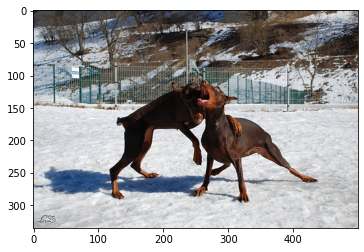

Referance Captions: 
dogs are in the snow in front of fence
dogs play on the snow
brown dogs playfully fight in the snow
brown dogs wrestle in the snow
dogs playing in the snow
Predicted Caption: 
dog is playing in the snow
bleu score:  0.5081327481546147


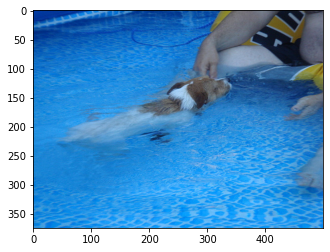

Referance Captions: 
brown and white dog swimming towards some in the pool
dog in swimming pool swims toward sombody we cannot see
dog swims in pool near person
dog is paddling through the water in pool
small brown and white dog is in the pool
Predicted Caption: 
little boy is playing in pool
bleu score:  0.5623413251903491


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


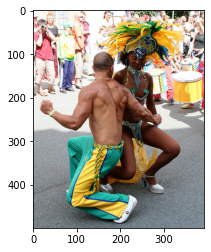

Referance Captions: 
man and woman in festive costumes dancing
man and woman with feathers on her head dance
man and woman wearing decorative costumes and dancing in crowd of onlookers
performer wearing feathered headdress dancing with another performer in the streets
people are dancing with drums on the right and crowd behind them
Predicted Caption: 
woman in red shirt and blue shirt
bleu score:  0.5169731539571706


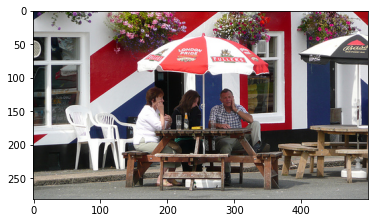

Referance Captions: 
couple of people sit outdoors at table with an umbrella and talk
people are sitting at an outside picnic bench with an umbrella
people sit at an outdoor cafe
people sit at an outdoor table in front of building painted like the union jack
people sit at picnic table outside of building painted like union jack
Predicted Caption: 
man in red shirt is jumping over
bleu score:  0.6147881529512643


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


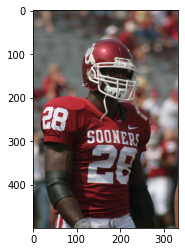

Referance Captions: 
man is wearing sooners red football shirt and helmet
oklahoma sooners football player wearing his jersey number
sooners football player weas the number and black armbands
in red and white football uniform
american footballer is wearing red and white strip
Predicted Caption: 
football player
bleu score:  0.1353352832366127


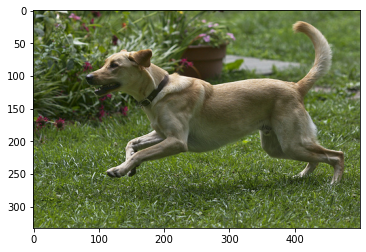

Referance Captions: 
brown dog running
brown dog running over grass
brown dog with its front paws off the ground on grassy surface near red and purple flowers
dog runs across grassy lawn near some flowers
yellow dog is playing in grassy area near flowers
Predicted Caption: 
dog is running through the grass
bleu score:  0.6389431042462724


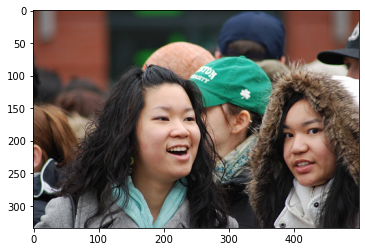

Referance Captions: 
girl with dark brown hair and eyes in blue scarf is standing next to girl in fur edged coat
asian boy and an asian girl are smiling in crowd of people
girls were in the crowd
dark haired girls are in crowd
girls are looking past each other in different directions while standing in crowd
Predicted Caption: 
woman in black shirt and black shirt
bleu score:  0.7311104457090247


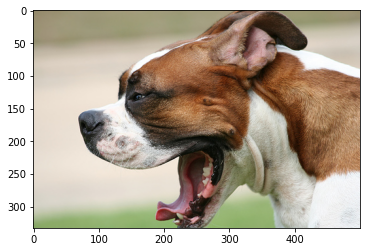

Referance Captions: 
dog with its mouth opened
and white dog yawning
of dog in profile with mouth open
yawns
dog mouth is open like he is yawning
Predicted Caption: 
dog
bleu score:  1.0


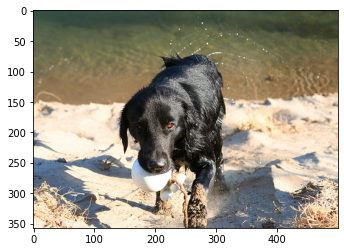

Referance Captions: 
black dog emerges from the water onto the sand holding white object in its mouth
black dog emerges from the water with white ball in its mouth
black dog on beach carrying ball in its mouth
black dog walking out of the water with white ball in his mouth
black dog jumps out of the water with something in its mouth
Predicted Caption: 
black dog is running through the snow
bleu score:  0.3884935863283276


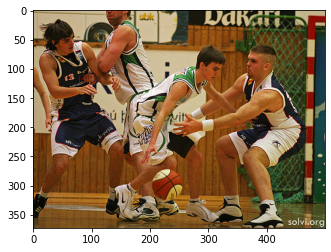

Referance Captions: 
player from the white and green highschool team dribbles down court defended by player from the other team
basketball players in action
men playing basketball two from each team
boys in green and white uniforms play basketball with two boys in blue and white uniforms
men playing basketball in competition
Predicted Caption: 
basketball player
bleu score:  0.36787944117144233


In [64]:
i=0
for img_id in test_features:
  i+=1
  img=cv2.imread("/content/drive/My Drive/Images/" + img_id + '.jpg')
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=test_features[img_id]
  plt.show()
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=greedy_search(photo)
  score = sentence_bleu(reference, candidate)
  print("Referance Captions: ")
  for cap in reference:
    print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  print("bleu score: ",score)
  if(i==10):
    break

In [ ]:
i=0
tot_score=0
for img_id in tqdm(test_features):
  i+=1
  photo=test_features[img_id]
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=greedy_search(photo)
  score = sentence_bleu(reference, candidate)
  tot_score+=score
avg_score=tot_score/i
print()
print("Bleu score on Greedy search")
print("Score: ",avg_score)

## Beam (Good)

In [37]:
def beam_search(photo,k):
  photo=photo.reshape(1,2048)
  in_text='<start>'
  sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
  sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
  y_pred = model.predict([photo,sequence],verbose=0)
  predicted=[]
  y_pred=y_pred.reshape(-1)
  for i in range(y_pred.shape[0]):
    predicted.append((i,y_pred[i]))
  predicted=sorted(predicted,key=lambda x:x[1])[::-1]
  b_search=[]
  for i in range(k):
    word = indices_to_words[predicted[i][0]]
    b_search.append((in_text +' ' + word,predicted[i][1]))
    
  for idx in range(max_length):
    b_search_square=[]
    for text in b_search:
      if text[0].split(" ")[-1]=="<end>":
        break
      sequence = [words_to_indices[s] for s in text[0].split(" ") if s in words_to_indices]
      sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
      y_pred = model.predict([photo,sequence],verbose=0)
      predicted=[]
      y_pred=y_pred.reshape(-1)
      for i in range(y_pred.shape[0]):
        predicted.append((i,y_pred[i]))
      predicted=sorted(predicted,key=lambda x:x[1])[::-1]
      for i in range(k):
        if predicted[i][0] != 0:
          word = indices_to_words[predicted[i][0]]
          b_search_square.append((text[0] +' ' + word,predicted[i][1]*text[1]))
    if(len(b_search_square)>0):
      b_search=(sorted(b_search_square,key=lambda x:x[1])[::-1])[:5]
  final=b_search[0][0].split()
  final = final[1:-1]
  #final=" ".join(final)
  return final

### Results

-------------------------------------------------------
Image number 1


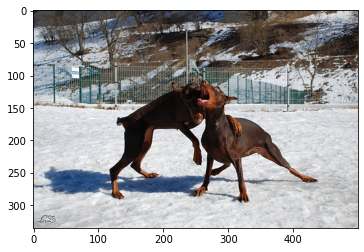

Referance Captions: 
dogs are in the snow in front of fence
dogs play on the snow
brown dogs playfully fight in the snow
brown dogs wrestle in the snow
dogs playing in the snow
Predicted Caption: 
brown dogs are playing in the grass
bleu score:  0.5814307369682193
-------------------------------------------------------


-------------------------------------------------------
Image number 2


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


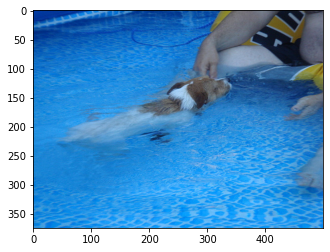

Referance Captions: 
brown and white dog swimming towards some in the pool
dog in swimming pool swims toward sombody we cannot see
dog swims in pool near person
dog is paddling through the water in pool
small brown and white dog is in the pool
Predicted Caption: 
little boy is jumping into the pool
bleu score:  0.5169731539571706
-------------------------------------------------------


-------------------------------------------------------
Image number 3


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


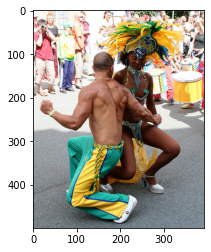

Referance Captions: 
man and woman in festive costumes dancing
man and woman with feathers on her head dance
man and woman wearing decorative costumes and dancing in crowd of onlookers
performer wearing feathered headdress dancing with another performer in the streets
people are dancing with drums on the right and crowd behind them
Predicted Caption: 
young girl in blue shirt is standing in the air
bleu score:  0.3860973950960897
-------------------------------------------------------


-------------------------------------------------------
Image number 4


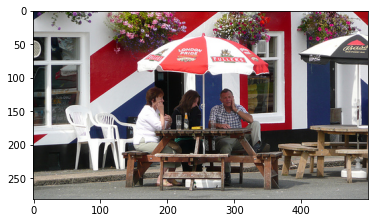

Referance Captions: 
couple of people sit outdoors at table with an umbrella and talk
people are sitting at an outside picnic bench with an umbrella
people sit at an outdoor cafe
people sit at an outdoor table in front of building painted like the union jack
people sit at picnic table outside of building painted like union jack
Predicted Caption: 
people are sitting in front of an outdoor area
bleu score:  0.5054229726989797
-------------------------------------------------------


-------------------------------------------------------
Image number 5


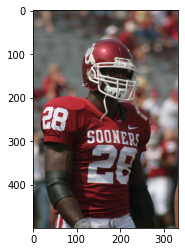

Referance Captions: 
man is wearing sooners red football shirt and helmet
oklahoma sooners football player wearing his jersey number
sooners football player weas the number and black armbands
in red and white football uniform
american footballer is wearing red and white strip
Predicted Caption: 
football player in red and white and white and white sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners sooners
bleu score:  0.08689810184588634
-------------------------------------------------------


-------------------------------------------------------
Image number 6


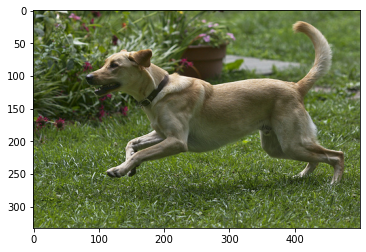

Referance Captions: 
brown dog running
brown dog running over grass
brown dog with its front paws off the ground on grassy surface near red and purple flowers
dog runs across grassy lawn near some flowers
yellow dog is playing in grassy area near flowers
Predicted Caption: 
brown dog is running through the grass
bleu score:  0.6337834876616586
-------------------------------------------------------


-------------------------------------------------------
Image number 7


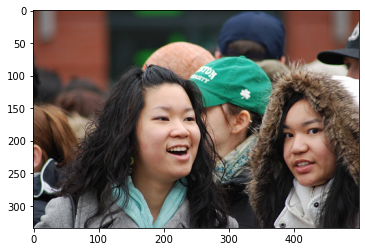

Referance Captions: 
girl with dark brown hair and eyes in blue scarf is standing next to girl in fur edged coat
asian boy and an asian girl are smiling in crowd of people
girls were in the crowd
dark haired girls are in crowd
girls are looking past each other in different directions while standing in crowd
Predicted Caption: 
group of people pose for the camera
bleu score:  0.5169731539571706
-------------------------------------------------------


-------------------------------------------------------
Image number 8


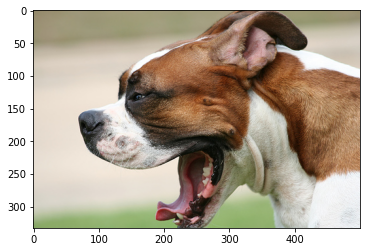

Referance Captions: 
dog with its mouth opened
and white dog yawning
of dog in profile with mouth open
yawns
dog mouth is open like he is yawning
Predicted Caption: 
brown and white dog is playing with its mouth
bleu score:  0.5773502691896257
-------------------------------------------------------


-------------------------------------------------------
Image number 9


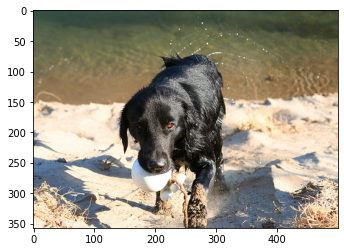

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


Referance Captions: 
black dog emerges from the water onto the sand holding white object in its mouth
black dog emerges from the water with white ball in its mouth
black dog on beach carrying ball in its mouth
black dog walking out of the water with white ball in his mouth
black dog jumps out of the water with something in its mouth
Predicted Caption: 
black and white dog is running through the snow
bleu score:  0.816496580927726
-------------------------------------------------------


-------------------------------------------------------
Image number 10


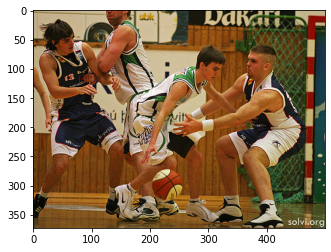

Referance Captions: 
player from the white and green highschool team dribbles down court defended by player from the other team
basketball players in action
men playing basketball two from each team
boys in green and white uniforms play basketball with two boys in blue and white uniforms
men playing basketball in competition
Predicted Caption: 
basketball player in white and white and white uniform is playing basketball
bleu score:  0.5027813786370188
-------------------------------------------------------


-------------------------------------------------------
Image number 11


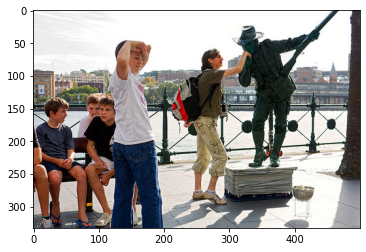

Referance Captions: 
group of tourists stand around as lady puts her hand near the mouth of statue
woman is making statue pretend to kiss her hand beside four boys at bench
woman posing with statue alongside group of boys
woman with backpack leans again statue while group of boys sit on bench talking
gets her hand kissed by living statue street artist
Predicted Caption: 
group of people are standing in front of the beach
bleu score:  0.4591497693322865
-------------------------------------------------------


-------------------------------------------------------
Image number 12


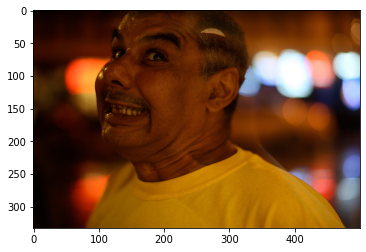

Referance Captions: 
man in yellow grimaces
man wearing yellow shirt with dramatic look on his face
man in the yellow tshirt is pulling large grin on his face
is man wearing yellow shirt and grimacing
man is smiling very big at the camera
Predicted Caption: 
man wearing black shirt and black shirt is wearing black shirt
bleu score:  0.5491004867761125
-------------------------------------------------------


-------------------------------------------------------
Image number 13


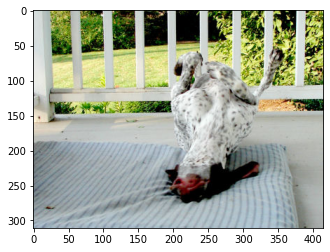

Referance Captions: 
dog lays on mattress on the porch
dog rolls on mattress placed on porch and scratches his back
spotted dog rolling over on pad placed on porch
white dog rolling on its back on porch
spotted dog rolls on its back
Predicted Caption: 
black and white dog is standing on the floor
bleu score:  0.6104735835807844
-------------------------------------------------------


-------------------------------------------------------
Image number 14


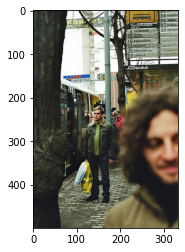

Referance Captions: 
man is standing on sidewalk in the background with blurry image of another man in the foreground
man stands at busy bus stop
man stands next to bus
in the city
walking down the street and past an open bus
Predicted Caption: 
man is standing in front of the window
bleu score:  0.3836398229803295
-------------------------------------------------------


-------------------------------------------------------
Image number 15


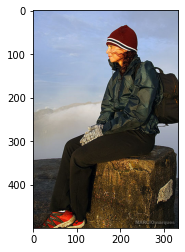

Referance Captions: 
girl wearing brown cap red sneakers and dark green coat sits on rock bench
hiker in jacket and knit cap sits with backpack on atop stone with cloudy sky in the background
woman in knit cap and green coat its on stone block looking out
woman with her backpack sits on large rock and looks down over the mountains
lady is sitting on rock
Predicted Caption: 
man is sitting on the top of the top of the top of the side of the side of the water
bleu score:  0.17793925745339384
-------------------------------------------------------


-------------------------------------------------------
Image number 16


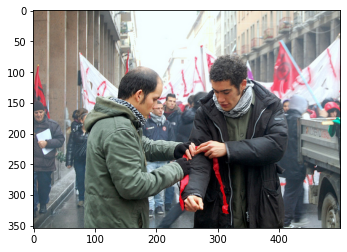

Referance Captions: 
man helps another man tie red ribbon onto his arm
man helps tie red ribbon around another man right arm during street parade
man is tying red arm band around another mans arm in the street
man helps another attach red ribbon to his forearm in the midst of large group of people
men stand together one is putting something red on his arm
Predicted Caption: 
group of people are standing in front of the street
bleu score:  0.4132584091896901
-------------------------------------------------------


-------------------------------------------------------
Image number 17


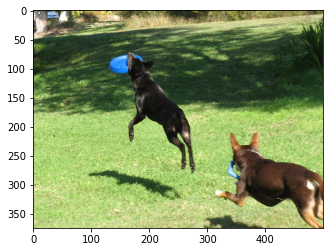

Referance Captions: 
dog with frisbee in front of brown dog
large black dog is catching frisbee while large brown dog follows shortly after
dark colored dogs romp in the grass with blue frisbee
dogs are catching blue frisbees in grass
dogs are playing one is catching frisbee
Predicted Caption: 
black and white dog is running through the grass
bleu score:  0.6104735835807844
-------------------------------------------------------


-------------------------------------------------------
Image number 18


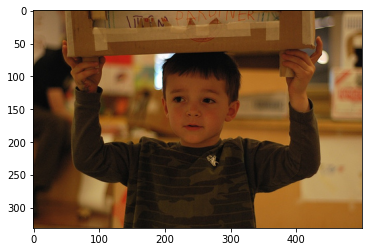

Referance Captions: 
boy holds picture over his head
boy in long sleeve shirt is holding box above his head
boy is inside holding something on top of his head
little boy holds decorated cardboard box on his head
young boy with samll cardboard box atop his head
Predicted Caption: 
little boy in blue shirt is wearing blue shirt
bleu score:  0.6756000774035172
-------------------------------------------------------


-------------------------------------------------------
Image number 19


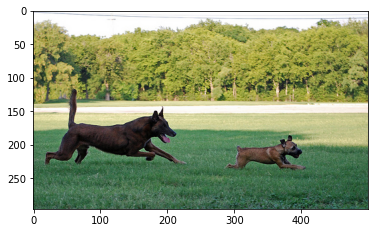

Referance Captions: 
big dog chases little dog on the grass
black dog is chasing smaller brown dog over grass
large brown dog is chasing after the little brown dog
brown dogs run through the grass together
dogs play in the grass
Predicted Caption: 
brown dogs are running through grassy field
bleu score:  0.5169731539571706
-------------------------------------------------------


-------------------------------------------------------
Image number 20


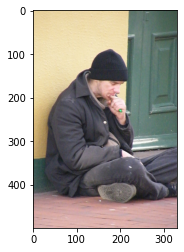

Referance Captions: 
man is sitting on the floor outside door and his head on his chin
man sits against yellow wall wearing all black
man wearing dark blue hat sits on the ground and leans against building
with black hat coat and pants sitting next to the door of building
man in the black hat is sitting on the floor beside the green door
Predicted Caption: 
man in black shirt is sitting in front of brick wall
bleu score:  0.49799066811275133
-------------------------------------------------------


-------------------------------------------------------
Image number 21


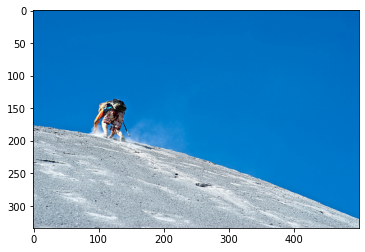

Referance Captions: 
hiker ascends snowy hill
man reaches the top of tall sand dune
person is hiking to the top of hill
person walks up white sandy hill against the blue sky
person is wearing shorts and climbing gray sand hill under blue sky
Predicted Caption: 
man in red jacket is standing on top of the top of snowy mountain
bleu score:  0.2722589423069702
-------------------------------------------------------


-------------------------------------------------------
Image number 22


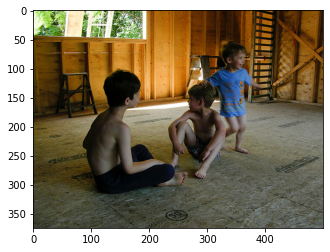

Referance Captions: 
boys in building under construction
boys play in an unfinished building
boys playing in an unfinished space
little boys are playing on the floor of an unfinished house
young boys sit and one young boy stands on an unfinished wooden floor
Predicted Caption: 
man and woman are sitting in front of the water
bleu score:  0.7608745412138651
-------------------------------------------------------


-------------------------------------------------------
Image number 23


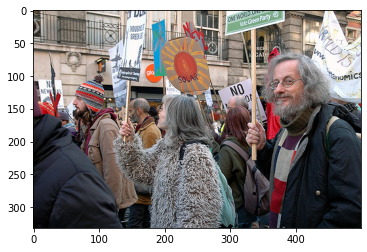

Referance Captions: 
crowd of people wearing jackets and holding signs
group of protesters picket in the road
large green peaceful protest is taken to the streets
protest march is passing by white stone building
of people walking with posters
Predicted Caption: 
group of people are standing in front of the street
bleu score:  0.5773502691896257
-------------------------------------------------------


-------------------------------------------------------
Image number 24


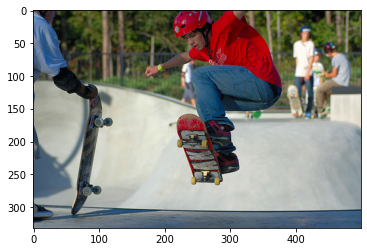

Referance Captions: 
man wearing red helmet jumps up while riding skateboard
young man wearing red jacket performs jump on red skateboard
helmeted boy is doing stunt on skateboard
young man is skateboarding at skate park
man is performing trick on skateboard in park
Predicted Caption: 
man in red shirt and orange shirt and orange shirt is wearing blue shirt
bleu score:  0.7730551756939454
-------------------------------------------------------


-------------------------------------------------------
Image number 25


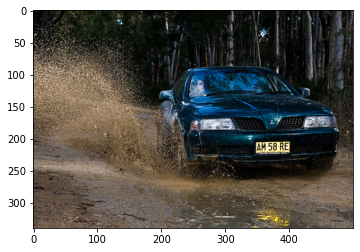

Referance Captions: 
black mitsubishi is driving through muddy puddle and spraying water
blue car splashes mud on dirt road while driving through puddle
blueish green car on dirt road splashing water on the left
dark blue car going through muddy road and sprinkling some to the side
is blue car on road in the roads splashing through puddle
Predicted Caption: 
suv is driving through the mud
bleu score:  0.2758512992979459
-------------------------------------------------------


-------------------------------------------------------
Image number 26


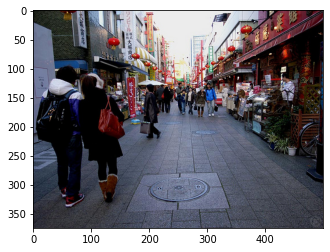

Referance Captions: 
busy city street with many people walking along it
couple walk to the side of crowded walkway
market street in the winter time
walk down paved street that has red lanterns hung from the buildings
walking down street lined with chinese lanterns
Predicted Caption: 
group of people are standing in front of building
bleu score:  0.7598356856515925
-------------------------------------------------------


-------------------------------------------------------
Image number 27


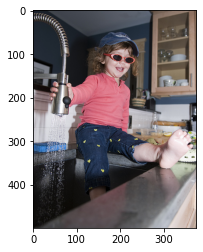

Referance Captions: 
little girl is sitting on the counter dangling one foot in the sink whilst holding dish jet washer
little girl plays with faucet
little girl wearing sunglasses puts her feet into the kitchen sink
young barefoot girl in red sunglasses plays in sink
young girl wearing red sunglasses sits near sink and holds the faucet
Predicted Caption: 
man in blue shirt is sitting on the couch
bleu score:  0.3155984539112945
-------------------------------------------------------


-------------------------------------------------------
Image number 28


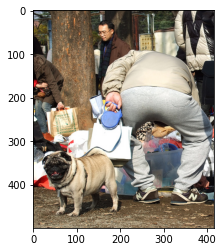

Referance Captions: 
dog waits as his owner rummages through collection of stuff
man holding the leash of pug bends down to look in bin at an outdoor rummage sale
man with pug dog bends over to pick something off the sidewalk
man with pug on leash bending down to examine merchandise
person holding small dog on leash is bending over and looking through items
Predicted Caption: 
woman is sitting in front of the ground
bleu score:  0.6548907866815301
-------------------------------------------------------


-------------------------------------------------------
Image number 29


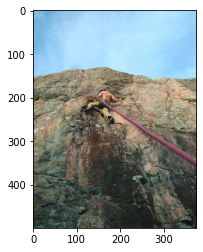

Referance Captions: 
man climbing mountain
man climbs mountain
man is climbing the side of mountain
shirtless man climbs up steep mountain
young white man is climbing mountain with rope as guide
Predicted Caption: 
man is climbing up rock face
bleu score:  0.5081327481546147
-------------------------------------------------------


-------------------------------------------------------
Image number 30


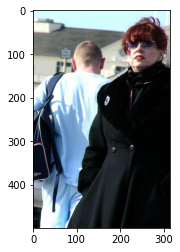

Referance Captions: 
woman in black overcoat and red hair with man in white walking behind her
woman wearing black coat and sunglasses is standing in front of man walking away with backpack
woman wears sunglasses and black coat as she walks
is woman in black jacket and sunglasses and man in white shirt with his back turned
woman in the dark coat is facing the camera while the man in the blue shirt faces away
Predicted Caption: 
man in black shirt is standing in front of the camera
bleu score:  0.49144984054308527
-------------------------------------------------------


-------------------------------------------------------
Image number 31


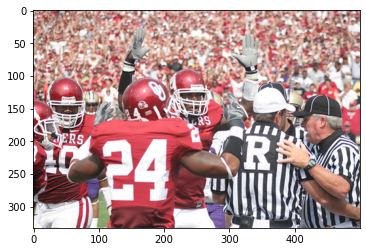

Referance Captions: 
football player in red and white is holding both hands up
players gather around the referees
players gathering to contest something to collaborating officials
university football players in front of crowd of sooners fans and next to three referees
red and white football team is talking with the officials
Predicted Caption: 
football player is being tackled
bleu score:  0.6223329772884784
-------------------------------------------------------


-------------------------------------------------------
Image number 32


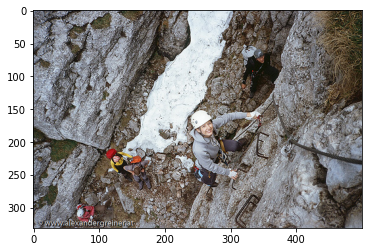

Referance Captions: 
woman wearing white helmeted looking up as she is calming huge rock wall
woman is climbing up steep mountain over water
mountain climbing
rock crawl up steep obstacle
helmeted people are rock climbing outdoors
Predicted Caption: 
rock climber climbing rock
bleu score:  0.6548907866815301
-------------------------------------------------------


-------------------------------------------------------
Image number 33


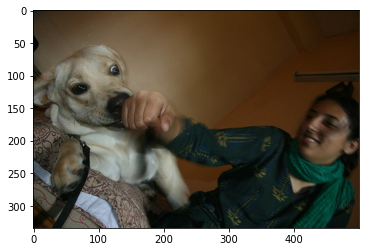

Referance Captions: 
smiling woman punching dog
tan dog licks girls hand while laying down
woman dressed in green is playing with her tan dog
girl with the green scarf and the white dog appear to be playing
light brown dog with white spots is nibbling on the girls hand
Predicted Caption: 
brown dog is playing with his nose
bleu score:  0.44815260192961937
-------------------------------------------------------


-------------------------------------------------------
Image number 34


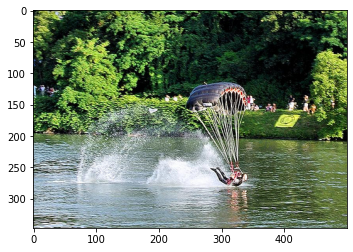

Referance Captions: 
man crashes into the water with his parachute
parasailer splashes along the surface of lake
person hanging from parachute makes splash as their body hits the water
person in parachute sliding across the water
parasailer is skipping across the water
Predicted Caption: 
man in blue shirt is standing in the water
bleu score:  0.5133450480401704
-------------------------------------------------------


-------------------------------------------------------
Image number 35


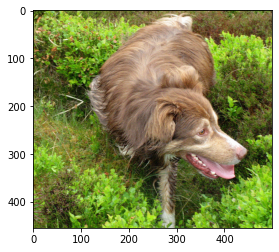

Referance Captions: 
brown dog walks in the under brush
dog pauses in the bushes
dog runs through the long grass
dog with mouth open standing amidst greenery
longhaired dog in garden
Predicted Caption: 
brown and white dog is running through the grass
bleu score:  0.5133450480401704
-------------------------------------------------------


-------------------------------------------------------
Image number 36


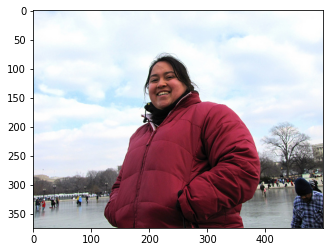

Referance Captions: 
girl in red jacket surrounded by people
woman in puffy red jacket poses for picture at an ice skating rink
woman in red coat is smiling while people in the background are walking around in winter clothing
woman wearing red coat smiles down at the camera
woman in red jacket is smiling at the camera
Predicted Caption: 
woman in blue shirt is standing on the top of the water
bleu score:  0.3838665842168265
-------------------------------------------------------


-------------------------------------------------------
Image number 37


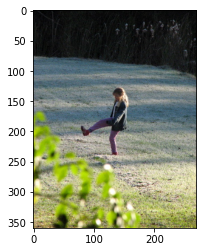

Referance Captions: 
girl is standing on one leg in the middle of the field
girl with her leg out on lawn
little girl kicks into the air
warmly dressed girl kicks up her leg outdoors
walking in the field
Predicted Caption: 
little girl in green shirt is running through the grass
bleu score:  0.4854917717073234
-------------------------------------------------------


-------------------------------------------------------
Image number 38


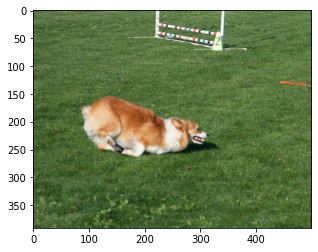

Referance Captions: 
brown and white dog lays down in grassy field
dog is crouching on the grass near hurdle
dog races along the grassy track
tan and white dog is competing in an agility test
and white dog playing in the grass
Predicted Caption: 
brown and white dog jumps up to catch red ball
bleu score:  0.2626909894424158
-------------------------------------------------------


-------------------------------------------------------
Image number 39


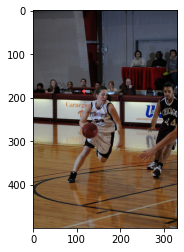

Referance Captions: 
basketball player wearing black and white uniform dribbles the ball
women basketball game white skinned woman dribbles against the chicago defense
players in action
basketball player in white is dribbling the ball towards the player in black
in white dribbling basketball
Predicted Caption: 
basketball player in white and white and white and white and white and white and white and white and white basketball
bleu score:  0.1291802583371725
-------------------------------------------------------


-------------------------------------------------------
Image number 40


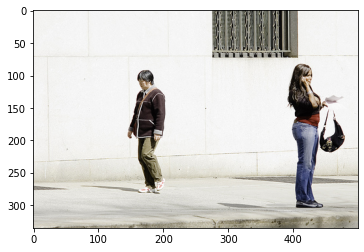

Referance Captions: 
dark skinned man walks by woman talking on cellphone
male walking and female talking on the phone beside the concrete building
stand outside near concrete wall and window
people standing on the sidewalk
women one carrying purse and papers are standing on sidewalk
Predicted Caption: 
people are standing in front of the beach
bleu score:  0.5169731539571706
-------------------------------------------------------


-------------------------------------------------------
Image number 41


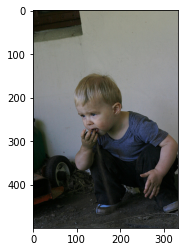

Referance Captions: 
child puts dirt into his mouth
little boy who is playing outdoors is tasting dirt
small child squats and puts dirt into his mouth
toddler eats dirt
little boy wearing the blue shirt is putting dirt in his mouth
Predicted Caption: 
little boy in red shirt is sitting in the air
bleu score:  0.6042750794713536
-------------------------------------------------------


-------------------------------------------------------
Image number 42


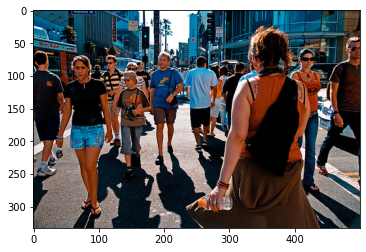

Referance Captions: 
crowd of people walk down busy sidewalk
group of different people are walking in all different directions in city
group of people walking city street in warm weather
intersection in the summer time in city
in summer clothes are walking on the sidewalk of large city
Predicted Caption: 
group of people are standing in front of large building
bleu score:  0.4272870063962341
-------------------------------------------------------


-------------------------------------------------------
Image number 43


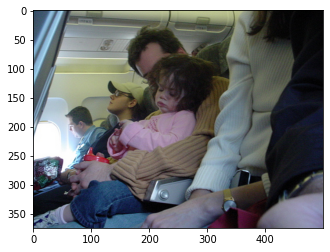

Referance Captions: 
man sits in an airplane seat holding young girl in his arms surrounded by other passengers
small girl wearing pink sleeps on man lap as they ride in an airplane
young girl falls asleep in her father arms while seated on an airplane
girl sleeping in crowded airplane
girl wearing pink sweater sitting on man
Predicted Caption: 
man in black shirt is sitting on the subway
bleu score:  0.48549177170732344
-------------------------------------------------------


-------------------------------------------------------
Image number 44


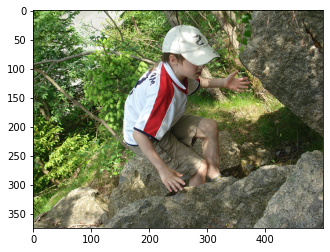

Referance Captions: 
boy climbing rocky area
boy climbs rocks in the woods
boy climbs up some rocks
young boy wearing white hat is climbing rocks
boy is wearing hat
Predicted Caption: 
man is standing on the top of the top of the top of rock
bleu score:  0.6147881529512643
-------------------------------------------------------


-------------------------------------------------------
Image number 45


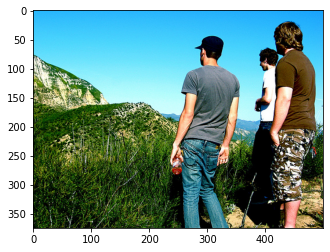

Referance Captions: 
man looking into the distance
men are standing on cliff overlooking mountains and the ocean
men are staring at the big green hills in the distance
men looking at grass covered hill
men stand on mountain looking at another
Predicted Caption: 
man is standing on the edge of rock overlooking the water
bleu score:  0.4832697830906221
-------------------------------------------------------


-------------------------------------------------------
Image number 46


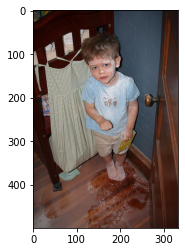

Referance Captions: 
child and floor covered in white powder
little boy is in the corner covered in white powder that is all over him and the floor
little boy with mess all over his face and feet stands next to door
young boy is caught making mess of his room
young child covered with white powder
Predicted Caption: 
little boy in blue shirt is sitting on hardwood floor
bleu score:  0.4854917717073234
-------------------------------------------------------


-------------------------------------------------------
Image number 47


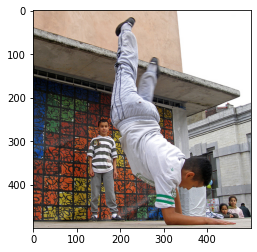

Referance Captions: 
boy in white tracksuit is break dancing on the ground in front of colorful wall
city break dancer starts to spin
man balances on his forearms while child watches in front of colorful background
watch man doing dance moves
break dancer is wearing white shirt and grey pants
Predicted Caption: 
man in black shirt and black shirt is sitting on the top of the street
bleu score:  0.5253819788848316
-------------------------------------------------------


-------------------------------------------------------
Image number 48


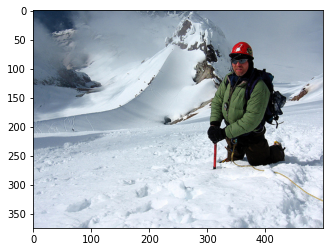

Referance Captions: 
man crouched on snowy peak
man in green jacket stands in deep snow at the base of mountain
man kneels in the snow
man measures the depth of snow
mountain hiker is digging steaks into the thck snow
Predicted Caption: 
man in red jacket is skiing
bleu score:  0.6042750794713536
-------------------------------------------------------


-------------------------------------------------------
Image number 49


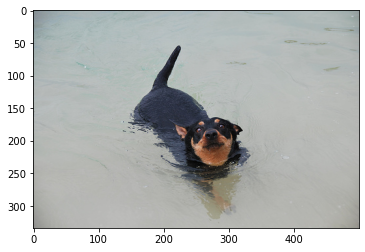

Referance Captions: 
black and brown dog is walking in the water and looking at the camera
black dog with brown on his face is swimming
brown and black dog swimming in river
large dog looks up as he swims
with black and tan face standing in water looking up at camera
Predicted Caption: 
black and white dog is standing in the water
bleu score:  0.5307712171072443
-------------------------------------------------------


-------------------------------------------------------
Image number 50


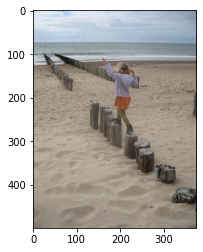

Referance Captions: 
blonde girl is stepping on vertical logs in the sand
little girl is walking along line of logs on sandy beach
young girl balances on wooden pylons at the beach
young girl is walking on stumps on the beach next to the ocean
walking along the tops of wooden posts set into sand on beach
Predicted Caption: 
people are standing on the beach
bleu score:  0.2868106410131918
-------------------------------------------------------


-------------------------------------------------------
Image number 51


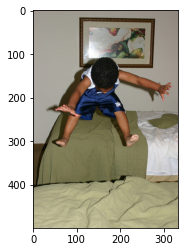

Referance Captions: 
boy is jumping on bed
boy jumped up from the green bed
boy jumps from one bed to another
small child is jumping on bed
boy in blue shorts is bouncing on the bed
Predicted Caption: 
young boy in red shirt is sitting in the air
bleu score:  0.4591497693322865
-------------------------------------------------------


-------------------------------------------------------
Image number 52


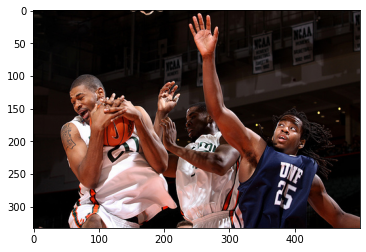

Referance Captions: 
basketball players are grabbing for the ball during game
basketball player in white holds the ball
basketball players leap to grab ball
men are playing game of basketball
men are playing basketball
Predicted Caption: 
man in the white shirt and white shirt is being lifted to the ball
bleu score:  0.4071220775553065
-------------------------------------------------------


-------------------------------------------------------
Image number 53


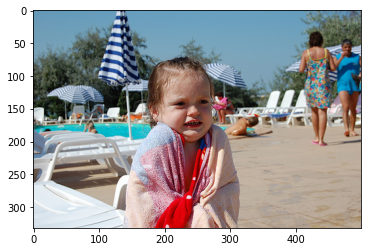

Referance Captions: 
girl is cold after coming out of the pool and is covered by towel
little girl is covered in towel at swimming pool
toddler is with wet hair stands by swimming pool wrapped in towel
wet child is shivering in towel in front of pool
wet child shivers under towel at pool
Predicted Caption: 
little girl in pink shirt is standing in front of the water
bleu score:  0.3945881255591767
-------------------------------------------------------


-------------------------------------------------------
Image number 54


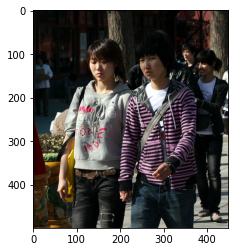

Referance Captions: 
couple is walking down the sidewalk
couple walks down city street holding hands
asian girl wearing pink and black striped top is walking next to the girl in the grey top
students walk down street holding hands
women are walking casually down the street together
Predicted Caption: 
group of people are standing in front of the camera
bleu score:  0.7400828044922853
-------------------------------------------------------


-------------------------------------------------------
Image number 55


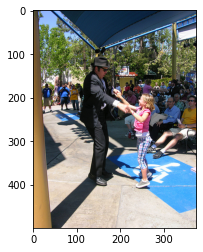

Referance Captions: 
man and girl stand in front of large crowd
man dances with girl
man in suit dances with young girl in front of an audience
man wearing black dances with young girl wearing pink shirt
man wearing the blues brothers suit is dancing with the little girl in the pink top
Predicted Caption: 
man in red shirt is jumping into the air
bleu score:  0.5133450480401704
-------------------------------------------------------


-------------------------------------------------------
Image number 56


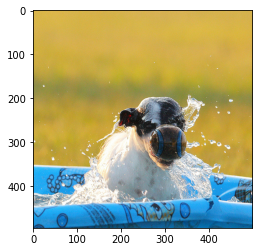

Referance Captions: 
dog comes out of blue baby pool with ball in his mouth
dog is in the paddling pool playing with ball
dog plays with ball in kiddie pool
dog splashing in small pool with small football
white and black dog plays in blue pool with ball
Predicted Caption: 
white and white dog swims through the water
bleu score:  0.5169731539571706
-------------------------------------------------------


-------------------------------------------------------
Image number 57


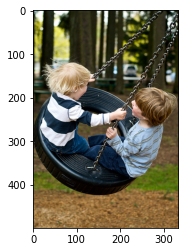

Referance Captions: 
children are playing on swing made out of tire
children swing around in tire swing at park
children swinging on tire swing
small children happily playing on tire swing
small children wearing blue jeans enjoy swinging in tire swing
Predicted Caption: 
young girl in blue shirt is swinging on swing
bleu score:  0.6104735835807844
-------------------------------------------------------


-------------------------------------------------------
Image number 58


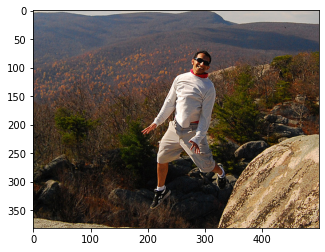

Referance Captions: 
man leaping into the air with mountain vista behind him
man poses as he jumps from rock to rock in forest
man steps off of boulder
young man leaps through the air from rocky mountaintop
young man poses as he jumps in midair between two rocks in highland
Predicted Caption: 
man is standing on the top of the top of rock
bleu score:  0.7765453555044466
-------------------------------------------------------


-------------------------------------------------------
Image number 59


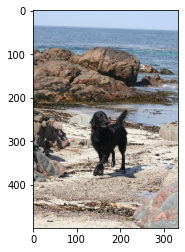

Referance Captions: 
black dog on rocky beach
black dog walks along an ocean front
black dog walks on the beach near the rocks
black dog walks on the sand
dog walking on the beach after swimming in the ocean
Predicted Caption: 
black dog is walking on the beach
bleu score:  0.488923022434901
-------------------------------------------------------


-------------------------------------------------------
Image number 60


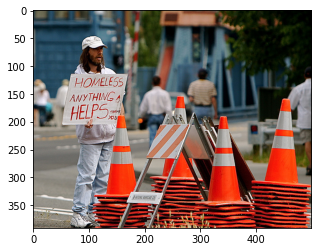

Referance Captions: 
homeless man in white cap is standing behind large orange cones
homeless man standing in construction site
homeless man stands with sign next to orange construction cones
man holds sign reading homeless anything helps near construction site
of orange safety cones in front of man holding up homeless sign
Predicted Caption: 
group of people are standing in front of an amusement park
bleu score:  0.35084396956386854
-------------------------------------------------------




In [41]:
i=0
for img_id in test_features:
  i+=1
  print("-------------------------------------------------------")
  print(f"Image number {i}")
  img=cv2.imread("/content/drive/My Drive/Images/" + img_id + '.jpg')
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=test_features[img_id]
  plt.show()
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=beam_search(photo,3)
  score = sentence_bleu(reference, candidate)
  print("Referance Captions: ")
  for cap in reference:
    print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  print("bleu score: ",score)
  print("-------------------------------------------------------")
  print("\n")
  if(i==60):
    break

### Average Score

In [40]:
i=0
tot_score=0
for img_id in tqdm(test_features):
  i+=1
  photo=test_features[img_id]
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=beam_search(photo,3)
  score = sentence_bleu(reference, candidate)
  tot_score+=score
avg_score=tot_score/i
print()
print("Bleu score on Beam search with k=3")
print("Score: ",avg_score)

  0%|          | 0/1000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)
  0%|          | 1/1000 [00:01<30:38,  1.84s/it]/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)
  1%|          | 8/1000 [00:23<47:14,  2.86s/it]/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)
100%|██████████| 1000/1000 [43:57<00:00,  2.64s/it]


Bleu score on Beam search with k=3
Score:  0.5234283526281284
